# <font color="#1d479b">Import librairies</font>

In [158]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
sns.set_style('darkgrid')
import missingno as msno
%matplotlib inline

from sklearn.neighbors import KNeighborsRegressor
import scipy.stats
from sklearn.impute import KNNImputer
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from pycaret.regression import setup, compare_models
from sklearn.model_selection import KFold, cross_val_score, cross_val_predict
from sklearn import metrics
from sklearn.model_selection import GridSearchCV

from sklearn.linear_model import BayesianRidge, HuberRegressor, Ridge, OrthogonalMatchingPursuit
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import StackingRegressor

import optuna
import time
plt.rcParams['figure.figsize'] = (7, 5) 

pd.set_option("display.precision", 2)
pd.options.display.max_columns = None
pd.options.display.max_rows = 100

In [160]:
import sklearn
print(sklearn.__version__)

0.23.2


In [ ]:
! pip install optuna

In [ ]:
!pip3 install xgboost

In [ ]:
!pip3 install catboost

In [ ]:
!pip install pycaret

In [89]:
df_train = pd.read_csv('train.csv')
print(df_train.shape)
df_train.head(3)

(1460, 81)


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500


In [3]:
df_test = pd.read_csv('test.csv')
print(df_test.shape)
df_test.head(3)

(1459, 80)


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,GasA,TA,Y,SBrkr,896,0,0,896,0.0,0.0,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.0,Unf,1.0,730.0,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,TA,TA,CBlock,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0,0.0,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.0,Unf,1.0,312.0,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,GLQ,791.0,Unf,0.0,137.0,928.0,GasA,Gd,Y,SBrkr,928,701,0,1629,0.0,0.0,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.0,Fin,2.0,482.0,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal


In [4]:
df_submission = pd.read_csv('sample_submission.csv')
print(df_submission.shape)
df_submission.head(3)

(1459, 2)


,Id,SalePrice
0,1461,169277.05
1,1462,187758.39
2,1463,183583.68


In [5]:
df_submission = pd.read_csv('sample_submission.csv')
print(df_submission.shape)
df_submission.tail(3)

(1459, 2)


,Id,SalePrice
1456,2917,219222.42
1457,2918,184924.28
1458,2919,187741.87


# <font color="#1d479b">Combine Train & Test set</font>

In [4]:
y = df_train['SalePrice']

In [5]:
# Check if there is NaN values in df_train['SalePrice']
df_train["SalePrice"].isna().sum()

0

In [6]:
df_train.drop('SalePrice', axis=1, inplace=True)

In [7]:
df_init = pd.concat([df_train, df_test], axis=0, sort=False)
print(df_init.shape)
df_init.head(3)

(2919, 80)


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706.0,Unf,0.0,150.0,856.0,GasA,Ex,Y,SBrkr,856,854,0,1710,1.0,0.0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2.0,548.0,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.0,Unf,0.0,284.0,1262.0,GasA,Ex,Y,SBrkr,1262,0,0,1262,0.0,1.0,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2.0,460.0,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.0,Unf,0.0,434.0,920.0,GasA,Ex,Y,SBrkr,920,866,0,1786,1.0,0.0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2.0,608.0,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal


# <font color="#1d479b">Formatting error</font>

In [8]:
df_init["MSZoning"] = df_init["MSZoning"].replace('C (all)', 'C')
df_init["MasVnrType"]=df_init["MasVnrType"].fillna("None")
df_init["Alley"]=df_init["Alley"].fillna("None")
df_init["BsmtQual"]=df_init["BsmtQual"].fillna("None")
df_init["BsmtCond"]=df_init["BsmtCond"].fillna("None")
df_init["BsmtExposure"]=df_init["BsmtExposure"].fillna("None")
df_init["BsmtFinType1"]=df_init["BsmtFinType1"].fillna("None")
df_init["BsmtFinType2"]=df_init["BsmtFinType2"].fillna("None")
df_init["FireplaceQu"]=df_init["FireplaceQu"].fillna("None")
df_init["GarageType"]=df_init["GarageType"].fillna("None")
df_init["GarageFinish"]=df_init["GarageFinish"].fillna("None")
df_init["GarageQual"]=df_init["GarageQual"].fillna("None")
df_init["GarageCond"]=df_init["GarageCond"].fillna("None")
df_init["PoolQC"]=df_init["PoolQC"].fillna("None")
df_init["Fence"]=df_init["Fence"].fillna("None")
df_init["MiscFeature"]=df_init["MiscFeature"].fillna("None")

In [9]:
df_init2 = df_init.copy()
print(df_init2.shape)

(2919, 80)


# <font color="#1d479b">Missing Values </font>

## <font color="#337da4">Impute Numericals</font>

In [924]:
df_init2.select_dtypes(include=['float64','int64']).head()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
0,1,60,65.0,8450,7,5,2003,2003,196.0,706.0,0.0,150.0,856.0,856,854,0,1710,1.0,0.0,2,1,3,1,8,0,2003.0,2.0,548.0,0,61,0,0,0,0,0,2,2008
1,2,20,80.0,9600,6,8,1976,1976,0.0,978.0,0.0,284.0,1262.0,1262,0,0,1262,0.0,1.0,2,0,3,1,6,1,1976.0,2.0,460.0,298,0,0,0,0,0,0,5,2007
2,3,60,68.0,11250,7,5,2001,2002,162.0,486.0,0.0,434.0,920.0,920,866,0,1786,1.0,0.0,2,1,3,1,6,1,2001.0,2.0,608.0,0,42,0,0,0,0,0,9,2008
3,4,70,60.0,9550,7,5,1915,1970,0.0,216.0,0.0,540.0,756.0,961,756,0,1717,1.0,0.0,1,0,3,1,7,1,1998.0,3.0,642.0,0,35,272,0,0,0,0,2,2006
4,5,60,84.0,14260,8,5,2000,2000,350.0,655.0,0.0,490.0,1145.0,1145,1053,0,2198,1.0,0.0,2,1,4,1,9,1,2000.0,3.0,836.0,192,84,0,0,0,0,0,12,2008


<AxesSubplot:>

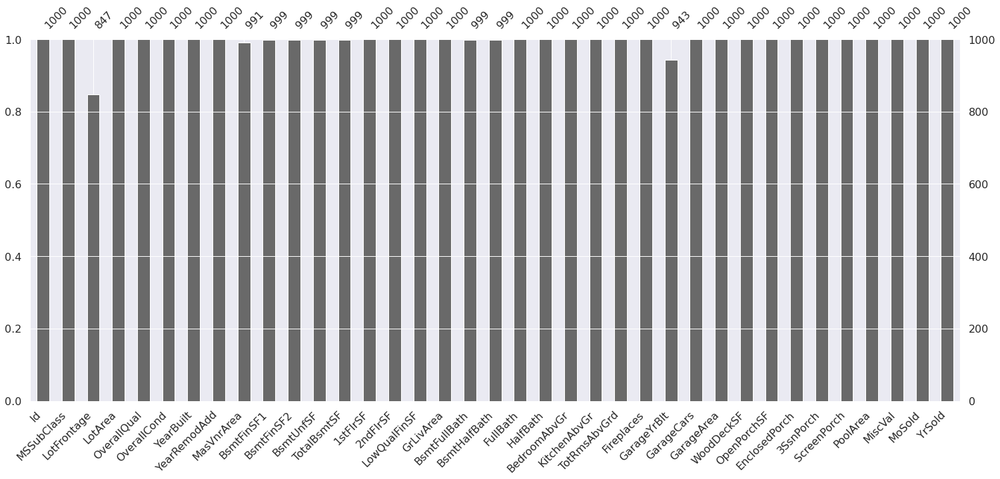

In [925]:
msno.bar(df_init2.select_dtypes(include=['float64','int64']).sample(1000))

<AxesSubplot:>

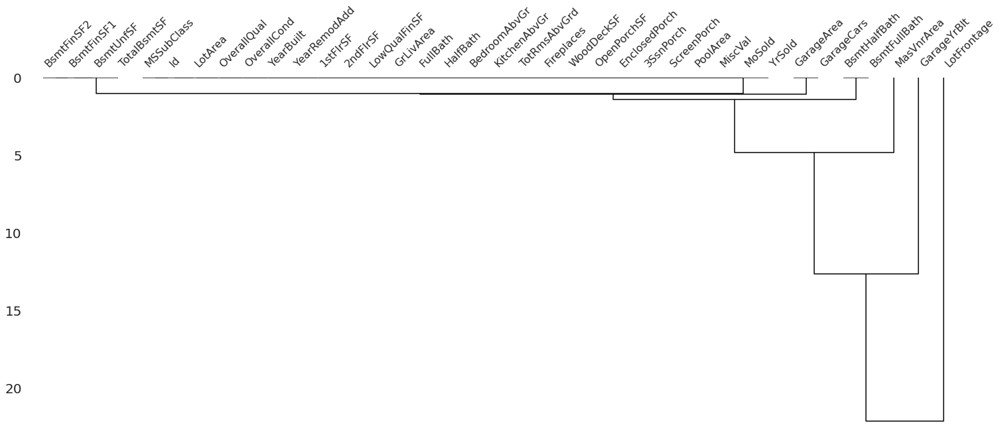

In [926]:
msno.dendrogram(df_init2.select_dtypes(include=['float64','int64']))

In [927]:
na_df = pd.DataFrame(pd.isnull(df_init2.select_dtypes(include=['float64','int64'])).sum())
na_df = na_df[na_df[0] > 0]
na_df

,0
LotFrontage,486
MasVnrArea,23
BsmtFinSF1,1
BsmtFinSF2,1
BsmtUnfSF,1
TotalBsmtSF,1
BsmtFullBath,2
BsmtHalfBath,2
GarageYrBlt,159
GarageCars,1


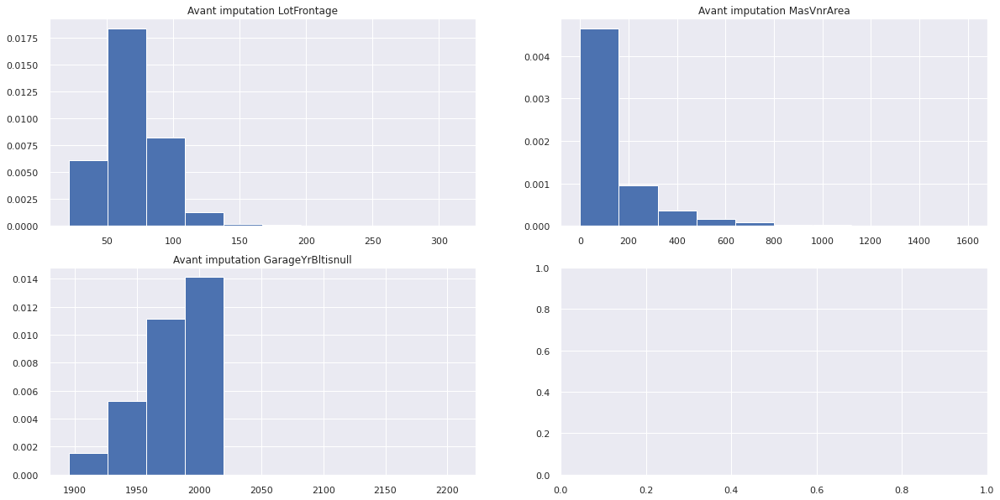

<Figure size 1440x720 with 0 Axes>

In [928]:
plt.rcParams['figure.figsize'] = (20, 10) #(L,l)


figure, axes = plt.subplots(2, 2)
ax1 = df_init2["LotFrontage"].hist(ax=axes[0,0],density=True)
ax1.set_title("Avant imputation LotFrontage")
ax2 = df_init2["MasVnrArea"].hist(ax=axes[0,1],density=True)
ax2.set_title("Avant imputation MasVnrArea")
ax3 = df_init2["GarageYrBlt"].hist(ax=axes[1,0],density=True)
ax3.set_title("Avant imputation GarageYrBltisnull")

plt.figure();

**Les variables quantitatives sont toutes dépendantes, donc on va procéder avecv le KNN imputer.**

In [10]:
from sklearn.impute import KNNImputer

columns = df_init2.select_dtypes(include=['float64','int64']).columns
df_num = df_init2.loc[:,columns]
imputer = KNNImputer(n_neighbors=2)
df_num = pd.DataFrame(imputer.fit_transform(df_num),columns=list(df_num.columns))

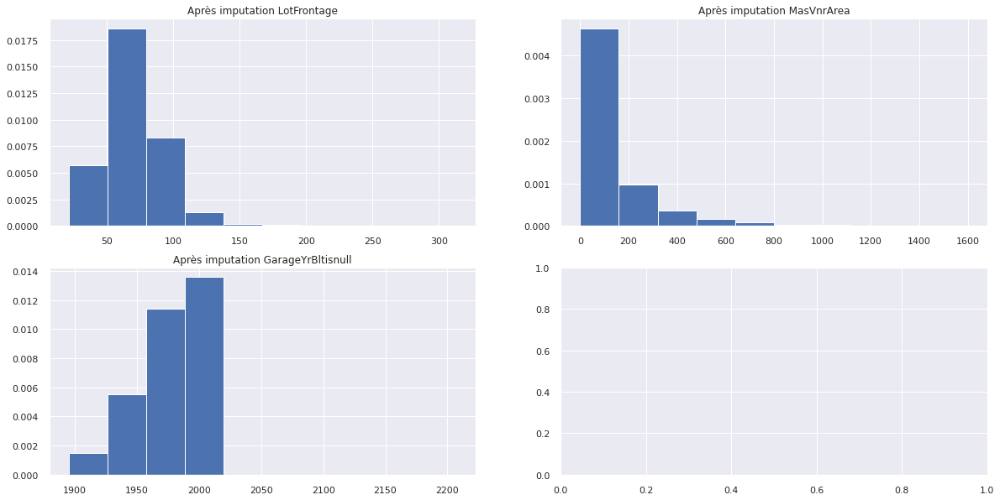

<Figure size 1440x720 with 0 Axes>

In [930]:
# Distribution after imputation

plt.rcParams['figure.figsize'] = (20, 10) #(L,l)


figure, axes = plt.subplots(2, 2)
ax1 = df_num["LotFrontage"].hist(ax=axes[0,0],density=True)
ax1.set_title("Après imputation LotFrontage")
ax2 = df_num["MasVnrArea"].hist(ax=axes[0,1],density=True)
ax2.set_title("Après imputation MasVnrArea")
ax3 = df_num["GarageYrBlt"].hist(ax=axes[1,0],density=True)
ax3.set_title("Après imputation GarageYrBltisnull")

plt.figure();

In [ ]:
! pip install -U scikit-learn scipy matplotlib

<AxesSubplot:>

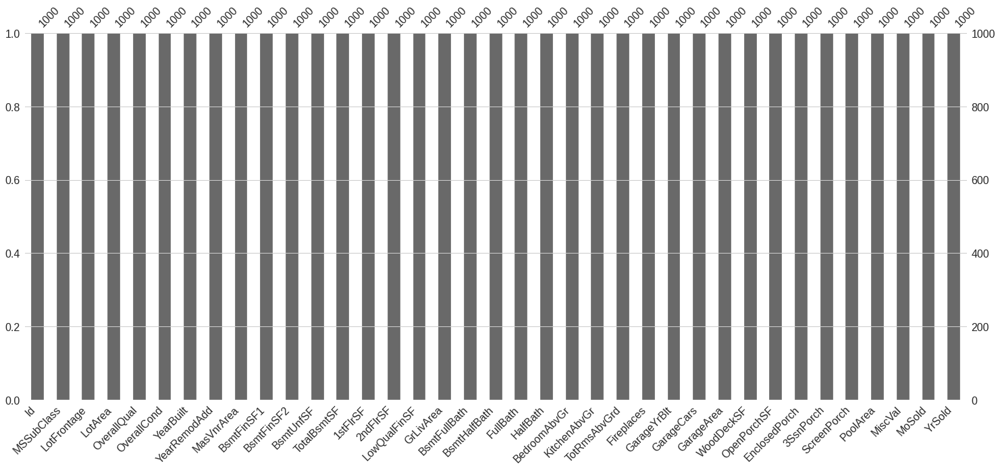

In [11]:
msno.bar(df_num.select_dtypes(include=['float64','int64']).sample(1000))

### <font color="#2cb7b0" id="section_1_1">Float to Int64</font>

In [932]:
'''

BsmtFullBath > int64 : Basement full bathrooms - Salles de bains complètes au sous-sol
BsmtHalfBath > int64 : Basement half bathrooms - Demi-salles de bain au sous-sol

GarageYrBlt > int64 : Year garage was built
GarageCars > int64 : Size of garage in car capacity

'''

df_num.columns

Index(['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold'],
      dtype='object')

In [12]:
# Types Float to Int64 

col_names = ["Id","BsmtFullBath","BsmtHalfBath","GarageYrBlt","GarageCars",
             
             # Add some more int64 variables..
             "YearBuilt","YearRemodAdd",
             "FullBath","HalfBath",
             "BedroomAbvGr","KitchenAbvGr","TotRmsAbvGrd",
             "Fireplaces",
             "MoSold","YrSold","MiscVal"]

df_num[col_names] =df_num[col_names].astype('int64')

### <font color="#2cb7b0" id="section_1_1">Int64 to Object</font>

In [13]:
# Int64 to categorical

'''
MSSubClass > categorical : Identifies the type of dwelling involved in the sale. - Identifie le type de logement concerné par la vente
OverallQual > categorical :  Rates the overall material and finish of the house
OverallCond > categorical : Rates the overall condition of the house

'''


col_names = ["MSSubClass","OverallQual","OverallCond"]
for col in col_names:
    df_num[col] = df_num[col].astype(str,copy=False)

In [14]:
df_num.dtypes

Id                 int64
MSSubClass        object
LotFrontage      float64
LotArea          float64
OverallQual       object
OverallCond       object
YearBuilt          int64
YearRemodAdd       int64
MasVnrArea       float64
BsmtFinSF1       float64
BsmtFinSF2       float64
BsmtUnfSF        float64
TotalBsmtSF      float64
1stFlrSF         float64
2ndFlrSF         float64
LowQualFinSF     float64
GrLivArea        float64
BsmtFullBath       int64
BsmtHalfBath       int64
FullBath           int64
HalfBath           int64
BedroomAbvGr       int64
KitchenAbvGr       int64
TotRmsAbvGrd       int64
Fireplaces         int64
GarageYrBlt        int64
GarageCars         int64
GarageArea       float64
WoodDeckSF       float64
OpenPorchSF      float64
EnclosedPorch    float64
3SsnPorch        float64
ScreenPorch      float64
PoolArea         float64
MiscVal            int64
MoSold             int64
YrSold             int64
dtype: object

## <font color="#337da4">Impute Categoricals</font>


In [15]:
# All Categorical columns
df_cat = df_init2.select_dtypes(include=['object'])
print(df_cat.shape)
df_cat.head()

(2919, 43)


,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,RL,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,None,Attchd,RFn,TA,TA,Y,None,None,None,WD,Normal
1,RL,Pave,None,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,None,None,None,WD,Normal
2,RL,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,None,None,None,WD,Normal
3,RL,Pave,None,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,None,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Gd,Detchd,Unf,TA,TA,Y,None,None,None,WD,Abnorml
4,RL,Pave,None,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,None,None,None,WD,Normal


In [ ]:
# Add index column 
#df_cat.reset_index()

<AxesSubplot:>

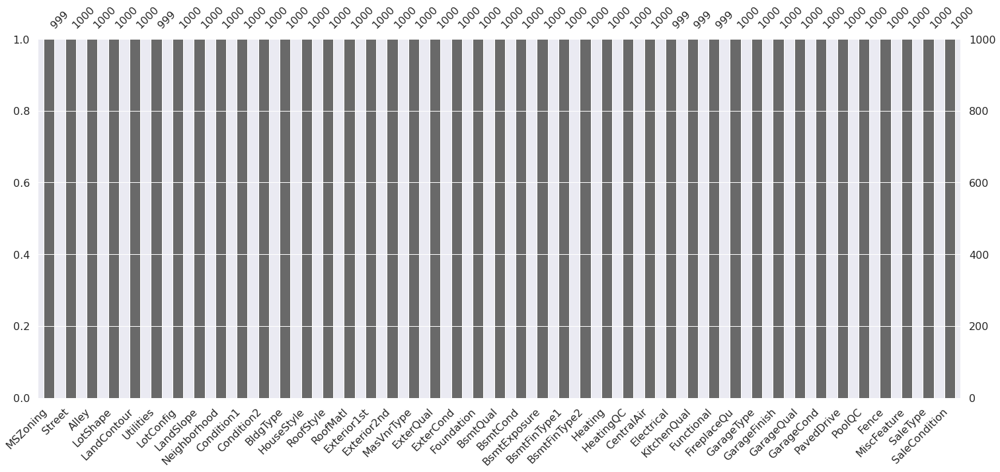

In [338]:
msno.bar(df_cat.sample(1000))

In [339]:
na_df = pd.DataFrame(pd.isnull(df_cat).sum())
na_df[na_df[0] > 0]

,0
MSZoning,4
Utilities,2
Exterior1st,1
Exterior2nd,1
Electrical,1
KitchenQual,1
Functional,2
SaleType,1


In [340]:
na_df[na_df[0] > 0].index

Index(['MSZoning', 'Utilities', 'Exterior1st', 'Exterior2nd', 'Electrical',
       'KitchenQual', 'Functional', 'SaleType'],
      dtype='object')

In [16]:
# Impute NaN

to_impute = ['MSZoning', 'Utilities', 'Exterior1st', 'Exterior2nd', 'Electrical',
       'KitchenQual', 'Functional', 'SaleType']

for column in to_impute:
    
    df_cat[column].fillna(df_cat[column].mode()[0], inplace=True)

In [938]:
na_df = pd.DataFrame(pd.isnull(df_cat).sum())
na_df[na_df[0] > 0]

,0


In [17]:
df_cat = df_cat.reset_index()
df_cleaned = pd.concat([df_num, df_cat], axis=1)
df_cleaned = df_cleaned.drop(["index"], axis=1)
print(df_cleaned.shape)
df_cleaned.head() #ok (2919, 81)

(2919, 80)


,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,1,60.0,65.0,8450.0,7.0,5.0,2003,2003,196.0,706.0,0.0,150.0,856.0,856.0,854.0,0.0,1710.0,1,0,2,1,3,1,8,0,2003,2,548.0,0.0,61.0,0.0,0.0,0.0,0.0,0,2,2008,RL,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,None,Attchd,RFn,TA,TA,Y,None,None,None,WD,Normal
1,2,20.0,80.0,9600.0,6.0,8.0,1976,1976,0.0,978.0,0.0,284.0,1262.0,1262.0,0.0,0.0,1262.0,0,1,2,0,3,1,6,1,1976,2,460.0,298.0,0.0,0.0,0.0,0.0,0.0,0,5,2007,RL,Pave,None,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,None,None,None,WD,Normal
2,3,60.0,68.0,11250.0,7.0,5.0,2001,2002,162.0,486.0,0.0,434.0,920.0,920.0,866.0,0.0,1786.0,1,0,2,1,3,1,6,1,2001,2,608.0,0.0,42.0,0.0,0.0,0.0,0.0,0,9,2008,RL,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,None,None,None,WD,Normal
3,4,70.0,60.0,9550.0,7.0,5.0,1915,1970,0.0,216.0,0.0,540.0,756.0,961.0,756.0,0.0,1717.0,1,0,1,0,3,1,7,1,1998,3,642.0,0.0,35.0,272.0,0.0,0.0,0.0,0,2,2006,RL,Pave,None,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,None,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Gd,Detchd,Unf,TA,TA,Y,None,None,None,WD,Abnorml
4,5,60.0,84.0,14260.0,8.0,5.0,2000,2000,350.0,655.0,0.0,490.0,1145.0,1145.0,1053.0,0.0,2198.0,1,0,2,1,4,1,9,1,2000,3,836.0,192.0,84.0,0.0,0.0,0.0,0.0,0,12,2008,RL,Pave,None,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,None,None,None,WD,Normal


In [18]:
df_cleaned1 = df_cleaned.copy()

### <font color="#2cb7b0" id="section_1_1">Object to Int64_Categorical</font>

In [345]:
# Categorical to Int64 Categorical for ordinal variables

for column in df_cleaned1.select_dtypes(include=['object']):
                                        print(column, df_cleaned1.select_dtypes(include=['object'])[column].unique())

MSSubClass ['60.0' '20.0' '70.0' '50.0' '190.0' '45.0' '90.0' '120.0' '30.0' '85.0'
 '80.0' '160.0' '75.0' '180.0' '40.0' '150.0']
OverallQual ['7.0' '6.0' '8.0' '5.0' '9.0' '4.0' '10.0' '3.0' '1.0' '2.0']
OverallCond ['5.0' '8.0' '6.0' '7.0' '4.0' '2.0' '3.0' '9.0' '1.0']
MSZoning ['RL' 'RM' 'C' 'FV' 'RH']
Street ['Pave' 'Grvl']
Alley ['None' 'Grvl' 'Pave']
LotShape ['Reg' 'IR1' 'IR2' 'IR3']
LandContour ['Lvl' 'Bnk' 'Low' 'HLS']
Utilities ['AllPub' 'NoSeWa']
LotConfig ['Inside' 'FR2' 'Corner' 'CulDSac' 'FR3']
LandSlope ['Gtl' 'Mod' 'Sev']
Neighborhood ['CollgCr' 'Veenker' 'Crawfor' 'NoRidge' 'Mitchel' 'Somerst' 'NWAmes'
 'OldTown' 'BrkSide' 'Sawyer' 'NridgHt' 'NAmes' 'SawyerW' 'IDOTRR'
 'MeadowV' 'Edwards' 'Timber' 'Gilbert' 'StoneBr' 'ClearCr' 'NPkVill'
 'Blmngtn' 'BrDale' 'SWISU' 'Blueste']
Condition1 ['Norm' 'Feedr' 'PosN' 'Artery' 'RRAe' 'RRNn' 'RRAn' 'PosA' 'RRNe']
Condition2 ['Norm' 'Artery' 'RRNn' 'Feedr' 'PosN' 'PosA' 'RRAn' 'RRAe']
BldgType ['1Fam' '2fmCon' 'Duplex' 'TwnhsE' 

In [346]:
columns_list = ["ExterQual","ExterCond","BsmtQual",
               "BsmtCond","BsmtExposure","HeatingQC",
               "KitchenQual","FireplaceQu","GarageQual",
               "GarageCond","PoolQC"]

for column in columns_list:
    print(column, df_cleaned1[column].unique()) 

ExterQual ['Gd' 'TA' 'Ex' 'Fa']
ExterCond ['TA' 'Gd' 'Fa' 'Po' 'Ex']
BsmtQual ['Gd' 'TA' 'Ex' 'None' 'Fa']
BsmtCond ['TA' 'Gd' 'None' 'Fa' 'Po']
BsmtExposure ['No' 'Gd' 'Mn' 'Av' 'None']
HeatingQC ['Ex' 'Gd' 'TA' 'Fa' 'Po']
KitchenQual ['Gd' 'TA' 'Ex' 'Fa']
FireplaceQu ['None' 'TA' 'Gd' 'Fa' 'Ex' 'Po']
GarageQual ['TA' 'Fa' 'Gd' 'None' 'Ex' 'Po']
GarageCond ['TA' 'Fa' 'None' 'Gd' 'Po' 'Ex']
PoolQC ['None' 'Ex' 'Fa' 'Gd']


In [347]:
unique_value = []
for column in columns_list:
    
    for value in df_cleaned1[column].unique():
        if value not in unique_value:
            unique_value.append(value)
            
    #print(column, df_cleaned1[column].unique()) 
    
unique_value    

['Gd', 'TA', 'Ex', 'Fa', 'Po', 'None', 'No', 'Mn', 'Av']

In [19]:
columns_list = ["ExterQual","ExterCond","BsmtQual",
               "BsmtCond","BsmtExposure","HeatingQC",
               "KitchenQual","FireplaceQu","GarageQual",
               "GarageCond","PoolQC"]

# Replaced by Int64 notation
for column in columns_list:
    df_cleaned1[column] = df_cleaned1[column].replace(['Gd', 'TA', 'Ex', 'Fa', 'Po', 'None', 'No', 'Mn', 'Av'], 
                               [7, 5, 9, 3, 2, 0, 0, 4, 5])
    
    

In [20]:
unique_value = []
for column in columns_list:
    
    for value in df_cleaned1[column].unique():
        if value not in unique_value:
            unique_value.append(value)
            
    #print(column, df_cleaned1[column].unique()) 
    
unique_value 

[7, 5, 9, 3, 2, 0, 4]

In [21]:
df_cleaned1["OverallCond"] = pd.to_numeric(df_cleaned1["OverallCond"])
df_cleaned1["OverallQual"] = pd.to_numeric(df_cleaned1["OverallQual"])
df_cleaned1["OverallCond"] = df_cleaned1["OverallCond"].astype(int)
df_cleaned1["OverallQual"] = df_cleaned1["OverallQual"].astype(int)

In [22]:
df_cleaned1.dtypes

Id                 int64
MSSubClass        object
LotFrontage      float64
LotArea          float64
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
MasVnrArea       float64
BsmtFinSF1       float64
BsmtFinSF2       float64
BsmtUnfSF        float64
TotalBsmtSF      float64
1stFlrSF         float64
2ndFlrSF         float64
LowQualFinSF     float64
GrLivArea        float64
BsmtFullBath       int64
BsmtHalfBath       int64
FullBath           int64
HalfBath           int64
BedroomAbvGr       int64
KitchenAbvGr       int64
TotRmsAbvGrd       int64
Fireplaces         int64
GarageYrBlt        int64
GarageCars         int64
GarageArea       float64
WoodDeckSF       float64
OpenPorchSF      float64
EnclosedPorch    float64
3SsnPorch        float64
ScreenPorch      float64
PoolArea         float64
MiscVal            int64
MoSold             int64
YrSold             int64
MSZoning          object
Street            object
Alley             object


In [23]:
df_cleaned2 = df_cleaned1.copy()
df_cleaned2.shape

(2919, 80)

# <font color="#1d479b">Exploratory Data Analysis</font>

**Exploration des données sur le train set**

**df_cleaned2**

In [24]:
df_cleaned2.head()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,1,60.0,65.0,8450.0,7,5,2003,2003,196.0,706.0,0.0,150.0,856.0,856.0,854.0,0.0,1710.0,1,0,2,1,3,1,8,0,2003,2,548.0,0.0,61.0,0.0,0.0,0.0,0.0,0,2,2008,RL,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,7,5,PConc,7,5,0,GLQ,Unf,GasA,9,Y,SBrkr,7,Typ,0,Attchd,RFn,5,5,Y,0,None,None,WD,Normal
1,2,20.0,80.0,9600.0,6,8,1976,1976,0.0,978.0,0.0,284.0,1262.0,1262.0,0.0,0.0,1262.0,0,1,2,0,3,1,6,1,1976,2,460.0,298.0,0.0,0.0,0.0,0.0,0.0,0,5,2007,RL,Pave,None,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,None,5,5,CBlock,7,5,7,ALQ,Unf,GasA,9,Y,SBrkr,5,Typ,5,Attchd,RFn,5,5,Y,0,None,None,WD,Normal
2,3,60.0,68.0,11250.0,7,5,2001,2002,162.0,486.0,0.0,434.0,920.0,920.0,866.0,0.0,1786.0,1,0,2,1,3,1,6,1,2001,2,608.0,0.0,42.0,0.0,0.0,0.0,0.0,0,9,2008,RL,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,7,5,PConc,7,5,4,GLQ,Unf,GasA,9,Y,SBrkr,7,Typ,5,Attchd,RFn,5,5,Y,0,None,None,WD,Normal
3,4,70.0,60.0,9550.0,7,5,1915,1970,0.0,216.0,0.0,540.0,756.0,961.0,756.0,0.0,1717.0,1,0,1,0,3,1,7,1,1998,3,642.0,0.0,35.0,272.0,0.0,0.0,0.0,0,2,2006,RL,Pave,None,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,None,5,5,BrkTil,5,7,0,ALQ,Unf,GasA,7,Y,SBrkr,7,Typ,7,Detchd,Unf,5,5,Y,0,None,None,WD,Abnorml
4,5,60.0,84.0,14260.0,8,5,2000,2000,350.0,655.0,0.0,490.0,1145.0,1145.0,1053.0,0.0,2198.0,1,0,2,1,4,1,9,1,2000,3,836.0,192.0,84.0,0.0,0.0,0.0,0.0,0,12,2008,RL,Pave,None,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,7,5,PConc,7,5,5,GLQ,Unf,GasA,9,Y,SBrkr,7,Typ,5,Attchd,RFn,5,5,Y,0,None,None,WD,Normal


## <font color="#337da4">Univariate Analysis</font>

### <font color="#2cb7b0" id="section_1_1">Quant Variables</font>

#### int64

In [25]:
df_int64 = df_cleaned2.select_dtypes(include=['int64'])
# Without Id 
df_int64 = df_int64.iloc[:,1:]
df_int64.head()

,OverallQual,OverallCond,YearBuilt,YearRemodAdd,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,MiscVal,MoSold,YrSold,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,HeatingQC,KitchenQual,FireplaceQu,GarageQual,GarageCond,PoolQC
0,7,5,2003,2003,1,0,2,1,3,1,8,0,2003,2,0,2,2008,7,5,7,5,0,9,7,0,5,5,0
1,6,8,1976,1976,0,1,2,0,3,1,6,1,1976,2,0,5,2007,5,5,7,5,7,9,5,5,5,5,0
2,7,5,2001,2002,1,0,2,1,3,1,6,1,2001,2,0,9,2008,7,5,7,5,4,9,7,5,5,5,0
3,7,5,1915,1970,1,0,1,0,3,1,7,1,1998,3,0,2,2006,5,5,5,7,0,7,7,7,5,5,0
4,8,5,2000,2000,1,0,2,1,4,1,9,1,2000,3,0,12,2008,7,5,7,5,5,9,7,5,5,5,0


In [355]:
df_int64.describe()

,OverallQual,OverallCond,YearBuilt,YearRemodAdd,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,MiscVal,MoSold,YrSold,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,HeatingQC,KitchenQual,FireplaceQu,GarageQual,GarageCond,PoolQC
count,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00
mean,6.09,5.56,1971.31,1984.26,0.43,0.06,1.57,0.38,2.86,1.04,6.45,0.60,1977.27,1.77,50.83,6.21,2007.79,5.79,5.17,5.98,4.87,1.71,7.30,6.02,3.04,4.66,4.68,0.02
std,1.41,1.11,30.29,20.89,0.52,0.25,0.55,0.50,0.82,0.21,1.57,0.65,25.60,0.76,567.40,2.71,1.31,1.16,0.74,1.71,1.00,2.57,1.91,1.32,3.13,1.22,1.20,0.43
min,1.00,1.00,1872.00,1950.00,0.00,0.00,0.00,0.00,0.00,0.00,2.00,0.00,1895.00,0.00,0.00,1.00,2006.00,3.00,2.00,0.00,0.00,0.00,2.00,3.00,0.00,0.00,0.00,0.00
25%,5.00,5.00,1953.50,1965.00,0.00,0.00,1.00,0.00,2.00,1.00,5.00,0.00,1960.00,1.00,0.00,4.00,2007.00,5.00,5.00,5.00,5.00,0.00,5.00,5.00,0.00,5.00,5.00,0.00
50%,6.00,5.00,1973.00,1993.00,0.00,0.00,2.00,0.00,3.00,1.00,6.00,1.00,1978.00,2.00,0.00,6.00,2008.00,5.00,5.00,7.00,5.00,0.00,9.00,5.00,2.00,5.00,5.00,0.00
75%,7.00,6.00,2001.00,2004.00,1.00,0.00,2.00,1.00,3.00,1.00,7.00,1.00,2001.00,2.00,0.00,8.00,2009.00,7.00,5.00,7.00,5.00,4.00,9.00,7.00,7.00,5.00,5.00,0.00
max,10.00,9.00,2010.00,2010.00,3.00,2.00,4.00,2.00,8.00,3.00,15.00,4.00,2207.00,5.00,17000.00,12.00,2010.00,9.00,9.00,9.00,7.00,7.00,9.00,9.00,9.00,9.00,9.00,9.00


In [43]:
for column in df_int64.columns: 

    print(column, df_int64[column].unique())

OverallQual [ 7  6  8  5  9  4 10  3  1  2]
OverallCond [5 8 6 7 4 2 3 9 1]
YearBuilt [2003 1976 2001 1915 2000 1993 2004 1973 1931 1939 1965 2005 1962 2006
 1960 1929 1970 1967 1958 1930 2002 1968 2007 1951 1957 1927 1920 1966
 1959 1994 1954 1953 1955 1983 1975 1997 1934 1963 1981 1964 1999 1972
 1921 1945 1982 1998 1956 1948 1910 1995 1991 2009 1950 1961 1977 1985
 1979 1885 1919 1990 1969 1935 1988 1971 1952 1936 1923 1924 1984 1926
 1940 1941 1987 1986 2008 1908 1892 1916 1932 1918 1912 1947 1925 1900
 1980 1989 1992 1949 1880 1928 1978 1922 1996 2010 1946 1913 1937 1942
 1938 1974 1893 1914 1906 1890 1898 1904 1882 1875 1911 1917 1872 1905
 1907 1896 1902 1895 1879 1901]
YearRemodAdd [2003 1976 2002 1970 2000 1995 2005 1973 1950 1965 2006 1962 2007 1960
 2001 1967 2004 2008 1997 1959 1990 1955 1983 1980 1966 1963 1987 1964
 1972 1996 1998 1989 1953 1956 1968 1981 1992 2009 1982 1961 1993 1999
 1985 1979 1977 1969 1958 1991 1971 1952 1975 2010 1984 1986 1994 1988
 1954 1957 1951 1

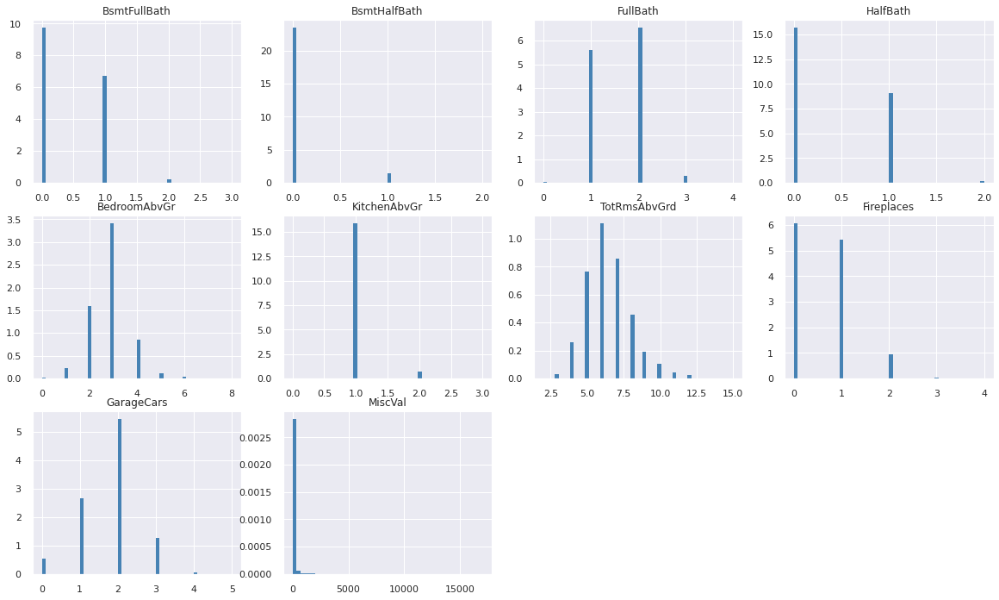

In [356]:
int_count = ["BsmtFullBath","BsmtHalfBath","FullBath","HalfBath",
          "BedroomAbvGr","KitchenAbvGr","TotRmsAbvGrd","Fireplaces",
          "GarageCars","MiscVal"]


X = df_cleaned2[int_count].values


fig = plt.figure(figsize=(20, 16))

for feat_idx in range(X.shape[1]):
    ax = fig.add_subplot(4,4, (feat_idx+1))
    h = ax.hist(X[:, feat_idx], bins=50, color='steelblue', density=True, edgecolor='none')
    ax.set_title(df_cleaned2[int_count].columns[feat_idx], fontsize=12)


#### int64 categoricals

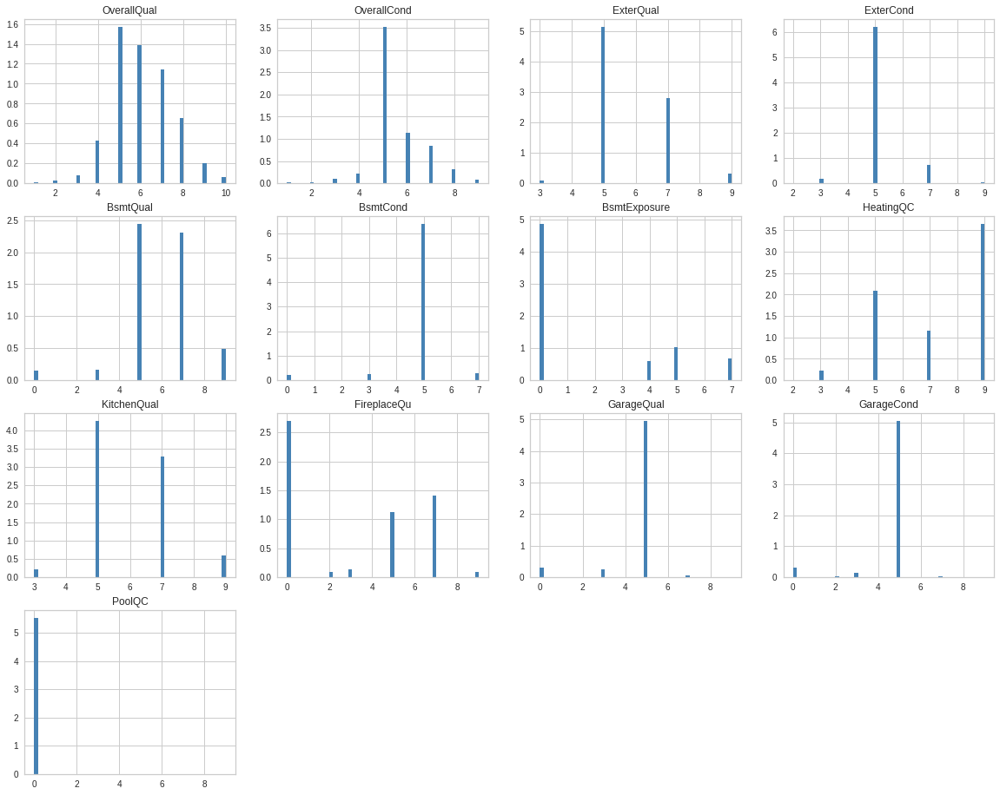

In [45]:
int_cat = ["OverallQual","OverallCond","ExterQual","ExterCond",
          "BsmtQual","BsmtCond","BsmtExposure","HeatingQC",
          "KitchenQual","FireplaceQu","GarageQual","GarageCond",
          "PoolQC"]


X = df_cleaned2[int_cat].values


fig = plt.figure(figsize=(20, 16))

for feat_idx in range(X.shape[1]):
    ax = fig.add_subplot(4,4, (feat_idx+1))
    h = ax.hist(X[:, feat_idx], bins=50, color='steelblue', density=True, edgecolor='none')
    ax.set_title(df_cleaned2[int_cat].columns[feat_idx], fontsize=12)


#### int64 times

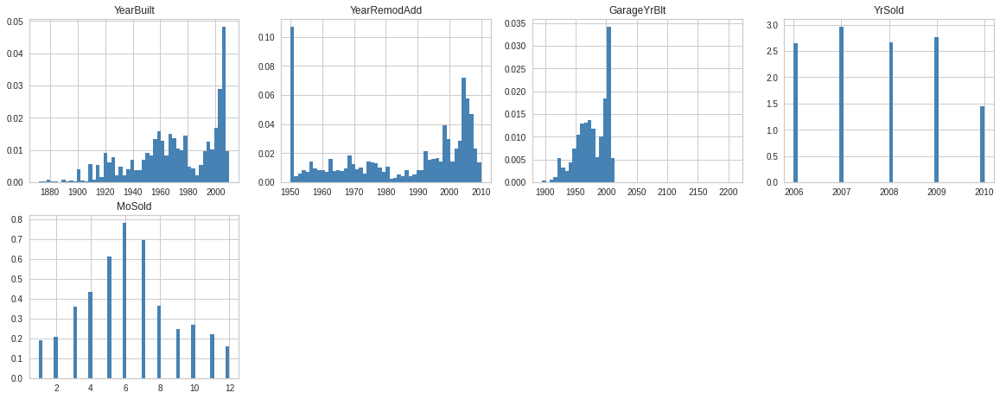

In [46]:
int_years = ["YearBuilt","YearRemodAdd","GarageYrBlt",
          "YrSold", "MoSold"]


X = df_cleaned2[int_years].values


fig = plt.figure(figsize=(20, 16))

for feat_idx in range(X.shape[1]):
    ax = fig.add_subplot(4,4, (feat_idx+1))
    h = ax.hist(X[:, feat_idx], bins=50, color='steelblue', density=True, edgecolor='none')
    ax.set_title(df_cleaned2[int_years].columns[feat_idx], fontsize=12)


#### float

In [357]:
df_float = df_cleaned2.select_dtypes(include=['float'])
#df_float = df_int64.iloc[:,1:]
df_float.head()

,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea
0,65.0,8450.0,196.0,706.0,0.0,150.0,856.0,856.0,854.0,0.0,1710.0,548.0,0.0,61.0,0.0,0.0,0.0,0.0
1,80.0,9600.0,0.0,978.0,0.0,284.0,1262.0,1262.0,0.0,0.0,1262.0,460.0,298.0,0.0,0.0,0.0,0.0,0.0
2,68.0,11250.0,162.0,486.0,0.0,434.0,920.0,920.0,866.0,0.0,1786.0,608.0,0.0,42.0,0.0,0.0,0.0,0.0
3,60.0,9550.0,0.0,216.0,0.0,540.0,756.0,961.0,756.0,0.0,1717.0,642.0,0.0,35.0,272.0,0.0,0.0,0.0
4,84.0,14260.0,350.0,655.0,0.0,490.0,1145.0,1145.0,1053.0,0.0,2198.0,836.0,192.0,84.0,0.0,0.0,0.0,0.0


In [358]:
df_float.describe()

,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea
count,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00,2919.00
mean,69.98,10168.11,102.62,441.27,49.57,560.74,1051.58,1159.58,336.48,4.69,1500.76,472.89,93.71,47.49,23.10,2.60,16.06,2.25
std,23.25,7887.00,179.12,455.61,169.18,439.47,440.82,392.36,428.70,46.40,506.05,215.36,126.53,67.58,64.24,25.19,56.18,35.66
min,21.00,1300.00,0.00,0.00,0.00,0.00,0.00,334.00,0.00,0.00,334.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,59.50,7478.00,0.00,0.00,0.00,220.00,793.00,876.00,0.00,0.00,1126.00,320.00,0.00,0.00,0.00,0.00,0.00,0.00
50%,70.00,9453.00,0.00,368.00,0.00,467.00,989.00,1082.00,0.00,0.00,1444.00,480.00,0.00,26.00,0.00,0.00,0.00,0.00
75%,80.00,11570.00,165.00,733.00,0.00,805.00,1302.00,1387.50,704.00,0.00,1743.50,576.00,168.00,70.00,0.00,0.00,0.00,0.00
max,313.00,215245.00,1600.00,5644.00,1526.00,2336.00,6110.00,5095.00,2065.00,1064.00,5642.00,1488.00,1424.00,742.00,1012.00,508.00,576.00,800.00


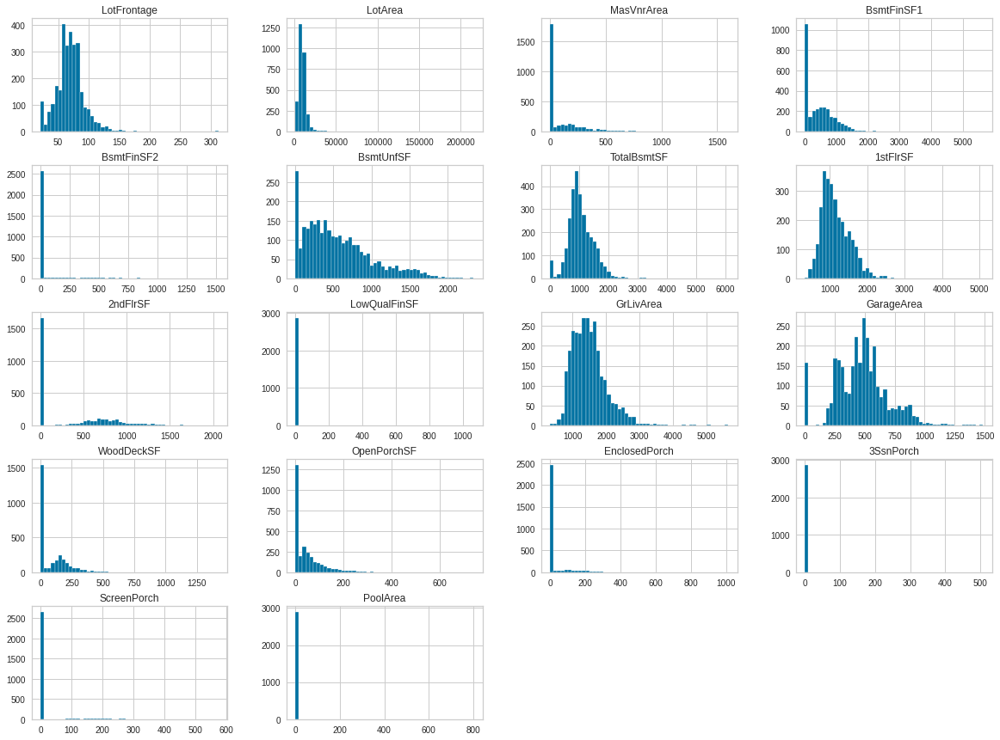

In [49]:
df_float.hist(bins=50, figsize=(20,15))
#save_fig("attribute_histogram_plots")
plt.show()


<AxesSubplot:xlabel='SalePrice', ylabel='Density'>

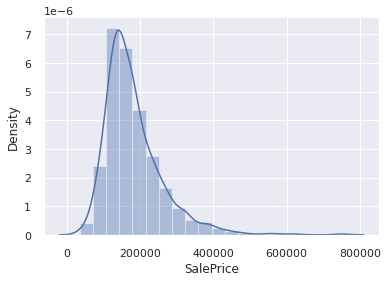

In [26]:
sns.set(rc={'figure.figsize':(6,4)})
#sns.distplot(y ,kde=False,bins = 20)
sns.distplot(y,bins = 20)

<AxesSubplot:xlabel='SalePrice'>

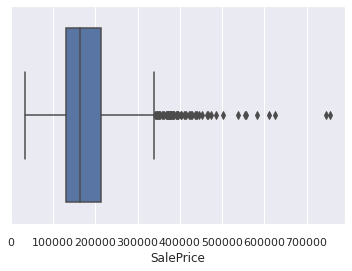

In [27]:
sns.boxplot(x=y)

In [28]:
y.describe()

count      1460.0
mean     180921.2
std       79442.5
min       34900.0
25%      129975.0
50%      163000.0
75%      214000.0
max      755000.0
Name: SalePrice, dtype: float64

**Mediane inférieur à la moyenne > queue de distribution à droite. Comme c'est la variable à prédire, aucune transformation ne se fera sur cette variable y.**

### <font color="#2cb7b0" id="section_1_1">Qual Variables</font>

In [80]:
df_object = df_cleaned2.select_dtypes(include=['object'])
print(df_object.shape)
df_object.describe(include='all')

(2919, 33)


,MSSubClass,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,Foundation,BsmtFinType1,BsmtFinType2,Heating,CentralAir,Electrical,Functional,GarageType,GarageFinish,PavedDrive,Fence,MiscFeature,SaleType,SaleCondition
count,2919,2919,2919,2919,2919,2919,2919,2919,2919,2919,2919,2919,2919,2919,2919,2919,2919,2919,2919,2919,2919,2919,2919,2919,2919,2919,2919,2919,2919,2919,2919,2919,2919
unique,16,5,2,3,4,4,2,5,3,25,9,8,5,8,6,8,15,16,4,6,7,7,6,2,5,7,7,4,3,5,5,9,6
top,20.0,RL,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,None,PConc,Unf,Unf,GasA,Y,SBrkr,Typ,Attchd,Unf,Y,None,None,WD,Normal
freq,1079,2269,2907,2721,1859,2622,2918,2133,2778,443,2511,2889,2425,1471,2310,2876,1026,1015,1766,1308,851,2493,2874,2723,2672,2719,1723,1230,2641,2348,2814,2526,2402


In [856]:
for column in df_object.columns: 
    
    print(column, df_object[column].unique())
    #print(column, len(df_object[column].unique()))

MSSubClass ['60.0' '20.0' '70.0' '50.0' '190.0' '45.0' '90.0' '120.0' '30.0' '85.0'
 '80.0' '160.0' '75.0' '180.0' '40.0' '150.0']
MSZoning ['RL' 'RM' 'C' 'FV' 'RH']
Street ['Pave' 'Grvl']
Alley ['None' 'Grvl' 'Pave']
LotShape ['Reg' 'IR1' 'IR2' 'IR3']
LandContour ['Lvl' 'Bnk' 'Low' 'HLS']
Utilities ['AllPub' 'NoSeWa']
LotConfig ['Inside' 'FR2' 'Corner' 'CulDSac' 'FR3']
LandSlope ['Gtl' 'Mod' 'Sev']
Neighborhood ['CollgCr' 'Veenker' 'Crawfor' 'NoRidge' 'Mitchel' 'Somerst' 'NWAmes'
 'OldTown' 'BrkSide' 'Sawyer' 'NridgHt' 'NAmes' 'SawyerW' 'IDOTRR'
 'MeadowV' 'Edwards' 'Timber' 'Gilbert' 'StoneBr' 'ClearCr' 'NPkVill'
 'Blmngtn' 'BrDale' 'SWISU' 'Blueste']
Condition1 ['Norm' 'Feedr' 'PosN' 'Artery' 'RRAe' 'RRNn' 'RRAn' 'PosA' 'RRNe']
Condition2 ['Norm' 'Artery' 'RRNn' 'Feedr' 'PosA' 'PosN' 'RRAn' 'RRAe']
BldgType ['1Fam' '2fmCon' 'Duplex' 'TwnhsE' 'Twnhs']
HouseStyle ['2Story' '1Story' '1.5Fin' '1.5Unf' 'SFoyer' 'SLvl' '2.5Unf' '2.5Fin']
RoofStyle ['Gable' 'Hip' 'Gambrel' 'Mansard' 'Flat'

Text(0.5, 1.0, 'SaleCondition')

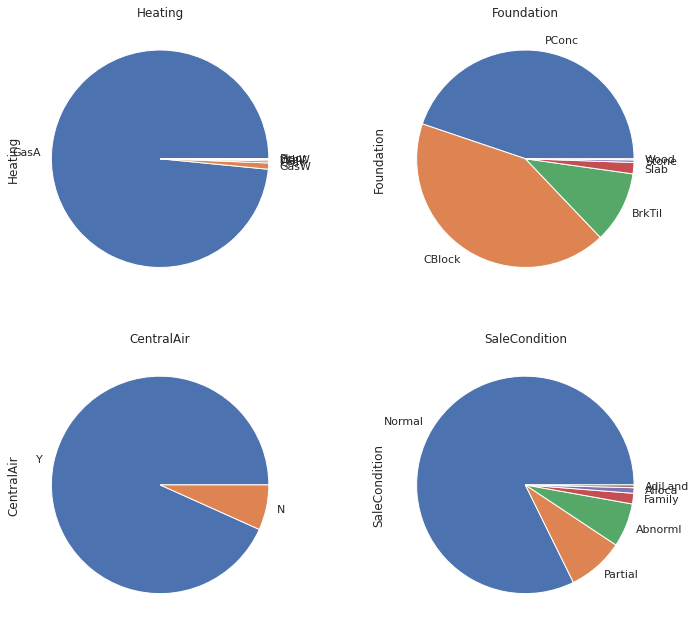

In [857]:
plt.rcParams['figure.figsize'] = (12,11) #(L,l)

fig, axes = plt.subplots(nrows=2, ncols=2)

ax0=df_cleaned2["Heating"].value_counts(normalize=False).plot(ax=axes[0,0],kind='pie')
ax1=df_cleaned2["Foundation"].value_counts(normalize=False).plot(ax=axes[0,1],kind='pie')
ax2=df_cleaned2["CentralAir"].value_counts(normalize=False).plot(ax=axes[1,0],kind='pie')
ax3=df_cleaned2["SaleCondition"].value_counts(normalize=False).plot(ax=axes[1,1],kind='pie')


ax0.set_title("Heating")
ax1.set_title("Foundation")
ax2.set_title("CentralAir")
ax3.set_title("SaleCondition")

Text(0.5, 1.0, 'Exterior2nd')

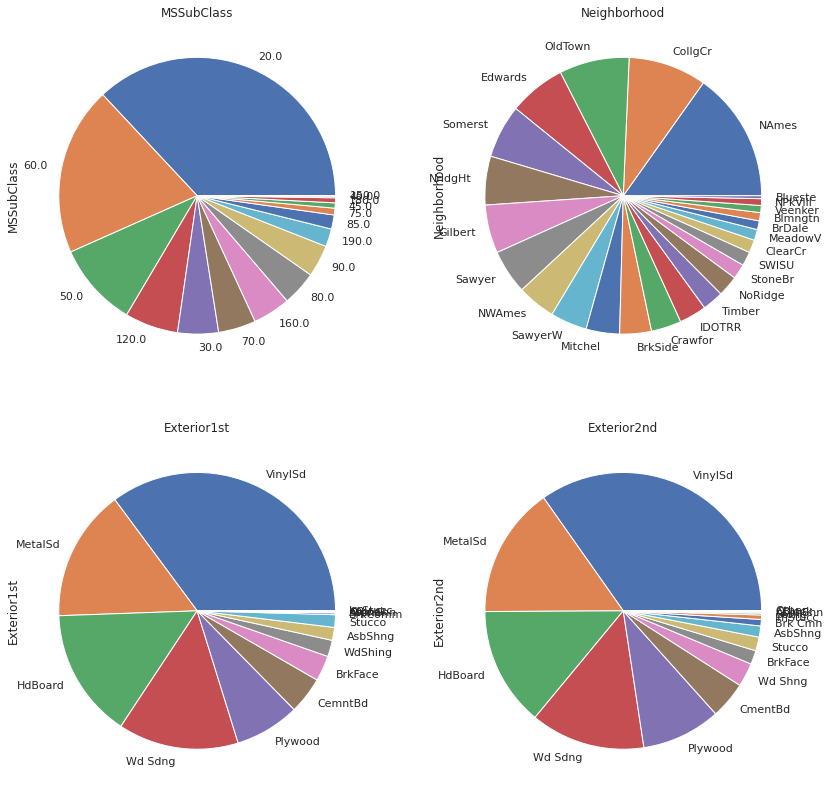

In [860]:
plt.rcParams['figure.figsize'] = (14,14) #(L,l)

fig, axes = plt.subplots(nrows=2, ncols=2)

ax0=df_cleaned2["MSSubClass"].value_counts(normalize=False).plot(ax=axes[0,0],kind='pie')
ax1=df_cleaned2["Neighborhood"].value_counts(normalize=False).plot(ax=axes[0,1],kind='pie')
ax2=df_cleaned2["Exterior1st"].value_counts(normalize=False).plot(ax=axes[1,0],kind='pie')
ax3=df_cleaned2["Exterior2nd"].value_counts(normalize=False).plot(ax=axes[1,1],kind='pie')


ax0.set_title("MSSubClass")
ax1.set_title("Neighborhood")
ax2.set_title("Exterior1st")
ax3.set_title("Exterior2nd")

## <font color="#337da4">Bi-variate Analysis</font>

### <font color="#2cb7b0" id="section_1_1">Quant - Quant Analysis</font>

####  df_num1

In [29]:
df_num1 = df_cleaned2.select_dtypes(include=[np.number]) 
print(df_num1.shape)
df_num1.head()

(2919, 47)


,Id,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,HeatingQC,KitchenQual,FireplaceQu,GarageQual,GarageCond,PoolQC
0,1,65.0,8450.0,7,5,2003,2003,196.0,706.0,0.0,150.0,856.0,856.0,854.0,0.0,1710.0,1,0,2,1,3,1,8,0,2003,2,548.0,0.0,61.0,0.0,0.0,0.0,0.0,0,2,2008,7,5,7,5,0,9,7,0,5,5,0
1,2,80.0,9600.0,6,8,1976,1976,0.0,978.0,0.0,284.0,1262.0,1262.0,0.0,0.0,1262.0,0,1,2,0,3,1,6,1,1976,2,460.0,298.0,0.0,0.0,0.0,0.0,0.0,0,5,2007,5,5,7,5,7,9,5,5,5,5,0
2,3,68.0,11250.0,7,5,2001,2002,162.0,486.0,0.0,434.0,920.0,920.0,866.0,0.0,1786.0,1,0,2,1,3,1,6,1,2001,2,608.0,0.0,42.0,0.0,0.0,0.0,0.0,0,9,2008,7,5,7,5,4,9,7,5,5,5,0
3,4,60.0,9550.0,7,5,1915,1970,0.0,216.0,0.0,540.0,756.0,961.0,756.0,0.0,1717.0,1,0,1,0,3,1,7,1,1998,3,642.0,0.0,35.0,272.0,0.0,0.0,0.0,0,2,2006,5,5,5,7,0,7,7,7,5,5,0
4,5,84.0,14260.0,8,5,2000,2000,350.0,655.0,0.0,490.0,1145.0,1145.0,1053.0,0.0,2198.0,1,0,2,1,4,1,9,1,2000,3,836.0,192.0,84.0,0.0,0.0,0.0,0.0,0,12,2008,7,5,7,5,5,9,7,5,5,5,0


#### df_num2

In [30]:
df_num2 = pd.concat([df_num1,y], axis=1)
df_num2.shape

(2919, 48)

In [31]:
df_num2.head()

,Id,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,HeatingQC,KitchenQual,FireplaceQu,GarageQual,GarageCond,PoolQC,SalePrice
0,1,65.0,8450.0,7,5,2003,2003,196.0,706.0,0.0,150.0,856.0,856.0,854.0,0.0,1710.0,1,0,2,1,3,1,8,0,2003,2,548.0,0.0,61.0,0.0,0.0,0.0,0.0,0,2,2008,7,5,7,5,0,9,7,0,5,5,0,208500.0
1,2,80.0,9600.0,6,8,1976,1976,0.0,978.0,0.0,284.0,1262.0,1262.0,0.0,0.0,1262.0,0,1,2,0,3,1,6,1,1976,2,460.0,298.0,0.0,0.0,0.0,0.0,0.0,0,5,2007,5,5,7,5,7,9,5,5,5,5,0,181500.0
2,3,68.0,11250.0,7,5,2001,2002,162.0,486.0,0.0,434.0,920.0,920.0,866.0,0.0,1786.0,1,0,2,1,3,1,6,1,2001,2,608.0,0.0,42.0,0.0,0.0,0.0,0.0,0,9,2008,7,5,7,5,4,9,7,5,5,5,0,223500.0
3,4,60.0,9550.0,7,5,1915,1970,0.0,216.0,0.0,540.0,756.0,961.0,756.0,0.0,1717.0,1,0,1,0,3,1,7,1,1998,3,642.0,0.0,35.0,272.0,0.0,0.0,0.0,0,2,2006,5,5,5,7,0,7,7,7,5,5,0,140000.0
4,5,84.0,14260.0,8,5,2000,2000,350.0,655.0,0.0,490.0,1145.0,1145.0,1053.0,0.0,2198.0,1,0,2,1,4,1,9,1,2000,3,836.0,192.0,84.0,0.0,0.0,0.0,0.0,0,12,2008,7,5,7,5,5,9,7,5,5,5,0,250000.0


#### Correlation to SalePrice

In [32]:
#== ON ALL DATASET  =====
corr = df_num2.corr()
corr.head()

,Id,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,HeatingQC,KitchenQual,FireplaceQu,GarageQual,GarageCond,PoolQC,SalePrice
Id,1.00e+00,-0.02,-0.04,-0.03,-2.84e-03,-0.02,-0.05,-0.02,-0.02,0.02,-0.01,-0.03,-8.68e-03,-2.23e-02,-3.78e-02,-0.03,-3.18e-04,1.02e-02,-9.95e-03,-0.02,3.07e-03,-0.01,-0.03,-0.04,-2.01e-02,-0.01,-8.79e-03,-7.06e-03,9.96e-03,0.02,-0.05,0.02,0.01,8.24e-03,6.45e-03,-0.26,-0.01,7.77e-03,-0.03,-3.10e-02,0.02,-4.61e-03,-0.01,-0.04,-0.02,-6.75e-03,3.79e-03,-0.02
LotFrontage,-2.26e-02,1.00,0.44,0.19,-4.99e-02,0.10,0.07,0.20,0.21,0.06,0.10,0.33,4.30e-01,4.06e-02,7.80e-03,0.37,9.70e-02,6.41e-03,1.75e-01,0.05,2.43e-01,0.01,0.33,0.26,6.73e-02,0.29,3.43e-01,1.26e-01,1.50e-01,0.02,0.03,0.07,0.14,3.95e-02,2.05e-02,-0.01,0.12,4.90e-03,0.10,6.03e-03,0.16,5.75e-02,0.15,0.24,0.12,1.11e-01,1.39e-01,0.34
LotArea,-4.07e-02,0.44,1.00,0.10,-3.56e-02,0.02,0.02,0.13,0.19,0.08,0.02,0.25,3.32e-01,3.15e-02,5.54e-04,0.28,1.27e-01,2.58e-02,1.26e-01,0.03,1.33e-01,-0.02,0.21,0.26,3.25e-03,0.18,2.13e-01,1.58e-01,1.05e-01,0.02,0.02,0.05,0.09,6.90e-02,4.16e-03,-0.02,0.06,3.56e-03,0.06,6.74e-03,0.19,1.16e-02,0.08,0.19,0.09,7.52e-02,7.80e-02,0.26
OverallQual,-2.98e-02,0.19,0.10,1.00,-9.38e-02,0.60,0.57,0.43,0.28,-0.04,0.28,0.55,4.79e-01,2.46e-01,-4.84e-02,0.58,1.65e-01,-4.05e-02,5.28e-01,0.27,7.31e-02,-0.16,0.39,0.39,5.63e-01,0.60,5.65e-01,2.55e-01,2.98e-01,-0.14,0.02,0.04,0.03,5.56e-03,3.04e-02,-0.02,0.73,3.35e-03,0.66,2.74e-01,0.32,4.74e-01,0.68,0.49,0.31,2.92e-01,7.92e-02,0.79
OverallCond,-2.84e-03,-0.05,-0.04,-0.09,1.00e+00,-0.37,0.05,-0.14,-0.05,0.04,-0.14,-0.17,-1.57e-01,5.49e-03,9.05e-03,-0.12,-4.28e-02,8.39e-02,-2.16e-01,-0.09,-8.48e-03,-0.09,-0.09,-0.03,-2.91e-01,-0.18,-1.54e-01,2.01e-02,-6.90e-02,0.07,0.04,0.04,-0.02,3.40e-02,-6.26e-03,0.03,-0.15,4.04e-01,-0.20,9.58e-02,-0.08,-9.80e-03,-0.05,-0.07,0.02,4.83e-02,-2.26e-02,-0.08


In [33]:
# OverallQual converted string to int64 gives these better results
print(corr["SalePrice"].sort_values(ascending = False),'\n')

SalePrice        1.00
OverallQual      0.79
GrLivArea        0.71
ExterQual        0.68
KitchenQual      0.66
GarageCars       0.64
GarageArea       0.62
TotalBsmtSF      0.61
1stFlrSF         0.61
BsmtQual         0.60
FullBath         0.56
TotRmsAbvGrd     0.53
YearBuilt        0.52
FireplaceQu      0.52
YearRemodAdd     0.51
GarageYrBlt      0.50
MasVnrArea       0.48
Fireplaces       0.47
HeatingQC        0.43
BsmtFinSF1       0.39
BsmtExposure     0.36
LotFrontage      0.34
WoodDeckSF       0.32
2ndFlrSF         0.32
OpenPorchSF      0.32
HalfBath         0.28
GarageQual       0.28
GarageCond       0.26
LotArea          0.26
BsmtFullBath     0.23
BsmtCond         0.22
BsmtUnfSF        0.21
BedroomAbvGr     0.17
PoolQC           0.11
ScreenPorch      0.11
PoolArea         0.09
MoSold           0.05
3SsnPorch        0.04
ExterCond        0.02
BsmtFinSF2      -0.01
BsmtHalfBath    -0.02
MiscVal         -0.02
Id              -0.02
LowQualFinSF    -0.03
YrSold          -0.03
OverallCon

In [34]:
# 10 first most correlated variables to SalePrice on All dataset

k = 10 
#== ON ALL DATASET  =====
cols = corr.nlargest(k, 'SalePrice')['SalePrice'].index
print(cols)

Index(['SalePrice', 'OverallQual', 'GrLivArea', 'ExterQual', 'KitchenQual',
       'GarageCars', 'GarageArea', 'TotalBsmtSF', '1stFlrSF', 'BsmtQual'],
      dtype='object')


**Le prix est influencé par la surface et les critères de qualité.**

#### Bi variate Correlations 

<AxesSubplot:title={'center':'Correlation of Numeric Features with Sale Price'}>

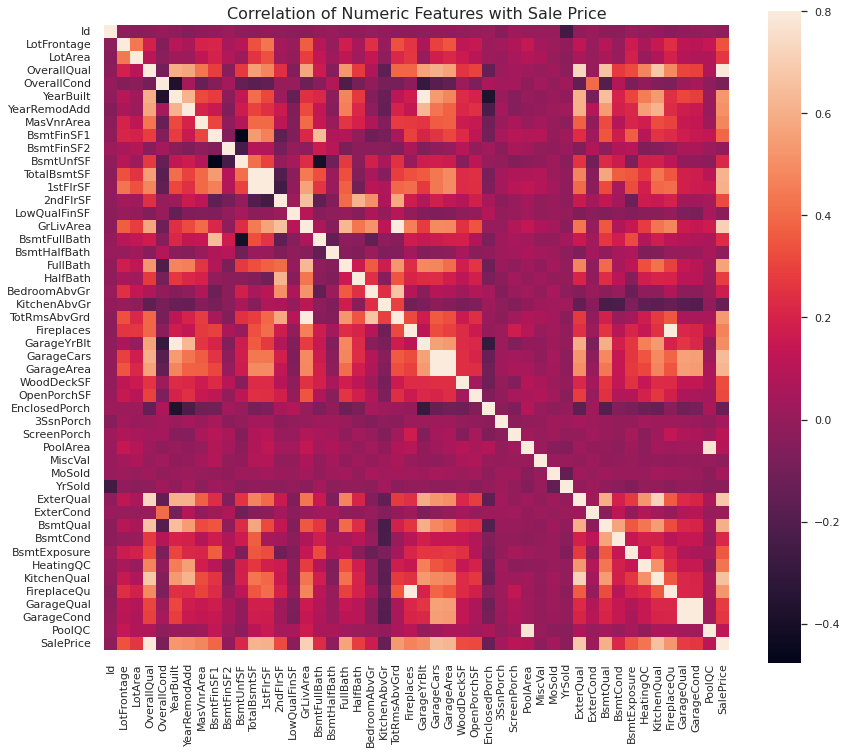

In [35]:
f , ax = plt.subplots(figsize = (14,12))

#== ON ALL DATASET  =====
plt.title ("Correlation of Numeric Features with Sale Price", y=1, size=16)
sns.heatmap(corr,square=True, vmax=0.8)

In [36]:
#== ON ALL DATASET  =====

threshold = 0.8

corr_pairs = corr.unstack().sort_values(kind="quicksort")

strong_corr = (pd.DataFrame(corr_pairs[(abs(corr_pairs) > threshold)])
               .reset_index().rename(columns={0:'corr_coeff'}))

strong_corr = strong_corr[(strong_corr.index%2 == 0) & (strong_corr['level_0'] != strong_corr['level_1'])]
strong_corr.sort_values('corr_coeff', ascending=False)

,level_0,level_1,corr_coeff
10,GarageQual,GarageCond,0.93
8,GarageCars,GarageArea,0.89
6,Fireplaces,FireplaceQu,0.85
4,GarageYrBlt,YearBuilt,0.81
2,TotRmsAbvGrd,GrLivArea,0.81
0,1stFlrSF,TotalBsmtSF,0.80


**Cela va servir pour supprimer les variables par la suite dans la partie Features Elimination.**

In [41]:
# Split == ON TRAIN ONLY =====
df_num2s = np.split(df_num2, [1460], axis=0)
df_num2s[0]

,Id,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,HeatingQC,KitchenQual,FireplaceQu,GarageQual,GarageCond,PoolQC,SalePrice
0,1,65.0,8450.0,7,5,2003,2003,196.0,706.0,0.0,150.0,856.0,856.0,854.0,0.0,1710.0,1,0,2,1,3,1,8,0,2003,2,548.0,0.0,61.0,0.0,0.0,0.0,0.0,0,2,2008,7,5,7,5,0,9,7,0,5,5,0,208500.0
1,2,80.0,9600.0,6,8,1976,1976,0.0,978.0,0.0,284.0,1262.0,1262.0,0.0,0.0,1262.0,0,1,2,0,3,1,6,1,1976,2,460.0,298.0,0.0,0.0,0.0,0.0,0.0,0,5,2007,5,5,7,5,7,9,5,5,5,5,0,181500.0
2,3,68.0,11250.0,7,5,2001,2002,162.0,486.0,0.0,434.0,920.0,920.0,866.0,0.0,1786.0,1,0,2,1,3,1,6,1,2001,2,608.0,0.0,42.0,0.0,0.0,0.0,0.0,0,9,2008,7,5,7,5,4,9,7,5,5,5,0,223500.0
3,4,60.0,9550.0,7,5,1915,1970,0.0,216.0,0.0,540.0,756.0,961.0,756.0,0.0,1717.0,1,0,1,0,3,1,7,1,1998,3,642.0,0.0,35.0,272.0,0.0,0.0,0.0,0,2,2006,5,5,5,7,0,7,7,7,5,5,0,140000.0
4,5,84.0,14260.0,8,5,2000,2000,350.0,655.0,0.0,490.0,1145.0,1145.0,1053.0,0.0,2198.0,1,0,2,1,4,1,9,1,2000,3,836.0,192.0,84.0,0.0,0.0,0.0,0.0,0,12,2008,7,5,7,5,5,9,7,5,5,5,0,250000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,62.0,7917.0,6,5,1999,2000,0.0,0.0,0.0,953.0,953.0,953.0,694.0,0.0,1647.0,0,0,2,1,3,1,7,1,1999,2,460.0,0.0,40.0,0.0,0.0,0.0,0.0,0,8,2007,5,5,7,5,0,9,5,5,5,5,0,175000.0
1456,1457,85.0,13175.0,6,6,1978,1988,119.0,790.0,163.0,589.0,1542.0,2073.0,0.0,0.0,2073.0,1,0,2,0,3,1,7,2,1978,2,500.0,349.0,0.0,0.0,0.0,0.0,0.0,0,2,2010,5,5,7,5,0,5,5,5,5,5,0,210000.0
1457,1458,66.0,9042.0,7,9,1941,2006,0.0,275.0,0.0,877.0,1152.0,1188.0,1152.0,0.0,2340.0,0,0,2,0,4,1,9,2,1941,1,252.0,0.0,60.0,0.0,0.0,0.0,0.0,2500,5,2010,9,7,5,7,0,9,7,7,5,5,0,266500.0
1458,1459,68.0,9717.0,5,6,1950,1996,0.0,49.0,1029.0,0.0,1078.0,1078.0,0.0,0.0,1078.0,1,0,1,0,2,1,5,0,1950,1,240.0,366.0,0.0,112.0,0.0,0.0,0.0,0,4,2010,5,5,5,5,4,7,7,0,5,5,0,142125.0


Index(['SalePrice', 'OverallQual', 'GrLivArea', 'ExterQual', 'KitchenQual',
       'GarageCars', 'GarageArea', 'TotalBsmtSF', '1stFlrSF', 'BsmtQual'],
      dtype='object')


<AxesSubplot:>

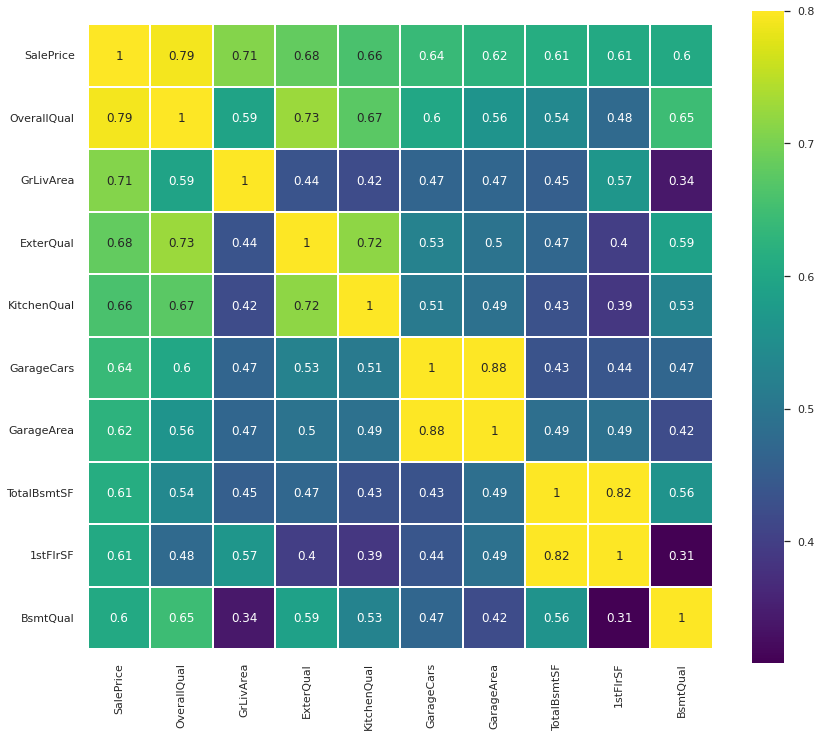

In [38]:
f , ax = plt.subplots(figsize = (14,12))

k = 10 
cols = corr.nlargest(k, 'SalePrice')['SalePrice'].index
print(cols)

cm = np.corrcoef(df_num2s[0][cols].values.T)
sns.heatmap(cm, vmax = 0.8, linewidths = 0.01, square =True, annot = True, cmap ='viridis',
           linecolor = 'white', xticklabels = cols.values, annot_kws = {'size':12}, yticklabels = cols.values)

<AxesSubplot:xlabel='TotalBsmtSF', ylabel='SalePrice'>

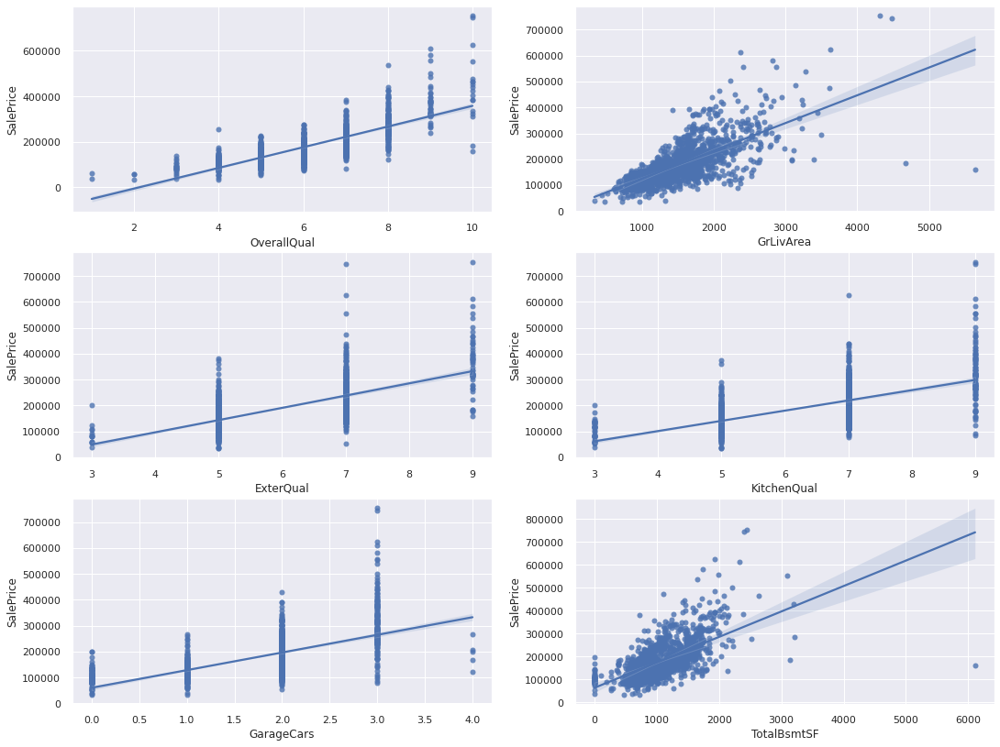

In [44]:
fig, ((ax1,ax2),(ax3,ax4),(ax5,ax6)) = plt.subplots(nrows = 3, ncols = 2, figsize=(18,14))

# The most correlated variables to SalePrice

sns.regplot(x='OverallQual', y='SalePrice', data = df_num2s[0],scatter=True,fit_reg=True, ax= ax1)
sns.regplot(x='GrLivArea', y='SalePrice', data = df_num2s[0],scatter=True,fit_reg=True, ax= ax2)
sns.regplot(x='ExterQual', y='SalePrice', data = df_num2s[0],scatter=True,fit_reg=True, ax= ax3)
sns.regplot(x='KitchenQual', y='SalePrice', data = df_num2s[0],scatter=True,fit_reg=True, ax= ax4)
sns.regplot(x='GarageCars', y='SalePrice', data = df_num2s[0],scatter=True,fit_reg=True, ax= ax5)
sns.regplot(x='TotalBsmtSF', y='SalePrice', data = df_num2s[0],scatter=True,fit_reg=True, ax= ax6)

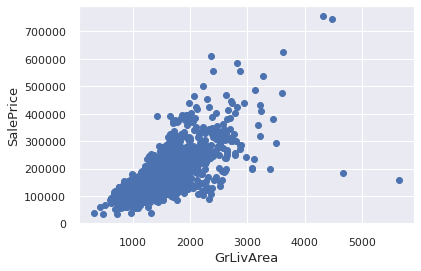

In [46]:
fig, ax = plt.subplots()

# deux outliers pour GrLivArea
ax.scatter(x = df_num2s[0]['GrLivArea'], y = df_num2s[0]['SalePrice'])
plt.ylabel('SalePrice', fontsize=13)
plt.xlabel('GrLivArea', fontsize=13)
plt.show()

**Deux outliers pour `GrLivArea` car la surface est très élevée mais le prix bas.**

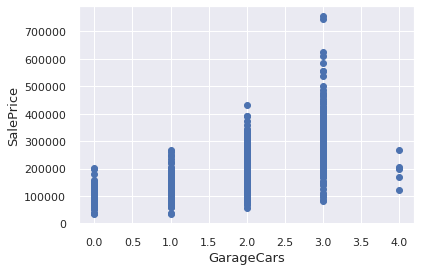

In [47]:
fig, ax = plt.subplots()

ax.scatter(x = df_num2s[0]['GarageCars'], y = df_num2s[0]['SalePrice'])
plt.ylabel('SalePrice', fontsize=13)
plt.xlabel('GarageCars', fontsize=13)
plt.show()

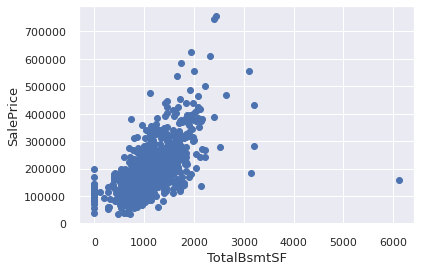

In [48]:
fig, ax = plt.subplots()

ax.scatter(x = df_num2s[0]['TotalBsmtSF'], y = df_num2s[0]['SalePrice'])
plt.ylabel('SalePrice', fontsize=13)
plt.xlabel('TotalBsmtSF', fontsize=13)
plt.show()

**On peut voir des outliers pour les variables `TotalBsmtSF` et `GarageCars`.**

### <font color="#2cb7b0" id="section_1_1">Box - Plot Analysis</font>

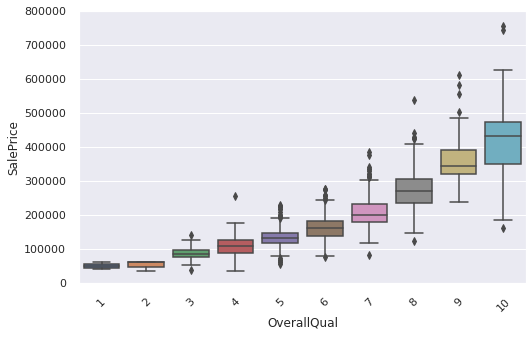

In [49]:
f , ax =plt.subplots(figsize=(8,5))

fig = sns.boxplot(x = 'OverallQual',y= 'SalePrice', data=df_num2s[0])
fig.axis(ymin=0, ymax = 800000)
xt = plt.xticks(rotation=45)

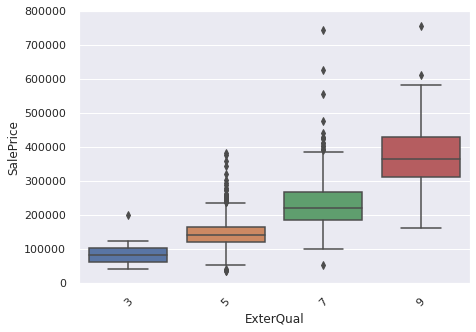

In [382]:
fig = sns.boxplot(x = 'ExterQual',y= 'SalePrice', data=df_num2[0])
fig.axis(ymin=0, ymax = 800000)
xt = plt.xticks(rotation=45)

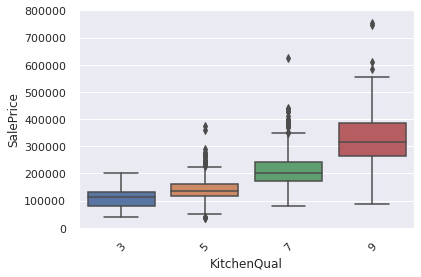

In [50]:
fig = sns.boxplot(x = 'KitchenQual',y= 'SalePrice', data=df_num2s[0])
fig.axis(ymin=0, ymax = 800000)
xt = plt.xticks(rotation=45)

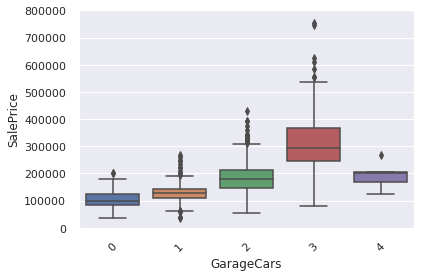

In [51]:
fig = sns.boxplot(x = 'GarageCars',y= 'SalePrice', data=df_num2s[0])
fig.axis(ymin=0, ymax = 800000)
xt = plt.xticks(rotation=45)

**Donc pour la variable GarageCars le prix diminue lorsque le nombre de voitures est de 4. Y a t il des outliers ?**

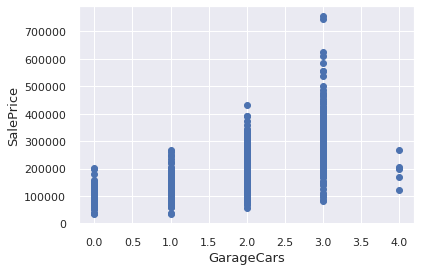

In [53]:
fig, ax = plt.subplots()

ax.scatter(x = df_num2s[0]['GarageCars'], y = df_num2s[0]['SalePrice'])
plt.ylabel('SalePrice', fontsize=13)
plt.xlabel('GarageCars', fontsize=13)
plt.show()

**Il y effectivement 5 outliers qu'on supprimera par la suite.**

# <font color="#1d479b">Outliers</font>

**On ne supprime des lignes que sur le train.**

## <font color="#337da4">On Correlated to SalePrice Columns</font>

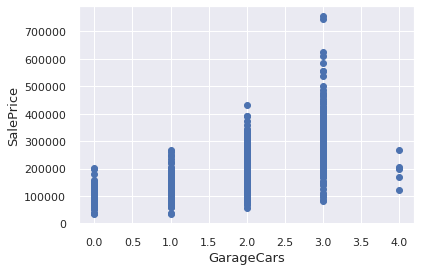

In [54]:
fig, ax = plt.subplots()

ax.scatter(x = df_num2s[0]['GarageCars'], y = df_num2s[0]['SalePrice'])
plt.ylabel('SalePrice', fontsize=13)
plt.xlabel('GarageCars', fontsize=13)
plt.show()

In [55]:
#---------Drop Outliers in the Train set -----------------#

print(df_num2s[0].shape)
df_num2s[0] = df_num2s[0].loc[df_num2s[0]['GarageCars']!=df_num2s[0]['GarageCars'].max()]
print(df_num2s[0].shape)

(1460, 48)
(1455, 48)


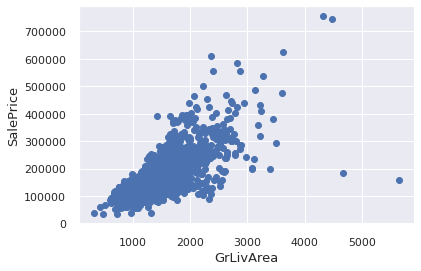

In [56]:
fig, ax = plt.subplots()

ax.scatter(x = df_num2s[0]['GrLivArea'], y = df_num2s[0]['SalePrice'])
plt.ylabel('SalePrice', fontsize=13)
plt.xlabel('GrLivArea', fontsize=13)
plt.show()

In [57]:
#---------Drop Outliers in the Train set -----------------#
for i in range(2):
    print(df_num2s[0].shape)
    df_num2s[0] = df_num2s[0].loc[df_num2s[0]['GrLivArea']!=df_num2s[0]['GrLivArea'].max()]
    print(df_num2s[0].shape)

(1455, 48)
(1454, 48)
(1454, 48)
(1453, 48)


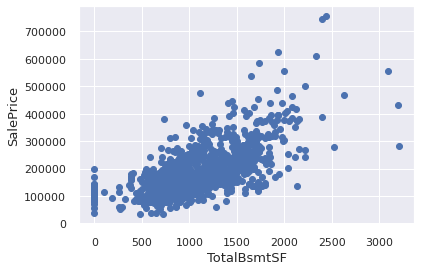

In [58]:
fig, ax = plt.subplots()

ax.scatter(x = df_num2s[0]['TotalBsmtSF'], y = df_num2s[0]['SalePrice'])
plt.ylabel('SalePrice', fontsize=13)
plt.xlabel('TotalBsmtSF', fontsize=13)
plt.show()

In [59]:
#---------Drop Outliers in the Train set -----------------#
for i in range(3):
    print(df_num2s[0].shape)
    df_num2s[0] = df_num2s[0].loc[df_num2s[0]['TotalBsmtSF']!=df_num2s[0]['TotalBsmtSF'].max()]
    print(df_num2s[0].shape)

(1453, 48)
(1452, 48)
(1452, 48)
(1451, 48)
(1451, 48)
(1450, 48)


**Après suppression des outliers:**

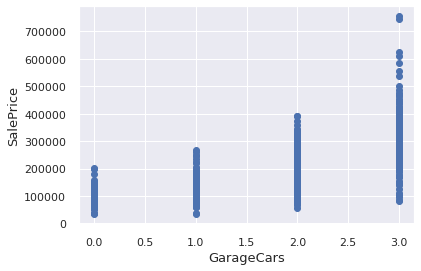

In [60]:
fig, ax = plt.subplots()

ax.scatter(x = df_num2s[0]['GarageCars'], y = df_num2s[0]['SalePrice'])
plt.ylabel('SalePrice', fontsize=13)
plt.xlabel('GarageCars', fontsize=13)
plt.show()

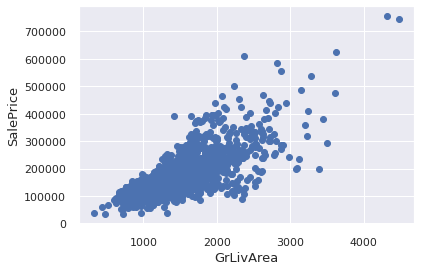

In [61]:
fig, ax = plt.subplots()

ax.scatter(x = df_num2s[0]['GrLivArea'], y = df_num2s[0]['SalePrice'])
plt.ylabel('SalePrice', fontsize=13)
plt.xlabel('GrLivArea', fontsize=13)
plt.show()

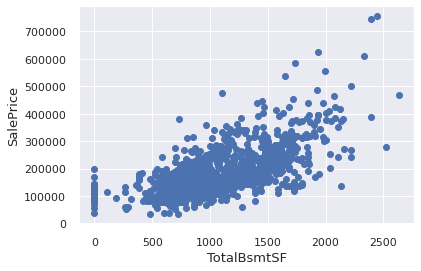

In [62]:
fig, ax = plt.subplots()

ax.scatter(x = df_num2s[0]['TotalBsmtSF'], y = df_num2s[0]['SalePrice'])
plt.ylabel('SalePrice', fontsize=13)
plt.xlabel('TotalBsmtSF', fontsize=13)
plt.show()

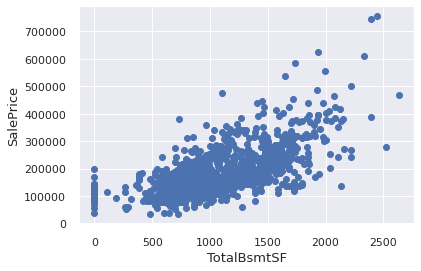

In [63]:
fig, ax = plt.subplots()

ax.scatter(x = df_num2s[0]['TotalBsmtSF'], y = df_num2s[0]['SalePrice'])
plt.ylabel('SalePrice', fontsize=13)
plt.xlabel('TotalBsmtSF', fontsize=13)
plt.show()

**Donc 8 lignes du train sont supprimées. Regardons les autres variables:**

## <font color="#337da4">On all Numerical Columns</font>

In [64]:
#df_num2[0] = df_num2[0].drop(["Id"],axis=1)
df_num2s[0] = df_num2s[0].set_index("Id")
df_num2s[0] = df_num2s[0].drop(["SalePrice"],axis=1)
print(df_num2s[0].shape)
df_num2s[0].head()

(1450, 46)


,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,HeatingQC,KitchenQual,FireplaceQu,GarageQual,GarageCond,PoolQC
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,65.0,8450.0,7,5,2003,2003,196.0,706.0,0.0,150.0,856.0,856.0,854.0,0.0,1710.0,1,0,2,1,3,1,8,0,2003,2,548.0,0.0,61.0,0.0,0.0,0.0,0.0,0,2,2008,7,5,7,5,0,9,7,0,5,5,0
2,80.0,9600.0,6,8,1976,1976,0.0,978.0,0.0,284.0,1262.0,1262.0,0.0,0.0,1262.0,0,1,2,0,3,1,6,1,1976,2,460.0,298.0,0.0,0.0,0.0,0.0,0.0,0,5,2007,5,5,7,5,7,9,5,5,5,5,0
3,68.0,11250.0,7,5,2001,2002,162.0,486.0,0.0,434.0,920.0,920.0,866.0,0.0,1786.0,1,0,2,1,3,1,6,1,2001,2,608.0,0.0,42.0,0.0,0.0,0.0,0.0,0,9,2008,7,5,7,5,4,9,7,5,5,5,0
4,60.0,9550.0,7,5,1915,1970,0.0,216.0,0.0,540.0,756.0,961.0,756.0,0.0,1717.0,1,0,1,0,3,1,7,1,1998,3,642.0,0.0,35.0,272.0,0.0,0.0,0.0,0,2,2006,5,5,5,7,0,7,7,7,5,5,0
5,84.0,14260.0,8,5,2000,2000,350.0,655.0,0.0,490.0,1145.0,1145.0,1053.0,0.0,2198.0,1,0,2,1,4,1,9,1,2000,3,836.0,192.0,84.0,0.0,0.0,0.0,0.0,0,12,2008,7,5,7,5,5,9,7,5,5,5,0


<function matplotlib.pyplot.show(close=None, block=None)>

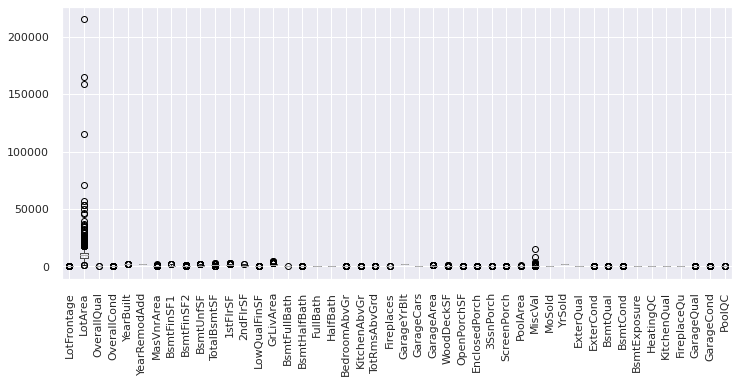

In [65]:
plt.rcParams['figure.figsize'] = (12,5)


#---------Plot Outliers on Train Set------------#
boxplot = df_num2s[0].boxplot()
plt.xticks(rotation=90)
plt.show

In [68]:
columns = df_num2s[0].columns

#---------Normalize-------------#
std_scale = preprocessing.StandardScaler()
std_scale.fit(df_num2s[0])
df_num2_sc = pd.DataFrame(std_scale.fit_transform(df_num2s[0]), index =df_num2s[0].index, columns=columns)
print(df_num2_sc.shape)
df_num2_sc

(1450, 46)


,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,HeatingQC,KitchenQual,FireplaceQu,GarageQual,GarageCond,PoolQC
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,-0.23,-0.20,0.66,-0.52,1.06,0.88,0.52,0.63,-0.29,-0.94,-0.47,-0.82,1.17,-0.12,0.40,1.12,-0.24,0.80,1.23,0.17,-0.21,0.93,-0.95,1.03,0.33,0.37,-0.75,0.22,-0.36,-0.12,-0.27,-0.06,-0.09,-1.60,0.14,1.07,-0.24,0.61,0.11,-0.66,0.89,0.74,-1.00,0.26,0.27,-0.06
2,0.40,-0.09,-0.07,2.17,0.16,-0.43,-0.57,1.26,-0.29,-0.64,0.53,0.29,-0.80,-0.12,-0.49,-0.82,3.96,0.80,-0.76,0.17,-0.21,-0.31,0.61,-0.06,0.33,-0.05,1.63,-0.71,-0.36,-0.12,-0.27,-0.06,-0.09,-0.49,-0.61,-0.69,-0.24,0.61,0.11,2.07,0.89,-0.77,0.60,0.26,0.27,-0.06
3,-0.10,0.08,0.66,-0.52,0.99,0.83,0.33,0.12,-0.29,-0.30,-0.32,-0.64,1.20,-0.12,0.55,1.12,-0.24,0.80,1.23,0.17,-0.21,-0.31,0.61,0.95,0.33,0.66,-0.75,-0.07,-0.36,-0.12,-0.27,-0.06,-0.09,0.99,0.14,1.07,-0.24,0.61,0.11,0.90,0.89,0.74,0.60,0.26,0.27,-0.06
4,-0.44,-0.09,0.66,-0.52,-1.87,-0.72,-0.57,-0.51,-0.29,-0.06,-0.72,-0.53,0.94,-0.12,0.42,1.12,-0.24,-1.03,-0.76,0.17,-0.21,0.31,0.61,0.83,1.69,0.82,-0.75,-0.17,4.16,-0.12,-0.27,-0.06,-0.09,-1.60,-1.36,-0.69,-0.24,-0.60,2.17,-0.66,-0.15,0.74,1.23,0.26,0.27,-0.06
5,0.57,0.39,1.39,-0.52,0.96,0.74,1.38,0.51,-0.29,-0.17,0.24,-0.03,1.63,-0.12,1.37,1.12,-0.24,0.80,1.23,1.40,-0.21,1.56,0.61,0.91,1.69,1.74,0.78,0.57,-0.36,-0.12,-0.27,-0.06,-0.09,2.10,0.14,1.07,-0.24,0.61,0.11,1.29,0.89,0.74,0.60,0.26,0.27,-0.06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1456,-0.36,-0.26,-0.07,-0.52,0.92,0.74,-0.57,-1.01,-0.29,0.88,-0.23,-0.55,0.80,-0.12,0.28,-0.82,-0.24,0.80,1.23,0.17,-0.21,0.31,0.61,0.87,0.33,-0.05,-0.75,-0.10,-0.36,-0.12,-0.27,-0.06,-0.09,0.62,-0.61,-0.69,-0.24,0.61,0.11,-0.66,0.89,-0.77,0.60,0.26,0.27,-0.06
1457,0.62,0.28,-0.07,0.38,0.23,0.15,0.09,0.82,0.73,0.05,1.22,2.50,-0.80,-0.12,1.12,1.12,-0.24,0.80,-0.76,0.17,-0.21,0.31,2.17,0.02,0.33,0.14,2.04,-0.71,-0.36,-0.12,-0.27,-0.06,-0.09,-1.60,1.64,-0.69,-0.24,0.61,0.11,-0.66,-1.19,-0.77,0.60,0.26,0.27,-0.06
1458,-0.19,-0.14,0.66,3.07,-1.00,1.03,-0.57,-0.37,-0.29,0.71,0.26,0.09,1.86,-0.12,1.65,-0.82,-0.24,0.80,-0.76,1.40,-0.21,1.56,2.17,-1.47,-1.03,-1.04,-0.75,0.21,-0.36,-0.12,-0.27,-0.06,4.94,-0.49,1.64,2.82,2.63,-0.60,2.17,-0.66,0.89,0.74,1.23,0.26,0.27,-0.06


<function matplotlib.pyplot.show(close=None, block=None)>

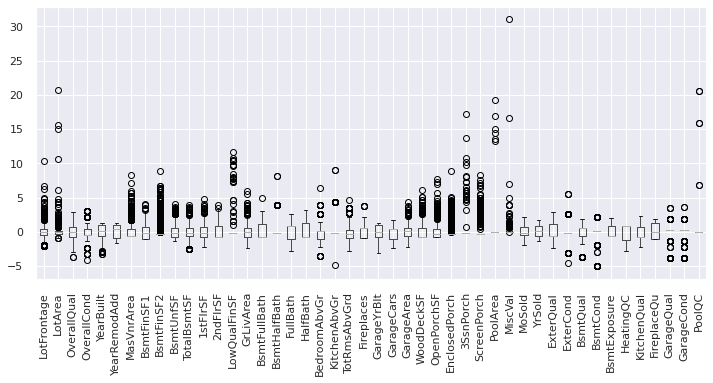

In [69]:
#---------Plot Outliers on Train Set------------#

boxplot = df_num2_sc.boxplot()
plt.xticks(rotation=90)
plt.show

**Au dessus de la barre des 25, les variables MiscVal et SalePrice sont repérer pour leurs outliers.**

In [71]:
df_num2_sc[df_num2_sc['MiscVal'] > 25].head()

,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,HeatingQC,KitchenQual,FireplaceQu,GarageQual,GarageCond,PoolQC
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
347,0.34,0.24,-0.07,2.17,-0.37,0.64,-0.57,0.14,-0.29,-0.24,-0.22,-0.54,-0.8,-0.12,-1.09,-0.82,-0.24,-1.03,-0.76,-1.06,-0.21,-0.93,-0.95,-0.7,-1.03,-0.8,-0.75,-0.71,-0.36,-0.12,-0.27,-0.06,31.06,-0.86,-0.61,-0.69,2.63,-0.6,0.11,0.9,-1.19,-0.77,-1.0,0.26,0.27,-0.06


In [451]:
columns = df_num2s[0].columns

In [72]:
#----- Drop Outliers on train Set --------#

for column in df_num2_sc.columns:
    print(df_num2_sc.shape)
    df_num2_sc = df_num2_sc.drop(df_num2_sc[df_num2_sc[column] > 25].index) # pas < 25 car sinon NaN 
    print(df_num2_sc.shape)

(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1450, 46)
(1449, 46)
(1449, 46)
(1449, 46)
(1449, 46)
(1449, 46)
(1449, 46)
(1449, 46)
(1449, 46)
(1449, 46)
(1449, 46)
(1449, 46)
(1449, 46)
(1449, 46)
(1449, 46)
(1449, 46)
(1449, 46)
(1449, 46)
(1449, 46)
(1449, 46)
(1449, 46)
(1449, 46)
(1449, 46)
(1449, 46)
(1449, 46)
(1449, 46)
(1449, 46)

<function matplotlib.pyplot.show(close=None, block=None)>

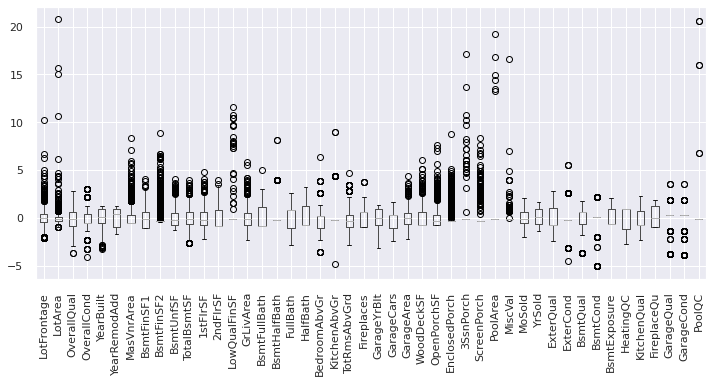

In [73]:
boxplot = df_num2_sc.boxplot()
plt.xticks(rotation=90)
plt.show

# <font color="#1d479b">Features Processing</font>

In [74]:
# Rows deleted

for id_id in df_num2s[0].index.unique():
    if id_id not in df_num2_sc.index.unique():
        print(id_id)

347


In [75]:
# Take values of df_num2[0]  
# Take index of df_num2_sc 
# result > df_num2[0] (1428, 46)

# Initial Value of the Train Set df_num2s[0] without Ouliers

df_num2s[0] = df_num2s[0][df_num2s[0].index.isin(df_num2_sc.index.to_list()) == True]
print(df_num2s[0].shape) #
df_num2s[0]

(1449, 46)


,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,HeatingQC,KitchenQual,FireplaceQu,GarageQual,GarageCond,PoolQC
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,65.0,8450.0,7,5,2003,2003,196.0,706.0,0.0,150.0,856.0,856.0,854.0,0.0,1710.0,1,0,2,1,3,1,8,0,2003,2,548.0,0.0,61.0,0.0,0.0,0.0,0.0,0,2,2008,7,5,7,5,0,9,7,0,5,5,0
2,80.0,9600.0,6,8,1976,1976,0.0,978.0,0.0,284.0,1262.0,1262.0,0.0,0.0,1262.0,0,1,2,0,3,1,6,1,1976,2,460.0,298.0,0.0,0.0,0.0,0.0,0.0,0,5,2007,5,5,7,5,7,9,5,5,5,5,0
3,68.0,11250.0,7,5,2001,2002,162.0,486.0,0.0,434.0,920.0,920.0,866.0,0.0,1786.0,1,0,2,1,3,1,6,1,2001,2,608.0,0.0,42.0,0.0,0.0,0.0,0.0,0,9,2008,7,5,7,5,4,9,7,5,5,5,0
4,60.0,9550.0,7,5,1915,1970,0.0,216.0,0.0,540.0,756.0,961.0,756.0,0.0,1717.0,1,0,1,0,3,1,7,1,1998,3,642.0,0.0,35.0,272.0,0.0,0.0,0.0,0,2,2006,5,5,5,7,0,7,7,7,5,5,0
5,84.0,14260.0,8,5,2000,2000,350.0,655.0,0.0,490.0,1145.0,1145.0,1053.0,0.0,2198.0,1,0,2,1,4,1,9,1,2000,3,836.0,192.0,84.0,0.0,0.0,0.0,0.0,0,12,2008,7,5,7,5,5,9,7,5,5,5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1456,62.0,7917.0,6,5,1999,2000,0.0,0.0,0.0,953.0,953.0,953.0,694.0,0.0,1647.0,0,0,2,1,3,1,7,1,1999,2,460.0,0.0,40.0,0.0,0.0,0.0,0.0,0,8,2007,5,5,7,5,0,9,5,5,5,5,0
1457,85.0,13175.0,6,6,1978,1988,119.0,790.0,163.0,589.0,1542.0,2073.0,0.0,0.0,2073.0,1,0,2,0,3,1,7,2,1978,2,500.0,349.0,0.0,0.0,0.0,0.0,0.0,0,2,2010,5,5,7,5,0,5,5,5,5,5,0
1458,66.0,9042.0,7,9,1941,2006,0.0,275.0,0.0,877.0,1152.0,1188.0,1152.0,0.0,2340.0,0,0,2,0,4,1,9,2,1941,1,252.0,0.0,60.0,0.0,0.0,0.0,0.0,2500,5,2010,9,7,5,7,0,9,7,7,5,5,0


**Concat Train & Test set.**

In [76]:
df_num2s[1] = df_num2s[1].set_index("Id")
df_num2s[1] = df_num2s[1].drop(["SalePrice"], axis=1)
df_num2s[1].head()

,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,HeatingQC,KitchenQual,FireplaceQu,GarageQual,GarageCond,PoolQC
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1461,80.0,11622.0,5,6,1961,1961,0.0,468.0,144.0,270.0,882.0,896.0,0.0,0.0,896.0,0,0,1,0,2,1,5,0,1961,1,730.0,140.0,0.0,0.0,0.0,120.0,0.0,0,6,2010,5,5,5,5,0,5,5,0,5,5,0
1462,81.0,14267.0,6,6,1958,1958,108.0,923.0,0.0,406.0,1329.0,1329.0,0.0,0.0,1329.0,0,0,1,1,3,1,6,0,1958,1,312.0,393.0,36.0,0.0,0.0,0.0,0.0,12500,6,2010,5,5,5,5,0,5,7,0,5,5,0
1463,74.0,13830.0,5,5,1997,1998,0.0,791.0,0.0,137.0,928.0,928.0,701.0,0.0,1629.0,0,0,2,1,3,1,6,1,1997,2,482.0,212.0,34.0,0.0,0.0,0.0,0.0,0,3,2010,5,5,7,5,0,7,5,5,5,5,0
1464,78.0,9978.0,6,6,1998,1998,20.0,602.0,0.0,324.0,926.0,926.0,678.0,0.0,1604.0,0,0,2,1,3,1,7,1,1998,2,470.0,360.0,36.0,0.0,0.0,0.0,0.0,0,6,2010,5,5,5,5,0,9,7,7,5,5,0
1465,43.0,5005.0,8,5,1992,1992,0.0,263.0,0.0,1017.0,1280.0,1280.0,0.0,0.0,1280.0,0,0,2,0,2,1,5,0,1992,2,506.0,0.0,82.0,0.0,0.0,144.0,0.0,0,1,2010,7,5,7,5,0,9,7,0,5,5,0


In [77]:
# Concat Train & Test set 

df_num2 = pd.concat([df_num2s[0],df_num2s[1]], axis=0)
print(df_num2.shape)
df_num2.head(10)

(2908, 46)


,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,HeatingQC,KitchenQual,FireplaceQu,GarageQual,GarageCond,PoolQC
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,65.0,8450.0,7,5,2003,2003,196.0,706.0,0.0,150.0,856.0,856.0,854.0,0.0,1710.0,1,0,2,1,3,1,8,0,2003,2,548.0,0.0,61.0,0.0,0.0,0.0,0.0,0,2,2008,7,5,7,5,0,9,7,0,5,5,0
2,80.0,9600.0,6,8,1976,1976,0.0,978.0,0.0,284.0,1262.0,1262.0,0.0,0.0,1262.0,0,1,2,0,3,1,6,1,1976,2,460.0,298.0,0.0,0.0,0.0,0.0,0.0,0,5,2007,5,5,7,5,7,9,5,5,5,5,0
3,68.0,11250.0,7,5,2001,2002,162.0,486.0,0.0,434.0,920.0,920.0,866.0,0.0,1786.0,1,0,2,1,3,1,6,1,2001,2,608.0,0.0,42.0,0.0,0.0,0.0,0.0,0,9,2008,7,5,7,5,4,9,7,5,5,5,0
4,60.0,9550.0,7,5,1915,1970,0.0,216.0,0.0,540.0,756.0,961.0,756.0,0.0,1717.0,1,0,1,0,3,1,7,1,1998,3,642.0,0.0,35.0,272.0,0.0,0.0,0.0,0,2,2006,5,5,5,7,0,7,7,7,5,5,0
5,84.0,14260.0,8,5,2000,2000,350.0,655.0,0.0,490.0,1145.0,1145.0,1053.0,0.0,2198.0,1,0,2,1,4,1,9,1,2000,3,836.0,192.0,84.0,0.0,0.0,0.0,0.0,0,12,2008,7,5,7,5,5,9,7,5,5,5,0
6,85.0,14115.0,5,5,1993,1995,0.0,732.0,0.0,64.0,796.0,796.0,566.0,0.0,1362.0,1,0,1,1,1,1,5,0,1993,2,480.0,40.0,30.0,0.0,320.0,0.0,0.0,700,10,2009,5,5,7,5,0,9,5,0,5,5,0
7,75.0,10084.0,8,5,2004,2005,186.0,1369.0,0.0,317.0,1686.0,1694.0,0.0,0.0,1694.0,1,0,2,0,3,1,7,1,2004,2,636.0,255.0,57.0,0.0,0.0,0.0,0.0,0,8,2007,7,5,9,5,5,9,7,7,5,5,0
8,91.0,10382.0,7,6,1973,1973,240.0,859.0,32.0,216.0,1107.0,1107.0,983.0,0.0,2090.0,1,0,2,1,3,1,7,2,1973,2,484.0,235.0,204.0,228.0,0.0,0.0,0.0,350,11,2009,5,5,7,5,4,9,5,5,5,5,0
9,51.0,6120.0,7,5,1931,1950,0.0,0.0,0.0,952.0,952.0,1022.0,752.0,0.0,1774.0,0,0,2,0,2,2,8,2,1931,2,468.0,90.0,0.0,205.0,0.0,0.0,0.0,0,4,2008,5,5,5,5,0,7,5,5,3,5,0


In [78]:
df_num3 = df_num2.copy()

**Concat `df_num2` and `df_objetct`.**

In [81]:
df_object.head()

,MSSubClass,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,Foundation,BsmtFinType1,BsmtFinType2,Heating,CentralAir,Electrical,Functional,GarageType,GarageFinish,PavedDrive,Fence,MiscFeature,SaleType,SaleCondition
0,60.0,RL,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,PConc,GLQ,Unf,GasA,Y,SBrkr,Typ,Attchd,RFn,Y,None,None,WD,Normal
1,20.0,RL,Pave,None,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,None,CBlock,ALQ,Unf,GasA,Y,SBrkr,Typ,Attchd,RFn,Y,None,None,WD,Normal
2,60.0,RL,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,PConc,GLQ,Unf,GasA,Y,SBrkr,Typ,Attchd,RFn,Y,None,None,WD,Normal
3,70.0,RL,Pave,None,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,None,BrkTil,ALQ,Unf,GasA,Y,SBrkr,Typ,Detchd,Unf,Y,None,None,WD,Abnorml
4,60.0,RL,Pave,None,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,PConc,GLQ,Unf,GasA,Y,SBrkr,Typ,Attchd,RFn,Y,None,None,WD,Normal


In [82]:
df_object.tail()

,MSSubClass,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,Foundation,BsmtFinType1,BsmtFinType2,Heating,CentralAir,Electrical,Functional,GarageType,GarageFinish,PavedDrive,Fence,MiscFeature,SaleType,SaleCondition
2914,160.0,RM,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,Twnhs,2Story,Gable,CompShg,CemntBd,CmentBd,None,CBlock,Unf,Unf,GasA,Y,SBrkr,Typ,None,None,Y,None,None,WD,Normal
2915,160.0,RM,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,TwnhsE,2Story,Gable,CompShg,CemntBd,CmentBd,None,CBlock,Rec,Unf,GasA,Y,SBrkr,Typ,CarPort,Unf,Y,None,None,WD,Abnorml
2916,20.0,RL,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,None,CBlock,ALQ,Unf,GasA,Y,SBrkr,Typ,Detchd,Unf,Y,None,None,WD,Abnorml
2917,85.0,RL,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,SFoyer,Gable,CompShg,HdBoard,Wd Shng,None,PConc,GLQ,Unf,GasA,Y,SBrkr,Typ,None,None,Y,MnPrv,Shed,WD,Normal
2918,60.0,RL,Pave,None,Reg,Lvl,AllPub,Inside,Mod,Mitchel,Norm,Norm,1Fam,2Story,Gable,CompShg,HdBoard,HdBoard,BrkFace,PConc,LwQ,Unf,GasA,Y,SBrkr,Typ,Attchd,Fin,Y,None,None,WD,Normal


In [83]:
index_col = np.arange(1,2920)
df_object["Id"] = index_col 
df_object = df_object.set_index("Id")

# Concat df_objet withou outliers in train set
df_object = df_object[df_object.index.isin(df_num3.index.to_list()) == True]
print(df_object.shape)  #(2908, 33)
df_object.head(10)

(2908, 33)


,MSSubClass,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,Foundation,BsmtFinType1,BsmtFinType2,Heating,CentralAir,Electrical,Functional,GarageType,GarageFinish,PavedDrive,Fence,MiscFeature,SaleType,SaleCondition
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,60.0,RL,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,PConc,GLQ,Unf,GasA,Y,SBrkr,Typ,Attchd,RFn,Y,None,None,WD,Normal
2,20.0,RL,Pave,None,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,None,CBlock,ALQ,Unf,GasA,Y,SBrkr,Typ,Attchd,RFn,Y,None,None,WD,Normal
3,60.0,RL,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,PConc,GLQ,Unf,GasA,Y,SBrkr,Typ,Attchd,RFn,Y,None,None,WD,Normal
4,70.0,RL,Pave,None,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,None,BrkTil,ALQ,Unf,GasA,Y,SBrkr,Typ,Detchd,Unf,Y,None,None,WD,Abnorml
5,60.0,RL,Pave,None,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,PConc,GLQ,Unf,GasA,Y,SBrkr,Typ,Attchd,RFn,Y,None,None,WD,Normal
6,50.0,RL,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,Gable,CompShg,VinylSd,VinylSd,None,Wood,GLQ,Unf,GasA,Y,SBrkr,Typ,Attchd,Unf,Y,MnPrv,Shed,WD,Normal
7,20.0,RL,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,Stone,PConc,GLQ,Unf,GasA,Y,SBrkr,Typ,Attchd,RFn,Y,None,None,WD,Normal
8,60.0,RL,Pave,None,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,Gable,CompShg,HdBoard,HdBoard,Stone,CBlock,ALQ,BLQ,GasA,Y,SBrkr,Typ,Attchd,RFn,Y,None,Shed,WD,Normal
9,50.0,RM,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,Gable,CompShg,BrkFace,Wd Shng,None,BrkTil,Unf,Unf,GasA,Y,FuseF,Min1,Detchd,Unf,Y,None,None,WD,Abnorml


In [84]:
# Entire Dataframe Train and Test Set without Outliers in the Train set

df_cleaned3 = pd.concat([df_num3, df_object], axis=1)
df_cleaned3.shape # (2908, 79)

(2908, 79)

In [85]:
df_cleaned4 = df_cleaned3.copy()

## <font color="#337da4">Features Adds</font>

In [87]:
# Add some more features 
df_cleaned4["SFPerRoom"] = df_cleaned4["GrLivArea"] / (df_cleaned4["TotRmsAbvGrd"] +
                                                       df_cleaned4["FullBath"] +
                                                       0.5 * df_cleaned4["HalfBath"] +
                                                       df_cleaned4["KitchenAbvGr"] +
                                                        df_cleaned4["BedroomAbvGr"])

df_cleaned4['TotOverall'] = df_cleaned4['OverallQual'] + df_cleaned4['OverallCond']
df_cleaned4['TotGarage'] = df_cleaned4['GarageQual'] + df_cleaned4['GarageCond'] #
df_cleaned4['TotExter'] = df_cleaned4['ExterQual'] + df_cleaned4['ExterCond'] #
df_cleaned4['TotBsmt'] = df_cleaned4['BsmtQual'] + df_cleaned4['BsmtCond'] #


df_cleaned4['TotBathrooms'] = (df_cleaned4['FullBath'] + (0.5 * df_cleaned4['HalfBath']) +
                               df_cleaned4['BsmtFullBath'] + (0.5 * df_cleaned4['BsmtHalfBath']))
    
df_cleaned4['BsmtFinType'] = df_cleaned4['BsmtFinType1'] + df_cleaned4['BsmtFinType2']
df_cleaned4['BsmtFinSF'] = df_cleaned4['BsmtFinSF1'] + df_cleaned4['BsmtFinSF2'] #
df_cleaned4['TotFlrSF'] = df_cleaned4['1stFlrSF'] + df_cleaned4['2ndFlrSF']
df_cleaned4['TotPorchSF'] = df_cleaned4['OpenPorchSF'] + df_cleaned4['EnclosedPorch'] + df_cleaned4['3SsnPorch'] + df_cleaned4['ScreenPorch']

df_cleaned4.shape

(2908, 89)

In [ ]:
# Remove correlated columns to new variables
# But the score goes down... so do not remove these columns

#cols_to_remove = ["OverallQual","OverallCond","GarageQual","GarageCond","ExterQual", # multi-colinearity
#                 "ExterCond","BsmtQual",  # multi-colinearity
#                  # uncorrelated to SalePrice
#                 "BsmtCond","FullBath","HalfBath","BsmtFullBath","BsmtHalfBath",
#                 "BsmtFinType1","BsmtFinType2","BsmtFinSF1","BsmtFinSF2","1stFlrSF",
#                 "2ndFlrSF","OpenPorchSF","EnclosedPorch","3SsnPorch","ScreenPorch"]
#
#print(df_cleaned2.shape)
#df_cleaned2=df_cleaned2.drop(cols_to_remove,axis=1)
#print(df_cleaned2.shape)

## <font color="#337da4">Features Elimination</font>

In [90]:
df_y = df_train[["Id","SalePrice"]]
df_y = df_y.set_index("Id")
print(df_y.shape)
df_y

(1460, 1)


,SalePrice
Id,
1,208500
2,181500
3,223500
4,140000
5,250000
...,...
1456,175000
1457,210000
1458,266500


In [91]:
# SalePrice without Outliers in the Train set

df_y = df_y[df_y.index.isin(df_cleaned4.index.to_list()) == True]
print(df_cleaned4.shape)
df_y.head(10)

(2908, 89)


,SalePrice
Id,
1,208500
2,181500
3,223500
4,140000
5,250000
6,143000
7,307000
8,200000
9,129900


In [92]:
df_cleaned4 = pd.concat([df_cleaned4,df_y], axis=1)
print(df_cleaned4.shape)
df_cleaned4.head(10)

(2908, 90)


,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,HeatingQC,KitchenQual,FireplaceQu,GarageQual,GarageCond,PoolQC,MSSubClass,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,Foundation,BsmtFinType1,BsmtFinType2,Heating,CentralAir,Electrical,Functional,GarageType,GarageFinish,PavedDrive,Fence,MiscFeature,SaleType,SaleCondition,SFPerRoom,TotOverall,TotGarage,TotExter,TotBsmt,TotBathrooms,BsmtFinType,BsmtFinSF,TotFlrSF,TotPorchSF,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,65.0,8450.0,7,5,2003,2003,196.0,706.0,0.0,150.0,856.0,856.0,854.0,0.0,1710.0,1,0,2,1,3,1,8,0,2003,2,548.0,0.0,61.0,0.0,0.0,0.0,0.0,0,2,2008,7,5,7,5,0,9,7,0,5,5,0,60.0,RL,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,PConc,GLQ,Unf,GasA,Y,SBrkr,Typ,Attchd,RFn,Y,None,None,WD,Normal,117.93,12,10,12,12,3.5,GLQUnf,706.0,1710.0,61.0,208500.0
2,80.0,9600.0,6,8,1976,1976,0.0,978.0,0.0,284.0,1262.0,1262.0,0.0,0.0,1262.0,0,1,2,0,3,1,6,1,1976,2,460.0,298.0,0.0,0.0,0.0,0.0,0.0,0,5,2007,5,5,7,5,7,9,5,5,5,5,0,20.0,RL,Pave,None,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,None,CBlock,ALQ,Unf,GasA,Y,SBrkr,Typ,Attchd,RFn,Y,None,None,WD,Normal,105.17,14,10,10,12,2.5,ALQUnf,978.0,1262.0,0.0,181500.0
3,68.0,11250.0,7,5,2001,2002,162.0,486.0,0.0,434.0,920.0,920.0,866.0,0.0,1786.0,1,0,2,1,3,1,6,1,2001,2,608.0,0.0,42.0,0.0,0.0,0.0,0.0,0,9,2008,7,5,7,5,4,9,7,5,5,5,0,60.0,RL,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,PConc,GLQ,Unf,GasA,Y,SBrkr,Typ,Attchd,RFn,Y,None,None,WD,Normal,142.88,12,10,12,12,3.5,GLQUnf,486.0,1786.0,42.0,223500.0
4,60.0,9550.0,7,5,1915,1970,0.0,216.0,0.0,540.0,756.0,961.0,756.0,0.0,1717.0,1,0,1,0,3,1,7,1,1998,3,642.0,0.0,35.0,272.0,0.0,0.0,0.0,0,2,2006,5,5,5,7,0,7,7,7,5,5,0,70.0,RL,Pave,None,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,None,BrkTil,ALQ,Unf,GasA,Y,SBrkr,Typ,Detchd,Unf,Y,None,None,WD,Abnorml,143.08,12,10,10,12,2.0,ALQUnf,216.0,1717.0,307.0,140000.0
5,84.0,14260.0,8,5,2000,2000,350.0,655.0,0.0,490.0,1145.0,1145.0,1053.0,0.0,2198.0,1,0,2,1,4,1,9,1,2000,3,836.0,192.0,84.0,0.0,0.0,0.0,0.0,0,12,2008,7,5,7,5,5,9,7,5,5,5,0,60.0,RL,Pave,None,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,PConc,GLQ,Unf,GasA,Y,SBrkr,Typ,Attchd,RFn,Y,None,None,WD,Normal,133.21,13,10,12,12,3.5,GLQUnf,655.0,2198.0,84.0,250000.0
6,85.0,14115.0,5,5,1993,1995,0.0,732.0,0.0,64.0,796.0,796.0,566.0,0.0,1362.0,1,0,1,1,1,1,5,0,1993,2,480.0,40.0,30.0,0.0,320.0,0.0,0.0,700,10,2009,5,5,7,5,0,9,5,0,5,5,0,50.0,RL,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,Gable,CompShg,VinylSd,VinylSd,None,Wood,GLQ,Unf,GasA,Y,SBrkr,Typ,Attchd,Unf,Y,MnPrv,Shed,WD,Normal,160.24,10,10,10,12,2.5,GLQUnf,732.0,1362.0,350.0,143000.0
7,75.0,10084.0,8,5,2004,2005,186.0,1369.0,0.0,317.0,1686.0,1694.0,0.0,0.0,1694.0,1,0,2,0,3,1,7,1,2004,2,636.0,255.0,57.0,0.0,0.0,0.0,0.0,0,8,2007,7,5,9,5,5,9,7,7,5,5,0,20.0,RL,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,Stone,PConc,GLQ,Unf,GasA,Y,SBrkr,Typ,Attchd,RFn,Y,None,None,WD,Normal,130.31,13,10,12,14,3.0,GLQUnf,1369.0,1694.0,57.0,307000.0
8,91.0,10382.0,7,6,1973,1973,240.0,859.0,32.0,216.0,1107.0,1107.0,983.0,0.0,2090.0,1,0,2,1,3,1,7,2,1973,2,484.0,235.0,204.0,228.0,0.0,0.0,0.0,350,11,2009,5,5,7,5,4,9,5,

In [93]:
df_cleaned4s = np.split(df_cleaned4, [1449], axis=0)
df_cleaned4s[0]

,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,HeatingQC,KitchenQual,FireplaceQu,GarageQual,GarageCond,PoolQC,MSSubClass,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,Foundation,BsmtFinType1,BsmtFinType2,Heating,CentralAir,Electrical,Functional,GarageType,GarageFinish,PavedDrive,Fence,MiscFeature,SaleType,SaleCondition,SFPerRoom,TotOverall,TotGarage,TotExter,TotBsmt,TotBathrooms,BsmtFinType,BsmtFinSF,TotFlrSF,TotPorchSF,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,65.0,8450.0,7,5,2003,2003,196.0,706.0,0.0,150.0,856.0,856.0,854.0,0.0,1710.0,1,0,2,1,3,1,8,0,2003,2,548.0,0.0,61.0,0.0,0.0,0.0,0.0,0,2,2008,7,5,7,5,0,9,7,0,5,5,0,60.0,RL,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,PConc,GLQ,Unf,GasA,Y,SBrkr,Typ,Attchd,RFn,Y,None,None,WD,Normal,117.93,12,10,12,12,3.5,GLQUnf,706.0,1710.0,61.0,208500.0
2,80.0,9600.0,6,8,1976,1976,0.0,978.0,0.0,284.0,1262.0,1262.0,0.0,0.0,1262.0,0,1,2,0,3,1,6,1,1976,2,460.0,298.0,0.0,0.0,0.0,0.0,0.0,0,5,2007,5,5,7,5,7,9,5,5,5,5,0,20.0,RL,Pave,None,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,None,CBlock,ALQ,Unf,GasA,Y,SBrkr,Typ,Attchd,RFn,Y,None,None,WD,Normal,105.17,14,10,10,12,2.5,ALQUnf,978.0,1262.0,0.0,181500.0
3,68.0,11250.0,7,5,2001,2002,162.0,486.0,0.0,434.0,920.0,920.0,866.0,0.0,1786.0,1,0,2,1,3,1,6,1,2001,2,608.0,0.0,42.0,0.0,0.0,0.0,0.0,0,9,2008,7,5,7,5,4,9,7,5,5,5,0,60.0,RL,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,PConc,GLQ,Unf,GasA,Y,SBrkr,Typ,Attchd,RFn,Y,None,None,WD,Normal,142.88,12,10,12,12,3.5,GLQUnf,486.0,1786.0,42.0,223500.0
4,60.0,9550.0,7,5,1915,1970,0.0,216.0,0.0,540.0,756.0,961.0,756.0,0.0,1717.0,1,0,1,0,3,1,7,1,1998,3,642.0,0.0,35.0,272.0,0.0,0.0,0.0,0,2,2006,5,5,5,7,0,7,7,7,5,5,0,70.0,RL,Pave,None,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,None,BrkTil,ALQ,Unf,GasA,Y,SBrkr,Typ,Detchd,Unf,Y,None,None,WD,Abnorml,143.08,12,10,10,12,2.0,ALQUnf,216.0,1717.0,307.0,140000.0
5,84.0,14260.0,8,5,2000,2000,350.0,655.0,0.0,490.0,1145.0,1145.0,1053.0,0.0,2198.0,1,0,2,1,4,1,9,1,2000,3,836.0,192.0,84.0,0.0,0.0,0.0,0.0,0,12,2008,7,5,7,5,5,9,7,5,5,5,0,60.0,RL,Pave,None,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,PConc,GLQ,Unf,GasA,Y,SBrkr,Typ,Attchd,RFn,Y,None,None,WD,Normal,133.21,13,10,12,12,3.5,GLQUnf,655.0,2198.0,84.0,250000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1456,62.0,7917.0,6,5,1999,2000,0.0,0.0,0.0,953.0,953.0,953.0,694.0,0.0,1647.0,0,0,2,1,3,1,7,1,1999,2,460.0,0.0,40.0,0.0,0.0,0.0,0.0,0,8,2007,5,5,7,5,0,9,5,5,5,5,0,60.0,RL,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,None,PConc,Unf,Unf,GasA,Y,SBrkr,Typ,Attchd,RFn,Y,None,None,WD,Normal,122.00,11,10,10,12,2.5,UnfUnf,0.0,1647.0,40.0,175000.0
1457,85.0,13175.0,6,6,1978,1988,119.0,790.0,163.0,589.0,1542.0,2073.0,0.0,0.0,2073.0,1,0,2,0,3,1,7,2,1978,2,500.0,349.0,0.0,0.0,0.0,0.0,0.0,0,2,2010,5,5,7,5,0,5,5,5,5,5,0,20.0,RL,Pave,None,Reg,Lvl,AllPub,Inside,G

In [94]:
df_cleaned4s[1]

,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,HeatingQC,KitchenQual,FireplaceQu,GarageQual,GarageCond,PoolQC,MSSubClass,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,Foundation,BsmtFinType1,BsmtFinType2,Heating,CentralAir,Electrical,Functional,GarageType,GarageFinish,PavedDrive,Fence,MiscFeature,SaleType,SaleCondition,SFPerRoom,TotOverall,TotGarage,TotExter,TotBsmt,TotBathrooms,BsmtFinType,BsmtFinSF,TotFlrSF,TotPorchSF,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1461,80.0,11622.0,5,6,1961,1961,0.0,468.0,144.0,270.0,882.0,896.0,0.0,0.0,896.0,0,0,1,0,2,1,5,0,1961,1,730.0,140.0,0.0,0.0,0.0,120.0,0.0,0,6,2010,5,5,5,5,0,5,5,0,5,5,0,20.0,RH,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,None,CBlock,Rec,LwQ,GasA,Y,SBrkr,Typ,Attchd,Unf,Y,MnPrv,None,WD,Normal,99.56,11,10,10,10,1.0,RecLwQ,612.0,896.0,120.0,NaN
1462,81.0,14267.0,6,6,1958,1958,108.0,923.0,0.0,406.0,1329.0,1329.0,0.0,0.0,1329.0,0,0,1,1,3,1,6,0,1958,1,312.0,393.0,36.0,0.0,0.0,0.0,0.0,12500,6,2010,5,5,5,5,0,5,7,0,5,5,0,20.0,RL,Pave,None,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,CBlock,ALQ,Unf,GasA,Y,SBrkr,Typ,Attchd,Unf,Y,None,Gar2,WD,Normal,115.57,12,10,10,10,1.5,ALQUnf,923.0,1329.0,36.0,NaN
1463,74.0,13830.0,5,5,1997,1998,0.0,791.0,0.0,137.0,928.0,928.0,701.0,0.0,1629.0,0,0,2,1,3,1,6,1,1997,2,482.0,212.0,34.0,0.0,0.0,0.0,0.0,0,3,2010,5,5,7,5,0,7,5,5,5,5,0,60.0,RL,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,None,PConc,GLQ,Unf,GasA,Y,SBrkr,Typ,Attchd,Fin,Y,MnPrv,None,WD,Normal,130.32,10,10,10,12,2.5,GLQUnf,791.0,1629.0,34.0,NaN
1464,78.0,9978.0,6,6,1998,1998,20.0,602.0,0.0,324.0,926.0,926.0,678.0,0.0,1604.0,0,0,2,1,3,1,7,1,1998,2,470.0,360.0,36.0,0.0,0.0,0.0,0.0,0,6,2010,5,5,5,5,0,9,7,7,5,5,0,60.0,RL,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,PConc,GLQ,Unf,GasA,Y,SBrkr,Typ,Attchd,Fin,Y,None,None,WD,Normal,118.81,12,10,10,10,2.5,GLQUnf,602.0,1604.0,36.0,NaN
1465,43.0,5005.0,8,5,1992,1992,0.0,263.0,0.0,1017.0,1280.0,1280.0,0.0,0.0,1280.0,0,0,2,0,2,1,5,0,1992,2,506.0,0.0,82.0,0.0,0.0,144.0,0.0,0,1,2010,7,5,7,5,0,9,7,0,5,5,0,120.0,RL,Pave,None,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,Gable,CompShg,HdBoard,HdBoard,None,PConc,ALQ,Unf,GasA,Y,SBrkr,Typ,Attchd,RFn,Y,None,None,WD,Normal,128.00,13,10,12,12,2.0,ALQUnf,263.0,1280.0,226.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2915,21.0,1936.0,4,7,1970,1970,0.0,0.0,0.0,546.0,546.0,546.0,546.0,0.0,1092.0,0,0,1,1,3,1,5,0,1973,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,6,2006,5,5,5,5,0,7,5,0,0,0,0,160.0,RM,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,Twnhs,2Story,Gable,CompShg,CemntBd,CmentBd,None,CBlock,Unf,Unf,GasA,Y,SBrkr,Typ,None,None,Y,None,None,WD,Normal,104.00,11,0,10,10,1.5,UnfUnf,0.0,1092.0,0.0,NaN
2916,21.0,1894.0,4,5,1970,1970,0.0,252.0,0.0,294.0,546.0,546.0,546.0,0.0,1092.0,0,0,1,1,3,1,6,0,1970,1,286.0,0.0,24.0,0.0,0.0,0.0,0.0,0,4,2006,5,5,5,5,0,5,5,0,5,5,0,160.0,RM,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,No

<AxesSubplot:>

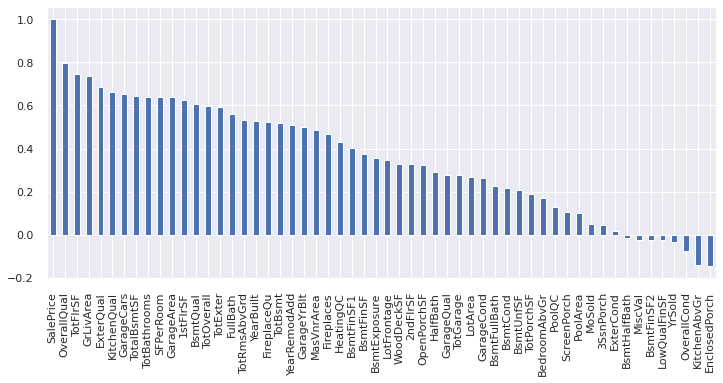

In [95]:
corr = df_cleaned4s[0].corr()

# Check correlated variables to SalePrice
#print(corr["SalePrice"].sort_values(ascending = False),'\n')
corr["SalePrice"].sort_values(ascending = False).plot(kind='bar')

In [96]:
corr["SalePrice"].sort_values(ascending = False)

SalePrice        1.00
OverallQual      0.80
TotFlrSF         0.74
GrLivArea        0.73
ExterQual        0.68
KitchenQual      0.66
GarageCars       0.65
TotalBsmtSF      0.64
TotBathrooms     0.64
SFPerRoom        0.64
GarageArea       0.64
1stFlrSF         0.62
BsmtQual         0.61
TotOverall       0.60
TotExter         0.59
FullBath         0.56
TotRmsAbvGrd     0.53
YearBuilt        0.53
FireplaceQu      0.52
TotBsmt          0.52
YearRemodAdd     0.51
GarageYrBlt      0.50
MasVnrArea       0.49
Fireplaces       0.47
HeatingQC        0.43
BsmtFinSF1       0.40
BsmtFinSF        0.38
BsmtExposure     0.36
LotFrontage      0.35
WoodDeckSF       0.33
2ndFlrSF         0.33
OpenPorchSF      0.32
HalfBath         0.29
GarageQual       0.28
TotGarage        0.28
LotArea          0.27
GarageCond       0.27
BsmtFullBath     0.22
BsmtCond         0.22
BsmtUnfSF        0.21
TotPorchSF       0.19
BedroomAbvGr     0.17
PoolQC           0.13
ScreenPorch      0.10
PoolArea         0.10
MoSold    

In [97]:
# Check Colinearity

threshold = 0.8

corr_pairs = corr.unstack().sort_values(kind="quicksort")

strong_corr = (pd.DataFrame(corr_pairs[(abs(corr_pairs) > threshold)])
               .reset_index().rename(columns={0:'corr_coeff'}))

strong_corr = strong_corr[(strong_corr.index%2 == 0) & (strong_corr['level_0'] != strong_corr['level_1'])]
strong_corr.sort_values('corr_coeff', ascending=False)

,level_0,level_1,corr_coeff
28,TotFlrSF,GrLivArea,1.00
26,GarageQual,TotGarage,0.99
24,GarageCond,TotGarage,0.99
22,GarageQual,GarageCond,0.95
20,BsmtQual,TotBsmt,0.94
18,BsmtFinSF,BsmtFinSF1,0.93
16,PoolQC,PoolArea,0.91
14,GarageArea,GarageCars,0.89
12,Fireplaces,FireplaceQu,0.86
10,ExterQual,TotExter,0.86


In [98]:
result = strong_corr.sort_values('corr_coeff', ascending=False)
list1= result["level_0"].to_list()
list2 = result["level_1"].to_list()

In [99]:
for column in list1 : 

    print(column, corr["SalePrice"].sort_values(ascending = False)[column])

TotFlrSF 0.7441337081184177
GarageQual 0.2785871148055528
GarageCond 0.2657656878890101
GarageQual 0.2785871148055528
BsmtQual 0.607416382523147
BsmtFinSF 0.37606403808045835
PoolQC 0.12789018326424245
GarageArea 0.6370789338543822
Fireplaces 0.4676162902107847
ExterQual 0.6849524093114877
TotRmsAbvGrd 0.5347963755776248
TotRmsAbvGrd 0.5347963755776248
TotBsmt 0.5179817027203472
YearBuilt 0.5280384022736192
TotalBsmtSF 0.6441880298542116


In [100]:
for column in list2 : 

    print(column, corr["SalePrice"].sort_values(ascending = False)[column])

GrLivArea 0.734888559748243
TotGarage 0.27598849039671786
TotGarage 0.27598849039671786
GarageCond 0.2657656878890101
TotBsmt 0.5179817027203472
BsmtFinSF1 0.4023662701990155
PoolArea 0.1011561558462083
GarageCars 0.6512193002937392
FireplaceQu 0.5222552984598923
TotExter 0.5914908054562743
GrLivArea 0.734888559748243
TotFlrSF 0.7441337081184177
BsmtCond 0.21935188443697284
GarageYrBlt 0.498231329747397
1stFlrSF 0.624414575824121


In [101]:
# Drop Uncorrelated Columns to SalePrice, drop redundant columns, drop 
                  
    # multi-colinearity
cols_to_remove = ["GrLivArea", 
                  "TotGarage",  #created variable 
                  #"GarageCond",           
                  "GarageCond",  
                  "TotBsmt",  #created variable 
                  "BsmtFinSF", #created variable 
                  "PoolArea", 
                  "GarageArea", 
                  "Fireplaces", 
                  "TotExter",  #created variable 
                  #"TotRmsAbvGrd",  
                  "TotRmsAbvGrd", 
                  "BsmtCond", 
                  "GarageYrBlt", 
                  "1stFlrSF", 

                  # negative correlation to SalePrice
                 "BsmtFinSF2","BsmtHalfBath","LowQualFinSF","YrSold",
                 "MiscVal","OverallCond","EnclosedPorch","KitchenAbvGr"]

print(df_cleaned4.shape)
df_cleaned4=df_cleaned4.drop(cols_to_remove,axis=1)
print(df_cleaned4.shape)

(2908, 90)
(2908, 69)


In [102]:
df_cleaned5 = df_cleaned4.copy()

In [103]:
df_cleaned5.head()

,LotFrontage,LotArea,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,2ndFlrSF,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,GarageCars,WoodDeckSF,OpenPorchSF,3SsnPorch,ScreenPorch,MoSold,ExterQual,ExterCond,BsmtQual,BsmtExposure,HeatingQC,KitchenQual,FireplaceQu,GarageQual,PoolQC,MSSubClass,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,Foundation,BsmtFinType1,BsmtFinType2,Heating,CentralAir,Electrical,Functional,GarageType,GarageFinish,PavedDrive,Fence,MiscFeature,SaleType,SaleCondition,SFPerRoom,TotOverall,TotBathrooms,BsmtFinType,TotFlrSF,TotPorchSF,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,65.0,8450.0,7,2003,2003,196.0,706.0,150.0,856.0,854.0,1,2,1,3,2,0.0,61.0,0.0,0.0,2,7,5,7,0,9,7,0,5,0,60.0,RL,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,PConc,GLQ,Unf,GasA,Y,SBrkr,Typ,Attchd,RFn,Y,None,None,WD,Normal,117.93,12,3.5,GLQUnf,1710.0,61.0,208500.0
2,80.0,9600.0,6,1976,1976,0.0,978.0,284.0,1262.0,0.0,0,2,0,3,2,298.0,0.0,0.0,0.0,5,5,5,7,7,9,5,5,5,0,20.0,RL,Pave,None,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,None,CBlock,ALQ,Unf,GasA,Y,SBrkr,Typ,Attchd,RFn,Y,None,None,WD,Normal,105.17,14,2.5,ALQUnf,1262.0,0.0,181500.0
3,68.0,11250.0,7,2001,2002,162.0,486.0,434.0,920.0,866.0,1,2,1,3,2,0.0,42.0,0.0,0.0,9,7,5,7,4,9,7,5,5,0,60.0,RL,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,PConc,GLQ,Unf,GasA,Y,SBrkr,Typ,Attchd,RFn,Y,None,None,WD,Normal,142.88,12,3.5,GLQUnf,1786.0,42.0,223500.0
4,60.0,9550.0,7,1915,1970,0.0,216.0,540.0,756.0,756.0,1,1,0,3,3,0.0,35.0,0.0,0.0,2,5,5,5,0,7,7,7,5,0,70.0,RL,Pave,None,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,None,BrkTil,ALQ,Unf,GasA,Y,SBrkr,Typ,Detchd,Unf,Y,None,None,WD,Abnorml,143.08,12,2.0,ALQUnf,1717.0,307.0,140000.0
5,84.0,14260.0,8,2000,2000,350.0,655.0,490.0,1145.0,1053.0,1,2,1,4,3,192.0,84.0,0.0,0.0,12,7,5,7,5,9,7,5,5,0,60.0,RL,Pave,None,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,PConc,GLQ,Unf,GasA,Y,SBrkr,Typ,Attchd,RFn,Y,None,None,WD,Normal,133.21,13,3.5,GLQUnf,2198.0,84.0,250000.0


In [104]:
df_cleaned5.iloc[340:348] # ok no 347 row

,LotFrontage,LotArea,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,2ndFlrSF,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,GarageCars,WoodDeckSF,OpenPorchSF,3SsnPorch,ScreenPorch,MoSold,ExterQual,ExterCond,BsmtQual,BsmtExposure,HeatingQC,KitchenQual,FireplaceQu,GarageQual,PoolQC,MSSubClass,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,Foundation,BsmtFinType1,BsmtFinType2,Heating,CentralAir,Electrical,Functional,GarageType,GarageFinish,PavedDrive,Fence,MiscFeature,SaleType,SaleCondition,SFPerRoom,TotOverall,TotBathrooms,BsmtFinType,TotFlrSF,TotPorchSF,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
342,60.0,8400.0,4,1950,1950,0.0,0.0,721.0,721.0,0.0,0,1,0,2,1,250.0,0.0,0.0,0.0,9,3,3,5,0,7,5,0,5,0,20.0,RH,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,SawyerW,Feedr,Norm,1Fam,1Story,Gable,CompShg,Wd Sdng,AsbShng,None,CBlock,Unf,Unf,GasA,Y,SBrkr,Typ,CarPort,Unf,N,None,None,WD,Normal,105.12,8,1.0,UnfUnf,841.0,24.0,82000.0
343,63.5,8544.0,3,1949,1950,340.0,0.0,0.0,0.0,0.0,0,2,0,2,2,0.0,0.0,0.0,0.0,5,5,5,0,0,3,5,0,5,0,90.0,RL,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,Duplex,1Story,Gable,CompShg,Stucco,Stucco,BrkFace,Slab,None,None,Wall,N,FuseA,Typ,Detchd,Unf,Y,None,None,WD,Normal,86.67,7,2.0,NoneNone,1040.0,0.0,87500.0
344,63.0,8849.0,9,2005,2005,616.0,28.0,1656.0,1684.0,0.0,0,2,0,2,2,495.0,72.0,0.0,0.0,7,9,5,9,0,9,9,9,5,0,120.0,RL,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,TwnhsE,1Story,Hip,CompShg,MetalSd,MetalSd,BrkFace,PConc,GLQ,Unf,GasA,Y,SBrkr,Typ,Attchd,RFn,Y,None,None,WD,Normal,153.09,14,2.0,GLQUnf,1684.0,72.0,266000.0
345,36.0,2592.0,5,1976,1976,0.0,129.0,175.0,536.0,576.0,0,1,1,3,1,182.0,0.0,0.0,0.0,4,5,5,7,0,5,5,0,5,0,160.0,RM,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,TwnhsE,2Story,Gable,CompShg,CemntBd,CmentBd,None,CBlock,Rec,BLQ,GasA,Y,SBrkr,Typ,Attchd,Unf,Y,None,None,WD,Normal,117.05,8,1.5,RecBLQ,1112.0,0.0,85000.0
346,65.0,6435.0,6,1939,1950,0.0,0.0,972.0,972.0,605.0,0,1,0,3,1,0.0,0.0,0.0,0.0,10,5,5,5,0,7,3,7,5,0,50.0,RL,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,BrkSide,RRAn,Norm,1Fam,1.5Fin,Gable,CompShg,MetalSd,MetalSd,None,BrkTil,Unf,Unf,GasA,Y,SBrkr,Typ,Detchd,Unf,Y,None,None,WD,Normal,143.36,11,1.0,UnfUnf,1577.0,0.0,140200.0
348,79.5,17600.0,6,1960,1960,30.0,1270.0,208.0,1478.0,0.0,1,2,0,3,2,0.0,40.0,0.0,0.0,12,5,5,5,0,9,5,7,5,0,20.0,RL,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,Wd Sdng,Wd Sdng,BrkFace,CBlock,BLQ,Unf,GasA,Y,FuseA,Typ,Attchd,Unf,Y,None,None,WD,Normal,123.17,11,3.0,BLQUnf,1478.0,40.0,157500.0
349,36.0,2448.0,7,2003,2004,106.0,573.0,191.0,764.0,862.0,1,2,1,2,2,0.0,27.0,0.0,0.0,10,7,5,7,0,9,7,0,5,0,160.0,RL,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,Twnhs,2Story,Gable,CompShg,VinylSd,Wd Shng,Stone,PConc,GLQ,Unf,GasA,Y,SBrkr,Typ,BuiltIn,RFn,Y,None,None,WD,Normal,141.39,12,3.5,GLQUnf,1626.0,27.0,154000.0
350,56.0,20431.0,9,2005,2006,870.0,1410.0,438.0,1848.0,880.0,1,2,1,4,3,0.0,0.0,0.0,0.0,4,9,5,9,0,9,9,9,5,0,60.0,RL,Pave,None,IR2,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,2Story,Hip,CompShg,CemntBd,CmentBd,BrkFace,PConc,GLQ,Unf,GasA,Y,SBrkr,Typ,Attchd,Fin,Y,None,None,New,Partial,155.89,14,3.5,GLQUnf,2728.0,0.0,437154.0


## <font color="#337da4">Features Transformation</font>

### <font color="#2cb7b0" id="section_1_1">Log(X)</font>

In [105]:
df_num5 = df_cleaned5.select_dtypes(include=['float64','int64'])
df_num5 = df_num5.drop(["SalePrice"], axis=1)

dictionary = {}
for column in df_num5.columns :
    
    dictionary[column] = abs(df_cleaned5[column].agg(['skew']))

    # Asymetric Distribution
df_skew = pd.DataFrame.from_dict(dictionary, orient='index',columns= [ 'skew'] )
df_skew = df_skew[df_skew['skew'] >= 0.5]
df_skew

,skew
2ndFlrSF,0.86
3SsnPorch,11.36
BsmtExposure,0.99
BsmtFinSF1,0.98
BsmtFullBath,0.62
BsmtQual,0.87
BsmtUnfSF,0.92
ExterCond,1.44
ExterQual,0.78
GarageQual,3.05


<AxesSubplot:xlabel='MasVnrArea', ylabel='Density'>

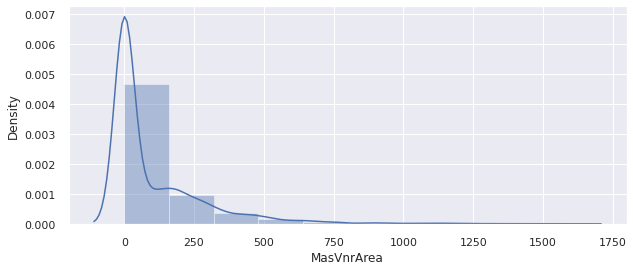

In [106]:
sns.set(rc={'figure.figsize':(10,4)})
#sns.distplot(df_cleaned["SalePrice"],kde=False,bins = 20)
sns.distplot(df_num5["MasVnrArea"],bins = 10)

<AxesSubplot:xlabel='HeatingQC', ylabel='Density'>

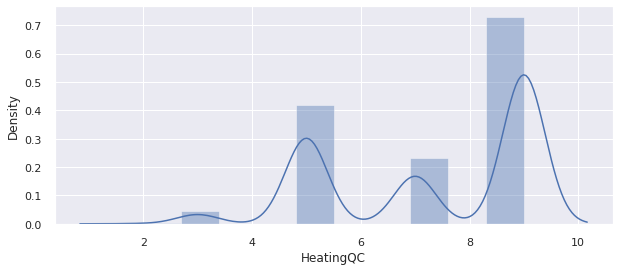

In [107]:
sns.set(rc={'figure.figsize':(10,4)})
#sns.distplot(df_cleaned["SalePrice"],kde=False,bins = 20)
sns.distplot(df_num5["HeatingQC"],bins = 10)

In [108]:
columns = df_skew.index.to_list()

df_cleaned5[columns] = df_cleaned5[columns].apply(lambda x : np.log1p(x))
df_cleaned5[columns] 

,2ndFlrSF,3SsnPorch,BsmtExposure,BsmtFinSF1,BsmtFullBath,BsmtQual,BsmtUnfSF,ExterCond,ExterQual,GarageQual,HalfBath,HeatingQC,LotArea,LotFrontage,MasVnrArea,OpenPorchSF,PoolQC,SFPerRoom,ScreenPorch,TotFlrSF,TotOverall,TotPorchSF,TotalBsmtSF,WoodDeckSF,YearBuilt
Id,,,,,,,,,,,,,,,,,,,,,,,,,
1,6.75,0.0,0.00,6.56,0.69,2.08,5.02,1.79,2.08,1.79,0.69,2.30,9.04,4.19,5.28,4.13,0.0,4.78,0.0,7.44,2.56,4.13,6.75,0.00,7.60
2,0.00,0.0,2.08,6.89,0.00,2.08,5.65,1.79,1.79,1.79,0.00,2.30,9.17,4.39,0.00,0.00,0.0,4.67,0.0,7.14,2.71,0.00,7.14,5.70,7.59
3,6.77,0.0,1.61,6.19,0.69,2.08,6.08,1.79,2.08,1.79,0.69,2.30,9.33,4.23,5.09,3.76,0.0,4.97,0.0,7.49,2.56,3.76,6.83,0.00,7.60
4,6.63,0.0,0.00,5.38,0.69,1.79,6.29,1.79,1.79,1.79,0.00,2.08,9.16,4.11,0.00,3.58,0.0,4.97,0.0,7.45,2.56,5.73,6.63,0.00,7.56
5,6.96,0.0,1.79,6.49,0.69,2.08,6.20,1.79,2.08,1.79,0.69,2.30,9.57,4.44,5.86,4.44,0.0,4.90,0.0,7.70,2.64,4.44,7.04,5.26,7.60
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2915,6.30,0.0,0.00,0.00,0.00,1.79,6.30,1.79,1.79,0.00,0.69,2.08,7.57,3.09,0.00,0.00,0.0,4.65,0.0,7.00,2.48,0.00,6.30,0.00,7.59
2916,6.30,0.0,0.00,5.53,0.00,1.79,5.69,1.79,1.79,1.79,0.69,1.79,7.55,3.09,0.00,3.22,0.0,4.56,0.0,7.00,2.30,3.22,6.30,0.00,7.59
2917,0.00,0.0,0.00,7.11,0.69,1.79,0.00,1.79,1.79,1.79,0.00,2.30,9.90,5.08,0.00,0.00,0.0,4.56,0.0,7.11,2.56,0.00,7.11,6.16,7.58


<AxesSubplot:xlabel='MasVnrArea', ylabel='Density'>

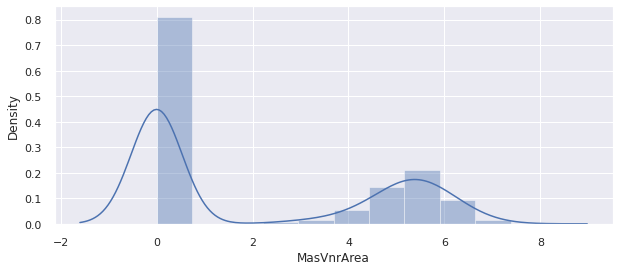

In [109]:
# Check after skew

sns.set(rc={'figure.figsize':(10,4)})
#sns.distplot(df_cleaned["SalePrice"],kde=False,bins = 20)
sns.distplot(df_cleaned5["MasVnrArea"],bins = 10)

<AxesSubplot:xlabel='HeatingQC', ylabel='Density'>

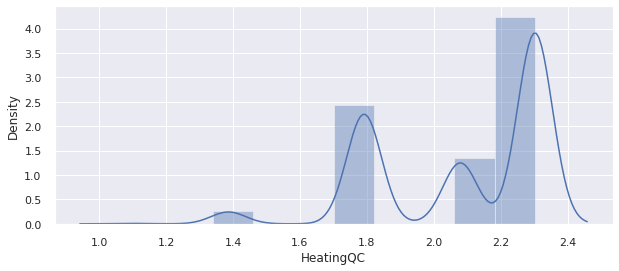

In [110]:
sns.set(rc={'figure.figsize':(10,4)})
#sns.distplot(df_cleaned["SalePrice"],kde=False,bins = 20)
sns.distplot(df_cleaned5["HeatingQC"],bins = 10)

In [111]:
df_cleaned6 = df_cleaned5.copy()
df_cleaned6.shape

(2908, 69)

### <font color="#2cb7b0" id="section_1_1">Cos(X)</font>

In [112]:
df_cleaned6['MoSold'].unique() # cyclical

array([ 2,  5,  9, 12, 10,  8, 11,  4,  1,  7,  3,  6])

In [113]:
df_cleaned6['MoSold'] = (-np.cos(0.5236 * df_cleaned6['MoSold']))

In [114]:
df_cleaned6['MoSold'].unique() # cyclical

array([-4.99997879e-01,  8.66028465e-01, -1.10196153e-05, -1.00000000e+00,
       -5.00010604e-01,  4.99991517e-01, -8.66032138e-01,  5.00004241e-01,
       -8.66024792e-01,  8.66021118e-01,  3.67320510e-06,  1.00000000e+00])

In [116]:
df_cleaned7 = df_cleaned6.copy()
df_cleaned7.shape

(2908, 69)

# <font color="#1d479b">Modelisation</font>

## <font color="#337da4">Encoding</font>

In [117]:
df_cleaned7 = df_cleaned7.drop(["SalePrice"], axis=1)
df_cleaned7.shape

(2908, 68)

In [118]:
# Check categoricals

for column in df_cleaned7.select_dtypes(include=['object']).columns:
    print(column, df_cleaned7[column].unique())
    #print(column, len(df_cleaned2[column].unique()))

MSSubClass ['60.0' '20.0' '70.0' '50.0' '190.0' '45.0' '90.0' '120.0' '30.0' '85.0'
 '80.0' '160.0' '75.0' '180.0' '40.0' '150.0']
MSZoning ['RL' 'RM' 'C' 'FV' 'RH']
Street ['Pave' 'Grvl']
Alley ['None' 'Grvl' 'Pave']
LotShape ['Reg' 'IR1' 'IR2' 'IR3']
LandContour ['Lvl' 'Bnk' 'Low' 'HLS']
Utilities ['AllPub' 'NoSeWa']
LotConfig ['Inside' 'FR2' 'Corner' 'CulDSac' 'FR3']
LandSlope ['Gtl' 'Mod' 'Sev']
Neighborhood ['CollgCr' 'Veenker' 'Crawfor' 'NoRidge' 'Mitchel' 'Somerst' 'NWAmes'
 'OldTown' 'BrkSide' 'Sawyer' 'NridgHt' 'NAmes' 'SawyerW' 'IDOTRR'
 'MeadowV' 'Edwards' 'Timber' 'Gilbert' 'StoneBr' 'ClearCr' 'NPkVill'
 'Blmngtn' 'BrDale' 'SWISU' 'Blueste']
Condition1 ['Norm' 'Feedr' 'PosN' 'Artery' 'RRAe' 'RRNn' 'RRAn' 'PosA' 'RRNe']
Condition2 ['Norm' 'Artery' 'RRNn' 'Feedr' 'PosA' 'PosN' 'RRAn' 'RRAe']
BldgType ['1Fam' '2fmCon' 'Duplex' 'TwnhsE' 'Twnhs']
HouseStyle ['2Story' '1Story' '1.5Fin' '1.5Unf' 'SFoyer' 'SLvl' '2.5Unf' '2.5Fin']
RoofStyle ['Gable' 'Hip' 'Gambrel' 'Mansard' 'Flat'

In [120]:
#for column in df_cleaned7.select_dtypes(include=['object']).columns:
    #print(column, df_cleaned3[column].unique())
    #print(column, len(df_cleaned7[column].unique()))

In [121]:
df_cleaned7 = pd.get_dummies(df_cleaned7, drop_first=True)    
df_cleaned7.shape

(2908, 254)

In [122]:
df_cleaned7.head()

,LotFrontage,LotArea,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,2ndFlrSF,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,GarageCars,WoodDeckSF,OpenPorchSF,3SsnPorch,ScreenPorch,MoSold,ExterQual,ExterCond,BsmtQual,BsmtExposure,HeatingQC,KitchenQual,FireplaceQu,GarageQual,PoolQC,SFPerRoom,TotOverall,TotBathrooms,TotFlrSF,TotPorchSF,MSSubClass_150.0,MSSubClass_160.0,MSSubClass_180.0,MSSubClass_190.0,MSSubClass_20.0,MSSubClass_30.0,MSSubClass_40.0,MSSubClass_45.0,MSSubClass_50.0,MSSubClass_60.0,MSSubClass_70.0,MSSubClass_75.0,MSSubClass_80.0,MSSubClass_85.0,MSSubClass_90.0,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_None,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_None,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_None,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_None,GarageFinish_None,GarageFinish_RFn,GarageFinish_Unf,PavedDrive_P,PavedDrive_Y,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_None,MiscFeature_None,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,BsmtFinType_ALQGLQ,BsmtFinType_ALQLwQ,BsmtFinType_ALQRec,BsmtFinType_ALQUnf,BsmtFinType_BLQALQ,BsmtFinType_BLQBLQ,BsmtFinType_BLQGLQ,BsmtFinType_BLQLwQ,BsmtFinType_BLQRec,BsmtFinType_BLQUnf,BsmtFinType_GLQALQ,BsmtFinType_GLQBLQ,BsmtFinType_GLQLwQ,BsmtFinType_GLQRec,BsmtFinType_GLQUnf,BsmtFinType_LwQALQ,BsmtFinType_LwQBLQ,BsmtFinType_LwQGLQ,BsmtFi

In [123]:
df_cleaned8 = df_cleaned7.copy()
df_cleaned8.shape

(2908, 254)

## <font color="#337da4">Normalisation</font>

In [124]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

scaler.fit(df_cleaned8)
df_cleaned8 = pd.DataFrame(scaler.transform(df_cleaned8), index=df_cleaned8.index, columns=df_cleaned8.columns)
print(df_cleaned8.shape)
df_cleaned8.head()

(2908, 254)


,LotFrontage,LotArea,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,2ndFlrSF,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,GarageCars,WoodDeckSF,OpenPorchSF,3SsnPorch,ScreenPorch,MoSold,ExterQual,ExterCond,BsmtQual,BsmtExposure,HeatingQC,KitchenQual,FireplaceQu,GarageQual,PoolQC,SFPerRoom,TotOverall,TotBathrooms,TotFlrSF,TotPorchSF,MSSubClass_150.0,MSSubClass_160.0,MSSubClass_180.0,MSSubClass_190.0,MSSubClass_20.0,MSSubClass_30.0,MSSubClass_40.0,MSSubClass_45.0,MSSubClass_50.0,MSSubClass_60.0,MSSubClass_70.0,MSSubClass_75.0,MSSubClass_80.0,MSSubClass_85.0,MSSubClass_90.0,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_None,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_None,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_None,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_None,GarageFinish_None,GarageFinish_RFn,GarageFinish_Unf,PavedDrive_P,PavedDrive_Y,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_None,MiscFeature_None,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,BsmtFinType_ALQGLQ,BsmtFinType_ALQLwQ,BsmtFinType_ALQRec,BsmtFinType_ALQUnf,BsmtFinType_BLQALQ,BsmtFinType_BLQBLQ,BsmtFinType_BLQGLQ,BsmtFinType_BLQLwQ,BsmtFinType_BLQRec,BsmtFinType_BLQUnf,BsmtFinType_GLQALQ,BsmtFinType_GLQBLQ,BsmtFinType_GLQLwQ,BsmtFinType_GLQRec,BsmtFinType_GLQUnf,BsmtFinType_LwQALQ,BsmtFinType_LwQBLQ,BsmtFinType_LwQGLQ,BsmtFi

## <font color="#337da4">PCA</font>

In [125]:
from sklearn.decomposition import PCA

X = df_cleaned8.values

pca= PCA(n_components=0.8)
X_pca = pca.fit_transform(X)
print(X_pca.shape)  # 110 news variables
X_f = np.concatenate((X,X_pca),axis=1)

(2908, 110)


In [144]:
X_f.shape

(2908, 364)

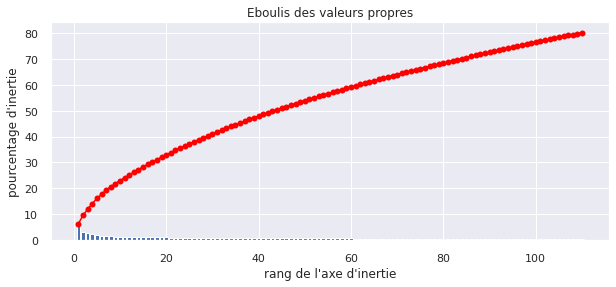

In [126]:
from functions import * 

# 80% of total inertia explained by 110 variables

display_scree_plot(pca)

### <font color="#2cb7b0" id="section_1_1">Rename columns</font>

In [145]:
# Rename selected columns
df_X = pd.DataFrame(X_f)
#df_X.loc[:,0:253].head() 

dictionary = {}
new_name = df_cleaned8.columns.to_list()

for i in range(len(df_X.loc[:,0:253].columns.to_list())):
               
    new_name = df_cleaned8.columns.to_list()
    column = df_X.loc[:,0:253].columns.to_list()[i]
    dictionary[column] = new_name[i]
               
dictionary               

{0: 'LotFrontage',
 1: 'LotArea',
 2: 'OverallQual',
 3: 'YearBuilt',
 4: 'YearRemodAdd',
 5: 'MasVnrArea',
 6: 'BsmtFinSF1',
 7: 'BsmtUnfSF',
 8: 'TotalBsmtSF',
 9: '2ndFlrSF',
 10: 'BsmtFullBath',
 11: 'FullBath',
 12: 'HalfBath',
 13: 'BedroomAbvGr',
 14: 'GarageCars',
 15: 'WoodDeckSF',
 16: 'OpenPorchSF',
 17: '3SsnPorch',
 18: 'ScreenPorch',
 19: 'MoSold',
 20: 'ExterQual',
 21: 'ExterCond',
 22: 'BsmtQual',
 23: 'BsmtExposure',
 24: 'HeatingQC',
 25: 'KitchenQual',
 26: 'FireplaceQu',
 27: 'GarageQual',
 28: 'PoolQC',
 29: 'SFPerRoom',
 30: 'TotOverall',
 31: 'TotBathrooms',
 32: 'TotFlrSF',
 33: 'TotPorchSF',
 34: 'MSSubClass_150.0',
 35: 'MSSubClass_160.0',
 36: 'MSSubClass_180.0',
 37: 'MSSubClass_190.0',
 38: 'MSSubClass_20.0',
 39: 'MSSubClass_30.0',
 40: 'MSSubClass_40.0',
 41: 'MSSubClass_45.0',
 42: 'MSSubClass_50.0',
 43: 'MSSubClass_60.0',
 44: 'MSSubClass_70.0',
 45: 'MSSubClass_75.0',
 46: 'MSSubClass_80.0',
 47: 'MSSubClass_85.0',
 48: 'MSSubClass_90.0',
 49: 'MSZon

In [146]:
df_X.rename(columns=dictionary,
          inplace=True)

In [147]:
df_X.head()

,LotFrontage,LotArea,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,2ndFlrSF,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,GarageCars,WoodDeckSF,OpenPorchSF,3SsnPorch,ScreenPorch,MoSold,ExterQual,ExterCond,BsmtQual,BsmtExposure,HeatingQC,KitchenQual,FireplaceQu,GarageQual,PoolQC,SFPerRoom,TotOverall,TotBathrooms,TotFlrSF,TotPorchSF,MSSubClass_150.0,MSSubClass_160.0,MSSubClass_180.0,MSSubClass_190.0,MSSubClass_20.0,MSSubClass_30.0,MSSubClass_40.0,MSSubClass_45.0,MSSubClass_50.0,MSSubClass_60.0,MSSubClass_70.0,MSSubClass_75.0,MSSubClass_80.0,MSSubClass_85.0,MSSubClass_90.0,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_None,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_None,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_None,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_None,GarageFinish_None,GarageFinish_RFn,GarageFinish_Unf,PavedDrive_P,PavedDrive_Y,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_None,MiscFeature_None,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,BsmtFinType_ALQGLQ,BsmtFinType_ALQLwQ,BsmtFinType_ALQRec,BsmtFinType_ALQUnf,BsmtFinType_BLQALQ,BsmtFinType_BLQBLQ,BsmtFinType_BLQGLQ,BsmtFinType_BLQLwQ,BsmtFinType_BLQRec,BsmtFinType_BLQUnf,BsmtFinType_GLQALQ,BsmtFinType_GLQBLQ,BsmtFinType_GLQLwQ,BsmtFinType_GLQRec,BsmtFinType_GLQUnf,BsmtFinType_LwQALQ,BsmtFinType_LwQBLQ,BsmtFinType_LwQGLQ,BsmtFi

In [148]:
df_final = df_X.copy()
df_final.shape

(2908, 364)

## <font color="#337da4">Log(y)</font>

In [149]:
y = df_cleaned6['SalePrice']
y

Id
1       208500.0
2       181500.0
3       223500.0
4       140000.0
5       250000.0
          ...   
2915         NaN
2916         NaN
2917         NaN
2918         NaN
2919         NaN
Name: SalePrice, Length: 2908, dtype: float64

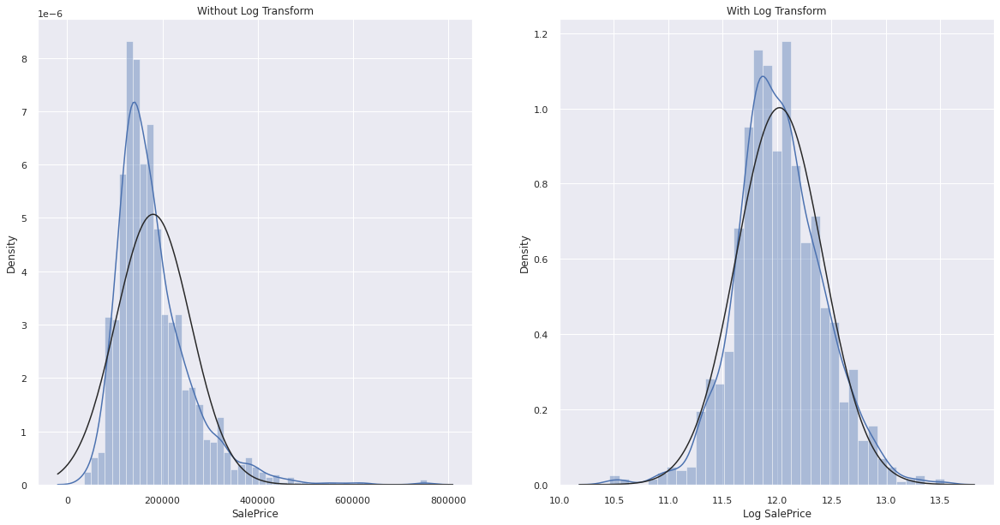

In [150]:
plt.figure(figsize=(20, 10))

y = df_cleaned6['SalePrice']

plt.subplot(1, 2, 1)
sns.distplot(y, kde=True, fit=scipy.stats.norm)
plt.title("Without Log Transform")

# Log transformation
plt.subplot(1, 2, 2)
sns.distplot(np.log(y), kde=True, fit=scipy.stats.norm)
plt.xlabel("Log SalePrice")
plt.title("With Log Transform")

plt.show()

In [151]:
log_y = np.log(y)
log_y

Id
1       12.25
2       12.11
3       12.32
4       11.85
5       12.43
        ...  
2915      NaN
2916      NaN
2917      NaN
2918      NaN
2919      NaN
Name: SalePrice, Length: 2908, dtype: float64

## <font color="#337da4">Split the data</font>

In [153]:
print(df_final.shape)
df_finals = np.split(df_final, [1449], axis=0)

print(df_finals[0].shape)
df_finals[0]

(2908, 364)
(1449, 364)


,LotFrontage,LotArea,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,2ndFlrSF,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,GarageCars,WoodDeckSF,OpenPorchSF,3SsnPorch,ScreenPorch,MoSold,ExterQual,ExterCond,BsmtQual,BsmtExposure,HeatingQC,KitchenQual,FireplaceQu,GarageQual,PoolQC,SFPerRoom,TotOverall,TotBathrooms,TotFlrSF,TotPorchSF,MSSubClass_150.0,MSSubClass_160.0,MSSubClass_180.0,MSSubClass_190.0,MSSubClass_20.0,MSSubClass_30.0,MSSubClass_40.0,MSSubClass_45.0,MSSubClass_50.0,MSSubClass_60.0,MSSubClass_70.0,MSSubClass_75.0,MSSubClass_80.0,MSSubClass_85.0,MSSubClass_90.0,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_None,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_None,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_None,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_None,GarageFinish_None,GarageFinish_RFn,GarageFinish_Unf,PavedDrive_P,PavedDrive_Y,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_None,MiscFeature_None,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,BsmtFinType_ALQGLQ,BsmtFinType_ALQLwQ,BsmtFinType_ALQRec,BsmtFinType_ALQUnf,BsmtFinType_BLQALQ,BsmtFinType_BLQBLQ,BsmtFinType_BLQGLQ,BsmtFinType_BLQLwQ,BsmtFinType_BLQRec,BsmtFinType_BLQUnf,BsmtFinType_GLQALQ,BsmtFinType_GLQBLQ,BsmtFinType_GLQLwQ,BsmtFinType_GLQRec,BsmtFinType_GLQUnf,BsmtFinType_LwQALQ,BsmtFinType_LwQBLQ,BsmtFinType_LwQGLQ,BsmtFi

In [154]:
print(df_finals[1].shape)
df_finals[1]

(1459, 364)


,LotFrontage,LotArea,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,2ndFlrSF,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,GarageCars,WoodDeckSF,OpenPorchSF,3SsnPorch,ScreenPorch,MoSold,ExterQual,ExterCond,BsmtQual,BsmtExposure,HeatingQC,KitchenQual,FireplaceQu,GarageQual,PoolQC,SFPerRoom,TotOverall,TotBathrooms,TotFlrSF,TotPorchSF,MSSubClass_150.0,MSSubClass_160.0,MSSubClass_180.0,MSSubClass_190.0,MSSubClass_20.0,MSSubClass_30.0,MSSubClass_40.0,MSSubClass_45.0,MSSubClass_50.0,MSSubClass_60.0,MSSubClass_70.0,MSSubClass_75.0,MSSubClass_80.0,MSSubClass_85.0,MSSubClass_90.0,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_None,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_None,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_None,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_None,GarageFinish_None,GarageFinish_RFn,GarageFinish_Unf,PavedDrive_P,PavedDrive_Y,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_None,MiscFeature_None,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,BsmtFinType_ALQGLQ,BsmtFinType_ALQLwQ,BsmtFinType_ALQRec,BsmtFinType_ALQUnf,BsmtFinType_BLQALQ,BsmtFinType_BLQBLQ,BsmtFinType_BLQGLQ,BsmtFinType_BLQLwQ,BsmtFinType_BLQRec,BsmtFinType_BLQUnf,BsmtFinType_GLQALQ,BsmtFinType_GLQBLQ,BsmtFinType_GLQLwQ,BsmtFinType_GLQRec,BsmtFinType_GLQUnf,BsmtFinType_LwQALQ,BsmtFinType_LwQBLQ,BsmtFinType_LwQGLQ,BsmtFi

## <font color="#337da4">Models Comparison</font>

In [155]:
log_y = log_y.reset_index() #first index line = 0 in place of 1
log_ys=np.split(log_y, [1449], axis=0)
log_ys[0]["SalePrice"]

0       12.25
1       12.11
2       12.32
3       11.85
4       12.43
        ...  
1444    12.07
1445    12.25
1446    12.49
1447    11.86
1448    11.90
Name: SalePrice, Length: 1449, dtype: float64

In [156]:
data = pd.concat([df_finals[0], log_ys[0]["SalePrice"]], axis=1)
print(data.shape)
data.head()

(1449, 365)


,LotFrontage,LotArea,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,2ndFlrSF,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,GarageCars,WoodDeckSF,OpenPorchSF,3SsnPorch,ScreenPorch,MoSold,ExterQual,ExterCond,BsmtQual,BsmtExposure,HeatingQC,KitchenQual,FireplaceQu,GarageQual,PoolQC,SFPerRoom,TotOverall,TotBathrooms,TotFlrSF,TotPorchSF,MSSubClass_150.0,MSSubClass_160.0,MSSubClass_180.0,MSSubClass_190.0,MSSubClass_20.0,MSSubClass_30.0,MSSubClass_40.0,MSSubClass_45.0,MSSubClass_50.0,MSSubClass_60.0,MSSubClass_70.0,MSSubClass_75.0,MSSubClass_80.0,MSSubClass_85.0,MSSubClass_90.0,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_None,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_None,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_None,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_None,GarageFinish_None,GarageFinish_RFn,GarageFinish_Unf,PavedDrive_P,PavedDrive_Y,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_None,MiscFeature_None,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,BsmtFinType_ALQGLQ,BsmtFinType_ALQLwQ,BsmtFinType_ALQRec,BsmtFinType_ALQUnf,BsmtFinType_BLQALQ,BsmtFinType_BLQBLQ,BsmtFinType_BLQGLQ,BsmtFinType_BLQLwQ,BsmtFinType_BLQRec,BsmtFinType_BLQUnf,BsmtFinType_GLQALQ,BsmtFinType_GLQBLQ,BsmtFinType_GLQLwQ,BsmtFinType_GLQRec,BsmtFinType_GLQUnf,BsmtFinType_LwQALQ,BsmtFinType_LwQBLQ,BsmtFinType_LwQGLQ,BsmtFi

In [157]:
data.tail()

,LotFrontage,LotArea,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,2ndFlrSF,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,GarageCars,WoodDeckSF,OpenPorchSF,3SsnPorch,ScreenPorch,MoSold,ExterQual,ExterCond,BsmtQual,BsmtExposure,HeatingQC,KitchenQual,FireplaceQu,GarageQual,PoolQC,SFPerRoom,TotOverall,TotBathrooms,TotFlrSF,TotPorchSF,MSSubClass_150.0,MSSubClass_160.0,MSSubClass_180.0,MSSubClass_190.0,MSSubClass_20.0,MSSubClass_30.0,MSSubClass_40.0,MSSubClass_45.0,MSSubClass_50.0,MSSubClass_60.0,MSSubClass_70.0,MSSubClass_75.0,MSSubClass_80.0,MSSubClass_85.0,MSSubClass_90.0,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_None,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_None,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_None,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_None,GarageFinish_None,GarageFinish_RFn,GarageFinish_Unf,PavedDrive_P,PavedDrive_Y,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_None,MiscFeature_None,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,BsmtFinType_ALQGLQ,BsmtFinType_ALQLwQ,BsmtFinType_ALQRec,BsmtFinType_ALQUnf,BsmtFinType_BLQALQ,BsmtFinType_BLQBLQ,BsmtFinType_BLQGLQ,BsmtFinType_BLQLwQ,BsmtFinType_BLQRec,BsmtFinType_BLQUnf,BsmtFinType_GLQALQ,BsmtFinType_GLQBLQ,BsmtFinType_GLQLwQ,BsmtFinType_GLQRec,BsmtFinType_GLQUnf,BsmtFinType_LwQALQ,BsmtFinType_LwQBLQ,BsmtFinType_LwQGLQ,BsmtFi

In [ ]:
compare_models()

In [790]:
models ={
    "catboost": CatBoostRegressor(),
    "gbr": GradientBoostingRegressor(),
    "br": BayesianRidge(),
    "ridge": Ridge(),
    "lightgbm": LGBMRegressor()
    #"xgboost": XGBRegressor(),
    #"et": ExtraTreesRegressor(),
    #"knn": KNeighborsRegressor(),
    #"omp": OrthogonalMatchingPursuit()
}
#models.append(('CBR', CatBoostRegressor(verbose=0)))
#models.append(('CBR', CatBoostRegressor(verbose=0)))

# Evaluate each model in turn
result_cv_r2 = []
result_cv_mae = []
result_cv_mse = []
result_cv_rmse = []
result_cv_rmsle = []
names = []

for name, model in models.items():
    
    model.fit(df_finals[0],  log_ys[0]["SalePrice"])
    seed = 13
    kfold = KFold(n_splits=10, shuffle=True, random_state=seed) 
    
    # Cross Validation Scoring on Train
    cv_r2 = cross_val_score(model, df_finals[0],  log_ys[0]["SalePrice"], cv=kfold, scoring='r2')
    cv_mae = cross_val_score(model, df_finals[0], log_ys[0]["SalePrice"], cv=kfold, scoring='neg_mean_absolute_error')
    cv_mse = cross_val_score(model,df_finals[0],  log_ys[0]["SalePrice"], cv=kfold, scoring='neg_mean_squared_error')
    cv_rmse = cross_val_score(model,  df_finals[0],  log_ys[0]["SalePrice"], cv=kfold, scoring='neg_root_mean_squared_error')
    cv_rmsle = cross_val_score(model,  df_finals[0],  log_ys[0]["SalePrice"], cv=kfold, scoring='neg_mean_squared_log_error')
    
    
    result_cv_r2.append(cv_r2)
    result_cv_mae.append(cv_mae)
    result_cv_mse.append(cv_mse)
    result_cv_rmse.append(cv_rmse)
    result_cv_rmsle.append(cv_rmsle)
    
    names.append(name)
    
    print('%s cv_rmsle: mean =  %f std = %f' % (name, -cv_rmsle.mean(), cv_rmsle.std()))
    print('%s cv_rmse: mean =  %f std = %f' % (name, -cv_rmse.mean(), cv_rmse.std()))
    
    print('%s cv_mae : mean =  %f std = %f' % (name, -cv_mae.mean(), cv_mae.std()))
    print('%s cv_mse : mean =  %f std = %f' % (name, -cv_mse.mean(), cv_mse.std()))
    
    print('%s cv_r2  : mean =  %f std = %f' % (name, cv_r2.mean(), cv_r2.std()))
    
    print('%s cv_rmse: average error =  %f' % (name, np.exp(-cv_rmse.mean())))    

Learning rate set to 0.043414
0:	learn: 0.3867934	total: 5.45ms	remaining: 5.44s
1:	learn: 0.3756039	total: 10.7ms	remaining: 5.34s
2:	learn: 0.3656396	total: 15.8ms	remaining: 5.26s
3:	learn: 0.3567681	total: 21ms	remaining: 5.24s
4:	learn: 0.3478197	total: 26.7ms	remaining: 5.31s
5:	learn: 0.3386746	total: 32.5ms	remaining: 5.39s
6:	learn: 0.3299626	total: 37.9ms	remaining: 5.38s
7:	learn: 0.3217978	total: 43.2ms	remaining: 5.35s
8:	learn: 0.3143819	total: 48.4ms	remaining: 5.33s
9:	learn: 0.3059662	total: 54.6ms	remaining: 5.41s
10:	learn: 0.2984548	total: 60.1ms	remaining: 5.4s
11:	learn: 0.2916967	total: 67.8ms	remaining: 5.58s
12:	learn: 0.2841709	total: 73.2ms	remaining: 5.56s
13:	learn: 0.2776043	total: 78.5ms	remaining: 5.53s
14:	learn: 0.2706964	total: 83.5ms	remaining: 5.48s
15:	learn: 0.2642070	total: 88.4ms	remaining: 5.44s
16:	learn: 0.2589142	total: 93.9ms	remaining: 5.43s
17:	learn: 0.2528583	total: 98.8ms	remaining: 5.39s
18:	learn: 0.2474690	total: 104ms	remaining: 5.

196:	learn: 0.0864652	total: 1s	remaining: 4.09s
197:	learn: 0.0862487	total: 1.01s	remaining: 4.09s
198:	learn: 0.0859296	total: 1.01s	remaining: 4.09s
199:	learn: 0.0857050	total: 1.02s	remaining: 4.08s
200:	learn: 0.0854747	total: 1.02s	remaining: 4.08s
201:	learn: 0.0852773	total: 1.03s	remaining: 4.07s
202:	learn: 0.0851239	total: 1.04s	remaining: 4.07s
203:	learn: 0.0849230	total: 1.04s	remaining: 4.06s
204:	learn: 0.0847421	total: 1.05s	remaining: 4.06s
205:	learn: 0.0845299	total: 1.05s	remaining: 4.05s
206:	learn: 0.0843136	total: 1.06s	remaining: 4.04s
207:	learn: 0.0841735	total: 1.06s	remaining: 4.04s
208:	learn: 0.0839800	total: 1.06s	remaining: 4.03s
209:	learn: 0.0837999	total: 1.07s	remaining: 4.03s
210:	learn: 0.0836894	total: 1.07s	remaining: 4.02s
211:	learn: 0.0834975	total: 1.08s	remaining: 4.01s
212:	learn: 0.0833078	total: 1.08s	remaining: 4.01s
213:	learn: 0.0832032	total: 1.09s	remaining: 4s
214:	learn: 0.0830447	total: 1.09s	remaining: 4s
215:	learn: 0.0828715

393:	learn: 0.0560909	total: 2s	remaining: 3.08s
394:	learn: 0.0560241	total: 2.01s	remaining: 3.07s
395:	learn: 0.0558818	total: 2.01s	remaining: 3.07s
396:	learn: 0.0557697	total: 2.02s	remaining: 3.06s
397:	learn: 0.0556952	total: 2.02s	remaining: 3.06s
398:	learn: 0.0555657	total: 2.03s	remaining: 3.05s
399:	learn: 0.0554318	total: 2.03s	remaining: 3.05s
400:	learn: 0.0553403	total: 2.04s	remaining: 3.04s
401:	learn: 0.0551791	total: 2.04s	remaining: 3.04s
402:	learn: 0.0550928	total: 2.05s	remaining: 3.03s
403:	learn: 0.0549260	total: 2.05s	remaining: 3.03s
404:	learn: 0.0548097	total: 2.06s	remaining: 3.02s
405:	learn: 0.0546749	total: 2.06s	remaining: 3.02s
406:	learn: 0.0545466	total: 2.07s	remaining: 3.01s
407:	learn: 0.0544052	total: 2.07s	remaining: 3.01s
408:	learn: 0.0542992	total: 2.08s	remaining: 3s
409:	learn: 0.0541794	total: 2.08s	remaining: 3s
410:	learn: 0.0540590	total: 2.09s	remaining: 2.99s
411:	learn: 0.0539413	total: 2.09s	remaining: 2.98s
412:	learn: 0.0538480

552:	learn: 0.0403476	total: 2.8s	remaining: 2.26s
553:	learn: 0.0402471	total: 2.81s	remaining: 2.26s
554:	learn: 0.0401617	total: 2.81s	remaining: 2.25s
555:	learn: 0.0400473	total: 2.82s	remaining: 2.25s
556:	learn: 0.0399923	total: 2.82s	remaining: 2.25s
557:	learn: 0.0398878	total: 2.83s	remaining: 2.24s
558:	learn: 0.0398136	total: 2.83s	remaining: 2.23s
559:	learn: 0.0397531	total: 2.84s	remaining: 2.23s
560:	learn: 0.0396596	total: 2.84s	remaining: 2.22s
561:	learn: 0.0396069	total: 2.85s	remaining: 2.22s
562:	learn: 0.0395056	total: 2.85s	remaining: 2.21s
563:	learn: 0.0394300	total: 2.86s	remaining: 2.21s
564:	learn: 0.0393246	total: 2.86s	remaining: 2.2s
565:	learn: 0.0392331	total: 2.87s	remaining: 2.2s
566:	learn: 0.0391446	total: 2.87s	remaining: 2.19s
567:	learn: 0.0390249	total: 2.88s	remaining: 2.19s
568:	learn: 0.0389512	total: 2.88s	remaining: 2.18s
569:	learn: 0.0388792	total: 2.89s	remaining: 2.18s
570:	learn: 0.0387843	total: 2.89s	remaining: 2.17s
571:	learn: 0.0

748:	learn: 0.0273221	total: 3.79s	remaining: 1.27s
749:	learn: 0.0273011	total: 3.8s	remaining: 1.27s
750:	learn: 0.0272528	total: 3.81s	remaining: 1.26s
751:	learn: 0.0272070	total: 3.81s	remaining: 1.26s
752:	learn: 0.0271676	total: 3.81s	remaining: 1.25s
753:	learn: 0.0271025	total: 3.82s	remaining: 1.25s
754:	learn: 0.0270624	total: 3.83s	remaining: 1.24s
755:	learn: 0.0269708	total: 3.83s	remaining: 1.24s
756:	learn: 0.0269228	total: 3.84s	remaining: 1.23s
757:	learn: 0.0268747	total: 3.84s	remaining: 1.23s
758:	learn: 0.0268156	total: 3.85s	remaining: 1.22s
759:	learn: 0.0267642	total: 3.85s	remaining: 1.22s
760:	learn: 0.0267126	total: 3.86s	remaining: 1.21s
761:	learn: 0.0266763	total: 3.86s	remaining: 1.21s
762:	learn: 0.0266184	total: 3.87s	remaining: 1.2s
763:	learn: 0.0265598	total: 3.87s	remaining: 1.2s
764:	learn: 0.0265377	total: 3.88s	remaining: 1.19s
765:	learn: 0.0264963	total: 3.88s	remaining: 1.19s
766:	learn: 0.0264308	total: 3.89s	remaining: 1.18s
767:	learn: 0.0

943:	learn: 0.0187713	total: 4.78s	remaining: 284ms
944:	learn: 0.0187183	total: 4.79s	remaining: 279ms
945:	learn: 0.0186910	total: 4.79s	remaining: 274ms
946:	learn: 0.0186535	total: 4.8s	remaining: 269ms
947:	learn: 0.0186153	total: 4.8s	remaining: 264ms
948:	learn: 0.0185986	total: 4.81s	remaining: 258ms
949:	learn: 0.0185672	total: 4.81s	remaining: 253ms
950:	learn: 0.0185397	total: 4.82s	remaining: 248ms
951:	learn: 0.0184884	total: 4.83s	remaining: 243ms
952:	learn: 0.0184488	total: 4.83s	remaining: 238ms
953:	learn: 0.0184286	total: 4.83s	remaining: 233ms
954:	learn: 0.0183893	total: 4.84s	remaining: 228ms
955:	learn: 0.0183572	total: 4.84s	remaining: 223ms
956:	learn: 0.0183100	total: 4.85s	remaining: 218ms
957:	learn: 0.0182705	total: 4.85s	remaining: 213ms
958:	learn: 0.0182386	total: 4.86s	remaining: 208ms
959:	learn: 0.0182131	total: 4.87s	remaining: 203ms
960:	learn: 0.0181787	total: 4.87s	remaining: 198ms
961:	learn: 0.0181295	total: 4.88s	remaining: 193ms
962:	learn: 0.

112:	learn: 0.1060968	total: 605ms	remaining: 4.75s
113:	learn: 0.1055786	total: 611ms	remaining: 4.74s
114:	learn: 0.1052694	total: 616ms	remaining: 4.74s
115:	learn: 0.1049843	total: 621ms	remaining: 4.74s
116:	learn: 0.1045792	total: 627ms	remaining: 4.73s
117:	learn: 0.1042662	total: 632ms	remaining: 4.72s
118:	learn: 0.1038936	total: 637ms	remaining: 4.72s
119:	learn: 0.1036052	total: 643ms	remaining: 4.71s
120:	learn: 0.1032750	total: 648ms	remaining: 4.71s
121:	learn: 0.1030140	total: 653ms	remaining: 4.7s
122:	learn: 0.1027336	total: 658ms	remaining: 4.69s
123:	learn: 0.1024175	total: 664ms	remaining: 4.69s
124:	learn: 0.1021426	total: 669ms	remaining: 4.68s
125:	learn: 0.1018692	total: 674ms	remaining: 4.67s
126:	learn: 0.1014926	total: 679ms	remaining: 4.67s
127:	learn: 0.1011941	total: 684ms	remaining: 4.66s
128:	learn: 0.1009261	total: 689ms	remaining: 4.65s
129:	learn: 0.1005717	total: 695ms	remaining: 4.65s
130:	learn: 0.1001445	total: 700ms	remaining: 4.64s
131:	learn: 0

300:	learn: 0.0666015	total: 1.6s	remaining: 3.71s
301:	learn: 0.0664433	total: 1.6s	remaining: 3.71s
302:	learn: 0.0663340	total: 1.61s	remaining: 3.7s
303:	learn: 0.0661509	total: 1.61s	remaining: 3.7s
304:	learn: 0.0659164	total: 1.62s	remaining: 3.69s
305:	learn: 0.0658047	total: 1.63s	remaining: 3.69s
306:	learn: 0.0656281	total: 1.63s	remaining: 3.68s
307:	learn: 0.0655149	total: 1.64s	remaining: 3.68s
308:	learn: 0.0653678	total: 1.64s	remaining: 3.67s
309:	learn: 0.0652103	total: 1.65s	remaining: 3.67s
310:	learn: 0.0650540	total: 1.65s	remaining: 3.66s
311:	learn: 0.0650278	total: 1.66s	remaining: 3.65s
312:	learn: 0.0648742	total: 1.66s	remaining: 3.65s
313:	learn: 0.0646995	total: 1.67s	remaining: 3.64s
314:	learn: 0.0645931	total: 1.67s	remaining: 3.64s
315:	learn: 0.0644563	total: 1.68s	remaining: 3.63s
316:	learn: 0.0643467	total: 1.68s	remaining: 3.63s
317:	learn: 0.0641603	total: 1.69s	remaining: 3.62s
318:	learn: 0.0640173	total: 1.69s	remaining: 3.62s
319:	learn: 0.06

484:	learn: 0.0440846	total: 2.6s	remaining: 2.76s
485:	learn: 0.0440185	total: 2.6s	remaining: 2.75s
486:	learn: 0.0439063	total: 2.61s	remaining: 2.75s
487:	learn: 0.0437812	total: 2.62s	remaining: 2.74s
488:	learn: 0.0436721	total: 2.62s	remaining: 2.74s
489:	learn: 0.0435792	total: 2.63s	remaining: 2.73s
490:	learn: 0.0435693	total: 2.63s	remaining: 2.73s
491:	learn: 0.0434620	total: 2.64s	remaining: 2.72s
492:	learn: 0.0433904	total: 2.64s	remaining: 2.72s
493:	learn: 0.0433109	total: 2.65s	remaining: 2.71s
494:	learn: 0.0432375	total: 2.65s	remaining: 2.71s
495:	learn: 0.0431671	total: 2.66s	remaining: 2.7s
496:	learn: 0.0430979	total: 2.66s	remaining: 2.69s
497:	learn: 0.0430053	total: 2.67s	remaining: 2.69s
498:	learn: 0.0429211	total: 2.67s	remaining: 2.68s
499:	learn: 0.0428046	total: 2.68s	remaining: 2.68s
500:	learn: 0.0427174	total: 2.68s	remaining: 2.67s
501:	learn: 0.0426302	total: 2.69s	remaining: 2.67s
502:	learn: 0.0425935	total: 2.69s	remaining: 2.66s
503:	learn: 0.0

666:	learn: 0.0299471	total: 3.59s	remaining: 1.79s
667:	learn: 0.0298633	total: 3.6s	remaining: 1.79s
668:	learn: 0.0298452	total: 3.6s	remaining: 1.78s
669:	learn: 0.0297741	total: 3.61s	remaining: 1.78s
670:	learn: 0.0296926	total: 3.62s	remaining: 1.77s
671:	learn: 0.0296264	total: 3.62s	remaining: 1.77s
672:	learn: 0.0295354	total: 3.63s	remaining: 1.76s
673:	learn: 0.0294689	total: 3.63s	remaining: 1.76s
674:	learn: 0.0293898	total: 3.64s	remaining: 1.75s
675:	learn: 0.0293516	total: 3.64s	remaining: 1.75s
676:	learn: 0.0292843	total: 3.65s	remaining: 1.74s
677:	learn: 0.0292255	total: 3.65s	remaining: 1.74s
678:	learn: 0.0291552	total: 3.66s	remaining: 1.73s
679:	learn: 0.0291132	total: 3.67s	remaining: 1.72s
680:	learn: 0.0290272	total: 3.67s	remaining: 1.72s
681:	learn: 0.0289334	total: 3.68s	remaining: 1.71s
682:	learn: 0.0288636	total: 3.68s	remaining: 1.71s
683:	learn: 0.0287906	total: 3.69s	remaining: 1.7s
684:	learn: 0.0287246	total: 3.69s	remaining: 1.7s
685:	learn: 0.02

854:	learn: 0.0205710	total: 4.59s	remaining: 778ms
855:	learn: 0.0205213	total: 4.59s	remaining: 773ms
856:	learn: 0.0204852	total: 4.6s	remaining: 768ms
857:	learn: 0.0204689	total: 4.61s	remaining: 762ms
858:	learn: 0.0204481	total: 4.61s	remaining: 757ms
859:	learn: 0.0203975	total: 4.62s	remaining: 752ms
860:	learn: 0.0203709	total: 4.62s	remaining: 746ms
861:	learn: 0.0203312	total: 4.63s	remaining: 741ms
862:	learn: 0.0203276	total: 4.63s	remaining: 735ms
863:	learn: 0.0202779	total: 4.64s	remaining: 730ms
864:	learn: 0.0202230	total: 4.64s	remaining: 725ms
865:	learn: 0.0201731	total: 4.65s	remaining: 719ms
866:	learn: 0.0201286	total: 4.65s	remaining: 714ms
867:	learn: 0.0200755	total: 4.66s	remaining: 709ms
868:	learn: 0.0200316	total: 4.66s	remaining: 703ms
869:	learn: 0.0199853	total: 4.67s	remaining: 698ms
870:	learn: 0.0199298	total: 4.67s	remaining: 692ms
871:	learn: 0.0199273	total: 4.68s	remaining: 687ms
872:	learn: 0.0198826	total: 4.68s	remaining: 682ms
873:	learn: 0

36:	learn: 0.1796227	total: 195ms	remaining: 5.07s
37:	learn: 0.1769761	total: 201ms	remaining: 5.08s
38:	learn: 0.1743164	total: 206ms	remaining: 5.08s
39:	learn: 0.1719488	total: 211ms	remaining: 5.07s
40:	learn: 0.1693922	total: 218ms	remaining: 5.09s
41:	learn: 0.1670955	total: 223ms	remaining: 5.08s
42:	learn: 0.1648514	total: 228ms	remaining: 5.07s
43:	learn: 0.1628417	total: 233ms	remaining: 5.07s
44:	learn: 0.1605992	total: 239ms	remaining: 5.06s
45:	learn: 0.1584379	total: 244ms	remaining: 5.05s
46:	learn: 0.1566975	total: 249ms	remaining: 5.04s
47:	learn: 0.1549889	total: 254ms	remaining: 5.03s
48:	learn: 0.1529676	total: 259ms	remaining: 5.02s
49:	learn: 0.1514648	total: 264ms	remaining: 5.02s
50:	learn: 0.1501107	total: 269ms	remaining: 5.01s
51:	learn: 0.1486529	total: 275ms	remaining: 5.01s
52:	learn: 0.1472620	total: 280ms	remaining: 5s
53:	learn: 0.1457072	total: 285ms	remaining: 5s
54:	learn: 0.1443068	total: 291ms	remaining: 5s
55:	learn: 0.1429847	total: 297ms	remain

210:	learn: 0.0824016	total: 1.19s	remaining: 4.43s
211:	learn: 0.0822326	total: 1.19s	remaining: 4.43s
212:	learn: 0.0819885	total: 1.2s	remaining: 4.42s
213:	learn: 0.0817622	total: 1.2s	remaining: 4.42s
214:	learn: 0.0816159	total: 1.21s	remaining: 4.42s
215:	learn: 0.0813131	total: 1.22s	remaining: 4.41s
216:	learn: 0.0811121	total: 1.22s	remaining: 4.41s
217:	learn: 0.0809431	total: 1.23s	remaining: 4.4s
218:	learn: 0.0807787	total: 1.23s	remaining: 4.39s
219:	learn: 0.0804917	total: 1.24s	remaining: 4.39s
220:	learn: 0.0802436	total: 1.24s	remaining: 4.38s
221:	learn: 0.0800624	total: 1.25s	remaining: 4.38s
222:	learn: 0.0797972	total: 1.25s	remaining: 4.37s
223:	learn: 0.0796387	total: 1.26s	remaining: 4.36s
224:	learn: 0.0795274	total: 1.26s	remaining: 4.36s
225:	learn: 0.0793435	total: 1.27s	remaining: 4.35s
226:	learn: 0.0791654	total: 1.28s	remaining: 4.35s
227:	learn: 0.0790495	total: 1.28s	remaining: 4.34s
228:	learn: 0.0789381	total: 1.29s	remaining: 4.33s
229:	learn: 0.0

389:	learn: 0.0554945	total: 2.18s	remaining: 3.41s
390:	learn: 0.0553743	total: 2.18s	remaining: 3.4s
391:	learn: 0.0552717	total: 2.19s	remaining: 3.4s
392:	learn: 0.0551029	total: 2.2s	remaining: 3.39s
393:	learn: 0.0549463	total: 2.2s	remaining: 3.39s
394:	learn: 0.0547598	total: 2.21s	remaining: 3.38s
395:	learn: 0.0546607	total: 2.21s	remaining: 3.38s
396:	learn: 0.0545555	total: 2.22s	remaining: 3.37s
397:	learn: 0.0544318	total: 2.23s	remaining: 3.37s
398:	learn: 0.0543509	total: 2.23s	remaining: 3.36s
399:	learn: 0.0542073	total: 2.24s	remaining: 3.36s
400:	learn: 0.0541561	total: 2.24s	remaining: 3.35s
401:	learn: 0.0540251	total: 2.25s	remaining: 3.35s
402:	learn: 0.0538218	total: 2.25s	remaining: 3.34s
403:	learn: 0.0537037	total: 2.26s	remaining: 3.34s
404:	learn: 0.0535904	total: 2.27s	remaining: 3.33s
405:	learn: 0.0534703	total: 2.27s	remaining: 3.32s
406:	learn: 0.0533768	total: 2.28s	remaining: 3.32s
407:	learn: 0.0531985	total: 2.28s	remaining: 3.31s
408:	learn: 0.05

572:	learn: 0.0369301	total: 3.17s	remaining: 2.37s
573:	learn: 0.0368391	total: 3.18s	remaining: 2.36s
574:	learn: 0.0367303	total: 3.19s	remaining: 2.35s
575:	learn: 0.0366449	total: 3.19s	remaining: 2.35s
576:	learn: 0.0365751	total: 3.2s	remaining: 2.34s
577:	learn: 0.0364413	total: 3.2s	remaining: 2.34s
578:	learn: 0.0363823	total: 3.21s	remaining: 2.33s
579:	learn: 0.0362915	total: 3.21s	remaining: 2.33s
580:	learn: 0.0362328	total: 3.22s	remaining: 2.32s
581:	learn: 0.0361779	total: 3.22s	remaining: 2.31s
582:	learn: 0.0361458	total: 3.23s	remaining: 2.31s
583:	learn: 0.0360694	total: 3.23s	remaining: 2.3s
584:	learn: 0.0359565	total: 3.24s	remaining: 2.3s
585:	learn: 0.0359037	total: 3.24s	remaining: 2.29s
586:	learn: 0.0358385	total: 3.25s	remaining: 2.29s
587:	learn: 0.0357921	total: 3.25s	remaining: 2.28s
588:	learn: 0.0357672	total: 3.26s	remaining: 2.27s
589:	learn: 0.0357038	total: 3.27s	remaining: 2.27s
590:	learn: 0.0356631	total: 3.27s	remaining: 2.26s
591:	learn: 0.03

757:	learn: 0.0248910	total: 4.16s	remaining: 1.33s
758:	learn: 0.0248444	total: 4.17s	remaining: 1.32s
759:	learn: 0.0247889	total: 4.17s	remaining: 1.32s
760:	learn: 0.0247356	total: 4.18s	remaining: 1.31s
761:	learn: 0.0246779	total: 4.19s	remaining: 1.31s
762:	learn: 0.0246227	total: 4.19s	remaining: 1.3s
763:	learn: 0.0245555	total: 4.2s	remaining: 1.3s
764:	learn: 0.0244958	total: 4.2s	remaining: 1.29s
765:	learn: 0.0244357	total: 4.21s	remaining: 1.28s
766:	learn: 0.0243744	total: 4.21s	remaining: 1.28s
767:	learn: 0.0243270	total: 4.22s	remaining: 1.27s
768:	learn: 0.0242685	total: 4.22s	remaining: 1.27s
769:	learn: 0.0241986	total: 4.23s	remaining: 1.26s
770:	learn: 0.0241929	total: 4.24s	remaining: 1.26s
771:	learn: 0.0241323	total: 4.24s	remaining: 1.25s
772:	learn: 0.0240682	total: 4.25s	remaining: 1.25s
773:	learn: 0.0240218	total: 4.25s	remaining: 1.24s
774:	learn: 0.0239708	total: 4.25s	remaining: 1.24s
775:	learn: 0.0238964	total: 4.26s	remaining: 1.23s
776:	learn: 0.02

935:	learn: 0.0176948	total: 5.15s	remaining: 352ms
936:	learn: 0.0176385	total: 5.16s	remaining: 347ms
937:	learn: 0.0175934	total: 5.16s	remaining: 341ms
938:	learn: 0.0175556	total: 5.17s	remaining: 336ms
939:	learn: 0.0175365	total: 5.17s	remaining: 330ms
940:	learn: 0.0175344	total: 5.18s	remaining: 325ms
941:	learn: 0.0175061	total: 5.18s	remaining: 319ms
942:	learn: 0.0174720	total: 5.19s	remaining: 314ms
943:	learn: 0.0174425	total: 5.2s	remaining: 308ms
944:	learn: 0.0174053	total: 5.2s	remaining: 303ms
945:	learn: 0.0173622	total: 5.21s	remaining: 297ms
946:	learn: 0.0173405	total: 5.21s	remaining: 292ms
947:	learn: 0.0173142	total: 5.22s	remaining: 286ms
948:	learn: 0.0172899	total: 5.22s	remaining: 281ms
949:	learn: 0.0172617	total: 5.23s	remaining: 275ms
950:	learn: 0.0172434	total: 5.23s	remaining: 270ms
951:	learn: 0.0171977	total: 5.24s	remaining: 264ms
952:	learn: 0.0171547	total: 5.24s	remaining: 259ms
953:	learn: 0.0171308	total: 5.25s	remaining: 253ms
954:	learn: 0.

105:	learn: 0.1059886	total: 604ms	remaining: 5.09s
106:	learn: 0.1055482	total: 609ms	remaining: 5.08s
107:	learn: 0.1052036	total: 615ms	remaining: 5.08s
108:	learn: 0.1048166	total: 621ms	remaining: 5.08s
109:	learn: 0.1043702	total: 627ms	remaining: 5.07s
110:	learn: 0.1039468	total: 632ms	remaining: 5.06s
111:	learn: 0.1035858	total: 638ms	remaining: 5.05s
112:	learn: 0.1033016	total: 644ms	remaining: 5.05s
113:	learn: 0.1030291	total: 649ms	remaining: 5.05s
114:	learn: 0.1027330	total: 655ms	remaining: 5.04s
115:	learn: 0.1023065	total: 661ms	remaining: 5.03s
116:	learn: 0.1020584	total: 667ms	remaining: 5.04s
117:	learn: 0.1017383	total: 673ms	remaining: 5.03s
118:	learn: 0.1014559	total: 680ms	remaining: 5.03s
119:	learn: 0.1011289	total: 685ms	remaining: 5.03s
120:	learn: 0.1008455	total: 691ms	remaining: 5.02s
121:	learn: 0.1005165	total: 697ms	remaining: 5.01s
122:	learn: 0.1001468	total: 702ms	remaining: 5s
123:	learn: 0.0998602	total: 707ms	remaining: 5s
124:	learn: 0.0996

279:	learn: 0.0700551	total: 1.6s	remaining: 4.12s
280:	learn: 0.0699249	total: 1.61s	remaining: 4.11s
281:	learn: 0.0697496	total: 1.61s	remaining: 4.11s
282:	learn: 0.0695495	total: 1.62s	remaining: 4.11s
283:	learn: 0.0692898	total: 1.63s	remaining: 4.1s
284:	learn: 0.0690351	total: 1.63s	remaining: 4.09s
285:	learn: 0.0689171	total: 1.64s	remaining: 4.09s
286:	learn: 0.0688293	total: 1.64s	remaining: 4.08s
287:	learn: 0.0686614	total: 1.65s	remaining: 4.08s
288:	learn: 0.0684889	total: 1.65s	remaining: 4.07s
289:	learn: 0.0682405	total: 1.66s	remaining: 4.07s
290:	learn: 0.0680731	total: 1.67s	remaining: 4.06s
291:	learn: 0.0677962	total: 1.67s	remaining: 4.05s
292:	learn: 0.0676544	total: 1.68s	remaining: 4.05s
293:	learn: 0.0674864	total: 1.68s	remaining: 4.04s
294:	learn: 0.0673593	total: 1.69s	remaining: 4.04s
295:	learn: 0.0672422	total: 1.7s	remaining: 4.03s
296:	learn: 0.0671640	total: 1.7s	remaining: 4.03s
297:	learn: 0.0671158	total: 1.71s	remaining: 4.02s
298:	learn: 0.06

450:	learn: 0.0465187	total: 2.6s	remaining: 3.16s
451:	learn: 0.0464322	total: 2.6s	remaining: 3.15s
452:	learn: 0.0462673	total: 2.61s	remaining: 3.15s
453:	learn: 0.0461792	total: 2.61s	remaining: 3.14s
454:	learn: 0.0460794	total: 2.62s	remaining: 3.14s
455:	learn: 0.0459316	total: 2.63s	remaining: 3.13s
456:	learn: 0.0458012	total: 2.63s	remaining: 3.13s
457:	learn: 0.0457093	total: 2.64s	remaining: 3.12s
458:	learn: 0.0456269	total: 2.64s	remaining: 3.11s
459:	learn: 0.0456042	total: 2.65s	remaining: 3.11s
460:	learn: 0.0455487	total: 2.65s	remaining: 3.1s
461:	learn: 0.0453909	total: 2.66s	remaining: 3.1s
462:	learn: 0.0452864	total: 2.66s	remaining: 3.09s
463:	learn: 0.0452554	total: 2.67s	remaining: 3.08s
464:	learn: 0.0452340	total: 2.67s	remaining: 3.08s
465:	learn: 0.0450962	total: 2.68s	remaining: 3.07s
466:	learn: 0.0449429	total: 2.69s	remaining: 3.06s
467:	learn: 0.0449286	total: 2.69s	remaining: 3.06s
468:	learn: 0.0448116	total: 2.69s	remaining: 3.05s
469:	learn: 0.04

633:	learn: 0.0314681	total: 3.59s	remaining: 2.07s
634:	learn: 0.0313978	total: 3.6s	remaining: 2.07s
635:	learn: 0.0313145	total: 3.6s	remaining: 2.06s
636:	learn: 0.0312470	total: 3.61s	remaining: 2.06s
637:	learn: 0.0311760	total: 3.62s	remaining: 2.05s
638:	learn: 0.0310973	total: 3.62s	remaining: 2.05s
639:	learn: 0.0310493	total: 3.63s	remaining: 2.04s
640:	learn: 0.0309879	total: 3.64s	remaining: 2.04s
641:	learn: 0.0309424	total: 3.64s	remaining: 2.03s
642:	learn: 0.0308745	total: 3.65s	remaining: 2.02s
643:	learn: 0.0308035	total: 3.65s	remaining: 2.02s
644:	learn: 0.0307948	total: 3.66s	remaining: 2.01s
645:	learn: 0.0307187	total: 3.67s	remaining: 2.01s
646:	learn: 0.0306303	total: 3.67s	remaining: 2s
647:	learn: 0.0305395	total: 3.68s	remaining: 2s
648:	learn: 0.0304940	total: 3.69s	remaining: 1.99s
649:	learn: 0.0304526	total: 3.69s	remaining: 1.99s
650:	learn: 0.0303837	total: 3.7s	remaining: 1.98s
651:	learn: 0.0302878	total: 3.7s	remaining: 1.98s
652:	learn: 0.0302034	

807:	learn: 0.0220166	total: 4.59s	remaining: 1.09s
808:	learn: 0.0219901	total: 4.59s	remaining: 1.08s
809:	learn: 0.0219575	total: 4.6s	remaining: 1.08s
810:	learn: 0.0219553	total: 4.61s	remaining: 1.07s
811:	learn: 0.0219243	total: 4.61s	remaining: 1.07s
812:	learn: 0.0218686	total: 4.62s	remaining: 1.06s
813:	learn: 0.0218299	total: 4.62s	remaining: 1.06s
814:	learn: 0.0217772	total: 4.63s	remaining: 1.05s
815:	learn: 0.0217220	total: 4.63s	remaining: 1.04s
816:	learn: 0.0216745	total: 4.64s	remaining: 1.04s
817:	learn: 0.0216710	total: 4.64s	remaining: 1.03s
818:	learn: 0.0216612	total: 4.65s	remaining: 1.03s
819:	learn: 0.0216221	total: 4.65s	remaining: 1.02s
820:	learn: 0.0215867	total: 4.66s	remaining: 1.02s
821:	learn: 0.0215460	total: 4.67s	remaining: 1.01s
822:	learn: 0.0215161	total: 4.67s	remaining: 1s
823:	learn: 0.0214721	total: 4.67s	remaining: 999ms
824:	learn: 0.0214431	total: 4.68s	remaining: 993ms
825:	learn: 0.0213697	total: 4.69s	remaining: 987ms
826:	learn: 0.02

996:	learn: 0.0151539	total: 5.59s	remaining: 16.8ms
997:	learn: 0.0151193	total: 5.59s	remaining: 11.2ms
998:	learn: 0.0151180	total: 5.6s	remaining: 5.6ms
999:	learn: 0.0150729	total: 5.6s	remaining: 0us
Learning rate set to 0.042697
0:	learn: 0.3925989	total: 6.07ms	remaining: 6.07s
1:	learn: 0.3821010	total: 11.2ms	remaining: 5.59s
2:	learn: 0.3723045	total: 16.2ms	remaining: 5.39s
3:	learn: 0.3625440	total: 22.9ms	remaining: 5.71s
4:	learn: 0.3534936	total: 28.6ms	remaining: 5.68s
5:	learn: 0.3448791	total: 33.7ms	remaining: 5.58s
6:	learn: 0.3357011	total: 38.7ms	remaining: 5.49s
7:	learn: 0.3269084	total: 44.2ms	remaining: 5.48s
8:	learn: 0.3193239	total: 49.2ms	remaining: 5.41s
9:	learn: 0.3119364	total: 54.3ms	remaining: 5.37s
10:	learn: 0.3047271	total: 59.5ms	remaining: 5.35s
11:	learn: 0.2978675	total: 64.8ms	remaining: 5.34s
12:	learn: 0.2904167	total: 69.9ms	remaining: 5.31s
13:	learn: 0.2834404	total: 75ms	remaining: 5.28s
14:	learn: 0.2767176	total: 79.9ms	remaining: 5.

183:	learn: 0.0906033	total: 1.01s	remaining: 4.48s
184:	learn: 0.0903195	total: 1.01s	remaining: 4.47s
185:	learn: 0.0901502	total: 1.02s	remaining: 4.47s
186:	learn: 0.0901196	total: 1.03s	remaining: 4.47s
187:	learn: 0.0899396	total: 1.03s	remaining: 4.47s
188:	learn: 0.0897075	total: 1.04s	remaining: 4.47s
189:	learn: 0.0895834	total: 1.05s	remaining: 4.46s
190:	learn: 0.0894491	total: 1.05s	remaining: 4.46s
191:	learn: 0.0891737	total: 1.06s	remaining: 4.46s
192:	learn: 0.0890007	total: 1.06s	remaining: 4.45s
193:	learn: 0.0887570	total: 1.07s	remaining: 4.45s
194:	learn: 0.0887205	total: 1.08s	remaining: 4.45s
195:	learn: 0.0886470	total: 1.08s	remaining: 4.44s
196:	learn: 0.0883752	total: 1.09s	remaining: 4.44s
197:	learn: 0.0882140	total: 1.09s	remaining: 4.43s
198:	learn: 0.0880024	total: 1.1s	remaining: 4.43s
199:	learn: 0.0878029	total: 1.11s	remaining: 4.43s
200:	learn: 0.0876958	total: 1.11s	remaining: 4.42s
201:	learn: 0.0876620	total: 1.12s	remaining: 4.42s
202:	learn: 0

361:	learn: 0.0616925	total: 2.02s	remaining: 3.55s
362:	learn: 0.0615423	total: 2.02s	remaining: 3.55s
363:	learn: 0.0614353	total: 2.03s	remaining: 3.54s
364:	learn: 0.0612866	total: 2.03s	remaining: 3.54s
365:	learn: 0.0611589	total: 2.04s	remaining: 3.53s
366:	learn: 0.0610121	total: 2.04s	remaining: 3.52s
367:	learn: 0.0608774	total: 2.05s	remaining: 3.52s
368:	learn: 0.0607454	total: 2.05s	remaining: 3.51s
369:	learn: 0.0605540	total: 2.06s	remaining: 3.51s
370:	learn: 0.0604450	total: 2.06s	remaining: 3.5s
371:	learn: 0.0602688	total: 2.07s	remaining: 3.49s
372:	learn: 0.0600291	total: 2.08s	remaining: 3.49s
373:	learn: 0.0598174	total: 2.08s	remaining: 3.48s
374:	learn: 0.0596626	total: 2.09s	remaining: 3.48s
375:	learn: 0.0595270	total: 2.09s	remaining: 3.47s
376:	learn: 0.0593669	total: 2.1s	remaining: 3.46s
377:	learn: 0.0592431	total: 2.1s	remaining: 3.46s
378:	learn: 0.0591289	total: 2.11s	remaining: 3.45s
379:	learn: 0.0589491	total: 2.11s	remaining: 3.45s
380:	learn: 0.0

542:	learn: 0.0402990	total: 3.02s	remaining: 2.54s
543:	learn: 0.0401517	total: 3.02s	remaining: 2.54s
544:	learn: 0.0401037	total: 3.03s	remaining: 2.53s
545:	learn: 0.0399872	total: 3.04s	remaining: 2.52s
546:	learn: 0.0399185	total: 3.04s	remaining: 2.52s
547:	learn: 0.0398910	total: 3.05s	remaining: 2.51s
548:	learn: 0.0397756	total: 3.05s	remaining: 2.51s
549:	learn: 0.0396747	total: 3.06s	remaining: 2.5s
550:	learn: 0.0396027	total: 3.06s	remaining: 2.5s
551:	learn: 0.0394930	total: 3.07s	remaining: 2.49s
552:	learn: 0.0393471	total: 3.07s	remaining: 2.48s
553:	learn: 0.0392849	total: 3.08s	remaining: 2.48s
554:	learn: 0.0391729	total: 3.08s	remaining: 2.47s
555:	learn: 0.0391552	total: 3.09s	remaining: 2.47s
556:	learn: 0.0390549	total: 3.09s	remaining: 2.46s
557:	learn: 0.0389494	total: 3.1s	remaining: 2.46s
558:	learn: 0.0388464	total: 3.1s	remaining: 2.45s
559:	learn: 0.0387942	total: 3.11s	remaining: 2.44s
560:	learn: 0.0386761	total: 3.12s	remaining: 2.44s
561:	learn: 0.03

722:	learn: 0.0264342	total: 4.01s	remaining: 1.54s
723:	learn: 0.0263837	total: 4.02s	remaining: 1.53s
724:	learn: 0.0263021	total: 4.02s	remaining: 1.52s
725:	learn: 0.0262394	total: 4.03s	remaining: 1.52s
726:	learn: 0.0262096	total: 4.03s	remaining: 1.51s
727:	learn: 0.0261783	total: 4.04s	remaining: 1.51s
728:	learn: 0.0261181	total: 4.04s	remaining: 1.5s
729:	learn: 0.0260492	total: 4.05s	remaining: 1.5s
730:	learn: 0.0259948	total: 4.06s	remaining: 1.49s
731:	learn: 0.0259389	total: 4.06s	remaining: 1.49s
732:	learn: 0.0258798	total: 4.07s	remaining: 1.48s
733:	learn: 0.0258193	total: 4.07s	remaining: 1.48s
734:	learn: 0.0257690	total: 4.08s	remaining: 1.47s
735:	learn: 0.0257031	total: 4.08s	remaining: 1.47s
736:	learn: 0.0256326	total: 4.09s	remaining: 1.46s
737:	learn: 0.0255982	total: 4.09s	remaining: 1.45s
738:	learn: 0.0255547	total: 4.1s	remaining: 1.45s
739:	learn: 0.0255038	total: 4.11s	remaining: 1.44s
740:	learn: 0.0254490	total: 4.11s	remaining: 1.44s
741:	learn: 0.0

900:	learn: 0.0179275	total: 5.01s	remaining: 551ms
901:	learn: 0.0178794	total: 5.02s	remaining: 545ms
902:	learn: 0.0178194	total: 5.02s	remaining: 540ms
903:	learn: 0.0177800	total: 5.03s	remaining: 534ms
904:	learn: 0.0177295	total: 5.04s	remaining: 529ms
905:	learn: 0.0176954	total: 5.04s	remaining: 523ms
906:	learn: 0.0176484	total: 5.05s	remaining: 517ms
907:	learn: 0.0176142	total: 5.05s	remaining: 512ms
908:	learn: 0.0175747	total: 5.06s	remaining: 506ms
909:	learn: 0.0175402	total: 5.06s	remaining: 501ms
910:	learn: 0.0175164	total: 5.07s	remaining: 495ms
911:	learn: 0.0174862	total: 5.07s	remaining: 490ms
912:	learn: 0.0174559	total: 5.08s	remaining: 484ms
913:	learn: 0.0174129	total: 5.08s	remaining: 478ms
914:	learn: 0.0173789	total: 5.09s	remaining: 473ms
915:	learn: 0.0173524	total: 5.09s	remaining: 467ms
916:	learn: 0.0173390	total: 5.1s	remaining: 462ms
917:	learn: 0.0173002	total: 5.11s	remaining: 456ms
918:	learn: 0.0172635	total: 5.11s	remaining: 450ms
919:	learn: 0

74:	learn: 0.1271952	total: 401ms	remaining: 4.94s
75:	learn: 0.1264252	total: 407ms	remaining: 4.95s
76:	learn: 0.1258809	total: 413ms	remaining: 4.95s
77:	learn: 0.1253894	total: 418ms	remaining: 4.94s
78:	learn: 0.1247343	total: 423ms	remaining: 4.94s
79:	learn: 0.1240486	total: 429ms	remaining: 4.93s
80:	learn: 0.1233401	total: 434ms	remaining: 4.92s
81:	learn: 0.1226980	total: 439ms	remaining: 4.92s
82:	learn: 0.1221474	total: 445ms	remaining: 4.91s
83:	learn: 0.1214237	total: 450ms	remaining: 4.91s
84:	learn: 0.1209633	total: 455ms	remaining: 4.9s
85:	learn: 0.1204224	total: 461ms	remaining: 4.89s
86:	learn: 0.1198884	total: 466ms	remaining: 4.88s
87:	learn: 0.1193558	total: 471ms	remaining: 4.88s
88:	learn: 0.1187840	total: 476ms	remaining: 4.87s
89:	learn: 0.1180882	total: 481ms	remaining: 4.87s
90:	learn: 0.1174914	total: 487ms	remaining: 4.86s
91:	learn: 0.1169000	total: 492ms	remaining: 4.86s
92:	learn: 0.1164436	total: 498ms	remaining: 4.85s
93:	learn: 0.1158864	total: 503m

256:	learn: 0.0751815	total: 1.4s	remaining: 4.04s
257:	learn: 0.0750251	total: 1.4s	remaining: 4.04s
258:	learn: 0.0748343	total: 1.41s	remaining: 4.04s
259:	learn: 0.0746573	total: 1.42s	remaining: 4.03s
260:	learn: 0.0745687	total: 1.42s	remaining: 4.03s
261:	learn: 0.0743407	total: 1.43s	remaining: 4.02s
262:	learn: 0.0741375	total: 1.43s	remaining: 4.01s
263:	learn: 0.0739074	total: 1.44s	remaining: 4.01s
264:	learn: 0.0736956	total: 1.44s	remaining: 4s
265:	learn: 0.0736558	total: 1.45s	remaining: 4s
266:	learn: 0.0734944	total: 1.45s	remaining: 3.99s
267:	learn: 0.0733437	total: 1.46s	remaining: 3.99s
268:	learn: 0.0731792	total: 1.47s	remaining: 3.98s
269:	learn: 0.0730537	total: 1.47s	remaining: 3.98s
270:	learn: 0.0728785	total: 1.48s	remaining: 3.97s
271:	learn: 0.0726183	total: 1.48s	remaining: 3.96s
272:	learn: 0.0724936	total: 1.49s	remaining: 3.96s
273:	learn: 0.0724617	total: 1.49s	remaining: 3.95s
274:	learn: 0.0722155	total: 1.5s	remaining: 3.95s
275:	learn: 0.0721078

431:	learn: 0.0504153	total: 2.39s	remaining: 3.15s
432:	learn: 0.0503216	total: 2.4s	remaining: 3.14s
433:	learn: 0.0503096	total: 2.41s	remaining: 3.14s
434:	learn: 0.0501841	total: 2.41s	remaining: 3.13s
435:	learn: 0.0500537	total: 2.42s	remaining: 3.13s
436:	learn: 0.0499165	total: 2.42s	remaining: 3.12s
437:	learn: 0.0498242	total: 2.43s	remaining: 3.12s
438:	learn: 0.0497121	total: 2.43s	remaining: 3.11s
439:	learn: 0.0495574	total: 2.44s	remaining: 3.1s
440:	learn: 0.0493530	total: 2.44s	remaining: 3.1s
441:	learn: 0.0492646	total: 2.45s	remaining: 3.09s
442:	learn: 0.0492074	total: 2.46s	remaining: 3.09s
443:	learn: 0.0490805	total: 2.46s	remaining: 3.08s
444:	learn: 0.0489825	total: 2.47s	remaining: 3.08s
445:	learn: 0.0488501	total: 2.47s	remaining: 3.07s
446:	learn: 0.0487607	total: 2.48s	remaining: 3.06s
447:	learn: 0.0486160	total: 2.48s	remaining: 3.06s
448:	learn: 0.0485211	total: 2.49s	remaining: 3.05s
449:	learn: 0.0484451	total: 2.49s	remaining: 3.05s
450:	learn: 0.0

611:	learn: 0.0333319	total: 3.38s	remaining: 2.15s
612:	learn: 0.0332162	total: 3.39s	remaining: 2.14s
613:	learn: 0.0331324	total: 3.4s	remaining: 2.13s
614:	learn: 0.0330246	total: 3.4s	remaining: 2.13s
615:	learn: 0.0329649	total: 3.41s	remaining: 2.13s
616:	learn: 0.0328979	total: 3.42s	remaining: 2.12s
617:	learn: 0.0328410	total: 3.42s	remaining: 2.11s
618:	learn: 0.0327656	total: 3.42s	remaining: 2.11s
619:	learn: 0.0326977	total: 3.43s	remaining: 2.1s
620:	learn: 0.0326350	total: 3.44s	remaining: 2.1s
621:	learn: 0.0325510	total: 3.44s	remaining: 2.09s
622:	learn: 0.0324907	total: 3.45s	remaining: 2.08s
623:	learn: 0.0323855	total: 3.45s	remaining: 2.08s
624:	learn: 0.0323138	total: 3.46s	remaining: 2.07s
625:	learn: 0.0322487	total: 3.46s	remaining: 2.07s
626:	learn: 0.0321696	total: 3.47s	remaining: 2.06s
627:	learn: 0.0321169	total: 3.47s	remaining: 2.06s
628:	learn: 0.0320370	total: 3.48s	remaining: 2.05s
629:	learn: 0.0319723	total: 3.48s	remaining: 2.04s
630:	learn: 0.03

800:	learn: 0.0223209	total: 4.38s	remaining: 1.09s
801:	learn: 0.0222406	total: 4.38s	remaining: 1.08s
802:	learn: 0.0221882	total: 4.39s	remaining: 1.08s
803:	learn: 0.0221455	total: 4.4s	remaining: 1.07s
804:	learn: 0.0220937	total: 4.4s	remaining: 1.07s
805:	learn: 0.0220534	total: 4.41s	remaining: 1.06s
806:	learn: 0.0219928	total: 4.41s	remaining: 1.05s
807:	learn: 0.0219567	total: 4.42s	remaining: 1.05s
808:	learn: 0.0219360	total: 4.42s	remaining: 1.04s
809:	learn: 0.0218929	total: 4.43s	remaining: 1.04s
810:	learn: 0.0218360	total: 4.43s	remaining: 1.03s
811:	learn: 0.0217717	total: 4.44s	remaining: 1.03s
812:	learn: 0.0217700	total: 4.44s	remaining: 1.02s
813:	learn: 0.0217173	total: 4.45s	remaining: 1.02s
814:	learn: 0.0216732	total: 4.45s	remaining: 1.01s
815:	learn: 0.0216237	total: 4.46s	remaining: 1s
816:	learn: 0.0215920	total: 4.46s	remaining: 1000ms
817:	learn: 0.0215313	total: 4.47s	remaining: 994ms
818:	learn: 0.0215089	total: 4.47s	remaining: 989ms
819:	learn: 0.02

990:	learn: 0.0156484	total: 5.38s	remaining: 48.8ms
991:	learn: 0.0156202	total: 5.38s	remaining: 43.4ms
992:	learn: 0.0155858	total: 5.39s	remaining: 38ms
993:	learn: 0.0155504	total: 5.39s	remaining: 32.6ms
994:	learn: 0.0155168	total: 5.4s	remaining: 27.1ms
995:	learn: 0.0154701	total: 5.4s	remaining: 21.7ms
996:	learn: 0.0154687	total: 5.41s	remaining: 16.3ms
997:	learn: 0.0154319	total: 5.41s	remaining: 10.8ms
998:	learn: 0.0154087	total: 5.42s	remaining: 5.42ms
999:	learn: 0.0153729	total: 5.42s	remaining: 0us
Learning rate set to 0.042697
0:	learn: 0.3872558	total: 4.98ms	remaining: 4.98s
1:	learn: 0.3763120	total: 9.94ms	remaining: 4.96s
2:	learn: 0.3668113	total: 14.9ms	remaining: 4.94s
3:	learn: 0.3578662	total: 19.7ms	remaining: 4.91s
4:	learn: 0.3489534	total: 24.6ms	remaining: 4.89s
5:	learn: 0.3408871	total: 29.6ms	remaining: 4.91s
6:	learn: 0.3321976	total: 35ms	remaining: 4.97s
7:	learn: 0.3240259	total: 40.6ms	remaining: 5.03s
8:	learn: 0.3156864	total: 45.5ms	remaini

160:	learn: 0.0925214	total: 870ms	remaining: 4.53s
161:	learn: 0.0923313	total: 876ms	remaining: 4.53s
162:	learn: 0.0921042	total: 881ms	remaining: 4.53s
163:	learn: 0.0919159	total: 887ms	remaining: 4.52s
164:	learn: 0.0917414	total: 892ms	remaining: 4.51s
165:	learn: 0.0915476	total: 898ms	remaining: 4.51s
166:	learn: 0.0913419	total: 904ms	remaining: 4.51s
167:	learn: 0.0911672	total: 909ms	remaining: 4.5s
168:	learn: 0.0909449	total: 914ms	remaining: 4.5s
169:	learn: 0.0907444	total: 919ms	remaining: 4.49s
170:	learn: 0.0905155	total: 925ms	remaining: 4.49s
171:	learn: 0.0902078	total: 931ms	remaining: 4.48s
172:	learn: 0.0900290	total: 936ms	remaining: 4.47s
173:	learn: 0.0897444	total: 941ms	remaining: 4.47s
174:	learn: 0.0895519	total: 946ms	remaining: 4.46s
175:	learn: 0.0894346	total: 952ms	remaining: 4.46s
176:	learn: 0.0891407	total: 957ms	remaining: 4.45s
177:	learn: 0.0889563	total: 962ms	remaining: 4.44s
178:	learn: 0.0886507	total: 967ms	remaining: 4.44s
179:	learn: 0.

337:	learn: 0.0610856	total: 1.87s	remaining: 3.66s
338:	learn: 0.0609968	total: 1.88s	remaining: 3.66s
339:	learn: 0.0608714	total: 1.88s	remaining: 3.65s
340:	learn: 0.0607329	total: 1.89s	remaining: 3.65s
341:	learn: 0.0605957	total: 1.9s	remaining: 3.65s
342:	learn: 0.0605068	total: 1.9s	remaining: 3.64s
343:	learn: 0.0603885	total: 1.91s	remaining: 3.64s
344:	learn: 0.0602477	total: 1.91s	remaining: 3.63s
345:	learn: 0.0600963	total: 1.92s	remaining: 3.63s
346:	learn: 0.0599417	total: 1.92s	remaining: 3.62s
347:	learn: 0.0598254	total: 1.93s	remaining: 3.62s
348:	learn: 0.0596719	total: 1.94s	remaining: 3.61s
349:	learn: 0.0595698	total: 1.94s	remaining: 3.6s
350:	learn: 0.0594524	total: 1.95s	remaining: 3.6s
351:	learn: 0.0592729	total: 1.95s	remaining: 3.59s
352:	learn: 0.0590703	total: 1.96s	remaining: 3.59s
353:	learn: 0.0589472	total: 1.96s	remaining: 3.58s
354:	learn: 0.0588083	total: 1.97s	remaining: 3.58s
355:	learn: 0.0586924	total: 1.97s	remaining: 3.57s
356:	learn: 0.05

520:	learn: 0.0411912	total: 2.88s	remaining: 2.64s
521:	learn: 0.0410794	total: 2.88s	remaining: 2.64s
522:	learn: 0.0410188	total: 2.89s	remaining: 2.63s
523:	learn: 0.0409485	total: 2.89s	remaining: 2.63s
524:	learn: 0.0408612	total: 2.9s	remaining: 2.62s
525:	learn: 0.0407837	total: 2.9s	remaining: 2.62s
526:	learn: 0.0406438	total: 2.91s	remaining: 2.61s
527:	learn: 0.0405404	total: 2.91s	remaining: 2.6s
528:	learn: 0.0404696	total: 2.92s	remaining: 2.6s
529:	learn: 0.0403942	total: 2.92s	remaining: 2.59s
530:	learn: 0.0402946	total: 2.93s	remaining: 2.59s
531:	learn: 0.0402094	total: 2.93s	remaining: 2.58s
532:	learn: 0.0401570	total: 2.94s	remaining: 2.58s
533:	learn: 0.0400855	total: 2.94s	remaining: 2.57s
534:	learn: 0.0400174	total: 2.95s	remaining: 2.56s
535:	learn: 0.0398930	total: 2.96s	remaining: 2.56s
536:	learn: 0.0397577	total: 2.96s	remaining: 2.55s
537:	learn: 0.0396841	total: 2.96s	remaining: 2.55s
538:	learn: 0.0395666	total: 2.97s	remaining: 2.54s
539:	learn: 0.03

710:	learn: 0.0279453	total: 3.86s	remaining: 1.57s
711:	learn: 0.0278923	total: 3.87s	remaining: 1.56s
712:	learn: 0.0278622	total: 3.88s	remaining: 1.56s
713:	learn: 0.0278171	total: 3.88s	remaining: 1.55s
714:	learn: 0.0277271	total: 3.89s	remaining: 1.55s
715:	learn: 0.0276708	total: 3.89s	remaining: 1.54s
716:	learn: 0.0276011	total: 3.9s	remaining: 1.54s
717:	learn: 0.0275493	total: 3.9s	remaining: 1.53s
718:	learn: 0.0275088	total: 3.91s	remaining: 1.53s
719:	learn: 0.0274386	total: 3.91s	remaining: 1.52s
720:	learn: 0.0273850	total: 3.92s	remaining: 1.52s
721:	learn: 0.0273015	total: 3.92s	remaining: 1.51s
722:	learn: 0.0271993	total: 3.93s	remaining: 1.5s
723:	learn: 0.0271711	total: 3.93s	remaining: 1.5s
724:	learn: 0.0271177	total: 3.94s	remaining: 1.49s
725:	learn: 0.0271145	total: 3.94s	remaining: 1.49s
726:	learn: 0.0270609	total: 3.95s	remaining: 1.48s
727:	learn: 0.0269920	total: 3.95s	remaining: 1.48s
728:	learn: 0.0269277	total: 3.96s	remaining: 1.47s
729:	learn: 0.02

901:	learn: 0.0191687	total: 4.86s	remaining: 528ms
902:	learn: 0.0191395	total: 4.86s	remaining: 523ms
903:	learn: 0.0191059	total: 4.87s	remaining: 517ms
904:	learn: 0.0190502	total: 4.88s	remaining: 512ms
905:	learn: 0.0190138	total: 4.88s	remaining: 506ms
906:	learn: 0.0189824	total: 4.89s	remaining: 501ms
907:	learn: 0.0189573	total: 4.89s	remaining: 496ms
908:	learn: 0.0189233	total: 4.9s	remaining: 490ms
909:	learn: 0.0189212	total: 4.9s	remaining: 485ms
910:	learn: 0.0188633	total: 4.91s	remaining: 479ms
911:	learn: 0.0188082	total: 4.91s	remaining: 474ms
912:	learn: 0.0188068	total: 4.92s	remaining: 469ms
913:	learn: 0.0187417	total: 4.92s	remaining: 463ms
914:	learn: 0.0186952	total: 4.93s	remaining: 458ms
915:	learn: 0.0186585	total: 4.93s	remaining: 452ms
916:	learn: 0.0186441	total: 4.94s	remaining: 447ms
917:	learn: 0.0186022	total: 4.94s	remaining: 442ms
918:	learn: 0.0185792	total: 4.95s	remaining: 436ms
919:	learn: 0.0185415	total: 4.95s	remaining: 431ms
920:	learn: 0.

73:	learn: 0.1248819	total: 396ms	remaining: 4.95s
74:	learn: 0.1240143	total: 401ms	remaining: 4.95s
75:	learn: 0.1232818	total: 407ms	remaining: 4.95s
76:	learn: 0.1226567	total: 413ms	remaining: 4.95s
77:	learn: 0.1218888	total: 418ms	remaining: 4.94s
78:	learn: 0.1211585	total: 423ms	remaining: 4.94s
79:	learn: 0.1203797	total: 429ms	remaining: 4.94s
80:	learn: 0.1195977	total: 435ms	remaining: 4.93s
81:	learn: 0.1190081	total: 440ms	remaining: 4.92s
82:	learn: 0.1183665	total: 445ms	remaining: 4.92s
83:	learn: 0.1177677	total: 450ms	remaining: 4.91s
84:	learn: 0.1170843	total: 456ms	remaining: 4.9s
85:	learn: 0.1164445	total: 461ms	remaining: 4.9s
86:	learn: 0.1159429	total: 466ms	remaining: 4.89s
87:	learn: 0.1153803	total: 471ms	remaining: 4.88s
88:	learn: 0.1148898	total: 476ms	remaining: 4.88s
89:	learn: 0.1143809	total: 482ms	remaining: 4.87s
90:	learn: 0.1138536	total: 487ms	remaining: 4.87s
91:	learn: 0.1132383	total: 492ms	remaining: 4.86s
92:	learn: 0.1127838	total: 498ms

252:	learn: 0.0735806	total: 1.38s	remaining: 4.08s
253:	learn: 0.0734186	total: 1.39s	remaining: 4.08s
254:	learn: 0.0732562	total: 1.39s	remaining: 4.07s
255:	learn: 0.0731063	total: 1.4s	remaining: 4.07s
256:	learn: 0.0730234	total: 1.41s	remaining: 4.06s
257:	learn: 0.0728374	total: 1.41s	remaining: 4.06s
258:	learn: 0.0726773	total: 1.42s	remaining: 4.05s
259:	learn: 0.0725511	total: 1.42s	remaining: 4.05s
260:	learn: 0.0724134	total: 1.43s	remaining: 4.04s
261:	learn: 0.0721719	total: 1.43s	remaining: 4.04s
262:	learn: 0.0719556	total: 1.44s	remaining: 4.03s
263:	learn: 0.0717719	total: 1.44s	remaining: 4.02s
264:	learn: 0.0715156	total: 1.45s	remaining: 4.02s
265:	learn: 0.0713463	total: 1.45s	remaining: 4.01s
266:	learn: 0.0711783	total: 1.46s	remaining: 4.01s
267:	learn: 0.0709348	total: 1.47s	remaining: 4s
268:	learn: 0.0707637	total: 1.47s	remaining: 4s
269:	learn: 0.0705057	total: 1.48s	remaining: 3.99s
270:	learn: 0.0703139	total: 1.48s	remaining: 3.99s
271:	learn: 0.07010

433:	learn: 0.0485080	total: 2.38s	remaining: 3.11s
434:	learn: 0.0483641	total: 2.39s	remaining: 3.1s
435:	learn: 0.0482598	total: 2.4s	remaining: 3.1s
436:	learn: 0.0480764	total: 2.4s	remaining: 3.09s
437:	learn: 0.0479893	total: 2.4s	remaining: 3.09s
438:	learn: 0.0478795	total: 2.41s	remaining: 3.08s
439:	learn: 0.0477729	total: 2.42s	remaining: 3.08s
440:	learn: 0.0476312	total: 2.42s	remaining: 3.07s
441:	learn: 0.0474632	total: 2.43s	remaining: 3.06s
442:	learn: 0.0473824	total: 2.43s	remaining: 3.06s
443:	learn: 0.0472629	total: 2.44s	remaining: 3.06s
444:	learn: 0.0470829	total: 2.44s	remaining: 3.05s
445:	learn: 0.0469708	total: 2.45s	remaining: 3.04s
446:	learn: 0.0468589	total: 2.46s	remaining: 3.04s
447:	learn: 0.0467633	total: 2.46s	remaining: 3.03s
448:	learn: 0.0467517	total: 2.47s	remaining: 3.03s
449:	learn: 0.0466405	total: 2.47s	remaining: 3.02s
450:	learn: 0.0464890	total: 2.48s	remaining: 3.02s
451:	learn: 0.0463720	total: 2.48s	remaining: 3.01s
452:	learn: 0.046

620:	learn: 0.0303082	total: 3.38s	remaining: 2.06s
621:	learn: 0.0302406	total: 3.38s	remaining: 2.06s
622:	learn: 0.0301534	total: 3.39s	remaining: 2.05s
623:	learn: 0.0300798	total: 3.4s	remaining: 2.05s
624:	learn: 0.0299911	total: 3.4s	remaining: 2.04s
625:	learn: 0.0298962	total: 3.41s	remaining: 2.04s
626:	learn: 0.0298880	total: 3.41s	remaining: 2.03s
627:	learn: 0.0298124	total: 3.42s	remaining: 2.02s
628:	learn: 0.0297469	total: 3.42s	remaining: 2.02s
629:	learn: 0.0297270	total: 3.43s	remaining: 2.01s
630:	learn: 0.0296553	total: 3.43s	remaining: 2.01s
631:	learn: 0.0295687	total: 3.44s	remaining: 2s
632:	learn: 0.0295007	total: 3.44s	remaining: 2s
633:	learn: 0.0294378	total: 3.45s	remaining: 1.99s
634:	learn: 0.0293982	total: 3.46s	remaining: 1.99s
635:	learn: 0.0293224	total: 3.46s	remaining: 1.98s
636:	learn: 0.0292412	total: 3.46s	remaining: 1.97s
637:	learn: 0.0291946	total: 3.47s	remaining: 1.97s
638:	learn: 0.0291276	total: 3.48s	remaining: 1.96s
639:	learn: 0.029024

808:	learn: 0.0198689	total: 4.37s	remaining: 1.03s
809:	learn: 0.0198289	total: 4.38s	remaining: 1.03s
810:	learn: 0.0197935	total: 4.39s	remaining: 1.02s
811:	learn: 0.0197669	total: 4.39s	remaining: 1.02s
812:	learn: 0.0197406	total: 4.4s	remaining: 1.01s
813:	learn: 0.0196769	total: 4.4s	remaining: 1s
814:	learn: 0.0196278	total: 4.41s	remaining: 1s
815:	learn: 0.0195864	total: 4.41s	remaining: 995ms
816:	learn: 0.0195508	total: 4.42s	remaining: 990ms
817:	learn: 0.0195140	total: 4.42s	remaining: 984ms
818:	learn: 0.0194883	total: 4.43s	remaining: 979ms
819:	learn: 0.0194542	total: 4.43s	remaining: 973ms
820:	learn: 0.0194267	total: 4.44s	remaining: 968ms
821:	learn: 0.0194037	total: 4.44s	remaining: 962ms
822:	learn: 0.0193529	total: 4.45s	remaining: 957ms
823:	learn: 0.0193211	total: 4.45s	remaining: 952ms
824:	learn: 0.0192722	total: 4.46s	remaining: 946ms
825:	learn: 0.0192267	total: 4.46s	remaining: 941ms
826:	learn: 0.0191857	total: 4.47s	remaining: 935ms
827:	learn: 0.019128

997:	learn: 0.0133296	total: 5.37s	remaining: 10.8ms
998:	learn: 0.0132996	total: 5.37s	remaining: 5.38ms
999:	learn: 0.0132671	total: 5.38s	remaining: 0us
Learning rate set to 0.042697
0:	learn: 0.3897948	total: 5.17ms	remaining: 5.16s
1:	learn: 0.3785693	total: 10.3ms	remaining: 5.15s
2:	learn: 0.3692285	total: 15.5ms	remaining: 5.16s
3:	learn: 0.3603468	total: 20.7ms	remaining: 5.16s
4:	learn: 0.3516522	total: 26ms	remaining: 5.17s
5:	learn: 0.3428567	total: 31.1ms	remaining: 5.16s
6:	learn: 0.3339762	total: 36.4ms	remaining: 5.16s
7:	learn: 0.3256932	total: 41.6ms	remaining: 5.16s
8:	learn: 0.3172574	total: 46.8ms	remaining: 5.15s
9:	learn: 0.3093605	total: 52ms	remaining: 5.14s
10:	learn: 0.3023280	total: 57.2ms	remaining: 5.14s
11:	learn: 0.2955239	total: 62.3ms	remaining: 5.13s
12:	learn: 0.2886220	total: 67.4ms	remaining: 5.11s
13:	learn: 0.2821469	total: 72.6ms	remaining: 5.12s
14:	learn: 0.2763991	total: 77.7ms	remaining: 5.1s
15:	learn: 0.2706141	total: 82.8ms	remaining: 5.0

164:	learn: 0.0935710	total: 908ms	remaining: 4.59s
165:	learn: 0.0933183	total: 918ms	remaining: 4.61s
166:	learn: 0.0930410	total: 923ms	remaining: 4.61s
167:	learn: 0.0928164	total: 928ms	remaining: 4.6s
168:	learn: 0.0925840	total: 934ms	remaining: 4.59s
169:	learn: 0.0923022	total: 939ms	remaining: 4.59s
170:	learn: 0.0921806	total: 945ms	remaining: 4.58s
171:	learn: 0.0919367	total: 950ms	remaining: 4.57s
172:	learn: 0.0917646	total: 955ms	remaining: 4.57s
173:	learn: 0.0916055	total: 961ms	remaining: 4.56s
174:	learn: 0.0913128	total: 966ms	remaining: 4.55s
175:	learn: 0.0910396	total: 972ms	remaining: 4.55s
176:	learn: 0.0908489	total: 978ms	remaining: 4.55s
177:	learn: 0.0906398	total: 984ms	remaining: 4.54s
178:	learn: 0.0903758	total: 990ms	remaining: 4.54s
179:	learn: 0.0901416	total: 996ms	remaining: 4.54s
180:	learn: 0.0899544	total: 1s	remaining: 4.53s
181:	learn: 0.0896199	total: 1.01s	remaining: 4.53s
182:	learn: 0.0893865	total: 1.01s	remaining: 4.53s
183:	learn: 0.08

336:	learn: 0.0607506	total: 1.9s	remaining: 3.74s
337:	learn: 0.0606634	total: 1.91s	remaining: 3.73s
338:	learn: 0.0605234	total: 1.91s	remaining: 3.73s
339:	learn: 0.0603609	total: 1.92s	remaining: 3.72s
340:	learn: 0.0602454	total: 1.92s	remaining: 3.71s
341:	learn: 0.0600539	total: 1.93s	remaining: 3.71s
342:	learn: 0.0599138	total: 1.93s	remaining: 3.7s
343:	learn: 0.0596980	total: 1.94s	remaining: 3.7s
344:	learn: 0.0595540	total: 1.94s	remaining: 3.69s
345:	learn: 0.0593693	total: 1.95s	remaining: 3.69s
346:	learn: 0.0592745	total: 1.96s	remaining: 3.68s
347:	learn: 0.0590900	total: 1.96s	remaining: 3.67s
348:	learn: 0.0589527	total: 1.97s	remaining: 3.67s
349:	learn: 0.0589379	total: 1.97s	remaining: 3.66s
350:	learn: 0.0588936	total: 1.98s	remaining: 3.66s
351:	learn: 0.0587645	total: 1.98s	remaining: 3.65s
352:	learn: 0.0586473	total: 1.99s	remaining: 3.64s
353:	learn: 0.0585318	total: 1.99s	remaining: 3.64s
354:	learn: 0.0584348	total: 2s	remaining: 3.63s
355:	learn: 0.0582

515:	learn: 0.0415406	total: 2.89s	remaining: 2.71s
516:	learn: 0.0414505	total: 2.89s	remaining: 2.7s
517:	learn: 0.0413554	total: 2.9s	remaining: 2.7s
518:	learn: 0.0412354	total: 2.9s	remaining: 2.69s
519:	learn: 0.0411338	total: 2.91s	remaining: 2.69s
520:	learn: 0.0410696	total: 2.92s	remaining: 2.68s
521:	learn: 0.0408823	total: 2.92s	remaining: 2.67s
522:	learn: 0.0407518	total: 2.93s	remaining: 2.67s
523:	learn: 0.0406116	total: 2.93s	remaining: 2.66s
524:	learn: 0.0404773	total: 2.94s	remaining: 2.66s
525:	learn: 0.0404022	total: 2.94s	remaining: 2.65s
526:	learn: 0.0402978	total: 2.95s	remaining: 2.65s
527:	learn: 0.0402921	total: 2.95s	remaining: 2.64s
528:	learn: 0.0402851	total: 2.96s	remaining: 2.63s
529:	learn: 0.0401805	total: 2.96s	remaining: 2.63s
530:	learn: 0.0401736	total: 2.97s	remaining: 2.62s
531:	learn: 0.0401014	total: 2.97s	remaining: 2.62s
532:	learn: 0.0400433	total: 2.98s	remaining: 2.61s
533:	learn: 0.0399644	total: 2.98s	remaining: 2.6s
534:	learn: 0.039

703:	learn: 0.0275811	total: 3.88s	remaining: 1.63s
704:	learn: 0.0275142	total: 3.89s	remaining: 1.63s
705:	learn: 0.0274309	total: 3.9s	remaining: 1.62s
706:	learn: 0.0273742	total: 3.9s	remaining: 1.62s
707:	learn: 0.0273151	total: 3.91s	remaining: 1.61s
708:	learn: 0.0272280	total: 3.91s	remaining: 1.6s
709:	learn: 0.0271439	total: 3.92s	remaining: 1.6s
710:	learn: 0.0270749	total: 3.92s	remaining: 1.59s
711:	learn: 0.0270170	total: 3.93s	remaining: 1.59s
712:	learn: 0.0269767	total: 3.93s	remaining: 1.58s
713:	learn: 0.0269371	total: 3.94s	remaining: 1.58s
714:	learn: 0.0268855	total: 3.94s	remaining: 1.57s
715:	learn: 0.0268222	total: 3.95s	remaining: 1.57s
716:	learn: 0.0267582	total: 3.95s	remaining: 1.56s
717:	learn: 0.0266828	total: 3.96s	remaining: 1.55s
718:	learn: 0.0266110	total: 3.96s	remaining: 1.55s
719:	learn: 0.0265788	total: 3.97s	remaining: 1.54s
720:	learn: 0.0265731	total: 3.97s	remaining: 1.54s
721:	learn: 0.0265015	total: 3.98s	remaining: 1.53s
722:	learn: 0.02

889:	learn: 0.0186559	total: 4.87s	remaining: 602ms
890:	learn: 0.0186228	total: 4.88s	remaining: 597ms
891:	learn: 0.0185787	total: 4.88s	remaining: 591ms
892:	learn: 0.0185387	total: 4.89s	remaining: 586ms
893:	learn: 0.0184972	total: 4.89s	remaining: 580ms
894:	learn: 0.0184616	total: 4.9s	remaining: 575ms
895:	learn: 0.0184587	total: 4.91s	remaining: 569ms
896:	learn: 0.0184252	total: 4.91s	remaining: 564ms
897:	learn: 0.0183951	total: 4.92s	remaining: 558ms
898:	learn: 0.0183533	total: 4.92s	remaining: 553ms
899:	learn: 0.0182998	total: 4.93s	remaining: 547ms
900:	learn: 0.0182633	total: 4.93s	remaining: 542ms
901:	learn: 0.0182202	total: 4.94s	remaining: 536ms
902:	learn: 0.0181744	total: 4.94s	remaining: 531ms
903:	learn: 0.0181350	total: 4.95s	remaining: 525ms
904:	learn: 0.0181295	total: 4.95s	remaining: 520ms
905:	learn: 0.0180775	total: 4.96s	remaining: 514ms
906:	learn: 0.0180334	total: 4.96s	remaining: 509ms
907:	learn: 0.0179732	total: 4.97s	remaining: 503ms
908:	learn: 0

70:	learn: 0.1297137	total: 397ms	remaining: 5.19s
71:	learn: 0.1286774	total: 402ms	remaining: 5.18s
72:	learn: 0.1278579	total: 410ms	remaining: 5.2s
73:	learn: 0.1271923	total: 415ms	remaining: 5.19s
74:	learn: 0.1265274	total: 420ms	remaining: 5.18s
75:	learn: 0.1258133	total: 426ms	remaining: 5.18s
76:	learn: 0.1250067	total: 431ms	remaining: 5.17s
77:	learn: 0.1242814	total: 437ms	remaining: 5.16s
78:	learn: 0.1235577	total: 442ms	remaining: 5.15s
79:	learn: 0.1228785	total: 447ms	remaining: 5.14s
80:	learn: 0.1222895	total: 453ms	remaining: 5.14s
81:	learn: 0.1217459	total: 458ms	remaining: 5.13s
82:	learn: 0.1211193	total: 464ms	remaining: 5.12s
83:	learn: 0.1205138	total: 469ms	remaining: 5.12s
84:	learn: 0.1199431	total: 474ms	remaining: 5.11s
85:	learn: 0.1194009	total: 480ms	remaining: 5.1s
86:	learn: 0.1188098	total: 485ms	remaining: 5.09s
87:	learn: 0.1182299	total: 491ms	remaining: 5.08s
88:	learn: 0.1176951	total: 496ms	remaining: 5.08s
89:	learn: 0.1172710	total: 501ms

247:	learn: 0.0781396	total: 1.39s	remaining: 4.21s
248:	learn: 0.0778413	total: 1.39s	remaining: 4.2s
249:	learn: 0.0776620	total: 1.4s	remaining: 4.2s
250:	learn: 0.0775179	total: 1.41s	remaining: 4.19s
251:	learn: 0.0773187	total: 1.41s	remaining: 4.19s
252:	learn: 0.0771099	total: 1.42s	remaining: 4.18s
253:	learn: 0.0769490	total: 1.42s	remaining: 4.17s
254:	learn: 0.0767626	total: 1.43s	remaining: 4.17s
255:	learn: 0.0764918	total: 1.43s	remaining: 4.16s
256:	learn: 0.0764058	total: 1.44s	remaining: 4.16s
257:	learn: 0.0762759	total: 1.44s	remaining: 4.15s
258:	learn: 0.0760205	total: 1.45s	remaining: 4.15s
259:	learn: 0.0758889	total: 1.45s	remaining: 4.14s
260:	learn: 0.0757366	total: 1.46s	remaining: 4.13s
261:	learn: 0.0755412	total: 1.47s	remaining: 4.13s
262:	learn: 0.0753672	total: 1.47s	remaining: 4.12s
263:	learn: 0.0752038	total: 1.48s	remaining: 4.12s
264:	learn: 0.0750460	total: 1.48s	remaining: 4.11s
265:	learn: 0.0748988	total: 1.49s	remaining: 4.11s
266:	learn: 0.0

423:	learn: 0.0528385	total: 2.38s	remaining: 3.23s
424:	learn: 0.0526519	total: 2.38s	remaining: 3.23s
425:	learn: 0.0525004	total: 2.39s	remaining: 3.22s
426:	learn: 0.0524037	total: 2.4s	remaining: 3.22s
427:	learn: 0.0522902	total: 2.4s	remaining: 3.21s
428:	learn: 0.0521260	total: 2.41s	remaining: 3.2s
429:	learn: 0.0520088	total: 2.41s	remaining: 3.2s
430:	learn: 0.0518361	total: 2.42s	remaining: 3.19s
431:	learn: 0.0516701	total: 2.42s	remaining: 3.19s
432:	learn: 0.0515498	total: 2.43s	remaining: 3.18s
433:	learn: 0.0514041	total: 2.44s	remaining: 3.18s
434:	learn: 0.0513176	total: 2.44s	remaining: 3.17s
435:	learn: 0.0512192	total: 2.45s	remaining: 3.17s
436:	learn: 0.0512056	total: 2.45s	remaining: 3.16s
437:	learn: 0.0510955	total: 2.46s	remaining: 3.15s
438:	learn: 0.0509834	total: 2.46s	remaining: 3.15s
439:	learn: 0.0509008	total: 2.47s	remaining: 3.14s
440:	learn: 0.0507236	total: 2.47s	remaining: 3.13s
441:	learn: 0.0506267	total: 2.48s	remaining: 3.13s
442:	learn: 0.05

610:	learn: 0.0341759	total: 3.38s	remaining: 2.15s
611:	learn: 0.0340945	total: 3.38s	remaining: 2.15s
612:	learn: 0.0339892	total: 3.39s	remaining: 2.14s
613:	learn: 0.0339261	total: 3.4s	remaining: 2.13s
614:	learn: 0.0338562	total: 3.4s	remaining: 2.13s
615:	learn: 0.0337728	total: 3.4s	remaining: 2.12s
616:	learn: 0.0336760	total: 3.41s	remaining: 2.12s
617:	learn: 0.0335988	total: 3.42s	remaining: 2.11s
618:	learn: 0.0335174	total: 3.42s	remaining: 2.11s
619:	learn: 0.0334293	total: 3.43s	remaining: 2.1s
620:	learn: 0.0333621	total: 3.43s	remaining: 2.09s
621:	learn: 0.0332980	total: 3.44s	remaining: 2.09s
622:	learn: 0.0332517	total: 3.44s	remaining: 2.08s
623:	learn: 0.0331694	total: 3.45s	remaining: 2.08s
624:	learn: 0.0330775	total: 3.45s	remaining: 2.07s
625:	learn: 0.0330745	total: 3.46s	remaining: 2.06s
626:	learn: 0.0330093	total: 3.46s	remaining: 2.06s
627:	learn: 0.0329233	total: 3.47s	remaining: 2.05s
628:	learn: 0.0328282	total: 3.47s	remaining: 2.05s
629:	learn: 0.03

798:	learn: 0.0229475	total: 4.37s	remaining: 1.1s
799:	learn: 0.0229114	total: 4.37s	remaining: 1.09s
800:	learn: 0.0228566	total: 4.38s	remaining: 1.09s
801:	learn: 0.0228048	total: 4.38s	remaining: 1.08s
802:	learn: 0.0227528	total: 4.39s	remaining: 1.08s
803:	learn: 0.0227028	total: 4.39s	remaining: 1.07s
804:	learn: 0.0226494	total: 4.4s	remaining: 1.07s
805:	learn: 0.0225683	total: 4.41s	remaining: 1.06s
806:	learn: 0.0225244	total: 4.41s	remaining: 1.05s
807:	learn: 0.0224675	total: 4.42s	remaining: 1.05s
808:	learn: 0.0224492	total: 4.42s	remaining: 1.04s
809:	learn: 0.0224068	total: 4.43s	remaining: 1.04s
810:	learn: 0.0223403	total: 4.43s	remaining: 1.03s
811:	learn: 0.0223057	total: 4.44s	remaining: 1.03s
812:	learn: 0.0222586	total: 4.44s	remaining: 1.02s
813:	learn: 0.0222135	total: 4.45s	remaining: 1.02s
814:	learn: 0.0221726	total: 4.45s	remaining: 1.01s
815:	learn: 0.0221414	total: 4.46s	remaining: 1s
816:	learn: 0.0220959	total: 4.46s	remaining: 1000ms
817:	learn: 0.02

982:	learn: 0.0159675	total: 5.36s	remaining: 92.7ms
983:	learn: 0.0159275	total: 5.37s	remaining: 87.3ms
984:	learn: 0.0159189	total: 5.37s	remaining: 81.8ms
985:	learn: 0.0158936	total: 5.38s	remaining: 76.4ms
986:	learn: 0.0158557	total: 5.38s	remaining: 70.9ms
987:	learn: 0.0158277	total: 5.39s	remaining: 65.5ms
988:	learn: 0.0158002	total: 5.4s	remaining: 60ms
989:	learn: 0.0157807	total: 5.4s	remaining: 54.6ms
990:	learn: 0.0157491	total: 5.41s	remaining: 49.1ms
991:	learn: 0.0157134	total: 5.41s	remaining: 43.7ms
992:	learn: 0.0156657	total: 5.42s	remaining: 38.2ms
993:	learn: 0.0156151	total: 5.42s	remaining: 32.7ms
994:	learn: 0.0155758	total: 5.43s	remaining: 27.3ms
995:	learn: 0.0155675	total: 5.43s	remaining: 21.8ms
996:	learn: 0.0155464	total: 5.44s	remaining: 16.4ms
997:	learn: 0.0155138	total: 5.44s	remaining: 10.9ms
998:	learn: 0.0154885	total: 5.45s	remaining: 5.46ms
999:	learn: 0.0154522	total: 5.46s	remaining: 0us
Learning rate set to 0.042702
0:	learn: 0.3908460	tot

146:	learn: 0.0985054	total: 798ms	remaining: 4.63s
147:	learn: 0.0982755	total: 803ms	remaining: 4.62s
148:	learn: 0.0980665	total: 810ms	remaining: 4.63s
149:	learn: 0.0978743	total: 816ms	remaining: 4.62s
150:	learn: 0.0976532	total: 821ms	remaining: 4.62s
151:	learn: 0.0973804	total: 828ms	remaining: 4.62s
152:	learn: 0.0972110	total: 833ms	remaining: 4.61s
153:	learn: 0.0969639	total: 839ms	remaining: 4.61s
154:	learn: 0.0967207	total: 845ms	remaining: 4.6s
155:	learn: 0.0965225	total: 850ms	remaining: 4.6s
156:	learn: 0.0963032	total: 856ms	remaining: 4.6s
157:	learn: 0.0960227	total: 862ms	remaining: 4.59s
158:	learn: 0.0958760	total: 867ms	remaining: 4.58s
159:	learn: 0.0956735	total: 872ms	remaining: 4.58s
160:	learn: 0.0954859	total: 877ms	remaining: 4.57s
161:	learn: 0.0953124	total: 883ms	remaining: 4.57s
162:	learn: 0.0951667	total: 888ms	remaining: 4.56s
163:	learn: 0.0949960	total: 893ms	remaining: 4.55s
164:	learn: 0.0946400	total: 899ms	remaining: 4.55s
165:	learn: 0.0

317:	learn: 0.0670659	total: 1.79s	remaining: 3.85s
318:	learn: 0.0669205	total: 1.8s	remaining: 3.85s
319:	learn: 0.0668360	total: 1.81s	remaining: 3.84s
320:	learn: 0.0667254	total: 1.81s	remaining: 3.84s
321:	learn: 0.0665389	total: 1.82s	remaining: 3.83s
322:	learn: 0.0662985	total: 1.82s	remaining: 3.83s
323:	learn: 0.0660799	total: 1.83s	remaining: 3.82s
324:	learn: 0.0659473	total: 1.84s	remaining: 3.81s
325:	learn: 0.0657961	total: 1.84s	remaining: 3.81s
326:	learn: 0.0657360	total: 1.85s	remaining: 3.8s
327:	learn: 0.0656049	total: 1.85s	remaining: 3.8s
328:	learn: 0.0653953	total: 1.86s	remaining: 3.79s
329:	learn: 0.0651824	total: 1.86s	remaining: 3.79s
330:	learn: 0.0650445	total: 1.87s	remaining: 3.78s
331:	learn: 0.0649318	total: 1.88s	remaining: 3.77s
332:	learn: 0.0647338	total: 1.88s	remaining: 3.77s
333:	learn: 0.0645793	total: 1.89s	remaining: 3.76s
334:	learn: 0.0644252	total: 1.89s	remaining: 3.75s
335:	learn: 0.0642549	total: 1.9s	remaining: 3.75s
336:	learn: 0.06

492:	learn: 0.0450627	total: 2.79s	remaining: 2.87s
493:	learn: 0.0450175	total: 2.79s	remaining: 2.86s
494:	learn: 0.0449926	total: 2.8s	remaining: 2.85s
495:	learn: 0.0448877	total: 2.8s	remaining: 2.85s
496:	learn: 0.0447736	total: 2.81s	remaining: 2.84s
497:	learn: 0.0446609	total: 2.81s	remaining: 2.84s
498:	learn: 0.0445684	total: 2.82s	remaining: 2.83s
499:	learn: 0.0444567	total: 2.83s	remaining: 2.83s
500:	learn: 0.0443215	total: 2.83s	remaining: 2.82s
501:	learn: 0.0441744	total: 2.84s	remaining: 2.81s
502:	learn: 0.0440268	total: 2.84s	remaining: 2.81s
503:	learn: 0.0439321	total: 2.85s	remaining: 2.8s
504:	learn: 0.0438181	total: 2.85s	remaining: 2.8s
505:	learn: 0.0437412	total: 2.86s	remaining: 2.79s
506:	learn: 0.0436846	total: 2.86s	remaining: 2.78s
507:	learn: 0.0435936	total: 2.87s	remaining: 2.78s
508:	learn: 0.0434636	total: 2.87s	remaining: 2.77s
509:	learn: 0.0433426	total: 2.88s	remaining: 2.77s
510:	learn: 0.0432848	total: 2.88s	remaining: 2.76s
511:	learn: 0.04

676:	learn: 0.0302721	total: 3.78s	remaining: 1.8s
677:	learn: 0.0301991	total: 3.79s	remaining: 1.8s
678:	learn: 0.0301469	total: 3.79s	remaining: 1.79s
679:	learn: 0.0300862	total: 3.8s	remaining: 1.79s
680:	learn: 0.0299831	total: 3.8s	remaining: 1.78s
681:	learn: 0.0299252	total: 3.81s	remaining: 1.78s
682:	learn: 0.0298518	total: 3.81s	remaining: 1.77s
683:	learn: 0.0298086	total: 3.82s	remaining: 1.76s
684:	learn: 0.0297617	total: 3.83s	remaining: 1.76s
685:	learn: 0.0297385	total: 3.83s	remaining: 1.75s
686:	learn: 0.0297034	total: 3.84s	remaining: 1.75s
687:	learn: 0.0296619	total: 3.84s	remaining: 1.74s
688:	learn: 0.0295958	total: 3.85s	remaining: 1.74s
689:	learn: 0.0295310	total: 3.85s	remaining: 1.73s
690:	learn: 0.0294609	total: 3.86s	remaining: 1.73s
691:	learn: 0.0294013	total: 3.86s	remaining: 1.72s
692:	learn: 0.0293708	total: 3.87s	remaining: 1.71s
693:	learn: 0.0293422	total: 3.87s	remaining: 1.71s
694:	learn: 0.0292824	total: 3.88s	remaining: 1.7s
695:	learn: 0.029

855:	learn: 0.0210462	total: 4.78s	remaining: 804ms
856:	learn: 0.0210293	total: 4.78s	remaining: 798ms
857:	learn: 0.0209651	total: 4.79s	remaining: 793ms
858:	learn: 0.0209325	total: 4.79s	remaining: 787ms
859:	learn: 0.0209090	total: 4.8s	remaining: 782ms
860:	learn: 0.0208678	total: 4.81s	remaining: 776ms
861:	learn: 0.0208383	total: 4.81s	remaining: 771ms
862:	learn: 0.0208158	total: 4.82s	remaining: 765ms
863:	learn: 0.0207590	total: 4.82s	remaining: 759ms
864:	learn: 0.0207112	total: 4.83s	remaining: 754ms
865:	learn: 0.0206667	total: 4.83s	remaining: 748ms
866:	learn: 0.0206321	total: 4.84s	remaining: 742ms
867:	learn: 0.0205958	total: 4.84s	remaining: 737ms
868:	learn: 0.0205521	total: 4.85s	remaining: 731ms
869:	learn: 0.0205136	total: 4.86s	remaining: 726ms
870:	learn: 0.0204644	total: 4.86s	remaining: 720ms
871:	learn: 0.0204092	total: 4.87s	remaining: 714ms
872:	learn: 0.0203818	total: 4.87s	remaining: 709ms
873:	learn: 0.0203413	total: 4.88s	remaining: 703ms
874:	learn: 0

37:	learn: 0.1783172	total: 198ms	remaining: 5.01s
38:	learn: 0.1759555	total: 204ms	remaining: 5.01s
39:	learn: 0.1737827	total: 209ms	remaining: 5.02s
40:	learn: 0.1711078	total: 215ms	remaining: 5.03s
41:	learn: 0.1686826	total: 221ms	remaining: 5.04s
42:	learn: 0.1666139	total: 227ms	remaining: 5.04s
43:	learn: 0.1645630	total: 232ms	remaining: 5.04s
44:	learn: 0.1624816	total: 238ms	remaining: 5.04s
45:	learn: 0.1606901	total: 243ms	remaining: 5.04s
46:	learn: 0.1587457	total: 249ms	remaining: 5.04s
47:	learn: 0.1567969	total: 254ms	remaining: 5.04s
48:	learn: 0.1550282	total: 259ms	remaining: 5.03s
49:	learn: 0.1533871	total: 265ms	remaining: 5.03s
50:	learn: 0.1520171	total: 270ms	remaining: 5.03s
51:	learn: 0.1505786	total: 276ms	remaining: 5.03s
52:	learn: 0.1488351	total: 281ms	remaining: 5.02s
53:	learn: 0.1472623	total: 286ms	remaining: 5.02s
54:	learn: 0.1456777	total: 292ms	remaining: 5.02s
55:	learn: 0.1441921	total: 298ms	remaining: 5.01s
56:	learn: 0.1429554	total: 303

215:	learn: 0.0812806	total: 1.21s	remaining: 4.4s
216:	learn: 0.0810241	total: 1.22s	remaining: 4.4s
217:	learn: 0.0808590	total: 1.23s	remaining: 4.4s
218:	learn: 0.0806775	total: 1.23s	remaining: 4.39s
219:	learn: 0.0804146	total: 1.24s	remaining: 4.39s
220:	learn: 0.0802102	total: 1.24s	remaining: 4.38s
221:	learn: 0.0800339	total: 1.25s	remaining: 4.38s
222:	learn: 0.0798869	total: 1.25s	remaining: 4.37s
223:	learn: 0.0796536	total: 1.26s	remaining: 4.37s
224:	learn: 0.0795132	total: 1.27s	remaining: 4.37s
225:	learn: 0.0794176	total: 1.27s	remaining: 4.36s
226:	learn: 0.0792203	total: 1.28s	remaining: 4.36s
227:	learn: 0.0791000	total: 1.28s	remaining: 4.35s
228:	learn: 0.0788411	total: 1.29s	remaining: 4.35s
229:	learn: 0.0786652	total: 1.3s	remaining: 4.34s
230:	learn: 0.0784434	total: 1.3s	remaining: 4.34s
231:	learn: 0.0781550	total: 1.31s	remaining: 4.33s
232:	learn: 0.0779879	total: 1.31s	remaining: 4.33s
233:	learn: 0.0778157	total: 1.32s	remaining: 4.32s
234:	learn: 0.077

385:	learn: 0.0549618	total: 2.21s	remaining: 3.51s
386:	learn: 0.0548864	total: 2.21s	remaining: 3.51s
387:	learn: 0.0547186	total: 2.22s	remaining: 3.5s
388:	learn: 0.0545593	total: 2.23s	remaining: 3.5s
389:	learn: 0.0544493	total: 2.23s	remaining: 3.49s
390:	learn: 0.0543168	total: 2.24s	remaining: 3.49s
391:	learn: 0.0541684	total: 2.24s	remaining: 3.48s
392:	learn: 0.0540403	total: 2.25s	remaining: 3.48s
393:	learn: 0.0539868	total: 2.25s	remaining: 3.47s
394:	learn: 0.0538660	total: 2.26s	remaining: 3.46s
395:	learn: 0.0537862	total: 2.27s	remaining: 3.46s
396:	learn: 0.0536107	total: 2.27s	remaining: 3.45s
397:	learn: 0.0535065	total: 2.28s	remaining: 3.45s
398:	learn: 0.0534134	total: 2.28s	remaining: 3.44s
399:	learn: 0.0532538	total: 2.29s	remaining: 3.43s
400:	learn: 0.0530753	total: 2.29s	remaining: 3.43s
401:	learn: 0.0529719	total: 2.3s	remaining: 3.42s
402:	learn: 0.0528157	total: 2.31s	remaining: 3.42s
403:	learn: 0.0527386	total: 2.31s	remaining: 3.41s
404:	learn: 0.0

561:	learn: 0.0375301	total: 3.21s	remaining: 2.5s
562:	learn: 0.0374767	total: 3.22s	remaining: 2.5s
563:	learn: 0.0373827	total: 3.22s	remaining: 2.49s
564:	learn: 0.0372557	total: 3.23s	remaining: 2.48s
565:	learn: 0.0371606	total: 3.23s	remaining: 2.48s
566:	learn: 0.0370781	total: 3.24s	remaining: 2.47s
567:	learn: 0.0370683	total: 3.24s	remaining: 2.47s
568:	learn: 0.0369786	total: 3.25s	remaining: 2.46s
569:	learn: 0.0368687	total: 3.25s	remaining: 2.46s
570:	learn: 0.0368326	total: 3.26s	remaining: 2.45s
571:	learn: 0.0367690	total: 3.27s	remaining: 2.44s
572:	learn: 0.0366504	total: 3.27s	remaining: 2.44s
573:	learn: 0.0365284	total: 3.28s	remaining: 2.43s
574:	learn: 0.0364593	total: 3.28s	remaining: 2.42s
575:	learn: 0.0363912	total: 3.29s	remaining: 2.42s
576:	learn: 0.0362963	total: 3.29s	remaining: 2.41s
577:	learn: 0.0361988	total: 3.3s	remaining: 2.41s
578:	learn: 0.0361275	total: 3.3s	remaining: 2.4s
579:	learn: 0.0360198	total: 3.31s	remaining: 2.4s
580:	learn: 0.0359

744:	learn: 0.0254807	total: 4.21s	remaining: 1.44s
745:	learn: 0.0253992	total: 4.21s	remaining: 1.43s
746:	learn: 0.0253947	total: 4.22s	remaining: 1.43s
747:	learn: 0.0253493	total: 4.22s	remaining: 1.42s
748:	learn: 0.0252894	total: 4.23s	remaining: 1.42s
749:	learn: 0.0252334	total: 4.24s	remaining: 1.41s
750:	learn: 0.0251774	total: 4.24s	remaining: 1.41s
751:	learn: 0.0251390	total: 4.25s	remaining: 1.4s
752:	learn: 0.0250970	total: 4.25s	remaining: 1.39s
753:	learn: 0.0250157	total: 4.26s	remaining: 1.39s
754:	learn: 0.0249226	total: 4.26s	remaining: 1.38s
755:	learn: 0.0248981	total: 4.27s	remaining: 1.38s
756:	learn: 0.0248563	total: 4.27s	remaining: 1.37s
757:	learn: 0.0247844	total: 4.28s	remaining: 1.37s
758:	learn: 0.0247220	total: 4.28s	remaining: 1.36s
759:	learn: 0.0246633	total: 4.29s	remaining: 1.35s
760:	learn: 0.0245941	total: 4.29s	remaining: 1.35s
761:	learn: 0.0245438	total: 4.3s	remaining: 1.34s
762:	learn: 0.0244915	total: 4.3s	remaining: 1.34s
763:	learn: 0.0

926:	learn: 0.0179279	total: 5.2s	remaining: 409ms
927:	learn: 0.0178999	total: 5.2s	remaining: 404ms
928:	learn: 0.0178749	total: 5.21s	remaining: 398ms
929:	learn: 0.0178214	total: 5.22s	remaining: 393ms
930:	learn: 0.0177679	total: 5.22s	remaining: 387ms
931:	learn: 0.0177304	total: 5.23s	remaining: 381ms
932:	learn: 0.0176916	total: 5.23s	remaining: 376ms
933:	learn: 0.0176602	total: 5.24s	remaining: 370ms
934:	learn: 0.0176281	total: 5.24s	remaining: 364ms
935:	learn: 0.0175942	total: 5.25s	remaining: 359ms
936:	learn: 0.0175572	total: 5.25s	remaining: 353ms
937:	learn: 0.0174950	total: 5.26s	remaining: 348ms
938:	learn: 0.0174707	total: 5.26s	remaining: 342ms
939:	learn: 0.0174399	total: 5.27s	remaining: 336ms
940:	learn: 0.0174226	total: 5.27s	remaining: 331ms
941:	learn: 0.0173966	total: 5.28s	remaining: 325ms
942:	learn: 0.0173523	total: 5.29s	remaining: 319ms
943:	learn: 0.0173012	total: 5.29s	remaining: 314ms
944:	learn: 0.0172753	total: 5.3s	remaining: 308ms
945:	learn: 0.0

107:	learn: 0.1060094	total: 602ms	remaining: 4.97s
108:	learn: 0.1056717	total: 608ms	remaining: 4.97s
109:	learn: 0.1052031	total: 613ms	remaining: 4.96s
110:	learn: 0.1048833	total: 619ms	remaining: 4.96s
111:	learn: 0.1045371	total: 625ms	remaining: 4.95s
112:	learn: 0.1043065	total: 630ms	remaining: 4.95s
113:	learn: 0.1040348	total: 636ms	remaining: 4.94s
114:	learn: 0.1036838	total: 641ms	remaining: 4.93s
115:	learn: 0.1033150	total: 647ms	remaining: 4.93s
116:	learn: 0.1029772	total: 652ms	remaining: 4.92s
117:	learn: 0.1025353	total: 658ms	remaining: 4.92s
118:	learn: 0.1022381	total: 664ms	remaining: 4.91s
119:	learn: 0.1019992	total: 669ms	remaining: 4.91s
120:	learn: 0.1016673	total: 675ms	remaining: 4.9s
121:	learn: 0.1014157	total: 680ms	remaining: 4.9s
122:	learn: 0.1010453	total: 686ms	remaining: 4.89s
123:	learn: 0.1007565	total: 692ms	remaining: 4.88s
124:	learn: 0.1004661	total: 697ms	remaining: 4.88s
125:	learn: 0.1002291	total: 703ms	remaining: 4.87s
126:	learn: 0.

281:	learn: 0.0702869	total: 1.6s	remaining: 4.08s
282:	learn: 0.0701684	total: 1.61s	remaining: 4.08s
283:	learn: 0.0699931	total: 1.62s	remaining: 4.08s
284:	learn: 0.0698624	total: 1.62s	remaining: 4.07s
285:	learn: 0.0695729	total: 1.63s	remaining: 4.07s
286:	learn: 0.0693418	total: 1.63s	remaining: 4.06s
287:	learn: 0.0691789	total: 1.64s	remaining: 4.06s
288:	learn: 0.0690066	total: 1.65s	remaining: 4.05s
289:	learn: 0.0688074	total: 1.65s	remaining: 4.05s
290:	learn: 0.0687100	total: 1.66s	remaining: 4.04s
291:	learn: 0.0685589	total: 1.67s	remaining: 4.04s
292:	learn: 0.0684203	total: 1.67s	remaining: 4.03s
293:	learn: 0.0683021	total: 1.68s	remaining: 4.03s
294:	learn: 0.0681602	total: 1.68s	remaining: 4.02s
295:	learn: 0.0679791	total: 1.69s	remaining: 4.02s
296:	learn: 0.0678343	total: 1.69s	remaining: 4.01s
297:	learn: 0.0676540	total: 1.7s	remaining: 4.01s
298:	learn: 0.0674405	total: 1.71s	remaining: 4s
299:	learn: 0.0673010	total: 1.71s	remaining: 4s
300:	learn: 0.067152

455:	learn: 0.0475975	total: 2.6s	remaining: 3.1s
456:	learn: 0.0474890	total: 2.61s	remaining: 3.1s
457:	learn: 0.0473956	total: 2.61s	remaining: 3.09s
458:	learn: 0.0472908	total: 2.62s	remaining: 3.09s
459:	learn: 0.0471690	total: 2.63s	remaining: 3.08s
460:	learn: 0.0470426	total: 2.63s	remaining: 3.08s
461:	learn: 0.0469279	total: 2.64s	remaining: 3.07s
462:	learn: 0.0468319	total: 2.64s	remaining: 3.06s
463:	learn: 0.0467639	total: 2.65s	remaining: 3.06s
464:	learn: 0.0466973	total: 2.65s	remaining: 3.05s
465:	learn: 0.0466011	total: 2.66s	remaining: 3.05s
466:	learn: 0.0465767	total: 2.66s	remaining: 3.04s
467:	learn: 0.0464620	total: 2.67s	remaining: 3.03s
468:	learn: 0.0463226	total: 2.67s	remaining: 3.03s
469:	learn: 0.0462435	total: 2.68s	remaining: 3.02s
470:	learn: 0.0461639	total: 2.69s	remaining: 3.02s
471:	learn: 0.0460727	total: 2.69s	remaining: 3.01s
472:	learn: 0.0459443	total: 2.7s	remaining: 3s
473:	learn: 0.0458921	total: 2.7s	remaining: 3s
474:	learn: 0.0457856	t

637:	learn: 0.0319999	total: 3.6s	remaining: 2.04s
638:	learn: 0.0319599	total: 3.6s	remaining: 2.04s
639:	learn: 0.0319051	total: 3.61s	remaining: 2.03s
640:	learn: 0.0318675	total: 3.61s	remaining: 2.02s
641:	learn: 0.0317890	total: 3.62s	remaining: 2.02s
642:	learn: 0.0316735	total: 3.62s	remaining: 2.01s
643:	learn: 0.0315867	total: 3.63s	remaining: 2.01s
644:	learn: 0.0315597	total: 3.63s	remaining: 2s
645:	learn: 0.0314865	total: 3.64s	remaining: 2s
646:	learn: 0.0314546	total: 3.65s	remaining: 1.99s
647:	learn: 0.0314011	total: 3.65s	remaining: 1.98s
648:	learn: 0.0313442	total: 3.66s	remaining: 1.98s
649:	learn: 0.0312575	total: 3.66s	remaining: 1.97s
650:	learn: 0.0311819	total: 3.67s	remaining: 1.97s
651:	learn: 0.0311603	total: 3.67s	remaining: 1.96s
652:	learn: 0.0311106	total: 3.68s	remaining: 1.96s
653:	learn: 0.0310845	total: 3.68s	remaining: 1.95s
654:	learn: 0.0310050	total: 3.69s	remaining: 1.94s
655:	learn: 0.0309280	total: 3.69s	remaining: 1.94s
656:	learn: 0.030867

821:	learn: 0.0217193	total: 4.6s	remaining: 995ms
822:	learn: 0.0216625	total: 4.6s	remaining: 990ms
823:	learn: 0.0216237	total: 4.61s	remaining: 984ms
824:	learn: 0.0215643	total: 4.61s	remaining: 979ms
825:	learn: 0.0215189	total: 4.62s	remaining: 973ms
826:	learn: 0.0214697	total: 4.62s	remaining: 968ms
827:	learn: 0.0214270	total: 4.63s	remaining: 962ms
828:	learn: 0.0213829	total: 4.63s	remaining: 956ms
829:	learn: 0.0213254	total: 4.64s	remaining: 951ms
830:	learn: 0.0212842	total: 4.65s	remaining: 945ms
831:	learn: 0.0212533	total: 4.65s	remaining: 939ms
832:	learn: 0.0212284	total: 4.66s	remaining: 934ms
833:	learn: 0.0211888	total: 4.66s	remaining: 928ms
834:	learn: 0.0211651	total: 4.67s	remaining: 922ms
835:	learn: 0.0211309	total: 4.67s	remaining: 917ms
836:	learn: 0.0211196	total: 4.68s	remaining: 911ms
837:	learn: 0.0210888	total: 4.68s	remaining: 906ms
838:	learn: 0.0210513	total: 4.69s	remaining: 900ms
839:	learn: 0.0209912	total: 4.7s	remaining: 894ms
840:	learn: 0.0

Learning rate set to 0.042697
0:	learn: 0.3794162	total: 5.67ms	remaining: 5.66s
1:	learn: 0.3697086	total: 11.1ms	remaining: 5.55s
2:	learn: 0.3601012	total: 16.1ms	remaining: 5.37s
3:	learn: 0.3505479	total: 21.3ms	remaining: 5.31s
4:	learn: 0.3420914	total: 26.5ms	remaining: 5.27s
5:	learn: 0.3331608	total: 31.4ms	remaining: 5.19s
6:	learn: 0.3245572	total: 36.5ms	remaining: 5.17s
7:	learn: 0.3160043	total: 41.4ms	remaining: 5.14s
8:	learn: 0.3082242	total: 46.4ms	remaining: 5.1s
9:	learn: 0.3005378	total: 51.5ms	remaining: 5.1s
10:	learn: 0.2931127	total: 56.6ms	remaining: 5.09s
11:	learn: 0.2864870	total: 61.8ms	remaining: 5.08s
12:	learn: 0.2810310	total: 66.8ms	remaining: 5.07s
13:	learn: 0.2748738	total: 71.8ms	remaining: 5.06s
14:	learn: 0.2686794	total: 76.9ms	remaining: 5.05s
15:	learn: 0.2628048	total: 82ms	remaining: 5.04s
16:	learn: 0.2570370	total: 87.1ms	remaining: 5.04s
17:	learn: 0.2513731	total: 92.2ms	remaining: 5.03s
18:	learn: 0.2463787	total: 97.3ms	remaining: 5.

182:	learn: 0.0870851	total: 996ms	remaining: 4.45s
183:	learn: 0.0868671	total: 1s	remaining: 4.44s
184:	learn: 0.0867009	total: 1.01s	remaining: 4.45s
185:	learn: 0.0865346	total: 1.02s	remaining: 4.45s
186:	learn: 0.0864092	total: 1.02s	remaining: 4.44s
187:	learn: 0.0862514	total: 1.03s	remaining: 4.44s
188:	learn: 0.0859705	total: 1.03s	remaining: 4.44s
189:	learn: 0.0857538	total: 1.04s	remaining: 4.43s
190:	learn: 0.0855878	total: 1.04s	remaining: 4.43s
191:	learn: 0.0853971	total: 1.05s	remaining: 4.42s
192:	learn: 0.0852849	total: 1.06s	remaining: 4.42s
193:	learn: 0.0851000	total: 1.06s	remaining: 4.42s
194:	learn: 0.0849218	total: 1.07s	remaining: 4.41s
195:	learn: 0.0847128	total: 1.07s	remaining: 4.41s
196:	learn: 0.0846574	total: 1.08s	remaining: 4.4s
197:	learn: 0.0845016	total: 1.08s	remaining: 4.4s
198:	learn: 0.0843697	total: 1.09s	remaining: 4.39s
199:	learn: 0.0841567	total: 1.1s	remaining: 4.39s
200:	learn: 0.0839611	total: 1.1s	remaining: 4.38s
201:	learn: 0.08369

357:	learn: 0.0582919	total: 2.03s	remaining: 3.64s
358:	learn: 0.0581654	total: 2.03s	remaining: 3.63s
359:	learn: 0.0579740	total: 2.04s	remaining: 3.63s
360:	learn: 0.0577407	total: 2.04s	remaining: 3.62s
361:	learn: 0.0576099	total: 2.05s	remaining: 3.62s
362:	learn: 0.0575034	total: 2.06s	remaining: 3.61s
363:	learn: 0.0573918	total: 2.06s	remaining: 3.6s
364:	learn: 0.0572231	total: 2.07s	remaining: 3.6s
365:	learn: 0.0570232	total: 2.07s	remaining: 3.59s
366:	learn: 0.0569631	total: 2.08s	remaining: 3.58s
367:	learn: 0.0568642	total: 2.08s	remaining: 3.58s
368:	learn: 0.0566792	total: 2.09s	remaining: 3.57s
369:	learn: 0.0564815	total: 2.09s	remaining: 3.57s
370:	learn: 0.0563188	total: 2.1s	remaining: 3.56s
371:	learn: 0.0561406	total: 2.11s	remaining: 3.56s
372:	learn: 0.0560295	total: 2.11s	remaining: 3.55s
373:	learn: 0.0558919	total: 2.12s	remaining: 3.54s
374:	learn: 0.0557743	total: 2.12s	remaining: 3.54s
375:	learn: 0.0556321	total: 2.13s	remaining: 3.53s
376:	learn: 0.0

533:	learn: 0.0387483	total: 3.02s	remaining: 2.63s
534:	learn: 0.0386240	total: 3.02s	remaining: 2.63s
535:	learn: 0.0385640	total: 3.03s	remaining: 2.62s
536:	learn: 0.0385193	total: 3.04s	remaining: 2.62s
537:	learn: 0.0384554	total: 3.04s	remaining: 2.61s
538:	learn: 0.0383633	total: 3.05s	remaining: 2.61s
539:	learn: 0.0382753	total: 3.05s	remaining: 2.6s
540:	learn: 0.0381553	total: 3.06s	remaining: 2.59s
541:	learn: 0.0380547	total: 3.06s	remaining: 2.59s
542:	learn: 0.0379374	total: 3.07s	remaining: 2.58s
543:	learn: 0.0378470	total: 3.07s	remaining: 2.58s
544:	learn: 0.0377307	total: 3.08s	remaining: 2.57s
545:	learn: 0.0376145	total: 3.08s	remaining: 2.56s
546:	learn: 0.0375297	total: 3.09s	remaining: 2.56s
547:	learn: 0.0374855	total: 3.1s	remaining: 2.55s
548:	learn: 0.0374313	total: 3.1s	remaining: 2.55s
549:	learn: 0.0373105	total: 3.11s	remaining: 2.54s
550:	learn: 0.0372311	total: 3.11s	remaining: 2.54s
551:	learn: 0.0371719	total: 3.12s	remaining: 2.53s
552:	learn: 0.0

714:	learn: 0.0266385	total: 4s	remaining: 1.59s
715:	learn: 0.0265712	total: 4.01s	remaining: 1.59s
716:	learn: 0.0265242	total: 4.01s	remaining: 1.58s
717:	learn: 0.0264553	total: 4.02s	remaining: 1.58s
718:	learn: 0.0263908	total: 4.03s	remaining: 1.57s
719:	learn: 0.0263275	total: 4.03s	remaining: 1.57s
720:	learn: 0.0262713	total: 4.04s	remaining: 1.56s
721:	learn: 0.0261965	total: 4.04s	remaining: 1.56s
722:	learn: 0.0261476	total: 4.05s	remaining: 1.55s
723:	learn: 0.0261010	total: 4.05s	remaining: 1.54s
724:	learn: 0.0260488	total: 4.06s	remaining: 1.54s
725:	learn: 0.0260004	total: 4.06s	remaining: 1.53s
726:	learn: 0.0259952	total: 4.07s	remaining: 1.53s
727:	learn: 0.0259431	total: 4.07s	remaining: 1.52s
728:	learn: 0.0259373	total: 4.08s	remaining: 1.52s
729:	learn: 0.0258671	total: 4.08s	remaining: 1.51s
730:	learn: 0.0257970	total: 4.09s	remaining: 1.5s
731:	learn: 0.0257264	total: 4.09s	remaining: 1.5s
732:	learn: 0.0256473	total: 4.1s	remaining: 1.49s
733:	learn: 0.0256

899:	learn: 0.0184188	total: 5.01s	remaining: 556ms
900:	learn: 0.0183604	total: 5.01s	remaining: 551ms
901:	learn: 0.0183238	total: 5.02s	remaining: 545ms
902:	learn: 0.0182809	total: 5.02s	remaining: 540ms
903:	learn: 0.0182325	total: 5.03s	remaining: 534ms
904:	learn: 0.0181838	total: 5.04s	remaining: 529ms
905:	learn: 0.0181477	total: 5.04s	remaining: 523ms
906:	learn: 0.0181152	total: 5.05s	remaining: 517ms
907:	learn: 0.0180801	total: 5.05s	remaining: 512ms
908:	learn: 0.0180352	total: 5.06s	remaining: 506ms
909:	learn: 0.0179957	total: 5.06s	remaining: 501ms
910:	learn: 0.0179518	total: 5.07s	remaining: 495ms
911:	learn: 0.0179016	total: 5.07s	remaining: 489ms
912:	learn: 0.0178449	total: 5.08s	remaining: 484ms
913:	learn: 0.0178011	total: 5.08s	remaining: 478ms
914:	learn: 0.0177670	total: 5.09s	remaining: 473ms
915:	learn: 0.0177224	total: 5.09s	remaining: 467ms
916:	learn: 0.0176739	total: 5.1s	remaining: 462ms
917:	learn: 0.0176510	total: 5.11s	remaining: 456ms
918:	learn: 0

74:	learn: 0.1272780	total: 397ms	remaining: 4.9s
75:	learn: 0.1266285	total: 403ms	remaining: 4.9s
76:	learn: 0.1259882	total: 409ms	remaining: 4.9s
77:	learn: 0.1253294	total: 415ms	remaining: 4.91s
78:	learn: 0.1247327	total: 421ms	remaining: 4.9s
79:	learn: 0.1240776	total: 426ms	remaining: 4.9s
80:	learn: 0.1233614	total: 432ms	remaining: 4.9s
81:	learn: 0.1227611	total: 438ms	remaining: 4.9s
82:	learn: 0.1220619	total: 443ms	remaining: 4.9s
83:	learn: 0.1214606	total: 449ms	remaining: 4.89s
84:	learn: 0.1209494	total: 454ms	remaining: 4.89s
85:	learn: 0.1204388	total: 460ms	remaining: 4.89s
86:	learn: 0.1198946	total: 465ms	remaining: 4.88s
87:	learn: 0.1194222	total: 471ms	remaining: 4.88s
88:	learn: 0.1189167	total: 476ms	remaining: 4.87s
89:	learn: 0.1185229	total: 482ms	remaining: 4.87s
90:	learn: 0.1180208	total: 487ms	remaining: 4.87s
91:	learn: 0.1176291	total: 493ms	remaining: 4.87s
92:	learn: 0.1170512	total: 499ms	remaining: 4.87s
93:	learn: 0.1165446	total: 506ms	remai

246:	learn: 0.0798788	total: 1.39s	remaining: 4.25s
247:	learn: 0.0797071	total: 1.4s	remaining: 4.24s
248:	learn: 0.0796728	total: 1.41s	remaining: 4.24s
249:	learn: 0.0796245	total: 1.41s	remaining: 4.24s
250:	learn: 0.0795092	total: 1.42s	remaining: 4.23s
251:	learn: 0.0792805	total: 1.42s	remaining: 4.23s
252:	learn: 0.0789710	total: 1.43s	remaining: 4.23s
253:	learn: 0.0789040	total: 1.44s	remaining: 4.22s
254:	learn: 0.0786224	total: 1.44s	remaining: 4.22s
255:	learn: 0.0785938	total: 1.45s	remaining: 4.21s
256:	learn: 0.0783000	total: 1.46s	remaining: 4.21s
257:	learn: 0.0780468	total: 1.46s	remaining: 4.21s
258:	learn: 0.0779537	total: 1.47s	remaining: 4.2s
259:	learn: 0.0777306	total: 1.47s	remaining: 4.2s
260:	learn: 0.0775761	total: 1.48s	remaining: 4.19s
261:	learn: 0.0774093	total: 1.49s	remaining: 4.19s
262:	learn: 0.0771712	total: 1.49s	remaining: 4.18s
263:	learn: 0.0769812	total: 1.5s	remaining: 4.18s
264:	learn: 0.0767615	total: 1.5s	remaining: 4.17s
265:	learn: 0.076

414:	learn: 0.0544787	total: 2.4s	remaining: 3.38s
415:	learn: 0.0543200	total: 2.4s	remaining: 3.37s
416:	learn: 0.0541716	total: 2.41s	remaining: 3.37s
417:	learn: 0.0539701	total: 2.41s	remaining: 3.36s
418:	learn: 0.0538602	total: 2.42s	remaining: 3.35s
419:	learn: 0.0537136	total: 2.42s	remaining: 3.35s
420:	learn: 0.0535952	total: 2.43s	remaining: 3.34s
421:	learn: 0.0535314	total: 2.44s	remaining: 3.34s
422:	learn: 0.0534174	total: 2.44s	remaining: 3.33s
423:	learn: 0.0532786	total: 2.45s	remaining: 3.33s
424:	learn: 0.0531248	total: 2.45s	remaining: 3.32s
425:	learn: 0.0529610	total: 2.46s	remaining: 3.31s
426:	learn: 0.0527961	total: 2.47s	remaining: 3.31s
427:	learn: 0.0527542	total: 2.47s	remaining: 3.3s
428:	learn: 0.0526362	total: 2.48s	remaining: 3.3s
429:	learn: 0.0524988	total: 2.48s	remaining: 3.29s
430:	learn: 0.0523502	total: 2.49s	remaining: 3.29s
431:	learn: 0.0522087	total: 2.5s	remaining: 3.28s
432:	learn: 0.0520965	total: 2.5s	remaining: 3.27s
433:	learn: 0.0519

593:	learn: 0.0359548	total: 3.38s	remaining: 2.31s
594:	learn: 0.0358514	total: 3.39s	remaining: 2.31s
595:	learn: 0.0357824	total: 3.4s	remaining: 2.3s
596:	learn: 0.0356855	total: 3.4s	remaining: 2.3s
597:	learn: 0.0356107	total: 3.41s	remaining: 2.29s
598:	learn: 0.0355354	total: 3.41s	remaining: 2.29s
599:	learn: 0.0354401	total: 3.42s	remaining: 2.28s
600:	learn: 0.0353176	total: 3.42s	remaining: 2.27s
601:	learn: 0.0352376	total: 3.43s	remaining: 2.27s
602:	learn: 0.0351490	total: 3.43s	remaining: 2.26s
603:	learn: 0.0350478	total: 3.44s	remaining: 2.25s
604:	learn: 0.0349663	total: 3.44s	remaining: 2.25s
605:	learn: 0.0349085	total: 3.45s	remaining: 2.24s
606:	learn: 0.0348200	total: 3.46s	remaining: 2.24s
607:	learn: 0.0347644	total: 3.46s	remaining: 2.23s
608:	learn: 0.0346284	total: 3.47s	remaining: 2.23s
609:	learn: 0.0345312	total: 3.47s	remaining: 2.22s
610:	learn: 0.0344832	total: 3.48s	remaining: 2.21s
611:	learn: 0.0344155	total: 3.48s	remaining: 2.21s
612:	learn: 0.03

775:	learn: 0.0235301	total: 4.38s	remaining: 1.26s
776:	learn: 0.0234642	total: 4.38s	remaining: 1.26s
777:	learn: 0.0234062	total: 4.39s	remaining: 1.25s
778:	learn: 0.0233407	total: 4.4s	remaining: 1.25s
779:	learn: 0.0232803	total: 4.4s	remaining: 1.24s
780:	learn: 0.0232052	total: 4.41s	remaining: 1.24s
781:	learn: 0.0231886	total: 4.41s	remaining: 1.23s
782:	learn: 0.0231216	total: 4.42s	remaining: 1.22s
783:	learn: 0.0230590	total: 4.42s	remaining: 1.22s
784:	learn: 0.0230115	total: 4.43s	remaining: 1.21s
785:	learn: 0.0229596	total: 4.43s	remaining: 1.21s
786:	learn: 0.0228926	total: 4.44s	remaining: 1.2s
787:	learn: 0.0228296	total: 4.45s	remaining: 1.2s
788:	learn: 0.0227759	total: 4.45s	remaining: 1.19s
789:	learn: 0.0227008	total: 4.46s	remaining: 1.18s
790:	learn: 0.0226345	total: 4.46s	remaining: 1.18s
791:	learn: 0.0225842	total: 4.47s	remaining: 1.17s
792:	learn: 0.0225121	total: 4.47s	remaining: 1.17s
793:	learn: 0.0224392	total: 4.48s	remaining: 1.16s
794:	learn: 0.02

959:	learn: 0.0158080	total: 5.38s	remaining: 224ms
960:	learn: 0.0157932	total: 5.39s	remaining: 219ms
961:	learn: 0.0157590	total: 5.39s	remaining: 213ms
962:	learn: 0.0157244	total: 5.4s	remaining: 207ms
963:	learn: 0.0157028	total: 5.41s	remaining: 202ms
964:	learn: 0.0156702	total: 5.41s	remaining: 196ms
965:	learn: 0.0156221	total: 5.42s	remaining: 191ms
966:	learn: 0.0155957	total: 5.42s	remaining: 185ms
967:	learn: 0.0155771	total: 5.43s	remaining: 179ms
968:	learn: 0.0155374	total: 5.43s	remaining: 174ms
969:	learn: 0.0155128	total: 5.44s	remaining: 168ms
970:	learn: 0.0154679	total: 5.44s	remaining: 163ms
971:	learn: 0.0154472	total: 5.45s	remaining: 157ms
972:	learn: 0.0154388	total: 5.45s	remaining: 151ms
973:	learn: 0.0154110	total: 5.46s	remaining: 146ms
974:	learn: 0.0153775	total: 5.46s	remaining: 140ms
975:	learn: 0.0153430	total: 5.47s	remaining: 134ms
976:	learn: 0.0153103	total: 5.47s	remaining: 129ms
977:	learn: 0.0153031	total: 5.48s	remaining: 123ms
978:	learn: 0

121:	learn: 0.1044276	total: 665ms	remaining: 4.79s
122:	learn: 0.1042445	total: 671ms	remaining: 4.78s
123:	learn: 0.1038703	total: 677ms	remaining: 4.78s
124:	learn: 0.1033984	total: 683ms	remaining: 4.78s
125:	learn: 0.1031332	total: 689ms	remaining: 4.78s
126:	learn: 0.1028917	total: 694ms	remaining: 4.77s
127:	learn: 0.1025908	total: 700ms	remaining: 4.77s
128:	learn: 0.1022530	total: 705ms	remaining: 4.76s
129:	learn: 0.1020374	total: 710ms	remaining: 4.75s
130:	learn: 0.1016876	total: 716ms	remaining: 4.75s
131:	learn: 0.1014533	total: 722ms	remaining: 4.75s
132:	learn: 0.1012059	total: 727ms	remaining: 4.74s
133:	learn: 0.1008454	total: 733ms	remaining: 4.74s
134:	learn: 0.1006336	total: 738ms	remaining: 4.73s
135:	learn: 0.1003034	total: 744ms	remaining: 4.73s
136:	learn: 0.0999004	total: 750ms	remaining: 4.72s
137:	learn: 0.0994486	total: 756ms	remaining: 4.72s
138:	learn: 0.0990620	total: 761ms	remaining: 4.72s
139:	learn: 0.0988705	total: 767ms	remaining: 4.71s
140:	learn: 

291:	learn: 0.0697996	total: 1.66s	remaining: 4.02s
292:	learn: 0.0696936	total: 1.66s	remaining: 4.01s
293:	learn: 0.0695097	total: 1.67s	remaining: 4.01s
294:	learn: 0.0693548	total: 1.68s	remaining: 4s
295:	learn: 0.0691363	total: 1.68s	remaining: 4s
296:	learn: 0.0690233	total: 1.69s	remaining: 3.99s
297:	learn: 0.0688341	total: 1.69s	remaining: 3.99s
298:	learn: 0.0686710	total: 1.7s	remaining: 3.98s
299:	learn: 0.0685850	total: 1.7s	remaining: 3.98s
300:	learn: 0.0683251	total: 1.71s	remaining: 3.97s
301:	learn: 0.0680970	total: 1.72s	remaining: 3.96s
302:	learn: 0.0679528	total: 1.72s	remaining: 3.96s
303:	learn: 0.0677918	total: 1.73s	remaining: 3.95s
304:	learn: 0.0676389	total: 1.73s	remaining: 3.95s
305:	learn: 0.0674772	total: 1.74s	remaining: 3.94s
306:	learn: 0.0672091	total: 1.74s	remaining: 3.94s
307:	learn: 0.0670403	total: 1.75s	remaining: 3.93s
308:	learn: 0.0668829	total: 1.75s	remaining: 3.92s
309:	learn: 0.0667380	total: 1.76s	remaining: 3.92s
310:	learn: 0.066535

465:	learn: 0.0466723	total: 2.65s	remaining: 3.04s
466:	learn: 0.0465660	total: 2.66s	remaining: 3.04s
467:	learn: 0.0464964	total: 2.67s	remaining: 3.03s
468:	learn: 0.0463622	total: 2.67s	remaining: 3.02s
469:	learn: 0.0462253	total: 2.68s	remaining: 3.02s
470:	learn: 0.0460300	total: 2.68s	remaining: 3.01s
471:	learn: 0.0459223	total: 2.69s	remaining: 3.01s
472:	learn: 0.0458006	total: 2.69s	remaining: 3s
473:	learn: 0.0457414	total: 2.7s	remaining: 3s
474:	learn: 0.0456204	total: 2.7s	remaining: 2.99s
475:	learn: 0.0454428	total: 2.71s	remaining: 2.98s
476:	learn: 0.0453372	total: 2.71s	remaining: 2.98s
477:	learn: 0.0452391	total: 2.72s	remaining: 2.97s
478:	learn: 0.0451076	total: 2.73s	remaining: 2.96s
479:	learn: 0.0449503	total: 2.73s	remaining: 2.96s
480:	learn: 0.0448539	total: 2.74s	remaining: 2.95s
481:	learn: 0.0447944	total: 2.74s	remaining: 2.95s
482:	learn: 0.0447009	total: 2.75s	remaining: 2.94s
483:	learn: 0.0446043	total: 2.75s	remaining: 2.94s
484:	learn: 0.044507

647:	learn: 0.0307970	total: 3.65s	remaining: 1.98s
648:	learn: 0.0307292	total: 3.66s	remaining: 1.98s
649:	learn: 0.0306361	total: 3.66s	remaining: 1.97s
650:	learn: 0.0305417	total: 3.67s	remaining: 1.97s
651:	learn: 0.0304451	total: 3.67s	remaining: 1.96s
652:	learn: 0.0303640	total: 3.68s	remaining: 1.95s
653:	learn: 0.0302897	total: 3.68s	remaining: 1.95s
654:	learn: 0.0302628	total: 3.69s	remaining: 1.94s
655:	learn: 0.0302011	total: 3.69s	remaining: 1.94s
656:	learn: 0.0301516	total: 3.7s	remaining: 1.93s
657:	learn: 0.0300817	total: 3.71s	remaining: 1.93s
658:	learn: 0.0299963	total: 3.71s	remaining: 1.92s
659:	learn: 0.0299127	total: 3.72s	remaining: 1.91s
660:	learn: 0.0298443	total: 3.72s	remaining: 1.91s
661:	learn: 0.0297618	total: 3.73s	remaining: 1.9s
662:	learn: 0.0296973	total: 3.73s	remaining: 1.9s
663:	learn: 0.0296045	total: 3.74s	remaining: 1.89s
664:	learn: 0.0295665	total: 3.74s	remaining: 1.89s
665:	learn: 0.0295010	total: 3.75s	remaining: 1.88s
666:	learn: 0.0

832:	learn: 0.0209726	total: 4.65s	remaining: 933ms
833:	learn: 0.0209263	total: 4.66s	remaining: 927ms
834:	learn: 0.0208901	total: 4.67s	remaining: 922ms
835:	learn: 0.0208435	total: 4.67s	remaining: 916ms
836:	learn: 0.0208414	total: 4.67s	remaining: 911ms
837:	learn: 0.0208009	total: 4.68s	remaining: 905ms
838:	learn: 0.0207577	total: 4.69s	remaining: 899ms
839:	learn: 0.0207049	total: 4.69s	remaining: 894ms
840:	learn: 0.0206771	total: 4.7s	remaining: 888ms
841:	learn: 0.0206140	total: 4.7s	remaining: 882ms
842:	learn: 0.0206120	total: 4.71s	remaining: 877ms
843:	learn: 0.0205575	total: 4.71s	remaining: 871ms
844:	learn: 0.0205369	total: 4.72s	remaining: 865ms
845:	learn: 0.0204768	total: 4.72s	remaining: 860ms
846:	learn: 0.0204224	total: 4.73s	remaining: 854ms
847:	learn: 0.0203800	total: 4.73s	remaining: 849ms
848:	learn: 0.0203226	total: 4.74s	remaining: 843ms
849:	learn: 0.0202861	total: 4.74s	remaining: 837ms
850:	learn: 0.0202319	total: 4.75s	remaining: 832ms
851:	learn: 0.

0:	learn: 0.3872558	total: 15.7ms	remaining: 15.7s
1:	learn: 0.3763120	total: 26.2ms	remaining: 13.1s
2:	learn: 0.3668113	total: 34.7ms	remaining: 11.5s
3:	learn: 0.3578662	total: 43.3ms	remaining: 10.8s
4:	learn: 0.3489534	total: 49.2ms	remaining: 9.8s
5:	learn: 0.3408871	total: 55.5ms	remaining: 9.2s
6:	learn: 0.3321976	total: 61.2ms	remaining: 8.68s
7:	learn: 0.3240259	total: 66.3ms	remaining: 8.23s
8:	learn: 0.3156864	total: 71.3ms	remaining: 7.84s
9:	learn: 0.3073820	total: 76.5ms	remaining: 7.58s
10:	learn: 0.3008817	total: 81.6ms	remaining: 7.33s
11:	learn: 0.2943915	total: 86.5ms	remaining: 7.12s
12:	learn: 0.2870170	total: 91.6ms	remaining: 6.95s
13:	learn: 0.2800932	total: 96.6ms	remaining: 6.8s
14:	learn: 0.2732882	total: 102ms	remaining: 6.68s
15:	learn: 0.2668458	total: 107ms	remaining: 6.58s
16:	learn: 0.2615727	total: 112ms	remaining: 6.48s
17:	learn: 0.2556370	total: 117ms	remaining: 6.41s
18:	learn: 0.2502874	total: 122ms	remaining: 6.32s
19:	learn: 0.2454896	total: 12

178:	learn: 0.0886507	total: 1.01s	remaining: 4.64s
179:	learn: 0.0884828	total: 1.02s	remaining: 4.64s
180:	learn: 0.0882547	total: 1.02s	remaining: 4.64s
181:	learn: 0.0880340	total: 1.03s	remaining: 4.63s
182:	learn: 0.0878266	total: 1.04s	remaining: 4.63s
183:	learn: 0.0875675	total: 1.04s	remaining: 4.62s
184:	learn: 0.0873687	total: 1.05s	remaining: 4.62s
185:	learn: 0.0871702	total: 1.05s	remaining: 4.62s
186:	learn: 0.0869894	total: 1.06s	remaining: 4.61s
187:	learn: 0.0867828	total: 1.07s	remaining: 4.61s
188:	learn: 0.0866474	total: 1.07s	remaining: 4.6s
189:	learn: 0.0863804	total: 1.08s	remaining: 4.6s
190:	learn: 0.0861994	total: 1.08s	remaining: 4.59s
191:	learn: 0.0860493	total: 1.09s	remaining: 4.59s
192:	learn: 0.0858126	total: 1.09s	remaining: 4.58s
193:	learn: 0.0855402	total: 1.1s	remaining: 4.58s
194:	learn: 0.0853339	total: 1.11s	remaining: 4.57s
195:	learn: 0.0850879	total: 1.11s	remaining: 4.56s
196:	learn: 0.0848121	total: 1.12s	remaining: 4.56s
197:	learn: 0.0

348:	learn: 0.0596719	total: 2s	remaining: 3.74s
349:	learn: 0.0595698	total: 2.01s	remaining: 3.73s
350:	learn: 0.0594524	total: 2.01s	remaining: 3.73s
351:	learn: 0.0592729	total: 2.02s	remaining: 3.72s
352:	learn: 0.0590703	total: 2.02s	remaining: 3.71s
353:	learn: 0.0589472	total: 2.03s	remaining: 3.71s
354:	learn: 0.0588083	total: 2.04s	remaining: 3.7s
355:	learn: 0.0586924	total: 2.04s	remaining: 3.69s
356:	learn: 0.0585611	total: 2.05s	remaining: 3.69s
357:	learn: 0.0584674	total: 2.05s	remaining: 3.68s
358:	learn: 0.0583397	total: 2.06s	remaining: 3.68s
359:	learn: 0.0582042	total: 2.06s	remaining: 3.67s
360:	learn: 0.0581256	total: 2.07s	remaining: 3.66s
361:	learn: 0.0580356	total: 2.08s	remaining: 3.66s
362:	learn: 0.0578611	total: 2.08s	remaining: 3.65s
363:	learn: 0.0577880	total: 2.09s	remaining: 3.65s
364:	learn: 0.0575523	total: 2.09s	remaining: 3.64s
365:	learn: 0.0573800	total: 2.1s	remaining: 3.63s
366:	learn: 0.0572365	total: 2.1s	remaining: 3.63s
367:	learn: 0.0571

525:	learn: 0.0407837	total: 3s	remaining: 2.7s
526:	learn: 0.0406438	total: 3s	remaining: 2.7s
527:	learn: 0.0405404	total: 3.01s	remaining: 2.69s
528:	learn: 0.0404696	total: 3.02s	remaining: 2.69s
529:	learn: 0.0403942	total: 3.02s	remaining: 2.68s
530:	learn: 0.0402946	total: 3.03s	remaining: 2.67s
531:	learn: 0.0402094	total: 3.03s	remaining: 2.67s
532:	learn: 0.0401570	total: 3.04s	remaining: 2.66s
533:	learn: 0.0400855	total: 3.04s	remaining: 2.65s
534:	learn: 0.0400174	total: 3.05s	remaining: 2.65s
535:	learn: 0.0398930	total: 3.05s	remaining: 2.64s
536:	learn: 0.0397577	total: 3.06s	remaining: 2.64s
537:	learn: 0.0396841	total: 3.06s	remaining: 2.63s
538:	learn: 0.0395666	total: 3.07s	remaining: 2.63s
539:	learn: 0.0395055	total: 3.07s	remaining: 2.62s
540:	learn: 0.0394413	total: 3.08s	remaining: 2.61s
541:	learn: 0.0393497	total: 3.08s	remaining: 2.61s
542:	learn: 0.0392527	total: 3.09s	remaining: 2.6s
543:	learn: 0.0391685	total: 3.1s	remaining: 2.59s
544:	learn: 0.0390205	

710:	learn: 0.0279453	total: 3.99s	remaining: 1.62s
711:	learn: 0.0278923	total: 4s	remaining: 1.62s
712:	learn: 0.0278622	total: 4s	remaining: 1.61s
713:	learn: 0.0278171	total: 4.01s	remaining: 1.61s
714:	learn: 0.0277271	total: 4.01s	remaining: 1.6s
715:	learn: 0.0276708	total: 4.02s	remaining: 1.59s
716:	learn: 0.0276011	total: 4.03s	remaining: 1.59s
717:	learn: 0.0275493	total: 4.03s	remaining: 1.58s
718:	learn: 0.0275088	total: 4.04s	remaining: 1.58s
719:	learn: 0.0274386	total: 4.04s	remaining: 1.57s
720:	learn: 0.0273850	total: 4.05s	remaining: 1.57s
721:	learn: 0.0273015	total: 4.05s	remaining: 1.56s
722:	learn: 0.0271993	total: 4.06s	remaining: 1.55s
723:	learn: 0.0271711	total: 4.06s	remaining: 1.55s
724:	learn: 0.0271177	total: 4.07s	remaining: 1.54s
725:	learn: 0.0271145	total: 4.08s	remaining: 1.54s
726:	learn: 0.0270609	total: 4.08s	remaining: 1.53s
727:	learn: 0.0269920	total: 4.08s	remaining: 1.53s
728:	learn: 0.0269277	total: 4.09s	remaining: 1.52s
729:	learn: 0.02684

893:	learn: 0.0194654	total: 4.99s	remaining: 591ms
894:	learn: 0.0194390	total: 4.99s	remaining: 586ms
895:	learn: 0.0193955	total: 5s	remaining: 580ms
896:	learn: 0.0193753	total: 5s	remaining: 574ms
897:	learn: 0.0193116	total: 5.01s	remaining: 569ms
898:	learn: 0.0192768	total: 5.01s	remaining: 563ms
899:	learn: 0.0192262	total: 5.02s	remaining: 558ms
900:	learn: 0.0192043	total: 5.02s	remaining: 552ms
901:	learn: 0.0191687	total: 5.03s	remaining: 546ms
902:	learn: 0.0191395	total: 5.04s	remaining: 541ms
903:	learn: 0.0191059	total: 5.04s	remaining: 535ms
904:	learn: 0.0190502	total: 5.04s	remaining: 530ms
905:	learn: 0.0190138	total: 5.05s	remaining: 524ms
906:	learn: 0.0189824	total: 5.06s	remaining: 518ms
907:	learn: 0.0189573	total: 5.06s	remaining: 513ms
908:	learn: 0.0189233	total: 5.07s	remaining: 507ms
909:	learn: 0.0189212	total: 5.07s	remaining: 502ms
910:	learn: 0.0188633	total: 5.08s	remaining: 496ms
911:	learn: 0.0188082	total: 5.08s	remaining: 490ms
912:	learn: 0.0188

74:	learn: 0.1240143	total: 395ms	remaining: 4.87s
75:	learn: 0.1232818	total: 400ms	remaining: 4.87s
76:	learn: 0.1226567	total: 406ms	remaining: 4.87s
77:	learn: 0.1218888	total: 412ms	remaining: 4.87s
78:	learn: 0.1211585	total: 417ms	remaining: 4.87s
79:	learn: 0.1203797	total: 424ms	remaining: 4.87s
80:	learn: 0.1195977	total: 429ms	remaining: 4.87s
81:	learn: 0.1190081	total: 434ms	remaining: 4.86s
82:	learn: 0.1183665	total: 440ms	remaining: 4.86s
83:	learn: 0.1177677	total: 445ms	remaining: 4.85s
84:	learn: 0.1170843	total: 451ms	remaining: 4.85s
85:	learn: 0.1164445	total: 456ms	remaining: 4.85s
86:	learn: 0.1159429	total: 461ms	remaining: 4.84s
87:	learn: 0.1153803	total: 466ms	remaining: 4.83s
88:	learn: 0.1148898	total: 472ms	remaining: 4.83s
89:	learn: 0.1143809	total: 477ms	remaining: 4.82s
90:	learn: 0.1138536	total: 482ms	remaining: 4.82s
91:	learn: 0.1132383	total: 488ms	remaining: 4.81s
92:	learn: 0.1127838	total: 493ms	remaining: 4.81s
93:	learn: 0.1122527	total: 498

249:	learn: 0.0741544	total: 1.39s	remaining: 4.16s
250:	learn: 0.0739878	total: 1.39s	remaining: 4.16s
251:	learn: 0.0737561	total: 1.4s	remaining: 4.15s
252:	learn: 0.0735806	total: 1.4s	remaining: 4.15s
253:	learn: 0.0734186	total: 1.41s	remaining: 4.14s
254:	learn: 0.0732562	total: 1.42s	remaining: 4.14s
255:	learn: 0.0731063	total: 1.42s	remaining: 4.13s
256:	learn: 0.0730234	total: 1.43s	remaining: 4.13s
257:	learn: 0.0728374	total: 1.43s	remaining: 4.13s
258:	learn: 0.0726773	total: 1.44s	remaining: 4.12s
259:	learn: 0.0725511	total: 1.45s	remaining: 4.12s
260:	learn: 0.0724134	total: 1.45s	remaining: 4.11s
261:	learn: 0.0721719	total: 1.46s	remaining: 4.11s
262:	learn: 0.0719556	total: 1.46s	remaining: 4.1s
263:	learn: 0.0717719	total: 1.47s	remaining: 4.09s
264:	learn: 0.0715156	total: 1.48s	remaining: 4.1s
265:	learn: 0.0713463	total: 1.48s	remaining: 4.09s
266:	learn: 0.0711783	total: 1.49s	remaining: 4.09s
267:	learn: 0.0709348	total: 1.5s	remaining: 4.08s
268:	learn: 0.070

423:	learn: 0.0496922	total: 2.38s	remaining: 3.23s
424:	learn: 0.0496282	total: 2.38s	remaining: 3.23s
425:	learn: 0.0494812	total: 2.39s	remaining: 3.22s
426:	learn: 0.0493577	total: 2.4s	remaining: 3.22s
427:	learn: 0.0492074	total: 2.4s	remaining: 3.21s
428:	learn: 0.0490599	total: 2.41s	remaining: 3.21s
429:	learn: 0.0489755	total: 2.42s	remaining: 3.2s
430:	learn: 0.0488726	total: 2.42s	remaining: 3.2s
431:	learn: 0.0487728	total: 2.43s	remaining: 3.19s
432:	learn: 0.0486581	total: 2.43s	remaining: 3.19s
433:	learn: 0.0485080	total: 2.44s	remaining: 3.18s
434:	learn: 0.0483641	total: 2.44s	remaining: 3.17s
435:	learn: 0.0482598	total: 2.45s	remaining: 3.17s
436:	learn: 0.0480764	total: 2.46s	remaining: 3.16s
437:	learn: 0.0479893	total: 2.46s	remaining: 3.16s
438:	learn: 0.0478795	total: 2.47s	remaining: 3.15s
439:	learn: 0.0477729	total: 2.47s	remaining: 3.15s
440:	learn: 0.0476312	total: 2.48s	remaining: 3.14s
441:	learn: 0.0474632	total: 2.48s	remaining: 3.14s
442:	learn: 0.04

602:	learn: 0.0316972	total: 3.37s	remaining: 2.22s
603:	learn: 0.0316502	total: 3.38s	remaining: 2.21s
604:	learn: 0.0315672	total: 3.38s	remaining: 2.21s
605:	learn: 0.0314816	total: 3.39s	remaining: 2.2s
606:	learn: 0.0313954	total: 3.4s	remaining: 2.2s
607:	learn: 0.0313385	total: 3.4s	remaining: 2.19s
608:	learn: 0.0312424	total: 3.4s	remaining: 2.19s
609:	learn: 0.0311703	total: 3.41s	remaining: 2.18s
610:	learn: 0.0310710	total: 3.42s	remaining: 2.17s
611:	learn: 0.0310100	total: 3.42s	remaining: 2.17s
612:	learn: 0.0309146	total: 3.43s	remaining: 2.16s
613:	learn: 0.0308323	total: 3.43s	remaining: 2.16s
614:	learn: 0.0307318	total: 3.44s	remaining: 2.15s
615:	learn: 0.0306580	total: 3.44s	remaining: 2.15s
616:	learn: 0.0305558	total: 3.45s	remaining: 2.14s
617:	learn: 0.0305111	total: 3.45s	remaining: 2.13s
618:	learn: 0.0304162	total: 3.46s	remaining: 2.13s
619:	learn: 0.0303581	total: 3.46s	remaining: 2.12s
620:	learn: 0.0303082	total: 3.47s	remaining: 2.12s
621:	learn: 0.030

787:	learn: 0.0207383	total: 4.37s	remaining: 1.18s
788:	learn: 0.0207049	total: 4.38s	remaining: 1.17s
789:	learn: 0.0206756	total: 4.38s	remaining: 1.17s
790:	learn: 0.0206516	total: 4.39s	remaining: 1.16s
791:	learn: 0.0206308	total: 4.39s	remaining: 1.15s
792:	learn: 0.0205624	total: 4.4s	remaining: 1.15s
793:	learn: 0.0205582	total: 4.41s	remaining: 1.14s
794:	learn: 0.0205254	total: 4.41s	remaining: 1.14s
795:	learn: 0.0204838	total: 4.42s	remaining: 1.13s
796:	learn: 0.0204371	total: 4.42s	remaining: 1.13s
797:	learn: 0.0203773	total: 4.43s	remaining: 1.12s
798:	learn: 0.0203298	total: 4.43s	remaining: 1.11s
799:	learn: 0.0202745	total: 4.44s	remaining: 1.11s
800:	learn: 0.0202272	total: 4.44s	remaining: 1.1s
801:	learn: 0.0202002	total: 4.45s	remaining: 1.1s
802:	learn: 0.0201577	total: 4.45s	remaining: 1.09s
803:	learn: 0.0201213	total: 4.46s	remaining: 1.09s
804:	learn: 0.0200742	total: 4.46s	remaining: 1.08s
805:	learn: 0.0200169	total: 4.47s	remaining: 1.08s
806:	learn: 0.0

972:	learn: 0.0140321	total: 5.37s	remaining: 149ms
973:	learn: 0.0139993	total: 5.38s	remaining: 144ms
974:	learn: 0.0139578	total: 5.38s	remaining: 138ms
975:	learn: 0.0139366	total: 5.39s	remaining: 133ms
976:	learn: 0.0139098	total: 5.39s	remaining: 127ms
977:	learn: 0.0138808	total: 5.4s	remaining: 121ms
978:	learn: 0.0138478	total: 5.41s	remaining: 116ms
979:	learn: 0.0138153	total: 5.41s	remaining: 110ms
980:	learn: 0.0138095	total: 5.42s	remaining: 105ms
981:	learn: 0.0137863	total: 5.42s	remaining: 99.4ms
982:	learn: 0.0137689	total: 5.43s	remaining: 93.9ms
983:	learn: 0.0137314	total: 5.43s	remaining: 88.3ms
984:	learn: 0.0137168	total: 5.44s	remaining: 82.8ms
985:	learn: 0.0136994	total: 5.44s	remaining: 77.3ms
986:	learn: 0.0136738	total: 5.45s	remaining: 71.8ms
987:	learn: 0.0136504	total: 5.45s	remaining: 66.2ms
988:	learn: 0.0136065	total: 5.46s	remaining: 60.7ms
989:	learn: 0.0135627	total: 5.46s	remaining: 55.2ms
990:	learn: 0.0135311	total: 5.47s	remaining: 49.7ms
991

141:	learn: 0.0988349	total: 796ms	remaining: 4.81s
142:	learn: 0.0986151	total: 802ms	remaining: 4.8s
143:	learn: 0.0984141	total: 808ms	remaining: 4.8s
144:	learn: 0.0980837	total: 816ms	remaining: 4.81s
145:	learn: 0.0978849	total: 821ms	remaining: 4.8s
146:	learn: 0.0976344	total: 827ms	remaining: 4.8s
147:	learn: 0.0972986	total: 833ms	remaining: 4.79s
148:	learn: 0.0970982	total: 839ms	remaining: 4.79s
149:	learn: 0.0969650	total: 844ms	remaining: 4.79s
150:	learn: 0.0967030	total: 850ms	remaining: 4.78s
151:	learn: 0.0964649	total: 856ms	remaining: 4.78s
152:	learn: 0.0963639	total: 862ms	remaining: 4.77s
153:	learn: 0.0960792	total: 867ms	remaining: 4.76s
154:	learn: 0.0957508	total: 873ms	remaining: 4.76s
155:	learn: 0.0954346	total: 879ms	remaining: 4.75s
156:	learn: 0.0953018	total: 885ms	remaining: 4.75s
157:	learn: 0.0951470	total: 890ms	remaining: 4.74s
158:	learn: 0.0948691	total: 896ms	remaining: 4.74s
159:	learn: 0.0947199	total: 901ms	remaining: 4.73s
160:	learn: 0.09

311:	learn: 0.0643631	total: 1.79s	remaining: 3.95s
312:	learn: 0.0642633	total: 1.8s	remaining: 3.95s
313:	learn: 0.0640740	total: 1.81s	remaining: 3.95s
314:	learn: 0.0638401	total: 1.81s	remaining: 3.94s
315:	learn: 0.0637008	total: 1.82s	remaining: 3.94s
316:	learn: 0.0634879	total: 1.82s	remaining: 3.93s
317:	learn: 0.0632967	total: 1.83s	remaining: 3.93s
318:	learn: 0.0632314	total: 1.84s	remaining: 3.92s
319:	learn: 0.0631111	total: 1.84s	remaining: 3.91s
320:	learn: 0.0630061	total: 1.85s	remaining: 3.91s
321:	learn: 0.0627568	total: 1.85s	remaining: 3.9s
322:	learn: 0.0626436	total: 1.86s	remaining: 3.9s
323:	learn: 0.0625595	total: 1.87s	remaining: 3.9s
324:	learn: 0.0623841	total: 1.87s	remaining: 3.89s
325:	learn: 0.0622739	total: 1.88s	remaining: 3.88s
326:	learn: 0.0621400	total: 1.88s	remaining: 3.88s
327:	learn: 0.0620127	total: 1.89s	remaining: 3.87s
328:	learn: 0.0618772	total: 1.9s	remaining: 3.87s
329:	learn: 0.0617672	total: 1.9s	remaining: 3.86s
330:	learn: 0.0616

483:	learn: 0.0442851	total: 2.79s	remaining: 2.97s
484:	learn: 0.0442050	total: 2.79s	remaining: 2.97s
485:	learn: 0.0441370	total: 2.8s	remaining: 2.96s
486:	learn: 0.0440480	total: 2.81s	remaining: 2.96s
487:	learn: 0.0440364	total: 2.81s	remaining: 2.95s
488:	learn: 0.0439567	total: 2.82s	remaining: 2.94s
489:	learn: 0.0438358	total: 2.82s	remaining: 2.94s
490:	learn: 0.0437180	total: 2.83s	remaining: 2.93s
491:	learn: 0.0436408	total: 2.83s	remaining: 2.93s
492:	learn: 0.0435269	total: 2.84s	remaining: 2.92s
493:	learn: 0.0434029	total: 2.85s	remaining: 2.91s
494:	learn: 0.0432771	total: 2.85s	remaining: 2.91s
495:	learn: 0.0431759	total: 2.86s	remaining: 2.9s
496:	learn: 0.0431301	total: 2.86s	remaining: 2.9s
497:	learn: 0.0430267	total: 2.87s	remaining: 2.89s
498:	learn: 0.0429450	total: 2.87s	remaining: 2.88s
499:	learn: 0.0428347	total: 2.88s	remaining: 2.88s
500:	learn: 0.0427473	total: 2.88s	remaining: 2.87s
501:	learn: 0.0426714	total: 2.89s	remaining: 2.87s
502:	learn: 0.0

664:	learn: 0.0299468	total: 3.77s	remaining: 1.9s
665:	learn: 0.0298810	total: 3.78s	remaining: 1.9s
666:	learn: 0.0298174	total: 3.79s	remaining: 1.89s
667:	learn: 0.0297902	total: 3.79s	remaining: 1.88s
668:	learn: 0.0297157	total: 3.8s	remaining: 1.88s
669:	learn: 0.0296662	total: 3.8s	remaining: 1.87s
670:	learn: 0.0296006	total: 3.81s	remaining: 1.87s
671:	learn: 0.0295965	total: 3.81s	remaining: 1.86s
672:	learn: 0.0295425	total: 3.82s	remaining: 1.85s
673:	learn: 0.0294708	total: 3.82s	remaining: 1.85s
674:	learn: 0.0293842	total: 3.83s	remaining: 1.84s
675:	learn: 0.0293184	total: 3.83s	remaining: 1.84s
676:	learn: 0.0292476	total: 3.84s	remaining: 1.83s
677:	learn: 0.0292149	total: 3.85s	remaining: 1.83s
678:	learn: 0.0291623	total: 3.85s	remaining: 1.82s
679:	learn: 0.0290899	total: 3.86s	remaining: 1.81s
680:	learn: 0.0290403	total: 3.86s	remaining: 1.81s
681:	learn: 0.0289870	total: 3.87s	remaining: 1.8s
682:	learn: 0.0289082	total: 3.87s	remaining: 1.8s
683:	learn: 0.0288

846:	learn: 0.0204088	total: 4.77s	remaining: 863ms
847:	learn: 0.0203736	total: 4.78s	remaining: 857ms
848:	learn: 0.0203255	total: 4.79s	remaining: 851ms
849:	learn: 0.0203223	total: 4.79s	remaining: 846ms
850:	learn: 0.0202827	total: 4.8s	remaining: 840ms
851:	learn: 0.0202474	total: 4.8s	remaining: 834ms
852:	learn: 0.0201972	total: 4.81s	remaining: 829ms
853:	learn: 0.0201923	total: 4.81s	remaining: 823ms
854:	learn: 0.0201515	total: 4.82s	remaining: 817ms
855:	learn: 0.0201005	total: 4.82s	remaining: 812ms
856:	learn: 0.0200495	total: 4.83s	remaining: 806ms
857:	learn: 0.0200247	total: 4.83s	remaining: 800ms
858:	learn: 0.0199877	total: 4.84s	remaining: 795ms
859:	learn: 0.0199449	total: 4.85s	remaining: 789ms
860:	learn: 0.0199081	total: 4.85s	remaining: 783ms
861:	learn: 0.0198710	total: 4.86s	remaining: 778ms
862:	learn: 0.0198296	total: 4.86s	remaining: 772ms
863:	learn: 0.0197800	total: 4.87s	remaining: 766ms
864:	learn: 0.0197419	total: 4.87s	remaining: 761ms
865:	learn: 0.

14:	learn: 0.2789311	total: 85.7ms	remaining: 5.63s
15:	learn: 0.2720825	total: 91.8ms	remaining: 5.64s
16:	learn: 0.2657968	total: 96.9ms	remaining: 5.6s
17:	learn: 0.2597740	total: 102ms	remaining: 5.57s
18:	learn: 0.2539957	total: 107ms	remaining: 5.54s
19:	learn: 0.2484737	total: 113ms	remaining: 5.51s
20:	learn: 0.2434607	total: 118ms	remaining: 5.49s
21:	learn: 0.2382825	total: 123ms	remaining: 5.47s
22:	learn: 0.2339258	total: 129ms	remaining: 5.46s
23:	learn: 0.2291523	total: 134ms	remaining: 5.45s
24:	learn: 0.2248891	total: 139ms	remaining: 5.43s
25:	learn: 0.2202908	total: 145ms	remaining: 5.42s
26:	learn: 0.2158467	total: 150ms	remaining: 5.41s
27:	learn: 0.2117705	total: 156ms	remaining: 5.4s
28:	learn: 0.2081422	total: 161ms	remaining: 5.39s
29:	learn: 0.2046233	total: 167ms	remaining: 5.38s
30:	learn: 0.2010697	total: 172ms	remaining: 5.38s
31:	learn: 0.1981915	total: 178ms	remaining: 5.37s
32:	learn: 0.1948945	total: 183ms	remaining: 5.36s
33:	learn: 0.1919907	total: 18

193:	learn: 0.0884173	total: 1.09s	remaining: 4.53s
194:	learn: 0.0882591	total: 1.1s	remaining: 4.53s
195:	learn: 0.0881110	total: 1.1s	remaining: 4.52s
196:	learn: 0.0879656	total: 1.11s	remaining: 4.52s
197:	learn: 0.0876706	total: 1.11s	remaining: 4.51s
198:	learn: 0.0875000	total: 1.12s	remaining: 4.51s
199:	learn: 0.0872152	total: 1.13s	remaining: 4.5s
200:	learn: 0.0869855	total: 1.13s	remaining: 4.5s
201:	learn: 0.0868031	total: 1.14s	remaining: 4.5s
202:	learn: 0.0867235	total: 1.14s	remaining: 4.49s
203:	learn: 0.0865065	total: 1.15s	remaining: 4.49s
204:	learn: 0.0863262	total: 1.16s	remaining: 4.48s
205:	learn: 0.0862341	total: 1.16s	remaining: 4.47s
206:	learn: 0.0860602	total: 1.17s	remaining: 4.47s
207:	learn: 0.0858498	total: 1.17s	remaining: 4.46s
208:	learn: 0.0856028	total: 1.18s	remaining: 4.46s
209:	learn: 0.0853971	total: 1.18s	remaining: 4.45s
210:	learn: 0.0851535	total: 1.19s	remaining: 4.45s
211:	learn: 0.0848444	total: 1.2s	remaining: 4.44s
212:	learn: 0.0846

370:	learn: 0.0591307	total: 2.11s	remaining: 3.58s
371:	learn: 0.0589845	total: 2.12s	remaining: 3.58s
372:	learn: 0.0588434	total: 2.12s	remaining: 3.57s
373:	learn: 0.0586822	total: 2.13s	remaining: 3.56s
374:	learn: 0.0585233	total: 2.13s	remaining: 3.56s
375:	learn: 0.0583419	total: 2.14s	remaining: 3.55s
376:	learn: 0.0582318	total: 2.15s	remaining: 3.55s
377:	learn: 0.0580561	total: 2.15s	remaining: 3.54s
378:	learn: 0.0578651	total: 2.16s	remaining: 3.54s
379:	learn: 0.0577534	total: 2.16s	remaining: 3.53s
380:	learn: 0.0576329	total: 2.17s	remaining: 3.52s
381:	learn: 0.0575485	total: 2.17s	remaining: 3.52s
382:	learn: 0.0574245	total: 2.18s	remaining: 3.51s
383:	learn: 0.0573194	total: 2.18s	remaining: 3.5s
384:	learn: 0.0571829	total: 2.19s	remaining: 3.5s
385:	learn: 0.0570604	total: 2.19s	remaining: 3.49s
386:	learn: 0.0569249	total: 2.2s	remaining: 3.49s
387:	learn: 0.0568348	total: 2.21s	remaining: 3.48s
388:	learn: 0.0567245	total: 2.21s	remaining: 3.47s
389:	learn: 0.0

556:	learn: 0.0387212	total: 3.15s	remaining: 2.5s
557:	learn: 0.0386306	total: 3.15s	remaining: 2.5s
558:	learn: 0.0385246	total: 3.16s	remaining: 2.49s
559:	learn: 0.0384394	total: 3.16s	remaining: 2.49s
560:	learn: 0.0383419	total: 3.17s	remaining: 2.48s
561:	learn: 0.0382453	total: 3.17s	remaining: 2.47s
562:	learn: 0.0381290	total: 3.18s	remaining: 2.47s
563:	learn: 0.0380687	total: 3.19s	remaining: 2.46s
564:	learn: 0.0380377	total: 3.19s	remaining: 2.46s
565:	learn: 0.0379188	total: 3.2s	remaining: 2.45s
566:	learn: 0.0378442	total: 3.2s	remaining: 2.44s
567:	learn: 0.0377086	total: 3.21s	remaining: 2.44s
568:	learn: 0.0375994	total: 3.21s	remaining: 2.43s
569:	learn: 0.0374880	total: 3.22s	remaining: 2.43s
570:	learn: 0.0374315	total: 3.22s	remaining: 2.42s
571:	learn: 0.0373578	total: 3.23s	remaining: 2.42s
572:	learn: 0.0372418	total: 3.23s	remaining: 2.41s
573:	learn: 0.0371766	total: 3.24s	remaining: 2.4s
574:	learn: 0.0370827	total: 3.24s	remaining: 2.4s
575:	learn: 0.0369

739:	learn: 0.0261127	total: 4.14s	remaining: 1.46s
740:	learn: 0.0260759	total: 4.15s	remaining: 1.45s
741:	learn: 0.0260066	total: 4.15s	remaining: 1.44s
742:	learn: 0.0259180	total: 4.16s	remaining: 1.44s
743:	learn: 0.0258655	total: 4.17s	remaining: 1.43s
744:	learn: 0.0258634	total: 4.17s	remaining: 1.43s
745:	learn: 0.0257911	total: 4.18s	remaining: 1.42s
746:	learn: 0.0257872	total: 4.18s	remaining: 1.42s
747:	learn: 0.0256886	total: 4.19s	remaining: 1.41s
748:	learn: 0.0256300	total: 4.19s	remaining: 1.41s
749:	learn: 0.0255665	total: 4.2s	remaining: 1.4s
750:	learn: 0.0255135	total: 4.2s	remaining: 1.39s
751:	learn: 0.0254597	total: 4.21s	remaining: 1.39s
752:	learn: 0.0253852	total: 4.21s	remaining: 1.38s
753:	learn: 0.0253442	total: 4.22s	remaining: 1.38s
754:	learn: 0.0253355	total: 4.22s	remaining: 1.37s
755:	learn: 0.0252704	total: 4.23s	remaining: 1.36s
756:	learn: 0.0251998	total: 4.24s	remaining: 1.36s
757:	learn: 0.0251248	total: 4.24s	remaining: 1.35s
758:	learn: 0.0

924:	learn: 0.0179581	total: 5.14s	remaining: 417ms
925:	learn: 0.0179082	total: 5.15s	remaining: 411ms
926:	learn: 0.0178765	total: 5.15s	remaining: 406ms
927:	learn: 0.0178251	total: 5.16s	remaining: 400ms
928:	learn: 0.0178083	total: 5.16s	remaining: 395ms
929:	learn: 0.0177866	total: 5.17s	remaining: 389ms
930:	learn: 0.0177556	total: 5.17s	remaining: 384ms
931:	learn: 0.0177271	total: 5.18s	remaining: 378ms
932:	learn: 0.0177010	total: 5.18s	remaining: 372ms
933:	learn: 0.0176552	total: 5.19s	remaining: 367ms
934:	learn: 0.0176373	total: 5.2s	remaining: 361ms
935:	learn: 0.0176124	total: 5.2s	remaining: 356ms
936:	learn: 0.0175511	total: 5.21s	remaining: 350ms
937:	learn: 0.0175132	total: 5.21s	remaining: 344ms
938:	learn: 0.0174597	total: 5.22s	remaining: 339ms
939:	learn: 0.0174220	total: 5.22s	remaining: 333ms
940:	learn: 0.0173790	total: 5.23s	remaining: 328ms
941:	learn: 0.0173519	total: 5.23s	remaining: 322ms
942:	learn: 0.0173158	total: 5.24s	remaining: 317ms
943:	learn: 0.

86:	learn: 0.1208442	total: 461ms	remaining: 4.84s
87:	learn: 0.1202178	total: 467ms	remaining: 4.84s
88:	learn: 0.1197047	total: 473ms	remaining: 4.84s
89:	learn: 0.1191931	total: 478ms	remaining: 4.83s
90:	learn: 0.1186430	total: 483ms	remaining: 4.83s
91:	learn: 0.1180127	total: 489ms	remaining: 4.83s
92:	learn: 0.1174447	total: 495ms	remaining: 4.83s
93:	learn: 0.1169472	total: 500ms	remaining: 4.82s
94:	learn: 0.1164132	total: 506ms	remaining: 4.82s
95:	learn: 0.1159583	total: 511ms	remaining: 4.82s
96:	learn: 0.1154188	total: 517ms	remaining: 4.81s
97:	learn: 0.1149168	total: 522ms	remaining: 4.81s
98:	learn: 0.1143970	total: 528ms	remaining: 4.8s
99:	learn: 0.1138619	total: 533ms	remaining: 4.8s
100:	learn: 0.1133854	total: 539ms	remaining: 4.79s
101:	learn: 0.1127577	total: 544ms	remaining: 4.79s
102:	learn: 0.1124302	total: 550ms	remaining: 4.79s
103:	learn: 0.1120811	total: 555ms	remaining: 4.78s
104:	learn: 0.1116709	total: 560ms	remaining: 4.78s
105:	learn: 0.1112806	total:

260:	learn: 0.0763567	total: 1.45s	remaining: 4.12s
261:	learn: 0.0762994	total: 1.46s	remaining: 4.11s
262:	learn: 0.0760635	total: 1.47s	remaining: 4.11s
263:	learn: 0.0758896	total: 1.47s	remaining: 4.11s
264:	learn: 0.0757065	total: 1.48s	remaining: 4.1s
265:	learn: 0.0755557	total: 1.49s	remaining: 4.1s
266:	learn: 0.0753754	total: 1.49s	remaining: 4.09s
267:	learn: 0.0751871	total: 1.5s	remaining: 4.09s
268:	learn: 0.0749620	total: 1.5s	remaining: 4.08s
269:	learn: 0.0748150	total: 1.51s	remaining: 4.08s
270:	learn: 0.0745986	total: 1.51s	remaining: 4.07s
271:	learn: 0.0743320	total: 1.52s	remaining: 4.07s
272:	learn: 0.0742014	total: 1.52s	remaining: 4.06s
273:	learn: 0.0740323	total: 1.53s	remaining: 4.06s
274:	learn: 0.0738824	total: 1.54s	remaining: 4.05s
275:	learn: 0.0736585	total: 1.54s	remaining: 4.05s
276:	learn: 0.0734800	total: 1.55s	remaining: 4.04s
277:	learn: 0.0732325	total: 1.55s	remaining: 4.04s
278:	learn: 0.0731316	total: 1.56s	remaining: 4.03s
279:	learn: 0.07

434:	learn: 0.0512708	total: 2.46s	remaining: 3.19s
435:	learn: 0.0511552	total: 2.46s	remaining: 3.19s
436:	learn: 0.0510377	total: 2.47s	remaining: 3.18s
437:	learn: 0.0509446	total: 2.48s	remaining: 3.18s
438:	learn: 0.0508154	total: 2.48s	remaining: 3.17s
439:	learn: 0.0507919	total: 2.49s	remaining: 3.17s
440:	learn: 0.0506855	total: 2.49s	remaining: 3.16s
441:	learn: 0.0505290	total: 2.5s	remaining: 3.16s
442:	learn: 0.0503798	total: 2.51s	remaining: 3.15s
443:	learn: 0.0502220	total: 2.51s	remaining: 3.15s
444:	learn: 0.0501709	total: 2.52s	remaining: 3.14s
445:	learn: 0.0500645	total: 2.52s	remaining: 3.13s
446:	learn: 0.0499077	total: 2.53s	remaining: 3.13s
447:	learn: 0.0498088	total: 2.53s	remaining: 3.12s
448:	learn: 0.0496753	total: 2.54s	remaining: 3.12s
449:	learn: 0.0495622	total: 2.54s	remaining: 3.11s
450:	learn: 0.0494115	total: 2.55s	remaining: 3.1s
451:	learn: 0.0492637	total: 2.56s	remaining: 3.1s
452:	learn: 0.0491579	total: 2.56s	remaining: 3.09s
453:	learn: 0.0

614:	learn: 0.0342315	total: 3.45s	remaining: 2.16s
615:	learn: 0.0341510	total: 3.46s	remaining: 2.16s
616:	learn: 0.0341130	total: 3.46s	remaining: 2.15s
617:	learn: 0.0340729	total: 3.47s	remaining: 2.15s
618:	learn: 0.0340460	total: 3.48s	remaining: 2.14s
619:	learn: 0.0339526	total: 3.48s	remaining: 2.13s
620:	learn: 0.0338734	total: 3.49s	remaining: 2.13s
621:	learn: 0.0338280	total: 3.49s	remaining: 2.12s
622:	learn: 0.0337656	total: 3.5s	remaining: 2.12s
623:	learn: 0.0337012	total: 3.5s	remaining: 2.11s
624:	learn: 0.0336484	total: 3.51s	remaining: 2.1s
625:	learn: 0.0335974	total: 3.51s	remaining: 2.1s
626:	learn: 0.0335387	total: 3.52s	remaining: 2.09s
627:	learn: 0.0334671	total: 3.52s	remaining: 2.09s
628:	learn: 0.0334006	total: 3.53s	remaining: 2.08s
629:	learn: 0.0333719	total: 3.54s	remaining: 2.08s
630:	learn: 0.0333013	total: 3.54s	remaining: 2.07s
631:	learn: 0.0332338	total: 3.55s	remaining: 2.06s
632:	learn: 0.0331829	total: 3.55s	remaining: 2.06s
633:	learn: 0.03

799:	learn: 0.0235846	total: 4.45s	remaining: 1.11s
800:	learn: 0.0235159	total: 4.46s	remaining: 1.11s
801:	learn: 0.0234732	total: 4.46s	remaining: 1.1s
802:	learn: 0.0234259	total: 4.47s	remaining: 1.1s
803:	learn: 0.0234059	total: 4.47s	remaining: 1.09s
804:	learn: 0.0233659	total: 4.48s	remaining: 1.08s
805:	learn: 0.0233300	total: 4.49s	remaining: 1.08s
806:	learn: 0.0232712	total: 4.49s	remaining: 1.07s
807:	learn: 0.0232232	total: 4.5s	remaining: 1.07s
808:	learn: 0.0231755	total: 4.5s	remaining: 1.06s
809:	learn: 0.0231159	total: 4.51s	remaining: 1.06s
810:	learn: 0.0230674	total: 4.51s	remaining: 1.05s
811:	learn: 0.0230263	total: 4.52s	remaining: 1.05s
812:	learn: 0.0229650	total: 4.52s	remaining: 1.04s
813:	learn: 0.0229303	total: 4.53s	remaining: 1.03s
814:	learn: 0.0228764	total: 4.54s	remaining: 1.03s
815:	learn: 0.0228415	total: 4.54s	remaining: 1.02s
816:	learn: 0.0227793	total: 4.55s	remaining: 1.02s
817:	learn: 0.0227533	total: 4.55s	remaining: 1.01s
818:	learn: 0.02

982:	learn: 0.0163750	total: 5.45s	remaining: 94.2ms
983:	learn: 0.0163598	total: 5.46s	remaining: 88.7ms
984:	learn: 0.0163221	total: 5.46s	remaining: 83.2ms
985:	learn: 0.0162866	total: 5.47s	remaining: 77.6ms
986:	learn: 0.0162532	total: 5.47s	remaining: 72.1ms
987:	learn: 0.0162117	total: 5.48s	remaining: 66.5ms
988:	learn: 0.0161950	total: 5.48s	remaining: 61ms
989:	learn: 0.0161428	total: 5.49s	remaining: 55.4ms
990:	learn: 0.0160948	total: 5.49s	remaining: 49.9ms
991:	learn: 0.0160586	total: 5.5s	remaining: 44.3ms
992:	learn: 0.0160321	total: 5.5s	remaining: 38.8ms
993:	learn: 0.0159960	total: 5.51s	remaining: 33.3ms
994:	learn: 0.0159469	total: 5.51s	remaining: 27.7ms
995:	learn: 0.0159054	total: 5.52s	remaining: 22.2ms
996:	learn: 0.0158677	total: 5.52s	remaining: 16.6ms
997:	learn: 0.0158372	total: 5.53s	remaining: 11.1ms
998:	learn: 0.0157870	total: 5.54s	remaining: 5.54ms
999:	learn: 0.0157859	total: 5.54s	remaining: 0us
Learning rate set to 0.042697
0:	learn: 0.3869440	tot

147:	learn: 0.0959294	total: 798ms	remaining: 4.59s
148:	learn: 0.0956985	total: 804ms	remaining: 4.59s
149:	learn: 0.0954373	total: 810ms	remaining: 4.59s
150:	learn: 0.0950864	total: 816ms	remaining: 4.59s
151:	learn: 0.0948572	total: 822ms	remaining: 4.58s
152:	learn: 0.0946626	total: 828ms	remaining: 4.58s
153:	learn: 0.0944141	total: 833ms	remaining: 4.58s
154:	learn: 0.0941724	total: 839ms	remaining: 4.57s
155:	learn: 0.0939535	total: 844ms	remaining: 4.57s
156:	learn: 0.0937212	total: 850ms	remaining: 4.56s
157:	learn: 0.0934723	total: 855ms	remaining: 4.56s
158:	learn: 0.0932849	total: 861ms	remaining: 4.55s
159:	learn: 0.0930568	total: 866ms	remaining: 4.55s
160:	learn: 0.0927953	total: 872ms	remaining: 4.54s
161:	learn: 0.0925925	total: 877ms	remaining: 4.54s
162:	learn: 0.0924066	total: 883ms	remaining: 4.53s
163:	learn: 0.0922525	total: 889ms	remaining: 4.53s
164:	learn: 0.0919729	total: 894ms	remaining: 4.53s
165:	learn: 0.0917343	total: 900ms	remaining: 4.52s
166:	learn: 

318:	learn: 0.0640173	total: 1.8s	remaining: 3.84s
319:	learn: 0.0638367	total: 1.8s	remaining: 3.84s
320:	learn: 0.0637213	total: 1.81s	remaining: 3.83s
321:	learn: 0.0635961	total: 1.82s	remaining: 3.83s
322:	learn: 0.0634539	total: 1.82s	remaining: 3.82s
323:	learn: 0.0633102	total: 1.83s	remaining: 3.82s
324:	learn: 0.0632015	total: 1.83s	remaining: 3.81s
325:	learn: 0.0630426	total: 1.84s	remaining: 3.81s
326:	learn: 0.0629214	total: 1.85s	remaining: 3.8s
327:	learn: 0.0628629	total: 1.85s	remaining: 3.79s
328:	learn: 0.0627678	total: 1.86s	remaining: 3.79s
329:	learn: 0.0626334	total: 1.86s	remaining: 3.78s
330:	learn: 0.0625360	total: 1.87s	remaining: 3.77s
331:	learn: 0.0624057	total: 1.87s	remaining: 3.77s
332:	learn: 0.0622997	total: 1.88s	remaining: 3.76s
333:	learn: 0.0621575	total: 1.88s	remaining: 3.76s
334:	learn: 0.0620004	total: 1.89s	remaining: 3.75s
335:	learn: 0.0618730	total: 1.9s	remaining: 3.75s
336:	learn: 0.0616910	total: 1.9s	remaining: 3.74s
337:	learn: 0.061

491:	learn: 0.0434620	total: 2.79s	remaining: 2.88s
492:	learn: 0.0433904	total: 2.79s	remaining: 2.87s
493:	learn: 0.0433109	total: 2.8s	remaining: 2.87s
494:	learn: 0.0432375	total: 2.81s	remaining: 2.86s
495:	learn: 0.0431671	total: 2.81s	remaining: 2.85s
496:	learn: 0.0430979	total: 2.82s	remaining: 2.85s
497:	learn: 0.0430053	total: 2.82s	remaining: 2.84s
498:	learn: 0.0429211	total: 2.83s	remaining: 2.84s
499:	learn: 0.0428046	total: 2.83s	remaining: 2.83s
500:	learn: 0.0427174	total: 2.84s	remaining: 2.83s
501:	learn: 0.0426302	total: 2.84s	remaining: 2.82s
502:	learn: 0.0425935	total: 2.85s	remaining: 2.81s
503:	learn: 0.0424723	total: 2.85s	remaining: 2.81s
504:	learn: 0.0424094	total: 2.86s	remaining: 2.8s
505:	learn: 0.0422972	total: 2.86s	remaining: 2.8s
506:	learn: 0.0422296	total: 2.87s	remaining: 2.79s
507:	learn: 0.0421231	total: 2.88s	remaining: 2.78s
508:	learn: 0.0421103	total: 2.88s	remaining: 2.78s
509:	learn: 0.0420250	total: 2.89s	remaining: 2.77s
510:	learn: 0.0

674:	learn: 0.0293898	total: 3.78s	remaining: 1.82s
675:	learn: 0.0293516	total: 3.79s	remaining: 1.82s
676:	learn: 0.0292843	total: 3.79s	remaining: 1.81s
677:	learn: 0.0292255	total: 3.8s	remaining: 1.8s
678:	learn: 0.0291552	total: 3.81s	remaining: 1.8s
679:	learn: 0.0291132	total: 3.81s	remaining: 1.79s
680:	learn: 0.0290272	total: 3.82s	remaining: 1.79s
681:	learn: 0.0289334	total: 3.82s	remaining: 1.78s
682:	learn: 0.0288636	total: 3.83s	remaining: 1.78s
683:	learn: 0.0287906	total: 3.83s	remaining: 1.77s
684:	learn: 0.0287246	total: 3.84s	remaining: 1.77s
685:	learn: 0.0286962	total: 3.85s	remaining: 1.76s
686:	learn: 0.0286279	total: 3.85s	remaining: 1.75s
687:	learn: 0.0285466	total: 3.86s	remaining: 1.75s
688:	learn: 0.0285035	total: 3.86s	remaining: 1.74s
689:	learn: 0.0284467	total: 3.87s	remaining: 1.74s
690:	learn: 0.0283922	total: 3.87s	remaining: 1.73s
691:	learn: 0.0283200	total: 3.88s	remaining: 1.73s
692:	learn: 0.0282674	total: 3.88s	remaining: 1.72s
693:	learn: 0.0

856:	learn: 0.0204852	total: 4.77s	remaining: 796ms
857:	learn: 0.0204689	total: 4.78s	remaining: 791ms
858:	learn: 0.0204481	total: 4.78s	remaining: 785ms
859:	learn: 0.0203975	total: 4.79s	remaining: 779ms
860:	learn: 0.0203709	total: 4.79s	remaining: 774ms
861:	learn: 0.0203312	total: 4.8s	remaining: 768ms
862:	learn: 0.0203276	total: 4.8s	remaining: 763ms
863:	learn: 0.0202779	total: 4.81s	remaining: 757ms
864:	learn: 0.0202230	total: 4.82s	remaining: 752ms
865:	learn: 0.0201731	total: 4.82s	remaining: 746ms
866:	learn: 0.0201286	total: 4.83s	remaining: 740ms
867:	learn: 0.0200755	total: 4.83s	remaining: 735ms
868:	learn: 0.0200316	total: 4.84s	remaining: 729ms
869:	learn: 0.0199853	total: 4.84s	remaining: 724ms
870:	learn: 0.0199298	total: 4.85s	remaining: 718ms
871:	learn: 0.0199273	total: 4.85s	remaining: 712ms
872:	learn: 0.0198826	total: 4.86s	remaining: 707ms
873:	learn: 0.0198508	total: 4.86s	remaining: 701ms
874:	learn: 0.0198098	total: 4.87s	remaining: 696ms
875:	learn: 0.

38:	learn: 0.1743164	total: 199ms	remaining: 4.9s
39:	learn: 0.1719488	total: 204ms	remaining: 4.9s
40:	learn: 0.1693922	total: 210ms	remaining: 4.9s
41:	learn: 0.1670955	total: 215ms	remaining: 4.91s
42:	learn: 0.1648514	total: 220ms	remaining: 4.91s
43:	learn: 0.1628417	total: 226ms	remaining: 4.9s
44:	learn: 0.1605992	total: 231ms	remaining: 4.9s
45:	learn: 0.1584379	total: 236ms	remaining: 4.9s
46:	learn: 0.1566975	total: 242ms	remaining: 4.9s
47:	learn: 0.1549889	total: 247ms	remaining: 4.9s
48:	learn: 0.1529676	total: 253ms	remaining: 4.9s
49:	learn: 0.1514648	total: 258ms	remaining: 4.9s
50:	learn: 0.1501107	total: 263ms	remaining: 4.9s
51:	learn: 0.1486529	total: 269ms	remaining: 4.9s
52:	learn: 0.1472620	total: 274ms	remaining: 4.89s
53:	learn: 0.1457072	total: 279ms	remaining: 4.89s
54:	learn: 0.1443068	total: 284ms	remaining: 4.89s
55:	learn: 0.1429847	total: 290ms	remaining: 4.88s
56:	learn: 0.1414324	total: 295ms	remaining: 4.88s
57:	learn: 0.1403388	total: 300ms	remaining

218:	learn: 0.0807787	total: 1.21s	remaining: 4.32s
219:	learn: 0.0804917	total: 1.22s	remaining: 4.32s
220:	learn: 0.0802436	total: 1.22s	remaining: 4.31s
221:	learn: 0.0800624	total: 1.23s	remaining: 4.31s
222:	learn: 0.0797972	total: 1.24s	remaining: 4.31s
223:	learn: 0.0796387	total: 1.24s	remaining: 4.3s
224:	learn: 0.0795274	total: 1.25s	remaining: 4.3s
225:	learn: 0.0793435	total: 1.25s	remaining: 4.29s
226:	learn: 0.0791654	total: 1.26s	remaining: 4.29s
227:	learn: 0.0790495	total: 1.26s	remaining: 4.29s
228:	learn: 0.0789381	total: 1.27s	remaining: 4.28s
229:	learn: 0.0786567	total: 1.28s	remaining: 4.28s
230:	learn: 0.0784809	total: 1.28s	remaining: 4.27s
231:	learn: 0.0783812	total: 1.29s	remaining: 4.27s
232:	learn: 0.0782355	total: 1.29s	remaining: 4.26s
233:	learn: 0.0780808	total: 1.3s	remaining: 4.25s
234:	learn: 0.0779268	total: 1.3s	remaining: 4.25s
235:	learn: 0.0777610	total: 1.31s	remaining: 4.25s
236:	learn: 0.0776489	total: 1.32s	remaining: 4.24s
237:	learn: 0.07

390:	learn: 0.0553743	total: 2.21s	remaining: 3.44s
391:	learn: 0.0552717	total: 2.22s	remaining: 3.44s
392:	learn: 0.0551029	total: 2.22s	remaining: 3.43s
393:	learn: 0.0549463	total: 2.23s	remaining: 3.43s
394:	learn: 0.0547598	total: 2.23s	remaining: 3.42s
395:	learn: 0.0546607	total: 2.24s	remaining: 3.42s
396:	learn: 0.0545555	total: 2.25s	remaining: 3.41s
397:	learn: 0.0544318	total: 2.25s	remaining: 3.41s
398:	learn: 0.0543509	total: 2.26s	remaining: 3.4s
399:	learn: 0.0542073	total: 2.26s	remaining: 3.39s
400:	learn: 0.0541561	total: 2.27s	remaining: 3.39s
401:	learn: 0.0540251	total: 2.27s	remaining: 3.38s
402:	learn: 0.0538218	total: 2.28s	remaining: 3.38s
403:	learn: 0.0537037	total: 2.28s	remaining: 3.37s
404:	learn: 0.0535904	total: 2.29s	remaining: 3.36s
405:	learn: 0.0534703	total: 2.29s	remaining: 3.36s
406:	learn: 0.0533768	total: 2.3s	remaining: 3.35s
407:	learn: 0.0531985	total: 2.31s	remaining: 3.35s
408:	learn: 0.0531046	total: 2.31s	remaining: 3.34s
409:	learn: 0.

568:	learn: 0.0372670	total: 3.2s	remaining: 2.42s
569:	learn: 0.0371627	total: 3.21s	remaining: 2.42s
570:	learn: 0.0370835	total: 3.21s	remaining: 2.41s
571:	learn: 0.0370254	total: 3.22s	remaining: 2.41s
572:	learn: 0.0369301	total: 3.22s	remaining: 2.4s
573:	learn: 0.0368391	total: 3.23s	remaining: 2.4s
574:	learn: 0.0367303	total: 3.23s	remaining: 2.39s
575:	learn: 0.0366449	total: 3.24s	remaining: 2.38s
576:	learn: 0.0365751	total: 3.25s	remaining: 2.38s
577:	learn: 0.0364413	total: 3.25s	remaining: 2.37s
578:	learn: 0.0363823	total: 3.26s	remaining: 2.37s
579:	learn: 0.0362915	total: 3.26s	remaining: 2.36s
580:	learn: 0.0362328	total: 3.27s	remaining: 2.35s
581:	learn: 0.0361779	total: 3.27s	remaining: 2.35s
582:	learn: 0.0361458	total: 3.28s	remaining: 2.34s
583:	learn: 0.0360694	total: 3.28s	remaining: 2.34s
584:	learn: 0.0359565	total: 3.29s	remaining: 2.33s
585:	learn: 0.0359037	total: 3.29s	remaining: 2.33s
586:	learn: 0.0358385	total: 3.3s	remaining: 2.32s
587:	learn: 0.03

752:	learn: 0.0251298	total: 4.2s	remaining: 1.38s
753:	learn: 0.0250667	total: 4.21s	remaining: 1.37s
754:	learn: 0.0250185	total: 4.21s	remaining: 1.37s
755:	learn: 0.0249791	total: 4.22s	remaining: 1.36s
756:	learn: 0.0249061	total: 4.22s	remaining: 1.35s
757:	learn: 0.0248910	total: 4.23s	remaining: 1.35s
758:	learn: 0.0248444	total: 4.23s	remaining: 1.34s
759:	learn: 0.0247889	total: 4.24s	remaining: 1.34s
760:	learn: 0.0247356	total: 4.25s	remaining: 1.33s
761:	learn: 0.0246779	total: 4.25s	remaining: 1.33s
762:	learn: 0.0246227	total: 4.25s	remaining: 1.32s
763:	learn: 0.0245555	total: 4.26s	remaining: 1.32s
764:	learn: 0.0244958	total: 4.27s	remaining: 1.31s
765:	learn: 0.0244357	total: 4.27s	remaining: 1.3s
766:	learn: 0.0243744	total: 4.28s	remaining: 1.3s
767:	learn: 0.0243270	total: 4.28s	remaining: 1.29s
768:	learn: 0.0242685	total: 4.29s	remaining: 1.29s
769:	learn: 0.0241986	total: 4.29s	remaining: 1.28s
770:	learn: 0.0241929	total: 4.3s	remaining: 1.28s
771:	learn: 0.02

936:	learn: 0.0176385	total: 5.2s	remaining: 349ms
937:	learn: 0.0175934	total: 5.2s	remaining: 344ms
938:	learn: 0.0175556	total: 5.21s	remaining: 338ms
939:	learn: 0.0175365	total: 5.21s	remaining: 333ms
940:	learn: 0.0175344	total: 5.22s	remaining: 327ms
941:	learn: 0.0175061	total: 5.22s	remaining: 322ms
942:	learn: 0.0174720	total: 5.23s	remaining: 316ms
943:	learn: 0.0174425	total: 5.24s	remaining: 311ms
944:	learn: 0.0174053	total: 5.24s	remaining: 305ms
945:	learn: 0.0173622	total: 5.25s	remaining: 300ms
946:	learn: 0.0173405	total: 5.25s	remaining: 294ms
947:	learn: 0.0173142	total: 5.26s	remaining: 288ms
948:	learn: 0.0172899	total: 5.26s	remaining: 283ms
949:	learn: 0.0172617	total: 5.27s	remaining: 277ms
950:	learn: 0.0172434	total: 5.27s	remaining: 272ms
951:	learn: 0.0171977	total: 5.28s	remaining: 266ms
952:	learn: 0.0171547	total: 5.28s	remaining: 261ms
953:	learn: 0.0171308	total: 5.29s	remaining: 255ms
954:	learn: 0.0171041	total: 5.29s	remaining: 249ms
955:	learn: 0.

110:	learn: 0.1039468	total: 597ms	remaining: 4.79s
111:	learn: 0.1035858	total: 603ms	remaining: 4.78s
112:	learn: 0.1033016	total: 609ms	remaining: 4.78s
113:	learn: 0.1030291	total: 615ms	remaining: 4.78s
114:	learn: 0.1027330	total: 621ms	remaining: 4.78s
115:	learn: 0.1023065	total: 626ms	remaining: 4.77s
116:	learn: 0.1020584	total: 632ms	remaining: 4.77s
117:	learn: 0.1017383	total: 637ms	remaining: 4.76s
118:	learn: 0.1014559	total: 642ms	remaining: 4.75s
119:	learn: 0.1011289	total: 648ms	remaining: 4.75s
120:	learn: 0.1008455	total: 653ms	remaining: 4.75s
121:	learn: 0.1005165	total: 659ms	remaining: 4.74s
122:	learn: 0.1001468	total: 664ms	remaining: 4.74s
123:	learn: 0.0998602	total: 670ms	remaining: 4.73s
124:	learn: 0.0996523	total: 675ms	remaining: 4.72s
125:	learn: 0.0994210	total: 681ms	remaining: 4.72s
126:	learn: 0.0991929	total: 686ms	remaining: 4.72s
127:	learn: 0.0989837	total: 692ms	remaining: 4.71s
128:	learn: 0.0988174	total: 697ms	remaining: 4.71s
129:	learn: 

283:	learn: 0.0692898	total: 1.59s	remaining: 4.02s
284:	learn: 0.0690351	total: 1.6s	remaining: 4.02s
285:	learn: 0.0689171	total: 1.61s	remaining: 4.01s
286:	learn: 0.0688293	total: 1.61s	remaining: 4.01s
287:	learn: 0.0686614	total: 1.62s	remaining: 4s
288:	learn: 0.0684889	total: 1.63s	remaining: 4s
289:	learn: 0.0682405	total: 1.63s	remaining: 3.99s
290:	learn: 0.0680731	total: 1.64s	remaining: 3.99s
291:	learn: 0.0677962	total: 1.64s	remaining: 3.98s
292:	learn: 0.0676544	total: 1.65s	remaining: 3.98s
293:	learn: 0.0674864	total: 1.65s	remaining: 3.97s
294:	learn: 0.0673593	total: 1.66s	remaining: 3.97s
295:	learn: 0.0672422	total: 1.67s	remaining: 3.96s
296:	learn: 0.0671640	total: 1.67s	remaining: 3.96s
297:	learn: 0.0671158	total: 1.68s	remaining: 3.95s
298:	learn: 0.0669600	total: 1.68s	remaining: 3.95s
299:	learn: 0.0668473	total: 1.69s	remaining: 3.94s
300:	learn: 0.0666447	total: 1.7s	remaining: 3.94s
301:	learn: 0.0664825	total: 1.7s	remaining: 3.93s
302:	learn: 0.0663888

457:	learn: 0.0457093	total: 2.59s	remaining: 3.07s
458:	learn: 0.0456269	total: 2.6s	remaining: 3.06s
459:	learn: 0.0456042	total: 2.6s	remaining: 3.06s
460:	learn: 0.0455487	total: 2.61s	remaining: 3.05s
461:	learn: 0.0453909	total: 2.62s	remaining: 3.05s
462:	learn: 0.0452864	total: 2.62s	remaining: 3.04s
463:	learn: 0.0452554	total: 2.63s	remaining: 3.04s
464:	learn: 0.0452340	total: 2.63s	remaining: 3.03s
465:	learn: 0.0450962	total: 2.64s	remaining: 3.02s
466:	learn: 0.0449429	total: 2.65s	remaining: 3.02s
467:	learn: 0.0449286	total: 2.65s	remaining: 3.01s
468:	learn: 0.0448116	total: 2.66s	remaining: 3.01s
469:	learn: 0.0446734	total: 2.66s	remaining: 3s
470:	learn: 0.0446147	total: 2.67s	remaining: 3s
471:	learn: 0.0445603	total: 2.67s	remaining: 2.99s
472:	learn: 0.0444411	total: 2.68s	remaining: 2.98s
473:	learn: 0.0443369	total: 2.68s	remaining: 2.98s
474:	learn: 0.0442626	total: 2.69s	remaining: 2.97s
475:	learn: 0.0442185	total: 2.69s	remaining: 2.96s
476:	learn: 0.044118

640:	learn: 0.0309879	total: 3.59s	remaining: 2.01s
641:	learn: 0.0309424	total: 3.6s	remaining: 2s
642:	learn: 0.0308745	total: 3.6s	remaining: 2s
643:	learn: 0.0308035	total: 3.61s	remaining: 1.99s
644:	learn: 0.0307948	total: 3.61s	remaining: 1.99s
645:	learn: 0.0307187	total: 3.62s	remaining: 1.98s
646:	learn: 0.0306303	total: 3.62s	remaining: 1.98s
647:	learn: 0.0305395	total: 3.63s	remaining: 1.97s
648:	learn: 0.0304940	total: 3.63s	remaining: 1.97s
649:	learn: 0.0304526	total: 3.64s	remaining: 1.96s
650:	learn: 0.0303837	total: 3.64s	remaining: 1.95s
651:	learn: 0.0302878	total: 3.65s	remaining: 1.95s
652:	learn: 0.0302034	total: 3.65s	remaining: 1.94s
653:	learn: 0.0301661	total: 3.66s	remaining: 1.94s
654:	learn: 0.0300827	total: 3.67s	remaining: 1.93s
655:	learn: 0.0300681	total: 3.67s	remaining: 1.93s
656:	learn: 0.0300058	total: 3.68s	remaining: 1.92s
657:	learn: 0.0299322	total: 3.68s	remaining: 1.91s
658:	learn: 0.0298394	total: 3.69s	remaining: 1.91s
659:	learn: 0.029758

825:	learn: 0.0213697	total: 4.59s	remaining: 967ms
826:	learn: 0.0212867	total: 4.59s	remaining: 961ms
827:	learn: 0.0212463	total: 4.6s	remaining: 956ms
828:	learn: 0.0212370	total: 4.61s	remaining: 950ms
829:	learn: 0.0211992	total: 4.61s	remaining: 945ms
830:	learn: 0.0211262	total: 4.62s	remaining: 939ms
831:	learn: 0.0210831	total: 4.62s	remaining: 934ms
832:	learn: 0.0210153	total: 4.63s	remaining: 928ms
833:	learn: 0.0209771	total: 4.63s	remaining: 922ms
834:	learn: 0.0209327	total: 4.64s	remaining: 917ms
835:	learn: 0.0208640	total: 4.64s	remaining: 911ms
836:	learn: 0.0208135	total: 4.65s	remaining: 906ms
837:	learn: 0.0207806	total: 4.66s	remaining: 900ms
838:	learn: 0.0207783	total: 4.66s	remaining: 894ms
839:	learn: 0.0207283	total: 4.67s	remaining: 889ms
840:	learn: 0.0206947	total: 4.67s	remaining: 883ms
841:	learn: 0.0206437	total: 4.68s	remaining: 878ms
842:	learn: 0.0205985	total: 4.68s	remaining: 872ms
843:	learn: 0.0205735	total: 4.69s	remaining: 866ms
844:	learn: 0

Learning rate set to 0.042697
0:	learn: 0.3925989	total: 5.43ms	remaining: 5.42s
1:	learn: 0.3821010	total: 11.1ms	remaining: 5.55s
2:	learn: 0.3723045	total: 16.5ms	remaining: 5.49s
3:	learn: 0.3625440	total: 21.7ms	remaining: 5.41s
4:	learn: 0.3534936	total: 27ms	remaining: 5.37s
5:	learn: 0.3448791	total: 32.1ms	remaining: 5.31s
6:	learn: 0.3357011	total: 37.1ms	remaining: 5.26s
7:	learn: 0.3269084	total: 42.4ms	remaining: 5.25s
8:	learn: 0.3193239	total: 47.3ms	remaining: 5.21s
9:	learn: 0.3119364	total: 52.4ms	remaining: 5.19s
10:	learn: 0.3047271	total: 57.4ms	remaining: 5.16s
11:	learn: 0.2978675	total: 62.4ms	remaining: 5.14s
12:	learn: 0.2904167	total: 67.4ms	remaining: 5.12s
13:	learn: 0.2834404	total: 72.5ms	remaining: 5.1s
14:	learn: 0.2767176	total: 77.5ms	remaining: 5.09s
15:	learn: 0.2699068	total: 82.4ms	remaining: 5.07s
16:	learn: 0.2645047	total: 87.5ms	remaining: 5.06s
17:	learn: 0.2588092	total: 92.9ms	remaining: 5.07s
18:	learn: 0.2532098	total: 97.9ms	remaining: 5

180:	learn: 0.0913720	total: 993ms	remaining: 4.49s
181:	learn: 0.0910784	total: 999ms	remaining: 4.49s
182:	learn: 0.0908743	total: 1s	remaining: 4.49s
183:	learn: 0.0906033	total: 1.01s	remaining: 4.48s
184:	learn: 0.0903195	total: 1.02s	remaining: 4.48s
185:	learn: 0.0901502	total: 1.02s	remaining: 4.48s
186:	learn: 0.0901196	total: 1.03s	remaining: 4.47s
187:	learn: 0.0899396	total: 1.03s	remaining: 4.47s
188:	learn: 0.0897075	total: 1.04s	remaining: 4.46s
189:	learn: 0.0895834	total: 1.05s	remaining: 4.46s
190:	learn: 0.0894491	total: 1.05s	remaining: 4.46s
191:	learn: 0.0891737	total: 1.06s	remaining: 4.45s
192:	learn: 0.0890007	total: 1.06s	remaining: 4.45s
193:	learn: 0.0887570	total: 1.07s	remaining: 4.44s
194:	learn: 0.0887205	total: 1.07s	remaining: 4.44s
195:	learn: 0.0886470	total: 1.08s	remaining: 4.43s
196:	learn: 0.0883752	total: 1.09s	remaining: 4.43s
197:	learn: 0.0882140	total: 1.09s	remaining: 4.43s
198:	learn: 0.0880024	total: 1.1s	remaining: 4.42s
199:	learn: 0.08

351:	learn: 0.0632091	total: 1.99s	remaining: 3.66s
352:	learn: 0.0630573	total: 2s	remaining: 3.66s
353:	learn: 0.0630245	total: 2s	remaining: 3.65s
354:	learn: 0.0628690	total: 2.01s	remaining: 3.65s
355:	learn: 0.0626590	total: 2.01s	remaining: 3.64s
356:	learn: 0.0624798	total: 2.02s	remaining: 3.64s
357:	learn: 0.0622951	total: 2.02s	remaining: 3.63s
358:	learn: 0.0621552	total: 2.03s	remaining: 3.63s
359:	learn: 0.0619916	total: 2.04s	remaining: 3.62s
360:	learn: 0.0618502	total: 2.04s	remaining: 3.61s
361:	learn: 0.0616925	total: 2.05s	remaining: 3.61s
362:	learn: 0.0615423	total: 2.05s	remaining: 3.6s
363:	learn: 0.0614353	total: 2.06s	remaining: 3.6s
364:	learn: 0.0612866	total: 2.06s	remaining: 3.59s
365:	learn: 0.0611589	total: 2.07s	remaining: 3.58s
366:	learn: 0.0610121	total: 2.07s	remaining: 3.58s
367:	learn: 0.0608774	total: 2.08s	remaining: 3.57s
368:	learn: 0.0607454	total: 2.08s	remaining: 3.57s
369:	learn: 0.0605540	total: 2.09s	remaining: 3.56s
370:	learn: 0.060445

527:	learn: 0.0417464	total: 2.99s	remaining: 2.67s
528:	learn: 0.0416527	total: 2.99s	remaining: 2.67s
529:	learn: 0.0415904	total: 3s	remaining: 2.66s
530:	learn: 0.0414808	total: 3s	remaining: 2.65s
531:	learn: 0.0413900	total: 3.01s	remaining: 2.65s
532:	learn: 0.0413612	total: 3.02s	remaining: 2.64s
533:	learn: 0.0412066	total: 3.02s	remaining: 2.64s
534:	learn: 0.0411141	total: 3.03s	remaining: 2.63s
535:	learn: 0.0410623	total: 3.03s	remaining: 2.62s
536:	learn: 0.0409718	total: 3.04s	remaining: 2.62s
537:	learn: 0.0409021	total: 3.04s	remaining: 2.61s
538:	learn: 0.0407190	total: 3.05s	remaining: 2.61s
539:	learn: 0.0406617	total: 3.05s	remaining: 2.6s
540:	learn: 0.0405518	total: 3.06s	remaining: 2.6s
541:	learn: 0.0403806	total: 3.06s	remaining: 2.59s
542:	learn: 0.0402990	total: 3.07s	remaining: 2.58s
543:	learn: 0.0401517	total: 3.08s	remaining: 2.58s
544:	learn: 0.0401037	total: 3.08s	remaining: 2.57s
545:	learn: 0.0399872	total: 3.08s	remaining: 2.57s
546:	learn: 0.039918

708:	learn: 0.0273753	total: 3.98s	remaining: 1.63s
709:	learn: 0.0273131	total: 3.98s	remaining: 1.63s
710:	learn: 0.0272562	total: 3.99s	remaining: 1.62s
711:	learn: 0.0271694	total: 3.99s	remaining: 1.61s
712:	learn: 0.0270815	total: 4s	remaining: 1.61s
713:	learn: 0.0270353	total: 4s	remaining: 1.6s
714:	learn: 0.0269671	total: 4.01s	remaining: 1.6s
715:	learn: 0.0269178	total: 4.02s	remaining: 1.59s
716:	learn: 0.0268238	total: 4.02s	remaining: 1.59s
717:	learn: 0.0267456	total: 4.03s	remaining: 1.58s
718:	learn: 0.0266947	total: 4.03s	remaining: 1.57s
719:	learn: 0.0266284	total: 4.04s	remaining: 1.57s
720:	learn: 0.0265556	total: 4.04s	remaining: 1.56s
721:	learn: 0.0264904	total: 4.05s	remaining: 1.56s
722:	learn: 0.0264342	total: 4.05s	remaining: 1.55s
723:	learn: 0.0263837	total: 4.06s	remaining: 1.55s
724:	learn: 0.0263021	total: 4.06s	remaining: 1.54s
725:	learn: 0.0262394	total: 4.07s	remaining: 1.53s
726:	learn: 0.0262096	total: 4.07s	remaining: 1.53s
727:	learn: 0.026178

889:	learn: 0.0183595	total: 4.97s	remaining: 614ms
890:	learn: 0.0183135	total: 4.97s	remaining: 608ms
891:	learn: 0.0182832	total: 4.98s	remaining: 603ms
892:	learn: 0.0182381	total: 4.98s	remaining: 597ms
893:	learn: 0.0182276	total: 4.99s	remaining: 592ms
894:	learn: 0.0181806	total: 5s	remaining: 586ms
895:	learn: 0.0181337	total: 5s	remaining: 580ms
896:	learn: 0.0180943	total: 5.01s	remaining: 575ms
897:	learn: 0.0180480	total: 5.01s	remaining: 569ms
898:	learn: 0.0180031	total: 5.02s	remaining: 564ms
899:	learn: 0.0179626	total: 5.02s	remaining: 558ms
900:	learn: 0.0179275	total: 5.03s	remaining: 552ms
901:	learn: 0.0178794	total: 5.03s	remaining: 547ms
902:	learn: 0.0178194	total: 5.04s	remaining: 541ms
903:	learn: 0.0177800	total: 5.04s	remaining: 536ms
904:	learn: 0.0177295	total: 5.05s	remaining: 530ms
905:	learn: 0.0176954	total: 5.05s	remaining: 524ms
906:	learn: 0.0176484	total: 5.06s	remaining: 519ms
907:	learn: 0.0176142	total: 5.06s	remaining: 513ms
908:	learn: 0.0175

75:	learn: 0.1264252	total: 400ms	remaining: 4.86s
76:	learn: 0.1258809	total: 406ms	remaining: 4.86s
77:	learn: 0.1253894	total: 411ms	remaining: 4.86s
78:	learn: 0.1247343	total: 419ms	remaining: 4.88s
79:	learn: 0.1240486	total: 424ms	remaining: 4.88s
80:	learn: 0.1233401	total: 430ms	remaining: 4.88s
81:	learn: 0.1226980	total: 436ms	remaining: 4.88s
82:	learn: 0.1221474	total: 441ms	remaining: 4.88s
83:	learn: 0.1214237	total: 447ms	remaining: 4.87s
84:	learn: 0.1209633	total: 452ms	remaining: 4.87s
85:	learn: 0.1204224	total: 458ms	remaining: 4.87s
86:	learn: 0.1198884	total: 463ms	remaining: 4.86s
87:	learn: 0.1193558	total: 469ms	remaining: 4.86s
88:	learn: 0.1187840	total: 474ms	remaining: 4.85s
89:	learn: 0.1180882	total: 480ms	remaining: 4.85s
90:	learn: 0.1174914	total: 485ms	remaining: 4.85s
91:	learn: 0.1169000	total: 491ms	remaining: 4.84s
92:	learn: 0.1164436	total: 496ms	remaining: 4.84s
93:	learn: 0.1158864	total: 502ms	remaining: 4.84s
94:	learn: 0.1152567	total: 507

246:	learn: 0.0772518	total: 1.39s	remaining: 4.24s
247:	learn: 0.0769629	total: 1.4s	remaining: 4.24s
248:	learn: 0.0766846	total: 1.4s	remaining: 4.23s
249:	learn: 0.0765704	total: 1.41s	remaining: 4.23s
250:	learn: 0.0762956	total: 1.42s	remaining: 4.22s
251:	learn: 0.0760443	total: 1.42s	remaining: 4.22s
252:	learn: 0.0758990	total: 1.43s	remaining: 4.22s
253:	learn: 0.0757544	total: 1.44s	remaining: 4.22s
254:	learn: 0.0755804	total: 1.44s	remaining: 4.21s
255:	learn: 0.0753548	total: 1.45s	remaining: 4.21s
256:	learn: 0.0751815	total: 1.45s	remaining: 4.2s
257:	learn: 0.0750251	total: 1.46s	remaining: 4.2s
258:	learn: 0.0748343	total: 1.47s	remaining: 4.2s
259:	learn: 0.0746573	total: 1.47s	remaining: 4.19s
260:	learn: 0.0745687	total: 1.48s	remaining: 4.19s
261:	learn: 0.0743407	total: 1.49s	remaining: 4.18s
262:	learn: 0.0741375	total: 1.49s	remaining: 4.18s
263:	learn: 0.0739074	total: 1.5s	remaining: 4.18s
264:	learn: 0.0736956	total: 1.5s	remaining: 4.17s
265:	learn: 0.07365

411:	learn: 0.0528001	total: 2.38s	remaining: 3.4s
412:	learn: 0.0526978	total: 2.39s	remaining: 3.4s
413:	learn: 0.0526354	total: 2.39s	remaining: 3.39s
414:	learn: 0.0525045	total: 2.4s	remaining: 3.38s
415:	learn: 0.0524304	total: 2.41s	remaining: 3.38s
416:	learn: 0.0522663	total: 2.41s	remaining: 3.37s
417:	learn: 0.0521486	total: 2.42s	remaining: 3.37s
418:	learn: 0.0520916	total: 2.42s	remaining: 3.36s
419:	learn: 0.0519096	total: 2.43s	remaining: 3.36s
420:	learn: 0.0517727	total: 2.44s	remaining: 3.35s
421:	learn: 0.0516142	total: 2.44s	remaining: 3.35s
422:	learn: 0.0515240	total: 2.45s	remaining: 3.34s
423:	learn: 0.0514102	total: 2.46s	remaining: 3.33s
424:	learn: 0.0512763	total: 2.46s	remaining: 3.33s
425:	learn: 0.0511017	total: 2.47s	remaining: 3.33s
426:	learn: 0.0509936	total: 2.47s	remaining: 3.32s
427:	learn: 0.0508007	total: 2.48s	remaining: 3.31s
428:	learn: 0.0507372	total: 2.48s	remaining: 3.31s
429:	learn: 0.0506064	total: 2.49s	remaining: 3.3s
430:	learn: 0.05

579:	learn: 0.0356985	total: 3.38s	remaining: 2.45s
580:	learn: 0.0356092	total: 3.38s	remaining: 2.44s
581:	learn: 0.0355304	total: 3.39s	remaining: 2.44s
582:	learn: 0.0354454	total: 3.4s	remaining: 2.43s
583:	learn: 0.0353969	total: 3.4s	remaining: 2.42s
584:	learn: 0.0353262	total: 3.41s	remaining: 2.42s
585:	learn: 0.0352491	total: 3.42s	remaining: 2.41s
586:	learn: 0.0351608	total: 3.42s	remaining: 2.41s
587:	learn: 0.0351076	total: 3.43s	remaining: 2.4s
588:	learn: 0.0350081	total: 3.44s	remaining: 2.4s
589:	learn: 0.0349589	total: 3.44s	remaining: 2.39s
590:	learn: 0.0348918	total: 3.45s	remaining: 2.39s
591:	learn: 0.0348012	total: 3.46s	remaining: 2.38s
592:	learn: 0.0347154	total: 3.46s	remaining: 2.38s
593:	learn: 0.0346159	total: 3.47s	remaining: 2.37s
594:	learn: 0.0345212	total: 3.47s	remaining: 2.36s
595:	learn: 0.0344343	total: 3.48s	remaining: 2.36s
596:	learn: 0.0343419	total: 3.48s	remaining: 2.35s
597:	learn: 0.0342814	total: 3.49s	remaining: 2.35s
598:	learn: 0.03

753:	learn: 0.0245013	total: 4.38s	remaining: 1.43s
754:	learn: 0.0244621	total: 4.38s	remaining: 1.42s
755:	learn: 0.0243834	total: 4.39s	remaining: 1.42s
756:	learn: 0.0243801	total: 4.4s	remaining: 1.41s
757:	learn: 0.0243784	total: 4.4s	remaining: 1.41s
758:	learn: 0.0243062	total: 4.41s	remaining: 1.4s
759:	learn: 0.0242452	total: 4.41s	remaining: 1.39s
760:	learn: 0.0241847	total: 4.42s	remaining: 1.39s
761:	learn: 0.0241196	total: 4.42s	remaining: 1.38s
762:	learn: 0.0240516	total: 4.43s	remaining: 1.38s
763:	learn: 0.0240062	total: 4.43s	remaining: 1.37s
764:	learn: 0.0240037	total: 4.44s	remaining: 1.36s
765:	learn: 0.0239347	total: 4.45s	remaining: 1.36s
766:	learn: 0.0238761	total: 4.45s	remaining: 1.35s
767:	learn: 0.0238284	total: 4.46s	remaining: 1.35s
768:	learn: 0.0237874	total: 4.46s	remaining: 1.34s
769:	learn: 0.0237474	total: 4.47s	remaining: 1.33s
770:	learn: 0.0236859	total: 4.47s	remaining: 1.33s
771:	learn: 0.0236477	total: 4.48s	remaining: 1.32s
772:	learn: 0.0

929:	learn: 0.0173880	total: 5.37s	remaining: 404ms
930:	learn: 0.0173472	total: 5.38s	remaining: 398ms
931:	learn: 0.0173165	total: 5.38s	remaining: 393ms
932:	learn: 0.0172693	total: 5.39s	remaining: 387ms
933:	learn: 0.0172329	total: 5.39s	remaining: 381ms
934:	learn: 0.0171896	total: 5.4s	remaining: 376ms
935:	learn: 0.0171544	total: 5.41s	remaining: 370ms
936:	learn: 0.0171512	total: 5.41s	remaining: 364ms
937:	learn: 0.0171104	total: 5.42s	remaining: 358ms
938:	learn: 0.0170619	total: 5.42s	remaining: 352ms
939:	learn: 0.0170330	total: 5.43s	remaining: 347ms
940:	learn: 0.0170304	total: 5.44s	remaining: 341ms
941:	learn: 0.0170164	total: 5.45s	remaining: 335ms
942:	learn: 0.0170132	total: 5.45s	remaining: 330ms
943:	learn: 0.0169879	total: 5.46s	remaining: 324ms
944:	learn: 0.0169526	total: 5.47s	remaining: 318ms
945:	learn: 0.0169508	total: 5.47s	remaining: 312ms
946:	learn: 0.0169161	total: 5.48s	remaining: 307ms
947:	learn: 0.0168996	total: 5.48s	remaining: 301ms
948:	learn: 0

97:	learn: 0.1116616	total: 531ms	remaining: 4.88s
98:	learn: 0.1112928	total: 536ms	remaining: 4.88s
99:	learn: 0.1108751	total: 543ms	remaining: 4.88s
100:	learn: 0.1105418	total: 548ms	remaining: 4.88s
101:	learn: 0.1101061	total: 554ms	remaining: 4.88s
102:	learn: 0.1096049	total: 560ms	remaining: 4.87s
103:	learn: 0.1091828	total: 565ms	remaining: 4.87s
104:	learn: 0.1088522	total: 571ms	remaining: 4.86s
105:	learn: 0.1084870	total: 576ms	remaining: 4.86s
106:	learn: 0.1080524	total: 581ms	remaining: 4.85s
107:	learn: 0.1076404	total: 587ms	remaining: 4.85s
108:	learn: 0.1072484	total: 592ms	remaining: 4.84s
109:	learn: 0.1068869	total: 598ms	remaining: 4.84s
110:	learn: 0.1065078	total: 603ms	remaining: 4.83s
111:	learn: 0.1060005	total: 608ms	remaining: 4.82s
112:	learn: 0.1056627	total: 614ms	remaining: 4.82s
113:	learn: 0.1053657	total: 619ms	remaining: 4.81s
114:	learn: 0.1051371	total: 625ms	remaining: 4.81s
115:	learn: 0.1047642	total: 630ms	remaining: 4.8s
116:	learn: 0.10

271:	learn: 0.0706565	total: 1.52s	remaining: 4.08s
272:	learn: 0.0705832	total: 1.53s	remaining: 4.08s
273:	learn: 0.0705269	total: 1.54s	remaining: 4.07s
274:	learn: 0.0703578	total: 1.54s	remaining: 4.07s
275:	learn: 0.0701390	total: 1.55s	remaining: 4.06s
276:	learn: 0.0699408	total: 1.55s	remaining: 4.06s
277:	learn: 0.0698681	total: 1.56s	remaining: 4.05s
278:	learn: 0.0696089	total: 1.57s	remaining: 4.05s
279:	learn: 0.0694226	total: 1.57s	remaining: 4.04s
280:	learn: 0.0692957	total: 1.58s	remaining: 4.04s
281:	learn: 0.0691458	total: 1.58s	remaining: 4.03s
282:	learn: 0.0689613	total: 1.59s	remaining: 4.03s
283:	learn: 0.0687076	total: 1.59s	remaining: 4.02s
284:	learn: 0.0686130	total: 1.6s	remaining: 4.02s
285:	learn: 0.0685283	total: 1.61s	remaining: 4.01s
286:	learn: 0.0683469	total: 1.61s	remaining: 4.01s
287:	learn: 0.0681628	total: 1.62s	remaining: 4s
288:	learn: 0.0679879	total: 1.62s	remaining: 4s
289:	learn: 0.0679656	total: 1.63s	remaining: 3.99s
290:	learn: 0.06778

445:	learn: 0.0487138	total: 2.52s	remaining: 3.13s
446:	learn: 0.0485263	total: 2.53s	remaining: 3.13s
447:	learn: 0.0483702	total: 2.53s	remaining: 3.12s
448:	learn: 0.0482262	total: 2.54s	remaining: 3.12s
449:	learn: 0.0481549	total: 2.55s	remaining: 3.11s
450:	learn: 0.0480235	total: 2.55s	remaining: 3.11s
451:	learn: 0.0479067	total: 2.56s	remaining: 3.1s
452:	learn: 0.0477756	total: 2.56s	remaining: 3.1s
453:	learn: 0.0476792	total: 2.57s	remaining: 3.09s
454:	learn: 0.0476697	total: 2.58s	remaining: 3.08s
455:	learn: 0.0475529	total: 2.58s	remaining: 3.08s
456:	learn: 0.0474127	total: 2.59s	remaining: 3.07s
457:	learn: 0.0472892	total: 2.59s	remaining: 3.07s
458:	learn: 0.0472053	total: 2.6s	remaining: 3.06s
459:	learn: 0.0470691	total: 2.6s	remaining: 3.06s
460:	learn: 0.0469805	total: 2.61s	remaining: 3.05s
461:	learn: 0.0468387	total: 2.61s	remaining: 3.04s
462:	learn: 0.0467448	total: 2.62s	remaining: 3.04s
463:	learn: 0.0466118	total: 2.63s	remaining: 3.03s
464:	learn: 0.04

626:	learn: 0.0328229	total: 3.51s	remaining: 2.09s
627:	learn: 0.0328183	total: 3.52s	remaining: 2.08s
628:	learn: 0.0327330	total: 3.52s	remaining: 2.08s
629:	learn: 0.0326387	total: 3.53s	remaining: 2.07s
630:	learn: 0.0326277	total: 3.53s	remaining: 2.07s
631:	learn: 0.0325706	total: 3.54s	remaining: 2.06s
632:	learn: 0.0324818	total: 3.54s	remaining: 2.05s
633:	learn: 0.0323875	total: 3.55s	remaining: 2.05s
634:	learn: 0.0323006	total: 3.55s	remaining: 2.04s
635:	learn: 0.0322272	total: 3.56s	remaining: 2.04s
636:	learn: 0.0321372	total: 3.56s	remaining: 2.03s
637:	learn: 0.0320395	total: 3.57s	remaining: 2.02s
638:	learn: 0.0319072	total: 3.58s	remaining: 2.02s
639:	learn: 0.0318491	total: 3.58s	remaining: 2.01s
640:	learn: 0.0317436	total: 3.59s	remaining: 2.01s
641:	learn: 0.0317392	total: 3.59s	remaining: 2s
642:	learn: 0.0316599	total: 3.6s	remaining: 2s
643:	learn: 0.0316563	total: 3.6s	remaining: 1.99s
644:	learn: 0.0316079	total: 3.61s	remaining: 1.99s
645:	learn: 0.031529

811:	learn: 0.0229893	total: 4.5s	remaining: 1.04s
812:	learn: 0.0229513	total: 4.51s	remaining: 1.04s
813:	learn: 0.0228988	total: 4.51s	remaining: 1.03s
814:	learn: 0.0228419	total: 4.52s	remaining: 1.03s
815:	learn: 0.0228029	total: 4.53s	remaining: 1.02s
816:	learn: 0.0227424	total: 4.53s	remaining: 1.01s
817:	learn: 0.0226935	total: 4.54s	remaining: 1.01s
818:	learn: 0.0226864	total: 4.54s	remaining: 1s
819:	learn: 0.0226380	total: 4.55s	remaining: 998ms
820:	learn: 0.0225907	total: 4.55s	remaining: 993ms
821:	learn: 0.0225890	total: 4.56s	remaining: 987ms
822:	learn: 0.0225463	total: 4.56s	remaining: 981ms
823:	learn: 0.0224739	total: 4.57s	remaining: 976ms
824:	learn: 0.0224173	total: 4.57s	remaining: 970ms
825:	learn: 0.0223667	total: 4.58s	remaining: 965ms
826:	learn: 0.0223072	total: 4.58s	remaining: 959ms
827:	learn: 0.0222503	total: 4.59s	remaining: 953ms
828:	learn: 0.0221938	total: 4.59s	remaining: 948ms
829:	learn: 0.0221401	total: 4.6s	remaining: 942ms
830:	learn: 0.022

995:	learn: 0.0160951	total: 5.5s	remaining: 22.1ms
996:	learn: 0.0160662	total: 5.5s	remaining: 16.6ms
997:	learn: 0.0160450	total: 5.51s	remaining: 11ms
998:	learn: 0.0160243	total: 5.51s	remaining: 5.52ms
999:	learn: 0.0159956	total: 5.52s	remaining: 0us
Learning rate set to 0.042697
0:	learn: 0.3905221	total: 5.51ms	remaining: 5.51s
1:	learn: 0.3794355	total: 10.9ms	remaining: 5.42s
2:	learn: 0.3696044	total: 16ms	remaining: 5.31s
3:	learn: 0.3594112	total: 21ms	remaining: 5.24s
4:	learn: 0.3503139	total: 26.2ms	remaining: 5.22s
5:	learn: 0.3423626	total: 31.4ms	remaining: 5.2s
6:	learn: 0.3332200	total: 37.5ms	remaining: 5.31s
7:	learn: 0.3255941	total: 43.2ms	remaining: 5.35s
8:	learn: 0.3186208	total: 48.7ms	remaining: 5.36s
9:	learn: 0.3107659	total: 54.1ms	remaining: 5.36s
10:	learn: 0.3041867	total: 59.5ms	remaining: 5.35s
11:	learn: 0.2965847	total: 64.7ms	remaining: 5.33s
12:	learn: 0.2909745	total: 69.7ms	remaining: 5.29s
13:	learn: 0.2853078	total: 74.7ms	remaining: 5.26s

185:	learn: 0.0862354	total: 1.03s	remaining: 4.5s
186:	learn: 0.0860348	total: 1.03s	remaining: 4.49s
187:	learn: 0.0857787	total: 1.04s	remaining: 4.49s
188:	learn: 0.0855918	total: 1.05s	remaining: 4.49s
189:	learn: 0.0853609	total: 1.05s	remaining: 4.49s
190:	learn: 0.0852567	total: 1.06s	remaining: 4.48s
191:	learn: 0.0850061	total: 1.06s	remaining: 4.48s
192:	learn: 0.0847778	total: 1.07s	remaining: 4.47s
193:	learn: 0.0846150	total: 1.07s	remaining: 4.47s
194:	learn: 0.0843812	total: 1.08s	remaining: 4.47s
195:	learn: 0.0841810	total: 1.09s	remaining: 4.46s
196:	learn: 0.0839715	total: 1.09s	remaining: 4.46s
197:	learn: 0.0837797	total: 1.1s	remaining: 4.45s
198:	learn: 0.0835424	total: 1.1s	remaining: 4.45s
199:	learn: 0.0832318	total: 1.11s	remaining: 4.44s
200:	learn: 0.0830619	total: 1.12s	remaining: 4.44s
201:	learn: 0.0828182	total: 1.12s	remaining: 4.43s
202:	learn: 0.0826510	total: 1.13s	remaining: 4.43s
203:	learn: 0.0824069	total: 1.13s	remaining: 4.42s
204:	learn: 0.0

355:	learn: 0.0582182	total: 2.02s	remaining: 3.65s
356:	learn: 0.0580466	total: 2.03s	remaining: 3.65s
357:	learn: 0.0579222	total: 2.03s	remaining: 3.65s
358:	learn: 0.0578042	total: 2.04s	remaining: 3.64s
359:	learn: 0.0576926	total: 2.04s	remaining: 3.63s
360:	learn: 0.0575668	total: 2.05s	remaining: 3.63s
361:	learn: 0.0574951	total: 2.06s	remaining: 3.62s
362:	learn: 0.0573559	total: 2.06s	remaining: 3.62s
363:	learn: 0.0572361	total: 2.07s	remaining: 3.61s
364:	learn: 0.0570814	total: 2.07s	remaining: 3.6s
365:	learn: 0.0569142	total: 2.08s	remaining: 3.6s
366:	learn: 0.0568914	total: 2.08s	remaining: 3.59s
367:	learn: 0.0567890	total: 2.09s	remaining: 3.59s
368:	learn: 0.0566236	total: 2.09s	remaining: 3.58s
369:	learn: 0.0564570	total: 2.1s	remaining: 3.58s
370:	learn: 0.0562887	total: 2.1s	remaining: 3.57s
371:	learn: 0.0561915	total: 2.11s	remaining: 3.56s
372:	learn: 0.0561729	total: 2.12s	remaining: 3.56s
373:	learn: 0.0560717	total: 2.12s	remaining: 3.55s
374:	learn: 0.05

533:	learn: 0.0376835	total: 3.02s	remaining: 2.64s
534:	learn: 0.0375866	total: 3.03s	remaining: 2.63s
535:	learn: 0.0375159	total: 3.03s	remaining: 2.63s
536:	learn: 0.0374106	total: 3.04s	remaining: 2.62s
537:	learn: 0.0372775	total: 3.04s	remaining: 2.61s
538:	learn: 0.0372103	total: 3.05s	remaining: 2.61s
539:	learn: 0.0370714	total: 3.05s	remaining: 2.6s
540:	learn: 0.0369767	total: 3.06s	remaining: 2.6s
541:	learn: 0.0368758	total: 3.06s	remaining: 2.59s
542:	learn: 0.0367859	total: 3.07s	remaining: 2.58s
543:	learn: 0.0366898	total: 3.08s	remaining: 2.58s
544:	learn: 0.0365845	total: 3.08s	remaining: 2.57s
545:	learn: 0.0365234	total: 3.09s	remaining: 2.57s
546:	learn: 0.0364475	total: 3.09s	remaining: 2.56s
547:	learn: 0.0363692	total: 3.1s	remaining: 2.55s
548:	learn: 0.0362734	total: 3.1s	remaining: 2.55s
549:	learn: 0.0361842	total: 3.11s	remaining: 2.54s
550:	learn: 0.0360555	total: 3.11s	remaining: 2.54s
551:	learn: 0.0359423	total: 3.12s	remaining: 2.53s
552:	learn: 0.03

718:	learn: 0.0241674	total: 4.02s	remaining: 1.57s
719:	learn: 0.0241128	total: 4.02s	remaining: 1.56s
720:	learn: 0.0240643	total: 4.03s	remaining: 1.56s
721:	learn: 0.0240186	total: 4.04s	remaining: 1.55s
722:	learn: 0.0239696	total: 4.04s	remaining: 1.55s
723:	learn: 0.0239273	total: 4.05s	remaining: 1.54s
724:	learn: 0.0238775	total: 4.05s	remaining: 1.54s
725:	learn: 0.0238221	total: 4.06s	remaining: 1.53s
726:	learn: 0.0237770	total: 4.06s	remaining: 1.53s
727:	learn: 0.0237263	total: 4.07s	remaining: 1.52s
728:	learn: 0.0236690	total: 4.07s	remaining: 1.51s
729:	learn: 0.0236181	total: 4.08s	remaining: 1.51s
730:	learn: 0.0235523	total: 4.08s	remaining: 1.5s
731:	learn: 0.0235104	total: 4.09s	remaining: 1.5s
732:	learn: 0.0234472	total: 4.09s	remaining: 1.49s
733:	learn: 0.0234045	total: 4.1s	remaining: 1.49s
734:	learn: 0.0233913	total: 4.11s	remaining: 1.48s
735:	learn: 0.0233598	total: 4.11s	remaining: 1.47s
736:	learn: 0.0233258	total: 4.12s	remaining: 1.47s
737:	learn: 0.0

903:	learn: 0.0161683	total: 5.02s	remaining: 533ms
904:	learn: 0.0161300	total: 5.02s	remaining: 527ms
905:	learn: 0.0160880	total: 5.03s	remaining: 522ms
906:	learn: 0.0160513	total: 5.03s	remaining: 516ms
907:	learn: 0.0160056	total: 5.04s	remaining: 511ms
908:	learn: 0.0159730	total: 5.04s	remaining: 505ms
909:	learn: 0.0159491	total: 5.05s	remaining: 499ms
910:	learn: 0.0159405	total: 5.05s	remaining: 494ms
911:	learn: 0.0159117	total: 5.06s	remaining: 488ms
912:	learn: 0.0158575	total: 5.07s	remaining: 483ms
913:	learn: 0.0158173	total: 5.07s	remaining: 477ms
914:	learn: 0.0158055	total: 5.08s	remaining: 472ms
915:	learn: 0.0158011	total: 5.08s	remaining: 466ms
916:	learn: 0.0157734	total: 5.09s	remaining: 461ms
917:	learn: 0.0157417	total: 5.09s	remaining: 455ms
918:	learn: 0.0156880	total: 5.1s	remaining: 449ms
919:	learn: 0.0156664	total: 5.1s	remaining: 444ms
920:	learn: 0.0156474	total: 5.11s	remaining: 438ms
921:	learn: 0.0156177	total: 5.11s	remaining: 433ms
922:	learn: 0.

73:	learn: 0.1278448	total: 396ms	remaining: 4.96s
74:	learn: 0.1271681	total: 402ms	remaining: 4.96s
75:	learn: 0.1264057	total: 408ms	remaining: 4.96s
76:	learn: 0.1256779	total: 414ms	remaining: 4.96s
77:	learn: 0.1249879	total: 419ms	remaining: 4.95s
78:	learn: 0.1242106	total: 424ms	remaining: 4.95s
79:	learn: 0.1235988	total: 430ms	remaining: 4.94s
80:	learn: 0.1229252	total: 435ms	remaining: 4.94s
81:	learn: 0.1223832	total: 441ms	remaining: 4.93s
82:	learn: 0.1218503	total: 446ms	remaining: 4.92s
83:	learn: 0.1212705	total: 451ms	remaining: 4.92s
84:	learn: 0.1206748	total: 456ms	remaining: 4.91s
85:	learn: 0.1202085	total: 462ms	remaining: 4.91s
86:	learn: 0.1195319	total: 467ms	remaining: 4.9s
87:	learn: 0.1188921	total: 472ms	remaining: 4.89s
88:	learn: 0.1182060	total: 478ms	remaining: 4.89s
89:	learn: 0.1177541	total: 483ms	remaining: 4.88s
90:	learn: 0.1171839	total: 488ms	remaining: 4.88s
91:	learn: 0.1167268	total: 494ms	remaining: 4.87s
92:	learn: 0.1162575	total: 499m

248:	learn: 0.0754522	total: 1.4s	remaining: 4.22s
249:	learn: 0.0752635	total: 1.4s	remaining: 4.21s
250:	learn: 0.0751031	total: 1.41s	remaining: 4.21s
251:	learn: 0.0748818	total: 1.42s	remaining: 4.21s
252:	learn: 0.0747169	total: 1.42s	remaining: 4.2s
253:	learn: 0.0745471	total: 1.43s	remaining: 4.2s
254:	learn: 0.0742893	total: 1.44s	remaining: 4.19s
255:	learn: 0.0740378	total: 1.44s	remaining: 4.19s
256:	learn: 0.0738272	total: 1.45s	remaining: 4.18s
257:	learn: 0.0736285	total: 1.45s	remaining: 4.18s
258:	learn: 0.0734618	total: 1.46s	remaining: 4.17s
259:	learn: 0.0732008	total: 1.46s	remaining: 4.17s
260:	learn: 0.0729871	total: 1.47s	remaining: 4.16s
261:	learn: 0.0728207	total: 1.48s	remaining: 4.16s
262:	learn: 0.0725415	total: 1.48s	remaining: 4.16s
263:	learn: 0.0723731	total: 1.49s	remaining: 4.15s
264:	learn: 0.0722370	total: 1.49s	remaining: 4.14s
265:	learn: 0.0720869	total: 1.5s	remaining: 4.14s
266:	learn: 0.0718027	total: 1.5s	remaining: 4.13s
267:	learn: 0.0715

419:	learn: 0.0512080	total: 2.39s	remaining: 3.3s
420:	learn: 0.0510878	total: 2.4s	remaining: 3.3s
421:	learn: 0.0509786	total: 2.4s	remaining: 3.29s
422:	learn: 0.0508415	total: 2.41s	remaining: 3.29s
423:	learn: 0.0507298	total: 2.42s	remaining: 3.28s
424:	learn: 0.0506262	total: 2.42s	remaining: 3.28s
425:	learn: 0.0505227	total: 2.43s	remaining: 3.27s
426:	learn: 0.0504074	total: 2.43s	remaining: 3.27s
427:	learn: 0.0503011	total: 2.44s	remaining: 3.26s
428:	learn: 0.0502046	total: 2.45s	remaining: 3.25s
429:	learn: 0.0500891	total: 2.45s	remaining: 3.25s
430:	learn: 0.0499752	total: 2.46s	remaining: 3.25s
431:	learn: 0.0498046	total: 2.46s	remaining: 3.24s
432:	learn: 0.0496550	total: 2.47s	remaining: 3.23s
433:	learn: 0.0495327	total: 2.48s	remaining: 3.23s
434:	learn: 0.0495252	total: 2.48s	remaining: 3.22s
435:	learn: 0.0494016	total: 2.49s	remaining: 3.22s
436:	learn: 0.0492985	total: 2.49s	remaining: 3.21s
437:	learn: 0.0491756	total: 2.5s	remaining: 3.21s
438:	learn: 0.049

596:	learn: 0.0346451	total: 3.38s	remaining: 2.28s
597:	learn: 0.0345476	total: 3.39s	remaining: 2.28s
598:	learn: 0.0345025	total: 3.39s	remaining: 2.27s
599:	learn: 0.0344307	total: 3.4s	remaining: 2.27s
600:	learn: 0.0343559	total: 3.4s	remaining: 2.26s
601:	learn: 0.0342690	total: 3.41s	remaining: 2.25s
602:	learn: 0.0342134	total: 3.42s	remaining: 2.25s
603:	learn: 0.0341456	total: 3.42s	remaining: 2.24s
604:	learn: 0.0340262	total: 3.43s	remaining: 2.24s
605:	learn: 0.0339376	total: 3.43s	remaining: 2.23s
606:	learn: 0.0338655	total: 3.44s	remaining: 2.23s
607:	learn: 0.0338141	total: 3.44s	remaining: 2.22s
608:	learn: 0.0337370	total: 3.45s	remaining: 2.21s
609:	learn: 0.0336435	total: 3.45s	remaining: 2.21s
610:	learn: 0.0335655	total: 3.46s	remaining: 2.2s
611:	learn: 0.0335072	total: 3.46s	remaining: 2.2s
612:	learn: 0.0334339	total: 3.47s	remaining: 2.19s
613:	learn: 0.0334053	total: 3.47s	remaining: 2.18s
614:	learn: 0.0333176	total: 3.48s	remaining: 2.18s
615:	learn: 0.03

779:	learn: 0.0233122	total: 4.38s	remaining: 1.23s
780:	learn: 0.0232423	total: 4.38s	remaining: 1.23s
781:	learn: 0.0232399	total: 4.39s	remaining: 1.22s
782:	learn: 0.0231992	total: 4.4s	remaining: 1.22s
783:	learn: 0.0231535	total: 4.4s	remaining: 1.21s
784:	learn: 0.0231130	total: 4.41s	remaining: 1.21s
785:	learn: 0.0230473	total: 4.41s	remaining: 1.2s
786:	learn: 0.0229993	total: 4.42s	remaining: 1.2s
787:	learn: 0.0229468	total: 4.42s	remaining: 1.19s
788:	learn: 0.0229003	total: 4.43s	remaining: 1.18s
789:	learn: 0.0228389	total: 4.43s	remaining: 1.18s
790:	learn: 0.0228096	total: 4.44s	remaining: 1.17s
791:	learn: 0.0228072	total: 4.45s	remaining: 1.17s
792:	learn: 0.0227643	total: 4.45s	remaining: 1.16s
793:	learn: 0.0227242	total: 4.46s	remaining: 1.16s
794:	learn: 0.0226569	total: 4.46s	remaining: 1.15s
795:	learn: 0.0226113	total: 4.47s	remaining: 1.14s
796:	learn: 0.0225703	total: 4.47s	remaining: 1.14s
797:	learn: 0.0225219	total: 4.48s	remaining: 1.13s
798:	learn: 0.02

959:	learn: 0.0161178	total: 5.37s	remaining: 224ms
960:	learn: 0.0160747	total: 5.38s	remaining: 218ms
961:	learn: 0.0160516	total: 5.38s	remaining: 213ms
962:	learn: 0.0160202	total: 5.39s	remaining: 207ms
963:	learn: 0.0159810	total: 5.39s	remaining: 201ms
964:	learn: 0.0159366	total: 5.4s	remaining: 196ms
965:	learn: 0.0159348	total: 5.41s	remaining: 190ms
966:	learn: 0.0159123	total: 5.41s	remaining: 185ms
967:	learn: 0.0158808	total: 5.42s	remaining: 179ms
968:	learn: 0.0158588	total: 5.42s	remaining: 173ms
969:	learn: 0.0158249	total: 5.43s	remaining: 168ms
970:	learn: 0.0158227	total: 5.43s	remaining: 162ms
971:	learn: 0.0157995	total: 5.44s	remaining: 157ms
972:	learn: 0.0157554	total: 5.44s	remaining: 151ms
973:	learn: 0.0157195	total: 5.45s	remaining: 145ms
974:	learn: 0.0156781	total: 5.45s	remaining: 140ms
975:	learn: 0.0156489	total: 5.46s	remaining: 134ms
976:	learn: 0.0156182	total: 5.46s	remaining: 129ms
977:	learn: 0.0155961	total: 5.47s	remaining: 123ms
978:	learn: 0

150:	learn: 0.0974085	total: 800ms	remaining: 4.5s
151:	learn: 0.0971471	total: 806ms	remaining: 4.5s
152:	learn: 0.0969800	total: 813ms	remaining: 4.5s
153:	learn: 0.0968169	total: 818ms	remaining: 4.5s
154:	learn: 0.0965250	total: 824ms	remaining: 4.49s
155:	learn: 0.0963163	total: 830ms	remaining: 4.49s
156:	learn: 0.0960114	total: 836ms	remaining: 4.49s
157:	learn: 0.0957987	total: 842ms	remaining: 4.49s
158:	learn: 0.0955263	total: 847ms	remaining: 4.48s
159:	learn: 0.0952677	total: 853ms	remaining: 4.48s
160:	learn: 0.0950817	total: 859ms	remaining: 4.47s
161:	learn: 0.0949162	total: 864ms	remaining: 4.47s
162:	learn: 0.0947078	total: 870ms	remaining: 4.47s
163:	learn: 0.0944337	total: 876ms	remaining: 4.46s
164:	learn: 0.0942106	total: 881ms	remaining: 4.46s
165:	learn: 0.0939827	total: 887ms	remaining: 4.45s
166:	learn: 0.0937808	total: 892ms	remaining: 4.45s
167:	learn: 0.0935832	total: 898ms	remaining: 4.45s
168:	learn: 0.0934015	total: 903ms	remaining: 4.44s
169:	learn: 0.09

322:	learn: 0.0655603	total: 1.8s	remaining: 3.77s
323:	learn: 0.0655213	total: 1.8s	remaining: 3.76s
324:	learn: 0.0653117	total: 1.81s	remaining: 3.76s
325:	learn: 0.0650868	total: 1.81s	remaining: 3.75s
326:	learn: 0.0648837	total: 1.82s	remaining: 3.75s
327:	learn: 0.0647734	total: 1.83s	remaining: 3.74s
328:	learn: 0.0646573	total: 1.83s	remaining: 3.74s
329:	learn: 0.0645100	total: 1.84s	remaining: 3.73s
330:	learn: 0.0644094	total: 1.84s	remaining: 3.73s
331:	learn: 0.0642532	total: 1.85s	remaining: 3.72s
332:	learn: 0.0641944	total: 1.85s	remaining: 3.71s
333:	learn: 0.0639460	total: 1.86s	remaining: 3.71s
334:	learn: 0.0637301	total: 1.86s	remaining: 3.7s
335:	learn: 0.0634863	total: 1.87s	remaining: 3.7s
336:	learn: 0.0633302	total: 1.88s	remaining: 3.69s
337:	learn: 0.0631530	total: 1.88s	remaining: 3.69s
338:	learn: 0.0630236	total: 1.89s	remaining: 3.68s
339:	learn: 0.0629088	total: 1.89s	remaining: 3.67s
340:	learn: 0.0627180	total: 1.9s	remaining: 3.67s
341:	learn: 0.062

499:	learn: 0.0445821	total: 2.79s	remaining: 2.79s
500:	learn: 0.0444776	total: 2.8s	remaining: 2.79s
501:	learn: 0.0443464	total: 2.81s	remaining: 2.78s
502:	learn: 0.0442543	total: 2.81s	remaining: 2.78s
503:	learn: 0.0441614	total: 2.82s	remaining: 2.77s
504:	learn: 0.0440670	total: 2.82s	remaining: 2.77s
505:	learn: 0.0439698	total: 2.83s	remaining: 2.76s
506:	learn: 0.0438527	total: 2.83s	remaining: 2.76s
507:	learn: 0.0437234	total: 2.84s	remaining: 2.75s
508:	learn: 0.0436254	total: 2.85s	remaining: 2.75s
509:	learn: 0.0435408	total: 2.85s	remaining: 2.74s
510:	learn: 0.0434143	total: 2.86s	remaining: 2.73s
511:	learn: 0.0433214	total: 2.86s	remaining: 2.73s
512:	learn: 0.0431787	total: 2.87s	remaining: 2.72s
513:	learn: 0.0430217	total: 2.87s	remaining: 2.71s
514:	learn: 0.0429757	total: 2.88s	remaining: 2.71s
515:	learn: 0.0428579	total: 2.88s	remaining: 2.7s
516:	learn: 0.0427623	total: 2.89s	remaining: 2.7s
517:	learn: 0.0427044	total: 2.89s	remaining: 2.69s
518:	learn: 0.0

682:	learn: 0.0292725	total: 3.79s	remaining: 1.76s
683:	learn: 0.0292086	total: 3.8s	remaining: 1.75s
684:	learn: 0.0291250	total: 3.8s	remaining: 1.75s
685:	learn: 0.0291219	total: 3.81s	remaining: 1.74s
686:	learn: 0.0291196	total: 3.81s	remaining: 1.74s
687:	learn: 0.0290616	total: 3.82s	remaining: 1.73s
688:	learn: 0.0290179	total: 3.83s	remaining: 1.73s
689:	learn: 0.0289437	total: 3.83s	remaining: 1.72s
690:	learn: 0.0288597	total: 3.84s	remaining: 1.72s
691:	learn: 0.0287782	total: 3.84s	remaining: 1.71s
692:	learn: 0.0287301	total: 3.85s	remaining: 1.7s
693:	learn: 0.0286378	total: 3.85s	remaining: 1.7s
694:	learn: 0.0285645	total: 3.86s	remaining: 1.69s
695:	learn: 0.0284960	total: 3.86s	remaining: 1.69s
696:	learn: 0.0284152	total: 3.87s	remaining: 1.68s
697:	learn: 0.0283411	total: 3.87s	remaining: 1.68s
698:	learn: 0.0282601	total: 3.88s	remaining: 1.67s
699:	learn: 0.0282563	total: 3.88s	remaining: 1.66s
700:	learn: 0.0282132	total: 3.89s	remaining: 1.66s
701:	learn: 0.02

867:	learn: 0.0199939	total: 4.79s	remaining: 729ms
868:	learn: 0.0199412	total: 4.8s	remaining: 724ms
869:	learn: 0.0199067	total: 4.81s	remaining: 718ms
870:	learn: 0.0198843	total: 4.81s	remaining: 713ms
871:	learn: 0.0198303	total: 4.82s	remaining: 707ms
872:	learn: 0.0197926	total: 4.82s	remaining: 702ms
873:	learn: 0.0197736	total: 4.83s	remaining: 696ms
874:	learn: 0.0197682	total: 4.83s	remaining: 690ms
875:	learn: 0.0197344	total: 4.84s	remaining: 685ms
876:	learn: 0.0197069	total: 4.84s	remaining: 679ms
877:	learn: 0.0196842	total: 4.85s	remaining: 674ms
878:	learn: 0.0196747	total: 4.85s	remaining: 668ms
879:	learn: 0.0196396	total: 4.86s	remaining: 663ms
880:	learn: 0.0196367	total: 4.86s	remaining: 657ms
881:	learn: 0.0195967	total: 4.87s	remaining: 652ms
882:	learn: 0.0195465	total: 4.88s	remaining: 646ms
883:	learn: 0.0195122	total: 4.88s	remaining: 640ms
884:	learn: 0.0194487	total: 4.89s	remaining: 635ms
885:	learn: 0.0193979	total: 4.89s	remaining: 629ms
886:	learn: 0

38:	learn: 0.1790978	total: 198ms	remaining: 4.87s
39:	learn: 0.1763684	total: 203ms	remaining: 4.88s
40:	learn: 0.1739627	total: 209ms	remaining: 4.88s
41:	learn: 0.1715178	total: 214ms	remaining: 4.88s
42:	learn: 0.1695777	total: 219ms	remaining: 4.88s
43:	learn: 0.1672191	total: 225ms	remaining: 4.88s
44:	learn: 0.1652724	total: 230ms	remaining: 4.88s
45:	learn: 0.1632279	total: 235ms	remaining: 4.88s
46:	learn: 0.1613510	total: 240ms	remaining: 4.87s
47:	learn: 0.1595989	total: 245ms	remaining: 4.87s
48:	learn: 0.1577851	total: 250ms	remaining: 4.86s
49:	learn: 0.1564472	total: 256ms	remaining: 4.86s
50:	learn: 0.1550742	total: 261ms	remaining: 4.85s
51:	learn: 0.1534576	total: 266ms	remaining: 4.84s
52:	learn: 0.1519696	total: 271ms	remaining: 4.84s
53:	learn: 0.1505575	total: 276ms	remaining: 4.83s
54:	learn: 0.1492112	total: 281ms	remaining: 4.83s
55:	learn: 0.1478735	total: 286ms	remaining: 4.82s
56:	learn: 0.1462472	total: 291ms	remaining: 4.82s
57:	learn: 0.1450953	total: 296

215:	learn: 0.0846240	total: 1.19s	remaining: 4.31s
216:	learn: 0.0844051	total: 1.19s	remaining: 4.3s
217:	learn: 0.0842361	total: 1.2s	remaining: 4.3s
218:	learn: 0.0840895	total: 1.21s	remaining: 4.3s
219:	learn: 0.0838606	total: 1.21s	remaining: 4.3s
220:	learn: 0.0836320	total: 1.22s	remaining: 4.29s
221:	learn: 0.0834946	total: 1.22s	remaining: 4.29s
222:	learn: 0.0833087	total: 1.23s	remaining: 4.29s
223:	learn: 0.0830685	total: 1.24s	remaining: 4.28s
224:	learn: 0.0829553	total: 1.24s	remaining: 4.27s
225:	learn: 0.0827863	total: 1.25s	remaining: 4.27s
226:	learn: 0.0827154	total: 1.25s	remaining: 4.26s
227:	learn: 0.0826198	total: 1.26s	remaining: 4.26s
228:	learn: 0.0823653	total: 1.26s	remaining: 4.26s
229:	learn: 0.0821379	total: 1.27s	remaining: 4.25s
230:	learn: 0.0818987	total: 1.28s	remaining: 4.25s
231:	learn: 0.0816858	total: 1.28s	remaining: 4.24s
232:	learn: 0.0815431	total: 1.29s	remaining: 4.24s
233:	learn: 0.0813944	total: 1.29s	remaining: 4.23s
234:	learn: 0.081

389:	learn: 0.0566892	total: 2.19s	remaining: 3.42s
390:	learn: 0.0566062	total: 2.19s	remaining: 3.42s
391:	learn: 0.0564275	total: 2.2s	remaining: 3.41s
392:	learn: 0.0563219	total: 2.2s	remaining: 3.4s
393:	learn: 0.0561628	total: 2.21s	remaining: 3.4s
394:	learn: 0.0560452	total: 2.22s	remaining: 3.39s
395:	learn: 0.0558559	total: 2.22s	remaining: 3.39s
396:	learn: 0.0557349	total: 2.23s	remaining: 3.38s
397:	learn: 0.0556220	total: 2.23s	remaining: 3.38s
398:	learn: 0.0555713	total: 2.24s	remaining: 3.37s
399:	learn: 0.0554112	total: 2.24s	remaining: 3.37s
400:	learn: 0.0552187	total: 2.25s	remaining: 3.36s
401:	learn: 0.0551233	total: 2.25s	remaining: 3.35s
402:	learn: 0.0549878	total: 2.26s	remaining: 3.35s
403:	learn: 0.0548453	total: 2.27s	remaining: 3.34s
404:	learn: 0.0546944	total: 2.27s	remaining: 3.34s
405:	learn: 0.0545966	total: 2.28s	remaining: 3.33s
406:	learn: 0.0544728	total: 2.28s	remaining: 3.33s
407:	learn: 0.0543404	total: 2.29s	remaining: 3.32s
408:	learn: 0.05

568:	learn: 0.0379404	total: 3.19s	remaining: 2.41s
569:	learn: 0.0378275	total: 3.19s	remaining: 2.41s
570:	learn: 0.0377582	total: 3.2s	remaining: 2.4s
571:	learn: 0.0376564	total: 3.2s	remaining: 2.4s
572:	learn: 0.0375672	total: 3.21s	remaining: 2.39s
573:	learn: 0.0375085	total: 3.21s	remaining: 2.38s
574:	learn: 0.0374068	total: 3.22s	remaining: 2.38s
575:	learn: 0.0373266	total: 3.22s	remaining: 2.37s
576:	learn: 0.0372374	total: 3.23s	remaining: 2.37s
577:	learn: 0.0371775	total: 3.23s	remaining: 2.36s
578:	learn: 0.0370894	total: 3.24s	remaining: 2.36s
579:	learn: 0.0370056	total: 3.25s	remaining: 2.35s
580:	learn: 0.0369186	total: 3.25s	remaining: 2.34s
581:	learn: 0.0368614	total: 3.26s	remaining: 2.34s
582:	learn: 0.0367586	total: 3.26s	remaining: 2.33s
583:	learn: 0.0366920	total: 3.27s	remaining: 2.33s
584:	learn: 0.0366638	total: 3.27s	remaining: 2.32s
585:	learn: 0.0365591	total: 3.28s	remaining: 2.32s
586:	learn: 0.0364628	total: 3.28s	remaining: 2.31s
587:	learn: 0.03

753:	learn: 0.0257268	total: 4.18s	remaining: 1.36s
754:	learn: 0.0256666	total: 4.19s	remaining: 1.36s
755:	learn: 0.0255932	total: 4.2s	remaining: 1.35s
756:	learn: 0.0255592	total: 4.2s	remaining: 1.35s
757:	learn: 0.0255270	total: 4.21s	remaining: 1.34s
758:	learn: 0.0254676	total: 4.21s	remaining: 1.34s
759:	learn: 0.0253908	total: 4.22s	remaining: 1.33s
760:	learn: 0.0253588	total: 4.22s	remaining: 1.33s
761:	learn: 0.0253005	total: 4.23s	remaining: 1.32s
762:	learn: 0.0252389	total: 4.24s	remaining: 1.31s
763:	learn: 0.0251972	total: 4.24s	remaining: 1.31s
764:	learn: 0.0251417	total: 4.25s	remaining: 1.3s
765:	learn: 0.0251046	total: 4.25s	remaining: 1.3s
766:	learn: 0.0250390	total: 4.25s	remaining: 1.29s
767:	learn: 0.0249942	total: 4.26s	remaining: 1.29s
768:	learn: 0.0249253	total: 4.26s	remaining: 1.28s
769:	learn: 0.0248718	total: 4.27s	remaining: 1.27s
770:	learn: 0.0248150	total: 4.28s	remaining: 1.27s
771:	learn: 0.0247720	total: 4.28s	remaining: 1.26s
772:	learn: 0.02

938:	learn: 0.0178919	total: 5.18s	remaining: 336ms
939:	learn: 0.0178504	total: 5.18s	remaining: 331ms
940:	learn: 0.0178130	total: 5.19s	remaining: 325ms
941:	learn: 0.0177661	total: 5.19s	remaining: 320ms
942:	learn: 0.0177410	total: 5.2s	remaining: 314ms
943:	learn: 0.0177169	total: 5.2s	remaining: 309ms
944:	learn: 0.0176771	total: 5.21s	remaining: 303ms
945:	learn: 0.0176471	total: 5.21s	remaining: 298ms
946:	learn: 0.0176261	total: 5.22s	remaining: 292ms
947:	learn: 0.0175907	total: 5.23s	remaining: 287ms
948:	learn: 0.0175401	total: 5.23s	remaining: 281ms
949:	learn: 0.0175190	total: 5.24s	remaining: 276ms
950:	learn: 0.0174720	total: 5.24s	remaining: 270ms
951:	learn: 0.0174472	total: 5.25s	remaining: 265ms
952:	learn: 0.0174153	total: 5.25s	remaining: 259ms
953:	learn: 0.0173801	total: 5.26s	remaining: 254ms
954:	learn: 0.0173632	total: 5.26s	remaining: 248ms
955:	learn: 0.0173229	total: 5.27s	remaining: 243ms
956:	learn: 0.0172784	total: 5.27s	remaining: 237ms
957:	learn: 0.

111:	learn: 0.1065167	total: 596ms	remaining: 4.72s
112:	learn: 0.1060968	total: 602ms	remaining: 4.72s
113:	learn: 0.1055786	total: 611ms	remaining: 4.75s
114:	learn: 0.1052694	total: 616ms	remaining: 4.74s
115:	learn: 0.1049843	total: 622ms	remaining: 4.74s
116:	learn: 0.1045792	total: 628ms	remaining: 4.74s
117:	learn: 0.1042662	total: 633ms	remaining: 4.73s
118:	learn: 0.1038936	total: 639ms	remaining: 4.73s
119:	learn: 0.1036052	total: 644ms	remaining: 4.72s
120:	learn: 0.1032750	total: 649ms	remaining: 4.72s
121:	learn: 0.1030140	total: 655ms	remaining: 4.71s
122:	learn: 0.1027336	total: 660ms	remaining: 4.71s
123:	learn: 0.1024175	total: 666ms	remaining: 4.7s
124:	learn: 0.1021426	total: 671ms	remaining: 4.7s
125:	learn: 0.1018692	total: 676ms	remaining: 4.69s
126:	learn: 0.1014926	total: 682ms	remaining: 4.69s
127:	learn: 0.1011941	total: 687ms	remaining: 4.68s
128:	learn: 0.1009261	total: 693ms	remaining: 4.68s
129:	learn: 0.1005717	total: 698ms	remaining: 4.67s
130:	learn: 0.

282:	learn: 0.0692068	total: 1.59s	remaining: 4.03s
283:	learn: 0.0690424	total: 1.6s	remaining: 4.03s
284:	learn: 0.0689208	total: 1.6s	remaining: 4.03s
285:	learn: 0.0687534	total: 1.61s	remaining: 4.02s
286:	learn: 0.0685739	total: 1.62s	remaining: 4.02s
287:	learn: 0.0683676	total: 1.62s	remaining: 4.01s
288:	learn: 0.0681974	total: 1.63s	remaining: 4.01s
289:	learn: 0.0680477	total: 1.63s	remaining: 4s
290:	learn: 0.0679402	total: 1.64s	remaining: 4s
291:	learn: 0.0677573	total: 1.65s	remaining: 3.99s
292:	learn: 0.0676722	total: 1.65s	remaining: 3.99s
293:	learn: 0.0676079	total: 1.66s	remaining: 3.98s
294:	learn: 0.0674030	total: 1.66s	remaining: 3.98s
295:	learn: 0.0672457	total: 1.67s	remaining: 3.97s
296:	learn: 0.0671563	total: 1.68s	remaining: 3.96s
297:	learn: 0.0669759	total: 1.68s	remaining: 3.96s
298:	learn: 0.0668495	total: 1.69s	remaining: 3.95s
299:	learn: 0.0667274	total: 1.69s	remaining: 3.95s
300:	learn: 0.0666015	total: 1.7s	remaining: 3.94s
301:	learn: 0.0664433

457:	learn: 0.0467515	total: 2.59s	remaining: 3.06s
458:	learn: 0.0466892	total: 2.6s	remaining: 3.06s
459:	learn: 0.0465943	total: 2.6s	remaining: 3.05s
460:	learn: 0.0464782	total: 2.61s	remaining: 3.05s
461:	learn: 0.0463765	total: 2.61s	remaining: 3.04s
462:	learn: 0.0462441	total: 2.62s	remaining: 3.04s
463:	learn: 0.0461627	total: 2.62s	remaining: 3.03s
464:	learn: 0.0460397	total: 2.63s	remaining: 3.03s
465:	learn: 0.0459384	total: 2.63s	remaining: 3.02s
466:	learn: 0.0458338	total: 2.64s	remaining: 3.01s
467:	learn: 0.0457570	total: 2.65s	remaining: 3.01s
468:	learn: 0.0456748	total: 2.65s	remaining: 3s
469:	learn: 0.0456287	total: 2.66s	remaining: 3s
470:	learn: 0.0454831	total: 2.66s	remaining: 2.99s
471:	learn: 0.0453731	total: 2.67s	remaining: 2.98s
472:	learn: 0.0452329	total: 2.67s	remaining: 2.98s
473:	learn: 0.0451330	total: 2.68s	remaining: 2.97s
474:	learn: 0.0450886	total: 2.69s	remaining: 2.97s
475:	learn: 0.0450191	total: 2.69s	remaining: 2.96s
476:	learn: 0.044928

641:	learn: 0.0316160	total: 3.59s	remaining: 2s
642:	learn: 0.0315517	total: 3.6s	remaining: 2s
643:	learn: 0.0314747	total: 3.6s	remaining: 1.99s
644:	learn: 0.0313892	total: 3.61s	remaining: 1.99s
645:	learn: 0.0313436	total: 3.62s	remaining: 1.98s
646:	learn: 0.0312411	total: 3.62s	remaining: 1.98s
647:	learn: 0.0312027	total: 3.63s	remaining: 1.97s
648:	learn: 0.0311500	total: 3.63s	remaining: 1.96s
649:	learn: 0.0310592	total: 3.64s	remaining: 1.96s
650:	learn: 0.0309742	total: 3.64s	remaining: 1.95s
651:	learn: 0.0308944	total: 3.65s	remaining: 1.95s
652:	learn: 0.0308419	total: 3.65s	remaining: 1.94s
653:	learn: 0.0307423	total: 3.66s	remaining: 1.94s
654:	learn: 0.0306645	total: 3.66s	remaining: 1.93s
655:	learn: 0.0305793	total: 3.67s	remaining: 1.92s
656:	learn: 0.0304951	total: 3.67s	remaining: 1.92s
657:	learn: 0.0304249	total: 3.68s	remaining: 1.91s
658:	learn: 0.0303796	total: 3.69s	remaining: 1.91s
659:	learn: 0.0303217	total: 3.69s	remaining: 1.9s
660:	learn: 0.0302662

824:	learn: 0.0216103	total: 4.59s	remaining: 973ms
825:	learn: 0.0216083	total: 4.59s	remaining: 968ms
826:	learn: 0.0215696	total: 4.6s	remaining: 963ms
827:	learn: 0.0215165	total: 4.61s	remaining: 957ms
828:	learn: 0.0214726	total: 4.61s	remaining: 952ms
829:	learn: 0.0214424	total: 4.62s	remaining: 946ms
830:	learn: 0.0214137	total: 4.62s	remaining: 940ms
831:	learn: 0.0213810	total: 4.63s	remaining: 935ms
832:	learn: 0.0213521	total: 4.63s	remaining: 929ms
833:	learn: 0.0213501	total: 4.64s	remaining: 924ms
834:	learn: 0.0213277	total: 4.64s	remaining: 918ms
835:	learn: 0.0212690	total: 4.65s	remaining: 912ms
836:	learn: 0.0212553	total: 4.66s	remaining: 907ms
837:	learn: 0.0211991	total: 4.66s	remaining: 901ms
838:	learn: 0.0211654	total: 4.67s	remaining: 895ms
839:	learn: 0.0211199	total: 4.67s	remaining: 890ms
840:	learn: 0.0210880	total: 4.68s	remaining: 884ms
841:	learn: 0.0210304	total: 4.68s	remaining: 879ms
842:	learn: 0.0209811	total: 4.69s	remaining: 873ms
843:	learn: 0

Learning rate set to 0.042697
0:	learn: 0.3827490	total: 5.34ms	remaining: 5.34s
1:	learn: 0.3727338	total: 10.8ms	remaining: 5.4s
2:	learn: 0.3627331	total: 15.9ms	remaining: 5.29s
3:	learn: 0.3532851	total: 20.9ms	remaining: 5.2s
4:	learn: 0.3448228	total: 25.9ms	remaining: 5.16s
5:	learn: 0.3355061	total: 31.3ms	remaining: 5.18s
6:	learn: 0.3259790	total: 36.3ms	remaining: 5.15s
7:	learn: 0.3176339	total: 41.5ms	remaining: 5.15s
8:	learn: 0.3099979	total: 46.8ms	remaining: 5.15s
9:	learn: 0.3026361	total: 52ms	remaining: 5.15s
10:	learn: 0.2948239	total: 57.2ms	remaining: 5.14s
11:	learn: 0.2880808	total: 62.1ms	remaining: 5.12s
12:	learn: 0.2818406	total: 67.2ms	remaining: 5.1s
13:	learn: 0.2753144	total: 72.3ms	remaining: 5.09s
14:	learn: 0.2692581	total: 77.4ms	remaining: 5.08s
15:	learn: 0.2625957	total: 82.4ms	remaining: 5.07s
16:	learn: 0.2571895	total: 87.5ms	remaining: 5.06s
17:	learn: 0.2517806	total: 92.6ms	remaining: 5.05s
18:	learn: 0.2461378	total: 97.7ms	remaining: 5.0

179:	learn: 0.0879058	total: 986ms	remaining: 4.49s
180:	learn: 0.0877991	total: 992ms	remaining: 4.49s
181:	learn: 0.0875543	total: 998ms	remaining: 4.49s
182:	learn: 0.0873264	total: 1s	remaining: 4.48s
183:	learn: 0.0872024	total: 1.01s	remaining: 4.48s
184:	learn: 0.0870370	total: 1.01s	remaining: 4.47s
185:	learn: 0.0868574	total: 1.02s	remaining: 4.47s
186:	learn: 0.0866668	total: 1.03s	remaining: 4.47s
187:	learn: 0.0865321	total: 1.03s	remaining: 4.46s
188:	learn: 0.0863082	total: 1.04s	remaining: 4.46s
189:	learn: 0.0861629	total: 1.04s	remaining: 4.45s
190:	learn: 0.0860123	total: 1.05s	remaining: 4.45s
191:	learn: 0.0858641	total: 1.06s	remaining: 4.45s
192:	learn: 0.0856559	total: 1.06s	remaining: 4.44s
193:	learn: 0.0854953	total: 1.07s	remaining: 4.44s
194:	learn: 0.0853264	total: 1.07s	remaining: 4.44s
195:	learn: 0.0851872	total: 1.08s	remaining: 4.43s
196:	learn: 0.0850571	total: 1.09s	remaining: 4.43s
197:	learn: 0.0848088	total: 1.09s	remaining: 4.42s
198:	learn: 0.0

348:	learn: 0.0610226	total: 1.98s	remaining: 3.69s
349:	learn: 0.0608156	total: 1.98s	remaining: 3.68s
350:	learn: 0.0606924	total: 1.99s	remaining: 3.68s
351:	learn: 0.0605954	total: 2s	remaining: 3.67s
352:	learn: 0.0603743	total: 2s	remaining: 3.67s
353:	learn: 0.0601719	total: 2.01s	remaining: 3.66s
354:	learn: 0.0600282	total: 2.01s	remaining: 3.66s
355:	learn: 0.0599853	total: 2.02s	remaining: 3.65s
356:	learn: 0.0597983	total: 2.02s	remaining: 3.65s
357:	learn: 0.0596926	total: 2.03s	remaining: 3.64s
358:	learn: 0.0596035	total: 2.04s	remaining: 3.63s
359:	learn: 0.0594756	total: 2.04s	remaining: 3.63s
360:	learn: 0.0593892	total: 2.05s	remaining: 3.62s
361:	learn: 0.0592858	total: 2.05s	remaining: 3.62s
362:	learn: 0.0591590	total: 2.06s	remaining: 3.61s
363:	learn: 0.0590404	total: 2.06s	remaining: 3.61s
364:	learn: 0.0588174	total: 2.07s	remaining: 3.6s
365:	learn: 0.0587596	total: 2.08s	remaining: 3.6s
366:	learn: 0.0585833	total: 2.08s	remaining: 3.59s
367:	learn: 0.058447

523:	learn: 0.0410241	total: 2.98s	remaining: 2.7s
524:	learn: 0.0409373	total: 2.98s	remaining: 2.7s
525:	learn: 0.0408545	total: 2.99s	remaining: 2.69s
526:	learn: 0.0407419	total: 2.99s	remaining: 2.69s
527:	learn: 0.0406527	total: 3s	remaining: 2.68s
528:	learn: 0.0405740	total: 3s	remaining: 2.67s
529:	learn: 0.0404934	total: 3.01s	remaining: 2.67s
530:	learn: 0.0404086	total: 3.01s	remaining: 2.66s
531:	learn: 0.0403178	total: 3.02s	remaining: 2.66s
532:	learn: 0.0402505	total: 3.03s	remaining: 2.65s
533:	learn: 0.0401798	total: 3.03s	remaining: 2.65s
534:	learn: 0.0400900	total: 3.04s	remaining: 2.64s
535:	learn: 0.0399684	total: 3.04s	remaining: 2.63s
536:	learn: 0.0398690	total: 3.05s	remaining: 2.63s
537:	learn: 0.0397626	total: 3.05s	remaining: 2.62s
538:	learn: 0.0396430	total: 3.06s	remaining: 2.62s
539:	learn: 0.0395587	total: 3.06s	remaining: 2.61s
540:	learn: 0.0394710	total: 3.07s	remaining: 2.6s
541:	learn: 0.0393998	total: 3.07s	remaining: 2.6s
542:	learn: 0.0393636	

706:	learn: 0.0278231	total: 3.97s	remaining: 1.65s
707:	learn: 0.0277695	total: 3.98s	remaining: 1.64s
708:	learn: 0.0277013	total: 3.98s	remaining: 1.63s
709:	learn: 0.0276249	total: 3.99s	remaining: 1.63s
710:	learn: 0.0275539	total: 3.99s	remaining: 1.62s
711:	learn: 0.0275041	total: 4s	remaining: 1.62s
712:	learn: 0.0274599	total: 4s	remaining: 1.61s
713:	learn: 0.0273941	total: 4.01s	remaining: 1.61s
714:	learn: 0.0273241	total: 4.01s	remaining: 1.6s
715:	learn: 0.0272474	total: 4.02s	remaining: 1.59s
716:	learn: 0.0271932	total: 4.03s	remaining: 1.59s
717:	learn: 0.0271042	total: 4.03s	remaining: 1.58s
718:	learn: 0.0270391	total: 4.04s	remaining: 1.58s
719:	learn: 0.0269585	total: 4.04s	remaining: 1.57s
720:	learn: 0.0268849	total: 4.05s	remaining: 1.57s
721:	learn: 0.0268259	total: 4.05s	remaining: 1.56s
722:	learn: 0.0268029	total: 4.06s	remaining: 1.55s
723:	learn: 0.0267514	total: 4.06s	remaining: 1.55s
724:	learn: 0.0266797	total: 4.07s	remaining: 1.54s
725:	learn: 0.02660

889:	learn: 0.0191461	total: 4.96s	remaining: 613ms
890:	learn: 0.0191280	total: 4.97s	remaining: 608ms
891:	learn: 0.0191161	total: 4.97s	remaining: 602ms
892:	learn: 0.0191062	total: 4.98s	remaining: 597ms
893:	learn: 0.0190584	total: 4.99s	remaining: 591ms
894:	learn: 0.0190073	total: 4.99s	remaining: 586ms
895:	learn: 0.0189679	total: 5s	remaining: 580ms
896:	learn: 0.0189417	total: 5s	remaining: 575ms
897:	learn: 0.0189162	total: 5.01s	remaining: 569ms
898:	learn: 0.0188677	total: 5.01s	remaining: 563ms
899:	learn: 0.0188290	total: 5.02s	remaining: 558ms
900:	learn: 0.0187949	total: 5.02s	remaining: 552ms
901:	learn: 0.0187644	total: 5.03s	remaining: 546ms
902:	learn: 0.0187612	total: 5.03s	remaining: 541ms
903:	learn: 0.0187066	total: 5.04s	remaining: 535ms
904:	learn: 0.0186635	total: 5.04s	remaining: 530ms
905:	learn: 0.0186473	total: 5.05s	remaining: 524ms
906:	learn: 0.0185941	total: 5.06s	remaining: 518ms
907:	learn: 0.0185519	total: 5.06s	remaining: 513ms
908:	learn: 0.0185

72:	learn: 0.1226814	total: 403ms	remaining: 5.12s
73:	learn: 0.1221101	total: 409ms	remaining: 5.12s
74:	learn: 0.1213254	total: 416ms	remaining: 5.13s
75:	learn: 0.1206295	total: 421ms	remaining: 5.12s
76:	learn: 0.1199239	total: 427ms	remaining: 5.12s
77:	learn: 0.1192193	total: 432ms	remaining: 5.11s
78:	learn: 0.1186156	total: 438ms	remaining: 5.1s
79:	learn: 0.1179577	total: 444ms	remaining: 5.1s
80:	learn: 0.1173048	total: 449ms	remaining: 5.1s
81:	learn: 0.1165752	total: 455ms	remaining: 5.09s
82:	learn: 0.1158944	total: 460ms	remaining: 5.08s
83:	learn: 0.1153051	total: 466ms	remaining: 5.08s
84:	learn: 0.1147033	total: 471ms	remaining: 5.07s
85:	learn: 0.1143025	total: 477ms	remaining: 5.07s
86:	learn: 0.1139570	total: 482ms	remaining: 5.06s
87:	learn: 0.1133628	total: 488ms	remaining: 5.06s
88:	learn: 0.1129220	total: 494ms	remaining: 5.05s
89:	learn: 0.1125088	total: 499ms	remaining: 5.05s
90:	learn: 0.1120597	total: 505ms	remaining: 5.04s
91:	learn: 0.1116240	total: 510ms	

246:	learn: 0.0756471	total: 1.4s	remaining: 4.26s
247:	learn: 0.0754606	total: 1.4s	remaining: 4.26s
248:	learn: 0.0753584	total: 1.41s	remaining: 4.25s
249:	learn: 0.0752880	total: 1.42s	remaining: 4.25s
250:	learn: 0.0750923	total: 1.42s	remaining: 4.25s
251:	learn: 0.0750112	total: 1.43s	remaining: 4.24s
252:	learn: 0.0748278	total: 1.44s	remaining: 4.24s
253:	learn: 0.0747198	total: 1.44s	remaining: 4.23s
254:	learn: 0.0745573	total: 1.45s	remaining: 4.23s
255:	learn: 0.0744156	total: 1.45s	remaining: 4.22s
256:	learn: 0.0743422	total: 1.46s	remaining: 4.22s
257:	learn: 0.0741893	total: 1.46s	remaining: 4.21s
258:	learn: 0.0740046	total: 1.47s	remaining: 4.21s
259:	learn: 0.0738286	total: 1.48s	remaining: 4.2s
260:	learn: 0.0736583	total: 1.48s	remaining: 4.2s
261:	learn: 0.0734917	total: 1.49s	remaining: 4.19s
262:	learn: 0.0733511	total: 1.49s	remaining: 4.18s
263:	learn: 0.0731926	total: 1.5s	remaining: 4.18s
264:	learn: 0.0729517	total: 1.5s	remaining: 4.17s
265:	learn: 0.0727

418:	learn: 0.0501986	total: 2.39s	remaining: 3.32s
419:	learn: 0.0500513	total: 2.4s	remaining: 3.31s
420:	learn: 0.0499485	total: 2.4s	remaining: 3.31s
421:	learn: 0.0498153	total: 2.41s	remaining: 3.3s
422:	learn: 0.0496588	total: 2.42s	remaining: 3.3s
423:	learn: 0.0496177	total: 2.42s	remaining: 3.29s
424:	learn: 0.0495404	total: 2.43s	remaining: 3.29s
425:	learn: 0.0493648	total: 2.44s	remaining: 3.28s
426:	learn: 0.0492772	total: 2.44s	remaining: 3.27s
427:	learn: 0.0491557	total: 2.45s	remaining: 3.27s
428:	learn: 0.0489724	total: 2.45s	remaining: 3.26s
429:	learn: 0.0488605	total: 2.46s	remaining: 3.26s
430:	learn: 0.0487161	total: 2.46s	remaining: 3.25s
431:	learn: 0.0486134	total: 2.47s	remaining: 3.25s
432:	learn: 0.0484748	total: 2.48s	remaining: 3.24s
433:	learn: 0.0483765	total: 2.48s	remaining: 3.24s
434:	learn: 0.0483393	total: 2.49s	remaining: 3.23s
435:	learn: 0.0482501	total: 2.49s	remaining: 3.23s
436:	learn: 0.0480783	total: 2.5s	remaining: 3.22s
437:	learn: 0.047

597:	learn: 0.0338635	total: 3.39s	remaining: 2.28s
598:	learn: 0.0337464	total: 3.4s	remaining: 2.27s
599:	learn: 0.0336914	total: 3.4s	remaining: 2.27s
600:	learn: 0.0336106	total: 3.41s	remaining: 2.26s
601:	learn: 0.0335154	total: 3.42s	remaining: 2.26s
602:	learn: 0.0334774	total: 3.42s	remaining: 2.25s
603:	learn: 0.0333924	total: 3.42s	remaining: 2.25s
604:	learn: 0.0333413	total: 3.43s	remaining: 2.24s
605:	learn: 0.0332827	total: 3.44s	remaining: 2.23s
606:	learn: 0.0331905	total: 3.44s	remaining: 2.23s
607:	learn: 0.0331706	total: 3.45s	remaining: 2.22s
608:	learn: 0.0330941	total: 3.45s	remaining: 2.22s
609:	learn: 0.0330853	total: 3.46s	remaining: 2.21s
610:	learn: 0.0330492	total: 3.46s	remaining: 2.2s
611:	learn: 0.0329628	total: 3.47s	remaining: 2.2s
612:	learn: 0.0329005	total: 3.47s	remaining: 2.19s
613:	learn: 0.0328221	total: 3.48s	remaining: 2.19s
614:	learn: 0.0327559	total: 3.48s	remaining: 2.18s
615:	learn: 0.0326783	total: 3.49s	remaining: 2.17s
616:	learn: 0.03

782:	learn: 0.0231552	total: 4.39s	remaining: 1.22s
783:	learn: 0.0231032	total: 4.4s	remaining: 1.21s
784:	learn: 0.0230973	total: 4.41s	remaining: 1.21s
785:	learn: 0.0230280	total: 4.41s	remaining: 1.2s
786:	learn: 0.0230093	total: 4.42s	remaining: 1.2s
787:	learn: 0.0229584	total: 4.42s	remaining: 1.19s
788:	learn: 0.0228966	total: 4.43s	remaining: 1.18s
789:	learn: 0.0228455	total: 4.43s	remaining: 1.18s
790:	learn: 0.0227933	total: 4.44s	remaining: 1.17s
791:	learn: 0.0227458	total: 4.45s	remaining: 1.17s
792:	learn: 0.0227351	total: 4.45s	remaining: 1.16s
793:	learn: 0.0226950	total: 4.46s	remaining: 1.16s
794:	learn: 0.0226734	total: 4.46s	remaining: 1.15s
795:	learn: 0.0226172	total: 4.47s	remaining: 1.14s
796:	learn: 0.0225596	total: 4.47s	remaining: 1.14s
797:	learn: 0.0225175	total: 4.48s	remaining: 1.13s
798:	learn: 0.0224604	total: 4.48s	remaining: 1.13s
799:	learn: 0.0223874	total: 4.49s	remaining: 1.12s
800:	learn: 0.0223277	total: 4.49s	remaining: 1.12s
801:	learn: 0.0

967:	learn: 0.0160660	total: 5.4s	remaining: 178ms
968:	learn: 0.0160324	total: 5.4s	remaining: 173ms
969:	learn: 0.0159987	total: 5.41s	remaining: 167ms
970:	learn: 0.0159698	total: 5.41s	remaining: 162ms
971:	learn: 0.0159487	total: 5.42s	remaining: 156ms
972:	learn: 0.0159268	total: 5.42s	remaining: 151ms
973:	learn: 0.0158801	total: 5.43s	remaining: 145ms
974:	learn: 0.0158527	total: 5.43s	remaining: 139ms
975:	learn: 0.0158072	total: 5.44s	remaining: 134ms
976:	learn: 0.0157713	total: 5.45s	remaining: 128ms
977:	learn: 0.0157400	total: 5.45s	remaining: 123ms
978:	learn: 0.0157275	total: 5.46s	remaining: 117ms
979:	learn: 0.0156920	total: 5.46s	remaining: 111ms
980:	learn: 0.0156501	total: 5.47s	remaining: 106ms
981:	learn: 0.0156174	total: 5.47s	remaining: 100ms
982:	learn: 0.0155829	total: 5.48s	remaining: 94.7ms
983:	learn: 0.0155534	total: 5.48s	remaining: 89.2ms
984:	learn: 0.0155256	total: 5.49s	remaining: 83.6ms
985:	learn: 0.0155047	total: 5.49s	remaining: 78ms
986:	learn: 

146:	learn: 0.0986999	total: 793ms	remaining: 4.6s
147:	learn: 0.0984734	total: 799ms	remaining: 4.6s
148:	learn: 0.0982532	total: 805ms	remaining: 4.59s
149:	learn: 0.0980568	total: 811ms	remaining: 4.6s
150:	learn: 0.0978383	total: 817ms	remaining: 4.59s
151:	learn: 0.0977268	total: 823ms	remaining: 4.59s
152:	learn: 0.0974007	total: 828ms	remaining: 4.58s
153:	learn: 0.0972212	total: 834ms	remaining: 4.58s
154:	learn: 0.0969358	total: 840ms	remaining: 4.58s
155:	learn: 0.0966389	total: 845ms	remaining: 4.57s
156:	learn: 0.0964529	total: 851ms	remaining: 4.57s
157:	learn: 0.0962121	total: 857ms	remaining: 4.57s
158:	learn: 0.0960462	total: 862ms	remaining: 4.56s
159:	learn: 0.0958061	total: 868ms	remaining: 4.56s
160:	learn: 0.0955759	total: 874ms	remaining: 4.55s
161:	learn: 0.0952933	total: 879ms	remaining: 4.55s
162:	learn: 0.0951467	total: 885ms	remaining: 4.54s
163:	learn: 0.0950728	total: 890ms	remaining: 4.54s
164:	learn: 0.0948921	total: 895ms	remaining: 4.53s
165:	learn: 0.0

317:	learn: 0.0683773	total: 1.79s	remaining: 3.85s
318:	learn: 0.0681431	total: 1.8s	remaining: 3.84s
319:	learn: 0.0679538	total: 1.8s	remaining: 3.84s
320:	learn: 0.0677374	total: 1.81s	remaining: 3.83s
321:	learn: 0.0675438	total: 1.82s	remaining: 3.83s
322:	learn: 0.0672744	total: 1.82s	remaining: 3.82s
323:	learn: 0.0670850	total: 1.83s	remaining: 3.81s
324:	learn: 0.0669477	total: 1.83s	remaining: 3.81s
325:	learn: 0.0668069	total: 1.84s	remaining: 3.8s
326:	learn: 0.0666124	total: 1.84s	remaining: 3.8s
327:	learn: 0.0664722	total: 1.85s	remaining: 3.79s
328:	learn: 0.0664586	total: 1.86s	remaining: 3.79s
329:	learn: 0.0663020	total: 1.86s	remaining: 3.78s
330:	learn: 0.0661781	total: 1.87s	remaining: 3.78s
331:	learn: 0.0659676	total: 1.87s	remaining: 3.77s
332:	learn: 0.0658131	total: 1.88s	remaining: 3.77s
333:	learn: 0.0656473	total: 1.89s	remaining: 3.76s
334:	learn: 0.0654896	total: 1.89s	remaining: 3.75s
335:	learn: 0.0653605	total: 1.9s	remaining: 3.75s
336:	learn: 0.065

491:	learn: 0.0457931	total: 2.79s	remaining: 2.88s
492:	learn: 0.0456430	total: 2.79s	remaining: 2.88s
493:	learn: 0.0455090	total: 2.8s	remaining: 2.87s
494:	learn: 0.0453788	total: 2.81s	remaining: 2.86s
495:	learn: 0.0452989	total: 2.81s	remaining: 2.86s
496:	learn: 0.0451108	total: 2.82s	remaining: 2.85s
497:	learn: 0.0449996	total: 2.82s	remaining: 2.85s
498:	learn: 0.0448888	total: 2.83s	remaining: 2.84s
499:	learn: 0.0447148	total: 2.83s	remaining: 2.83s
500:	learn: 0.0446003	total: 2.84s	remaining: 2.83s
501:	learn: 0.0445627	total: 2.85s	remaining: 2.82s
502:	learn: 0.0444597	total: 2.85s	remaining: 2.82s
503:	learn: 0.0444118	total: 2.86s	remaining: 2.81s
504:	learn: 0.0443505	total: 2.86s	remaining: 2.81s
505:	learn: 0.0441980	total: 2.87s	remaining: 2.8s
506:	learn: 0.0440846	total: 2.87s	remaining: 2.79s
507:	learn: 0.0439853	total: 2.88s	remaining: 2.79s
508:	learn: 0.0438329	total: 2.88s	remaining: 2.78s
509:	learn: 0.0436732	total: 2.89s	remaining: 2.78s
510:	learn: 0.

672:	learn: 0.0298352	total: 3.78s	remaining: 1.84s
673:	learn: 0.0297532	total: 3.79s	remaining: 1.83s
674:	learn: 0.0296711	total: 3.79s	remaining: 1.83s
675:	learn: 0.0295716	total: 3.8s	remaining: 1.82s
676:	learn: 0.0294749	total: 3.81s	remaining: 1.81s
677:	learn: 0.0294147	total: 3.81s	remaining: 1.81s
678:	learn: 0.0293300	total: 3.82s	remaining: 1.8s
679:	learn: 0.0292339	total: 3.82s	remaining: 1.8s
680:	learn: 0.0291532	total: 3.83s	remaining: 1.79s
681:	learn: 0.0290516	total: 3.83s	remaining: 1.79s
682:	learn: 0.0290331	total: 3.84s	remaining: 1.78s
683:	learn: 0.0289963	total: 3.84s	remaining: 1.77s
684:	learn: 0.0289575	total: 3.85s	remaining: 1.77s
685:	learn: 0.0289087	total: 3.85s	remaining: 1.76s
686:	learn: 0.0288257	total: 3.86s	remaining: 1.76s
687:	learn: 0.0287600	total: 3.86s	remaining: 1.75s
688:	learn: 0.0286843	total: 3.87s	remaining: 1.75s
689:	learn: 0.0285908	total: 3.88s	remaining: 1.74s
690:	learn: 0.0285741	total: 3.88s	remaining: 1.74s
691:	learn: 0.0

853:	learn: 0.0196885	total: 4.77s	remaining: 816ms
854:	learn: 0.0196494	total: 4.78s	remaining: 810ms
855:	learn: 0.0196172	total: 4.78s	remaining: 804ms
856:	learn: 0.0195847	total: 4.79s	remaining: 799ms
857:	learn: 0.0195788	total: 4.79s	remaining: 793ms
858:	learn: 0.0195603	total: 4.8s	remaining: 788ms
859:	learn: 0.0195172	total: 4.8s	remaining: 782ms
860:	learn: 0.0194595	total: 4.81s	remaining: 776ms
861:	learn: 0.0194238	total: 4.81s	remaining: 771ms
862:	learn: 0.0193850	total: 4.82s	remaining: 765ms
863:	learn: 0.0193387	total: 4.83s	remaining: 760ms
864:	learn: 0.0192983	total: 4.83s	remaining: 754ms
865:	learn: 0.0192554	total: 4.83s	remaining: 748ms
866:	learn: 0.0192184	total: 4.84s	remaining: 743ms
867:	learn: 0.0192042	total: 4.85s	remaining: 737ms
868:	learn: 0.0191674	total: 4.85s	remaining: 731ms
869:	learn: 0.0191116	total: 4.86s	remaining: 726ms
870:	learn: 0.0190817	total: 4.86s	remaining: 720ms
871:	learn: 0.0190494	total: 4.87s	remaining: 715ms
872:	learn: 0.

38:	learn: 0.1775197	total: 199ms	remaining: 4.91s
39:	learn: 0.1751390	total: 205ms	remaining: 4.92s
40:	learn: 0.1730989	total: 212ms	remaining: 4.97s
41:	learn: 0.1705216	total: 218ms	remaining: 4.96s
42:	learn: 0.1683595	total: 223ms	remaining: 4.96s
43:	learn: 0.1661065	total: 228ms	remaining: 4.95s
44:	learn: 0.1639723	total: 234ms	remaining: 4.97s
45:	learn: 0.1620230	total: 239ms	remaining: 4.96s
46:	learn: 0.1600915	total: 244ms	remaining: 4.95s
47:	learn: 0.1581041	total: 249ms	remaining: 4.95s
48:	learn: 0.1565345	total: 255ms	remaining: 4.94s
49:	learn: 0.1550800	total: 260ms	remaining: 4.94s
50:	learn: 0.1536432	total: 265ms	remaining: 4.93s
51:	learn: 0.1521384	total: 270ms	remaining: 4.93s
52:	learn: 0.1508358	total: 275ms	remaining: 4.92s
53:	learn: 0.1492875	total: 281ms	remaining: 4.92s
54:	learn: 0.1479591	total: 286ms	remaining: 4.91s
55:	learn: 0.1465910	total: 291ms	remaining: 4.9s
56:	learn: 0.1451149	total: 296ms	remaining: 4.9s
57:	learn: 0.1437299	total: 301ms

216:	learn: 0.0828246	total: 1.21s	remaining: 4.35s
217:	learn: 0.0826671	total: 1.21s	remaining: 4.34s
218:	learn: 0.0824641	total: 1.22s	remaining: 4.35s
219:	learn: 0.0823650	total: 1.22s	remaining: 4.34s
220:	learn: 0.0821985	total: 1.23s	remaining: 4.34s
221:	learn: 0.0818804	total: 1.24s	remaining: 4.33s
222:	learn: 0.0817249	total: 1.24s	remaining: 4.33s
223:	learn: 0.0815549	total: 1.25s	remaining: 4.32s
224:	learn: 0.0812375	total: 1.25s	remaining: 4.32s
225:	learn: 0.0810064	total: 1.26s	remaining: 4.31s
226:	learn: 0.0808535	total: 1.26s	remaining: 4.31s
227:	learn: 0.0806178	total: 1.27s	remaining: 4.3s
228:	learn: 0.0804195	total: 1.28s	remaining: 4.3s
229:	learn: 0.0801415	total: 1.28s	remaining: 4.29s
230:	learn: 0.0799826	total: 1.29s	remaining: 4.29s
231:	learn: 0.0799215	total: 1.29s	remaining: 4.28s
232:	learn: 0.0797423	total: 1.3s	remaining: 4.28s
233:	learn: 0.0795666	total: 1.3s	remaining: 4.27s
234:	learn: 0.0795152	total: 1.31s	remaining: 4.27s
235:	learn: 0.07

389:	learn: 0.0552603	total: 2.2s	remaining: 3.44s
390:	learn: 0.0551280	total: 2.21s	remaining: 3.43s
391:	learn: 0.0549609	total: 2.21s	remaining: 3.43s
392:	learn: 0.0549438	total: 2.22s	remaining: 3.42s
393:	learn: 0.0547877	total: 2.22s	remaining: 3.42s
394:	learn: 0.0546870	total: 2.23s	remaining: 3.41s
395:	learn: 0.0545567	total: 2.23s	remaining: 3.41s
396:	learn: 0.0544078	total: 2.24s	remaining: 3.4s
397:	learn: 0.0542408	total: 2.25s	remaining: 3.4s
398:	learn: 0.0542219	total: 2.25s	remaining: 3.39s
399:	learn: 0.0540919	total: 2.25s	remaining: 3.38s
400:	learn: 0.0539561	total: 2.26s	remaining: 3.38s
401:	learn: 0.0538678	total: 2.27s	remaining: 3.37s
402:	learn: 0.0537413	total: 2.27s	remaining: 3.37s
403:	learn: 0.0536047	total: 2.28s	remaining: 3.36s
404:	learn: 0.0535225	total: 2.28s	remaining: 3.35s
405:	learn: 0.0535013	total: 2.29s	remaining: 3.35s
406:	learn: 0.0533484	total: 2.29s	remaining: 3.34s
407:	learn: 0.0533371	total: 2.3s	remaining: 3.34s
408:	learn: 0.05

569:	learn: 0.0365335	total: 3.2s	remaining: 2.42s
570:	learn: 0.0364462	total: 3.21s	remaining: 2.41s
571:	learn: 0.0363414	total: 3.21s	remaining: 2.4s
572:	learn: 0.0362265	total: 3.22s	remaining: 2.4s
573:	learn: 0.0361059	total: 3.23s	remaining: 2.39s
574:	learn: 0.0360146	total: 3.23s	remaining: 2.39s
575:	learn: 0.0359664	total: 3.24s	remaining: 2.38s
576:	learn: 0.0358900	total: 3.24s	remaining: 2.38s
577:	learn: 0.0358404	total: 3.25s	remaining: 2.37s
578:	learn: 0.0357553	total: 3.25s	remaining: 2.37s
579:	learn: 0.0356985	total: 3.26s	remaining: 2.36s
580:	learn: 0.0356092	total: 3.26s	remaining: 2.35s
581:	learn: 0.0355304	total: 3.27s	remaining: 2.35s
582:	learn: 0.0354454	total: 3.27s	remaining: 2.34s
583:	learn: 0.0353969	total: 3.28s	remaining: 2.34s
584:	learn: 0.0353262	total: 3.29s	remaining: 2.33s
585:	learn: 0.0352491	total: 3.29s	remaining: 2.32s
586:	learn: 0.0351608	total: 3.3s	remaining: 2.32s
587:	learn: 0.0351076	total: 3.3s	remaining: 2.31s
588:	learn: 0.035

752:	learn: 0.0245628	total: 4.2s	remaining: 1.38s
753:	learn: 0.0245013	total: 4.2s	remaining: 1.37s
754:	learn: 0.0244621	total: 4.21s	remaining: 1.36s
755:	learn: 0.0243834	total: 4.21s	remaining: 1.36s
756:	learn: 0.0243801	total: 4.22s	remaining: 1.35s
757:	learn: 0.0243784	total: 4.22s	remaining: 1.35s
758:	learn: 0.0243062	total: 4.23s	remaining: 1.34s
759:	learn: 0.0242452	total: 4.24s	remaining: 1.34s
760:	learn: 0.0241847	total: 4.24s	remaining: 1.33s
761:	learn: 0.0241196	total: 4.25s	remaining: 1.33s
762:	learn: 0.0240516	total: 4.25s	remaining: 1.32s
763:	learn: 0.0240062	total: 4.26s	remaining: 1.31s
764:	learn: 0.0240037	total: 4.26s	remaining: 1.31s
765:	learn: 0.0239347	total: 4.27s	remaining: 1.3s
766:	learn: 0.0238761	total: 4.27s	remaining: 1.3s
767:	learn: 0.0238284	total: 4.28s	remaining: 1.29s
768:	learn: 0.0237874	total: 4.28s	remaining: 1.29s
769:	learn: 0.0237474	total: 4.29s	remaining: 1.28s
770:	learn: 0.0236859	total: 4.29s	remaining: 1.27s
771:	learn: 0.02

937:	learn: 0.0171104	total: 5.2s	remaining: 344ms
938:	learn: 0.0170619	total: 5.2s	remaining: 338ms
939:	learn: 0.0170330	total: 5.21s	remaining: 332ms
940:	learn: 0.0170304	total: 5.21s	remaining: 327ms
941:	learn: 0.0170164	total: 5.22s	remaining: 321ms
942:	learn: 0.0170132	total: 5.22s	remaining: 316ms
943:	learn: 0.0169879	total: 5.23s	remaining: 310ms
944:	learn: 0.0169526	total: 5.24s	remaining: 305ms
945:	learn: 0.0169508	total: 5.24s	remaining: 299ms
946:	learn: 0.0169161	total: 5.25s	remaining: 294ms
947:	learn: 0.0168996	total: 5.25s	remaining: 288ms
948:	learn: 0.0168664	total: 5.26s	remaining: 282ms
949:	learn: 0.0168249	total: 5.26s	remaining: 277ms
950:	learn: 0.0168003	total: 5.27s	remaining: 271ms
951:	learn: 0.0167756	total: 5.27s	remaining: 266ms
952:	learn: 0.0167417	total: 5.28s	remaining: 260ms
953:	learn: 0.0166906	total: 5.28s	remaining: 255ms
954:	learn: 0.0166577	total: 5.29s	remaining: 249ms
955:	learn: 0.0166187	total: 5.29s	remaining: 244ms
956:	learn: 0.

110:	learn: 0.1065078	total: 590ms	remaining: 4.73s
111:	learn: 0.1060005	total: 601ms	remaining: 4.76s
112:	learn: 0.1056627	total: 607ms	remaining: 4.76s
113:	learn: 0.1053657	total: 612ms	remaining: 4.76s
114:	learn: 0.1051371	total: 618ms	remaining: 4.76s
115:	learn: 0.1047642	total: 624ms	remaining: 4.76s
116:	learn: 0.1043956	total: 630ms	remaining: 4.75s
117:	learn: 0.1040669	total: 635ms	remaining: 4.75s
118:	learn: 0.1037283	total: 640ms	remaining: 4.74s
119:	learn: 0.1034518	total: 646ms	remaining: 4.74s
120:	learn: 0.1031890	total: 651ms	remaining: 4.73s
121:	learn: 0.1028577	total: 657ms	remaining: 4.73s
122:	learn: 0.1025854	total: 662ms	remaining: 4.72s
123:	learn: 0.1022013	total: 668ms	remaining: 4.72s
124:	learn: 0.1019492	total: 673ms	remaining: 4.71s
125:	learn: 0.1015789	total: 679ms	remaining: 4.71s
126:	learn: 0.1011875	total: 685ms	remaining: 4.71s
127:	learn: 0.1009194	total: 690ms	remaining: 4.7s
128:	learn: 0.1005699	total: 695ms	remaining: 4.69s
129:	learn: 0

282:	learn: 0.0689613	total: 1.58s	remaining: 4s
283:	learn: 0.0687076	total: 1.59s	remaining: 4s
284:	learn: 0.0686130	total: 1.59s	remaining: 4s
285:	learn: 0.0685283	total: 1.6s	remaining: 3.99s
286:	learn: 0.0683469	total: 1.6s	remaining: 3.98s
287:	learn: 0.0681628	total: 1.61s	remaining: 3.98s
288:	learn: 0.0679879	total: 1.62s	remaining: 3.98s
289:	learn: 0.0679656	total: 1.62s	remaining: 3.97s
290:	learn: 0.0677885	total: 1.63s	remaining: 3.97s
291:	learn: 0.0675861	total: 1.63s	remaining: 3.96s
292:	learn: 0.0674014	total: 1.64s	remaining: 3.96s
293:	learn: 0.0671880	total: 1.65s	remaining: 3.95s
294:	learn: 0.0670259	total: 1.65s	remaining: 3.95s
295:	learn: 0.0667890	total: 1.66s	remaining: 3.94s
296:	learn: 0.0666663	total: 1.66s	remaining: 3.94s
297:	learn: 0.0664648	total: 1.67s	remaining: 3.93s
298:	learn: 0.0662311	total: 1.68s	remaining: 3.93s
299:	learn: 0.0661114	total: 1.68s	remaining: 3.93s
300:	learn: 0.0659739	total: 1.69s	remaining: 3.92s
301:	learn: 0.0657215	t

454:	learn: 0.0476697	total: 2.57s	remaining: 3.08s
455:	learn: 0.0475529	total: 2.58s	remaining: 3.07s
456:	learn: 0.0474127	total: 2.58s	remaining: 3.07s
457:	learn: 0.0472892	total: 2.59s	remaining: 3.06s
458:	learn: 0.0472053	total: 2.59s	remaining: 3.06s
459:	learn: 0.0470691	total: 2.6s	remaining: 3.05s
460:	learn: 0.0469805	total: 2.6s	remaining: 3.04s
461:	learn: 0.0468387	total: 2.61s	remaining: 3.04s
462:	learn: 0.0467448	total: 2.62s	remaining: 3.03s
463:	learn: 0.0466118	total: 2.62s	remaining: 3.03s
464:	learn: 0.0465325	total: 2.63s	remaining: 3.02s
465:	learn: 0.0464052	total: 2.63s	remaining: 3.02s
466:	learn: 0.0463218	total: 2.64s	remaining: 3.01s
467:	learn: 0.0461841	total: 2.64s	remaining: 3s
468:	learn: 0.0460988	total: 2.65s	remaining: 3s
469:	learn: 0.0459989	total: 2.65s	remaining: 2.99s
470:	learn: 0.0458959	total: 2.66s	remaining: 2.99s
471:	learn: 0.0458106	total: 2.67s	remaining: 2.98s
472:	learn: 0.0458032	total: 2.67s	remaining: 2.98s
473:	learn: 0.045712

637:	learn: 0.0320395	total: 3.56s	remaining: 2.02s
638:	learn: 0.0319072	total: 3.57s	remaining: 2.02s
639:	learn: 0.0318491	total: 3.58s	remaining: 2.01s
640:	learn: 0.0317436	total: 3.58s	remaining: 2s
641:	learn: 0.0317392	total: 3.59s	remaining: 2s
642:	learn: 0.0316599	total: 3.59s	remaining: 1.99s
643:	learn: 0.0316563	total: 3.6s	remaining: 1.99s
644:	learn: 0.0316079	total: 3.6s	remaining: 1.98s
645:	learn: 0.0315298	total: 3.61s	remaining: 1.98s
646:	learn: 0.0314767	total: 3.61s	remaining: 1.97s
647:	learn: 0.0314027	total: 3.62s	remaining: 1.97s
648:	learn: 0.0313859	total: 3.62s	remaining: 1.96s
649:	learn: 0.0313266	total: 3.63s	remaining: 1.95s
650:	learn: 0.0312276	total: 3.63s	remaining: 1.95s
651:	learn: 0.0312236	total: 3.64s	remaining: 1.94s
652:	learn: 0.0311611	total: 3.64s	remaining: 1.94s
653:	learn: 0.0311183	total: 3.65s	remaining: 1.93s
654:	learn: 0.0310316	total: 3.65s	remaining: 1.93s
655:	learn: 0.0309400	total: 3.66s	remaining: 1.92s
656:	learn: 0.030833

822:	learn: 0.0225463	total: 4.56s	remaining: 980ms
823:	learn: 0.0224739	total: 4.56s	remaining: 975ms
824:	learn: 0.0224173	total: 4.57s	remaining: 969ms
825:	learn: 0.0223667	total: 4.58s	remaining: 964ms
826:	learn: 0.0223072	total: 4.58s	remaining: 958ms
827:	learn: 0.0222503	total: 4.58s	remaining: 953ms
828:	learn: 0.0221938	total: 4.59s	remaining: 947ms
829:	learn: 0.0221401	total: 4.6s	remaining: 942ms
830:	learn: 0.0220873	total: 4.6s	remaining: 936ms
831:	learn: 0.0220494	total: 4.61s	remaining: 931ms
832:	learn: 0.0220209	total: 4.61s	remaining: 925ms
833:	learn: 0.0219833	total: 4.62s	remaining: 920ms
834:	learn: 0.0219465	total: 4.63s	remaining: 914ms
835:	learn: 0.0219118	total: 4.63s	remaining: 908ms
836:	learn: 0.0218687	total: 4.63s	remaining: 903ms
837:	learn: 0.0218049	total: 4.64s	remaining: 897ms
838:	learn: 0.0217359	total: 4.65s	remaining: 892ms
839:	learn: 0.0216692	total: 4.65s	remaining: 886ms
840:	learn: 0.0216309	total: 4.66s	remaining: 880ms
841:	learn: 0.

Learning rate set to 0.042697
0:	learn: 0.3905221	total: 5.33ms	remaining: 5.32s
1:	learn: 0.3794355	total: 10.5ms	remaining: 5.24s
2:	learn: 0.3696044	total: 16.6ms	remaining: 5.53s
3:	learn: 0.3594112	total: 21.6ms	remaining: 5.39s
4:	learn: 0.3503139	total: 26.7ms	remaining: 5.32s
5:	learn: 0.3423626	total: 31.7ms	remaining: 5.25s
6:	learn: 0.3332200	total: 36.9ms	remaining: 5.23s
7:	learn: 0.3255941	total: 42ms	remaining: 5.21s
8:	learn: 0.3186208	total: 47ms	remaining: 5.18s
9:	learn: 0.3107659	total: 52.2ms	remaining: 5.17s
10:	learn: 0.3041867	total: 57.4ms	remaining: 5.16s
11:	learn: 0.2965847	total: 62.4ms	remaining: 5.14s
12:	learn: 0.2909745	total: 67.7ms	remaining: 5.14s
13:	learn: 0.2853078	total: 72.7ms	remaining: 5.12s
14:	learn: 0.2785724	total: 77.8ms	remaining: 5.11s
15:	learn: 0.2724338	total: 82.9ms	remaining: 5.1s
16:	learn: 0.2662866	total: 87.9ms	remaining: 5.08s
17:	learn: 0.2600753	total: 93ms	remaining: 5.07s
18:	learn: 0.2533802	total: 97.9ms	remaining: 5.06s

180:	learn: 0.0872331	total: 989ms	remaining: 4.47s
181:	learn: 0.0870510	total: 994ms	remaining: 4.47s
182:	learn: 0.0867258	total: 1s	remaining: 4.46s
183:	learn: 0.0865039	total: 1.01s	remaining: 4.46s
184:	learn: 0.0863728	total: 1.01s	remaining: 4.46s
185:	learn: 0.0862354	total: 1.02s	remaining: 4.46s
186:	learn: 0.0860348	total: 1.02s	remaining: 4.46s
187:	learn: 0.0857787	total: 1.03s	remaining: 4.45s
188:	learn: 0.0855918	total: 1.04s	remaining: 4.45s
189:	learn: 0.0853609	total: 1.04s	remaining: 4.45s
190:	learn: 0.0852567	total: 1.05s	remaining: 4.44s
191:	learn: 0.0850061	total: 1.05s	remaining: 4.44s
192:	learn: 0.0847778	total: 1.06s	remaining: 4.44s
193:	learn: 0.0846150	total: 1.07s	remaining: 4.43s
194:	learn: 0.0843812	total: 1.07s	remaining: 4.43s
195:	learn: 0.0841810	total: 1.08s	remaining: 4.42s
196:	learn: 0.0839715	total: 1.08s	remaining: 4.42s
197:	learn: 0.0837797	total: 1.09s	remaining: 4.42s
198:	learn: 0.0835424	total: 1.1s	remaining: 4.41s
199:	learn: 0.08

355:	learn: 0.0582182	total: 2s	remaining: 3.63s
356:	learn: 0.0580466	total: 2.01s	remaining: 3.62s
357:	learn: 0.0579222	total: 2.02s	remaining: 3.62s
358:	learn: 0.0578042	total: 2.02s	remaining: 3.61s
359:	learn: 0.0576926	total: 2.03s	remaining: 3.61s
360:	learn: 0.0575668	total: 2.03s	remaining: 3.6s
361:	learn: 0.0574951	total: 2.04s	remaining: 3.6s
362:	learn: 0.0573559	total: 2.04s	remaining: 3.59s
363:	learn: 0.0572361	total: 2.05s	remaining: 3.58s
364:	learn: 0.0570814	total: 2.06s	remaining: 3.58s
365:	learn: 0.0569142	total: 2.06s	remaining: 3.57s
366:	learn: 0.0568914	total: 2.07s	remaining: 3.57s
367:	learn: 0.0567890	total: 2.07s	remaining: 3.56s
368:	learn: 0.0566236	total: 2.08s	remaining: 3.55s
369:	learn: 0.0564570	total: 2.08s	remaining: 3.55s
370:	learn: 0.0562887	total: 2.09s	remaining: 3.54s
371:	learn: 0.0561915	total: 2.1s	remaining: 3.54s
372:	learn: 0.0561729	total: 2.1s	remaining: 3.53s
373:	learn: 0.0560717	total: 2.1s	remaining: 3.52s
374:	learn: 0.055926

533:	learn: 0.0376835	total: 3s	remaining: 2.62s
534:	learn: 0.0375866	total: 3.01s	remaining: 2.61s
535:	learn: 0.0375159	total: 3.01s	remaining: 2.61s
536:	learn: 0.0374106	total: 3.02s	remaining: 2.6s
537:	learn: 0.0372775	total: 3.02s	remaining: 2.6s
538:	learn: 0.0372103	total: 3.03s	remaining: 2.59s
539:	learn: 0.0370714	total: 3.04s	remaining: 2.59s
540:	learn: 0.0369767	total: 3.04s	remaining: 2.58s
541:	learn: 0.0368758	total: 3.05s	remaining: 2.57s
542:	learn: 0.0367859	total: 3.05s	remaining: 2.57s
543:	learn: 0.0366898	total: 3.06s	remaining: 2.56s
544:	learn: 0.0365845	total: 3.06s	remaining: 2.56s
545:	learn: 0.0365234	total: 3.07s	remaining: 2.55s
546:	learn: 0.0364475	total: 3.07s	remaining: 2.54s
547:	learn: 0.0363692	total: 3.08s	remaining: 2.54s
548:	learn: 0.0362734	total: 3.08s	remaining: 2.53s
549:	learn: 0.0361842	total: 3.09s	remaining: 2.53s
550:	learn: 0.0360555	total: 3.09s	remaining: 2.52s
551:	learn: 0.0359423	total: 3.1s	remaining: 2.52s
552:	learn: 0.0358

715:	learn: 0.0242931	total: 4s	remaining: 1.58s
716:	learn: 0.0242433	total: 4s	remaining: 1.58s
717:	learn: 0.0242076	total: 4.01s	remaining: 1.57s
718:	learn: 0.0241674	total: 4.01s	remaining: 1.57s
719:	learn: 0.0241128	total: 4.02s	remaining: 1.56s
720:	learn: 0.0240643	total: 4.02s	remaining: 1.56s
721:	learn: 0.0240186	total: 4.03s	remaining: 1.55s
722:	learn: 0.0239696	total: 4.04s	remaining: 1.55s
723:	learn: 0.0239273	total: 4.04s	remaining: 1.54s
724:	learn: 0.0238775	total: 4.05s	remaining: 1.53s
725:	learn: 0.0238221	total: 4.05s	remaining: 1.53s
726:	learn: 0.0237770	total: 4.06s	remaining: 1.52s
727:	learn: 0.0237263	total: 4.06s	remaining: 1.52s
728:	learn: 0.0236690	total: 4.07s	remaining: 1.51s
729:	learn: 0.0236181	total: 4.07s	remaining: 1.51s
730:	learn: 0.0235523	total: 4.08s	remaining: 1.5s
731:	learn: 0.0235104	total: 4.08s	remaining: 1.5s
732:	learn: 0.0234472	total: 4.09s	remaining: 1.49s
733:	learn: 0.0234045	total: 4.09s	remaining: 1.48s
734:	learn: 0.023391

899:	learn: 0.0163337	total: 5s	remaining: 556ms
900:	learn: 0.0162970	total: 5.01s	remaining: 550ms
901:	learn: 0.0162518	total: 5.01s	remaining: 545ms
902:	learn: 0.0162214	total: 5.02s	remaining: 539ms
903:	learn: 0.0161683	total: 5.02s	remaining: 533ms
904:	learn: 0.0161300	total: 5.03s	remaining: 528ms
905:	learn: 0.0160880	total: 5.04s	remaining: 522ms
906:	learn: 0.0160513	total: 5.04s	remaining: 517ms
907:	learn: 0.0160056	total: 5.05s	remaining: 511ms
908:	learn: 0.0159730	total: 5.05s	remaining: 506ms
909:	learn: 0.0159491	total: 5.06s	remaining: 500ms
910:	learn: 0.0159405	total: 5.06s	remaining: 495ms
911:	learn: 0.0159117	total: 5.07s	remaining: 489ms
912:	learn: 0.0158575	total: 5.07s	remaining: 483ms
913:	learn: 0.0158173	total: 5.08s	remaining: 478ms
914:	learn: 0.0158055	total: 5.08s	remaining: 472ms
915:	learn: 0.0158011	total: 5.09s	remaining: 467ms
916:	learn: 0.0157734	total: 5.09s	remaining: 461ms
917:	learn: 0.0157417	total: 5.1s	remaining: 455ms
918:	learn: 0.01

73:	learn: 0.1278448	total: 397ms	remaining: 4.96s
74:	learn: 0.1271681	total: 403ms	remaining: 4.97s
75:	learn: 0.1264057	total: 408ms	remaining: 4.96s
76:	learn: 0.1256779	total: 415ms	remaining: 4.98s
77:	learn: 0.1249879	total: 421ms	remaining: 4.97s
78:	learn: 0.1242106	total: 427ms	remaining: 4.97s
79:	learn: 0.1235988	total: 433ms	remaining: 4.97s
80:	learn: 0.1229252	total: 438ms	remaining: 4.97s
81:	learn: 0.1223832	total: 444ms	remaining: 4.97s
82:	learn: 0.1218503	total: 449ms	remaining: 4.96s
83:	learn: 0.1212705	total: 455ms	remaining: 4.96s
84:	learn: 0.1206748	total: 461ms	remaining: 4.96s
85:	learn: 0.1202085	total: 467ms	remaining: 4.96s
86:	learn: 0.1195319	total: 472ms	remaining: 4.95s
87:	learn: 0.1188921	total: 478ms	remaining: 4.95s
88:	learn: 0.1182060	total: 483ms	remaining: 4.95s
89:	learn: 0.1177541	total: 489ms	remaining: 4.94s
90:	learn: 0.1171839	total: 494ms	remaining: 4.93s
91:	learn: 0.1167268	total: 500ms	remaining: 4.93s
92:	learn: 0.1162575	total: 505

245:	learn: 0.0759223	total: 1.39s	remaining: 4.27s
246:	learn: 0.0758187	total: 1.4s	remaining: 4.27s
247:	learn: 0.0756837	total: 1.41s	remaining: 4.26s
248:	learn: 0.0754522	total: 1.41s	remaining: 4.26s
249:	learn: 0.0752635	total: 1.42s	remaining: 4.26s
250:	learn: 0.0751031	total: 1.42s	remaining: 4.25s
251:	learn: 0.0748818	total: 1.43s	remaining: 4.25s
252:	learn: 0.0747169	total: 1.44s	remaining: 4.24s
253:	learn: 0.0745471	total: 1.44s	remaining: 4.24s
254:	learn: 0.0742893	total: 1.45s	remaining: 4.23s
255:	learn: 0.0740378	total: 1.45s	remaining: 4.23s
256:	learn: 0.0738272	total: 1.46s	remaining: 4.22s
257:	learn: 0.0736285	total: 1.47s	remaining: 4.22s
258:	learn: 0.0734618	total: 1.47s	remaining: 4.21s
259:	learn: 0.0732008	total: 1.48s	remaining: 4.21s
260:	learn: 0.0729871	total: 1.48s	remaining: 4.2s
261:	learn: 0.0728207	total: 1.49s	remaining: 4.2s
262:	learn: 0.0725415	total: 1.5s	remaining: 4.19s
263:	learn: 0.0723731	total: 1.5s	remaining: 4.18s
264:	learn: 0.072

416:	learn: 0.0515550	total: 2.38s	remaining: 3.33s
417:	learn: 0.0513870	total: 2.39s	remaining: 3.33s
418:	learn: 0.0513691	total: 2.4s	remaining: 3.33s
419:	learn: 0.0512080	total: 2.4s	remaining: 3.32s
420:	learn: 0.0510878	total: 2.41s	remaining: 3.32s
421:	learn: 0.0509786	total: 2.42s	remaining: 3.31s
422:	learn: 0.0508415	total: 2.42s	remaining: 3.3s
423:	learn: 0.0507298	total: 2.43s	remaining: 3.3s
424:	learn: 0.0506262	total: 2.43s	remaining: 3.29s
425:	learn: 0.0505227	total: 2.44s	remaining: 3.29s
426:	learn: 0.0504074	total: 2.45s	remaining: 3.28s
427:	learn: 0.0503011	total: 2.45s	remaining: 3.28s
428:	learn: 0.0502046	total: 2.46s	remaining: 3.27s
429:	learn: 0.0500891	total: 2.46s	remaining: 3.27s
430:	learn: 0.0499752	total: 2.47s	remaining: 3.26s
431:	learn: 0.0498046	total: 2.48s	remaining: 3.25s
432:	learn: 0.0496550	total: 2.48s	remaining: 3.25s
433:	learn: 0.0495327	total: 2.49s	remaining: 3.24s
434:	learn: 0.0495252	total: 2.49s	remaining: 3.24s
435:	learn: 0.04

595:	learn: 0.0347277	total: 3.38s	remaining: 2.29s
596:	learn: 0.0346451	total: 3.39s	remaining: 2.29s
597:	learn: 0.0345476	total: 3.39s	remaining: 2.28s
598:	learn: 0.0345025	total: 3.4s	remaining: 2.27s
599:	learn: 0.0344307	total: 3.4s	remaining: 2.27s
600:	learn: 0.0343559	total: 3.41s	remaining: 2.26s
601:	learn: 0.0342690	total: 3.41s	remaining: 2.26s
602:	learn: 0.0342134	total: 3.42s	remaining: 2.25s
603:	learn: 0.0341456	total: 3.42s	remaining: 2.25s
604:	learn: 0.0340262	total: 3.43s	remaining: 2.24s
605:	learn: 0.0339376	total: 3.44s	remaining: 2.23s
606:	learn: 0.0338655	total: 3.44s	remaining: 2.23s
607:	learn: 0.0338141	total: 3.45s	remaining: 2.22s
608:	learn: 0.0337370	total: 3.45s	remaining: 2.22s
609:	learn: 0.0336435	total: 3.46s	remaining: 2.21s
610:	learn: 0.0335655	total: 3.46s	remaining: 2.2s
611:	learn: 0.0335072	total: 3.47s	remaining: 2.2s
612:	learn: 0.0334339	total: 3.47s	remaining: 2.19s
613:	learn: 0.0334053	total: 3.48s	remaining: 2.19s
614:	learn: 0.03

777:	learn: 0.0234377	total: 4.38s	remaining: 1.25s
778:	learn: 0.0233749	total: 4.38s	remaining: 1.24s
779:	learn: 0.0233122	total: 4.39s	remaining: 1.24s
780:	learn: 0.0232423	total: 4.39s	remaining: 1.23s
781:	learn: 0.0232399	total: 4.4s	remaining: 1.23s
782:	learn: 0.0231992	total: 4.41s	remaining: 1.22s
783:	learn: 0.0231535	total: 4.41s	remaining: 1.22s
784:	learn: 0.0231130	total: 4.42s	remaining: 1.21s
785:	learn: 0.0230473	total: 4.42s	remaining: 1.2s
786:	learn: 0.0229993	total: 4.43s	remaining: 1.2s
787:	learn: 0.0229468	total: 4.43s	remaining: 1.19s
788:	learn: 0.0229003	total: 4.44s	remaining: 1.19s
789:	learn: 0.0228389	total: 4.44s	remaining: 1.18s
790:	learn: 0.0228096	total: 4.45s	remaining: 1.18s
791:	learn: 0.0228072	total: 4.45s	remaining: 1.17s
792:	learn: 0.0227643	total: 4.46s	remaining: 1.16s
793:	learn: 0.0227242	total: 4.46s	remaining: 1.16s
794:	learn: 0.0226569	total: 4.47s	remaining: 1.15s
795:	learn: 0.0226113	total: 4.47s	remaining: 1.15s
796:	learn: 0.0

958:	learn: 0.0161521	total: 5.37s	remaining: 230ms
959:	learn: 0.0161178	total: 5.38s	remaining: 224ms
960:	learn: 0.0160747	total: 5.38s	remaining: 218ms
961:	learn: 0.0160516	total: 5.39s	remaining: 213ms
962:	learn: 0.0160202	total: 5.39s	remaining: 207ms
963:	learn: 0.0159810	total: 5.4s	remaining: 202ms
964:	learn: 0.0159366	total: 5.4s	remaining: 196ms
965:	learn: 0.0159348	total: 5.41s	remaining: 190ms
966:	learn: 0.0159123	total: 5.42s	remaining: 185ms
967:	learn: 0.0158808	total: 5.42s	remaining: 179ms
968:	learn: 0.0158588	total: 5.42s	remaining: 174ms
969:	learn: 0.0158249	total: 5.43s	remaining: 168ms
970:	learn: 0.0158227	total: 5.44s	remaining: 162ms
971:	learn: 0.0157995	total: 5.44s	remaining: 157ms
972:	learn: 0.0157554	total: 5.45s	remaining: 151ms
973:	learn: 0.0157195	total: 5.45s	remaining: 146ms
974:	learn: 0.0156781	total: 5.46s	remaining: 140ms
975:	learn: 0.0156489	total: 5.46s	remaining: 134ms
976:	learn: 0.0156182	total: 5.47s	remaining: 129ms
977:	learn: 0.

151:	learn: 0.0971471	total: 837ms	remaining: 4.67s
152:	learn: 0.0969800	total: 842ms	remaining: 4.66s
153:	learn: 0.0968169	total: 849ms	remaining: 4.66s
154:	learn: 0.0965250	total: 855ms	remaining: 4.66s
155:	learn: 0.0963163	total: 860ms	remaining: 4.65s
156:	learn: 0.0960114	total: 866ms	remaining: 4.65s
157:	learn: 0.0957987	total: 871ms	remaining: 4.64s
158:	learn: 0.0955263	total: 877ms	remaining: 4.64s
159:	learn: 0.0952677	total: 882ms	remaining: 4.63s
160:	learn: 0.0950817	total: 888ms	remaining: 4.63s
161:	learn: 0.0949162	total: 893ms	remaining: 4.62s
162:	learn: 0.0947078	total: 899ms	remaining: 4.62s
163:	learn: 0.0944337	total: 905ms	remaining: 4.61s
164:	learn: 0.0942106	total: 911ms	remaining: 4.61s
165:	learn: 0.0939827	total: 916ms	remaining: 4.6s
166:	learn: 0.0937808	total: 922ms	remaining: 4.6s
167:	learn: 0.0935832	total: 928ms	remaining: 4.6s
168:	learn: 0.0934015	total: 934ms	remaining: 4.59s
169:	learn: 0.0932118	total: 939ms	remaining: 4.59s
170:	learn: 0.0

321:	learn: 0.0656378	total: 1.83s	remaining: 3.85s
322:	learn: 0.0655603	total: 1.83s	remaining: 3.85s
323:	learn: 0.0655213	total: 1.84s	remaining: 3.84s
324:	learn: 0.0653117	total: 1.85s	remaining: 3.84s
325:	learn: 0.0650868	total: 1.85s	remaining: 3.83s
326:	learn: 0.0648837	total: 1.86s	remaining: 3.83s
327:	learn: 0.0647734	total: 1.86s	remaining: 3.82s
328:	learn: 0.0646573	total: 1.87s	remaining: 3.81s
329:	learn: 0.0645100	total: 1.88s	remaining: 3.81s
330:	learn: 0.0644094	total: 1.88s	remaining: 3.8s
331:	learn: 0.0642532	total: 1.89s	remaining: 3.79s
332:	learn: 0.0641944	total: 1.89s	remaining: 3.79s
333:	learn: 0.0639460	total: 1.9s	remaining: 3.78s
334:	learn: 0.0637301	total: 1.9s	remaining: 3.78s
335:	learn: 0.0634863	total: 1.91s	remaining: 3.77s
336:	learn: 0.0633302	total: 1.91s	remaining: 3.77s
337:	learn: 0.0631530	total: 1.92s	remaining: 3.76s
338:	learn: 0.0630236	total: 1.93s	remaining: 3.75s
339:	learn: 0.0629088	total: 1.93s	remaining: 3.75s
340:	learn: 0.0

495:	learn: 0.0449025	total: 2.83s	remaining: 2.87s
496:	learn: 0.0448225	total: 2.83s	remaining: 2.86s
497:	learn: 0.0447443	total: 2.83s	remaining: 2.86s
498:	learn: 0.0446815	total: 2.84s	remaining: 2.85s
499:	learn: 0.0445821	total: 2.85s	remaining: 2.85s
500:	learn: 0.0444776	total: 2.85s	remaining: 2.84s
501:	learn: 0.0443464	total: 2.86s	remaining: 2.84s
502:	learn: 0.0442543	total: 2.87s	remaining: 2.83s
503:	learn: 0.0441614	total: 2.87s	remaining: 2.82s
504:	learn: 0.0440670	total: 2.88s	remaining: 2.82s
505:	learn: 0.0439698	total: 2.88s	remaining: 2.81s
506:	learn: 0.0438527	total: 2.89s	remaining: 2.81s
507:	learn: 0.0437234	total: 2.89s	remaining: 2.8s
508:	learn: 0.0436254	total: 2.9s	remaining: 2.79s
509:	learn: 0.0435408	total: 2.9s	remaining: 2.79s
510:	learn: 0.0434143	total: 2.91s	remaining: 2.78s
511:	learn: 0.0433214	total: 2.91s	remaining: 2.78s
512:	learn: 0.0431787	total: 2.92s	remaining: 2.77s
513:	learn: 0.0430217	total: 2.92s	remaining: 2.76s
514:	learn: 0.0

678:	learn: 0.0295590	total: 3.82s	remaining: 1.8s
679:	learn: 0.0294761	total: 3.82s	remaining: 1.8s
680:	learn: 0.0294535	total: 3.83s	remaining: 1.79s
681:	learn: 0.0293607	total: 3.84s	remaining: 1.79s
682:	learn: 0.0292725	total: 3.84s	remaining: 1.78s
683:	learn: 0.0292086	total: 3.85s	remaining: 1.78s
684:	learn: 0.0291250	total: 3.85s	remaining: 1.77s
685:	learn: 0.0291219	total: 3.86s	remaining: 1.77s
686:	learn: 0.0291196	total: 3.86s	remaining: 1.76s
687:	learn: 0.0290616	total: 3.87s	remaining: 1.75s
688:	learn: 0.0290179	total: 3.87s	remaining: 1.75s
689:	learn: 0.0289437	total: 3.88s	remaining: 1.74s
690:	learn: 0.0288597	total: 3.88s	remaining: 1.74s
691:	learn: 0.0287782	total: 3.89s	remaining: 1.73s
692:	learn: 0.0287301	total: 3.89s	remaining: 1.73s
693:	learn: 0.0286378	total: 3.9s	remaining: 1.72s
694:	learn: 0.0285645	total: 3.9s	remaining: 1.71s
695:	learn: 0.0284960	total: 3.91s	remaining: 1.71s
696:	learn: 0.0284152	total: 3.92s	remaining: 1.7s
697:	learn: 0.028

860:	learn: 0.0202162	total: 4.82s	remaining: 777ms
861:	learn: 0.0201961	total: 4.82s	remaining: 772ms
862:	learn: 0.0201911	total: 4.83s	remaining: 766ms
863:	learn: 0.0201500	total: 4.83s	remaining: 761ms
864:	learn: 0.0201278	total: 4.84s	remaining: 755ms
865:	learn: 0.0200830	total: 4.84s	remaining: 750ms
866:	learn: 0.0200225	total: 4.85s	remaining: 744ms
867:	learn: 0.0199939	total: 4.86s	remaining: 738ms
868:	learn: 0.0199412	total: 4.86s	remaining: 733ms
869:	learn: 0.0199067	total: 4.87s	remaining: 727ms
870:	learn: 0.0198843	total: 4.87s	remaining: 721ms
871:	learn: 0.0198303	total: 4.88s	remaining: 716ms
872:	learn: 0.0197926	total: 4.88s	remaining: 710ms
873:	learn: 0.0197736	total: 4.89s	remaining: 705ms
874:	learn: 0.0197682	total: 4.89s	remaining: 699ms
875:	learn: 0.0197344	total: 4.9s	remaining: 693ms
876:	learn: 0.0197069	total: 4.9s	remaining: 688ms
877:	learn: 0.0196842	total: 4.91s	remaining: 682ms
878:	learn: 0.0196747	total: 4.91s	remaining: 676ms
879:	learn: 0.

38:	learn: 0.1790978	total: 199ms	remaining: 4.9s
39:	learn: 0.1763684	total: 204ms	remaining: 4.91s
40:	learn: 0.1739627	total: 211ms	remaining: 4.93s
41:	learn: 0.1715178	total: 216ms	remaining: 4.93s
42:	learn: 0.1695777	total: 221ms	remaining: 4.93s
43:	learn: 0.1672191	total: 226ms	remaining: 4.92s
44:	learn: 0.1652724	total: 232ms	remaining: 4.92s
45:	learn: 0.1632279	total: 237ms	remaining: 4.92s
46:	learn: 0.1613510	total: 242ms	remaining: 4.91s
47:	learn: 0.1595989	total: 247ms	remaining: 4.91s
48:	learn: 0.1577851	total: 253ms	remaining: 4.9s
49:	learn: 0.1564472	total: 258ms	remaining: 4.89s
50:	learn: 0.1550742	total: 263ms	remaining: 4.89s
51:	learn: 0.1534576	total: 268ms	remaining: 4.88s
52:	learn: 0.1519696	total: 273ms	remaining: 4.88s
53:	learn: 0.1505575	total: 278ms	remaining: 4.87s
54:	learn: 0.1492112	total: 283ms	remaining: 4.87s
55:	learn: 0.1478735	total: 289ms	remaining: 4.87s
56:	learn: 0.1462472	total: 294ms	remaining: 4.86s
57:	learn: 0.1450953	total: 299ms

215:	learn: 0.0846240	total: 1.19s	remaining: 4.32s
216:	learn: 0.0844051	total: 1.2s	remaining: 4.32s
217:	learn: 0.0842361	total: 1.2s	remaining: 4.32s
218:	learn: 0.0840895	total: 1.21s	remaining: 4.31s
219:	learn: 0.0838606	total: 1.21s	remaining: 4.3s
220:	learn: 0.0836320	total: 1.22s	remaining: 4.3s
221:	learn: 0.0834946	total: 1.23s	remaining: 4.3s
222:	learn: 0.0833087	total: 1.23s	remaining: 4.29s
223:	learn: 0.0830685	total: 1.24s	remaining: 4.29s
224:	learn: 0.0829553	total: 1.24s	remaining: 4.29s
225:	learn: 0.0827863	total: 1.25s	remaining: 4.28s
226:	learn: 0.0827154	total: 1.25s	remaining: 4.28s
227:	learn: 0.0826198	total: 1.26s	remaining: 4.27s
228:	learn: 0.0823653	total: 1.27s	remaining: 4.27s
229:	learn: 0.0821379	total: 1.27s	remaining: 4.26s
230:	learn: 0.0818987	total: 1.28s	remaining: 4.26s
231:	learn: 0.0816858	total: 1.28s	remaining: 4.25s
232:	learn: 0.0815431	total: 1.29s	remaining: 4.25s
233:	learn: 0.0813944	total: 1.29s	remaining: 4.24s
234:	learn: 0.081

389:	learn: 0.0566892	total: 2.19s	remaining: 3.42s
390:	learn: 0.0566062	total: 2.19s	remaining: 3.42s
391:	learn: 0.0564275	total: 2.2s	remaining: 3.41s
392:	learn: 0.0563219	total: 2.21s	remaining: 3.41s
393:	learn: 0.0561628	total: 2.21s	remaining: 3.4s
394:	learn: 0.0560452	total: 2.22s	remaining: 3.4s
395:	learn: 0.0558559	total: 2.22s	remaining: 3.39s
396:	learn: 0.0557349	total: 2.23s	remaining: 3.38s
397:	learn: 0.0556220	total: 2.23s	remaining: 3.38s
398:	learn: 0.0555713	total: 2.24s	remaining: 3.37s
399:	learn: 0.0554112	total: 2.25s	remaining: 3.37s
400:	learn: 0.0552187	total: 2.25s	remaining: 3.36s
401:	learn: 0.0551233	total: 2.26s	remaining: 3.36s
402:	learn: 0.0549878	total: 2.26s	remaining: 3.35s
403:	learn: 0.0548453	total: 2.27s	remaining: 3.35s
404:	learn: 0.0546944	total: 2.27s	remaining: 3.34s
405:	learn: 0.0545966	total: 2.28s	remaining: 3.33s
406:	learn: 0.0544728	total: 2.28s	remaining: 3.33s
407:	learn: 0.0543404	total: 2.29s	remaining: 3.32s
408:	learn: 0.0

566:	learn: 0.0380992	total: 3.18s	remaining: 2.43s
567:	learn: 0.0380157	total: 3.18s	remaining: 2.42s
568:	learn: 0.0379404	total: 3.19s	remaining: 2.42s
569:	learn: 0.0378275	total: 3.2s	remaining: 2.41s
570:	learn: 0.0377582	total: 3.2s	remaining: 2.4s
571:	learn: 0.0376564	total: 3.21s	remaining: 2.4s
572:	learn: 0.0375672	total: 3.21s	remaining: 2.39s
573:	learn: 0.0375085	total: 3.22s	remaining: 2.39s
574:	learn: 0.0374068	total: 3.22s	remaining: 2.38s
575:	learn: 0.0373266	total: 3.23s	remaining: 2.38s
576:	learn: 0.0372374	total: 3.23s	remaining: 2.37s
577:	learn: 0.0371775	total: 3.24s	remaining: 2.37s
578:	learn: 0.0370894	total: 3.25s	remaining: 2.36s
579:	learn: 0.0370056	total: 3.25s	remaining: 2.35s
580:	learn: 0.0369186	total: 3.26s	remaining: 2.35s
581:	learn: 0.0368614	total: 3.26s	remaining: 2.34s
582:	learn: 0.0367586	total: 3.27s	remaining: 2.34s
583:	learn: 0.0366920	total: 3.27s	remaining: 2.33s
584:	learn: 0.0366638	total: 3.28s	remaining: 2.32s
585:	learn: 0.03

749:	learn: 0.0258697	total: 4.17s	remaining: 1.39s
750:	learn: 0.0258353	total: 4.17s	remaining: 1.38s
751:	learn: 0.0258027	total: 4.18s	remaining: 1.38s
752:	learn: 0.0257391	total: 4.18s	remaining: 1.37s
753:	learn: 0.0257268	total: 4.19s	remaining: 1.37s
754:	learn: 0.0256666	total: 4.2s	remaining: 1.36s
755:	learn: 0.0255932	total: 4.2s	remaining: 1.35s
756:	learn: 0.0255592	total: 4.21s	remaining: 1.35s
757:	learn: 0.0255270	total: 4.21s	remaining: 1.34s
758:	learn: 0.0254676	total: 4.22s	remaining: 1.34s
759:	learn: 0.0253908	total: 4.22s	remaining: 1.33s
760:	learn: 0.0253588	total: 4.23s	remaining: 1.33s
761:	learn: 0.0253005	total: 4.23s	remaining: 1.32s
762:	learn: 0.0252389	total: 4.24s	remaining: 1.32s
763:	learn: 0.0251972	total: 4.24s	remaining: 1.31s
764:	learn: 0.0251417	total: 4.25s	remaining: 1.3s
765:	learn: 0.0251046	total: 4.25s	remaining: 1.3s
766:	learn: 0.0250390	total: 4.26s	remaining: 1.29s
767:	learn: 0.0249942	total: 4.26s	remaining: 1.29s
768:	learn: 0.02

933:	learn: 0.0180738	total: 5.17s	remaining: 365ms
934:	learn: 0.0180292	total: 5.17s	remaining: 359ms
935:	learn: 0.0180029	total: 5.18s	remaining: 354ms
936:	learn: 0.0179636	total: 5.18s	remaining: 348ms
937:	learn: 0.0179319	total: 5.19s	remaining: 343ms
938:	learn: 0.0178919	total: 5.19s	remaining: 337ms
939:	learn: 0.0178504	total: 5.2s	remaining: 332ms
940:	learn: 0.0178130	total: 5.2s	remaining: 326ms
941:	learn: 0.0177661	total: 5.21s	remaining: 321ms
942:	learn: 0.0177410	total: 5.21s	remaining: 315ms
943:	learn: 0.0177169	total: 5.22s	remaining: 310ms
944:	learn: 0.0176771	total: 5.22s	remaining: 304ms
945:	learn: 0.0176471	total: 5.23s	remaining: 299ms
946:	learn: 0.0176261	total: 5.23s	remaining: 293ms
947:	learn: 0.0175907	total: 5.24s	remaining: 287ms
948:	learn: 0.0175401	total: 5.25s	remaining: 282ms
949:	learn: 0.0175190	total: 5.25s	remaining: 276ms
950:	learn: 0.0174720	total: 5.26s	remaining: 271ms
951:	learn: 0.0174472	total: 5.26s	remaining: 265ms
952:	learn: 0.

111:	learn: 0.1065167	total: 599ms	remaining: 4.75s
112:	learn: 0.1060968	total: 605ms	remaining: 4.75s
113:	learn: 0.1055786	total: 611ms	remaining: 4.75s
114:	learn: 0.1052694	total: 617ms	remaining: 4.75s
115:	learn: 0.1049843	total: 623ms	remaining: 4.75s
116:	learn: 0.1045792	total: 629ms	remaining: 4.75s
117:	learn: 0.1042662	total: 634ms	remaining: 4.74s
118:	learn: 0.1038936	total: 640ms	remaining: 4.74s
119:	learn: 0.1036052	total: 645ms	remaining: 4.73s
120:	learn: 0.1032750	total: 651ms	remaining: 4.72s
121:	learn: 0.1030140	total: 656ms	remaining: 4.72s
122:	learn: 0.1027336	total: 661ms	remaining: 4.71s
123:	learn: 0.1024175	total: 667ms	remaining: 4.71s
124:	learn: 0.1021426	total: 672ms	remaining: 4.71s
125:	learn: 0.1018692	total: 678ms	remaining: 4.7s
126:	learn: 0.1014926	total: 683ms	remaining: 4.7s
127:	learn: 0.1011941	total: 689ms	remaining: 4.69s
128:	learn: 0.1009261	total: 696ms	remaining: 4.7s
129:	learn: 0.1005717	total: 701ms	remaining: 4.69s
130:	learn: 0.1

286:	learn: 0.0685739	total: 1.61s	remaining: 4.01s
287:	learn: 0.0683676	total: 1.62s	remaining: 4s
288:	learn: 0.0681974	total: 1.63s	remaining: 4s
289:	learn: 0.0680477	total: 1.63s	remaining: 3.99s
290:	learn: 0.0679402	total: 1.64s	remaining: 3.99s
291:	learn: 0.0677573	total: 1.64s	remaining: 3.98s
292:	learn: 0.0676722	total: 1.65s	remaining: 3.98s
293:	learn: 0.0676079	total: 1.66s	remaining: 3.97s
294:	learn: 0.0674030	total: 1.66s	remaining: 3.97s
295:	learn: 0.0672457	total: 1.67s	remaining: 3.96s
296:	learn: 0.0671563	total: 1.67s	remaining: 3.96s
297:	learn: 0.0669759	total: 1.68s	remaining: 3.96s
298:	learn: 0.0668495	total: 1.68s	remaining: 3.95s
299:	learn: 0.0667274	total: 1.69s	remaining: 3.94s
300:	learn: 0.0666015	total: 1.7s	remaining: 3.94s
301:	learn: 0.0664433	total: 1.7s	remaining: 3.93s
302:	learn: 0.0663340	total: 1.71s	remaining: 3.93s
303:	learn: 0.0661509	total: 1.71s	remaining: 3.92s
304:	learn: 0.0659164	total: 1.72s	remaining: 3.92s
305:	learn: 0.065804

463:	learn: 0.0461627	total: 2.62s	remaining: 3.03s
464:	learn: 0.0460397	total: 2.63s	remaining: 3.02s
465:	learn: 0.0459384	total: 2.63s	remaining: 3.02s
466:	learn: 0.0458338	total: 2.64s	remaining: 3.01s
467:	learn: 0.0457570	total: 2.65s	remaining: 3.01s
468:	learn: 0.0456748	total: 2.65s	remaining: 3s
469:	learn: 0.0456287	total: 2.66s	remaining: 3s
470:	learn: 0.0454831	total: 2.67s	remaining: 2.99s
471:	learn: 0.0453731	total: 2.67s	remaining: 2.99s
472:	learn: 0.0452329	total: 2.68s	remaining: 2.98s
473:	learn: 0.0451330	total: 2.68s	remaining: 2.98s
474:	learn: 0.0450886	total: 2.69s	remaining: 2.97s
475:	learn: 0.0450191	total: 2.69s	remaining: 2.96s
476:	learn: 0.0449287	total: 2.7s	remaining: 2.96s
477:	learn: 0.0448467	total: 2.7s	remaining: 2.95s
478:	learn: 0.0447079	total: 2.71s	remaining: 2.95s
479:	learn: 0.0446005	total: 2.71s	remaining: 2.94s
480:	learn: 0.0445119	total: 2.72s	remaining: 2.94s
481:	learn: 0.0443762	total: 2.73s	remaining: 2.93s
482:	learn: 0.044269

646:	learn: 0.0312411	total: 3.63s	remaining: 1.98s
647:	learn: 0.0312027	total: 3.63s	remaining: 1.97s
648:	learn: 0.0311500	total: 3.64s	remaining: 1.97s
649:	learn: 0.0310592	total: 3.64s	remaining: 1.96s
650:	learn: 0.0309742	total: 3.65s	remaining: 1.96s
651:	learn: 0.0308944	total: 3.65s	remaining: 1.95s
652:	learn: 0.0308419	total: 3.66s	remaining: 1.95s
653:	learn: 0.0307423	total: 3.67s	remaining: 1.94s
654:	learn: 0.0306645	total: 3.67s	remaining: 1.93s
655:	learn: 0.0305793	total: 3.68s	remaining: 1.93s
656:	learn: 0.0304951	total: 3.68s	remaining: 1.92s
657:	learn: 0.0304249	total: 3.69s	remaining: 1.92s
658:	learn: 0.0303796	total: 3.69s	remaining: 1.91s
659:	learn: 0.0303217	total: 3.7s	remaining: 1.9s
660:	learn: 0.0302662	total: 3.7s	remaining: 1.9s
661:	learn: 0.0302110	total: 3.71s	remaining: 1.89s
662:	learn: 0.0301904	total: 3.71s	remaining: 1.89s
663:	learn: 0.0301510	total: 3.72s	remaining: 1.88s
664:	learn: 0.0300910	total: 3.72s	remaining: 1.88s
665:	learn: 0.03

831:	learn: 0.0213810	total: 4.63s	remaining: 934ms
832:	learn: 0.0213521	total: 4.63s	remaining: 929ms
833:	learn: 0.0213501	total: 4.64s	remaining: 923ms
834:	learn: 0.0213277	total: 4.64s	remaining: 917ms
835:	learn: 0.0212690	total: 4.65s	remaining: 912ms
836:	learn: 0.0212553	total: 4.65s	remaining: 906ms
837:	learn: 0.0211991	total: 4.66s	remaining: 901ms
838:	learn: 0.0211654	total: 4.66s	remaining: 895ms
839:	learn: 0.0211199	total: 4.67s	remaining: 890ms
840:	learn: 0.0210880	total: 4.67s	remaining: 884ms
841:	learn: 0.0210304	total: 4.68s	remaining: 878ms
842:	learn: 0.0209811	total: 4.69s	remaining: 873ms
843:	learn: 0.0209380	total: 4.69s	remaining: 867ms
844:	learn: 0.0209163	total: 4.7s	remaining: 862ms
845:	learn: 0.0208881	total: 4.7s	remaining: 856ms
846:	learn: 0.0208491	total: 4.71s	remaining: 850ms
847:	learn: 0.0207881	total: 4.71s	remaining: 845ms
848:	learn: 0.0207284	total: 4.72s	remaining: 839ms
849:	learn: 0.0206655	total: 4.72s	remaining: 834ms
850:	learn: 0.

Learning rate set to 0.042697
0:	learn: 0.3827490	total: 5.5ms	remaining: 5.49s
1:	learn: 0.3727338	total: 10.8ms	remaining: 5.39s
2:	learn: 0.3627331	total: 15.9ms	remaining: 5.3s
3:	learn: 0.3532851	total: 21ms	remaining: 5.22s
4:	learn: 0.3448228	total: 26.1ms	remaining: 5.19s
5:	learn: 0.3355061	total: 31.3ms	remaining: 5.19s
6:	learn: 0.3259790	total: 36.7ms	remaining: 5.2s
7:	learn: 0.3176339	total: 41.9ms	remaining: 5.2s
8:	learn: 0.3099979	total: 47ms	remaining: 5.17s
9:	learn: 0.3026361	total: 52ms	remaining: 5.15s
10:	learn: 0.2948239	total: 57.2ms	remaining: 5.15s
11:	learn: 0.2880808	total: 62.2ms	remaining: 5.12s
12:	learn: 0.2818406	total: 67.3ms	remaining: 5.11s
13:	learn: 0.2753144	total: 72.3ms	remaining: 5.09s
14:	learn: 0.2692581	total: 77.3ms	remaining: 5.08s
15:	learn: 0.2625957	total: 82.4ms	remaining: 5.07s
16:	learn: 0.2571895	total: 87.5ms	remaining: 5.06s
17:	learn: 0.2517806	total: 92.7ms	remaining: 5.06s
18:	learn: 0.2461378	total: 97.9ms	remaining: 5.05s
19

181:	learn: 0.0875543	total: 996ms	remaining: 4.47s
182:	learn: 0.0873264	total: 1s	remaining: 4.47s
183:	learn: 0.0872024	total: 1.01s	remaining: 4.47s
184:	learn: 0.0870370	total: 1.01s	remaining: 4.47s
185:	learn: 0.0868574	total: 1.02s	remaining: 4.46s
186:	learn: 0.0866668	total: 1.02s	remaining: 4.46s
187:	learn: 0.0865321	total: 1.03s	remaining: 4.46s
188:	learn: 0.0863082	total: 1.04s	remaining: 4.45s
189:	learn: 0.0861629	total: 1.04s	remaining: 4.45s
190:	learn: 0.0860123	total: 1.05s	remaining: 4.44s
191:	learn: 0.0858641	total: 1.05s	remaining: 4.44s
192:	learn: 0.0856559	total: 1.06s	remaining: 4.43s
193:	learn: 0.0854953	total: 1.07s	remaining: 4.43s
194:	learn: 0.0853264	total: 1.07s	remaining: 4.42s
195:	learn: 0.0851872	total: 1.08s	remaining: 4.42s
196:	learn: 0.0850571	total: 1.08s	remaining: 4.42s
197:	learn: 0.0848088	total: 1.09s	remaining: 4.41s
198:	learn: 0.0846618	total: 1.09s	remaining: 4.41s
199:	learn: 0.0844172	total: 1.1s	remaining: 4.4s
200:	learn: 0.084

352:	learn: 0.0603743	total: 1.99s	remaining: 3.65s
353:	learn: 0.0601719	total: 1.99s	remaining: 3.64s
354:	learn: 0.0600282	total: 2s	remaining: 3.63s
355:	learn: 0.0599853	total: 2.01s	remaining: 3.63s
356:	learn: 0.0597983	total: 2.01s	remaining: 3.63s
357:	learn: 0.0596926	total: 2.02s	remaining: 3.62s
358:	learn: 0.0596035	total: 2.02s	remaining: 3.61s
359:	learn: 0.0594756	total: 2.03s	remaining: 3.61s
360:	learn: 0.0593892	total: 2.04s	remaining: 3.6s
361:	learn: 0.0592858	total: 2.04s	remaining: 3.6s
362:	learn: 0.0591590	total: 2.05s	remaining: 3.59s
363:	learn: 0.0590404	total: 2.05s	remaining: 3.59s
364:	learn: 0.0588174	total: 2.06s	remaining: 3.58s
365:	learn: 0.0587596	total: 2.06s	remaining: 3.58s
366:	learn: 0.0585833	total: 2.07s	remaining: 3.57s
367:	learn: 0.0584479	total: 2.08s	remaining: 3.57s
368:	learn: 0.0583756	total: 2.08s	remaining: 3.56s
369:	learn: 0.0582296	total: 2.09s	remaining: 3.56s
370:	learn: 0.0581512	total: 2.09s	remaining: 3.55s
371:	learn: 0.057

528:	learn: 0.0405740	total: 2.99s	remaining: 2.66s
529:	learn: 0.0404934	total: 2.99s	remaining: 2.65s
530:	learn: 0.0404086	total: 3s	remaining: 2.65s
531:	learn: 0.0403178	total: 3s	remaining: 2.64s
532:	learn: 0.0402505	total: 3.01s	remaining: 2.64s
533:	learn: 0.0401798	total: 3.02s	remaining: 2.63s
534:	learn: 0.0400900	total: 3.02s	remaining: 2.63s
535:	learn: 0.0399684	total: 3.03s	remaining: 2.62s
536:	learn: 0.0398690	total: 3.03s	remaining: 2.61s
537:	learn: 0.0397626	total: 3.04s	remaining: 2.61s
538:	learn: 0.0396430	total: 3.04s	remaining: 2.6s
539:	learn: 0.0395587	total: 3.05s	remaining: 2.6s
540:	learn: 0.0394710	total: 3.05s	remaining: 2.59s
541:	learn: 0.0393998	total: 3.06s	remaining: 2.58s
542:	learn: 0.0393636	total: 3.06s	remaining: 2.58s
543:	learn: 0.0392497	total: 3.07s	remaining: 2.57s
544:	learn: 0.0391644	total: 3.07s	remaining: 2.57s
545:	learn: 0.0390598	total: 3.08s	remaining: 2.56s
546:	learn: 0.0389728	total: 3.08s	remaining: 2.55s
547:	learn: 0.038861

711:	learn: 0.0275041	total: 3.98s	remaining: 1.61s
712:	learn: 0.0274599	total: 3.99s	remaining: 1.6s
713:	learn: 0.0273941	total: 3.99s	remaining: 1.6s
714:	learn: 0.0273241	total: 4s	remaining: 1.59s
715:	learn: 0.0272474	total: 4s	remaining: 1.59s
716:	learn: 0.0271932	total: 4.01s	remaining: 1.58s
717:	learn: 0.0271042	total: 4.02s	remaining: 1.58s
718:	learn: 0.0270391	total: 4.02s	remaining: 1.57s
719:	learn: 0.0269585	total: 4.03s	remaining: 1.57s
720:	learn: 0.0268849	total: 4.03s	remaining: 1.56s
721:	learn: 0.0268259	total: 4.04s	remaining: 1.55s
722:	learn: 0.0268029	total: 4.04s	remaining: 1.55s
723:	learn: 0.0267514	total: 4.05s	remaining: 1.54s
724:	learn: 0.0266797	total: 4.05s	remaining: 1.54s
725:	learn: 0.0266056	total: 4.06s	remaining: 1.53s
726:	learn: 0.0265582	total: 4.07s	remaining: 1.53s
727:	learn: 0.0265119	total: 4.07s	remaining: 1.52s
728:	learn: 0.0264323	total: 4.08s	remaining: 1.51s
729:	learn: 0.0263659	total: 4.08s	remaining: 1.51s
730:	learn: 0.026328

895:	learn: 0.0189679	total: 4.98s	remaining: 578ms
896:	learn: 0.0189417	total: 4.98s	remaining: 572ms
897:	learn: 0.0189162	total: 4.99s	remaining: 567ms
898:	learn: 0.0188677	total: 5s	remaining: 561ms
899:	learn: 0.0188290	total: 5s	remaining: 556ms
900:	learn: 0.0187949	total: 5.01s	remaining: 550ms
901:	learn: 0.0187644	total: 5.01s	remaining: 545ms
902:	learn: 0.0187612	total: 5.02s	remaining: 539ms
903:	learn: 0.0187066	total: 5.02s	remaining: 534ms
904:	learn: 0.0186635	total: 5.03s	remaining: 528ms
905:	learn: 0.0186473	total: 5.03s	remaining: 522ms
906:	learn: 0.0185941	total: 5.04s	remaining: 517ms
907:	learn: 0.0185519	total: 5.04s	remaining: 511ms
908:	learn: 0.0185248	total: 5.05s	remaining: 506ms
909:	learn: 0.0185233	total: 5.05s	remaining: 500ms
910:	learn: 0.0184802	total: 5.06s	remaining: 494ms
911:	learn: 0.0184261	total: 5.07s	remaining: 489ms
912:	learn: 0.0183826	total: 5.07s	remaining: 483ms
913:	learn: 0.0183435	total: 5.08s	remaining: 478ms
914:	learn: 0.0183

74:	learn: 0.1213254	total: 395ms	remaining: 4.88s
75:	learn: 0.1206295	total: 401ms	remaining: 4.88s
76:	learn: 0.1199239	total: 408ms	remaining: 4.89s
77:	learn: 0.1192193	total: 414ms	remaining: 4.89s
78:	learn: 0.1186156	total: 419ms	remaining: 4.89s
79:	learn: 0.1179577	total: 425ms	remaining: 4.89s
80:	learn: 0.1173048	total: 431ms	remaining: 4.89s
81:	learn: 0.1165752	total: 436ms	remaining: 4.89s
82:	learn: 0.1158944	total: 442ms	remaining: 4.88s
83:	learn: 0.1153051	total: 447ms	remaining: 4.88s
84:	learn: 0.1147033	total: 453ms	remaining: 4.88s
85:	learn: 0.1143025	total: 459ms	remaining: 4.87s
86:	learn: 0.1139570	total: 464ms	remaining: 4.87s
87:	learn: 0.1133628	total: 470ms	remaining: 4.87s
88:	learn: 0.1129220	total: 475ms	remaining: 4.86s
89:	learn: 0.1125088	total: 481ms	remaining: 4.86s
90:	learn: 0.1120597	total: 486ms	remaining: 4.86s
91:	learn: 0.1116240	total: 492ms	remaining: 4.85s
92:	learn: 0.1113358	total: 497ms	remaining: 4.85s
93:	learn: 0.1107344	total: 503

248:	learn: 0.0753584	total: 1.38s	remaining: 4.18s
249:	learn: 0.0752880	total: 1.39s	remaining: 4.17s
250:	learn: 0.0750923	total: 1.4s	remaining: 4.17s
251:	learn: 0.0750112	total: 1.4s	remaining: 4.17s
252:	learn: 0.0748278	total: 1.41s	remaining: 4.16s
253:	learn: 0.0747198	total: 1.42s	remaining: 4.16s
254:	learn: 0.0745573	total: 1.42s	remaining: 4.15s
255:	learn: 0.0744156	total: 1.43s	remaining: 4.15s
256:	learn: 0.0743422	total: 1.43s	remaining: 4.14s
257:	learn: 0.0741893	total: 1.44s	remaining: 4.14s
258:	learn: 0.0740046	total: 1.44s	remaining: 4.13s
259:	learn: 0.0738286	total: 1.45s	remaining: 4.13s
260:	learn: 0.0736583	total: 1.46s	remaining: 4.12s
261:	learn: 0.0734917	total: 1.46s	remaining: 4.12s
262:	learn: 0.0733511	total: 1.47s	remaining: 4.11s
263:	learn: 0.0731926	total: 1.47s	remaining: 4.11s
264:	learn: 0.0729517	total: 1.48s	remaining: 4.1s
265:	learn: 0.0727282	total: 1.49s	remaining: 4.1s
266:	learn: 0.0725313	total: 1.49s	remaining: 4.09s
267:	learn: 0.07

423:	learn: 0.0496177	total: 2.39s	remaining: 3.25s
424:	learn: 0.0495404	total: 2.4s	remaining: 3.25s
425:	learn: 0.0493648	total: 2.41s	remaining: 3.24s
426:	learn: 0.0492772	total: 2.41s	remaining: 3.24s
427:	learn: 0.0491557	total: 2.42s	remaining: 3.23s
428:	learn: 0.0489724	total: 2.42s	remaining: 3.23s
429:	learn: 0.0488605	total: 2.43s	remaining: 3.22s
430:	learn: 0.0487161	total: 2.44s	remaining: 3.22s
431:	learn: 0.0486134	total: 2.44s	remaining: 3.21s
432:	learn: 0.0484748	total: 2.45s	remaining: 3.21s
433:	learn: 0.0483765	total: 2.45s	remaining: 3.2s
434:	learn: 0.0483393	total: 2.46s	remaining: 3.19s
435:	learn: 0.0482501	total: 2.46s	remaining: 3.19s
436:	learn: 0.0480783	total: 2.47s	remaining: 3.18s
437:	learn: 0.0479552	total: 2.48s	remaining: 3.18s
438:	learn: 0.0479386	total: 2.48s	remaining: 3.17s
439:	learn: 0.0477665	total: 2.49s	remaining: 3.17s
440:	learn: 0.0476767	total: 2.5s	remaining: 3.16s
441:	learn: 0.0475866	total: 2.5s	remaining: 3.16s
442:	learn: 0.04

603:	learn: 0.0333924	total: 3.39s	remaining: 2.22s
604:	learn: 0.0333413	total: 3.4s	remaining: 2.22s
605:	learn: 0.0332827	total: 3.4s	remaining: 2.21s
606:	learn: 0.0331905	total: 3.41s	remaining: 2.21s
607:	learn: 0.0331706	total: 3.41s	remaining: 2.2s
608:	learn: 0.0330941	total: 3.42s	remaining: 2.19s
609:	learn: 0.0330853	total: 3.42s	remaining: 2.19s
610:	learn: 0.0330492	total: 3.43s	remaining: 2.18s
611:	learn: 0.0329628	total: 3.43s	remaining: 2.18s
612:	learn: 0.0329005	total: 3.44s	remaining: 2.17s
613:	learn: 0.0328221	total: 3.44s	remaining: 2.17s
614:	learn: 0.0327559	total: 3.45s	remaining: 2.16s
615:	learn: 0.0326783	total: 3.46s	remaining: 2.15s
616:	learn: 0.0326019	total: 3.46s	remaining: 2.15s
617:	learn: 0.0325353	total: 3.47s	remaining: 2.14s
618:	learn: 0.0325058	total: 3.47s	remaining: 2.14s
619:	learn: 0.0324073	total: 3.48s	remaining: 2.13s
620:	learn: 0.0323133	total: 3.48s	remaining: 2.12s
621:	learn: 0.0322509	total: 3.49s	remaining: 2.12s
622:	learn: 0.0

788:	learn: 0.0228966	total: 4.39s	remaining: 1.17s
789:	learn: 0.0228455	total: 4.39s	remaining: 1.17s
790:	learn: 0.0227933	total: 4.4s	remaining: 1.16s
791:	learn: 0.0227458	total: 4.41s	remaining: 1.16s
792:	learn: 0.0227351	total: 4.41s	remaining: 1.15s
793:	learn: 0.0226950	total: 4.42s	remaining: 1.15s
794:	learn: 0.0226734	total: 4.42s	remaining: 1.14s
795:	learn: 0.0226172	total: 4.43s	remaining: 1.13s
796:	learn: 0.0225596	total: 4.43s	remaining: 1.13s
797:	learn: 0.0225175	total: 4.44s	remaining: 1.12s
798:	learn: 0.0224604	total: 4.44s	remaining: 1.12s
799:	learn: 0.0223874	total: 4.45s	remaining: 1.11s
800:	learn: 0.0223277	total: 4.45s	remaining: 1.11s
801:	learn: 0.0222874	total: 4.46s	remaining: 1.1s
802:	learn: 0.0222270	total: 4.46s	remaining: 1.09s
803:	learn: 0.0221800	total: 4.47s	remaining: 1.09s
804:	learn: 0.0221417	total: 4.48s	remaining: 1.08s
805:	learn: 0.0221147	total: 4.48s	remaining: 1.08s
806:	learn: 0.0220861	total: 4.49s	remaining: 1.07s
807:	learn: 0.

972:	learn: 0.0159268	total: 5.38s	remaining: 149ms
973:	learn: 0.0158801	total: 5.39s	remaining: 144ms
974:	learn: 0.0158527	total: 5.39s	remaining: 138ms
975:	learn: 0.0158072	total: 5.4s	remaining: 133ms
976:	learn: 0.0157713	total: 5.41s	remaining: 127ms
977:	learn: 0.0157400	total: 5.41s	remaining: 122ms
978:	learn: 0.0157275	total: 5.42s	remaining: 116ms
979:	learn: 0.0156920	total: 5.42s	remaining: 111ms
980:	learn: 0.0156501	total: 5.43s	remaining: 105ms
981:	learn: 0.0156174	total: 5.43s	remaining: 99.6ms
982:	learn: 0.0155829	total: 5.44s	remaining: 94.1ms
983:	learn: 0.0155534	total: 5.44s	remaining: 88.5ms
984:	learn: 0.0155256	total: 5.45s	remaining: 83ms
985:	learn: 0.0155047	total: 5.45s	remaining: 77.4ms
986:	learn: 0.0154839	total: 5.46s	remaining: 71.9ms
987:	learn: 0.0154526	total: 5.46s	remaining: 66.4ms
988:	learn: 0.0154093	total: 5.47s	remaining: 60.8ms
989:	learn: 0.0153698	total: 5.47s	remaining: 55.3ms
990:	learn: 0.0153347	total: 5.48s	remaining: 49.8ms
991:	

143:	learn: 0.0994524	total: 793ms	remaining: 4.72s
144:	learn: 0.0992424	total: 799ms	remaining: 4.71s
145:	learn: 0.0989796	total: 806ms	remaining: 4.71s
146:	learn: 0.0986999	total: 812ms	remaining: 4.71s
147:	learn: 0.0984734	total: 818ms	remaining: 4.71s
148:	learn: 0.0982532	total: 823ms	remaining: 4.7s
149:	learn: 0.0980568	total: 830ms	remaining: 4.7s
150:	learn: 0.0978383	total: 835ms	remaining: 4.7s
151:	learn: 0.0977268	total: 841ms	remaining: 4.69s
152:	learn: 0.0974007	total: 846ms	remaining: 4.68s
153:	learn: 0.0972212	total: 852ms	remaining: 4.68s
154:	learn: 0.0969358	total: 857ms	remaining: 4.67s
155:	learn: 0.0966389	total: 863ms	remaining: 4.67s
156:	learn: 0.0964529	total: 869ms	remaining: 4.66s
157:	learn: 0.0962121	total: 874ms	remaining: 4.66s
158:	learn: 0.0960462	total: 880ms	remaining: 4.65s
159:	learn: 0.0958061	total: 885ms	remaining: 4.65s
160:	learn: 0.0955759	total: 891ms	remaining: 4.64s
161:	learn: 0.0952933	total: 897ms	remaining: 4.64s
162:	learn: 0.0

320:	learn: 0.0677374	total: 1.83s	remaining: 3.87s
321:	learn: 0.0675438	total: 1.83s	remaining: 3.87s
322:	learn: 0.0672744	total: 1.84s	remaining: 3.86s
323:	learn: 0.0670850	total: 1.85s	remaining: 3.85s
324:	learn: 0.0669477	total: 1.85s	remaining: 3.85s
325:	learn: 0.0668069	total: 1.86s	remaining: 3.84s
326:	learn: 0.0666124	total: 1.86s	remaining: 3.84s
327:	learn: 0.0664722	total: 1.87s	remaining: 3.83s
328:	learn: 0.0664586	total: 1.88s	remaining: 3.83s
329:	learn: 0.0663020	total: 1.88s	remaining: 3.82s
330:	learn: 0.0661781	total: 1.89s	remaining: 3.81s
331:	learn: 0.0659676	total: 1.89s	remaining: 3.81s
332:	learn: 0.0658131	total: 1.9s	remaining: 3.8s
333:	learn: 0.0656473	total: 1.9s	remaining: 3.8s
334:	learn: 0.0654896	total: 1.91s	remaining: 3.79s
335:	learn: 0.0653605	total: 1.92s	remaining: 3.79s
336:	learn: 0.0652245	total: 1.92s	remaining: 3.78s
337:	learn: 0.0651378	total: 1.93s	remaining: 3.77s
338:	learn: 0.0651091	total: 1.93s	remaining: 3.77s
339:	learn: 0.06

498:	learn: 0.0448888	total: 2.84s	remaining: 2.85s
499:	learn: 0.0447148	total: 2.85s	remaining: 2.85s
500:	learn: 0.0446003	total: 2.85s	remaining: 2.84s
501:	learn: 0.0445627	total: 2.86s	remaining: 2.84s
502:	learn: 0.0444597	total: 2.86s	remaining: 2.83s
503:	learn: 0.0444118	total: 2.87s	remaining: 2.82s
504:	learn: 0.0443505	total: 2.88s	remaining: 2.82s
505:	learn: 0.0441980	total: 2.88s	remaining: 2.81s
506:	learn: 0.0440846	total: 2.89s	remaining: 2.81s
507:	learn: 0.0439853	total: 2.89s	remaining: 2.8s
508:	learn: 0.0438329	total: 2.9s	remaining: 2.79s
509:	learn: 0.0436732	total: 2.9s	remaining: 2.79s
510:	learn: 0.0435981	total: 2.91s	remaining: 2.78s
511:	learn: 0.0434770	total: 2.91s	remaining: 2.78s
512:	learn: 0.0433303	total: 2.92s	remaining: 2.77s
513:	learn: 0.0432061	total: 2.92s	remaining: 2.77s
514:	learn: 0.0430836	total: 2.93s	remaining: 2.76s
515:	learn: 0.0429255	total: 2.94s	remaining: 2.75s
516:	learn: 0.0428576	total: 2.94s	remaining: 2.75s
517:	learn: 0.0

680:	learn: 0.0291532	total: 3.84s	remaining: 1.8s
681:	learn: 0.0290516	total: 3.84s	remaining: 1.79s
682:	learn: 0.0290331	total: 3.85s	remaining: 1.78s
683:	learn: 0.0289963	total: 3.85s	remaining: 1.78s
684:	learn: 0.0289575	total: 3.86s	remaining: 1.77s
685:	learn: 0.0289087	total: 3.86s	remaining: 1.77s
686:	learn: 0.0288257	total: 3.87s	remaining: 1.76s
687:	learn: 0.0287600	total: 3.88s	remaining: 1.76s
688:	learn: 0.0286843	total: 3.88s	remaining: 1.75s
689:	learn: 0.0285908	total: 3.89s	remaining: 1.75s
690:	learn: 0.0285741	total: 3.89s	remaining: 1.74s
691:	learn: 0.0285256	total: 3.9s	remaining: 1.73s
692:	learn: 0.0284507	total: 3.9s	remaining: 1.73s
693:	learn: 0.0283631	total: 3.91s	remaining: 1.72s
694:	learn: 0.0282662	total: 3.91s	remaining: 1.72s
695:	learn: 0.0281971	total: 3.92s	remaining: 1.71s
696:	learn: 0.0281613	total: 3.92s	remaining: 1.71s
697:	learn: 0.0280859	total: 3.93s	remaining: 1.7s
698:	learn: 0.0280269	total: 3.94s	remaining: 1.7s
699:	learn: 0.027

862:	learn: 0.0193850	total: 4.83s	remaining: 767ms
863:	learn: 0.0193387	total: 4.83s	remaining: 761ms
864:	learn: 0.0192983	total: 4.84s	remaining: 756ms
865:	learn: 0.0192554	total: 4.85s	remaining: 750ms
866:	learn: 0.0192184	total: 4.85s	remaining: 744ms
867:	learn: 0.0192042	total: 4.86s	remaining: 739ms
868:	learn: 0.0191674	total: 4.86s	remaining: 733ms
869:	learn: 0.0191116	total: 4.87s	remaining: 728ms
870:	learn: 0.0190817	total: 4.87s	remaining: 722ms
871:	learn: 0.0190494	total: 4.88s	remaining: 716ms
872:	learn: 0.0189994	total: 4.88s	remaining: 711ms
873:	learn: 0.0189558	total: 4.89s	remaining: 705ms
874:	learn: 0.0189287	total: 4.89s	remaining: 699ms
875:	learn: 0.0188770	total: 4.9s	remaining: 694ms
876:	learn: 0.0188628	total: 4.91s	remaining: 688ms
877:	learn: 0.0188501	total: 4.91s	remaining: 682ms
878:	learn: 0.0188100	total: 4.92s	remaining: 677ms
879:	learn: 0.0187694	total: 4.92s	remaining: 671ms
880:	learn: 0.0187250	total: 4.93s	remaining: 666ms
881:	learn: 0

36:	learn: 0.1830475	total: 194ms	remaining: 5.05s
37:	learn: 0.1801300	total: 200ms	remaining: 5.05s
38:	learn: 0.1775197	total: 205ms	remaining: 5.05s
39:	learn: 0.1751390	total: 211ms	remaining: 5.06s
40:	learn: 0.1730989	total: 216ms	remaining: 5.05s
41:	learn: 0.1705216	total: 221ms	remaining: 5.05s
42:	learn: 0.1683595	total: 227ms	remaining: 5.05s
43:	learn: 0.1661065	total: 232ms	remaining: 5.04s
44:	learn: 0.1639723	total: 237ms	remaining: 5.04s
45:	learn: 0.1620230	total: 243ms	remaining: 5.03s
46:	learn: 0.1600915	total: 248ms	remaining: 5.04s
47:	learn: 0.1581041	total: 254ms	remaining: 5.04s
48:	learn: 0.1565345	total: 260ms	remaining: 5.04s
49:	learn: 0.1550800	total: 265ms	remaining: 5.04s
50:	learn: 0.1536432	total: 271ms	remaining: 5.04s
51:	learn: 0.1521384	total: 276ms	remaining: 5.04s
52:	learn: 0.1508358	total: 282ms	remaining: 5.03s
53:	learn: 0.1492875	total: 287ms	remaining: 5.03s
54:	learn: 0.1479591	total: 292ms	remaining: 5.02s
55:	learn: 0.1465910	total: 297

214:	learn: 0.0831240	total: 1.2s	remaining: 4.38s
215:	learn: 0.0829753	total: 1.21s	remaining: 4.38s
216:	learn: 0.0828246	total: 1.21s	remaining: 4.37s
217:	learn: 0.0826671	total: 1.22s	remaining: 4.37s
218:	learn: 0.0824641	total: 1.22s	remaining: 4.36s
219:	learn: 0.0823650	total: 1.23s	remaining: 4.36s
220:	learn: 0.0821985	total: 1.24s	remaining: 4.35s
221:	learn: 0.0818804	total: 1.24s	remaining: 4.35s
222:	learn: 0.0817249	total: 1.25s	remaining: 4.34s
223:	learn: 0.0815549	total: 1.25s	remaining: 4.34s
224:	learn: 0.0812375	total: 1.26s	remaining: 4.33s
225:	learn: 0.0810064	total: 1.26s	remaining: 4.33s
226:	learn: 0.0808535	total: 1.27s	remaining: 4.32s
227:	learn: 0.0806178	total: 1.28s	remaining: 4.32s
228:	learn: 0.0804195	total: 1.28s	remaining: 4.32s
229:	learn: 0.0801415	total: 1.29s	remaining: 4.31s
230:	learn: 0.0799826	total: 1.29s	remaining: 4.3s
231:	learn: 0.0799215	total: 1.3s	remaining: 4.3s
232:	learn: 0.0797423	total: 1.3s	remaining: 4.29s
233:	learn: 0.079

386:	learn: 0.0558571	total: 2.2s	remaining: 3.48s
387:	learn: 0.0556271	total: 2.2s	remaining: 3.47s
388:	learn: 0.0554843	total: 2.21s	remaining: 3.47s
389:	learn: 0.0552603	total: 2.21s	remaining: 3.46s
390:	learn: 0.0551280	total: 2.22s	remaining: 3.46s
391:	learn: 0.0549609	total: 2.23s	remaining: 3.45s
392:	learn: 0.0549438	total: 2.23s	remaining: 3.45s
393:	learn: 0.0547877	total: 2.24s	remaining: 3.44s
394:	learn: 0.0546870	total: 2.24s	remaining: 3.44s
395:	learn: 0.0545567	total: 2.25s	remaining: 3.43s
396:	learn: 0.0544078	total: 2.25s	remaining: 3.42s
397:	learn: 0.0542408	total: 2.26s	remaining: 3.42s
398:	learn: 0.0542219	total: 2.27s	remaining: 3.41s
399:	learn: 0.0540919	total: 2.27s	remaining: 3.4s
400:	learn: 0.0539561	total: 2.27s	remaining: 3.4s
401:	learn: 0.0538678	total: 2.28s	remaining: 3.39s
402:	learn: 0.0537413	total: 2.29s	remaining: 3.39s
403:	learn: 0.0536047	total: 2.29s	remaining: 3.38s
404:	learn: 0.0535225	total: 2.3s	remaining: 3.38s
405:	learn: 0.053

564:	learn: 0.0370267	total: 3.19s	remaining: 2.46s
565:	learn: 0.0369529	total: 3.2s	remaining: 2.45s
566:	learn: 0.0368800	total: 3.21s	remaining: 2.45s
567:	learn: 0.0367717	total: 3.21s	remaining: 2.44s
568:	learn: 0.0366557	total: 3.22s	remaining: 2.44s
569:	learn: 0.0365335	total: 3.22s	remaining: 2.43s
570:	learn: 0.0364462	total: 3.23s	remaining: 2.42s
571:	learn: 0.0363414	total: 3.23s	remaining: 2.42s
572:	learn: 0.0362265	total: 3.24s	remaining: 2.41s
573:	learn: 0.0361059	total: 3.24s	remaining: 2.41s
574:	learn: 0.0360146	total: 3.25s	remaining: 2.4s
575:	learn: 0.0359664	total: 3.25s	remaining: 2.4s
576:	learn: 0.0358900	total: 3.26s	remaining: 2.39s
577:	learn: 0.0358404	total: 3.27s	remaining: 2.38s
578:	learn: 0.0357553	total: 3.27s	remaining: 2.38s
579:	learn: 0.0356985	total: 3.28s	remaining: 2.37s
580:	learn: 0.0356092	total: 3.28s	remaining: 2.37s
581:	learn: 0.0355304	total: 3.29s	remaining: 2.36s
582:	learn: 0.0354454	total: 3.29s	remaining: 2.35s
583:	learn: 0.0

746:	learn: 0.0248684	total: 4.18s	remaining: 1.42s
747:	learn: 0.0248104	total: 4.19s	remaining: 1.41s
748:	learn: 0.0247638	total: 4.19s	remaining: 1.4s
749:	learn: 0.0247201	total: 4.2s	remaining: 1.4s
750:	learn: 0.0246533	total: 4.2s	remaining: 1.39s
751:	learn: 0.0246081	total: 4.21s	remaining: 1.39s
752:	learn: 0.0245628	total: 4.21s	remaining: 1.38s
753:	learn: 0.0245013	total: 4.22s	remaining: 1.38s
754:	learn: 0.0244621	total: 4.22s	remaining: 1.37s
755:	learn: 0.0243834	total: 4.23s	remaining: 1.36s
756:	learn: 0.0243801	total: 4.24s	remaining: 1.36s
757:	learn: 0.0243784	total: 4.24s	remaining: 1.35s
758:	learn: 0.0243062	total: 4.25s	remaining: 1.35s
759:	learn: 0.0242452	total: 4.25s	remaining: 1.34s
760:	learn: 0.0241847	total: 4.26s	remaining: 1.34s
761:	learn: 0.0241196	total: 4.26s	remaining: 1.33s
762:	learn: 0.0240516	total: 4.27s	remaining: 1.32s
763:	learn: 0.0240062	total: 4.27s	remaining: 1.32s
764:	learn: 0.0240037	total: 4.28s	remaining: 1.31s
765:	learn: 0.02

924:	learn: 0.0175798	total: 5.18s	remaining: 420ms
925:	learn: 0.0175327	total: 5.19s	remaining: 415ms
926:	learn: 0.0174815	total: 5.19s	remaining: 409ms
927:	learn: 0.0174573	total: 5.2s	remaining: 403ms
928:	learn: 0.0174178	total: 5.2s	remaining: 398ms
929:	learn: 0.0173880	total: 5.21s	remaining: 392ms
930:	learn: 0.0173472	total: 5.21s	remaining: 386ms
931:	learn: 0.0173165	total: 5.22s	remaining: 381ms
932:	learn: 0.0172693	total: 5.22s	remaining: 375ms
933:	learn: 0.0172329	total: 5.23s	remaining: 370ms
934:	learn: 0.0171896	total: 5.24s	remaining: 364ms
935:	learn: 0.0171544	total: 5.24s	remaining: 358ms
936:	learn: 0.0171512	total: 5.25s	remaining: 353ms
937:	learn: 0.0171104	total: 5.25s	remaining: 347ms
938:	learn: 0.0170619	total: 5.26s	remaining: 342ms
939:	learn: 0.0170330	total: 5.26s	remaining: 336ms
940:	learn: 0.0170304	total: 5.27s	remaining: 330ms
941:	learn: 0.0170164	total: 5.28s	remaining: 325ms
942:	learn: 0.0170132	total: 5.28s	remaining: 319ms
943:	learn: 0.

88:	learn: 0.1157766	total: 510ms	remaining: 5.22s
89:	learn: 0.1152791	total: 516ms	remaining: 5.21s
90:	learn: 0.1147174	total: 522ms	remaining: 5.21s
91:	learn: 0.1143261	total: 527ms	remaining: 5.2s
92:	learn: 0.1137786	total: 533ms	remaining: 5.2s
93:	learn: 0.1133236	total: 539ms	remaining: 5.19s
94:	learn: 0.1129629	total: 544ms	remaining: 5.19s
95:	learn: 0.1125269	total: 550ms	remaining: 5.18s
96:	learn: 0.1120921	total: 555ms	remaining: 5.17s
97:	learn: 0.1116616	total: 561ms	remaining: 5.17s
98:	learn: 0.1112928	total: 567ms	remaining: 5.16s
99:	learn: 0.1108751	total: 573ms	remaining: 5.15s
100:	learn: 0.1105418	total: 579ms	remaining: 5.15s
101:	learn: 0.1101061	total: 584ms	remaining: 5.14s
102:	learn: 0.1096049	total: 590ms	remaining: 5.14s
103:	learn: 0.1091828	total: 596ms	remaining: 5.13s
104:	learn: 0.1088522	total: 602ms	remaining: 5.13s
105:	learn: 0.1084870	total: 607ms	remaining: 5.12s
106:	learn: 0.1080524	total: 613ms	remaining: 5.12s
107:	learn: 0.1076404	tota

255:	learn: 0.0736493	total: 1.5s	remaining: 4.35s
256:	learn: 0.0734763	total: 1.5s	remaining: 4.35s
257:	learn: 0.0732131	total: 1.51s	remaining: 4.34s
258:	learn: 0.0729655	total: 1.52s	remaining: 4.34s
259:	learn: 0.0728248	total: 1.52s	remaining: 4.33s
260:	learn: 0.0726260	total: 1.53s	remaining: 4.33s
261:	learn: 0.0724911	total: 1.53s	remaining: 4.32s
262:	learn: 0.0723317	total: 1.54s	remaining: 4.31s
263:	learn: 0.0720988	total: 1.54s	remaining: 4.31s
264:	learn: 0.0718796	total: 1.55s	remaining: 4.3s
265:	learn: 0.0717819	total: 1.56s	remaining: 4.29s
266:	learn: 0.0716060	total: 1.56s	remaining: 4.29s
267:	learn: 0.0714489	total: 1.57s	remaining: 4.28s
268:	learn: 0.0712756	total: 1.57s	remaining: 4.28s
269:	learn: 0.0710279	total: 1.58s	remaining: 4.27s
270:	learn: 0.0708880	total: 1.58s	remaining: 4.26s
271:	learn: 0.0706565	total: 1.59s	remaining: 4.26s
272:	learn: 0.0705832	total: 1.6s	remaining: 4.25s
273:	learn: 0.0705269	total: 1.6s	remaining: 4.25s
274:	learn: 0.070

429:	learn: 0.0502477	total: 2.49s	remaining: 3.3s
430:	learn: 0.0501066	total: 2.49s	remaining: 3.29s
431:	learn: 0.0500976	total: 2.5s	remaining: 3.29s
432:	learn: 0.0499697	total: 2.51s	remaining: 3.28s
433:	learn: 0.0499611	total: 2.51s	remaining: 3.28s
434:	learn: 0.0498788	total: 2.52s	remaining: 3.27s
435:	learn: 0.0497483	total: 2.52s	remaining: 3.26s
436:	learn: 0.0496177	total: 2.53s	remaining: 3.26s
437:	learn: 0.0495247	total: 2.53s	remaining: 3.25s
438:	learn: 0.0494184	total: 2.54s	remaining: 3.25s
439:	learn: 0.0493779	total: 2.54s	remaining: 3.24s
440:	learn: 0.0493053	total: 2.55s	remaining: 3.23s
441:	learn: 0.0491420	total: 2.56s	remaining: 3.23s
442:	learn: 0.0490459	total: 2.56s	remaining: 3.22s
443:	learn: 0.0488899	total: 2.57s	remaining: 3.22s
444:	learn: 0.0487809	total: 2.57s	remaining: 3.21s
445:	learn: 0.0487138	total: 2.58s	remaining: 3.2s
446:	learn: 0.0485263	total: 2.58s	remaining: 3.2s
447:	learn: 0.0483702	total: 2.59s	remaining: 3.19s
448:	learn: 0.04

608:	learn: 0.0339537	total: 3.48s	remaining: 2.24s
609:	learn: 0.0338781	total: 3.49s	remaining: 2.23s
610:	learn: 0.0338695	total: 3.5s	remaining: 2.23s
611:	learn: 0.0337963	total: 3.5s	remaining: 2.22s
612:	learn: 0.0336896	total: 3.51s	remaining: 2.21s
613:	learn: 0.0336828	total: 3.51s	remaining: 2.21s
614:	learn: 0.0335745	total: 3.52s	remaining: 2.2s
615:	learn: 0.0334626	total: 3.52s	remaining: 2.2s
616:	learn: 0.0334539	total: 3.53s	remaining: 2.19s
617:	learn: 0.0333692	total: 3.53s	remaining: 2.18s
618:	learn: 0.0333654	total: 3.54s	remaining: 2.18s
619:	learn: 0.0332891	total: 3.54s	remaining: 2.17s
620:	learn: 0.0332623	total: 3.55s	remaining: 2.17s
621:	learn: 0.0331496	total: 3.56s	remaining: 2.16s
622:	learn: 0.0330774	total: 3.56s	remaining: 2.15s
623:	learn: 0.0330658	total: 3.57s	remaining: 2.15s
624:	learn: 0.0330163	total: 3.57s	remaining: 2.14s
625:	learn: 0.0329080	total: 3.58s	remaining: 2.14s
626:	learn: 0.0328229	total: 3.58s	remaining: 2.13s
627:	learn: 0.03

793:	learn: 0.0238057	total: 4.47s	remaining: 1.16s
794:	learn: 0.0237574	total: 4.48s	remaining: 1.16s
795:	learn: 0.0237257	total: 4.48s	remaining: 1.15s
796:	learn: 0.0236842	total: 4.49s	remaining: 1.14s
797:	learn: 0.0236222	total: 4.5s	remaining: 1.14s
798:	learn: 0.0235519	total: 4.5s	remaining: 1.13s
799:	learn: 0.0234936	total: 4.5s	remaining: 1.13s
800:	learn: 0.0234613	total: 4.51s	remaining: 1.12s
801:	learn: 0.0234249	total: 4.52s	remaining: 1.11s
802:	learn: 0.0233780	total: 4.52s	remaining: 1.11s
803:	learn: 0.0233191	total: 4.53s	remaining: 1.1s
804:	learn: 0.0232588	total: 4.53s	remaining: 1.1s
805:	learn: 0.0232215	total: 4.54s	remaining: 1.09s
806:	learn: 0.0232163	total: 4.54s	remaining: 1.09s
807:	learn: 0.0231613	total: 4.55s	remaining: 1.08s
808:	learn: 0.0231372	total: 4.55s	remaining: 1.07s
809:	learn: 0.0230616	total: 4.56s	remaining: 1.07s
810:	learn: 0.0229920	total: 4.57s	remaining: 1.06s
811:	learn: 0.0229893	total: 4.57s	remaining: 1.06s
812:	learn: 0.022

978:	learn: 0.0166337	total: 5.47s	remaining: 117ms
979:	learn: 0.0165977	total: 5.47s	remaining: 112ms
980:	learn: 0.0165483	total: 5.48s	remaining: 106ms
981:	learn: 0.0164952	total: 5.48s	remaining: 101ms
982:	learn: 0.0164674	total: 5.49s	remaining: 94.9ms
983:	learn: 0.0164455	total: 5.49s	remaining: 89.3ms
984:	learn: 0.0164158	total: 5.5s	remaining: 83.8ms
985:	learn: 0.0163814	total: 5.51s	remaining: 78.2ms
986:	learn: 0.0163497	total: 5.51s	remaining: 72.6ms
987:	learn: 0.0163182	total: 5.52s	remaining: 67ms
988:	learn: 0.0162938	total: 5.52s	remaining: 61.4ms
989:	learn: 0.0162671	total: 5.53s	remaining: 55.8ms
990:	learn: 0.0162470	total: 5.53s	remaining: 50.3ms
991:	learn: 0.0162046	total: 5.54s	remaining: 44.7ms
992:	learn: 0.0161810	total: 5.54s	remaining: 39.1ms
993:	learn: 0.0161580	total: 5.55s	remaining: 33.5ms
994:	learn: 0.0161308	total: 5.55s	remaining: 27.9ms
995:	learn: 0.0160951	total: 5.56s	remaining: 22.3ms
996:	learn: 0.0160662	total: 5.57s	remaining: 16.7ms


144:	learn: 0.0950695	total: 791ms	remaining: 4.67s
145:	learn: 0.0949166	total: 797ms	remaining: 4.66s
146:	learn: 0.0946966	total: 803ms	remaining: 4.66s
147:	learn: 0.0944448	total: 809ms	remaining: 4.66s
148:	learn: 0.0942110	total: 814ms	remaining: 4.65s
149:	learn: 0.0939932	total: 820ms	remaining: 4.64s
150:	learn: 0.0937966	total: 825ms	remaining: 4.64s
151:	learn: 0.0935431	total: 831ms	remaining: 4.63s
152:	learn: 0.0933218	total: 836ms	remaining: 4.63s
153:	learn: 0.0930761	total: 842ms	remaining: 4.62s
154:	learn: 0.0928434	total: 847ms	remaining: 4.62s
155:	learn: 0.0926385	total: 853ms	remaining: 4.61s
156:	learn: 0.0923479	total: 858ms	remaining: 4.61s
157:	learn: 0.0920224	total: 864ms	remaining: 4.6s
158:	learn: 0.0917362	total: 870ms	remaining: 4.6s
159:	learn: 0.0914973	total: 876ms	remaining: 4.6s
160:	learn: 0.0911965	total: 881ms	remaining: 4.59s
161:	learn: 0.0909984	total: 886ms	remaining: 4.58s
162:	learn: 0.0908042	total: 892ms	remaining: 4.58s
163:	learn: 0.0

314:	learn: 0.0634671	total: 1.78s	remaining: 3.88s
315:	learn: 0.0633126	total: 1.79s	remaining: 3.87s
316:	learn: 0.0632881	total: 1.79s	remaining: 3.87s
317:	learn: 0.0631671	total: 1.8s	remaining: 3.86s
318:	learn: 0.0630495	total: 1.81s	remaining: 3.86s
319:	learn: 0.0630196	total: 1.81s	remaining: 3.85s
320:	learn: 0.0628127	total: 1.82s	remaining: 3.85s
321:	learn: 0.0627158	total: 1.82s	remaining: 3.84s
322:	learn: 0.0625029	total: 1.83s	remaining: 3.83s
323:	learn: 0.0624012	total: 1.83s	remaining: 3.83s
324:	learn: 0.0622842	total: 1.84s	remaining: 3.82s
325:	learn: 0.0621229	total: 1.85s	remaining: 3.82s
326:	learn: 0.0619163	total: 1.85s	remaining: 3.81s
327:	learn: 0.0617288	total: 1.86s	remaining: 3.81s
328:	learn: 0.0615470	total: 1.86s	remaining: 3.8s
329:	learn: 0.0614598	total: 1.87s	remaining: 3.79s
330:	learn: 0.0613460	total: 1.87s	remaining: 3.79s
331:	learn: 0.0611905	total: 1.88s	remaining: 3.78s
332:	learn: 0.0610379	total: 1.89s	remaining: 3.78s
333:	learn: 0.

489:	learn: 0.0419925	total: 2.78s	remaining: 2.89s
490:	learn: 0.0419113	total: 2.78s	remaining: 2.88s
491:	learn: 0.0418384	total: 2.79s	remaining: 2.88s
492:	learn: 0.0417812	total: 2.79s	remaining: 2.88s
493:	learn: 0.0416991	total: 2.8s	remaining: 2.87s
494:	learn: 0.0415573	total: 2.81s	remaining: 2.86s
495:	learn: 0.0414726	total: 2.81s	remaining: 2.86s
496:	learn: 0.0413273	total: 2.82s	remaining: 2.85s
497:	learn: 0.0411609	total: 2.82s	remaining: 2.85s
498:	learn: 0.0410390	total: 2.83s	remaining: 2.84s
499:	learn: 0.0409929	total: 2.83s	remaining: 2.83s
500:	learn: 0.0409107	total: 2.84s	remaining: 2.83s
501:	learn: 0.0407373	total: 2.85s	remaining: 2.82s
502:	learn: 0.0406165	total: 2.85s	remaining: 2.82s
503:	learn: 0.0405261	total: 2.85s	remaining: 2.81s
504:	learn: 0.0404121	total: 2.86s	remaining: 2.8s
505:	learn: 0.0403785	total: 2.87s	remaining: 2.8s
506:	learn: 0.0402451	total: 2.87s	remaining: 2.79s
507:	learn: 0.0401535	total: 2.88s	remaining: 2.79s
508:	learn: 0.0

671:	learn: 0.0269686	total: 3.77s	remaining: 1.84s
672:	learn: 0.0268967	total: 3.77s	remaining: 1.83s
673:	learn: 0.0268526	total: 3.78s	remaining: 1.83s
674:	learn: 0.0268234	total: 3.79s	remaining: 1.82s
675:	learn: 0.0267805	total: 3.79s	remaining: 1.82s
676:	learn: 0.0267218	total: 3.8s	remaining: 1.81s
677:	learn: 0.0266666	total: 3.8s	remaining: 1.81s
678:	learn: 0.0265924	total: 3.81s	remaining: 1.8s
679:	learn: 0.0265431	total: 3.81s	remaining: 1.79s
680:	learn: 0.0265091	total: 3.82s	remaining: 1.79s
681:	learn: 0.0264245	total: 3.82s	remaining: 1.78s
682:	learn: 0.0263829	total: 3.83s	remaining: 1.78s
683:	learn: 0.0263080	total: 3.83s	remaining: 1.77s
684:	learn: 0.0262342	total: 3.84s	remaining: 1.76s
685:	learn: 0.0261749	total: 3.85s	remaining: 1.76s
686:	learn: 0.0261237	total: 3.85s	remaining: 1.75s
687:	learn: 0.0260584	total: 3.86s	remaining: 1.75s
688:	learn: 0.0259966	total: 3.86s	remaining: 1.74s
689:	learn: 0.0259269	total: 3.87s	remaining: 1.74s
690:	learn: 0.0

855:	learn: 0.0179637	total: 4.76s	remaining: 801ms
856:	learn: 0.0179169	total: 4.77s	remaining: 796ms
857:	learn: 0.0178746	total: 4.78s	remaining: 790ms
858:	learn: 0.0178231	total: 4.78s	remaining: 785ms
859:	learn: 0.0177731	total: 4.79s	remaining: 779ms
860:	learn: 0.0177226	total: 4.79s	remaining: 773ms
861:	learn: 0.0176934	total: 4.8s	remaining: 768ms
862:	learn: 0.0176555	total: 4.8s	remaining: 762ms
863:	learn: 0.0176034	total: 4.81s	remaining: 757ms
864:	learn: 0.0175647	total: 4.81s	remaining: 751ms
865:	learn: 0.0175183	total: 4.82s	remaining: 746ms
866:	learn: 0.0174766	total: 4.82s	remaining: 740ms
867:	learn: 0.0174319	total: 4.83s	remaining: 734ms
868:	learn: 0.0173911	total: 4.83s	remaining: 729ms
869:	learn: 0.0173497	total: 4.84s	remaining: 723ms
870:	learn: 0.0173045	total: 4.84s	remaining: 718ms
871:	learn: 0.0172664	total: 4.85s	remaining: 712ms
872:	learn: 0.0172234	total: 4.86s	remaining: 706ms
873:	learn: 0.0171879	total: 4.86s	remaining: 701ms
874:	learn: 0.

37:	learn: 0.1819054	total: 198ms	remaining: 5.02s
38:	learn: 0.1792501	total: 204ms	remaining: 5.02s
39:	learn: 0.1767673	total: 209ms	remaining: 5.02s
40:	learn: 0.1741150	total: 215ms	remaining: 5.02s
41:	learn: 0.1717230	total: 220ms	remaining: 5.02s
42:	learn: 0.1694070	total: 225ms	remaining: 5.01s
43:	learn: 0.1672585	total: 230ms	remaining: 5.01s
44:	learn: 0.1648777	total: 236ms	remaining: 5s
45:	learn: 0.1626121	total: 241ms	remaining: 5s
46:	learn: 0.1605596	total: 246ms	remaining: 4.99s
47:	learn: 0.1587715	total: 252ms	remaining: 4.99s
48:	learn: 0.1570466	total: 257ms	remaining: 4.99s
49:	learn: 0.1552617	total: 263ms	remaining: 5s
50:	learn: 0.1535089	total: 269ms	remaining: 5s
51:	learn: 0.1520482	total: 274ms	remaining: 4.99s
52:	learn: 0.1504746	total: 279ms	remaining: 4.98s
53:	learn: 0.1489009	total: 284ms	remaining: 4.98s
54:	learn: 0.1474638	total: 289ms	remaining: 4.97s
55:	learn: 0.1460478	total: 295ms	remaining: 4.97s
56:	learn: 0.1447316	total: 300ms	remaining

214:	learn: 0.0824811	total: 1.21s	remaining: 4.41s
215:	learn: 0.0823310	total: 1.21s	remaining: 4.4s
216:	learn: 0.0821146	total: 1.22s	remaining: 4.4s
217:	learn: 0.0819652	total: 1.23s	remaining: 4.4s
218:	learn: 0.0816528	total: 1.23s	remaining: 4.39s
219:	learn: 0.0813881	total: 1.24s	remaining: 4.39s
220:	learn: 0.0811560	total: 1.24s	remaining: 4.38s
221:	learn: 0.0808687	total: 1.25s	remaining: 4.38s
222:	learn: 0.0807431	total: 1.25s	remaining: 4.37s
223:	learn: 0.0805789	total: 1.26s	remaining: 4.37s
224:	learn: 0.0803180	total: 1.27s	remaining: 4.37s
225:	learn: 0.0800668	total: 1.27s	remaining: 4.36s
226:	learn: 0.0798116	total: 1.28s	remaining: 4.36s
227:	learn: 0.0796478	total: 1.28s	remaining: 4.35s
228:	learn: 0.0794324	total: 1.29s	remaining: 4.34s
229:	learn: 0.0792699	total: 1.3s	remaining: 4.34s
230:	learn: 0.0790210	total: 1.3s	remaining: 4.34s
231:	learn: 0.0788665	total: 1.31s	remaining: 4.33s
232:	learn: 0.0787429	total: 1.31s	remaining: 4.33s
233:	learn: 0.078

384:	learn: 0.0547989	total: 2.2s	remaining: 3.51s
385:	learn: 0.0546088	total: 2.2s	remaining: 3.5s
386:	learn: 0.0545988	total: 2.21s	remaining: 3.5s
387:	learn: 0.0545445	total: 2.21s	remaining: 3.49s
388:	learn: 0.0544766	total: 2.22s	remaining: 3.49s
389:	learn: 0.0543730	total: 2.23s	remaining: 3.48s
390:	learn: 0.0542656	total: 2.23s	remaining: 3.48s
391:	learn: 0.0541191	total: 2.24s	remaining: 3.47s
392:	learn: 0.0540606	total: 2.24s	remaining: 3.46s
393:	learn: 0.0539551	total: 2.25s	remaining: 3.46s
394:	learn: 0.0538106	total: 2.25s	remaining: 3.45s
395:	learn: 0.0536772	total: 2.26s	remaining: 3.44s
396:	learn: 0.0535563	total: 2.27s	remaining: 3.44s
397:	learn: 0.0534927	total: 2.27s	remaining: 3.43s
398:	learn: 0.0534361	total: 2.28s	remaining: 3.43s
399:	learn: 0.0533407	total: 2.28s	remaining: 3.42s
400:	learn: 0.0532021	total: 2.29s	remaining: 3.42s
401:	learn: 0.0530615	total: 2.29s	remaining: 3.41s
402:	learn: 0.0529541	total: 2.3s	remaining: 3.4s
403:	learn: 0.0528

559:	learn: 0.0375853	total: 3.19s	remaining: 2.5s
560:	learn: 0.0374760	total: 3.19s	remaining: 2.5s
561:	learn: 0.0373880	total: 3.2s	remaining: 2.49s
562:	learn: 0.0373266	total: 3.2s	remaining: 2.49s
563:	learn: 0.0372273	total: 3.21s	remaining: 2.48s
564:	learn: 0.0371551	total: 3.21s	remaining: 2.48s
565:	learn: 0.0370957	total: 3.22s	remaining: 2.47s
566:	learn: 0.0370849	total: 3.23s	remaining: 2.46s
567:	learn: 0.0369790	total: 3.23s	remaining: 2.46s
568:	learn: 0.0369087	total: 3.24s	remaining: 2.45s
569:	learn: 0.0368147	total: 3.24s	remaining: 2.44s
570:	learn: 0.0367533	total: 3.25s	remaining: 2.44s
571:	learn: 0.0366345	total: 3.25s	remaining: 2.43s
572:	learn: 0.0365733	total: 3.26s	remaining: 2.43s
573:	learn: 0.0364668	total: 3.26s	remaining: 2.42s
574:	learn: 0.0363568	total: 3.27s	remaining: 2.42s
575:	learn: 0.0362562	total: 3.27s	remaining: 2.41s
576:	learn: 0.0361904	total: 3.28s	remaining: 2.4s
577:	learn: 0.0361005	total: 3.29s	remaining: 2.4s
578:	learn: 0.0360

741:	learn: 0.0253129	total: 4.18s	remaining: 1.45s
742:	learn: 0.0252603	total: 4.18s	remaining: 1.45s
743:	learn: 0.0251930	total: 4.19s	remaining: 1.44s
744:	learn: 0.0251538	total: 4.2s	remaining: 1.44s
745:	learn: 0.0250857	total: 4.2s	remaining: 1.43s
746:	learn: 0.0250135	total: 4.21s	remaining: 1.42s
747:	learn: 0.0250105	total: 4.21s	remaining: 1.42s
748:	learn: 0.0249287	total: 4.22s	remaining: 1.41s
749:	learn: 0.0248849	total: 4.22s	remaining: 1.41s
750:	learn: 0.0248359	total: 4.23s	remaining: 1.4s
751:	learn: 0.0247634	total: 4.24s	remaining: 1.4s
752:	learn: 0.0247265	total: 4.24s	remaining: 1.39s
753:	learn: 0.0247132	total: 4.25s	remaining: 1.39s
754:	learn: 0.0246447	total: 4.25s	remaining: 1.38s
755:	learn: 0.0245634	total: 4.26s	remaining: 1.37s
756:	learn: 0.0245039	total: 4.26s	remaining: 1.37s
757:	learn: 0.0244438	total: 4.27s	remaining: 1.36s
758:	learn: 0.0243862	total: 4.27s	remaining: 1.36s
759:	learn: 0.0243213	total: 4.28s	remaining: 1.35s
760:	learn: 0.02

923:	learn: 0.0173584	total: 5.17s	remaining: 425ms
924:	learn: 0.0172995	total: 5.18s	remaining: 420ms
925:	learn: 0.0172619	total: 5.18s	remaining: 414ms
926:	learn: 0.0172251	total: 5.19s	remaining: 409ms
927:	learn: 0.0171699	total: 5.19s	remaining: 403ms
928:	learn: 0.0171413	total: 5.2s	remaining: 397ms
929:	learn: 0.0171354	total: 5.2s	remaining: 392ms
930:	learn: 0.0171023	total: 5.21s	remaining: 386ms
931:	learn: 0.0170741	total: 5.21s	remaining: 380ms
932:	learn: 0.0170417	total: 5.22s	remaining: 375ms
933:	learn: 0.0170140	total: 5.22s	remaining: 369ms
934:	learn: 0.0169921	total: 5.23s	remaining: 364ms
935:	learn: 0.0169672	total: 5.24s	remaining: 358ms
936:	learn: 0.0169286	total: 5.24s	remaining: 352ms
937:	learn: 0.0168804	total: 5.25s	remaining: 347ms
938:	learn: 0.0168437	total: 5.25s	remaining: 341ms
939:	learn: 0.0168088	total: 5.26s	remaining: 336ms
940:	learn: 0.0167859	total: 5.26s	remaining: 330ms
941:	learn: 0.0167427	total: 5.27s	remaining: 324ms
942:	learn: 0.

114:	learn: 0.1068017	total: 689ms	remaining: 5.31s
115:	learn: 0.1064952	total: 696ms	remaining: 5.3s
116:	learn: 0.1061922	total: 702ms	remaining: 5.3s
117:	learn: 0.1058876	total: 709ms	remaining: 5.3s
118:	learn: 0.1056528	total: 715ms	remaining: 5.29s
119:	learn: 0.1054127	total: 720ms	remaining: 5.28s
120:	learn: 0.1051033	total: 726ms	remaining: 5.27s
121:	learn: 0.1048790	total: 732ms	remaining: 5.26s
122:	learn: 0.1046242	total: 737ms	remaining: 5.25s
123:	learn: 0.1043095	total: 742ms	remaining: 5.25s
124:	learn: 0.1039620	total: 748ms	remaining: 5.24s
125:	learn: 0.1036281	total: 753ms	remaining: 5.23s
126:	learn: 0.1034617	total: 759ms	remaining: 5.22s
127:	learn: 0.1032423	total: 764ms	remaining: 5.21s
128:	learn: 0.1029432	total: 770ms	remaining: 5.2s
129:	learn: 0.1027455	total: 775ms	remaining: 5.18s
130:	learn: 0.1023641	total: 780ms	remaining: 5.18s
131:	learn: 0.1019775	total: 786ms	remaining: 5.17s
132:	learn: 0.1016689	total: 791ms	remaining: 5.16s
133:	learn: 0.10

285:	learn: 0.0715325	total: 1.69s	remaining: 4.21s
286:	learn: 0.0714060	total: 1.69s	remaining: 4.2s
287:	learn: 0.0712588	total: 1.7s	remaining: 4.2s
288:	learn: 0.0710843	total: 1.71s	remaining: 4.2s
289:	learn: 0.0709087	total: 1.71s	remaining: 4.19s
290:	learn: 0.0707153	total: 1.72s	remaining: 4.18s
291:	learn: 0.0705451	total: 1.72s	remaining: 4.18s
292:	learn: 0.0703923	total: 1.73s	remaining: 4.17s
293:	learn: 0.0702098	total: 1.73s	remaining: 4.16s
294:	learn: 0.0699854	total: 1.74s	remaining: 4.16s
295:	learn: 0.0698844	total: 1.75s	remaining: 4.16s
296:	learn: 0.0697009	total: 1.75s	remaining: 4.15s
297:	learn: 0.0695147	total: 1.76s	remaining: 4.14s
298:	learn: 0.0693320	total: 1.76s	remaining: 4.14s
299:	learn: 0.0691426	total: 1.77s	remaining: 4.13s
300:	learn: 0.0690001	total: 1.77s	remaining: 4.12s
301:	learn: 0.0688557	total: 1.78s	remaining: 4.12s
302:	learn: 0.0686713	total: 1.79s	remaining: 4.11s
303:	learn: 0.0684977	total: 1.79s	remaining: 4.1s
304:	learn: 0.068

460:	learn: 0.0486301	total: 2.69s	remaining: 3.14s
461:	learn: 0.0485759	total: 2.69s	remaining: 3.13s
462:	learn: 0.0484578	total: 2.7s	remaining: 3.13s
463:	learn: 0.0483432	total: 2.7s	remaining: 3.12s
464:	learn: 0.0482351	total: 2.71s	remaining: 3.12s
465:	learn: 0.0481024	total: 2.71s	remaining: 3.11s
466:	learn: 0.0479791	total: 2.72s	remaining: 3.1s
467:	learn: 0.0478636	total: 2.73s	remaining: 3.1s
468:	learn: 0.0478454	total: 2.73s	remaining: 3.09s
469:	learn: 0.0477730	total: 2.74s	remaining: 3.08s
470:	learn: 0.0476363	total: 2.74s	remaining: 3.08s
471:	learn: 0.0475323	total: 2.75s	remaining: 3.07s
472:	learn: 0.0473998	total: 2.75s	remaining: 3.07s
473:	learn: 0.0472686	total: 2.76s	remaining: 3.06s
474:	learn: 0.0471555	total: 2.76s	remaining: 3.06s
475:	learn: 0.0470551	total: 2.77s	remaining: 3.05s
476:	learn: 0.0469397	total: 2.77s	remaining: 3.04s
477:	learn: 0.0467836	total: 2.78s	remaining: 3.04s
478:	learn: 0.0466382	total: 2.79s	remaining: 3.03s
479:	learn: 0.04

644:	learn: 0.0317311	total: 3.69s	remaining: 2.03s
645:	learn: 0.0316378	total: 3.69s	remaining: 2.02s
646:	learn: 0.0315326	total: 3.7s	remaining: 2.02s
647:	learn: 0.0314778	total: 3.71s	remaining: 2.01s
648:	learn: 0.0313715	total: 3.71s	remaining: 2.01s
649:	learn: 0.0312996	total: 3.72s	remaining: 2s
650:	learn: 0.0312735	total: 3.72s	remaining: 2s
651:	learn: 0.0312531	total: 3.73s	remaining: 1.99s
652:	learn: 0.0312014	total: 3.73s	remaining: 1.98s
653:	learn: 0.0311942	total: 3.74s	remaining: 1.98s
654:	learn: 0.0311411	total: 3.74s	remaining: 1.97s
655:	learn: 0.0310680	total: 3.75s	remaining: 1.97s
656:	learn: 0.0310252	total: 3.75s	remaining: 1.96s
657:	learn: 0.0309643	total: 3.76s	remaining: 1.95s
658:	learn: 0.0309191	total: 3.77s	remaining: 1.95s
659:	learn: 0.0308473	total: 3.77s	remaining: 1.94s
660:	learn: 0.0307722	total: 3.78s	remaining: 1.94s
661:	learn: 0.0306926	total: 3.78s	remaining: 1.93s
662:	learn: 0.0306099	total: 3.79s	remaining: 1.92s
663:	learn: 0.03055

827:	learn: 0.0216034	total: 4.69s	remaining: 974ms
828:	learn: 0.0215755	total: 4.69s	remaining: 968ms
829:	learn: 0.0215208	total: 4.7s	remaining: 963ms
830:	learn: 0.0214523	total: 4.71s	remaining: 957ms
831:	learn: 0.0214067	total: 4.71s	remaining: 952ms
832:	learn: 0.0213685	total: 4.72s	remaining: 946ms
833:	learn: 0.0213119	total: 4.72s	remaining: 940ms
834:	learn: 0.0212726	total: 4.73s	remaining: 935ms
835:	learn: 0.0212084	total: 4.74s	remaining: 929ms
836:	learn: 0.0211910	total: 4.74s	remaining: 924ms
837:	learn: 0.0211361	total: 4.75s	remaining: 918ms
838:	learn: 0.0210747	total: 4.75s	remaining: 912ms
839:	learn: 0.0210376	total: 4.76s	remaining: 907ms
840:	learn: 0.0209980	total: 4.76s	remaining: 901ms
841:	learn: 0.0209424	total: 4.77s	remaining: 895ms
842:	learn: 0.0209066	total: 4.78s	remaining: 890ms
843:	learn: 0.0208514	total: 4.78s	remaining: 884ms
844:	learn: 0.0208178	total: 4.79s	remaining: 878ms
845:	learn: 0.0207863	total: 4.79s	remaining: 873ms
846:	learn: 0

Learning rate set to 0.042702
0:	learn: 0.3908460	total: 5.54ms	remaining: 5.53s
1:	learn: 0.3802473	total: 10.7ms	remaining: 5.34s
2:	learn: 0.3707062	total: 16ms	remaining: 5.32s
3:	learn: 0.3610845	total: 21.2ms	remaining: 5.27s
4:	learn: 0.3516174	total: 26.4ms	remaining: 5.24s
5:	learn: 0.3422543	total: 31.5ms	remaining: 5.21s
6:	learn: 0.3327366	total: 36.4ms	remaining: 5.17s
7:	learn: 0.3242528	total: 41.3ms	remaining: 5.12s
8:	learn: 0.3158551	total: 46.4ms	remaining: 5.11s
9:	learn: 0.3080464	total: 51.4ms	remaining: 5.08s
10:	learn: 0.3006654	total: 56.5ms	remaining: 5.08s
11:	learn: 0.2948734	total: 61.5ms	remaining: 5.06s
12:	learn: 0.2878453	total: 66.5ms	remaining: 5.05s
13:	learn: 0.2816450	total: 71.7ms	remaining: 5.05s
14:	learn: 0.2753621	total: 76.7ms	remaining: 5.04s
15:	learn: 0.2690230	total: 81.7ms	remaining: 5.03s
16:	learn: 0.2630073	total: 86.7ms	remaining: 5.01s
17:	learn: 0.2568190	total: 91.6ms	remaining: 5s
18:	learn: 0.2516079	total: 96.6ms	remaining: 4.9

181:	learn: 0.0908154	total: 991ms	remaining: 4.45s
182:	learn: 0.0907372	total: 997ms	remaining: 4.45s
183:	learn: 0.0905638	total: 1s	remaining: 4.45s
184:	learn: 0.0903706	total: 1.01s	remaining: 4.45s
185:	learn: 0.0901810	total: 1.01s	remaining: 4.44s
186:	learn: 0.0899616	total: 1.02s	remaining: 4.44s
187:	learn: 0.0897654	total: 1.03s	remaining: 4.43s
188:	learn: 0.0895450	total: 1.03s	remaining: 4.43s
189:	learn: 0.0893288	total: 1.04s	remaining: 4.43s
190:	learn: 0.0892163	total: 1.04s	remaining: 4.42s
191:	learn: 0.0890637	total: 1.05s	remaining: 4.42s
192:	learn: 0.0888357	total: 1.06s	remaining: 4.42s
193:	learn: 0.0886700	total: 1.06s	remaining: 4.41s
194:	learn: 0.0885231	total: 1.07s	remaining: 4.41s
195:	learn: 0.0883558	total: 1.07s	remaining: 4.4s
196:	learn: 0.0881951	total: 1.08s	remaining: 4.4s
197:	learn: 0.0880590	total: 1.08s	remaining: 4.39s
198:	learn: 0.0878380	total: 1.09s	remaining: 4.39s
199:	learn: 0.0876192	total: 1.1s	remaining: 4.38s
200:	learn: 0.0873

352:	learn: 0.0614074	total: 1.98s	remaining: 3.64s
353:	learn: 0.0613149	total: 1.99s	remaining: 3.63s
354:	learn: 0.0610628	total: 2s	remaining: 3.63s
355:	learn: 0.0609515	total: 2s	remaining: 3.62s
356:	learn: 0.0608420	total: 2.01s	remaining: 3.62s
357:	learn: 0.0606890	total: 2.01s	remaining: 3.61s
358:	learn: 0.0606050	total: 2.02s	remaining: 3.6s
359:	learn: 0.0604734	total: 2.02s	remaining: 3.6s
360:	learn: 0.0602714	total: 2.03s	remaining: 3.59s
361:	learn: 0.0601601	total: 2.04s	remaining: 3.59s
362:	learn: 0.0600714	total: 2.04s	remaining: 3.58s
363:	learn: 0.0600106	total: 2.05s	remaining: 3.58s
364:	learn: 0.0598302	total: 2.05s	remaining: 3.57s
365:	learn: 0.0597280	total: 2.06s	remaining: 3.56s
366:	learn: 0.0595860	total: 2.06s	remaining: 3.56s
367:	learn: 0.0594352	total: 2.07s	remaining: 3.55s
368:	learn: 0.0593522	total: 2.07s	remaining: 3.54s
369:	learn: 0.0592486	total: 2.08s	remaining: 3.54s
370:	learn: 0.0591349	total: 2.08s	remaining: 3.53s
371:	learn: 0.058970

531:	learn: 0.0414511	total: 2.98s	remaining: 2.62s
532:	learn: 0.0413541	total: 2.99s	remaining: 2.62s
533:	learn: 0.0413005	total: 2.99s	remaining: 2.61s
534:	learn: 0.0411821	total: 3s	remaining: 2.61s
535:	learn: 0.0411216	total: 3.01s	remaining: 2.6s
536:	learn: 0.0410065	total: 3.01s	remaining: 2.6s
537:	learn: 0.0408880	total: 3.02s	remaining: 2.59s
538:	learn: 0.0407512	total: 3.02s	remaining: 2.58s
539:	learn: 0.0406341	total: 3.03s	remaining: 2.58s
540:	learn: 0.0405323	total: 3.03s	remaining: 2.57s
541:	learn: 0.0404218	total: 3.04s	remaining: 2.57s
542:	learn: 0.0403051	total: 3.04s	remaining: 2.56s
543:	learn: 0.0401620	total: 3.05s	remaining: 2.56s
544:	learn: 0.0400436	total: 3.06s	remaining: 2.55s
545:	learn: 0.0398938	total: 3.06s	remaining: 2.54s
546:	learn: 0.0398130	total: 3.07s	remaining: 2.54s
547:	learn: 0.0397341	total: 3.07s	remaining: 2.53s
548:	learn: 0.0396971	total: 3.08s	remaining: 2.53s
549:	learn: 0.0395915	total: 3.08s	remaining: 2.52s
550:	learn: 0.039

715:	learn: 0.0279169	total: 3.98s	remaining: 1.58s
716:	learn: 0.0278613	total: 3.99s	remaining: 1.57s
717:	learn: 0.0277971	total: 4s	remaining: 1.57s
718:	learn: 0.0277349	total: 4s	remaining: 1.56s
719:	learn: 0.0276936	total: 4.01s	remaining: 1.56s
720:	learn: 0.0276285	total: 4.01s	remaining: 1.55s
721:	learn: 0.0275704	total: 4.02s	remaining: 1.55s
722:	learn: 0.0275014	total: 4.02s	remaining: 1.54s
723:	learn: 0.0274353	total: 4.03s	remaining: 1.53s
724:	learn: 0.0273924	total: 4.03s	remaining: 1.53s
725:	learn: 0.0273199	total: 4.04s	remaining: 1.52s
726:	learn: 0.0272261	total: 4.04s	remaining: 1.52s
727:	learn: 0.0271547	total: 4.05s	remaining: 1.51s
728:	learn: 0.0271121	total: 4.06s	remaining: 1.51s
729:	learn: 0.0270710	total: 4.06s	remaining: 1.5s
730:	learn: 0.0270021	total: 4.07s	remaining: 1.5s
731:	learn: 0.0269206	total: 4.07s	remaining: 1.49s
732:	learn: 0.0268341	total: 4.08s	remaining: 1.49s
733:	learn: 0.0267920	total: 4.09s	remaining: 1.48s
734:	learn: 0.026741

898:	learn: 0.0194380	total: 4.98s	remaining: 559ms
899:	learn: 0.0194245	total: 4.99s	remaining: 554ms
900:	learn: 0.0193740	total: 4.99s	remaining: 549ms
901:	learn: 0.0193172	total: 5s	remaining: 543ms
902:	learn: 0.0192661	total: 5s	remaining: 538ms
903:	learn: 0.0192167	total: 5.01s	remaining: 532ms
904:	learn: 0.0191651	total: 5.01s	remaining: 526ms
905:	learn: 0.0190910	total: 5.02s	remaining: 521ms
906:	learn: 0.0190341	total: 5.03s	remaining: 515ms
907:	learn: 0.0190091	total: 5.03s	remaining: 510ms
908:	learn: 0.0189850	total: 5.04s	remaining: 504ms
909:	learn: 0.0189368	total: 5.04s	remaining: 498ms
910:	learn: 0.0188829	total: 5.04s	remaining: 493ms
911:	learn: 0.0188353	total: 5.05s	remaining: 487ms
912:	learn: 0.0187782	total: 5.06s	remaining: 482ms
913:	learn: 0.0187527	total: 5.06s	remaining: 476ms
914:	learn: 0.0187353	total: 5.07s	remaining: 471ms
915:	learn: 0.0186875	total: 5.07s	remaining: 465ms
916:	learn: 0.0186591	total: 5.08s	remaining: 460ms
917:	learn: 0.0186

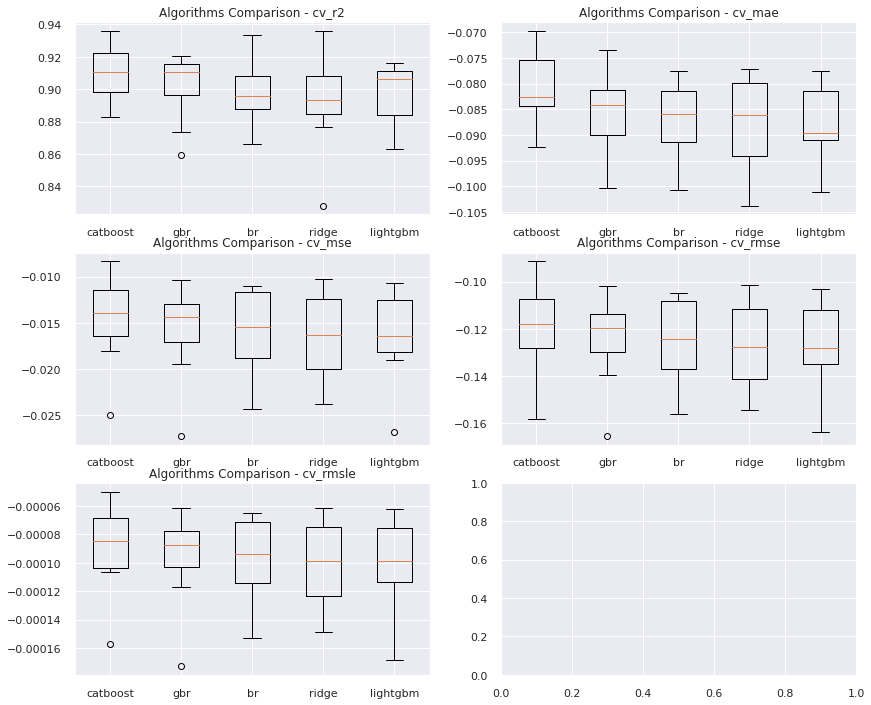

In [791]:
plt.rcParams['figure.figsize'] = (14, 12)
fig, axs = plt.subplots(3, 2)

# Compare Algorithms
axs[0,0].boxplot(result_cv_r2, labels=names)
axs[0,0].set_title('Algorithms Comparison - cv_r2')
axs[0,1].boxplot(result_cv_mae, labels=names)
axs[0,1].set_title('Algorithms Comparison - cv_mae')
axs[1,0].boxplot(result_cv_mse, labels=names)
axs[1,0].set_title('Algorithms Comparison - cv_mse')
axs[1,1].boxplot(result_cv_rmse, labels=names)
axs[1,1].set_title('Algorithms Comparison - cv_rmse')
axs[2,0].boxplot(result_cv_rmsle, labels=names)
axs[2,0].set_title('Algorithms Comparison - cv_rmsle')
plt.show()

**En valeur positive, on cherche à minimiser l'erreur, en valeur négative on cherche à maximiser l'erreur. On voit que le CatBoost Regressor performe le plus.**

## <font color="#337da4">Baseline</font>

In [792]:
baseline = CatBoostRegressor(verbose=0)

baseline.fit(df_finals[0],log_ys[0]["SalePrice"])
pred_CBR = np.exp(baseline.predict(df_finals[1]))

In [793]:
# First submission
Id = df_test["Id"]
df_submited = pd.concat([Id, pd.Series(pred_CBR, name='SalePrice')], axis=1)
df_submited

,Id,SalePrice
0,1461,122280.80
1,1462,156660.81
2,1463,187629.83
3,1464,192667.31
4,1465,178686.50
...,...,...
1454,2915,84055.80
1455,2916,82374.96
1456,2917,154157.58
1457,2918,122527.66


In [794]:
df_submited.to_csv("006_submited.csv",index=False)

## <font color="#337da4">Bagging Ensemble</font>

In [795]:
models = {
    "catboost": CatBoostRegressor(),
    "gbr": GradientBoostingRegressor(),
    "br": BayesianRidge(),
    "lightgbm": LGBMRegressor(),
    "ridge": Ridge()
    #"xgboost": XGBRegressor(),
    #"et": ExtraTreesRegressor(),
    #"knn": KNeighborsRegressor(),
    #"omp": OrthogonalMatchingPursuit()
}

In [798]:
# Store cross validation results in dict

results = {}

kf = KFold(n_splits=10)

for name, model in models.items(): 
    result = np.exp(np.sqrt(-cross_val_score(model, df_finals[0], log_ys[0]["SalePrice"], scoring='neg_mean_squared_error', cv=kf)))
    results[name] = result

Custom logger is already specified. Specify more than one logger at same time is not thread safe.

Learning rate set to 0.042697
0:	learn: 0.3895907	total: 5.67ms	remaining: 5.67s
1:	learn: 0.3790419	total: 12.5ms	remaining: 6.25s
2:	learn: 0.3688260	total: 17.7ms	remaining: 5.88s
3:	learn: 0.3594227	total: 23.1ms	remaining: 5.74s
4:	learn: 0.3496546	total: 28.4ms	remaining: 5.66s
5:	learn: 0.3399095	total: 34.7ms	remaining: 5.75s
6:	learn: 0.3316607	total: 44ms	remaining: 6.25s
7:	learn: 0.3231413	total: 49ms	remaining: 6.08s
8:	learn: 0.3153839	total: 54.3ms	remaining: 5.98s
9:	learn: 0.3070678	total: 59.6ms	remaining: 5.9s
10:	learn: 0.2999537	total: 64.7ms	remaining: 5.82s
11:	learn: 0.2924816	total: 69.8ms	remaining: 5.75s
12:	learn: 0.2859471	total: 74.9ms	remaining: 5.69s
13:	learn: 0.2803854	total: 80.1ms	remaining: 5.64s
14:	learn: 0.2743533	total: 85ms	remaining: 5.58s
15:	learn: 0.2677970	total: 89.9ms	remaining: 5.53s
16:	learn: 0.2616305	total: 95ms	remaining: 5.5s
17:	learn: 0.2557189	total: 99.9ms	remaining: 5.45s
18:	learn: 0.2501391	total: 105ms	remaining: 5.41s
19:

192:	learn: 0.0859140	total: 989ms	remaining: 4.13s
193:	learn: 0.0857559	total: 994ms	remaining: 4.13s
194:	learn: 0.0855444	total: 999ms	remaining: 4.12s
195:	learn: 0.0853643	total: 1s	remaining: 4.12s
196:	learn: 0.0851303	total: 1.01s	remaining: 4.12s
197:	learn: 0.0849716	total: 1.01s	remaining: 4.11s
198:	learn: 0.0847794	total: 1.02s	remaining: 4.11s
199:	learn: 0.0845931	total: 1.02s	remaining: 4.1s
200:	learn: 0.0844033	total: 1.03s	remaining: 4.1s
201:	learn: 0.0841893	total: 1.04s	remaining: 4.1s
202:	learn: 0.0839850	total: 1.04s	remaining: 4.09s
203:	learn: 0.0837094	total: 1.05s	remaining: 4.09s
204:	learn: 0.0835088	total: 1.05s	remaining: 4.08s
205:	learn: 0.0834037	total: 1.06s	remaining: 4.07s
206:	learn: 0.0832228	total: 1.06s	remaining: 4.07s
207:	learn: 0.0830989	total: 1.07s	remaining: 4.06s
208:	learn: 0.0828552	total: 1.07s	remaining: 4.06s
209:	learn: 0.0827283	total: 1.08s	remaining: 4.05s
210:	learn: 0.0825959	total: 1.08s	remaining: 4.05s
211:	learn: 0.0824

385:	learn: 0.0549540	total: 1.98s	remaining: 3.15s
386:	learn: 0.0548178	total: 1.98s	remaining: 3.14s
387:	learn: 0.0548017	total: 1.99s	remaining: 3.14s
388:	learn: 0.0546839	total: 1.99s	remaining: 3.13s
389:	learn: 0.0545652	total: 2s	remaining: 3.13s
390:	learn: 0.0544156	total: 2.01s	remaining: 3.12s
391:	learn: 0.0543958	total: 2.01s	remaining: 3.12s
392:	learn: 0.0542926	total: 2.02s	remaining: 3.11s
393:	learn: 0.0541253	total: 2.02s	remaining: 3.11s
394:	learn: 0.0539726	total: 2.02s	remaining: 3.1s
395:	learn: 0.0538729	total: 2.03s	remaining: 3.1s
396:	learn: 0.0537769	total: 2.04s	remaining: 3.09s
397:	learn: 0.0535922	total: 2.04s	remaining: 3.09s
398:	learn: 0.0534408	total: 2.04s	remaining: 3.08s
399:	learn: 0.0532928	total: 2.05s	remaining: 3.08s
400:	learn: 0.0531285	total: 2.06s	remaining: 3.07s
401:	learn: 0.0531071	total: 2.06s	remaining: 3.06s
402:	learn: 0.0529763	total: 2.06s	remaining: 3.06s
403:	learn: 0.0528343	total: 2.07s	remaining: 3.05s
404:	learn: 0.052

580:	learn: 0.0360039	total: 2.97s	remaining: 2.14s
581:	learn: 0.0359431	total: 2.97s	remaining: 2.13s
582:	learn: 0.0358425	total: 2.98s	remaining: 2.13s
583:	learn: 0.0357398	total: 2.98s	remaining: 2.12s
584:	learn: 0.0356528	total: 2.99s	remaining: 2.12s
585:	learn: 0.0355832	total: 2.99s	remaining: 2.11s
586:	learn: 0.0355055	total: 3s	remaining: 2.11s
587:	learn: 0.0354316	total: 3s	remaining: 2.1s
588:	learn: 0.0353337	total: 3.01s	remaining: 2.1s
589:	learn: 0.0352752	total: 3.01s	remaining: 2.09s
590:	learn: 0.0351642	total: 3.02s	remaining: 2.09s
591:	learn: 0.0350964	total: 3.02s	remaining: 2.08s
592:	learn: 0.0350305	total: 3.03s	remaining: 2.08s
593:	learn: 0.0349196	total: 3.03s	remaining: 2.07s
594:	learn: 0.0348304	total: 3.04s	remaining: 2.07s
595:	learn: 0.0347361	total: 3.04s	remaining: 2.06s
596:	learn: 0.0346476	total: 3.05s	remaining: 2.06s
597:	learn: 0.0346068	total: 3.05s	remaining: 2.05s
598:	learn: 0.0345273	total: 3.06s	remaining: 2.05s
599:	learn: 0.034428

739:	learn: 0.0252961	total: 3.76s	remaining: 1.32s
740:	learn: 0.0252390	total: 3.77s	remaining: 1.32s
741:	learn: 0.0251722	total: 3.77s	remaining: 1.31s
742:	learn: 0.0251278	total: 3.78s	remaining: 1.31s
743:	learn: 0.0250718	total: 3.79s	remaining: 1.3s
744:	learn: 0.0250046	total: 3.79s	remaining: 1.3s
745:	learn: 0.0249337	total: 3.8s	remaining: 1.29s
746:	learn: 0.0248932	total: 3.8s	remaining: 1.29s
747:	learn: 0.0248465	total: 3.81s	remaining: 1.28s
748:	learn: 0.0248011	total: 3.81s	remaining: 1.28s
749:	learn: 0.0247610	total: 3.82s	remaining: 1.27s
750:	learn: 0.0247269	total: 3.82s	remaining: 1.27s
751:	learn: 0.0246724	total: 3.83s	remaining: 1.26s
752:	learn: 0.0246046	total: 3.83s	remaining: 1.26s
753:	learn: 0.0245392	total: 3.83s	remaining: 1.25s
754:	learn: 0.0244635	total: 3.84s	remaining: 1.25s
755:	learn: 0.0244141	total: 3.85s	remaining: 1.24s
756:	learn: 0.0243818	total: 3.85s	remaining: 1.24s
757:	learn: 0.0243420	total: 3.86s	remaining: 1.23s
758:	learn: 0.02

935:	learn: 0.0165762	total: 4.76s	remaining: 325ms
936:	learn: 0.0165443	total: 4.76s	remaining: 320ms
937:	learn: 0.0165192	total: 4.77s	remaining: 315ms
938:	learn: 0.0164762	total: 4.78s	remaining: 310ms
939:	learn: 0.0164302	total: 4.78s	remaining: 305ms
940:	learn: 0.0164163	total: 4.79s	remaining: 300ms
941:	learn: 0.0164125	total: 4.79s	remaining: 295ms
942:	learn: 0.0163679	total: 4.8s	remaining: 290ms
943:	learn: 0.0163401	total: 4.8s	remaining: 285ms
944:	learn: 0.0163036	total: 4.81s	remaining: 280ms
945:	learn: 0.0162630	total: 4.81s	remaining: 275ms
946:	learn: 0.0162319	total: 4.82s	remaining: 270ms
947:	learn: 0.0161993	total: 4.82s	remaining: 265ms
948:	learn: 0.0161700	total: 4.83s	remaining: 259ms
949:	learn: 0.0161279	total: 4.83s	remaining: 254ms
950:	learn: 0.0160963	total: 4.84s	remaining: 249ms
951:	learn: 0.0160564	total: 4.84s	remaining: 244ms
952:	learn: 0.0160241	total: 4.85s	remaining: 239ms
953:	learn: 0.0160054	total: 4.85s	remaining: 234ms
954:	learn: 0.

112:	learn: 0.1063982	total: 600ms	remaining: 4.71s
113:	learn: 0.1060866	total: 606ms	remaining: 4.71s
114:	learn: 0.1057737	total: 611ms	remaining: 4.7s
115:	learn: 0.1053466	total: 616ms	remaining: 4.7s
116:	learn: 0.1049655	total: 622ms	remaining: 4.69s
117:	learn: 0.1046197	total: 627ms	remaining: 4.68s
118:	learn: 0.1044049	total: 632ms	remaining: 4.68s
119:	learn: 0.1040969	total: 637ms	remaining: 4.67s
120:	learn: 0.1037898	total: 642ms	remaining: 4.67s
121:	learn: 0.1033793	total: 648ms	remaining: 4.66s
122:	learn: 0.1030452	total: 653ms	remaining: 4.66s
123:	learn: 0.1028048	total: 658ms	remaining: 4.65s
124:	learn: 0.1024768	total: 663ms	remaining: 4.64s
125:	learn: 0.1022186	total: 669ms	remaining: 4.64s
126:	learn: 0.1019084	total: 673ms	remaining: 4.63s
127:	learn: 0.1017661	total: 679ms	remaining: 4.62s
128:	learn: 0.1015567	total: 684ms	remaining: 4.62s
129:	learn: 0.1012602	total: 689ms	remaining: 4.61s
130:	learn: 0.1010269	total: 694ms	remaining: 4.6s
131:	learn: 0.1

294:	learn: 0.0683743	total: 1.59s	remaining: 3.8s
295:	learn: 0.0681837	total: 1.59s	remaining: 3.79s
296:	learn: 0.0680164	total: 1.6s	remaining: 3.79s
297:	learn: 0.0678351	total: 1.61s	remaining: 3.79s
298:	learn: 0.0677071	total: 1.61s	remaining: 3.78s
299:	learn: 0.0675409	total: 1.62s	remaining: 3.78s
300:	learn: 0.0675019	total: 1.62s	remaining: 3.77s
301:	learn: 0.0673250	total: 1.63s	remaining: 3.77s
302:	learn: 0.0671320	total: 1.63s	remaining: 3.76s
303:	learn: 0.0669176	total: 1.64s	remaining: 3.75s
304:	learn: 0.0667394	total: 1.65s	remaining: 3.75s
305:	learn: 0.0666424	total: 1.65s	remaining: 3.75s
306:	learn: 0.0664802	total: 1.66s	remaining: 3.74s
307:	learn: 0.0663049	total: 1.66s	remaining: 3.73s
308:	learn: 0.0661593	total: 1.67s	remaining: 3.73s
309:	learn: 0.0659905	total: 1.67s	remaining: 3.72s
310:	learn: 0.0658421	total: 1.68s	remaining: 3.72s
311:	learn: 0.0657085	total: 1.68s	remaining: 3.71s
312:	learn: 0.0655945	total: 1.69s	remaining: 3.71s
313:	learn: 0.

471:	learn: 0.0448785	total: 2.58s	remaining: 2.89s
472:	learn: 0.0447758	total: 2.58s	remaining: 2.88s
473:	learn: 0.0446520	total: 2.59s	remaining: 2.88s
474:	learn: 0.0445486	total: 2.6s	remaining: 2.87s
475:	learn: 0.0444248	total: 2.6s	remaining: 2.87s
476:	learn: 0.0442864	total: 2.61s	remaining: 2.86s
477:	learn: 0.0441328	total: 2.62s	remaining: 2.86s
478:	learn: 0.0440210	total: 2.62s	remaining: 2.85s
479:	learn: 0.0439389	total: 2.63s	remaining: 2.85s
480:	learn: 0.0438479	total: 2.63s	remaining: 2.84s
481:	learn: 0.0437205	total: 2.64s	remaining: 2.84s
482:	learn: 0.0436053	total: 2.65s	remaining: 2.83s
483:	learn: 0.0435039	total: 2.65s	remaining: 2.83s
484:	learn: 0.0434032	total: 2.66s	remaining: 2.82s
485:	learn: 0.0432795	total: 2.66s	remaining: 2.82s
486:	learn: 0.0431458	total: 2.67s	remaining: 2.81s
487:	learn: 0.0430665	total: 2.67s	remaining: 2.81s
488:	learn: 0.0429127	total: 2.68s	remaining: 2.8s
489:	learn: 0.0427330	total: 2.69s	remaining: 2.8s
490:	learn: 0.04

647:	learn: 0.0297384	total: 3.58s	remaining: 1.95s
648:	learn: 0.0296897	total: 3.59s	remaining: 1.94s
649:	learn: 0.0296446	total: 3.59s	remaining: 1.94s
650:	learn: 0.0295728	total: 3.6s	remaining: 1.93s
651:	learn: 0.0295000	total: 3.6s	remaining: 1.92s
652:	learn: 0.0294569	total: 3.61s	remaining: 1.92s
653:	learn: 0.0293682	total: 3.62s	remaining: 1.91s
654:	learn: 0.0293166	total: 3.62s	remaining: 1.91s
655:	learn: 0.0292502	total: 3.63s	remaining: 1.9s
656:	learn: 0.0291932	total: 3.63s	remaining: 1.9s
657:	learn: 0.0291359	total: 3.64s	remaining: 1.89s
658:	learn: 0.0290751	total: 3.64s	remaining: 1.89s
659:	learn: 0.0290372	total: 3.65s	remaining: 1.88s
660:	learn: 0.0289410	total: 3.65s	remaining: 1.87s
661:	learn: 0.0288656	total: 3.66s	remaining: 1.87s
662:	learn: 0.0287856	total: 3.67s	remaining: 1.86s
663:	learn: 0.0287275	total: 3.67s	remaining: 1.86s
664:	learn: 0.0286859	total: 3.68s	remaining: 1.85s
665:	learn: 0.0286326	total: 3.68s	remaining: 1.85s
666:	learn: 0.02

832:	learn: 0.0198620	total: 4.58s	remaining: 918ms
833:	learn: 0.0198410	total: 4.59s	remaining: 913ms
834:	learn: 0.0197971	total: 4.59s	remaining: 908ms
835:	learn: 0.0197552	total: 4.6s	remaining: 902ms
836:	learn: 0.0197130	total: 4.61s	remaining: 897ms
837:	learn: 0.0196625	total: 4.61s	remaining: 891ms
838:	learn: 0.0196234	total: 4.62s	remaining: 886ms
839:	learn: 0.0195895	total: 4.62s	remaining: 880ms
840:	learn: 0.0195478	total: 4.63s	remaining: 875ms
841:	learn: 0.0195121	total: 4.63s	remaining: 870ms
842:	learn: 0.0194823	total: 4.64s	remaining: 864ms
843:	learn: 0.0194341	total: 4.64s	remaining: 858ms
844:	learn: 0.0193936	total: 4.65s	remaining: 853ms
845:	learn: 0.0193573	total: 4.66s	remaining: 847ms
846:	learn: 0.0193061	total: 4.66s	remaining: 842ms
847:	learn: 0.0192809	total: 4.67s	remaining: 836ms
848:	learn: 0.0192215	total: 4.67s	remaining: 831ms
849:	learn: 0.0192166	total: 4.67s	remaining: 825ms
850:	learn: 0.0191811	total: 4.68s	remaining: 820ms
851:	learn: 0

Learning rate set to 0.042697
0:	learn: 0.3844493	total: 5.42ms	remaining: 5.41s
1:	learn: 0.3747985	total: 10.5ms	remaining: 5.25s
2:	learn: 0.3653548	total: 15.4ms	remaining: 5.13s
3:	learn: 0.3556343	total: 20.6ms	remaining: 5.12s
4:	learn: 0.3474395	total: 25.8ms	remaining: 5.14s
5:	learn: 0.3386274	total: 31ms	remaining: 5.13s
6:	learn: 0.3304535	total: 36.2ms	remaining: 5.14s
7:	learn: 0.3220953	total: 41.1ms	remaining: 5.1s
8:	learn: 0.3137928	total: 46.4ms	remaining: 5.11s
9:	learn: 0.3065748	total: 51.4ms	remaining: 5.09s
10:	learn: 0.2992265	total: 56.4ms	remaining: 5.08s
11:	learn: 0.2921720	total: 61.5ms	remaining: 5.07s
12:	learn: 0.2858678	total: 66.7ms	remaining: 5.07s
13:	learn: 0.2795270	total: 71.9ms	remaining: 5.06s
14:	learn: 0.2730706	total: 76.8ms	remaining: 5.04s
15:	learn: 0.2664178	total: 81.9ms	remaining: 5.04s
16:	learn: 0.2606641	total: 86.9ms	remaining: 5.03s
17:	learn: 0.2556390	total: 92.2ms	remaining: 5.03s
18:	learn: 0.2495567	total: 97.4ms	remaining: 5

182:	learn: 0.0899796	total: 999ms	remaining: 4.46s
183:	learn: 0.0897889	total: 1s	remaining: 4.46s
184:	learn: 0.0896721	total: 1.01s	remaining: 4.45s
185:	learn: 0.0895027	total: 1.02s	remaining: 4.45s
186:	learn: 0.0893130	total: 1.02s	remaining: 4.44s
187:	learn: 0.0891500	total: 1.03s	remaining: 4.44s
188:	learn: 0.0889297	total: 1.03s	remaining: 4.44s
189:	learn: 0.0887999	total: 1.04s	remaining: 4.43s
190:	learn: 0.0886444	total: 1.05s	remaining: 4.43s
191:	learn: 0.0885402	total: 1.05s	remaining: 4.43s
192:	learn: 0.0883823	total: 1.06s	remaining: 4.42s
193:	learn: 0.0882305	total: 1.06s	remaining: 4.42s
194:	learn: 0.0880296	total: 1.07s	remaining: 4.42s
195:	learn: 0.0878783	total: 1.08s	remaining: 4.42s
196:	learn: 0.0877630	total: 1.08s	remaining: 4.41s
197:	learn: 0.0875317	total: 1.09s	remaining: 4.41s
198:	learn: 0.0873401	total: 1.09s	remaining: 4.4s
199:	learn: 0.0870408	total: 1.1s	remaining: 4.4s
200:	learn: 0.0867702	total: 1.1s	remaining: 4.4s
201:	learn: 0.086611

352:	learn: 0.0616881	total: 1.99s	remaining: 3.65s
353:	learn: 0.0616034	total: 2s	remaining: 3.65s
354:	learn: 0.0614651	total: 2s	remaining: 3.64s
355:	learn: 0.0613539	total: 2.01s	remaining: 3.64s
356:	learn: 0.0612328	total: 2.02s	remaining: 3.63s
357:	learn: 0.0610025	total: 2.02s	remaining: 3.63s
358:	learn: 0.0608585	total: 2.03s	remaining: 3.62s
359:	learn: 0.0606732	total: 2.03s	remaining: 3.61s
360:	learn: 0.0606524	total: 2.04s	remaining: 3.61s
361:	learn: 0.0606341	total: 2.04s	remaining: 3.6s
362:	learn: 0.0604605	total: 2.05s	remaining: 3.6s
363:	learn: 0.0603675	total: 2.05s	remaining: 3.59s
364:	learn: 0.0601652	total: 2.06s	remaining: 3.58s
365:	learn: 0.0600655	total: 2.06s	remaining: 3.58s
366:	learn: 0.0600515	total: 2.07s	remaining: 3.57s
367:	learn: 0.0598769	total: 2.08s	remaining: 3.56s
368:	learn: 0.0596894	total: 2.08s	remaining: 3.56s
369:	learn: 0.0595581	total: 2.09s	remaining: 3.55s
370:	learn: 0.0594293	total: 2.09s	remaining: 3.55s
371:	learn: 0.059181

530:	learn: 0.0414085	total: 2.99s	remaining: 2.64s
531:	learn: 0.0412914	total: 2.99s	remaining: 2.63s
532:	learn: 0.0412389	total: 3s	remaining: 2.63s
533:	learn: 0.0411273	total: 3s	remaining: 2.62s
534:	learn: 0.0410471	total: 3.01s	remaining: 2.62s
535:	learn: 0.0409339	total: 3.01s	remaining: 2.61s
536:	learn: 0.0408435	total: 3.02s	remaining: 2.6s
537:	learn: 0.0407180	total: 3.02s	remaining: 2.6s
538:	learn: 0.0405784	total: 3.03s	remaining: 2.59s
539:	learn: 0.0405389	total: 3.04s	remaining: 2.58s
540:	learn: 0.0404437	total: 3.04s	remaining: 2.58s
541:	learn: 0.0403595	total: 3.04s	remaining: 2.57s
542:	learn: 0.0402722	total: 3.05s	remaining: 2.57s
543:	learn: 0.0401323	total: 3.06s	remaining: 2.56s
544:	learn: 0.0400434	total: 3.06s	remaining: 2.56s
545:	learn: 0.0399388	total: 3.07s	remaining: 2.55s
546:	learn: 0.0397869	total: 3.07s	remaining: 2.54s
547:	learn: 0.0397083	total: 3.08s	remaining: 2.54s
548:	learn: 0.0395818	total: 3.08s	remaining: 2.53s
549:	learn: 0.039470

712:	learn: 0.0276717	total: 3.98s	remaining: 1.6s
713:	learn: 0.0276059	total: 3.98s	remaining: 1.59s
714:	learn: 0.0275462	total: 3.99s	remaining: 1.59s
715:	learn: 0.0274578	total: 4s	remaining: 1.58s
716:	learn: 0.0273994	total: 4s	remaining: 1.58s
717:	learn: 0.0273766	total: 4.01s	remaining: 1.57s
718:	learn: 0.0272763	total: 4.01s	remaining: 1.57s
719:	learn: 0.0272518	total: 4.02s	remaining: 1.56s
720:	learn: 0.0271802	total: 4.02s	remaining: 1.56s
721:	learn: 0.0271211	total: 4.03s	remaining: 1.55s
722:	learn: 0.0270918	total: 4.04s	remaining: 1.54s
723:	learn: 0.0270079	total: 4.04s	remaining: 1.54s
724:	learn: 0.0269658	total: 4.04s	remaining: 1.53s
725:	learn: 0.0268924	total: 4.05s	remaining: 1.53s
726:	learn: 0.0268522	total: 4.06s	remaining: 1.52s
727:	learn: 0.0267512	total: 4.06s	remaining: 1.52s
728:	learn: 0.0267113	total: 4.07s	remaining: 1.51s
729:	learn: 0.0266808	total: 4.07s	remaining: 1.51s
730:	learn: 0.0266397	total: 4.08s	remaining: 1.5s
731:	learn: 0.026567

895:	learn: 0.0187156	total: 4.97s	remaining: 577ms
896:	learn: 0.0186787	total: 4.98s	remaining: 572ms
897:	learn: 0.0186339	total: 4.98s	remaining: 566ms
898:	learn: 0.0185943	total: 4.99s	remaining: 561ms
899:	learn: 0.0185904	total: 4.99s	remaining: 555ms
900:	learn: 0.0185625	total: 5s	remaining: 549ms
901:	learn: 0.0185361	total: 5s	remaining: 544ms
902:	learn: 0.0184846	total: 5.01s	remaining: 538ms
903:	learn: 0.0184265	total: 5.01s	remaining: 533ms
904:	learn: 0.0184147	total: 5.02s	remaining: 527ms
905:	learn: 0.0183864	total: 5.03s	remaining: 522ms
906:	learn: 0.0183792	total: 5.03s	remaining: 516ms
907:	learn: 0.0183366	total: 5.04s	remaining: 510ms
908:	learn: 0.0182830	total: 5.04s	remaining: 505ms
909:	learn: 0.0182417	total: 5.05s	remaining: 499ms
910:	learn: 0.0182068	total: 5.05s	remaining: 494ms
911:	learn: 0.0182054	total: 5.06s	remaining: 488ms
912:	learn: 0.0181765	total: 5.06s	remaining: 482ms
913:	learn: 0.0181556	total: 5.07s	remaining: 477ms
914:	learn: 0.0181

64:	learn: 0.1321740	total: 397ms	remaining: 5.7s
65:	learn: 0.1311147	total: 403ms	remaining: 5.7s
66:	learn: 0.1300755	total: 409ms	remaining: 5.69s
67:	learn: 0.1292181	total: 415ms	remaining: 5.68s
68:	learn: 0.1285461	total: 421ms	remaining: 5.68s
69:	learn: 0.1275426	total: 429ms	remaining: 5.7s
70:	learn: 0.1267579	total: 435ms	remaining: 5.7s
71:	learn: 0.1260233	total: 441ms	remaining: 5.69s
72:	learn: 0.1252257	total: 447ms	remaining: 5.68s
73:	learn: 0.1244032	total: 453ms	remaining: 5.67s
74:	learn: 0.1234836	total: 459ms	remaining: 5.66s
75:	learn: 0.1227163	total: 465ms	remaining: 5.65s
76:	learn: 0.1220524	total: 470ms	remaining: 5.64s
77:	learn: 0.1214856	total: 479ms	remaining: 5.67s
78:	learn: 0.1208789	total: 485ms	remaining: 5.65s
79:	learn: 0.1201241	total: 490ms	remaining: 5.64s
80:	learn: 0.1194109	total: 499ms	remaining: 5.66s
81:	learn: 0.1186778	total: 504ms	remaining: 5.64s
82:	learn: 0.1180933	total: 510ms	remaining: 5.63s
83:	learn: 0.1175894	total: 515ms	r

231:	learn: 0.0784212	total: 1.4s	remaining: 4.63s
232:	learn: 0.0782484	total: 1.4s	remaining: 4.62s
233:	learn: 0.0779633	total: 1.41s	remaining: 4.61s
234:	learn: 0.0777862	total: 1.41s	remaining: 4.6s
235:	learn: 0.0776959	total: 1.42s	remaining: 4.6s
236:	learn: 0.0775585	total: 1.43s	remaining: 4.59s
237:	learn: 0.0773726	total: 1.43s	remaining: 4.58s
238:	learn: 0.0771563	total: 1.44s	remaining: 4.58s
239:	learn: 0.0769217	total: 1.44s	remaining: 4.57s
240:	learn: 0.0768108	total: 1.45s	remaining: 4.57s
241:	learn: 0.0765860	total: 1.46s	remaining: 4.56s
242:	learn: 0.0764196	total: 1.46s	remaining: 4.55s
243:	learn: 0.0762342	total: 1.47s	remaining: 4.56s
244:	learn: 0.0760777	total: 1.48s	remaining: 4.55s
245:	learn: 0.0759263	total: 1.49s	remaining: 4.55s
246:	learn: 0.0757996	total: 1.49s	remaining: 4.54s
247:	learn: 0.0756218	total: 1.5s	remaining: 4.54s
248:	learn: 0.0754563	total: 1.5s	remaining: 4.53s
249:	learn: 0.0753482	total: 1.51s	remaining: 4.53s
250:	learn: 0.0752

395:	learn: 0.0541194	total: 2.4s	remaining: 3.66s
396:	learn: 0.0540949	total: 2.4s	remaining: 3.65s
397:	learn: 0.0539478	total: 2.41s	remaining: 3.65s
398:	learn: 0.0538453	total: 2.42s	remaining: 3.64s
399:	learn: 0.0537231	total: 2.43s	remaining: 3.64s
400:	learn: 0.0536487	total: 2.43s	remaining: 3.63s
401:	learn: 0.0534788	total: 2.44s	remaining: 3.63s
402:	learn: 0.0533807	total: 2.45s	remaining: 3.62s
403:	learn: 0.0532778	total: 2.45s	remaining: 3.62s
404:	learn: 0.0530614	total: 2.46s	remaining: 3.61s
405:	learn: 0.0529604	total: 2.46s	remaining: 3.6s
406:	learn: 0.0529281	total: 2.47s	remaining: 3.6s
407:	learn: 0.0528147	total: 2.48s	remaining: 3.59s
408:	learn: 0.0527501	total: 2.48s	remaining: 3.59s
409:	learn: 0.0526096	total: 2.49s	remaining: 3.58s
410:	learn: 0.0525040	total: 2.5s	remaining: 3.58s
411:	learn: 0.0523746	total: 2.5s	remaining: 3.57s
412:	learn: 0.0522817	total: 2.51s	remaining: 3.57s
413:	learn: 0.0521911	total: 2.52s	remaining: 3.56s
414:	learn: 0.0520

565:	learn: 0.0369569	total: 3.39s	remaining: 2.6s
566:	learn: 0.0368911	total: 3.4s	remaining: 2.6s
567:	learn: 0.0368317	total: 3.41s	remaining: 2.59s
568:	learn: 0.0367537	total: 3.41s	remaining: 2.58s
569:	learn: 0.0366640	total: 3.42s	remaining: 2.58s
570:	learn: 0.0365945	total: 3.43s	remaining: 2.57s
571:	learn: 0.0365181	total: 3.43s	remaining: 2.57s
572:	learn: 0.0364444	total: 3.44s	remaining: 2.56s
573:	learn: 0.0364352	total: 3.44s	remaining: 2.56s
574:	learn: 0.0363611	total: 3.45s	remaining: 2.55s
575:	learn: 0.0362725	total: 3.45s	remaining: 2.54s
576:	learn: 0.0361758	total: 3.46s	remaining: 2.54s
577:	learn: 0.0361205	total: 3.47s	remaining: 2.53s
578:	learn: 0.0360352	total: 3.47s	remaining: 2.52s
579:	learn: 0.0359450	total: 3.48s	remaining: 2.52s
580:	learn: 0.0358381	total: 3.48s	remaining: 2.51s
581:	learn: 0.0357345	total: 3.49s	remaining: 2.51s
582:	learn: 0.0356709	total: 3.5s	remaining: 2.5s
583:	learn: 0.0355904	total: 3.5s	remaining: 2.49s
584:	learn: 0.0355

743:	learn: 0.0253646	total: 4.38s	remaining: 1.51s
744:	learn: 0.0253064	total: 4.39s	remaining: 1.5s
745:	learn: 0.0252619	total: 4.39s	remaining: 1.5s
746:	learn: 0.0252142	total: 4.4s	remaining: 1.49s
747:	learn: 0.0251468	total: 4.41s	remaining: 1.48s
748:	learn: 0.0251273	total: 4.41s	remaining: 1.48s
749:	learn: 0.0250651	total: 4.42s	remaining: 1.47s
750:	learn: 0.0250163	total: 4.42s	remaining: 1.47s
751:	learn: 0.0249672	total: 4.43s	remaining: 1.46s
752:	learn: 0.0249309	total: 4.43s	remaining: 1.45s
753:	learn: 0.0248724	total: 4.44s	remaining: 1.45s
754:	learn: 0.0248282	total: 4.44s	remaining: 1.44s
755:	learn: 0.0247733	total: 4.45s	remaining: 1.44s
756:	learn: 0.0247071	total: 4.45s	remaining: 1.43s
757:	learn: 0.0246696	total: 4.46s	remaining: 1.42s
758:	learn: 0.0246092	total: 4.46s	remaining: 1.42s
759:	learn: 0.0245329	total: 4.47s	remaining: 1.41s
760:	learn: 0.0245027	total: 4.47s	remaining: 1.41s
761:	learn: 0.0244523	total: 4.48s	remaining: 1.4s
762:	learn: 0.02

918:	learn: 0.0176315	total: 5.38s	remaining: 474ms
919:	learn: 0.0175936	total: 5.38s	remaining: 468ms
920:	learn: 0.0175702	total: 5.39s	remaining: 462ms
921:	learn: 0.0175387	total: 5.39s	remaining: 456ms
922:	learn: 0.0175003	total: 5.4s	remaining: 451ms
923:	learn: 0.0174602	total: 5.41s	remaining: 445ms
924:	learn: 0.0174559	total: 5.41s	remaining: 439ms
925:	learn: 0.0174106	total: 5.42s	remaining: 433ms
926:	learn: 0.0173807	total: 5.42s	remaining: 427ms
927:	learn: 0.0173310	total: 5.43s	remaining: 421ms
928:	learn: 0.0172893	total: 5.43s	remaining: 415ms
929:	learn: 0.0172594	total: 5.44s	remaining: 409ms
930:	learn: 0.0172260	total: 5.44s	remaining: 404ms
931:	learn: 0.0171788	total: 5.45s	remaining: 398ms
932:	learn: 0.0171499	total: 5.46s	remaining: 392ms
933:	learn: 0.0171111	total: 5.46s	remaining: 386ms
934:	learn: 0.0170716	total: 5.46s	remaining: 380ms
935:	learn: 0.0170116	total: 5.47s	remaining: 374ms
936:	learn: 0.0169717	total: 5.48s	remaining: 368ms
937:	learn: 0

83:	learn: 0.1149431	total: 471ms	remaining: 5.13s
84:	learn: 0.1143043	total: 477ms	remaining: 5.13s
85:	learn: 0.1136636	total: 485ms	remaining: 5.15s
86:	learn: 0.1130282	total: 491ms	remaining: 5.15s
87:	learn: 0.1124232	total: 497ms	remaining: 5.14s
88:	learn: 0.1118879	total: 503ms	remaining: 5.14s
89:	learn: 0.1112716	total: 508ms	remaining: 5.14s
90:	learn: 0.1107120	total: 514ms	remaining: 5.13s
91:	learn: 0.1103010	total: 519ms	remaining: 5.13s
92:	learn: 0.1097839	total: 525ms	remaining: 5.12s
93:	learn: 0.1093016	total: 530ms	remaining: 5.11s
94:	learn: 0.1087829	total: 536ms	remaining: 5.11s
95:	learn: 0.1083374	total: 541ms	remaining: 5.1s
96:	learn: 0.1079996	total: 547ms	remaining: 5.09s
97:	learn: 0.1076287	total: 553ms	remaining: 5.09s
98:	learn: 0.1072390	total: 559ms	remaining: 5.08s
99:	learn: 0.1068301	total: 565ms	remaining: 5.08s
100:	learn: 0.1063256	total: 570ms	remaining: 5.07s
101:	learn: 0.1058454	total: 576ms	remaining: 5.07s
102:	learn: 0.1054160	total: 5

253:	learn: 0.0731063	total: 1.47s	remaining: 4.32s
254:	learn: 0.0729020	total: 1.48s	remaining: 4.31s
255:	learn: 0.0727408	total: 1.48s	remaining: 4.31s
256:	learn: 0.0725248	total: 1.49s	remaining: 4.3s
257:	learn: 0.0723484	total: 1.49s	remaining: 4.3s
258:	learn: 0.0721866	total: 1.5s	remaining: 4.29s
259:	learn: 0.0719953	total: 1.5s	remaining: 4.29s
260:	learn: 0.0718933	total: 1.51s	remaining: 4.29s
261:	learn: 0.0717484	total: 1.52s	remaining: 4.29s
262:	learn: 0.0715733	total: 1.53s	remaining: 4.28s
263:	learn: 0.0713826	total: 1.53s	remaining: 4.28s
264:	learn: 0.0712639	total: 1.54s	remaining: 4.27s
265:	learn: 0.0711281	total: 1.54s	remaining: 4.26s
266:	learn: 0.0709995	total: 1.55s	remaining: 4.26s
267:	learn: 0.0707774	total: 1.56s	remaining: 4.25s
268:	learn: 0.0706688	total: 1.56s	remaining: 4.25s
269:	learn: 0.0705146	total: 1.57s	remaining: 4.24s
270:	learn: 0.0702912	total: 1.57s	remaining: 4.24s
271:	learn: 0.0700522	total: 1.58s	remaining: 4.23s
272:	learn: 0.06

430:	learn: 0.0481799	total: 2.49s	remaining: 3.29s
431:	learn: 0.0480583	total: 2.5s	remaining: 3.28s
432:	learn: 0.0479237	total: 2.5s	remaining: 3.28s
433:	learn: 0.0477823	total: 2.51s	remaining: 3.27s
434:	learn: 0.0476602	total: 2.52s	remaining: 3.27s
435:	learn: 0.0475436	total: 2.52s	remaining: 3.26s
436:	learn: 0.0474202	total: 2.53s	remaining: 3.26s
437:	learn: 0.0473373	total: 2.53s	remaining: 3.25s
438:	learn: 0.0472369	total: 2.54s	remaining: 3.24s
439:	learn: 0.0471252	total: 2.54s	remaining: 3.24s
440:	learn: 0.0469928	total: 2.55s	remaining: 3.23s
441:	learn: 0.0469219	total: 2.56s	remaining: 3.23s
442:	learn: 0.0468242	total: 2.56s	remaining: 3.22s
443:	learn: 0.0467043	total: 2.57s	remaining: 3.21s
444:	learn: 0.0465785	total: 2.57s	remaining: 3.21s
445:	learn: 0.0464410	total: 2.58s	remaining: 3.2s
446:	learn: 0.0463287	total: 2.58s	remaining: 3.2s
447:	learn: 0.0462518	total: 2.59s	remaining: 3.19s
448:	learn: 0.0461878	total: 2.59s	remaining: 3.18s
449:	learn: 0.04

614:	learn: 0.0310941	total: 3.49s	remaining: 2.18s
615:	learn: 0.0310241	total: 3.49s	remaining: 2.18s
616:	learn: 0.0309803	total: 3.5s	remaining: 2.17s
617:	learn: 0.0308879	total: 3.5s	remaining: 2.17s
618:	learn: 0.0308352	total: 3.51s	remaining: 2.16s
619:	learn: 0.0307309	total: 3.52s	remaining: 2.15s
620:	learn: 0.0306492	total: 3.52s	remaining: 2.15s
621:	learn: 0.0305632	total: 3.53s	remaining: 2.14s
622:	learn: 0.0304878	total: 3.53s	remaining: 2.14s
623:	learn: 0.0303953	total: 3.54s	remaining: 2.13s
624:	learn: 0.0303775	total: 3.54s	remaining: 2.13s
625:	learn: 0.0303017	total: 3.55s	remaining: 2.12s
626:	learn: 0.0302304	total: 3.55s	remaining: 2.11s
627:	learn: 0.0301434	total: 3.56s	remaining: 2.11s
628:	learn: 0.0300854	total: 3.56s	remaining: 2.1s
629:	learn: 0.0300201	total: 3.57s	remaining: 2.1s
630:	learn: 0.0299352	total: 3.57s	remaining: 2.09s
631:	learn: 0.0298502	total: 3.58s	remaining: 2.08s
632:	learn: 0.0297774	total: 3.58s	remaining: 2.08s
633:	learn: 0.02

801:	learn: 0.0205563	total: 4.48s	remaining: 1.11s
802:	learn: 0.0205275	total: 4.49s	remaining: 1.1s
803:	learn: 0.0204552	total: 4.5s	remaining: 1.1s
804:	learn: 0.0204212	total: 4.5s	remaining: 1.09s
805:	learn: 0.0203995	total: 4.51s	remaining: 1.08s
806:	learn: 0.0203564	total: 4.51s	remaining: 1.08s
807:	learn: 0.0203226	total: 4.52s	remaining: 1.07s
808:	learn: 0.0202834	total: 4.52s	remaining: 1.07s
809:	learn: 0.0202414	total: 4.53s	remaining: 1.06s
810:	learn: 0.0202035	total: 4.53s	remaining: 1.06s
811:	learn: 0.0201605	total: 4.54s	remaining: 1.05s
812:	learn: 0.0201360	total: 4.54s	remaining: 1.04s
813:	learn: 0.0200953	total: 4.55s	remaining: 1.04s
814:	learn: 0.0200695	total: 4.55s	remaining: 1.03s
815:	learn: 0.0200280	total: 4.56s	remaining: 1.03s
816:	learn: 0.0199601	total: 4.56s	remaining: 1.02s
817:	learn: 0.0199153	total: 4.57s	remaining: 1.02s
818:	learn: 0.0198967	total: 4.58s	remaining: 1.01s
819:	learn: 0.0198388	total: 4.58s	remaining: 1s
820:	learn: 0.01980

989:	learn: 0.0142203	total: 5.48s	remaining: 55.4ms
990:	learn: 0.0141886	total: 5.49s	remaining: 49.9ms
991:	learn: 0.0141525	total: 5.5s	remaining: 44.3ms
992:	learn: 0.0141297	total: 5.5s	remaining: 38.8ms
993:	learn: 0.0140951	total: 5.51s	remaining: 33.2ms
994:	learn: 0.0140686	total: 5.51s	remaining: 27.7ms
995:	learn: 0.0140453	total: 5.52s	remaining: 22.2ms
996:	learn: 0.0140154	total: 5.52s	remaining: 16.6ms
997:	learn: 0.0140145	total: 5.53s	remaining: 11.1ms
998:	learn: 0.0139881	total: 5.53s	remaining: 5.54ms
999:	learn: 0.0139619	total: 5.54s	remaining: 0us
Learning rate set to 0.042697
0:	learn: 0.3910430	total: 5.53ms	remaining: 5.53s
1:	learn: 0.3805058	total: 10.7ms	remaining: 5.33s
2:	learn: 0.3707428	total: 16ms	remaining: 5.33s
3:	learn: 0.3607220	total: 21.4ms	remaining: 5.33s
4:	learn: 0.3514877	total: 27.8ms	remaining: 5.54s
5:	learn: 0.3426152	total: 33ms	remaining: 5.47s
6:	learn: 0.3344370	total: 38.3ms	remaining: 5.44s
7:	learn: 0.3269237	total: 43.5ms	remai

148:	learn: 0.0967613	total: 810ms	remaining: 4.62s
149:	learn: 0.0964214	total: 815ms	remaining: 4.62s
150:	learn: 0.0962281	total: 822ms	remaining: 4.62s
151:	learn: 0.0959802	total: 828ms	remaining: 4.62s
152:	learn: 0.0957691	total: 833ms	remaining: 4.61s
153:	learn: 0.0955716	total: 838ms	remaining: 4.6s
154:	learn: 0.0953765	total: 844ms	remaining: 4.6s
155:	learn: 0.0950156	total: 849ms	remaining: 4.59s
156:	learn: 0.0949003	total: 855ms	remaining: 4.59s
157:	learn: 0.0947774	total: 860ms	remaining: 4.58s
158:	learn: 0.0945993	total: 865ms	remaining: 4.58s
159:	learn: 0.0944083	total: 871ms	remaining: 4.57s
160:	learn: 0.0942280	total: 876ms	remaining: 4.57s
161:	learn: 0.0939346	total: 881ms	remaining: 4.56s
162:	learn: 0.0937423	total: 887ms	remaining: 4.55s
163:	learn: 0.0935466	total: 892ms	remaining: 4.55s
164:	learn: 0.0932434	total: 897ms	remaining: 4.54s
165:	learn: 0.0930147	total: 903ms	remaining: 4.54s
166:	learn: 0.0928100	total: 908ms	remaining: 4.53s
167:	learn: 0.

324:	learn: 0.0647803	total: 1.81s	remaining: 3.77s
325:	learn: 0.0645849	total: 1.82s	remaining: 3.76s
326:	learn: 0.0644839	total: 1.83s	remaining: 3.76s
327:	learn: 0.0644535	total: 1.83s	remaining: 3.75s
328:	learn: 0.0643365	total: 1.84s	remaining: 3.75s
329:	learn: 0.0642241	total: 1.84s	remaining: 3.74s
330:	learn: 0.0642044	total: 1.85s	remaining: 3.74s
331:	learn: 0.0640995	total: 1.85s	remaining: 3.73s
332:	learn: 0.0639654	total: 1.86s	remaining: 3.73s
333:	learn: 0.0639394	total: 1.86s	remaining: 3.72s
334:	learn: 0.0637030	total: 1.87s	remaining: 3.71s
335:	learn: 0.0635235	total: 1.88s	remaining: 3.71s
336:	learn: 0.0633367	total: 1.88s	remaining: 3.7s
337:	learn: 0.0633075	total: 1.89s	remaining: 3.7s
338:	learn: 0.0632069	total: 1.89s	remaining: 3.69s
339:	learn: 0.0630307	total: 1.9s	remaining: 3.69s
340:	learn: 0.0628618	total: 1.91s	remaining: 3.68s
341:	learn: 0.0627614	total: 1.91s	remaining: 3.68s
342:	learn: 0.0626143	total: 1.92s	remaining: 3.67s
343:	learn: 0.0

497:	learn: 0.0442760	total: 2.81s	remaining: 2.83s
498:	learn: 0.0442539	total: 2.81s	remaining: 2.83s
499:	learn: 0.0441223	total: 2.82s	remaining: 2.82s
500:	learn: 0.0440581	total: 2.83s	remaining: 2.81s
501:	learn: 0.0439438	total: 2.83s	remaining: 2.81s
502:	learn: 0.0438995	total: 2.84s	remaining: 2.8s
503:	learn: 0.0438065	total: 2.84s	remaining: 2.8s
504:	learn: 0.0436980	total: 2.85s	remaining: 2.79s
505:	learn: 0.0435925	total: 2.85s	remaining: 2.79s
506:	learn: 0.0434972	total: 2.86s	remaining: 2.78s
507:	learn: 0.0434752	total: 2.87s	remaining: 2.77s
508:	learn: 0.0433569	total: 2.87s	remaining: 2.77s
509:	learn: 0.0432561	total: 2.88s	remaining: 2.76s
510:	learn: 0.0431324	total: 2.88s	remaining: 2.76s
511:	learn: 0.0430227	total: 2.89s	remaining: 2.75s
512:	learn: 0.0429903	total: 2.89s	remaining: 2.75s
513:	learn: 0.0428985	total: 2.9s	remaining: 2.74s
514:	learn: 0.0428156	total: 2.9s	remaining: 2.73s
515:	learn: 0.0427265	total: 2.91s	remaining: 2.73s
516:	learn: 0.04

681:	learn: 0.0300869	total: 3.8s	remaining: 1.77s
682:	learn: 0.0300173	total: 3.81s	remaining: 1.77s
683:	learn: 0.0299315	total: 3.81s	remaining: 1.76s
684:	learn: 0.0298762	total: 3.82s	remaining: 1.76s
685:	learn: 0.0298045	total: 3.83s	remaining: 1.75s
686:	learn: 0.0297612	total: 3.83s	remaining: 1.75s
687:	learn: 0.0296863	total: 3.84s	remaining: 1.74s
688:	learn: 0.0296538	total: 3.84s	remaining: 1.73s
689:	learn: 0.0295821	total: 3.85s	remaining: 1.73s
690:	learn: 0.0295153	total: 3.85s	remaining: 1.72s
691:	learn: 0.0294330	total: 3.86s	remaining: 1.72s
692:	learn: 0.0293631	total: 3.86s	remaining: 1.71s
693:	learn: 0.0293075	total: 3.87s	remaining: 1.71s
694:	learn: 0.0292717	total: 3.87s	remaining: 1.7s
695:	learn: 0.0292067	total: 3.88s	remaining: 1.69s
696:	learn: 0.0291462	total: 3.88s	remaining: 1.69s
697:	learn: 0.0290753	total: 3.89s	remaining: 1.68s
698:	learn: 0.0290140	total: 3.89s	remaining: 1.68s
699:	learn: 0.0289888	total: 3.9s	remaining: 1.67s
700:	learn: 0.0

864:	learn: 0.0208613	total: 4.8s	remaining: 750ms
865:	learn: 0.0208278	total: 4.81s	remaining: 745ms
866:	learn: 0.0207831	total: 4.82s	remaining: 739ms
867:	learn: 0.0207391	total: 4.82s	remaining: 734ms
868:	learn: 0.0206889	total: 4.83s	remaining: 728ms
869:	learn: 0.0206411	total: 4.83s	remaining: 722ms
870:	learn: 0.0205826	total: 4.84s	remaining: 717ms
871:	learn: 0.0205227	total: 4.85s	remaining: 711ms
872:	learn: 0.0204664	total: 4.85s	remaining: 706ms
873:	learn: 0.0204190	total: 4.86s	remaining: 700ms
874:	learn: 0.0203677	total: 4.86s	remaining: 695ms
875:	learn: 0.0203296	total: 4.87s	remaining: 689ms
876:	learn: 0.0202981	total: 4.88s	remaining: 684ms
877:	learn: 0.0202470	total: 4.88s	remaining: 678ms
878:	learn: 0.0202049	total: 4.89s	remaining: 673ms
879:	learn: 0.0201511	total: 4.89s	remaining: 667ms
880:	learn: 0.0201344	total: 4.9s	remaining: 662ms
881:	learn: 0.0201151	total: 4.9s	remaining: 656ms
882:	learn: 0.0200635	total: 4.91s	remaining: 651ms
883:	learn: 0.0

34:	learn: 0.1847709	total: 200ms	remaining: 5.5s
35:	learn: 0.1820695	total: 205ms	remaining: 5.49s
36:	learn: 0.1794293	total: 211ms	remaining: 5.5s
37:	learn: 0.1765291	total: 217ms	remaining: 5.49s
38:	learn: 0.1740895	total: 222ms	remaining: 5.47s
39:	learn: 0.1717831	total: 227ms	remaining: 5.46s
40:	learn: 0.1696441	total: 233ms	remaining: 5.45s
41:	learn: 0.1671939	total: 238ms	remaining: 5.44s
42:	learn: 0.1650830	total: 244ms	remaining: 5.42s
43:	learn: 0.1629728	total: 250ms	remaining: 5.42s
44:	learn: 0.1609233	total: 255ms	remaining: 5.41s
45:	learn: 0.1593105	total: 260ms	remaining: 5.39s
46:	learn: 0.1574326	total: 266ms	remaining: 5.4s
47:	learn: 0.1557913	total: 272ms	remaining: 5.4s
48:	learn: 0.1540788	total: 278ms	remaining: 5.39s
49:	learn: 0.1523539	total: 284ms	remaining: 5.39s
50:	learn: 0.1508811	total: 289ms	remaining: 5.38s
51:	learn: 0.1491969	total: 295ms	remaining: 5.38s
52:	learn: 0.1477539	total: 301ms	remaining: 5.37s
53:	learn: 0.1464718	total: 306ms	r

212:	learn: 0.0817767	total: 1.2s	remaining: 4.42s
213:	learn: 0.0815134	total: 1.2s	remaining: 4.42s
214:	learn: 0.0813273	total: 1.21s	remaining: 4.41s
215:	learn: 0.0811637	total: 1.22s	remaining: 4.41s
216:	learn: 0.0809659	total: 1.22s	remaining: 4.4s
217:	learn: 0.0808391	total: 1.23s	remaining: 4.4s
218:	learn: 0.0805310	total: 1.23s	remaining: 4.39s
219:	learn: 0.0804363	total: 1.24s	remaining: 4.39s
220:	learn: 0.0802291	total: 1.24s	remaining: 4.38s
221:	learn: 0.0801238	total: 1.25s	remaining: 4.38s
222:	learn: 0.0799293	total: 1.25s	remaining: 4.37s
223:	learn: 0.0797018	total: 1.26s	remaining: 4.36s
224:	learn: 0.0795020	total: 1.26s	remaining: 4.36s
225:	learn: 0.0792556	total: 1.27s	remaining: 4.35s
226:	learn: 0.0791029	total: 1.28s	remaining: 4.35s
227:	learn: 0.0789450	total: 1.28s	remaining: 4.34s
228:	learn: 0.0787373	total: 1.29s	remaining: 4.33s
229:	learn: 0.0785436	total: 1.3s	remaining: 4.34s
230:	learn: 0.0784141	total: 1.3s	remaining: 4.33s
231:	learn: 0.0782

379:	learn: 0.0548654	total: 2.19s	remaining: 3.57s
380:	learn: 0.0547715	total: 2.19s	remaining: 3.56s
381:	learn: 0.0547020	total: 2.2s	remaining: 3.56s
382:	learn: 0.0546098	total: 2.21s	remaining: 3.55s
383:	learn: 0.0544433	total: 2.21s	remaining: 3.55s
384:	learn: 0.0543116	total: 2.22s	remaining: 3.55s
385:	learn: 0.0542418	total: 2.23s	remaining: 3.54s
386:	learn: 0.0541012	total: 2.23s	remaining: 3.54s
387:	learn: 0.0540110	total: 2.24s	remaining: 3.53s
388:	learn: 0.0538388	total: 2.24s	remaining: 3.52s
389:	learn: 0.0536269	total: 2.25s	remaining: 3.52s
390:	learn: 0.0535292	total: 2.25s	remaining: 3.51s
391:	learn: 0.0534303	total: 2.26s	remaining: 3.5s
392:	learn: 0.0532928	total: 2.27s	remaining: 3.5s
393:	learn: 0.0531043	total: 2.27s	remaining: 3.49s
394:	learn: 0.0529557	total: 2.28s	remaining: 3.49s
395:	learn: 0.0528191	total: 2.28s	remaining: 3.48s
396:	learn: 0.0527082	total: 2.29s	remaining: 3.48s
397:	learn: 0.0525933	total: 2.3s	remaining: 3.47s
398:	learn: 0.05

554:	learn: 0.0364933	total: 3.2s	remaining: 2.57s
555:	learn: 0.0363582	total: 3.21s	remaining: 2.56s
556:	learn: 0.0362582	total: 3.21s	remaining: 2.56s
557:	learn: 0.0361259	total: 3.22s	remaining: 2.55s
558:	learn: 0.0360647	total: 3.22s	remaining: 2.54s
559:	learn: 0.0360110	total: 3.23s	remaining: 2.54s
560:	learn: 0.0358953	total: 3.23s	remaining: 2.53s
561:	learn: 0.0358161	total: 3.24s	remaining: 2.52s
562:	learn: 0.0357614	total: 3.25s	remaining: 2.52s
563:	learn: 0.0356689	total: 3.25s	remaining: 2.51s
564:	learn: 0.0356191	total: 3.25s	remaining: 2.51s
565:	learn: 0.0355393	total: 3.26s	remaining: 2.5s
566:	learn: 0.0354673	total: 3.27s	remaining: 2.49s
567:	learn: 0.0353952	total: 3.27s	remaining: 2.49s
568:	learn: 0.0352961	total: 3.28s	remaining: 2.48s
569:	learn: 0.0352409	total: 3.28s	remaining: 2.48s
570:	learn: 0.0351389	total: 3.29s	remaining: 2.47s
571:	learn: 0.0350474	total: 3.29s	remaining: 2.46s
572:	learn: 0.0349955	total: 3.3s	remaining: 2.46s
573:	learn: 0.0

740:	learn: 0.0240888	total: 4.2s	remaining: 1.47s
741:	learn: 0.0240396	total: 4.2s	remaining: 1.46s
742:	learn: 0.0239930	total: 4.21s	remaining: 1.46s
743:	learn: 0.0239490	total: 4.21s	remaining: 1.45s
744:	learn: 0.0239113	total: 4.22s	remaining: 1.44s
745:	learn: 0.0238801	total: 4.23s	remaining: 1.44s
746:	learn: 0.0238435	total: 4.23s	remaining: 1.43s
747:	learn: 0.0238013	total: 4.24s	remaining: 1.43s
748:	learn: 0.0237723	total: 4.24s	remaining: 1.42s
749:	learn: 0.0237146	total: 4.25s	remaining: 1.42s
750:	learn: 0.0236648	total: 4.26s	remaining: 1.41s
751:	learn: 0.0236179	total: 4.26s	remaining: 1.41s
752:	learn: 0.0235602	total: 4.27s	remaining: 1.4s
753:	learn: 0.0235219	total: 4.27s	remaining: 1.39s
754:	learn: 0.0234442	total: 4.28s	remaining: 1.39s
755:	learn: 0.0233847	total: 4.28s	remaining: 1.38s
756:	learn: 0.0233419	total: 4.29s	remaining: 1.38s
757:	learn: 0.0232871	total: 4.29s	remaining: 1.37s
758:	learn: 0.0232380	total: 4.3s	remaining: 1.36s
759:	learn: 0.02

925:	learn: 0.0167269	total: 5.2s	remaining: 415ms
926:	learn: 0.0167070	total: 5.2s	remaining: 410ms
927:	learn: 0.0166772	total: 5.21s	remaining: 404ms
928:	learn: 0.0166346	total: 5.21s	remaining: 399ms
929:	learn: 0.0165906	total: 5.22s	remaining: 393ms
930:	learn: 0.0165355	total: 5.23s	remaining: 387ms
931:	learn: 0.0165098	total: 5.23s	remaining: 382ms
932:	learn: 0.0164699	total: 5.24s	remaining: 376ms
933:	learn: 0.0164358	total: 5.24s	remaining: 370ms
934:	learn: 0.0163852	total: 5.25s	remaining: 365ms
935:	learn: 0.0163280	total: 5.25s	remaining: 359ms
936:	learn: 0.0163041	total: 5.26s	remaining: 354ms
937:	learn: 0.0162680	total: 5.26s	remaining: 348ms
938:	learn: 0.0162636	total: 5.27s	remaining: 342ms
939:	learn: 0.0162323	total: 5.27s	remaining: 337ms
940:	learn: 0.0161915	total: 5.28s	remaining: 331ms
941:	learn: 0.0161846	total: 5.28s	remaining: 325ms
942:	learn: 0.0161699	total: 5.29s	remaining: 320ms
943:	learn: 0.0161444	total: 5.29s	remaining: 314ms
944:	learn: 0.

114:	learn: 0.1067810	total: 668ms	remaining: 5.14s
115:	learn: 0.1063235	total: 674ms	remaining: 5.13s
116:	learn: 0.1060314	total: 681ms	remaining: 5.14s
117:	learn: 0.1057778	total: 687ms	remaining: 5.13s
118:	learn: 0.1054774	total: 693ms	remaining: 5.13s
119:	learn: 0.1051901	total: 699ms	remaining: 5.12s
120:	learn: 0.1048976	total: 704ms	remaining: 5.12s
121:	learn: 0.1045952	total: 711ms	remaining: 5.11s
122:	learn: 0.1042434	total: 716ms	remaining: 5.11s
123:	learn: 0.1040408	total: 722ms	remaining: 5.1s
124:	learn: 0.1037394	total: 728ms	remaining: 5.1s
125:	learn: 0.1034420	total: 734ms	remaining: 5.09s
126:	learn: 0.1031350	total: 744ms	remaining: 5.11s
127:	learn: 0.1028775	total: 749ms	remaining: 5.11s
128:	learn: 0.1026204	total: 759ms	remaining: 5.13s
129:	learn: 0.1022764	total: 765ms	remaining: 5.12s
130:	learn: 0.1019999	total: 771ms	remaining: 5.11s
131:	learn: 0.1016685	total: 777ms	remaining: 5.11s
132:	learn: 0.1013098	total: 783ms	remaining: 5.1s
133:	learn: 0.1

281:	learn: 0.0714610	total: 1.68s	remaining: 4.27s
282:	learn: 0.0713349	total: 1.68s	remaining: 4.26s
283:	learn: 0.0711560	total: 1.69s	remaining: 4.26s
284:	learn: 0.0710003	total: 1.69s	remaining: 4.25s
285:	learn: 0.0708502	total: 1.7s	remaining: 4.24s
286:	learn: 0.0706803	total: 1.71s	remaining: 4.24s
287:	learn: 0.0704908	total: 1.71s	remaining: 4.24s
288:	learn: 0.0703040	total: 1.72s	remaining: 4.23s
289:	learn: 0.0701588	total: 1.72s	remaining: 4.22s
290:	learn: 0.0700067	total: 1.73s	remaining: 4.21s
291:	learn: 0.0698882	total: 1.74s	remaining: 4.21s
292:	learn: 0.0697394	total: 1.74s	remaining: 4.2s
293:	learn: 0.0696125	total: 1.75s	remaining: 4.19s
294:	learn: 0.0694368	total: 1.75s	remaining: 4.18s
295:	learn: 0.0693205	total: 1.76s	remaining: 4.18s
296:	learn: 0.0691569	total: 1.76s	remaining: 4.17s
297:	learn: 0.0689656	total: 1.77s	remaining: 4.16s
298:	learn: 0.0688295	total: 1.77s	remaining: 4.16s
299:	learn: 0.0686806	total: 1.78s	remaining: 4.15s
300:	learn: 0.

459:	learn: 0.0478127	total: 2.68s	remaining: 3.14s
460:	learn: 0.0476820	total: 2.68s	remaining: 3.14s
461:	learn: 0.0476186	total: 2.69s	remaining: 3.13s
462:	learn: 0.0474814	total: 2.69s	remaining: 3.12s
463:	learn: 0.0473675	total: 2.7s	remaining: 3.12s
464:	learn: 0.0472344	total: 2.7s	remaining: 3.11s
465:	learn: 0.0471260	total: 2.71s	remaining: 3.1s
466:	learn: 0.0470383	total: 2.71s	remaining: 3.1s
467:	learn: 0.0469245	total: 2.72s	remaining: 3.09s
468:	learn: 0.0468176	total: 2.73s	remaining: 3.08s
469:	learn: 0.0466551	total: 2.73s	remaining: 3.08s
470:	learn: 0.0465929	total: 2.73s	remaining: 3.07s
471:	learn: 0.0464784	total: 2.74s	remaining: 3.06s
472:	learn: 0.0463274	total: 2.75s	remaining: 3.06s
473:	learn: 0.0462624	total: 2.75s	remaining: 3.05s
474:	learn: 0.0461416	total: 2.75s	remaining: 3.04s
475:	learn: 0.0460618	total: 2.76s	remaining: 3.04s
476:	learn: 0.0459615	total: 2.77s	remaining: 3.03s
477:	learn: 0.0459053	total: 2.77s	remaining: 3.03s
478:	learn: 0.04

647:	learn: 0.0317517	total: 3.67s	remaining: 1.99s
648:	learn: 0.0317087	total: 3.68s	remaining: 1.99s
649:	learn: 0.0316058	total: 3.68s	remaining: 1.98s
650:	learn: 0.0315134	total: 3.69s	remaining: 1.98s
651:	learn: 0.0314378	total: 3.69s	remaining: 1.97s
652:	learn: 0.0313641	total: 3.7s	remaining: 1.97s
653:	learn: 0.0312960	total: 3.7s	remaining: 1.96s
654:	learn: 0.0312329	total: 3.71s	remaining: 1.95s
655:	learn: 0.0311710	total: 3.71s	remaining: 1.95s
656:	learn: 0.0311387	total: 3.72s	remaining: 1.94s
657:	learn: 0.0310595	total: 3.72s	remaining: 1.94s
658:	learn: 0.0310311	total: 3.73s	remaining: 1.93s
659:	learn: 0.0309505	total: 3.73s	remaining: 1.92s
660:	learn: 0.0308998	total: 3.74s	remaining: 1.92s
661:	learn: 0.0308176	total: 3.75s	remaining: 1.91s
662:	learn: 0.0307745	total: 3.75s	remaining: 1.91s
663:	learn: 0.0307486	total: 3.76s	remaining: 1.9s
664:	learn: 0.0307140	total: 3.76s	remaining: 1.9s
665:	learn: 0.0306918	total: 3.77s	remaining: 1.89s
666:	learn: 0.03

832:	learn: 0.0217768	total: 4.66s	remaining: 934ms
833:	learn: 0.0217684	total: 4.67s	remaining: 929ms
834:	learn: 0.0217187	total: 4.67s	remaining: 923ms
835:	learn: 0.0216503	total: 4.68s	remaining: 918ms
836:	learn: 0.0215992	total: 4.68s	remaining: 912ms
837:	learn: 0.0215349	total: 4.69s	remaining: 907ms
838:	learn: 0.0215043	total: 4.7s	remaining: 901ms
839:	learn: 0.0214781	total: 4.7s	remaining: 895ms
840:	learn: 0.0214286	total: 4.71s	remaining: 890ms
841:	learn: 0.0213526	total: 4.71s	remaining: 884ms
842:	learn: 0.0212999	total: 4.72s	remaining: 878ms
843:	learn: 0.0212357	total: 4.72s	remaining: 873ms
844:	learn: 0.0212102	total: 4.73s	remaining: 867ms
845:	learn: 0.0211928	total: 4.73s	remaining: 861ms
846:	learn: 0.0211466	total: 4.74s	remaining: 856ms
847:	learn: 0.0211281	total: 4.74s	remaining: 850ms
848:	learn: 0.0210934	total: 4.75s	remaining: 844ms
849:	learn: 0.0210506	total: 4.75s	remaining: 839ms
850:	learn: 0.0209996	total: 4.76s	remaining: 833ms
851:	learn: 0.

Learning rate set to 0.042697
0:	learn: 0.3891554	total: 5.38ms	remaining: 5.37s
1:	learn: 0.3796560	total: 10.9ms	remaining: 5.43s
2:	learn: 0.3693820	total: 15.9ms	remaining: 5.29s
3:	learn: 0.3594818	total: 24ms	remaining: 5.98s
4:	learn: 0.3505618	total: 30.1ms	remaining: 5.98s
5:	learn: 0.3417587	total: 35.1ms	remaining: 5.81s
6:	learn: 0.3337198	total: 40.6ms	remaining: 5.76s
7:	learn: 0.3251699	total: 46.2ms	remaining: 5.73s
8:	learn: 0.3175259	total: 51.6ms	remaining: 5.68s
9:	learn: 0.3097551	total: 56.9ms	remaining: 5.63s
10:	learn: 0.3019561	total: 61.7ms	remaining: 5.55s
11:	learn: 0.2942942	total: 66.8ms	remaining: 5.5s
12:	learn: 0.2872112	total: 72ms	remaining: 5.46s
13:	learn: 0.2810998	total: 77.1ms	remaining: 5.43s
14:	learn: 0.2741663	total: 82.3ms	remaining: 5.4s
15:	learn: 0.2681033	total: 87.3ms	remaining: 5.37s
16:	learn: 0.2617218	total: 92.4ms	remaining: 5.34s
17:	learn: 0.2559432	total: 97.6ms	remaining: 5.32s
18:	learn: 0.2499022	total: 103ms	remaining: 5.3s


177:	learn: 0.0902597	total: 987ms	remaining: 4.56s
178:	learn: 0.0900240	total: 993ms	remaining: 4.55s
179:	learn: 0.0898072	total: 999ms	remaining: 4.55s
180:	learn: 0.0896776	total: 1.01s	remaining: 4.55s
181:	learn: 0.0895058	total: 1.01s	remaining: 4.55s
182:	learn: 0.0893768	total: 1.02s	remaining: 4.55s
183:	learn: 0.0891386	total: 1.02s	remaining: 4.55s
184:	learn: 0.0889793	total: 1.03s	remaining: 4.54s
185:	learn: 0.0888083	total: 1.04s	remaining: 4.54s
186:	learn: 0.0885587	total: 1.04s	remaining: 4.54s
187:	learn: 0.0882238	total: 1.05s	remaining: 4.53s
188:	learn: 0.0879684	total: 1.06s	remaining: 4.54s
189:	learn: 0.0878193	total: 1.06s	remaining: 4.54s
190:	learn: 0.0876597	total: 1.07s	remaining: 4.53s
191:	learn: 0.0875325	total: 1.08s	remaining: 4.53s
192:	learn: 0.0873127	total: 1.08s	remaining: 4.53s
193:	learn: 0.0871098	total: 1.09s	remaining: 4.53s
194:	learn: 0.0868307	total: 1.1s	remaining: 4.53s
195:	learn: 0.0865911	total: 1.1s	remaining: 4.52s
196:	learn: 0.

350:	learn: 0.0602135	total: 1.98s	remaining: 3.65s
351:	learn: 0.0599803	total: 1.98s	remaining: 3.65s
352:	learn: 0.0598785	total: 1.99s	remaining: 3.64s
353:	learn: 0.0597293	total: 1.99s	remaining: 3.64s
354:	learn: 0.0596357	total: 2s	remaining: 3.63s
355:	learn: 0.0595101	total: 2s	remaining: 3.63s
356:	learn: 0.0593962	total: 2.01s	remaining: 3.62s
357:	learn: 0.0592850	total: 2.02s	remaining: 3.61s
358:	learn: 0.0591478	total: 2.02s	remaining: 3.61s
359:	learn: 0.0589799	total: 2.02s	remaining: 3.6s
360:	learn: 0.0589041	total: 2.03s	remaining: 3.6s
361:	learn: 0.0587710	total: 2.04s	remaining: 3.59s
362:	learn: 0.0586497	total: 2.04s	remaining: 3.58s
363:	learn: 0.0584742	total: 2.05s	remaining: 3.58s
364:	learn: 0.0583643	total: 2.05s	remaining: 3.57s
365:	learn: 0.0582070	total: 2.06s	remaining: 3.56s
366:	learn: 0.0580789	total: 2.06s	remaining: 3.56s
367:	learn: 0.0579678	total: 2.07s	remaining: 3.55s
368:	learn: 0.0578447	total: 2.07s	remaining: 3.55s
369:	learn: 0.057706

530:	learn: 0.0405983	total: 2.97s	remaining: 2.62s
531:	learn: 0.0404868	total: 2.98s	remaining: 2.62s
532:	learn: 0.0404255	total: 2.98s	remaining: 2.61s
533:	learn: 0.0403581	total: 2.99s	remaining: 2.61s
534:	learn: 0.0402876	total: 2.99s	remaining: 2.6s
535:	learn: 0.0402096	total: 3s	remaining: 2.6s
536:	learn: 0.0401033	total: 3s	remaining: 2.59s
537:	learn: 0.0399657	total: 3.01s	remaining: 2.58s
538:	learn: 0.0398489	total: 3.01s	remaining: 2.58s
539:	learn: 0.0397134	total: 3.02s	remaining: 2.57s
540:	learn: 0.0396251	total: 3.02s	remaining: 2.56s
541:	learn: 0.0395492	total: 3.03s	remaining: 2.56s
542:	learn: 0.0394638	total: 3.03s	remaining: 2.55s
543:	learn: 0.0393879	total: 3.04s	remaining: 2.55s
544:	learn: 0.0392889	total: 3.04s	remaining: 2.54s
545:	learn: 0.0391727	total: 3.05s	remaining: 2.54s
546:	learn: 0.0391045	total: 3.05s	remaining: 2.53s
547:	learn: 0.0389946	total: 3.06s	remaining: 2.52s
548:	learn: 0.0389223	total: 3.06s	remaining: 2.52s
549:	learn: 0.038815

716:	learn: 0.0270523	total: 3.96s	remaining: 1.56s
717:	learn: 0.0270095	total: 3.96s	remaining: 1.56s
718:	learn: 0.0269427	total: 3.97s	remaining: 1.55s
719:	learn: 0.0269058	total: 3.98s	remaining: 1.55s
720:	learn: 0.0268650	total: 3.98s	remaining: 1.54s
721:	learn: 0.0267888	total: 3.99s	remaining: 1.53s
722:	learn: 0.0267372	total: 3.99s	remaining: 1.53s
723:	learn: 0.0266840	total: 4s	remaining: 1.52s
724:	learn: 0.0266157	total: 4s	remaining: 1.52s
725:	learn: 0.0265765	total: 4.01s	remaining: 1.51s
726:	learn: 0.0265034	total: 4.01s	remaining: 1.51s
727:	learn: 0.0264641	total: 4.02s	remaining: 1.5s
728:	learn: 0.0264247	total: 4.02s	remaining: 1.5s
729:	learn: 0.0263506	total: 4.03s	remaining: 1.49s
730:	learn: 0.0262908	total: 4.03s	remaining: 1.48s
731:	learn: 0.0262329	total: 4.04s	remaining: 1.48s
732:	learn: 0.0261628	total: 4.04s	remaining: 1.47s
733:	learn: 0.0260688	total: 4.05s	remaining: 1.47s
734:	learn: 0.0260083	total: 4.05s	remaining: 1.46s
735:	learn: 0.025941

901:	learn: 0.0186356	total: 4.94s	remaining: 537ms
902:	learn: 0.0186319	total: 4.95s	remaining: 531ms
903:	learn: 0.0185748	total: 4.95s	remaining: 526ms
904:	learn: 0.0185373	total: 4.96s	remaining: 520ms
905:	learn: 0.0185006	total: 4.96s	remaining: 515ms
906:	learn: 0.0184602	total: 4.97s	remaining: 509ms
907:	learn: 0.0184224	total: 4.97s	remaining: 504ms
908:	learn: 0.0183846	total: 4.98s	remaining: 498ms
909:	learn: 0.0183437	total: 4.98s	remaining: 493ms
910:	learn: 0.0182919	total: 4.99s	remaining: 487ms
911:	learn: 0.0182865	total: 4.99s	remaining: 482ms
912:	learn: 0.0182414	total: 5s	remaining: 476ms
913:	learn: 0.0182075	total: 5s	remaining: 471ms
914:	learn: 0.0181681	total: 5.01s	remaining: 465ms
915:	learn: 0.0181172	total: 5.01s	remaining: 460ms
916:	learn: 0.0180774	total: 5.02s	remaining: 454ms
917:	learn: 0.0180571	total: 5.03s	remaining: 449ms
918:	learn: 0.0180114	total: 5.03s	remaining: 443ms
919:	learn: 0.0179707	total: 5.04s	remaining: 438ms
920:	learn: 0.0179

71:	learn: 0.1272451	total: 391ms	remaining: 5.04s
72:	learn: 0.1264702	total: 397ms	remaining: 5.04s
73:	learn: 0.1255724	total: 403ms	remaining: 5.04s
74:	learn: 0.1246991	total: 408ms	remaining: 5.04s
75:	learn: 0.1241051	total: 414ms	remaining: 5.03s
76:	learn: 0.1232779	total: 420ms	remaining: 5.03s
77:	learn: 0.1226647	total: 425ms	remaining: 5.02s
78:	learn: 0.1218714	total: 431ms	remaining: 5.02s
79:	learn: 0.1210977	total: 437ms	remaining: 5.02s
80:	learn: 0.1203566	total: 442ms	remaining: 5.02s
81:	learn: 0.1197824	total: 448ms	remaining: 5.01s
82:	learn: 0.1191303	total: 453ms	remaining: 5.01s
83:	learn: 0.1185477	total: 459ms	remaining: 5s
84:	learn: 0.1179496	total: 464ms	remaining: 4.99s
85:	learn: 0.1173373	total: 469ms	remaining: 4.99s
86:	learn: 0.1167057	total: 475ms	remaining: 4.98s
87:	learn: 0.1161567	total: 480ms	remaining: 4.97s
88:	learn: 0.1156054	total: 485ms	remaining: 4.97s
89:	learn: 0.1150389	total: 490ms	remaining: 4.96s
90:	learn: 0.1145685	total: 496ms	

249:	learn: 0.0767620	total: 1.4s	remaining: 4.2s
250:	learn: 0.0765447	total: 1.41s	remaining: 4.2s
251:	learn: 0.0763158	total: 1.41s	remaining: 4.2s
252:	learn: 0.0761154	total: 1.42s	remaining: 4.19s
253:	learn: 0.0759127	total: 1.43s	remaining: 4.19s
254:	learn: 0.0757495	total: 1.43s	remaining: 4.18s
255:	learn: 0.0756952	total: 1.44s	remaining: 4.17s
256:	learn: 0.0755198	total: 1.44s	remaining: 4.17s
257:	learn: 0.0752289	total: 1.45s	remaining: 4.16s
258:	learn: 0.0749761	total: 1.45s	remaining: 4.16s
259:	learn: 0.0748383	total: 1.46s	remaining: 4.15s
260:	learn: 0.0746656	total: 1.46s	remaining: 4.14s
261:	learn: 0.0744647	total: 1.47s	remaining: 4.14s
262:	learn: 0.0742476	total: 1.48s	remaining: 4.13s
263:	learn: 0.0740868	total: 1.48s	remaining: 4.13s
264:	learn: 0.0739087	total: 1.49s	remaining: 4.12s
265:	learn: 0.0736825	total: 1.49s	remaining: 4.12s
266:	learn: 0.0734592	total: 1.5s	remaining: 4.11s
267:	learn: 0.0732307	total: 1.5s	remaining: 4.1s
268:	learn: 0.07304

428:	learn: 0.0482188	total: 2.4s	remaining: 3.19s
429:	learn: 0.0480438	total: 2.41s	remaining: 3.19s
430:	learn: 0.0479037	total: 2.42s	remaining: 3.19s
431:	learn: 0.0477846	total: 2.42s	remaining: 3.18s
432:	learn: 0.0476735	total: 2.43s	remaining: 3.18s
433:	learn: 0.0475355	total: 2.43s	remaining: 3.17s
434:	learn: 0.0473728	total: 2.44s	remaining: 3.17s
435:	learn: 0.0472416	total: 2.44s	remaining: 3.16s
436:	learn: 0.0471884	total: 2.45s	remaining: 3.15s
437:	learn: 0.0470456	total: 2.45s	remaining: 3.15s
438:	learn: 0.0469319	total: 2.46s	remaining: 3.14s
439:	learn: 0.0468513	total: 2.46s	remaining: 3.14s
440:	learn: 0.0467251	total: 2.47s	remaining: 3.13s
441:	learn: 0.0466037	total: 2.48s	remaining: 3.13s
442:	learn: 0.0465047	total: 2.48s	remaining: 3.12s
443:	learn: 0.0463686	total: 2.49s	remaining: 3.12s
444:	learn: 0.0462369	total: 2.49s	remaining: 3.11s
445:	learn: 0.0460975	total: 2.5s	remaining: 3.1s
446:	learn: 0.0459570	total: 2.5s	remaining: 3.1s
447:	learn: 0.045

611:	learn: 0.0322486	total: 3.38s	remaining: 2.14s
612:	learn: 0.0321477	total: 3.39s	remaining: 2.14s
613:	learn: 0.0320494	total: 3.39s	remaining: 2.13s
614:	learn: 0.0320452	total: 3.4s	remaining: 2.13s
615:	learn: 0.0319700	total: 3.4s	remaining: 2.12s
616:	learn: 0.0319189	total: 3.41s	remaining: 2.12s
617:	learn: 0.0318334	total: 3.42s	remaining: 2.11s
618:	learn: 0.0317792	total: 3.42s	remaining: 2.1s
619:	learn: 0.0317124	total: 3.43s	remaining: 2.1s
620:	learn: 0.0316427	total: 3.43s	remaining: 2.09s
621:	learn: 0.0315779	total: 3.44s	remaining: 2.09s
622:	learn: 0.0314868	total: 3.44s	remaining: 2.08s
623:	learn: 0.0314155	total: 3.45s	remaining: 2.08s
624:	learn: 0.0313337	total: 3.45s	remaining: 2.07s
625:	learn: 0.0312506	total: 3.46s	remaining: 2.07s
626:	learn: 0.0311334	total: 3.46s	remaining: 2.06s
627:	learn: 0.0310824	total: 3.47s	remaining: 2.06s
628:	learn: 0.0310787	total: 3.47s	remaining: 2.05s
629:	learn: 0.0310756	total: 3.48s	remaining: 2.04s
630:	learn: 0.03

796:	learn: 0.0219684	total: 4.37s	remaining: 1.11s
797:	learn: 0.0219334	total: 4.37s	remaining: 1.11s
798:	learn: 0.0218648	total: 4.38s	remaining: 1.1s
799:	learn: 0.0218346	total: 4.38s	remaining: 1.1s
800:	learn: 0.0217836	total: 4.39s	remaining: 1.09s
801:	learn: 0.0217306	total: 4.39s	remaining: 1.08s
802:	learn: 0.0216913	total: 4.4s	remaining: 1.08s
803:	learn: 0.0216334	total: 4.41s	remaining: 1.07s
804:	learn: 0.0215670	total: 4.41s	remaining: 1.07s
805:	learn: 0.0215277	total: 4.42s	remaining: 1.06s
806:	learn: 0.0214735	total: 4.42s	remaining: 1.06s
807:	learn: 0.0214201	total: 4.43s	remaining: 1.05s
808:	learn: 0.0213620	total: 4.43s	remaining: 1.05s
809:	learn: 0.0212988	total: 4.44s	remaining: 1.04s
810:	learn: 0.0212516	total: 4.44s	remaining: 1.03s
811:	learn: 0.0211993	total: 4.45s	remaining: 1.03s
812:	learn: 0.0211688	total: 4.45s	remaining: 1.02s
813:	learn: 0.0211137	total: 4.46s	remaining: 1.02s
814:	learn: 0.0210839	total: 4.46s	remaining: 1.01s
815:	learn: 0.0

985:	learn: 0.0151163	total: 5.37s	remaining: 76.2ms
986:	learn: 0.0150888	total: 5.38s	remaining: 70.8ms
987:	learn: 0.0150541	total: 5.38s	remaining: 65.4ms
988:	learn: 0.0150533	total: 5.39s	remaining: 59.9ms
989:	learn: 0.0150503	total: 5.39s	remaining: 54.5ms
990:	learn: 0.0150214	total: 5.4s	remaining: 49ms
991:	learn: 0.0149967	total: 5.4s	remaining: 43.6ms
992:	learn: 0.0149596	total: 5.41s	remaining: 38.1ms
993:	learn: 0.0149254	total: 5.41s	remaining: 32.7ms
994:	learn: 0.0149067	total: 5.42s	remaining: 27.2ms
995:	learn: 0.0148686	total: 5.42s	remaining: 21.8ms
996:	learn: 0.0148457	total: 5.43s	remaining: 16.3ms
997:	learn: 0.0148272	total: 5.43s	remaining: 10.9ms
998:	learn: 0.0147890	total: 5.44s	remaining: 5.45ms
999:	learn: 0.0147462	total: 5.44s	remaining: 0us


In [799]:
for name, result in results.items():
    print("----------\n" + name)
    print("mean error:", np.mean(result))
    print("std error :", np.std(result))

----------
catboost
mean error: 1.1255705021722968
std error : 0.019166088729885393
----------
gbr
mean error: 1.1313293560334636
std error : 0.018247295842752285
----------
br
mean error: 1.1309322682595433
std error : 0.01677582200834476
----------
lightgbm
mean error: 1.1340964763343142
std error : 0.01605738440024673
----------
ridge
mean error: 1.1340701486514333
std error : 0.01579574106419592


**Les modèles ont les mêmes ordres de grandeurs donc on va les conserver.**

In [800]:
# Fit models
models = {
    "catboost": CatBoostRegressor(),
    "gbr": GradientBoostingRegressor(),
    "br": BayesianRidge(),
    "lightgbm": LGBMRegressor(),
    "ridge": Ridge()
    #"xgboost": XGBRegressor(),
    #"et": ExtraTreesRegressor(),
    #"knn": KNeighborsRegressor(),
    #"omp": OrthogonalMatchingPursuit()
}

for name, model in models.items():
    model.fit(df_finals[0],log_ys[0]["SalePrice"])
    print(name + " trained.")

Learning rate set to 0.043414
0:	learn: 0.3867934	total: 5.96ms	remaining: 5.96s
1:	learn: 0.3756039	total: 11.5ms	remaining: 5.75s
2:	learn: 0.3656396	total: 17ms	remaining: 5.66s
3:	learn: 0.3567681	total: 22.8ms	remaining: 5.68s
4:	learn: 0.3478197	total: 28.9ms	remaining: 5.76s
5:	learn: 0.3386746	total: 34.7ms	remaining: 5.75s
6:	learn: 0.3299626	total: 39.9ms	remaining: 5.66s
7:	learn: 0.3217978	total: 45ms	remaining: 5.58s
8:	learn: 0.3143819	total: 50.3ms	remaining: 5.54s
9:	learn: 0.3059662	total: 59.3ms	remaining: 5.87s
10:	learn: 0.2984548	total: 64.8ms	remaining: 5.83s
11:	learn: 0.2916967	total: 71.2ms	remaining: 5.86s
12:	learn: 0.2841709	total: 77.1ms	remaining: 5.85s
13:	learn: 0.2776043	total: 82.3ms	remaining: 5.79s
14:	learn: 0.2706964	total: 87.4ms	remaining: 5.74s
15:	learn: 0.2642070	total: 92.4ms	remaining: 5.68s
16:	learn: 0.2589142	total: 97.6ms	remaining: 5.64s
17:	learn: 0.2528583	total: 102ms	remaining: 5.59s
18:	learn: 0.2474690	total: 108ms	remaining: 5.58

191:	learn: 0.0874937	total: 987ms	remaining: 4.15s
192:	learn: 0.0873687	total: 993ms	remaining: 4.15s
193:	learn: 0.0871963	total: 999ms	remaining: 4.15s
194:	learn: 0.0869626	total: 1s	remaining: 4.15s
195:	learn: 0.0866781	total: 1.01s	remaining: 4.14s
196:	learn: 0.0864652	total: 1.01s	remaining: 4.14s
197:	learn: 0.0862487	total: 1.02s	remaining: 4.13s
198:	learn: 0.0859296	total: 1.02s	remaining: 4.13s
199:	learn: 0.0857050	total: 1.03s	remaining: 4.13s
200:	learn: 0.0854747	total: 1.04s	remaining: 4.12s
201:	learn: 0.0852773	total: 1.04s	remaining: 4.11s
202:	learn: 0.0851239	total: 1.05s	remaining: 4.11s
203:	learn: 0.0849230	total: 1.05s	remaining: 4.1s
204:	learn: 0.0847421	total: 1.06s	remaining: 4.1s
205:	learn: 0.0845299	total: 1.06s	remaining: 4.09s
206:	learn: 0.0843136	total: 1.07s	remaining: 4.09s
207:	learn: 0.0841735	total: 1.07s	remaining: 4.08s
208:	learn: 0.0839800	total: 1.08s	remaining: 4.08s
209:	learn: 0.0837999	total: 1.08s	remaining: 4.07s
210:	learn: 0.083

384:	learn: 0.0570962	total: 1.98s	remaining: 3.16s
385:	learn: 0.0570295	total: 1.98s	remaining: 3.15s
386:	learn: 0.0569193	total: 1.99s	remaining: 3.15s
387:	learn: 0.0567790	total: 1.99s	remaining: 3.15s
388:	learn: 0.0566075	total: 2s	remaining: 3.14s
389:	learn: 0.0565136	total: 2s	remaining: 3.13s
390:	learn: 0.0564911	total: 2.01s	remaining: 3.13s
391:	learn: 0.0563824	total: 2.01s	remaining: 3.13s
392:	learn: 0.0562437	total: 2.02s	remaining: 3.12s
393:	learn: 0.0560909	total: 2.02s	remaining: 3.11s
394:	learn: 0.0560241	total: 2.03s	remaining: 3.11s
395:	learn: 0.0558818	total: 2.04s	remaining: 3.1s
396:	learn: 0.0557697	total: 2.04s	remaining: 3.1s
397:	learn: 0.0556952	total: 2.04s	remaining: 3.09s
398:	learn: 0.0555657	total: 2.05s	remaining: 3.09s
399:	learn: 0.0554318	total: 2.06s	remaining: 3.08s
400:	learn: 0.0553403	total: 2.06s	remaining: 3.08s
401:	learn: 0.0551791	total: 2.06s	remaining: 3.07s
402:	learn: 0.0550928	total: 2.07s	remaining: 3.07s
403:	learn: 0.054926

579:	learn: 0.0380418	total: 2.97s	remaining: 2.15s
580:	learn: 0.0379790	total: 2.98s	remaining: 2.15s
581:	learn: 0.0378576	total: 2.98s	remaining: 2.14s
582:	learn: 0.0378334	total: 2.99s	remaining: 2.13s
583:	learn: 0.0377632	total: 2.99s	remaining: 2.13s
584:	learn: 0.0377123	total: 3s	remaining: 2.13s
585:	learn: 0.0376117	total: 3s	remaining: 2.12s
586:	learn: 0.0375104	total: 3.01s	remaining: 2.12s
587:	learn: 0.0374281	total: 3.01s	remaining: 2.11s
588:	learn: 0.0373460	total: 3.02s	remaining: 2.1s
589:	learn: 0.0372919	total: 3.02s	remaining: 2.1s
590:	learn: 0.0372097	total: 3.03s	remaining: 2.09s
591:	learn: 0.0371079	total: 3.03s	remaining: 2.09s
592:	learn: 0.0370166	total: 3.04s	remaining: 2.08s
593:	learn: 0.0369364	total: 3.04s	remaining: 2.08s
594:	learn: 0.0368714	total: 3.04s	remaining: 2.07s
595:	learn: 0.0367821	total: 3.05s	remaining: 2.07s
596:	learn: 0.0366832	total: 3.06s	remaining: 2.06s
597:	learn: 0.0366160	total: 3.06s	remaining: 2.06s
598:	learn: 0.036528

774:	learn: 0.0260681	total: 3.96s	remaining: 1.15s
775:	learn: 0.0260108	total: 3.97s	remaining: 1.15s
776:	learn: 0.0259670	total: 3.97s	remaining: 1.14s
777:	learn: 0.0259166	total: 3.98s	remaining: 1.14s
778:	learn: 0.0258490	total: 3.98s	remaining: 1.13s
779:	learn: 0.0258307	total: 3.99s	remaining: 1.13s
780:	learn: 0.0257732	total: 4s	remaining: 1.12s
781:	learn: 0.0257212	total: 4s	remaining: 1.11s
782:	learn: 0.0256807	total: 4s	remaining: 1.11s
783:	learn: 0.0256264	total: 4.01s	remaining: 1.1s
784:	learn: 0.0255910	total: 4.01s	remaining: 1.1s
785:	learn: 0.0255565	total: 4.02s	remaining: 1.09s
786:	learn: 0.0255040	total: 4.03s	remaining: 1.09s
787:	learn: 0.0254771	total: 4.03s	remaining: 1.08s
788:	learn: 0.0254460	total: 4.04s	remaining: 1.08s
789:	learn: 0.0254203	total: 4.04s	remaining: 1.07s
790:	learn: 0.0253960	total: 4.05s	remaining: 1.07s
791:	learn: 0.0253630	total: 4.05s	remaining: 1.06s
792:	learn: 0.0253005	total: 4.06s	remaining: 1.06s
793:	learn: 0.0252276	t

967:	learn: 0.0179217	total: 4.95s	remaining: 164ms
968:	learn: 0.0178862	total: 4.96s	remaining: 159ms
969:	learn: 0.0178488	total: 4.96s	remaining: 154ms
970:	learn: 0.0178253	total: 4.97s	remaining: 148ms
971:	learn: 0.0178019	total: 4.97s	remaining: 143ms
972:	learn: 0.0177875	total: 4.98s	remaining: 138ms
973:	learn: 0.0177770	total: 4.99s	remaining: 133ms
974:	learn: 0.0177441	total: 4.99s	remaining: 128ms
975:	learn: 0.0177046	total: 5s	remaining: 123ms
976:	learn: 0.0176655	total: 5s	remaining: 118ms
977:	learn: 0.0176240	total: 5.01s	remaining: 113ms
978:	learn: 0.0175997	total: 5.01s	remaining: 108ms
979:	learn: 0.0175686	total: 5.02s	remaining: 102ms
980:	learn: 0.0175409	total: 5.02s	remaining: 97.3ms
981:	learn: 0.0175055	total: 5.03s	remaining: 92.2ms
982:	learn: 0.0174638	total: 5.04s	remaining: 87.1ms
983:	learn: 0.0174082	total: 5.04s	remaining: 82ms
984:	learn: 0.0173690	total: 5.04s	remaining: 76.8ms
985:	learn: 0.0173513	total: 5.05s	remaining: 71.7ms
986:	learn: 0.

In [801]:
# Predict on test set these models

final_predictions = (
    0.4 * np.exp(models['catboost'].predict(df_finals[1])) +
    0.2 * np.exp(models['gbr'].predict(df_finals[1])) +
    0.2 * np.exp(models['br'].predict(df_finals[1])) +
    0.1 * np.exp(models['ridge'].predict(df_finals[1])) +
    0.1 * np.exp(models['lightgbm'].predict(df_finals[1]))
    #0.1 * np.exp(models['et'].predict(dfs[1])))
    #0.5 * np.exp(models['knn'].predict(dfs[1]))+
    #0.5 * np.exp(models['omp'].predict(dfs[1]))
)
final_predictions

array([122045.73149514, 158389.51760678, 184292.28137136, ...,
       156052.84270186, 122624.39636893, 208398.34200618])

In [802]:
# Second submission

Id = df_test["Id"]
df_submited2 = pd.concat([Id, pd.Series(final_predictions, name='SalePrice')], axis=1)
df_submited2

,Id,SalePrice
0,1461,122045.73
1,1462,158389.52
2,1463,184292.28
3,1464,194699.75
4,1465,185866.32
...,...,...
1454,2915,84402.42
1455,2916,79346.58
1456,2917,156052.84
1457,2918,122624.40


In [803]:
df_submited2.to_csv("007_submited.csv",index=False)

## <font color="#337da4">Grid Search</font>

### <font color="#2cb7b0" id="section_1_1">LGBMRegressor</font>

In [810]:
'''
LGBMRegressor best_params: {
'num_leaves': 15, 
'max_depth': 2, 
'learning_rate': 0.06811141066173085, 
'n_estimators': 469}
'''
params= {'num_leaves': [10.20,30], 
         'max_depth': [1.2,3], 
         'learning_rate': [0.02,0.03,0.06], 
         'n_estimators': [370.470,570]}

model=LGBMRegressor()


gs = GridSearchCV(model, params, scoring='neg_root_mean_squared_error', verbose=2, cv=5)
gs.fit(df_finals[0],log_ys[0]["SalePrice"])


print(gs.best_params_)

pred_lightgbm = gs.predict(df_finals[1])
pred_lightgbm = np.exp(gs.predict(df_finals[1])).round(2)


Fitting 5 folds for each of 24 candidates, totalling 120 fits
[CV] END learning_rate=0.02, max_depth=1.2, n_estimators=370.47, num_leaves=10.2; total time=   0.0s
[CV] END learning_rate=0.02, max_depth=1.2, n_estimators=370.47, num_leaves=10.2; total time=   0.0s
[CV] END learning_rate=0.02, max_depth=1.2, n_estimators=370.47, num_leaves=10.2; total time=   0.0s
[CV] END learning_rate=0.02, max_depth=1.2, n_estimators=370.47, num_leaves=10.2; total time=   0.0s
[CV] END learning_rate=0.02, max_depth=1.2, n_estimators=370.47, num_leaves=10.2; total time=   0.0s
[CV] END learning_rate=0.02, max_depth=1.2, n_estimators=370.47, num_leaves=30; total time=   0.0s
[CV] END learning_rate=0.02, max_depth=1.2, n_estimators=370.47, num_leaves=30; total time=   0.0s
[CV] END learning_rate=0.02, max_depth=1.2, n_estimators=370.47, num_leaves=30; total time=   0.0s
[CV] END learning_rate=0.02, max_depth=1.2, n_estimators=370.47, num_leaves=30; total time=   0.0s
[CV] END learning_rate=0.02, max_dept

[LightGBM] [Fatal] Parameter num_iterations should be of type int, got "370.47"
[LightGBM] [Fatal] Parameter num_iterations should be of type int, got "370.47"
[LightGBM] [Fatal] Parameter num_iterations should be of type int, got "370.47"
[LightGBM] [Fatal] Parameter num_iterations should be of type int, got "370.47"
[LightGBM] [Fatal] Parameter num_iterations should be of type int, got "370.47"
[LightGBM] [Fatal] Parameter num_iterations should be of type int, got "370.47"
[LightGBM] [Fatal] Parameter num_iterations should be of type int, got "370.47"
[LightGBM] [Fatal] Parameter num_iterations should be of type int, got "370.47"
[LightGBM] [Fatal] Parameter num_iterations should be of type int, got "370.47"
[LightGBM] [Fatal] Parameter num_iterations should be of type int, got "370.47"
[LightGBM] [Fatal] Parameter num_leaves should be of type int, got "10.2"
[LightGBM] [Fatal] Parameter num_leaves should be of type int, got "10.2"
[LightGBM] [Fatal] Parameter num_leaves should be of

[CV] END learning_rate=0.02, max_depth=3, n_estimators=570, num_leaves=30; total time=   0.3s
[CV] END learning_rate=0.02, max_depth=3, n_estimators=570, num_leaves=30; total time=   0.3s
[CV] END learning_rate=0.02, max_depth=3, n_estimators=570, num_leaves=30; total time=   0.3s
[CV] END learning_rate=0.02, max_depth=3, n_estimators=570, num_leaves=30; total time=   0.3s
[CV] END learning_rate=0.02, max_depth=3, n_estimators=570, num_leaves=30; total time=   0.3s
[CV] END learning_rate=0.03, max_depth=1.2, n_estimators=370.47, num_leaves=10.2; total time=   0.0s
[CV] END learning_rate=0.03, max_depth=1.2, n_estimators=370.47, num_leaves=10.2; total time=   0.0s
[CV] END learning_rate=0.03, max_depth=1.2, n_estimators=370.47, num_leaves=10.2; total time=   0.0s
[CV] END learning_rate=0.03, max_depth=1.2, n_estimators=370.47, num_leaves=10.2; total time=   0.0s
[CV] END learning_rate=0.03, max_depth=1.2, n_estimators=370.47, num_leaves=10.2; total time=   0.0s
[CV] END learning_rate=0.

[LightGBM] [Fatal] Parameter num_iterations should be of type int, got "370.47"
[LightGBM] [Fatal] Parameter num_iterations should be of type int, got "370.47"
[LightGBM] [Fatal] Parameter num_iterations should be of type int, got "370.47"
[LightGBM] [Fatal] Parameter num_iterations should be of type int, got "370.47"
[LightGBM] [Fatal] Parameter num_iterations should be of type int, got "370.47"
[LightGBM] [Fatal] Parameter num_iterations should be of type int, got "370.47"
[LightGBM] [Fatal] Parameter num_iterations should be of type int, got "370.47"
[LightGBM] [Fatal] Parameter num_iterations should be of type int, got "370.47"
[LightGBM] [Fatal] Parameter num_iterations should be of type int, got "370.47"
[LightGBM] [Fatal] Parameter num_iterations should be of type int, got "370.47"
[LightGBM] [Fatal] Parameter num_leaves should be of type int, got "10.2"
[LightGBM] [Fatal] Parameter num_leaves should be of type int, got "10.2"
[LightGBM] [Fatal] Parameter num_leaves should be of

[CV] END learning_rate=0.03, max_depth=3, n_estimators=570, num_leaves=30; total time=   0.3s
[CV] END learning_rate=0.03, max_depth=3, n_estimators=570, num_leaves=30; total time=   0.3s
[CV] END learning_rate=0.03, max_depth=3, n_estimators=570, num_leaves=30; total time=   0.3s
[CV] END learning_rate=0.03, max_depth=3, n_estimators=570, num_leaves=30; total time=   0.3s
[CV] END learning_rate=0.03, max_depth=3, n_estimators=570, num_leaves=30; total time=   0.3s
[CV] END learning_rate=0.06, max_depth=1.2, n_estimators=370.47, num_leaves=10.2; total time=   0.0s
[CV] END learning_rate=0.06, max_depth=1.2, n_estimators=370.47, num_leaves=10.2; total time=   0.0s
[CV] END learning_rate=0.06, max_depth=1.2, n_estimators=370.47, num_leaves=10.2; total time=   0.0s
[CV] END learning_rate=0.06, max_depth=1.2, n_estimators=370.47, num_leaves=10.2; total time=   0.0s
[CV] END learning_rate=0.06, max_depth=1.2, n_estimators=370.47, num_leaves=10.2; total time=   0.0s
[CV] END learning_rate=0.

[LightGBM] [Fatal] Parameter num_iterations should be of type int, got "370.47"
[LightGBM] [Fatal] Parameter num_iterations should be of type int, got "370.47"
[LightGBM] [Fatal] Parameter num_iterations should be of type int, got "370.47"
[LightGBM] [Fatal] Parameter num_iterations should be of type int, got "370.47"
[LightGBM] [Fatal] Parameter num_iterations should be of type int, got "370.47"
[LightGBM] [Fatal] Parameter num_iterations should be of type int, got "370.47"
[LightGBM] [Fatal] Parameter num_iterations should be of type int, got "370.47"
[LightGBM] [Fatal] Parameter num_iterations should be of type int, got "370.47"
[LightGBM] [Fatal] Parameter num_iterations should be of type int, got "370.47"
[LightGBM] [Fatal] Parameter num_iterations should be of type int, got "370.47"
[LightGBM] [Fatal] Parameter num_leaves should be of type int, got "10.2"
[LightGBM] [Fatal] Parameter num_leaves should be of type int, got "10.2"
[LightGBM] [Fatal] Parameter num_leaves should be of

[CV] END learning_rate=0.06, max_depth=3, n_estimators=570, num_leaves=30; total time=   0.3s
[CV] END learning_rate=0.06, max_depth=3, n_estimators=570, num_leaves=30; total time=   0.3s
[CV] END learning_rate=0.06, max_depth=3, n_estimators=570, num_leaves=30; total time=   0.3s
[CV] END learning_rate=0.06, max_depth=3, n_estimators=570, num_leaves=30; total time=   0.3s
[CV] END learning_rate=0.06, max_depth=3, n_estimators=570, num_leaves=30; total time=   0.3s
{'learning_rate': 0.02, 'max_depth': 3, 'n_estimators': 570, 'num_leaves': 30}


In [834]:
pred_lightgbm

array([126726.45, 155571.13, 178216.77, ..., 155482.58, 126459.88,
       211893.72])

### <font color="#2cb7b0" id="section_1_1">BayesianRidge</font>

In [811]:
'''
{'n_iter': 184,
 'tol': 8.211975587449718,
 'alpha_1': 9.353592851569389e-05,
 'alpha_2': 5.7540091870426675,
 'lambda_1': 0.00027199136290409406,
 'lambda_2': 1.4033282274482022e-06}
'''


params= {'n_iter': [100,200,300], 
         'tol': [0,5,10], 
         'alpha_1': [1e-06,1e-05,1e-04], 
         'alpha_2': [1e-06,1e-05,1e-04],
        'lambda_1': [1e-06,1e-05,1e-04],
        'lambda_2':[1e-06,1e-05,1e-04]}

model = BayesianRidge()


gs = GridSearchCV(model, params, scoring='neg_root_mean_squared_error', verbose=2, cv=5)
gs.fit(df_finals[0],log_ys[0]["SalePrice"])


print(gs.best_params_)

pred_br = gs.predict(df_finals[1])
pred_br = np.exp(gs.predict(df_finals[1])).round(2)


Fitting 5 folds for each of 729 candidates, totalling 3645 fits
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-06, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-06, n_iter=100, tol=0; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-06, n_iter=100, tol=0; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-06, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-06, n_iter=100, tol=0; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-06, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-06, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-06, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-06, lambda_2=

[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-05, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-05, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-05, n_iter=300, tol=0; total time=   0.4s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-05, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-05, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-05, n_iter=300, tol=5; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-05, n_iter=300, tol=5; total time=   0.2s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-05, n_iter=300, tol=5; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-05, n_iter=300, tol=5; total time=   0.2s
[CV] END alpha_1=1e

[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-06, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-06, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-06, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-06, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-06, n_iter=200, tol=0; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-06, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-06, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-06, n_iter=200, tol=5; total time=   0.2s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-06, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=1e

[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-05, lambda_2=0.0001, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-05, lambda_2=0.0001, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-05, lambda_2=0.0001, n_iter=100, tol=0; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-05, lambda_2=0.0001, n_iter=100, tol=0; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-05, lambda_2=0.0001, n_iter=100, tol=0; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-05, lambda_2=0.0001, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-05, lambda_2=0.0001, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-05, lambda_2=0.0001, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-05, lambda_2=0.0001, n_iter=100, tol=5; total time=   0.1s
[CV] END a

[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=0.0001, lambda_2=1e-06, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=0.0001, lambda_2=1e-06, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=0.0001, lambda_2=1e-06, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=0.0001, lambda_2=1e-06, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=0.0001, lambda_2=1e-06, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=0.0001, lambda_2=1e-06, n_iter=300, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=0.0001, lambda_2=1e-06, n_iter=300, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=0.0001, lambda_2=1e-06, n_iter=300, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=0.0001, lambda_2=1e-06, n_iter=300, tol=5; total time=   0.1s
[CV] END a

[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=0.0001, lambda_2=0.0001, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=0.0001, lambda_2=0.0001, n_iter=200, tol=0; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=0.0001, lambda_2=0.0001, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=0.0001, lambda_2=0.0001, n_iter=200, tol=0; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=0.0001, lambda_2=0.0001, n_iter=200, tol=0; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=0.0001, lambda_2=0.0001, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=0.0001, lambda_2=0.0001, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=0.0001, lambda_2=0.0001, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-06, lambda_1=0.0001, lambda_2=0.0001, n_iter=200, tol=5; total time=   0.1s
[

[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=1e-06, lambda_2=1e-05, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=1e-06, lambda_2=1e-05, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=1e-06, lambda_2=1e-05, n_iter=100, tol=0; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=1e-06, lambda_2=1e-05, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=1e-06, lambda_2=1e-05, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=1e-06, lambda_2=1e-05, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=1e-06, lambda_2=1e-05, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=1e-06, lambda_2=1e-05, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=1e-06, lambda_2=1e-05, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e

[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=1e-06, lambda_2=0.0001, n_iter=300, tol=0; total time=   0.2s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=1e-06, lambda_2=0.0001, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=1e-06, lambda_2=0.0001, n_iter=300, tol=0; total time=   0.4s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=1e-06, lambda_2=0.0001, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=1e-06, lambda_2=0.0001, n_iter=300, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=1e-06, lambda_2=0.0001, n_iter=300, tol=5; total time=   0.2s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=1e-06, lambda_2=0.0001, n_iter=300, tol=5; total time=   0.2s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=1e-06, lambda_2=0.0001, n_iter=300, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=1e-06, lambda_2=0.0001, n_iter=300, tol=5; total time=   0.1s
[CV] END a

[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=1e-05, lambda_2=1e-05, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=1e-05, lambda_2=1e-05, n_iter=200, tol=0; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=1e-05, lambda_2=1e-05, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=1e-05, lambda_2=1e-05, n_iter=200, tol=0; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=1e-05, lambda_2=1e-05, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=1e-05, lambda_2=1e-05, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=1e-05, lambda_2=1e-05, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=1e-05, lambda_2=1e-05, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=1e-05, lambda_2=1e-05, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=1e

[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-06, n_iter=100, tol=0; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-06, n_iter=100, tol=0; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-06, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-06, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-06, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-06, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-06, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-06, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-06, n_iter=100, tol=5; total time=   0.1s
[CV] END a

[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-05, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-05, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-05, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-05, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-05, n_iter=300, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-05, n_iter=300, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-05, n_iter=300, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-05, n_iter=300, tol=5; total time=   0.2s
[CV] END alpha_1=1e-06, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-05, n_iter=300, tol=5; total time=   0.1s
[CV] END a

[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-06, n_iter=200, tol=0; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-06, n_iter=200, tol=0; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-06, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-06, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-06, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-06, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-06, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-06, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-06, n_iter=200, tol=5; total time=   0.1s
[CV] END a

[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-06, lambda_2=0.0001, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-06, lambda_2=0.0001, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-06, lambda_2=0.0001, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-06, lambda_2=0.0001, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-06, lambda_2=0.0001, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-06, lambda_2=0.0001, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-06, lambda_2=0.0001, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-06, lambda_2=0.0001, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-06, lambda_2=0.0001, n_iter=100, tol=5; total time=   0.1s
[

[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-05, lambda_2=1e-06, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-05, lambda_2=1e-06, n_iter=300, tol=0; total time=   0.2s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-05, lambda_2=1e-06, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-05, lambda_2=1e-06, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-05, lambda_2=1e-06, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-05, lambda_2=1e-06, n_iter=300, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-05, lambda_2=1e-06, n_iter=300, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-05, lambda_2=1e-06, n_iter=300, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-05, lambda_2=1e-06, n_iter=300, tol=5; total time=   0.1s
[CV] END a

[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-05, lambda_2=0.0001, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-05, lambda_2=0.0001, n_iter=200, tol=0; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-05, lambda_2=0.0001, n_iter=200, tol=0; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-05, lambda_2=0.0001, n_iter=200, tol=0; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-05, lambda_2=0.0001, n_iter=200, tol=0; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-05, lambda_2=0.0001, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-05, lambda_2=0.0001, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-05, lambda_2=0.0001, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=1e-05, lambda_2=0.0001, n_iter=200, tol=5; total time=   0.1s
[

[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=0.0001, lambda_2=1e-05, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=0.0001, lambda_2=1e-05, n_iter=100, tol=0; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=0.0001, lambda_2=1e-05, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=0.0001, lambda_2=1e-05, n_iter=100, tol=0; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=0.0001, lambda_2=1e-05, n_iter=100, tol=0; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=0.0001, lambda_2=1e-05, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=0.0001, lambda_2=1e-05, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=0.0001, lambda_2=1e-05, n_iter=100, tol=5; total time=   0.2s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=0.0001, lambda_2=1e-05, n_iter=100, tol=5; total time=   0.2s
[

[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=0.0001, lambda_2=0.0001, n_iter=200, tol=10; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=0.0001, lambda_2=0.0001, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=0.0001, lambda_2=0.0001, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=0.0001, lambda_2=0.0001, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=0.0001, lambda_2=0.0001, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=0.0001, lambda_2=0.0001, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=0.0001, lambda_2=0.0001, n_iter=300, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=0.0001, lambda_2=0.0001, n_iter=300, tol=5; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=0.0001, lambda_1=0.0001, lambda_2=0.0001, n_iter=300, tol=5; total time

[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-05, n_iter=200, tol=0; total time=   0.3s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-05, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-05, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-05, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-05, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-05, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-05, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-05, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-05, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=1e

[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-06, n_iter=100, tol=0; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-06, n_iter=100, tol=0; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-06, n_iter=100, tol=0; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-06, n_iter=100, tol=0; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-06, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-06, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-06, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-06, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-06, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e

[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-05, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-05, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-05, n_iter=300, tol=0; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-05, n_iter=300, tol=0; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-05, n_iter=300, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-05, n_iter=300, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-05, n_iter=300, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-05, n_iter=300, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-05, n_iter=300, tol=5; total time=   0.1s
[CV] END alpha_1=1e

[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=0.0001, lambda_2=1e-06, n_iter=200, tol=0; total time=   0.3s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=0.0001, lambda_2=1e-06, n_iter=200, tol=0; total time=   0.3s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=0.0001, lambda_2=1e-06, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=0.0001, lambda_2=1e-06, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=0.0001, lambda_2=1e-06, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=0.0001, lambda_2=1e-06, n_iter=200, tol=5; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=0.0001, lambda_2=1e-06, n_iter=200, tol=5; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=0.0001, lambda_2=1e-06, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=0.0001, lambda_2=1e-06, n_iter=200, tol=5; total time=   0.2s
[CV] END a

[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=0.0001, lambda_2=0.0001, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=0.0001, lambda_2=0.0001, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=0.0001, lambda_2=0.0001, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=0.0001, lambda_2=0.0001, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=0.0001, lambda_2=0.0001, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=0.0001, lambda_2=0.0001, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=0.0001, lambda_2=0.0001, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=0.0001, lambda_2=0.0001, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-06, lambda_1=0.0001, lambda_2=0.0001, n_iter=100, tol=10; total time=   0.1s


[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-06, lambda_2=1e-06, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-06, lambda_2=1e-06, n_iter=300, tol=0; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-06, lambda_2=1e-06, n_iter=300, tol=0; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-06, lambda_2=1e-06, n_iter=300, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-06, lambda_2=1e-06, n_iter=300, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-06, lambda_2=1e-06, n_iter=300, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-06, lambda_2=1e-06, n_iter=300, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-06, lambda_2=1e-06, n_iter=300, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-06, lambda_2=1e-06, n_iter=300, tol=10; total time=   0.1s
[CV] END alpha_1=1

[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-06, lambda_2=0.0001, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-06, lambda_2=0.0001, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-06, lambda_2=0.0001, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-06, lambda_2=0.0001, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-06, lambda_2=0.0001, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-06, lambda_2=0.0001, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-06, lambda_2=0.0001, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-06, lambda_2=0.0001, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-06, lambda_2=0.0001, n_iter=200, tol=10; total time=   0.1s
[CV] END 

[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-05, lambda_2=1e-05, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-05, lambda_2=1e-05, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-05, lambda_2=1e-05, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-05, lambda_2=1e-05, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-05, lambda_2=1e-05, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-05, lambda_2=1e-05, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-05, lambda_2=1e-05, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-05, lambda_2=1e-05, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-05, lambda_2=1e-05, n_iter=100, tol=10; total time=   0.1s
[CV] END alpha_1=1

[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-05, lambda_2=0.0001, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-05, lambda_2=0.0001, n_iter=300, tol=0; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-05, lambda_2=0.0001, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-05, lambda_2=0.0001, n_iter=300, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-05, lambda_2=0.0001, n_iter=300, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-05, lambda_2=0.0001, n_iter=300, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-05, lambda_2=0.0001, n_iter=300, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-05, lambda_2=0.0001, n_iter=300, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=1e-05, lambda_2=0.0001, n_iter=300, tol=10; total time=   0.1s
[CV] END 

[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-05, n_iter=200, tol=0; total time=   0.3s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-05, n_iter=200, tol=0; total time=   0.3s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-05, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-05, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-05, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-05, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-05, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-05, n_iter=200, tol=5; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-05, n_iter=200, tol=10; total time=   0.1s
[CV] END 

[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-06, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-06, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-06, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-06, n_iter=100, tol=0; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-06, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-06, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-06, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-06, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-06, n_iter=100, tol=5; total time=   0.1s
[CV] END a

[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-05, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-05, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-05, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-05, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-05, n_iter=300, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-05, n_iter=300, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-05, n_iter=300, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-05, n_iter=300, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-05, n_iter=300, tol=5; total time=   0.1s
[CV] END a

[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-05, lambda_2=1e-06, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-05, lambda_2=1e-06, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-05, lambda_2=1e-06, n_iter=200, tol=0; total time=   0.3s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-05, lambda_2=1e-06, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-05, lambda_2=1e-06, n_iter=200, tol=0; total time=   0.3s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-05, lambda_2=1e-06, n_iter=200, tol=5; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-05, lambda_2=1e-06, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-05, lambda_2=1e-06, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-05, lambda_2=1e-06, n_iter=200, tol=5; total time=   0.1s
[CV] END a

[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-05, lambda_2=0.0001, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-05, lambda_2=0.0001, n_iter=100, tol=0; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-05, lambda_2=0.0001, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-05, lambda_2=0.0001, n_iter=100, tol=0; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-05, lambda_2=0.0001, n_iter=100, tol=0; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-05, lambda_2=0.0001, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-05, lambda_2=0.0001, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-05, lambda_2=0.0001, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=1e-05, lambda_2=0.0001, n_iter=100, tol=5; total time=   0.1s
[

[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=0.0001, lambda_2=1e-06, n_iter=200, tol=10; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=0.0001, lambda_2=1e-06, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=0.0001, lambda_2=1e-06, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=0.0001, lambda_2=1e-06, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=0.0001, lambda_2=1e-06, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=0.0001, lambda_2=1e-06, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=0.0001, lambda_2=1e-06, n_iter=300, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=0.0001, lambda_2=1e-06, n_iter=300, tol=5; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=0.0001, lambda_2=1e-06, n_iter=300, tol=5; total time=   0.1s


[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=0.0001, lambda_2=0.0001, n_iter=100, tol=10; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=0.0001, lambda_2=0.0001, n_iter=100, tol=10; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=0.0001, lambda_2=0.0001, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=0.0001, lambda_2=0.0001, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=0.0001, lambda_2=0.0001, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=0.0001, lambda_2=0.0001, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=0.0001, lambda_2=0.0001, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=0.0001, lambda_2=0.0001, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=0.0001, lambda_1=0.0001, lambda_2=0.0001, n_iter=200, tol=5; total tim

[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-06, n_iter=300, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-06, n_iter=300, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-05, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-05, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-05, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-05, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-05, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-05, n_iter=100, tol=5; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-05, n_iter=100, tol=5; total time=   0.1s
[CV] END

[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=1e-06, lambda_2=0.0001, n_iter=200, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=1e-06, lambda_2=0.0001, n_iter=200, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=1e-06, lambda_2=0.0001, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=1e-06, lambda_2=0.0001, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=1e-06, lambda_2=0.0001, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=1e-06, lambda_2=0.0001, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=1e-06, lambda_2=0.0001, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=1e-06, lambda_2=0.0001, n_iter=300, tol=5; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=1e-06, lambda_2=0.0001, n_iter=300, tol=5; total time=   0.1s

[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-05, n_iter=100, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-05, n_iter=100, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-05, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-05, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-05, n_iter=200, tol=0; total time=   0.3s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-05, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-05, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-05, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=1e-05, lambda_2=1e-05, n_iter=200, tol=5; total time=   0.1s
[CV] END

[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=1e-05, lambda_2=0.0001, n_iter=300, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=1e-05, lambda_2=0.0001, n_iter=300, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=1e-05, lambda_2=0.0001, n_iter=300, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=0.0001, lambda_2=1e-06, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=0.0001, lambda_2=1e-06, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=0.0001, lambda_2=1e-06, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=0.0001, lambda_2=1e-06, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=0.0001, lambda_2=1e-06, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=0.0001, lambda_2=1e-06, n_iter=100, tol=5; total time=   0.1

[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=0.0001, lambda_2=1e-05, n_iter=200, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=0.0001, lambda_2=1e-05, n_iter=200, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=0.0001, lambda_2=1e-05, n_iter=200, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=0.0001, lambda_2=1e-05, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=0.0001, lambda_2=1e-05, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=0.0001, lambda_2=1e-05, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=0.0001, lambda_2=1e-05, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=0.0001, lambda_2=1e-05, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=0.0001, alpha_2=1e-06, lambda_1=0.0001, lambda_2=1e-05, n_iter=300, tol=5; total time=   0.1

[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-06, lambda_2=1e-06, n_iter=100, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-06, lambda_2=1e-06, n_iter=100, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-06, lambda_2=1e-06, n_iter=100, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-06, lambda_2=1e-06, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-06, lambda_2=1e-06, n_iter=200, tol=0; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-06, lambda_2=1e-06, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-06, lambda_2=1e-06, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-06, lambda_2=1e-06, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-06, lambda_2=1e-06, n_iter=200, tol=5; total time=   0.1s
[CV] EN

[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-06, lambda_2=1e-05, n_iter=300, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-06, lambda_2=1e-05, n_iter=300, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-06, lambda_2=1e-05, n_iter=300, tol=10; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-06, lambda_2=0.0001, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-06, lambda_2=0.0001, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-06, lambda_2=0.0001, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-06, lambda_2=0.0001, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-06, lambda_2=0.0001, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-06, lambda_2=0.0001, n_iter=100, tol=5; total time=   0.1s
[

[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-05, lambda_2=1e-06, n_iter=200, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-05, lambda_2=1e-06, n_iter=200, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-05, lambda_2=1e-06, n_iter=200, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-05, lambda_2=1e-06, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-05, lambda_2=1e-06, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-05, lambda_2=1e-06, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-05, lambda_2=1e-06, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-05, lambda_2=1e-06, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-05, lambda_2=1e-06, n_iter=300, tol=5; total time=   0.1s
[CV] EN

[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-05, lambda_2=0.0001, n_iter=100, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-05, lambda_2=0.0001, n_iter=100, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-05, lambda_2=0.0001, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-05, lambda_2=0.0001, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-05, lambda_2=0.0001, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-05, lambda_2=0.0001, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-05, lambda_2=0.0001, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-05, lambda_2=0.0001, n_iter=200, tol=5; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=1e-05, lambda_2=0.0001, n_iter=200, tol=5; total time=   0.1s

[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-06, n_iter=300, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-06, n_iter=300, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-06, n_iter=300, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-05, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-05, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-05, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-05, n_iter=100, tol=0; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-05, n_iter=100, tol=0; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=0.0001, lambda_2=1e-05, n_iter=100, tol=5; total time=   0.1

[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=0.0001, lambda_2=0.0001, n_iter=200, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=0.0001, lambda_2=0.0001, n_iter=200, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=0.0001, lambda_2=0.0001, n_iter=200, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=0.0001, lambda_2=0.0001, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=0.0001, lambda_2=0.0001, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=0.0001, lambda_2=0.0001, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=0.0001, lambda_2=0.0001, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=0.0001, lambda_2=0.0001, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=0.0001, alpha_2=1e-05, lambda_1=0.0001, lambda_2=0.0001, n_iter=300, tol=5; total ti

[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-05, n_iter=100, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-05, n_iter=100, tol=10; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-05, n_iter=100, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-05, n_iter=200, tol=0; total time=   0.3s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-05, n_iter=200, tol=0; total time=   0.3s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-05, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-05, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-05, n_iter=200, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=1e-06, lambda_2=1e-05, n_iter=200, tol=5; total time=   0.1

[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=1e-06, lambda_2=0.0001, n_iter=300, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=1e-06, lambda_2=0.0001, n_iter=300, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=1e-06, lambda_2=0.0001, n_iter=300, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=1e-05, lambda_2=1e-06, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=1e-05, lambda_2=1e-06, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=1e-05, lambda_2=1e-06, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=1e-05, lambda_2=1e-06, n_iter=100, tol=0; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=1e-05, lambda_2=1e-06, n_iter=100, tol=0; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=1e-05, lambda_2=1e-06, n_iter=100, tol=5; total time=   

[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=1e-05, lambda_2=1e-05, n_iter=200, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=1e-05, lambda_2=1e-05, n_iter=200, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=1e-05, lambda_2=1e-05, n_iter=200, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=1e-05, lambda_2=1e-05, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=1e-05, lambda_2=1e-05, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=1e-05, lambda_2=1e-05, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=1e-05, lambda_2=1e-05, n_iter=300, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=1e-05, lambda_2=1e-05, n_iter=300, tol=0; total time=   0.3s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=1e-05, lambda_2=1e-05, n_iter=300, tol=5; total time=   0.1

[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=0.0001, lambda_2=1e-06, n_iter=100, tol=10; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=0.0001, lambda_2=1e-06, n_iter=100, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=0.0001, lambda_2=1e-06, n_iter=100, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=0.0001, lambda_2=1e-06, n_iter=200, tol=0; total time=   0.3s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=0.0001, lambda_2=1e-06, n_iter=200, tol=0; total time=   0.3s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=0.0001, lambda_2=1e-06, n_iter=200, tol=0; total time=   0.3s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=0.0001, lambda_2=1e-06, n_iter=200, tol=0; total time=   0.3s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=0.0001, lambda_2=1e-06, n_iter=200, tol=0; total time=   0.3s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=0.0001, lambda_2=1e-06, n_iter=200, tol=5; total ti

[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=0.0001, lambda_2=1e-05, n_iter=300, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=0.0001, lambda_2=1e-05, n_iter=300, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=0.0001, lambda_2=1e-05, n_iter=300, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=0.0001, lambda_2=1e-05, n_iter=300, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=0.0001, lambda_2=1e-05, n_iter=300, tol=10; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=0.0001, lambda_2=0.0001, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=0.0001, lambda_2=0.0001, n_iter=100, tol=0; total time=   0.2s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=0.0001, lambda_2=0.0001, n_iter=100, tol=0; total time=   0.1s
[CV] END alpha_1=0.0001, alpha_2=0.0001, lambda_1=0.0001, lambda_2=0.0001, n_iter=100, tol=0; to

In [837]:
pred_br

array([117890.42, 165233.31, 183086.85, ..., 158512.78, 119299.12,
       209146.48])

### <font color="#2cb7b0" id="section_1_1">Ridge</font>

In [812]:
params= {'alpha': [0,1,2], 
         'tol': [1e-04,1e-03,1e-02]}

model = Ridge()


gs = GridSearchCV(model, params, scoring='neg_root_mean_squared_error', verbose=2, cv=5)
gs.fit(df_finals[0],log_ys[0]["SalePrice"])


print(gs.best_params_)

pred_ridge = gs.predict(df_finals[1])
pred_ridge = np.exp(gs.predict(df_finals[1])).round(2)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] END ................................alpha=0, tol=0.0001; total time=   0.2s
[CV] END ................................alpha=0, tol=0.0001; total time=   0.1s
[CV] END ................................alpha=0, tol=0.0001; total time=   0.1s
[CV] END ................................alpha=0, tol=0.0001; total time=   0.1s
[CV] END ................................alpha=0, tol=0.0001; total time=   0.1s
[CV] END .................................alpha=0, tol=0.001; total time=   0.1s
[CV] END .................................alpha=0, tol=0.001; total time=   0.1s
[CV] END .................................alpha=0, tol=0.001; total time=   0.1s
[CV] END .................................alpha=0, tol=0.001; total time=   0.1s
[CV] END .................................alpha=0, tol=0.001; total time=   0.1s
[CV] END ..................................alpha=0, tol=0.01; total time=   0.2s
[CV] END ..................................alpha=

In [838]:
pred_ridge

array([118314.08, 169403.93, 188557.29, ..., 166428.57, 124251.65,
       213440.97])

### <font color="#2cb7b0" id="section_1_1">GradientBoostingRegressor</font>

In [813]:
params= {'learning_rate': [1e-02,1e-01,0.1,0.2],
                  'subsample'    : [1,  0.5, 0.1],
                  'n_estimators' : [100,500,1000],
                  'max_depth'    : [3,4,6]
                 }

model = GradientBoostingRegressor()


gs = GridSearchCV(model, params, scoring='neg_root_mean_squared_error', verbose=2, cv=5)
gs.fit(df_finals[0],log_ys[0]["SalePrice"])


print(gs.best_params_)

pred_gbr = gs.predict(df_finals[1])
pred_gbr = np.exp(gs.predict(df_finals[1])).round(2)

Fitting 5 folds for each of 108 candidates, totalling 540 fits
[CV] END learning_rate=0.01, max_depth=3, n_estimators=100, subsample=1; total time=   3.0s
[CV] END learning_rate=0.01, max_depth=3, n_estimators=100, subsample=1; total time=   3.0s
[CV] END learning_rate=0.01, max_depth=3, n_estimators=100, subsample=1; total time=   3.0s
[CV] END learning_rate=0.01, max_depth=3, n_estimators=100, subsample=1; total time=   3.0s
[CV] END learning_rate=0.01, max_depth=3, n_estimators=100, subsample=1; total time=   3.0s
[CV] END learning_rate=0.01, max_depth=3, n_estimators=100, subsample=0.5; total time=   1.4s
[CV] END learning_rate=0.01, max_depth=3, n_estimators=100, subsample=0.5; total time=   1.4s
[CV] END learning_rate=0.01, max_depth=3, n_estimators=100, subsample=0.5; total time=   1.4s
[CV] END learning_rate=0.01, max_depth=3, n_estimators=100, subsample=0.5; total time=   1.4s
[CV] END learning_rate=0.01, max_depth=3, n_estimators=100, subsample=0.5; total time=   1.4s
[CV] EN

[CV] END learning_rate=0.01, max_depth=4, n_estimators=1000, subsample=0.1; total time=   3.7s
[CV] END learning_rate=0.01, max_depth=4, n_estimators=1000, subsample=0.1; total time=   3.7s
[CV] END learning_rate=0.01, max_depth=4, n_estimators=1000, subsample=0.1; total time=   3.7s
[CV] END learning_rate=0.01, max_depth=6, n_estimators=100, subsample=1; total time=   5.5s
[CV] END learning_rate=0.01, max_depth=6, n_estimators=100, subsample=1; total time=   5.5s
[CV] END learning_rate=0.01, max_depth=6, n_estimators=100, subsample=1; total time=   5.5s
[CV] END learning_rate=0.01, max_depth=6, n_estimators=100, subsample=1; total time=   5.6s
[CV] END learning_rate=0.01, max_depth=6, n_estimators=100, subsample=1; total time=   5.6s
[CV] END learning_rate=0.01, max_depth=6, n_estimators=100, subsample=0.5; total time=   2.7s
[CV] END learning_rate=0.01, max_depth=6, n_estimators=100, subsample=0.5; total time=   2.6s
[CV] END learning_rate=0.01, max_depth=6, n_estimators=100, subsamp

[CV] END learning_rate=0.1, max_depth=3, n_estimators=1000, subsample=0.1; total time=   2.8s
[CV] END learning_rate=0.1, max_depth=3, n_estimators=1000, subsample=0.1; total time=   2.8s
[CV] END learning_rate=0.1, max_depth=3, n_estimators=1000, subsample=0.1; total time=   2.8s
[CV] END learning_rate=0.1, max_depth=3, n_estimators=1000, subsample=0.1; total time=   2.8s
[CV] END learning_rate=0.1, max_depth=3, n_estimators=1000, subsample=0.1; total time=   2.9s
[CV] END learning_rate=0.1, max_depth=4, n_estimators=100, subsample=1; total time=   4.0s
[CV] END learning_rate=0.1, max_depth=4, n_estimators=100, subsample=1; total time=   4.0s
[CV] END learning_rate=0.1, max_depth=4, n_estimators=100, subsample=1; total time=   4.0s
[CV] END learning_rate=0.1, max_depth=4, n_estimators=100, subsample=1; total time=   4.0s
[CV] END learning_rate=0.1, max_depth=4, n_estimators=100, subsample=1; total time=   4.0s
[CV] END learning_rate=0.1, max_depth=4, n_estimators=100, subsample=0.5; t

[CV] END learning_rate=0.1, max_depth=6, n_estimators=1000, subsample=0.5; total time=  26.9s
[CV] END learning_rate=0.1, max_depth=6, n_estimators=1000, subsample=0.1; total time=   5.1s
[CV] END learning_rate=0.1, max_depth=6, n_estimators=1000, subsample=0.1; total time=   5.1s
[CV] END learning_rate=0.1, max_depth=6, n_estimators=1000, subsample=0.1; total time=   5.1s
[CV] END learning_rate=0.1, max_depth=6, n_estimators=1000, subsample=0.1; total time=   5.1s
[CV] END learning_rate=0.1, max_depth=6, n_estimators=1000, subsample=0.1; total time=   5.1s
[CV] END learning_rate=0.1, max_depth=3, n_estimators=100, subsample=1; total time=   3.0s
[CV] END learning_rate=0.1, max_depth=3, n_estimators=100, subsample=1; total time=   3.0s
[CV] END learning_rate=0.1, max_depth=3, n_estimators=100, subsample=1; total time=   3.0s
[CV] END learning_rate=0.1, max_depth=3, n_estimators=100, subsample=1; total time=   3.0s
[CV] END learning_rate=0.1, max_depth=3, n_estimators=100, subsample=1; 

[CV] END learning_rate=0.1, max_depth=4, n_estimators=1000, subsample=0.5; total time=  18.8s
[CV] END learning_rate=0.1, max_depth=4, n_estimators=1000, subsample=0.5; total time=  19.0s
[CV] END learning_rate=0.1, max_depth=4, n_estimators=1000, subsample=0.1; total time=   3.6s
[CV] END learning_rate=0.1, max_depth=4, n_estimators=1000, subsample=0.1; total time=   3.6s
[CV] END learning_rate=0.1, max_depth=4, n_estimators=1000, subsample=0.1; total time=   3.6s
[CV] END learning_rate=0.1, max_depth=4, n_estimators=1000, subsample=0.1; total time=   3.6s
[CV] END learning_rate=0.1, max_depth=4, n_estimators=1000, subsample=0.1; total time=   3.6s
[CV] END learning_rate=0.1, max_depth=6, n_estimators=100, subsample=1; total time=   5.6s
[CV] END learning_rate=0.1, max_depth=6, n_estimators=100, subsample=1; total time=   5.6s
[CV] END learning_rate=0.1, max_depth=6, n_estimators=100, subsample=1; total time=   5.6s
[CV] END learning_rate=0.1, max_depth=6, n_estimators=100, subsample=

[CV] END learning_rate=0.2, max_depth=3, n_estimators=1000, subsample=0.5; total time=  14.5s
[CV] END learning_rate=0.2, max_depth=3, n_estimators=1000, subsample=0.5; total time=  14.5s
[CV] END learning_rate=0.2, max_depth=3, n_estimators=1000, subsample=0.5; total time=  14.6s
[CV] END learning_rate=0.2, max_depth=3, n_estimators=1000, subsample=0.1; total time=   2.8s
[CV] END learning_rate=0.2, max_depth=3, n_estimators=1000, subsample=0.1; total time=   2.8s
[CV] END learning_rate=0.2, max_depth=3, n_estimators=1000, subsample=0.1; total time=   2.8s
[CV] END learning_rate=0.2, max_depth=3, n_estimators=1000, subsample=0.1; total time=   2.8s
[CV] END learning_rate=0.2, max_depth=3, n_estimators=1000, subsample=0.1; total time=   2.9s
[CV] END learning_rate=0.2, max_depth=4, n_estimators=100, subsample=1; total time=   4.0s
[CV] END learning_rate=0.2, max_depth=4, n_estimators=100, subsample=1; total time=   4.0s
[CV] END learning_rate=0.2, max_depth=4, n_estimators=100, subsamp

[CV] END learning_rate=0.2, max_depth=6, n_estimators=1000, subsample=0.5; total time=  14.7s
[CV] END learning_rate=0.2, max_depth=6, n_estimators=1000, subsample=0.5; total time=  15.2s
[CV] END learning_rate=0.2, max_depth=6, n_estimators=1000, subsample=0.5; total time=  14.6s
[CV] END learning_rate=0.2, max_depth=6, n_estimators=1000, subsample=0.5; total time=  14.6s
[CV] END learning_rate=0.2, max_depth=6, n_estimators=1000, subsample=0.1; total time=   5.1s
[CV] END learning_rate=0.2, max_depth=6, n_estimators=1000, subsample=0.1; total time=   5.1s
[CV] END learning_rate=0.2, max_depth=6, n_estimators=1000, subsample=0.1; total time=   5.0s
[CV] END learning_rate=0.2, max_depth=6, n_estimators=1000, subsample=0.1; total time=   5.1s
[CV] END learning_rate=0.2, max_depth=6, n_estimators=1000, subsample=0.1; total time=   5.1s
{'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 1000, 'subsample': 0.5}


In [836]:
pred_gbr

array([123152.56, 157062.29, 180640.27, ..., 156088.6 , 122607.87,
       209355.59])

### <font color="#2cb7b0" id="section_1_1">CatBoostRegressor</font>

In [ ]:
'''
catboost_params = {
    'iterations': 6000,
    'learning_rate': 0.005,
    'depth': 4,
    'l2_leaf_reg': 1,
    'eval_metric':'RMSE',
    'early_stopping_rounds': 200,
    'random_seed': 42
}

{'depth': 6, 'iterations': 5000, 'l2_leaf_reg': 0, 'learning_rate': 0.01}
'''

model = CatBoostRegressor()

parameters = {'depth' : [2,4,6],
              'l2_leaf_reg': [0,1,2],
              'learning_rate' : [1e-03,1e-02,1e-01],
              'iterations'    : [5000,6000,7000]
              }

grid = GridSearchCV(estimator=model, param_grid = parameters, 
                    scoring='neg_root_mean_squared_error',cv = 5)

grid.fit(df_finals[0],log_ys[0]["SalePrice"])

print(grid.best_params_)

y_pred = grid.predict(df_finals[1])
y_pred = np.exp(grid.predict(df_finals[1])).round(2)# time 2 h

In [835]:
y_pred

array([123569.55, 160145.29, 186637.51, ..., 162338.63, 119687.59,
       206003.89])

In [824]:
print("catboost_params: ",grid.best_params_)

catboost_params:  {'depth': 4, 'iterations': 5000, 'l2_leaf_reg': 2, 'learning_rate': 0.01}


### <font color="#2cb7b0" id="section_1_1">Stacking</font>

In [992]:
models = {
    "catboost": CatBoostRegressor(depth= 4, 
                                  iterations= 5000, 
                                  l2_leaf_reg =2, 
                                  learning_rate =0.01),
    "gbr": GradientBoostingRegressor(learning_rate= 0.01, 
                                     max_depth =3, 
                                     n_estimators =1000, 
                                     subsample =0.5),
    "br": BayesianRidge(alpha_1 =1e-06, 
                        alpha_2 =0.0001, 
                        lambda_1= 0.0001, 
                        lambda_2=1e-06, 
                        n_iter= 200, tol= 0),
    "lightgbm": LGBMRegressor(learning_rate= 0.02, 
                              max_depth =3, 
                              n_estimators =570, 
                              num_leaves= 30),
    "ridge": Ridge(alpha= 2, tol= 0.0001)
    #"xgboost": XGBRegressor(),
    #"et": ExtraTreesRegressor(),
    #"knn": KNeighborsRegressor(),
    #"omp": OrthogonalMatchingPursuit()
}

In [993]:
# Store cross validation results in dict

results = {}

kf = KFold(n_splits=10)

for name, model in models.items(): 
    result = np.exp(np.sqrt(-cross_val_score(model, df_finals[0], log_ys[0]["SalePrice"], scoring='neg_mean_squared_error', cv=kf)))
    results[name] = result

0:	learn: 0.3977768	total: 2.18ms	remaining: 10.9s
1:	learn: 0.3953415	total: 4.13ms	remaining: 10.3s
2:	learn: 0.3925615	total: 6.24ms	remaining: 10.4s
3:	learn: 0.3900423	total: 8.17ms	remaining: 10.2s
4:	learn: 0.3875487	total: 10.1ms	remaining: 10.1s
5:	learn: 0.3849744	total: 12.2ms	remaining: 10.1s
6:	learn: 0.3826444	total: 14ms	remaining: 9.98s
7:	learn: 0.3805541	total: 15.8ms	remaining: 9.86s
8:	learn: 0.3782083	total: 17.7ms	remaining: 9.82s
9:	learn: 0.3758100	total: 19.6ms	remaining: 9.76s
10:	learn: 0.3734404	total: 21.6ms	remaining: 9.8s
11:	learn: 0.3713316	total: 23.4ms	remaining: 9.73s
12:	learn: 0.3692965	total: 25.2ms	remaining: 9.66s
13:	learn: 0.3670920	total: 27ms	remaining: 9.6s
14:	learn: 0.3649492	total: 28.8ms	remaining: 9.56s
15:	learn: 0.3624334	total: 30.6ms	remaining: 9.53s
16:	learn: 0.3601186	total: 32.4ms	remaining: 9.48s
17:	learn: 0.3580451	total: 34.8ms	remaining: 9.64s
18:	learn: 0.3557326	total: 36.6ms	remaining: 9.59s
19:	learn: 0.3536229	total: 

230:	learn: 0.1546299	total: 406ms	remaining: 8.37s
231:	learn: 0.1542436	total: 411ms	remaining: 8.45s
232:	learn: 0.1539129	total: 413ms	remaining: 8.45s
233:	learn: 0.1535873	total: 415ms	remaining: 8.45s
234:	learn: 0.1532843	total: 417ms	remaining: 8.45s
235:	learn: 0.1529965	total: 419ms	remaining: 8.45s
236:	learn: 0.1527369	total: 422ms	remaining: 8.48s
237:	learn: 0.1524409	total: 424ms	remaining: 8.47s
238:	learn: 0.1520956	total: 426ms	remaining: 8.48s
239:	learn: 0.1517610	total: 428ms	remaining: 8.48s
240:	learn: 0.1514145	total: 429ms	remaining: 8.48s
241:	learn: 0.1510987	total: 431ms	remaining: 8.48s
242:	learn: 0.1507629	total: 433ms	remaining: 8.47s
243:	learn: 0.1504079	total: 435ms	remaining: 8.47s
244:	learn: 0.1501212	total: 436ms	remaining: 8.47s
245:	learn: 0.1497968	total: 438ms	remaining: 8.47s
246:	learn: 0.1495260	total: 440ms	remaining: 8.47s
247:	learn: 0.1491704	total: 442ms	remaining: 8.46s
248:	learn: 0.1489243	total: 443ms	remaining: 8.46s
249:	learn: 

461:	learn: 0.1165553	total: 795ms	remaining: 7.81s
462:	learn: 0.1164724	total: 797ms	remaining: 7.81s
463:	learn: 0.1163792	total: 799ms	remaining: 7.81s
464:	learn: 0.1163025	total: 800ms	remaining: 7.8s
465:	learn: 0.1162309	total: 802ms	remaining: 7.8s
466:	learn: 0.1161515	total: 804ms	remaining: 7.8s
467:	learn: 0.1160793	total: 806ms	remaining: 7.8s
468:	learn: 0.1160263	total: 807ms	remaining: 7.8s
469:	learn: 0.1159800	total: 809ms	remaining: 7.8s
470:	learn: 0.1159041	total: 811ms	remaining: 7.8s
471:	learn: 0.1158143	total: 813ms	remaining: 7.79s
472:	learn: 0.1157473	total: 814ms	remaining: 7.79s
473:	learn: 0.1156666	total: 816ms	remaining: 7.79s
474:	learn: 0.1156085	total: 818ms	remaining: 7.79s
475:	learn: 0.1154966	total: 819ms	remaining: 7.79s
476:	learn: 0.1154447	total: 821ms	remaining: 7.78s
477:	learn: 0.1153778	total: 823ms	remaining: 7.79s
478:	learn: 0.1153165	total: 825ms	remaining: 7.78s
479:	learn: 0.1152470	total: 826ms	remaining: 7.78s
480:	learn: 0.11517

691:	learn: 0.1038216	total: 1.18s	remaining: 7.36s
692:	learn: 0.1037659	total: 1.19s	remaining: 7.38s
693:	learn: 0.1037211	total: 1.19s	remaining: 7.38s
694:	learn: 0.1036820	total: 1.19s	remaining: 7.38s
695:	learn: 0.1036522	total: 1.19s	remaining: 7.38s
696:	learn: 0.1036190	total: 1.19s	remaining: 7.38s
697:	learn: 0.1035752	total: 1.2s	remaining: 7.38s
698:	learn: 0.1035305	total: 1.2s	remaining: 7.38s
699:	learn: 0.1034933	total: 1.2s	remaining: 7.38s
700:	learn: 0.1034478	total: 1.2s	remaining: 7.38s
701:	learn: 0.1033719	total: 1.2s	remaining: 7.37s
702:	learn: 0.1033301	total: 1.21s	remaining: 7.37s
703:	learn: 0.1032765	total: 1.21s	remaining: 7.37s
704:	learn: 0.1032387	total: 1.21s	remaining: 7.37s
705:	learn: 0.1032060	total: 1.21s	remaining: 7.37s
706:	learn: 0.1031711	total: 1.21s	remaining: 7.37s
707:	learn: 0.1031224	total: 1.21s	remaining: 7.36s
708:	learn: 0.1030684	total: 1.22s	remaining: 7.36s
709:	learn: 0.1030313	total: 1.22s	remaining: 7.36s
710:	learn: 0.102

920:	learn: 0.0948216	total: 1.57s	remaining: 6.96s
921:	learn: 0.0947968	total: 1.57s	remaining: 6.96s
922:	learn: 0.0947556	total: 1.57s	remaining: 6.96s
923:	learn: 0.0947186	total: 1.58s	remaining: 6.95s
924:	learn: 0.0946772	total: 1.58s	remaining: 6.95s
925:	learn: 0.0946327	total: 1.58s	remaining: 6.95s
926:	learn: 0.0946105	total: 1.58s	remaining: 6.95s
927:	learn: 0.0945681	total: 1.58s	remaining: 6.95s
928:	learn: 0.0945345	total: 1.59s	remaining: 6.95s
929:	learn: 0.0944802	total: 1.59s	remaining: 6.95s
930:	learn: 0.0944449	total: 1.59s	remaining: 6.95s
931:	learn: 0.0943978	total: 1.59s	remaining: 6.95s
932:	learn: 0.0943733	total: 1.59s	remaining: 6.95s
933:	learn: 0.0943278	total: 1.59s	remaining: 6.94s
934:	learn: 0.0942874	total: 1.6s	remaining: 6.94s
935:	learn: 0.0942464	total: 1.6s	remaining: 6.94s
936:	learn: 0.0942012	total: 1.6s	remaining: 6.94s
937:	learn: 0.0941706	total: 1.6s	remaining: 6.94s
938:	learn: 0.0941256	total: 1.6s	remaining: 6.93s
939:	learn: 0.094

1142:	learn: 0.0868124	total: 1.98s	remaining: 6.67s
1143:	learn: 0.0867626	total: 1.98s	remaining: 6.66s
1144:	learn: 0.0867379	total: 1.98s	remaining: 6.66s
1145:	learn: 0.0867021	total: 1.98s	remaining: 6.66s
1146:	learn: 0.0866602	total: 1.98s	remaining: 6.66s
1147:	learn: 0.0866261	total: 1.98s	remaining: 6.66s
1148:	learn: 0.0865879	total: 1.99s	remaining: 6.66s
1149:	learn: 0.0865617	total: 1.99s	remaining: 6.66s
1150:	learn: 0.0865412	total: 1.99s	remaining: 6.66s
1151:	learn: 0.0865056	total: 1.99s	remaining: 6.66s
1152:	learn: 0.0864610	total: 1.99s	remaining: 6.66s
1153:	learn: 0.0864351	total: 2s	remaining: 6.65s
1154:	learn: 0.0864005	total: 2s	remaining: 6.65s
1155:	learn: 0.0863661	total: 2s	remaining: 6.65s
1156:	learn: 0.0863320	total: 2s	remaining: 6.65s
1157:	learn: 0.0863110	total: 2s	remaining: 6.65s
1158:	learn: 0.0862855	total: 2s	remaining: 6.64s
1159:	learn: 0.0862725	total: 2.01s	remaining: 6.64s
1160:	learn: 0.0862381	total: 2.01s	remaining: 6.64s
1161:	learn

1372:	learn: 0.0798409	total: 2.37s	remaining: 6.25s
1373:	learn: 0.0798133	total: 2.37s	remaining: 6.25s
1374:	learn: 0.0797930	total: 2.37s	remaining: 6.25s
1375:	learn: 0.0797609	total: 2.37s	remaining: 6.24s
1376:	learn: 0.0797328	total: 2.37s	remaining: 6.24s
1377:	learn: 0.0797068	total: 2.37s	remaining: 6.24s
1378:	learn: 0.0796788	total: 2.38s	remaining: 6.24s
1379:	learn: 0.0796598	total: 2.38s	remaining: 6.24s
1380:	learn: 0.0796440	total: 2.38s	remaining: 6.24s
1381:	learn: 0.0796199	total: 2.38s	remaining: 6.24s
1382:	learn: 0.0795868	total: 2.38s	remaining: 6.24s
1383:	learn: 0.0795548	total: 2.39s	remaining: 6.24s
1384:	learn: 0.0795277	total: 2.39s	remaining: 6.24s
1385:	learn: 0.0795010	total: 2.39s	remaining: 6.24s
1386:	learn: 0.0794638	total: 2.39s	remaining: 6.23s
1387:	learn: 0.0794283	total: 2.39s	remaining: 6.23s
1388:	learn: 0.0794091	total: 2.4s	remaining: 6.23s
1389:	learn: 0.0793848	total: 2.4s	remaining: 6.23s
1390:	learn: 0.0793519	total: 2.4s	remaining: 6.

1601:	learn: 0.0743621	total: 2.75s	remaining: 5.84s
1602:	learn: 0.0743362	total: 2.76s	remaining: 5.84s
1603:	learn: 0.0743308	total: 2.76s	remaining: 5.84s
1604:	learn: 0.0743071	total: 2.76s	remaining: 5.84s
1605:	learn: 0.0742840	total: 2.76s	remaining: 5.84s
1606:	learn: 0.0742603	total: 2.76s	remaining: 5.83s
1607:	learn: 0.0742397	total: 2.77s	remaining: 5.83s
1608:	learn: 0.0742163	total: 2.77s	remaining: 5.83s
1609:	learn: 0.0741898	total: 2.77s	remaining: 5.83s
1610:	learn: 0.0741704	total: 2.77s	remaining: 5.83s
1611:	learn: 0.0741448	total: 2.77s	remaining: 5.83s
1612:	learn: 0.0741215	total: 2.77s	remaining: 5.83s
1613:	learn: 0.0741098	total: 2.77s	remaining: 5.82s
1614:	learn: 0.0740906	total: 2.78s	remaining: 5.82s
1615:	learn: 0.0740778	total: 2.78s	remaining: 5.82s
1616:	learn: 0.0740502	total: 2.78s	remaining: 5.82s
1617:	learn: 0.0740344	total: 2.78s	remaining: 5.82s
1618:	learn: 0.0740108	total: 2.78s	remaining: 5.82s
1619:	learn: 0.0739734	total: 2.79s	remaining:

1832:	learn: 0.0693655	total: 3.14s	remaining: 5.43s
1833:	learn: 0.0693453	total: 3.14s	remaining: 5.43s
1834:	learn: 0.0693130	total: 3.15s	remaining: 5.43s
1835:	learn: 0.0692977	total: 3.15s	remaining: 5.42s
1836:	learn: 0.0692812	total: 3.15s	remaining: 5.42s
1837:	learn: 0.0692581	total: 3.15s	remaining: 5.42s
1838:	learn: 0.0692382	total: 3.15s	remaining: 5.42s
1839:	learn: 0.0692184	total: 3.15s	remaining: 5.42s
1840:	learn: 0.0691953	total: 3.16s	remaining: 5.42s
1841:	learn: 0.0691896	total: 3.16s	remaining: 5.42s
1842:	learn: 0.0691646	total: 3.16s	remaining: 5.41s
1843:	learn: 0.0691432	total: 3.16s	remaining: 5.41s
1844:	learn: 0.0691213	total: 3.16s	remaining: 5.41s
1845:	learn: 0.0691020	total: 3.17s	remaining: 5.41s
1846:	learn: 0.0690906	total: 3.17s	remaining: 5.41s
1847:	learn: 0.0690725	total: 3.17s	remaining: 5.41s
1848:	learn: 0.0690480	total: 3.17s	remaining: 5.4s
1849:	learn: 0.0690314	total: 3.17s	remaining: 5.4s
1850:	learn: 0.0690029	total: 3.17s	remaining: 5

2063:	learn: 0.0648266	total: 3.53s	remaining: 5.02s
2064:	learn: 0.0648159	total: 3.53s	remaining: 5.02s
2065:	learn: 0.0647932	total: 3.53s	remaining: 5.02s
2066:	learn: 0.0647683	total: 3.54s	remaining: 5.02s
2067:	learn: 0.0647398	total: 3.54s	remaining: 5.02s
2068:	learn: 0.0647245	total: 3.54s	remaining: 5.01s
2069:	learn: 0.0647051	total: 3.54s	remaining: 5.01s
2070:	learn: 0.0646878	total: 3.54s	remaining: 5.01s
2071:	learn: 0.0646624	total: 3.54s	remaining: 5.01s
2072:	learn: 0.0646358	total: 3.55s	remaining: 5.01s
2073:	learn: 0.0646226	total: 3.55s	remaining: 5.01s
2074:	learn: 0.0645971	total: 3.55s	remaining: 5s
2075:	learn: 0.0645799	total: 3.55s	remaining: 5s
2076:	learn: 0.0645631	total: 3.55s	remaining: 5s
2077:	learn: 0.0645478	total: 3.56s	remaining: 5s
2078:	learn: 0.0645310	total: 3.56s	remaining: 5s
2079:	learn: 0.0645147	total: 3.56s	remaining: 5s
2080:	learn: 0.0644975	total: 3.56s	remaining: 5s
2081:	learn: 0.0644773	total: 3.56s	remaining: 4.99s
2082:	learn: 0

2293:	learn: 0.0608741	total: 3.92s	remaining: 4.62s
2294:	learn: 0.0608600	total: 3.92s	remaining: 4.62s
2295:	learn: 0.0608493	total: 3.92s	remaining: 4.62s
2296:	learn: 0.0608281	total: 3.92s	remaining: 4.62s
2297:	learn: 0.0608041	total: 3.93s	remaining: 4.62s
2298:	learn: 0.0607828	total: 3.93s	remaining: 4.62s
2299:	learn: 0.0607691	total: 3.93s	remaining: 4.61s
2300:	learn: 0.0607442	total: 3.93s	remaining: 4.61s
2301:	learn: 0.0607285	total: 3.93s	remaining: 4.61s
2302:	learn: 0.0607084	total: 3.94s	remaining: 4.61s
2303:	learn: 0.0607053	total: 3.94s	remaining: 4.61s
2304:	learn: 0.0606861	total: 3.94s	remaining: 4.61s
2305:	learn: 0.0606702	total: 3.94s	remaining: 4.6s
2306:	learn: 0.0606514	total: 3.94s	remaining: 4.6s
2307:	learn: 0.0606366	total: 3.94s	remaining: 4.6s
2308:	learn: 0.0606135	total: 3.95s	remaining: 4.6s
2309:	learn: 0.0605919	total: 3.95s	remaining: 4.6s
2310:	learn: 0.0605715	total: 3.95s	remaining: 4.6s
2311:	learn: 0.0605542	total: 3.95s	remaining: 4.59s

2517:	learn: 0.0572021	total: 4.31s	remaining: 4.25s
2518:	learn: 0.0571930	total: 4.31s	remaining: 4.24s
2519:	learn: 0.0571724	total: 4.31s	remaining: 4.24s
2520:	learn: 0.0571598	total: 4.31s	remaining: 4.24s
2521:	learn: 0.0571411	total: 4.31s	remaining: 4.24s
2522:	learn: 0.0571262	total: 4.32s	remaining: 4.24s
2523:	learn: 0.0571091	total: 4.32s	remaining: 4.24s
2524:	learn: 0.0570926	total: 4.32s	remaining: 4.23s
2525:	learn: 0.0570763	total: 4.32s	remaining: 4.23s
2526:	learn: 0.0570649	total: 4.32s	remaining: 4.23s
2527:	learn: 0.0570515	total: 4.33s	remaining: 4.23s
2528:	learn: 0.0570352	total: 4.33s	remaining: 4.23s
2529:	learn: 0.0570220	total: 4.33s	remaining: 4.23s
2530:	learn: 0.0570070	total: 4.33s	remaining: 4.22s
2531:	learn: 0.0569909	total: 4.33s	remaining: 4.22s
2532:	learn: 0.0569779	total: 4.33s	remaining: 4.22s
2533:	learn: 0.0569634	total: 4.34s	remaining: 4.22s
2534:	learn: 0.0569424	total: 4.34s	remaining: 4.22s
2535:	learn: 0.0569283	total: 4.34s	remaining:

2744:	learn: 0.0538804	total: 4.7s	remaining: 3.86s
2745:	learn: 0.0538624	total: 4.7s	remaining: 3.86s
2746:	learn: 0.0538479	total: 4.7s	remaining: 3.85s
2747:	learn: 0.0538376	total: 4.7s	remaining: 3.85s
2748:	learn: 0.0538238	total: 4.7s	remaining: 3.85s
2749:	learn: 0.0538060	total: 4.71s	remaining: 3.85s
2750:	learn: 0.0537964	total: 4.71s	remaining: 3.85s
2751:	learn: 0.0537807	total: 4.71s	remaining: 3.85s
2752:	learn: 0.0537602	total: 4.71s	remaining: 3.85s
2753:	learn: 0.0537452	total: 4.71s	remaining: 3.84s
2754:	learn: 0.0537248	total: 4.71s	remaining: 3.84s
2755:	learn: 0.0537098	total: 4.72s	remaining: 3.84s
2756:	learn: 0.0537002	total: 4.72s	remaining: 3.84s
2757:	learn: 0.0536839	total: 4.72s	remaining: 3.84s
2758:	learn: 0.0536661	total: 4.72s	remaining: 3.83s
2759:	learn: 0.0536468	total: 4.72s	remaining: 3.83s
2760:	learn: 0.0536371	total: 4.72s	remaining: 3.83s
2761:	learn: 0.0536157	total: 4.73s	remaining: 3.83s
2762:	learn: 0.0535948	total: 4.73s	remaining: 3.83

2970:	learn: 0.0506263	total: 5.08s	remaining: 3.47s
2971:	learn: 0.0506095	total: 5.09s	remaining: 3.47s
2972:	learn: 0.0505909	total: 5.09s	remaining: 3.47s
2973:	learn: 0.0505692	total: 5.09s	remaining: 3.47s
2974:	learn: 0.0505623	total: 5.09s	remaining: 3.47s
2975:	learn: 0.0505547	total: 5.09s	remaining: 3.46s
2976:	learn: 0.0505420	total: 5.1s	remaining: 3.46s
2977:	learn: 0.0505277	total: 5.1s	remaining: 3.46s
2978:	learn: 0.0505138	total: 5.1s	remaining: 3.46s
2979:	learn: 0.0505001	total: 5.1s	remaining: 3.46s
2980:	learn: 0.0504796	total: 5.1s	remaining: 3.46s
2981:	learn: 0.0504632	total: 5.11s	remaining: 3.45s
2982:	learn: 0.0504516	total: 5.11s	remaining: 3.45s
2983:	learn: 0.0504400	total: 5.11s	remaining: 3.45s
2984:	learn: 0.0504318	total: 5.11s	remaining: 3.45s
2985:	learn: 0.0504184	total: 5.11s	remaining: 3.45s
2986:	learn: 0.0504008	total: 5.11s	remaining: 3.45s
2987:	learn: 0.0503836	total: 5.12s	remaining: 3.44s
2988:	learn: 0.0503710	total: 5.12s	remaining: 3.44

3196:	learn: 0.0477041	total: 5.47s	remaining: 3.09s
3197:	learn: 0.0476951	total: 5.47s	remaining: 3.08s
3198:	learn: 0.0476835	total: 5.48s	remaining: 3.08s
3199:	learn: 0.0476727	total: 5.48s	remaining: 3.08s
3200:	learn: 0.0476603	total: 5.48s	remaining: 3.08s
3201:	learn: 0.0476511	total: 5.48s	remaining: 3.08s
3202:	learn: 0.0476456	total: 5.48s	remaining: 3.08s
3203:	learn: 0.0476364	total: 5.49s	remaining: 3.08s
3204:	learn: 0.0476178	total: 5.49s	remaining: 3.07s
3205:	learn: 0.0476024	total: 5.49s	remaining: 3.07s
3206:	learn: 0.0475979	total: 5.49s	remaining: 3.07s
3207:	learn: 0.0475916	total: 5.49s	remaining: 3.07s
3208:	learn: 0.0475808	total: 5.5s	remaining: 3.07s
3209:	learn: 0.0475645	total: 5.5s	remaining: 3.06s
3210:	learn: 0.0475477	total: 5.5s	remaining: 3.06s
3211:	learn: 0.0475337	total: 5.5s	remaining: 3.06s
3212:	learn: 0.0475152	total: 5.5s	remaining: 3.06s
3213:	learn: 0.0474985	total: 5.5s	remaining: 3.06s
3214:	learn: 0.0474879	total: 5.5s	remaining: 3.06s


3420:	learn: 0.0450321	total: 5.87s	remaining: 2.71s
3421:	learn: 0.0450202	total: 5.87s	remaining: 2.71s
3422:	learn: 0.0450125	total: 5.87s	remaining: 2.7s
3423:	learn: 0.0449992	total: 5.87s	remaining: 2.7s
3424:	learn: 0.0449829	total: 5.87s	remaining: 2.7s
3425:	learn: 0.0449751	total: 5.88s	remaining: 2.7s
3426:	learn: 0.0449687	total: 5.88s	remaining: 2.7s
3427:	learn: 0.0449628	total: 5.88s	remaining: 2.69s
3428:	learn: 0.0449464	total: 5.88s	remaining: 2.69s
3429:	learn: 0.0449364	total: 5.88s	remaining: 2.69s
3430:	learn: 0.0449252	total: 5.88s	remaining: 2.69s
3431:	learn: 0.0449185	total: 5.89s	remaining: 2.69s
3432:	learn: 0.0449078	total: 5.89s	remaining: 2.69s
3433:	learn: 0.0448968	total: 5.89s	remaining: 2.69s
3434:	learn: 0.0448894	total: 5.89s	remaining: 2.68s
3435:	learn: 0.0448859	total: 5.89s	remaining: 2.68s
3436:	learn: 0.0448687	total: 5.89s	remaining: 2.68s
3437:	learn: 0.0448604	total: 5.9s	remaining: 2.68s
3438:	learn: 0.0448553	total: 5.9s	remaining: 2.68s


3640:	learn: 0.0424951	total: 6.25s	remaining: 2.33s
3641:	learn: 0.0424853	total: 6.25s	remaining: 2.33s
3642:	learn: 0.0424715	total: 6.26s	remaining: 2.33s
3643:	learn: 0.0424618	total: 6.26s	remaining: 2.33s
3644:	learn: 0.0424501	total: 6.26s	remaining: 2.33s
3645:	learn: 0.0424383	total: 6.26s	remaining: 2.33s
3646:	learn: 0.0424240	total: 6.26s	remaining: 2.32s
3647:	learn: 0.0424088	total: 6.26s	remaining: 2.32s
3648:	learn: 0.0423973	total: 6.27s	remaining: 2.32s
3649:	learn: 0.0423892	total: 6.27s	remaining: 2.32s
3650:	learn: 0.0423803	total: 6.27s	remaining: 2.32s
3651:	learn: 0.0423729	total: 6.27s	remaining: 2.31s
3652:	learn: 0.0423691	total: 6.28s	remaining: 2.31s
3653:	learn: 0.0423629	total: 6.28s	remaining: 2.31s
3654:	learn: 0.0423530	total: 6.28s	remaining: 2.31s
3655:	learn: 0.0423437	total: 6.28s	remaining: 2.31s
3656:	learn: 0.0423367	total: 6.28s	remaining: 2.31s
3657:	learn: 0.0423271	total: 6.29s	remaining: 2.31s
3658:	learn: 0.0423157	total: 6.29s	remaining:

3856:	learn: 0.0403019	total: 6.64s	remaining: 1.97s
3857:	learn: 0.0402964	total: 6.64s	remaining: 1.97s
3858:	learn: 0.0402883	total: 6.64s	remaining: 1.96s
3859:	learn: 0.0402788	total: 6.65s	remaining: 1.96s
3860:	learn: 0.0402708	total: 6.65s	remaining: 1.96s
3861:	learn: 0.0402662	total: 6.65s	remaining: 1.96s
3862:	learn: 0.0402582	total: 6.65s	remaining: 1.96s
3863:	learn: 0.0402529	total: 6.65s	remaining: 1.96s
3864:	learn: 0.0402427	total: 6.66s	remaining: 1.95s
3865:	learn: 0.0402396	total: 6.66s	remaining: 1.95s
3866:	learn: 0.0402289	total: 6.66s	remaining: 1.95s
3867:	learn: 0.0402160	total: 6.66s	remaining: 1.95s
3868:	learn: 0.0402064	total: 6.66s	remaining: 1.95s
3869:	learn: 0.0401988	total: 6.67s	remaining: 1.95s
3870:	learn: 0.0401972	total: 6.67s	remaining: 1.94s
3871:	learn: 0.0401896	total: 6.67s	remaining: 1.94s
3872:	learn: 0.0401850	total: 6.67s	remaining: 1.94s
3873:	learn: 0.0401754	total: 6.67s	remaining: 1.94s
3874:	learn: 0.0401674	total: 6.67s	remaining:

4077:	learn: 0.0381673	total: 7.03s	remaining: 1.59s
4078:	learn: 0.0381581	total: 7.03s	remaining: 1.59s
4079:	learn: 0.0381483	total: 7.03s	remaining: 1.59s
4080:	learn: 0.0381413	total: 7.04s	remaining: 1.58s
4081:	learn: 0.0381306	total: 7.04s	remaining: 1.58s
4082:	learn: 0.0381280	total: 7.04s	remaining: 1.58s
4083:	learn: 0.0381193	total: 7.04s	remaining: 1.58s
4084:	learn: 0.0381076	total: 7.04s	remaining: 1.58s
4085:	learn: 0.0381024	total: 7.04s	remaining: 1.58s
4086:	learn: 0.0380944	total: 7.05s	remaining: 1.57s
4087:	learn: 0.0380842	total: 7.05s	remaining: 1.57s
4088:	learn: 0.0380781	total: 7.05s	remaining: 1.57s
4089:	learn: 0.0380631	total: 7.05s	remaining: 1.57s
4090:	learn: 0.0380519	total: 7.05s	remaining: 1.57s
4091:	learn: 0.0380483	total: 7.06s	remaining: 1.56s
4092:	learn: 0.0380417	total: 7.06s	remaining: 1.56s
4093:	learn: 0.0380302	total: 7.06s	remaining: 1.56s
4094:	learn: 0.0380215	total: 7.06s	remaining: 1.56s
4095:	learn: 0.0380116	total: 7.06s	remaining:

4287:	learn: 0.0362351	total: 7.42s	remaining: 1.23s
4288:	learn: 0.0362262	total: 7.42s	remaining: 1.23s
4289:	learn: 0.0362202	total: 7.42s	remaining: 1.23s
4290:	learn: 0.0362110	total: 7.42s	remaining: 1.23s
4291:	learn: 0.0361962	total: 7.42s	remaining: 1.22s
4292:	learn: 0.0361875	total: 7.43s	remaining: 1.22s
4293:	learn: 0.0361840	total: 7.43s	remaining: 1.22s
4294:	learn: 0.0361749	total: 7.43s	remaining: 1.22s
4295:	learn: 0.0361698	total: 7.43s	remaining: 1.22s
4296:	learn: 0.0361630	total: 7.44s	remaining: 1.22s
4297:	learn: 0.0361504	total: 7.44s	remaining: 1.21s
4298:	learn: 0.0361415	total: 7.44s	remaining: 1.21s
4299:	learn: 0.0361328	total: 7.44s	remaining: 1.21s
4300:	learn: 0.0361257	total: 7.44s	remaining: 1.21s
4301:	learn: 0.0361165	total: 7.45s	remaining: 1.21s
4302:	learn: 0.0361111	total: 7.45s	remaining: 1.21s
4303:	learn: 0.0360975	total: 7.45s	remaining: 1.2s
4304:	learn: 0.0360862	total: 7.45s	remaining: 1.2s
4305:	learn: 0.0360758	total: 7.45s	remaining: 1

4505:	learn: 0.0342226	total: 7.8s	remaining: 856ms
4506:	learn: 0.0342113	total: 7.81s	remaining: 854ms
4507:	learn: 0.0342020	total: 7.81s	remaining: 852ms
4508:	learn: 0.0341920	total: 7.81s	remaining: 851ms
4509:	learn: 0.0341853	total: 7.81s	remaining: 849ms
4510:	learn: 0.0341730	total: 7.81s	remaining: 847ms
4511:	learn: 0.0341613	total: 7.82s	remaining: 845ms
4512:	learn: 0.0341571	total: 7.82s	remaining: 844ms
4513:	learn: 0.0341463	total: 7.82s	remaining: 842ms
4514:	learn: 0.0341347	total: 7.82s	remaining: 840ms
4515:	learn: 0.0341289	total: 7.82s	remaining: 839ms
4516:	learn: 0.0341209	total: 7.83s	remaining: 837ms
4517:	learn: 0.0341103	total: 7.83s	remaining: 835ms
4518:	learn: 0.0341033	total: 7.83s	remaining: 833ms
4519:	learn: 0.0340955	total: 7.83s	remaining: 832ms
4520:	learn: 0.0340820	total: 7.83s	remaining: 830ms
4521:	learn: 0.0340734	total: 7.83s	remaining: 828ms
4522:	learn: 0.0340604	total: 7.84s	remaining: 827ms
4523:	learn: 0.0340470	total: 7.84s	remaining: 

4721:	learn: 0.0324079	total: 8.19s	remaining: 482ms
4722:	learn: 0.0324005	total: 8.19s	remaining: 480ms
4723:	learn: 0.0323908	total: 8.19s	remaining: 479ms
4724:	learn: 0.0323862	total: 8.2s	remaining: 477ms
4725:	learn: 0.0323743	total: 8.2s	remaining: 475ms
4726:	learn: 0.0323702	total: 8.2s	remaining: 474ms
4727:	learn: 0.0323625	total: 8.2s	remaining: 472ms
4728:	learn: 0.0323511	total: 8.2s	remaining: 470ms
4729:	learn: 0.0323410	total: 8.21s	remaining: 468ms
4730:	learn: 0.0323347	total: 8.21s	remaining: 467ms
4731:	learn: 0.0323278	total: 8.21s	remaining: 465ms
4732:	learn: 0.0323211	total: 8.21s	remaining: 463ms
4733:	learn: 0.0323147	total: 8.21s	remaining: 461ms
4734:	learn: 0.0323103	total: 8.21s	remaining: 460ms
4735:	learn: 0.0323034	total: 8.22s	remaining: 458ms
4736:	learn: 0.0322973	total: 8.22s	remaining: 456ms
4737:	learn: 0.0322890	total: 8.22s	remaining: 455ms
4738:	learn: 0.0322829	total: 8.22s	remaining: 453ms
4739:	learn: 0.0322735	total: 8.22s	remaining: 451m

4939:	learn: 0.0306842	total: 8.58s	remaining: 104ms
4940:	learn: 0.0306805	total: 8.58s	remaining: 102ms
4941:	learn: 0.0306744	total: 8.58s	remaining: 101ms
4942:	learn: 0.0306683	total: 8.58s	remaining: 99ms
4943:	learn: 0.0306620	total: 8.59s	remaining: 97.3ms
4944:	learn: 0.0306545	total: 8.59s	remaining: 95.5ms
4945:	learn: 0.0306441	total: 8.59s	remaining: 93.8ms
4946:	learn: 0.0306393	total: 8.59s	remaining: 92.1ms
4947:	learn: 0.0306278	total: 8.59s	remaining: 90.3ms
4948:	learn: 0.0306167	total: 8.6s	remaining: 88.6ms
4949:	learn: 0.0306078	total: 8.6s	remaining: 86.8ms
4950:	learn: 0.0305982	total: 8.6s	remaining: 85.1ms
4951:	learn: 0.0305901	total: 8.6s	remaining: 83.4ms
4952:	learn: 0.0305830	total: 8.6s	remaining: 81.6ms
4953:	learn: 0.0305746	total: 8.61s	remaining: 79.9ms
4954:	learn: 0.0305643	total: 8.61s	remaining: 78.2ms
4955:	learn: 0.0305588	total: 8.61s	remaining: 76.4ms
4956:	learn: 0.0305529	total: 8.61s	remaining: 74.7ms
4957:	learn: 0.0305435	total: 8.61s	re

112:	learn: 0.2219197	total: 197ms	remaining: 8.51s
113:	learn: 0.2210475	total: 199ms	remaining: 8.52s
114:	learn: 0.2201088	total: 201ms	remaining: 8.52s
115:	learn: 0.2192710	total: 202ms	remaining: 8.52s
116:	learn: 0.2183807	total: 204ms	remaining: 8.52s
117:	learn: 0.2174507	total: 206ms	remaining: 8.52s
118:	learn: 0.2166061	total: 208ms	remaining: 8.53s
119:	learn: 0.2158555	total: 210ms	remaining: 8.54s
120:	learn: 0.2150800	total: 212ms	remaining: 8.54s
121:	learn: 0.2142021	total: 214ms	remaining: 8.54s
122:	learn: 0.2133200	total: 215ms	remaining: 8.53s
123:	learn: 0.2125847	total: 217ms	remaining: 8.53s
124:	learn: 0.2117157	total: 219ms	remaining: 8.53s
125:	learn: 0.2109920	total: 221ms	remaining: 8.53s
126:	learn: 0.2101789	total: 222ms	remaining: 8.53s
127:	learn: 0.2093603	total: 224ms	remaining: 8.53s
128:	learn: 0.2085556	total: 226ms	remaining: 8.55s
129:	learn: 0.2076684	total: 228ms	remaining: 8.55s
130:	learn: 0.2068944	total: 230ms	remaining: 8.55s
131:	learn: 

324:	learn: 0.1335894	total: 586ms	remaining: 8.42s
325:	learn: 0.1333950	total: 588ms	remaining: 8.43s
326:	learn: 0.1331938	total: 590ms	remaining: 8.43s
327:	learn: 0.1330371	total: 592ms	remaining: 8.43s
328:	learn: 0.1328774	total: 594ms	remaining: 8.44s
329:	learn: 0.1327369	total: 596ms	remaining: 8.44s
330:	learn: 0.1325711	total: 598ms	remaining: 8.44s
331:	learn: 0.1323894	total: 601ms	remaining: 8.45s
332:	learn: 0.1322160	total: 603ms	remaining: 8.45s
333:	learn: 0.1320924	total: 605ms	remaining: 8.45s
334:	learn: 0.1319426	total: 607ms	remaining: 8.45s
335:	learn: 0.1318140	total: 609ms	remaining: 8.45s
336:	learn: 0.1316695	total: 611ms	remaining: 8.46s
337:	learn: 0.1315115	total: 613ms	remaining: 8.46s
338:	learn: 0.1313785	total: 615ms	remaining: 8.46s
339:	learn: 0.1312324	total: 617ms	remaining: 8.46s
340:	learn: 0.1311155	total: 619ms	remaining: 8.46s
341:	learn: 0.1309498	total: 621ms	remaining: 8.46s
342:	learn: 0.1307948	total: 623ms	remaining: 8.46s
343:	learn: 

534:	learn: 0.1130302	total: 975ms	remaining: 8.14s
535:	learn: 0.1129541	total: 977ms	remaining: 8.14s
536:	learn: 0.1129052	total: 980ms	remaining: 8.14s
537:	learn: 0.1128355	total: 982ms	remaining: 8.14s
538:	learn: 0.1127699	total: 984ms	remaining: 8.14s
539:	learn: 0.1127157	total: 986ms	remaining: 8.14s
540:	learn: 0.1126702	total: 988ms	remaining: 8.14s
541:	learn: 0.1126100	total: 990ms	remaining: 8.14s
542:	learn: 0.1125247	total: 992ms	remaining: 8.14s
543:	learn: 0.1124552	total: 994ms	remaining: 8.14s
544:	learn: 0.1123994	total: 996ms	remaining: 8.14s
545:	learn: 0.1123351	total: 998ms	remaining: 8.14s
546:	learn: 0.1122822	total: 1s	remaining: 8.14s
547:	learn: 0.1122315	total: 1s	remaining: 8.14s
548:	learn: 0.1121485	total: 1s	remaining: 8.14s
549:	learn: 0.1121030	total: 1s	remaining: 8.14s
550:	learn: 0.1120437	total: 1.01s	remaining: 8.14s
551:	learn: 0.1119386	total: 1.01s	remaining: 8.13s
552:	learn: 0.1118869	total: 1.01s	remaining: 8.13s
553:	learn: 0.1118236	to

747:	learn: 0.1020923	total: 1.37s	remaining: 7.77s
748:	learn: 0.1020704	total: 1.37s	remaining: 7.76s
749:	learn: 0.1020239	total: 1.37s	remaining: 7.76s
750:	learn: 0.1019855	total: 1.37s	remaining: 7.76s
751:	learn: 0.1019397	total: 1.37s	remaining: 7.76s
752:	learn: 0.1018871	total: 1.38s	remaining: 7.76s
753:	learn: 0.1018417	total: 1.38s	remaining: 7.76s
754:	learn: 0.1018113	total: 1.38s	remaining: 7.76s
755:	learn: 0.1017643	total: 1.38s	remaining: 7.76s
756:	learn: 0.1017226	total: 1.38s	remaining: 7.76s
757:	learn: 0.1016841	total: 1.39s	remaining: 7.76s
758:	learn: 0.1016502	total: 1.39s	remaining: 7.76s
759:	learn: 0.1016085	total: 1.39s	remaining: 7.76s
760:	learn: 0.1015810	total: 1.39s	remaining: 7.76s
761:	learn: 0.1015404	total: 1.39s	remaining: 7.76s
762:	learn: 0.1014952	total: 1.4s	remaining: 7.76s
763:	learn: 0.1014521	total: 1.4s	remaining: 7.76s
764:	learn: 0.1014057	total: 1.4s	remaining: 7.76s
765:	learn: 0.1013659	total: 1.4s	remaining: 7.76s
766:	learn: 0.10

959:	learn: 0.0939354	total: 1.75s	remaining: 7.38s
960:	learn: 0.0939060	total: 1.76s	remaining: 7.38s
961:	learn: 0.0938900	total: 1.76s	remaining: 7.38s
962:	learn: 0.0938549	total: 1.76s	remaining: 7.38s
963:	learn: 0.0938228	total: 1.76s	remaining: 7.38s
964:	learn: 0.0937907	total: 1.76s	remaining: 7.38s
965:	learn: 0.0937688	total: 1.77s	remaining: 7.38s
966:	learn: 0.0937295	total: 1.77s	remaining: 7.38s
967:	learn: 0.0936918	total: 1.77s	remaining: 7.38s
968:	learn: 0.0936505	total: 1.77s	remaining: 7.38s
969:	learn: 0.0936231	total: 1.77s	remaining: 7.38s
970:	learn: 0.0935833	total: 1.78s	remaining: 7.37s
971:	learn: 0.0935558	total: 1.78s	remaining: 7.37s
972:	learn: 0.0935199	total: 1.78s	remaining: 7.37s
973:	learn: 0.0934785	total: 1.78s	remaining: 7.37s
974:	learn: 0.0934345	total: 1.78s	remaining: 7.37s
975:	learn: 0.0933972	total: 1.79s	remaining: 7.37s
976:	learn: 0.0933589	total: 1.79s	remaining: 7.36s
977:	learn: 0.0933177	total: 1.79s	remaining: 7.36s
978:	learn: 

1169:	learn: 0.0870131	total: 2.14s	remaining: 7.01s
1170:	learn: 0.0869693	total: 2.14s	remaining: 7.01s
1171:	learn: 0.0869435	total: 2.15s	remaining: 7.01s
1172:	learn: 0.0869029	total: 2.15s	remaining: 7.01s
1173:	learn: 0.0868889	total: 2.15s	remaining: 7s
1174:	learn: 0.0868532	total: 2.15s	remaining: 7s
1175:	learn: 0.0868095	total: 2.15s	remaining: 7s
1176:	learn: 0.0867797	total: 2.15s	remaining: 7s
1177:	learn: 0.0867518	total: 2.16s	remaining: 7s
1178:	learn: 0.0867083	total: 2.16s	remaining: 7s
1179:	learn: 0.0866752	total: 2.16s	remaining: 7s
1180:	learn: 0.0866478	total: 2.16s	remaining: 7s
1181:	learn: 0.0866128	total: 2.17s	remaining: 7s
1182:	learn: 0.0865724	total: 2.17s	remaining: 6.99s
1183:	learn: 0.0865329	total: 2.17s	remaining: 6.99s
1184:	learn: 0.0865088	total: 2.17s	remaining: 6.99s
1185:	learn: 0.0864747	total: 2.17s	remaining: 6.99s
1186:	learn: 0.0864432	total: 2.17s	remaining: 6.99s
1187:	learn: 0.0864092	total: 2.18s	remaining: 6.98s
1188:	learn: 0.08638

1376:	learn: 0.0810710	total: 2.53s	remaining: 6.66s
1377:	learn: 0.0810500	total: 2.53s	remaining: 6.66s
1378:	learn: 0.0810257	total: 2.54s	remaining: 6.66s
1379:	learn: 0.0810138	total: 2.54s	remaining: 6.66s
1380:	learn: 0.0809873	total: 2.54s	remaining: 6.65s
1381:	learn: 0.0809608	total: 2.54s	remaining: 6.65s
1382:	learn: 0.0809482	total: 2.54s	remaining: 6.65s
1383:	learn: 0.0809193	total: 2.54s	remaining: 6.65s
1384:	learn: 0.0808877	total: 2.55s	remaining: 6.65s
1385:	learn: 0.0808604	total: 2.55s	remaining: 6.65s
1386:	learn: 0.0808330	total: 2.55s	remaining: 6.64s
1387:	learn: 0.0808057	total: 2.55s	remaining: 6.64s
1388:	learn: 0.0807829	total: 2.55s	remaining: 6.64s
1389:	learn: 0.0807640	total: 2.56s	remaining: 6.64s
1390:	learn: 0.0807383	total: 2.56s	remaining: 6.64s
1391:	learn: 0.0807106	total: 2.56s	remaining: 6.63s
1392:	learn: 0.0806842	total: 2.56s	remaining: 6.63s
1393:	learn: 0.0806750	total: 2.56s	remaining: 6.63s
1394:	learn: 0.0806459	total: 2.56s	remaining:

1583:	learn: 0.0758805	total: 2.92s	remaining: 6.3s
1584:	learn: 0.0758520	total: 2.92s	remaining: 6.3s
1585:	learn: 0.0758235	total: 2.92s	remaining: 6.29s
1586:	learn: 0.0757778	total: 2.93s	remaining: 6.29s
1587:	learn: 0.0757502	total: 2.93s	remaining: 6.29s
1588:	learn: 0.0757191	total: 2.93s	remaining: 6.29s
1589:	learn: 0.0756925	total: 2.93s	remaining: 6.29s
1590:	learn: 0.0756751	total: 2.93s	remaining: 6.29s
1591:	learn: 0.0756494	total: 2.94s	remaining: 6.29s
1592:	learn: 0.0756145	total: 2.94s	remaining: 6.28s
1593:	learn: 0.0755872	total: 2.94s	remaining: 6.28s
1594:	learn: 0.0755598	total: 2.94s	remaining: 6.28s
1595:	learn: 0.0755380	total: 2.94s	remaining: 6.28s
1596:	learn: 0.0755079	total: 2.94s	remaining: 6.28s
1597:	learn: 0.0754820	total: 2.95s	remaining: 6.27s
1598:	learn: 0.0754676	total: 2.95s	remaining: 6.27s
1599:	learn: 0.0754536	total: 2.95s	remaining: 6.27s
1600:	learn: 0.0754327	total: 2.95s	remaining: 6.27s
1601:	learn: 0.0754160	total: 2.95s	remaining: 6

1788:	learn: 0.0711298	total: 3.31s	remaining: 5.94s
1789:	learn: 0.0711157	total: 3.31s	remaining: 5.94s
1790:	learn: 0.0710933	total: 3.31s	remaining: 5.94s
1791:	learn: 0.0710650	total: 3.31s	remaining: 5.94s
1792:	learn: 0.0710455	total: 3.32s	remaining: 5.93s
1793:	learn: 0.0710292	total: 3.32s	remaining: 5.93s
1794:	learn: 0.0710117	total: 3.32s	remaining: 5.93s
1795:	learn: 0.0709895	total: 3.32s	remaining: 5.93s
1796:	learn: 0.0709725	total: 3.33s	remaining: 5.93s
1797:	learn: 0.0709503	total: 3.33s	remaining: 5.93s
1798:	learn: 0.0709406	total: 3.33s	remaining: 5.92s
1799:	learn: 0.0709176	total: 3.33s	remaining: 5.92s
1800:	learn: 0.0709054	total: 3.33s	remaining: 5.92s
1801:	learn: 0.0708785	total: 3.33s	remaining: 5.92s
1802:	learn: 0.0708574	total: 3.34s	remaining: 5.92s
1803:	learn: 0.0708281	total: 3.34s	remaining: 5.92s
1804:	learn: 0.0707952	total: 3.34s	remaining: 5.92s
1805:	learn: 0.0707742	total: 3.34s	remaining: 5.91s
1806:	learn: 0.0707527	total: 3.35s	remaining:

2005:	learn: 0.0665605	total: 3.7s	remaining: 5.52s
2006:	learn: 0.0665477	total: 3.7s	remaining: 5.52s
2007:	learn: 0.0665295	total: 3.7s	remaining: 5.52s
2008:	learn: 0.0665003	total: 3.7s	remaining: 5.51s
2009:	learn: 0.0664942	total: 3.71s	remaining: 5.51s
2010:	learn: 0.0664759	total: 3.71s	remaining: 5.51s
2011:	learn: 0.0664500	total: 3.71s	remaining: 5.51s
2012:	learn: 0.0664406	total: 3.71s	remaining: 5.51s
2013:	learn: 0.0664233	total: 3.71s	remaining: 5.51s
2014:	learn: 0.0664014	total: 3.72s	remaining: 5.5s
2015:	learn: 0.0663859	total: 3.72s	remaining: 5.5s
2016:	learn: 0.0663658	total: 3.72s	remaining: 5.5s
2017:	learn: 0.0663478	total: 3.72s	remaining: 5.5s
2018:	learn: 0.0663289	total: 3.72s	remaining: 5.5s
2019:	learn: 0.0663091	total: 3.73s	remaining: 5.5s
2020:	learn: 0.0662984	total: 3.73s	remaining: 5.49s
2021:	learn: 0.0662714	total: 3.73s	remaining: 5.49s
2022:	learn: 0.0662546	total: 3.73s	remaining: 5.49s
2023:	learn: 0.0662297	total: 3.73s	remaining: 5.49s
202

2224:	learn: 0.0624016	total: 4.09s	remaining: 5.1s
2225:	learn: 0.0623782	total: 4.09s	remaining: 5.09s
2226:	learn: 0.0623602	total: 4.09s	remaining: 5.09s
2227:	learn: 0.0623462	total: 4.09s	remaining: 5.09s
2228:	learn: 0.0623301	total: 4.09s	remaining: 5.09s
2229:	learn: 0.0623125	total: 4.09s	remaining: 5.09s
2230:	learn: 0.0622991	total: 4.1s	remaining: 5.09s
2231:	learn: 0.0622827	total: 4.1s	remaining: 5.08s
2232:	learn: 0.0622641	total: 4.1s	remaining: 5.08s
2233:	learn: 0.0622370	total: 4.1s	remaining: 5.08s
2234:	learn: 0.0622243	total: 4.11s	remaining: 5.08s
2235:	learn: 0.0622052	total: 4.11s	remaining: 5.08s
2236:	learn: 0.0621844	total: 4.11s	remaining: 5.08s
2237:	learn: 0.0621641	total: 4.11s	remaining: 5.07s
2238:	learn: 0.0621424	total: 4.11s	remaining: 5.07s
2239:	learn: 0.0621261	total: 4.12s	remaining: 5.07s
2240:	learn: 0.0621063	total: 4.12s	remaining: 5.07s
2241:	learn: 0.0620903	total: 4.12s	remaining: 5.07s
2242:	learn: 0.0620732	total: 4.12s	remaining: 5.07

2439:	learn: 0.0585668	total: 4.47s	remaining: 4.69s
2440:	learn: 0.0585443	total: 4.47s	remaining: 4.69s
2441:	learn: 0.0585269	total: 4.48s	remaining: 4.69s
2442:	learn: 0.0585141	total: 4.48s	remaining: 4.69s
2443:	learn: 0.0585003	total: 4.48s	remaining: 4.68s
2444:	learn: 0.0584747	total: 4.48s	remaining: 4.68s
2445:	learn: 0.0584553	total: 4.48s	remaining: 4.68s
2446:	learn: 0.0584392	total: 4.49s	remaining: 4.68s
2447:	learn: 0.0584207	total: 4.49s	remaining: 4.68s
2448:	learn: 0.0584056	total: 4.49s	remaining: 4.68s
2449:	learn: 0.0583836	total: 4.49s	remaining: 4.67s
2450:	learn: 0.0583660	total: 4.49s	remaining: 4.67s
2451:	learn: 0.0583403	total: 4.5s	remaining: 4.67s
2452:	learn: 0.0583191	total: 4.5s	remaining: 4.67s
2453:	learn: 0.0583013	total: 4.5s	remaining: 4.67s
2454:	learn: 0.0582826	total: 4.5s	remaining: 4.67s
2455:	learn: 0.0582688	total: 4.5s	remaining: 4.66s
2456:	learn: 0.0582530	total: 4.5s	remaining: 4.66s
2457:	learn: 0.0582436	total: 4.51s	remaining: 4.66s

2647:	learn: 0.0552232	total: 4.86s	remaining: 4.31s
2648:	learn: 0.0552114	total: 4.86s	remaining: 4.31s
2649:	learn: 0.0552036	total: 4.86s	remaining: 4.31s
2650:	learn: 0.0551919	total: 4.86s	remaining: 4.31s
2651:	learn: 0.0551846	total: 4.86s	remaining: 4.3s
2652:	learn: 0.0551688	total: 4.86s	remaining: 4.3s
2653:	learn: 0.0551553	total: 4.87s	remaining: 4.3s
2654:	learn: 0.0551390	total: 4.87s	remaining: 4.3s
2655:	learn: 0.0551231	total: 4.87s	remaining: 4.3s
2656:	learn: 0.0551047	total: 4.87s	remaining: 4.29s
2657:	learn: 0.0550850	total: 4.87s	remaining: 4.29s
2658:	learn: 0.0550703	total: 4.87s	remaining: 4.29s
2659:	learn: 0.0550483	total: 4.88s	remaining: 4.29s
2660:	learn: 0.0550369	total: 4.88s	remaining: 4.29s
2661:	learn: 0.0550205	total: 4.88s	remaining: 4.29s
2662:	learn: 0.0550060	total: 4.88s	remaining: 4.28s
2663:	learn: 0.0550000	total: 4.88s	remaining: 4.28s
2664:	learn: 0.0549869	total: 4.88s	remaining: 4.28s
2665:	learn: 0.0549679	total: 4.89s	remaining: 4.28

2869:	learn: 0.0518898	total: 5.24s	remaining: 3.89s
2870:	learn: 0.0518799	total: 5.24s	remaining: 3.89s
2871:	learn: 0.0518681	total: 5.25s	remaining: 3.89s
2872:	learn: 0.0518540	total: 5.25s	remaining: 3.88s
2873:	learn: 0.0518456	total: 5.25s	remaining: 3.88s
2874:	learn: 0.0518309	total: 5.25s	remaining: 3.88s
2875:	learn: 0.0518187	total: 5.25s	remaining: 3.88s
2876:	learn: 0.0518095	total: 5.25s	remaining: 3.88s
2877:	learn: 0.0517904	total: 5.26s	remaining: 3.88s
2878:	learn: 0.0517816	total: 5.26s	remaining: 3.87s
2879:	learn: 0.0517625	total: 5.26s	remaining: 3.87s
2880:	learn: 0.0517471	total: 5.26s	remaining: 3.87s
2881:	learn: 0.0517296	total: 5.26s	remaining: 3.87s
2882:	learn: 0.0517202	total: 5.27s	remaining: 3.87s
2883:	learn: 0.0517048	total: 5.27s	remaining: 3.87s
2884:	learn: 0.0516956	total: 5.27s	remaining: 3.86s
2885:	learn: 0.0516800	total: 5.27s	remaining: 3.86s
2886:	learn: 0.0516649	total: 5.27s	remaining: 3.86s
2887:	learn: 0.0516458	total: 5.28s	remaining:

3087:	learn: 0.0488230	total: 5.63s	remaining: 3.49s
3088:	learn: 0.0488066	total: 5.63s	remaining: 3.48s
3089:	learn: 0.0487919	total: 5.63s	remaining: 3.48s
3090:	learn: 0.0487739	total: 5.63s	remaining: 3.48s
3091:	learn: 0.0487624	total: 5.64s	remaining: 3.48s
3092:	learn: 0.0487548	total: 5.64s	remaining: 3.48s
3093:	learn: 0.0487452	total: 5.64s	remaining: 3.48s
3094:	learn: 0.0487315	total: 5.64s	remaining: 3.47s
3095:	learn: 0.0487194	total: 5.65s	remaining: 3.47s
3096:	learn: 0.0487094	total: 5.65s	remaining: 3.47s
3097:	learn: 0.0486907	total: 5.65s	remaining: 3.47s
3098:	learn: 0.0486802	total: 5.65s	remaining: 3.47s
3099:	learn: 0.0486625	total: 5.65s	remaining: 3.46s
3100:	learn: 0.0486493	total: 5.66s	remaining: 3.46s
3101:	learn: 0.0486412	total: 5.66s	remaining: 3.46s
3102:	learn: 0.0486303	total: 5.66s	remaining: 3.46s
3103:	learn: 0.0486162	total: 5.66s	remaining: 3.46s
3104:	learn: 0.0486050	total: 5.66s	remaining: 3.46s
3105:	learn: 0.0485945	total: 5.66s	remaining:

3306:	learn: 0.0459956	total: 6.02s	remaining: 3.08s
3307:	learn: 0.0459867	total: 6.02s	remaining: 3.08s
3308:	learn: 0.0459669	total: 6.02s	remaining: 3.08s
3309:	learn: 0.0459560	total: 6.02s	remaining: 3.08s
3310:	learn: 0.0459445	total: 6.03s	remaining: 3.07s
3311:	learn: 0.0459325	total: 6.03s	remaining: 3.07s
3312:	learn: 0.0459169	total: 6.03s	remaining: 3.07s
3313:	learn: 0.0459006	total: 6.03s	remaining: 3.07s
3314:	learn: 0.0458871	total: 6.03s	remaining: 3.07s
3315:	learn: 0.0458789	total: 6.03s	remaining: 3.06s
3316:	learn: 0.0458714	total: 6.04s	remaining: 3.06s
3317:	learn: 0.0458614	total: 6.04s	remaining: 3.06s
3318:	learn: 0.0458488	total: 6.04s	remaining: 3.06s
3319:	learn: 0.0458328	total: 6.04s	remaining: 3.06s
3320:	learn: 0.0458167	total: 6.04s	remaining: 3.06s
3321:	learn: 0.0458005	total: 6.04s	remaining: 3.05s
3322:	learn: 0.0457891	total: 6.05s	remaining: 3.05s
3323:	learn: 0.0457788	total: 6.05s	remaining: 3.05s
3324:	learn: 0.0457626	total: 6.05s	remaining:

3526:	learn: 0.0434230	total: 6.41s	remaining: 2.67s
3527:	learn: 0.0434128	total: 6.41s	remaining: 2.67s
3528:	learn: 0.0434019	total: 6.41s	remaining: 2.67s
3529:	learn: 0.0433920	total: 6.41s	remaining: 2.67s
3530:	learn: 0.0433846	total: 6.41s	remaining: 2.67s
3531:	learn: 0.0433745	total: 6.41s	remaining: 2.67s
3532:	learn: 0.0433640	total: 6.42s	remaining: 2.66s
3533:	learn: 0.0433539	total: 6.42s	remaining: 2.66s
3534:	learn: 0.0433449	total: 6.42s	remaining: 2.66s
3535:	learn: 0.0433369	total: 6.42s	remaining: 2.66s
3536:	learn: 0.0433268	total: 6.42s	remaining: 2.66s
3537:	learn: 0.0433157	total: 6.43s	remaining: 2.65s
3538:	learn: 0.0433014	total: 6.43s	remaining: 2.65s
3539:	learn: 0.0432874	total: 6.43s	remaining: 2.65s
3540:	learn: 0.0432781	total: 6.43s	remaining: 2.65s
3541:	learn: 0.0432675	total: 6.43s	remaining: 2.65s
3542:	learn: 0.0432520	total: 6.44s	remaining: 2.65s
3543:	learn: 0.0432406	total: 6.44s	remaining: 2.64s
3544:	learn: 0.0432276	total: 6.44s	remaining:

3743:	learn: 0.0409591	total: 6.79s	remaining: 2.28s
3744:	learn: 0.0409505	total: 6.79s	remaining: 2.28s
3745:	learn: 0.0409347	total: 6.8s	remaining: 2.27s
3746:	learn: 0.0409280	total: 6.8s	remaining: 2.27s
3747:	learn: 0.0409167	total: 6.8s	remaining: 2.27s
3748:	learn: 0.0409102	total: 6.8s	remaining: 2.27s
3749:	learn: 0.0409000	total: 6.8s	remaining: 2.27s
3750:	learn: 0.0408890	total: 6.81s	remaining: 2.27s
3751:	learn: 0.0408793	total: 6.81s	remaining: 2.26s
3752:	learn: 0.0408712	total: 6.81s	remaining: 2.26s
3753:	learn: 0.0408625	total: 6.81s	remaining: 2.26s
3754:	learn: 0.0408534	total: 6.81s	remaining: 2.26s
3755:	learn: 0.0408413	total: 6.82s	remaining: 2.26s
3756:	learn: 0.0408347	total: 6.82s	remaining: 2.25s
3757:	learn: 0.0408271	total: 6.82s	remaining: 2.25s
3758:	learn: 0.0408132	total: 6.82s	remaining: 2.25s
3759:	learn: 0.0407994	total: 6.82s	remaining: 2.25s
3760:	learn: 0.0407878	total: 6.82s	remaining: 2.25s
3761:	learn: 0.0407825	total: 6.83s	remaining: 2.25

3959:	learn: 0.0386952	total: 7.18s	remaining: 1.89s
3960:	learn: 0.0386905	total: 7.18s	remaining: 1.88s
3961:	learn: 0.0386777	total: 7.19s	remaining: 1.88s
3962:	learn: 0.0386670	total: 7.19s	remaining: 1.88s
3963:	learn: 0.0386601	total: 7.19s	remaining: 1.88s
3964:	learn: 0.0386479	total: 7.19s	remaining: 1.88s
3965:	learn: 0.0386366	total: 7.19s	remaining: 1.88s
3966:	learn: 0.0386240	total: 7.2s	remaining: 1.87s
3967:	learn: 0.0386157	total: 7.2s	remaining: 1.87s
3968:	learn: 0.0386055	total: 7.2s	remaining: 1.87s
3969:	learn: 0.0385978	total: 7.2s	remaining: 1.87s
3970:	learn: 0.0385892	total: 7.2s	remaining: 1.87s
3971:	learn: 0.0385847	total: 7.21s	remaining: 1.86s
3972:	learn: 0.0385700	total: 7.21s	remaining: 1.86s
3973:	learn: 0.0385619	total: 7.21s	remaining: 1.86s
3974:	learn: 0.0385518	total: 7.21s	remaining: 1.86s
3975:	learn: 0.0385441	total: 7.21s	remaining: 1.86s
3976:	learn: 0.0385342	total: 7.21s	remaining: 1.85s
3977:	learn: 0.0385215	total: 7.21s	remaining: 1.85

4176:	learn: 0.0365746	total: 7.57s	remaining: 1.49s
4177:	learn: 0.0365631	total: 7.57s	remaining: 1.49s
4178:	learn: 0.0365557	total: 7.57s	remaining: 1.49s
4179:	learn: 0.0365539	total: 7.57s	remaining: 1.49s
4180:	learn: 0.0365479	total: 7.58s	remaining: 1.48s
4181:	learn: 0.0365370	total: 7.58s	remaining: 1.48s
4182:	learn: 0.0365274	total: 7.58s	remaining: 1.48s
4183:	learn: 0.0365174	total: 7.58s	remaining: 1.48s
4184:	learn: 0.0365060	total: 7.58s	remaining: 1.48s
4185:	learn: 0.0364972	total: 7.59s	remaining: 1.48s
4186:	learn: 0.0364872	total: 7.59s	remaining: 1.47s
4187:	learn: 0.0364804	total: 7.59s	remaining: 1.47s
4188:	learn: 0.0364722	total: 7.59s	remaining: 1.47s
4189:	learn: 0.0364628	total: 7.59s	remaining: 1.47s
4190:	learn: 0.0364506	total: 7.59s	remaining: 1.47s
4191:	learn: 0.0364428	total: 7.6s	remaining: 1.46s
4192:	learn: 0.0364341	total: 7.6s	remaining: 1.46s
4193:	learn: 0.0364273	total: 7.6s	remaining: 1.46s
4194:	learn: 0.0364206	total: 7.6s	remaining: 1.4

4394:	learn: 0.0345377	total: 7.96s	remaining: 1.09s
4395:	learn: 0.0345236	total: 7.96s	remaining: 1.09s
4396:	learn: 0.0345149	total: 7.96s	remaining: 1.09s
4397:	learn: 0.0345031	total: 7.96s	remaining: 1.09s
4398:	learn: 0.0344940	total: 7.96s	remaining: 1.09s
4399:	learn: 0.0344886	total: 7.97s	remaining: 1.09s
4400:	learn: 0.0344830	total: 7.97s	remaining: 1.08s
4401:	learn: 0.0344718	total: 7.97s	remaining: 1.08s
4402:	learn: 0.0344654	total: 7.97s	remaining: 1.08s
4403:	learn: 0.0344574	total: 7.98s	remaining: 1.08s
4404:	learn: 0.0344472	total: 7.98s	remaining: 1.08s
4405:	learn: 0.0344409	total: 7.98s	remaining: 1.07s
4406:	learn: 0.0344350	total: 7.98s	remaining: 1.07s
4407:	learn: 0.0344301	total: 7.98s	remaining: 1.07s
4408:	learn: 0.0344249	total: 7.98s	remaining: 1.07s
4409:	learn: 0.0344134	total: 7.99s	remaining: 1.07s
4410:	learn: 0.0344066	total: 7.99s	remaining: 1.07s
4411:	learn: 0.0343965	total: 7.99s	remaining: 1.06s
4412:	learn: 0.0343845	total: 7.99s	remaining:

4613:	learn: 0.0327295	total: 8.35s	remaining: 698ms
4614:	learn: 0.0327194	total: 8.35s	remaining: 696ms
4615:	learn: 0.0327148	total: 8.35s	remaining: 695ms
4616:	learn: 0.0327101	total: 8.35s	remaining: 693ms
4617:	learn: 0.0327032	total: 8.35s	remaining: 691ms
4618:	learn: 0.0326946	total: 8.36s	remaining: 689ms
4619:	learn: 0.0326887	total: 8.36s	remaining: 687ms
4620:	learn: 0.0326764	total: 8.36s	remaining: 686ms
4621:	learn: 0.0326677	total: 8.36s	remaining: 684ms
4622:	learn: 0.0326608	total: 8.36s	remaining: 682ms
4623:	learn: 0.0326507	total: 8.36s	remaining: 680ms
4624:	learn: 0.0326425	total: 8.37s	remaining: 678ms
4625:	learn: 0.0326338	total: 8.37s	remaining: 677ms
4626:	learn: 0.0326264	total: 8.37s	remaining: 675ms
4627:	learn: 0.0326170	total: 8.37s	remaining: 673ms
4628:	learn: 0.0326119	total: 8.37s	remaining: 671ms
4629:	learn: 0.0326050	total: 8.38s	remaining: 669ms
4630:	learn: 0.0326004	total: 8.38s	remaining: 668ms
4631:	learn: 0.0325911	total: 8.38s	remaining:

4831:	learn: 0.0310094	total: 8.73s	remaining: 304ms
4832:	learn: 0.0310003	total: 8.73s	remaining: 302ms
4833:	learn: 0.0309896	total: 8.74s	remaining: 300ms
4834:	learn: 0.0309809	total: 8.74s	remaining: 298ms
4835:	learn: 0.0309771	total: 8.74s	remaining: 296ms
4836:	learn: 0.0309690	total: 8.74s	remaining: 295ms
4837:	learn: 0.0309602	total: 8.74s	remaining: 293ms
4838:	learn: 0.0309499	total: 8.75s	remaining: 291ms
4839:	learn: 0.0309424	total: 8.75s	remaining: 289ms
4840:	learn: 0.0309366	total: 8.75s	remaining: 287ms
4841:	learn: 0.0309263	total: 8.75s	remaining: 286ms
4842:	learn: 0.0309173	total: 8.75s	remaining: 284ms
4843:	learn: 0.0309051	total: 8.76s	remaining: 282ms
4844:	learn: 0.0308982	total: 8.76s	remaining: 280ms
4845:	learn: 0.0308914	total: 8.76s	remaining: 278ms
4846:	learn: 0.0308822	total: 8.76s	remaining: 277ms
4847:	learn: 0.0308754	total: 8.76s	remaining: 275ms
4848:	learn: 0.0308647	total: 8.77s	remaining: 273ms
4849:	learn: 0.0308557	total: 8.77s	remaining:

0:	learn: 0.3926145	total: 2.01ms	remaining: 10s
1:	learn: 0.3901178	total: 3.91ms	remaining: 9.76s
2:	learn: 0.3877867	total: 5.77ms	remaining: 9.62s
3:	learn: 0.3852341	total: 7.52ms	remaining: 9.39s
4:	learn: 0.3831516	total: 9.27ms	remaining: 9.26s
5:	learn: 0.3806495	total: 11.1ms	remaining: 9.26s
6:	learn: 0.3782051	total: 12.9ms	remaining: 9.22s
7:	learn: 0.3757105	total: 14.7ms	remaining: 9.18s
8:	learn: 0.3736642	total: 16.4ms	remaining: 9.12s
9:	learn: 0.3713433	total: 18.3ms	remaining: 9.15s
10:	learn: 0.3691864	total: 20.1ms	remaining: 9.09s
11:	learn: 0.3668613	total: 21.9ms	remaining: 9.12s
12:	learn: 0.3645400	total: 23.7ms	remaining: 9.1s
13:	learn: 0.3622072	total: 25.4ms	remaining: 9.05s
14:	learn: 0.3598077	total: 27.1ms	remaining: 9.01s
15:	learn: 0.3579056	total: 28.9ms	remaining: 8.99s
16:	learn: 0.3558472	total: 30.6ms	remaining: 8.98s
17:	learn: 0.3539301	total: 32.3ms	remaining: 8.95s
18:	learn: 0.3518052	total: 34.1ms	remaining: 8.93s
19:	learn: 0.3495962	tota

202:	learn: 0.1649145	total: 391ms	remaining: 9.24s
203:	learn: 0.1644954	total: 393ms	remaining: 9.24s
204:	learn: 0.1641419	total: 395ms	remaining: 9.24s
205:	learn: 0.1636834	total: 397ms	remaining: 9.24s
206:	learn: 0.1633276	total: 399ms	remaining: 9.23s
207:	learn: 0.1629875	total: 401ms	remaining: 9.23s
208:	learn: 0.1625977	total: 402ms	remaining: 9.22s
209:	learn: 0.1621352	total: 404ms	remaining: 9.22s
210:	learn: 0.1617251	total: 409ms	remaining: 9.29s
211:	learn: 0.1613697	total: 412ms	remaining: 9.3s
212:	learn: 0.1609928	total: 414ms	remaining: 9.3s
213:	learn: 0.1606269	total: 416ms	remaining: 9.3s
214:	learn: 0.1602752	total: 418ms	remaining: 9.3s
215:	learn: 0.1598781	total: 420ms	remaining: 9.3s
216:	learn: 0.1595186	total: 423ms	remaining: 9.32s
217:	learn: 0.1591888	total: 425ms	remaining: 9.32s
218:	learn: 0.1588867	total: 427ms	remaining: 9.32s
219:	learn: 0.1585186	total: 429ms	remaining: 9.32s
220:	learn: 0.1581847	total: 431ms	remaining: 9.31s
221:	learn: 0.157

399:	learn: 0.1229338	total: 779ms	remaining: 8.96s
400:	learn: 0.1228254	total: 781ms	remaining: 8.96s
401:	learn: 0.1227379	total: 783ms	remaining: 8.96s
402:	learn: 0.1226739	total: 785ms	remaining: 8.96s
403:	learn: 0.1225978	total: 787ms	remaining: 8.96s
404:	learn: 0.1224802	total: 789ms	remaining: 8.96s
405:	learn: 0.1223683	total: 793ms	remaining: 8.97s
406:	learn: 0.1222310	total: 794ms	remaining: 8.96s
407:	learn: 0.1221412	total: 796ms	remaining: 8.96s
408:	learn: 0.1220138	total: 798ms	remaining: 8.96s
409:	learn: 0.1219067	total: 800ms	remaining: 8.95s
410:	learn: 0.1218321	total: 802ms	remaining: 8.95s
411:	learn: 0.1217355	total: 803ms	remaining: 8.95s
412:	learn: 0.1216375	total: 805ms	remaining: 8.94s
413:	learn: 0.1215570	total: 807ms	remaining: 8.94s
414:	learn: 0.1214597	total: 809ms	remaining: 8.94s
415:	learn: 0.1213565	total: 811ms	remaining: 8.93s
416:	learn: 0.1212754	total: 813ms	remaining: 8.93s
417:	learn: 0.1211922	total: 814ms	remaining: 8.93s
418:	learn: 

594:	learn: 0.1088084	total: 1.17s	remaining: 8.65s
595:	learn: 0.1087698	total: 1.17s	remaining: 8.65s
596:	learn: 0.1087034	total: 1.17s	remaining: 8.65s
597:	learn: 0.1086419	total: 1.17s	remaining: 8.65s
598:	learn: 0.1085926	total: 1.18s	remaining: 8.64s
599:	learn: 0.1085331	total: 1.18s	remaining: 8.64s
600:	learn: 0.1084780	total: 1.18s	remaining: 8.64s
601:	learn: 0.1084421	total: 1.18s	remaining: 8.64s
602:	learn: 0.1083770	total: 1.18s	remaining: 8.64s
603:	learn: 0.1083262	total: 1.19s	remaining: 8.64s
604:	learn: 0.1082816	total: 1.19s	remaining: 8.64s
605:	learn: 0.1082386	total: 1.19s	remaining: 8.64s
606:	learn: 0.1081951	total: 1.19s	remaining: 8.63s
607:	learn: 0.1081672	total: 1.2s	remaining: 8.63s
608:	learn: 0.1081228	total: 1.2s	remaining: 8.63s
609:	learn: 0.1080619	total: 1.2s	remaining: 8.63s
610:	learn: 0.1080256	total: 1.2s	remaining: 8.63s
611:	learn: 0.1079757	total: 1.2s	remaining: 8.62s
612:	learn: 0.1079411	total: 1.2s	remaining: 8.62s
613:	learn: 0.1078

784:	learn: 0.1004913	total: 1.55s	remaining: 8.35s
785:	learn: 0.1004428	total: 1.56s	remaining: 8.35s
786:	learn: 0.1004067	total: 1.56s	remaining: 8.35s
787:	learn: 0.1003671	total: 1.56s	remaining: 8.34s
788:	learn: 0.1003261	total: 1.56s	remaining: 8.34s
789:	learn: 0.1002957	total: 1.56s	remaining: 8.34s
790:	learn: 0.1002583	total: 1.57s	remaining: 8.34s
791:	learn: 0.1002289	total: 1.57s	remaining: 8.33s
792:	learn: 0.1001983	total: 1.57s	remaining: 8.34s
793:	learn: 0.1001608	total: 1.57s	remaining: 8.34s
794:	learn: 0.1001326	total: 1.57s	remaining: 8.33s
795:	learn: 0.1000818	total: 1.58s	remaining: 8.33s
796:	learn: 0.1000479	total: 1.58s	remaining: 8.33s
797:	learn: 0.1000186	total: 1.58s	remaining: 8.32s
798:	learn: 0.0999832	total: 1.58s	remaining: 8.32s
799:	learn: 0.0999461	total: 1.58s	remaining: 8.32s
800:	learn: 0.0998951	total: 1.59s	remaining: 8.32s
801:	learn: 0.0998563	total: 1.59s	remaining: 8.31s
802:	learn: 0.0998238	total: 1.59s	remaining: 8.31s
803:	learn: 

991:	learn: 0.0929247	total: 1.96s	remaining: 7.92s
992:	learn: 0.0929006	total: 1.96s	remaining: 7.92s
993:	learn: 0.0928724	total: 1.96s	remaining: 7.91s
994:	learn: 0.0928318	total: 1.97s	remaining: 7.91s
995:	learn: 0.0927887	total: 1.97s	remaining: 7.91s
996:	learn: 0.0927528	total: 1.97s	remaining: 7.91s
997:	learn: 0.0927160	total: 1.97s	remaining: 7.9s
998:	learn: 0.0926906	total: 1.97s	remaining: 7.91s
999:	learn: 0.0926621	total: 1.98s	remaining: 7.91s
1000:	learn: 0.0926406	total: 1.98s	remaining: 7.9s
1001:	learn: 0.0925956	total: 1.98s	remaining: 7.9s
1002:	learn: 0.0925439	total: 1.98s	remaining: 7.9s
1003:	learn: 0.0925147	total: 1.99s	remaining: 7.9s
1004:	learn: 0.0924989	total: 1.99s	remaining: 7.9s
1005:	learn: 0.0924535	total: 1.99s	remaining: 7.9s
1006:	learn: 0.0924066	total: 1.99s	remaining: 7.89s
1007:	learn: 0.0923665	total: 1.99s	remaining: 7.89s
1008:	learn: 0.0923264	total: 2s	remaining: 7.89s
1009:	learn: 0.0923034	total: 2s	remaining: 7.89s
1010:	learn: 0.

1177:	learn: 0.0865627	total: 2.35s	remaining: 7.61s
1178:	learn: 0.0865376	total: 2.35s	remaining: 7.61s
1179:	learn: 0.0865003	total: 2.35s	remaining: 7.61s
1180:	learn: 0.0864630	total: 2.35s	remaining: 7.6s
1181:	learn: 0.0864491	total: 2.35s	remaining: 7.6s
1182:	learn: 0.0864063	total: 2.35s	remaining: 7.6s
1183:	learn: 0.0863837	total: 2.36s	remaining: 7.6s
1184:	learn: 0.0863526	total: 2.36s	remaining: 7.6s
1185:	learn: 0.0863195	total: 2.36s	remaining: 7.59s
1186:	learn: 0.0862808	total: 2.36s	remaining: 7.59s
1187:	learn: 0.0862678	total: 2.37s	remaining: 7.59s
1188:	learn: 0.0862412	total: 2.37s	remaining: 7.59s
1189:	learn: 0.0862099	total: 2.37s	remaining: 7.59s
1190:	learn: 0.0861667	total: 2.37s	remaining: 7.58s
1191:	learn: 0.0861381	total: 2.37s	remaining: 7.58s
1192:	learn: 0.0860851	total: 2.38s	remaining: 7.58s
1193:	learn: 0.0860536	total: 2.38s	remaining: 7.58s
1194:	learn: 0.0860179	total: 2.38s	remaining: 7.58s
1195:	learn: 0.0859823	total: 2.38s	remaining: 7.58

1385:	learn: 0.0804507	total: 2.73s	remaining: 7.12s
1386:	learn: 0.0804236	total: 2.73s	remaining: 7.12s
1387:	learn: 0.0803881	total: 2.74s	remaining: 7.12s
1388:	learn: 0.0803656	total: 2.74s	remaining: 7.12s
1389:	learn: 0.0803372	total: 2.74s	remaining: 7.11s
1390:	learn: 0.0803033	total: 2.74s	remaining: 7.11s
1391:	learn: 0.0802764	total: 2.74s	remaining: 7.11s
1392:	learn: 0.0802489	total: 2.75s	remaining: 7.11s
1393:	learn: 0.0802216	total: 2.75s	remaining: 7.11s
1394:	learn: 0.0801988	total: 2.75s	remaining: 7.11s
1395:	learn: 0.0801707	total: 2.75s	remaining: 7.1s
1396:	learn: 0.0801429	total: 2.75s	remaining: 7.1s
1397:	learn: 0.0801359	total: 2.75s	remaining: 7.1s
1398:	learn: 0.0801047	total: 2.76s	remaining: 7.1s
1399:	learn: 0.0800822	total: 2.76s	remaining: 7.09s
1400:	learn: 0.0800424	total: 2.76s	remaining: 7.09s
1401:	learn: 0.0800081	total: 2.76s	remaining: 7.09s
1402:	learn: 0.0799769	total: 2.76s	remaining: 7.09s
1403:	learn: 0.0799551	total: 2.77s	remaining: 7.0

1591:	learn: 0.0751203	total: 3.12s	remaining: 6.68s
1592:	learn: 0.0750970	total: 3.12s	remaining: 6.68s
1593:	learn: 0.0750809	total: 3.12s	remaining: 6.67s
1594:	learn: 0.0750424	total: 3.13s	remaining: 6.67s
1595:	learn: 0.0750080	total: 3.13s	remaining: 6.67s
1596:	learn: 0.0749766	total: 3.13s	remaining: 6.67s
1597:	learn: 0.0749484	total: 3.13s	remaining: 6.67s
1598:	learn: 0.0749233	total: 3.13s	remaining: 6.67s
1599:	learn: 0.0748973	total: 3.13s	remaining: 6.66s
1600:	learn: 0.0748663	total: 3.14s	remaining: 6.66s
1601:	learn: 0.0748387	total: 3.14s	remaining: 6.66s
1602:	learn: 0.0748022	total: 3.14s	remaining: 6.66s
1603:	learn: 0.0747839	total: 3.14s	remaining: 6.66s
1604:	learn: 0.0747572	total: 3.15s	remaining: 6.65s
1605:	learn: 0.0747234	total: 3.15s	remaining: 6.65s
1606:	learn: 0.0747032	total: 3.15s	remaining: 6.65s
1607:	learn: 0.0746845	total: 3.15s	remaining: 6.65s
1608:	learn: 0.0746572	total: 3.15s	remaining: 6.64s
1609:	learn: 0.0746228	total: 3.15s	remaining:

1796:	learn: 0.0704428	total: 3.51s	remaining: 6.25s
1797:	learn: 0.0704218	total: 3.51s	remaining: 6.25s
1798:	learn: 0.0703936	total: 3.51s	remaining: 6.25s
1799:	learn: 0.0703712	total: 3.51s	remaining: 6.25s
1800:	learn: 0.0703548	total: 3.52s	remaining: 6.25s
1801:	learn: 0.0703390	total: 3.52s	remaining: 6.24s
1802:	learn: 0.0703230	total: 3.52s	remaining: 6.24s
1803:	learn: 0.0703011	total: 3.52s	remaining: 6.24s
1804:	learn: 0.0702897	total: 3.52s	remaining: 6.24s
1805:	learn: 0.0702575	total: 3.53s	remaining: 6.24s
1806:	learn: 0.0702374	total: 3.53s	remaining: 6.24s
1807:	learn: 0.0702004	total: 3.53s	remaining: 6.23s
1808:	learn: 0.0701792	total: 3.53s	remaining: 6.23s
1809:	learn: 0.0701561	total: 3.53s	remaining: 6.23s
1810:	learn: 0.0701365	total: 3.54s	remaining: 6.23s
1811:	learn: 0.0701164	total: 3.54s	remaining: 6.22s
1812:	learn: 0.0700894	total: 3.54s	remaining: 6.22s
1813:	learn: 0.0700679	total: 3.54s	remaining: 6.22s
1814:	learn: 0.0700431	total: 3.54s	remaining:

2000:	learn: 0.0660592	total: 3.89s	remaining: 5.84s
2001:	learn: 0.0660444	total: 3.9s	remaining: 5.83s
2002:	learn: 0.0660284	total: 3.9s	remaining: 5.83s
2003:	learn: 0.0660159	total: 3.9s	remaining: 5.83s
2004:	learn: 0.0659869	total: 3.9s	remaining: 5.83s
2005:	learn: 0.0659655	total: 3.9s	remaining: 5.83s
2006:	learn: 0.0659416	total: 3.9s	remaining: 5.82s
2007:	learn: 0.0659137	total: 3.91s	remaining: 5.82s
2008:	learn: 0.0658894	total: 3.91s	remaining: 5.82s
2009:	learn: 0.0658690	total: 3.91s	remaining: 5.82s
2010:	learn: 0.0658501	total: 3.91s	remaining: 5.82s
2011:	learn: 0.0658342	total: 3.92s	remaining: 5.82s
2012:	learn: 0.0658131	total: 3.92s	remaining: 5.81s
2013:	learn: 0.0657893	total: 3.92s	remaining: 5.81s
2014:	learn: 0.0657598	total: 3.92s	remaining: 5.81s
2015:	learn: 0.0657439	total: 3.92s	remaining: 5.81s
2016:	learn: 0.0657193	total: 3.93s	remaining: 5.81s
2017:	learn: 0.0656930	total: 3.93s	remaining: 5.8s
2018:	learn: 0.0656770	total: 3.93s	remaining: 5.8s
2

2205:	learn: 0.0621429	total: 4.28s	remaining: 5.42s
2206:	learn: 0.0621276	total: 4.28s	remaining: 5.42s
2207:	learn: 0.0621130	total: 4.29s	remaining: 5.42s
2208:	learn: 0.0620952	total: 4.29s	remaining: 5.42s
2209:	learn: 0.0620740	total: 4.29s	remaining: 5.41s
2210:	learn: 0.0620546	total: 4.29s	remaining: 5.41s
2211:	learn: 0.0620444	total: 4.29s	remaining: 5.41s
2212:	learn: 0.0620172	total: 4.29s	remaining: 5.41s
2213:	learn: 0.0619952	total: 4.3s	remaining: 5.41s
2214:	learn: 0.0619740	total: 4.3s	remaining: 5.41s
2215:	learn: 0.0619601	total: 4.3s	remaining: 5.4s
2216:	learn: 0.0619431	total: 4.3s	remaining: 5.4s
2217:	learn: 0.0619274	total: 4.3s	remaining: 5.4s
2218:	learn: 0.0619103	total: 4.31s	remaining: 5.4s
2219:	learn: 0.0618934	total: 4.31s	remaining: 5.4s
2220:	learn: 0.0618696	total: 4.31s	remaining: 5.39s
2221:	learn: 0.0618518	total: 4.31s	remaining: 5.39s
2222:	learn: 0.0618388	total: 4.32s	remaining: 5.39s
2223:	learn: 0.0618249	total: 4.32s	remaining: 5.39s
222

2409:	learn: 0.0585434	total: 4.67s	remaining: 5.01s
2410:	learn: 0.0585394	total: 4.67s	remaining: 5.01s
2411:	learn: 0.0585167	total: 4.67s	remaining: 5.01s
2412:	learn: 0.0584982	total: 4.67s	remaining: 5.01s
2413:	learn: 0.0584845	total: 4.67s	remaining: 5.01s
2414:	learn: 0.0584608	total: 4.68s	remaining: 5.01s
2415:	learn: 0.0584442	total: 4.68s	remaining: 5s
2416:	learn: 0.0584227	total: 4.68s	remaining: 5s
2417:	learn: 0.0583971	total: 4.68s	remaining: 5s
2418:	learn: 0.0583857	total: 4.68s	remaining: 5s
2419:	learn: 0.0583678	total: 4.69s	remaining: 5s
2420:	learn: 0.0583467	total: 4.69s	remaining: 5s
2421:	learn: 0.0583304	total: 4.69s	remaining: 4.99s
2422:	learn: 0.0583045	total: 4.69s	remaining: 4.99s
2423:	learn: 0.0582918	total: 4.69s	remaining: 4.99s
2424:	learn: 0.0582740	total: 4.7s	remaining: 4.99s
2425:	learn: 0.0582593	total: 4.7s	remaining: 4.98s
2426:	learn: 0.0582333	total: 4.7s	remaining: 4.98s
2427:	learn: 0.0582216	total: 4.7s	remaining: 4.98s
2428:	learn: 0.

2614:	learn: 0.0552808	total: 5.05s	remaining: 4.61s
2615:	learn: 0.0552605	total: 5.06s	remaining: 4.61s
2616:	learn: 0.0552482	total: 5.06s	remaining: 4.61s
2617:	learn: 0.0552349	total: 5.06s	remaining: 4.6s
2618:	learn: 0.0552166	total: 5.06s	remaining: 4.6s
2619:	learn: 0.0551995	total: 5.06s	remaining: 4.6s
2620:	learn: 0.0551845	total: 5.07s	remaining: 4.6s
2621:	learn: 0.0551733	total: 5.07s	remaining: 4.6s
2622:	learn: 0.0551550	total: 5.07s	remaining: 4.59s
2623:	learn: 0.0551361	total: 5.07s	remaining: 4.59s
2624:	learn: 0.0551155	total: 5.07s	remaining: 4.59s
2625:	learn: 0.0551007	total: 5.08s	remaining: 4.59s
2626:	learn: 0.0550815	total: 5.08s	remaining: 4.59s
2627:	learn: 0.0550684	total: 5.08s	remaining: 4.58s
2628:	learn: 0.0550467	total: 5.08s	remaining: 4.58s
2629:	learn: 0.0550385	total: 5.08s	remaining: 4.58s
2630:	learn: 0.0550291	total: 5.08s	remaining: 4.58s
2631:	learn: 0.0550148	total: 5.09s	remaining: 4.58s
2632:	learn: 0.0550014	total: 5.09s	remaining: 4.57

2819:	learn: 0.0521542	total: 5.44s	remaining: 4.21s
2820:	learn: 0.0521392	total: 5.44s	remaining: 4.2s
2821:	learn: 0.0521265	total: 5.45s	remaining: 4.2s
2822:	learn: 0.0521059	total: 5.45s	remaining: 4.2s
2823:	learn: 0.0520882	total: 5.45s	remaining: 4.2s
2824:	learn: 0.0520771	total: 5.45s	remaining: 4.2s
2825:	learn: 0.0520555	total: 5.45s	remaining: 4.19s
2826:	learn: 0.0520416	total: 5.45s	remaining: 4.19s
2827:	learn: 0.0520319	total: 5.46s	remaining: 4.19s
2828:	learn: 0.0520246	total: 5.46s	remaining: 4.19s
2829:	learn: 0.0520137	total: 5.46s	remaining: 4.19s
2830:	learn: 0.0519973	total: 5.46s	remaining: 4.18s
2831:	learn: 0.0519820	total: 5.46s	remaining: 4.18s
2832:	learn: 0.0519665	total: 5.47s	remaining: 4.18s
2833:	learn: 0.0519570	total: 5.47s	remaining: 4.18s
2834:	learn: 0.0519437	total: 5.47s	remaining: 4.18s
2835:	learn: 0.0519264	total: 5.47s	remaining: 4.17s
2836:	learn: 0.0519117	total: 5.47s	remaining: 4.17s
2837:	learn: 0.0518975	total: 5.48s	remaining: 4.17

3028:	learn: 0.0491929	total: 5.83s	remaining: 3.79s
3029:	learn: 0.0491743	total: 5.83s	remaining: 3.79s
3030:	learn: 0.0491545	total: 5.83s	remaining: 3.79s
3031:	learn: 0.0491419	total: 5.83s	remaining: 3.79s
3032:	learn: 0.0491264	total: 5.83s	remaining: 3.78s
3033:	learn: 0.0491086	total: 5.84s	remaining: 3.78s
3034:	learn: 0.0490913	total: 5.84s	remaining: 3.78s
3035:	learn: 0.0490767	total: 5.84s	remaining: 3.78s
3036:	learn: 0.0490637	total: 5.84s	remaining: 3.78s
3037:	learn: 0.0490498	total: 5.84s	remaining: 3.77s
3038:	learn: 0.0490369	total: 5.85s	remaining: 3.77s
3039:	learn: 0.0490243	total: 5.85s	remaining: 3.77s
3040:	learn: 0.0490136	total: 5.85s	remaining: 3.77s
3041:	learn: 0.0489979	total: 5.85s	remaining: 3.77s
3042:	learn: 0.0489774	total: 5.86s	remaining: 3.77s
3043:	learn: 0.0489690	total: 5.86s	remaining: 3.76s
3044:	learn: 0.0489503	total: 5.86s	remaining: 3.76s
3045:	learn: 0.0489383	total: 5.86s	remaining: 3.76s
3046:	learn: 0.0489256	total: 5.86s	remaining:

3225:	learn: 0.0465694	total: 6.22s	remaining: 3.42s
3226:	learn: 0.0465577	total: 6.22s	remaining: 3.42s
3227:	learn: 0.0465411	total: 6.22s	remaining: 3.41s
3228:	learn: 0.0465261	total: 6.22s	remaining: 3.41s
3229:	learn: 0.0465072	total: 6.22s	remaining: 3.41s
3230:	learn: 0.0464931	total: 6.23s	remaining: 3.41s
3231:	learn: 0.0464711	total: 6.23s	remaining: 3.41s
3232:	learn: 0.0464641	total: 6.23s	remaining: 3.4s
3233:	learn: 0.0464467	total: 6.23s	remaining: 3.4s
3234:	learn: 0.0464424	total: 6.23s	remaining: 3.4s
3235:	learn: 0.0464293	total: 6.24s	remaining: 3.4s
3236:	learn: 0.0464130	total: 6.24s	remaining: 3.4s
3237:	learn: 0.0463993	total: 6.24s	remaining: 3.4s
3238:	learn: 0.0463921	total: 6.24s	remaining: 3.39s
3239:	learn: 0.0463755	total: 6.24s	remaining: 3.39s
3240:	learn: 0.0463590	total: 6.25s	remaining: 3.39s
3241:	learn: 0.0463470	total: 6.25s	remaining: 3.39s
3242:	learn: 0.0463302	total: 6.25s	remaining: 3.39s
3243:	learn: 0.0463125	total: 6.25s	remaining: 3.38s

3429:	learn: 0.0440456	total: 6.6s	remaining: 3.02s
3430:	learn: 0.0440308	total: 6.61s	remaining: 3.02s
3431:	learn: 0.0440166	total: 6.61s	remaining: 3.02s
3432:	learn: 0.0440093	total: 6.61s	remaining: 3.02s
3433:	learn: 0.0439925	total: 6.61s	remaining: 3.01s
3434:	learn: 0.0439832	total: 6.61s	remaining: 3.01s
3435:	learn: 0.0439731	total: 6.61s	remaining: 3.01s
3436:	learn: 0.0439566	total: 6.62s	remaining: 3.01s
3437:	learn: 0.0439469	total: 6.62s	remaining: 3.01s
3438:	learn: 0.0439334	total: 6.62s	remaining: 3s
3439:	learn: 0.0439247	total: 6.62s	remaining: 3s
3440:	learn: 0.0439071	total: 6.62s	remaining: 3s
3441:	learn: 0.0438906	total: 6.63s	remaining: 3s
3442:	learn: 0.0438774	total: 6.63s	remaining: 3s
3443:	learn: 0.0438663	total: 6.63s	remaining: 3s
3444:	learn: 0.0438545	total: 6.63s	remaining: 2.99s
3445:	learn: 0.0438382	total: 6.63s	remaining: 2.99s
3446:	learn: 0.0438243	total: 6.63s	remaining: 2.99s
3447:	learn: 0.0438100	total: 6.64s	remaining: 2.99s
3448:	learn:

3639:	learn: 0.0416738	total: 6.99s	remaining: 2.61s
3640:	learn: 0.0416664	total: 6.99s	remaining: 2.61s
3641:	learn: 0.0416544	total: 7s	remaining: 2.61s
3642:	learn: 0.0416474	total: 7s	remaining: 2.61s
3643:	learn: 0.0416367	total: 7s	remaining: 2.6s
3644:	learn: 0.0416268	total: 7s	remaining: 2.6s
3645:	learn: 0.0416105	total: 7.01s	remaining: 2.6s
3646:	learn: 0.0415944	total: 7.01s	remaining: 2.6s
3647:	learn: 0.0415844	total: 7.01s	remaining: 2.6s
3648:	learn: 0.0415721	total: 7.01s	remaining: 2.6s
3649:	learn: 0.0415604	total: 7.01s	remaining: 2.59s
3650:	learn: 0.0415445	total: 7.01s	remaining: 2.59s
3651:	learn: 0.0415370	total: 7.02s	remaining: 2.59s
3652:	learn: 0.0415301	total: 7.02s	remaining: 2.59s
3653:	learn: 0.0415194	total: 7.02s	remaining: 2.59s
3654:	learn: 0.0415105	total: 7.02s	remaining: 2.58s
3655:	learn: 0.0414973	total: 7.03s	remaining: 2.58s
3656:	learn: 0.0414913	total: 7.03s	remaining: 2.58s
3657:	learn: 0.0414807	total: 7.03s	remaining: 2.58s
3658:	learn

3844:	learn: 0.0395270	total: 7.38s	remaining: 2.22s
3845:	learn: 0.0395195	total: 7.38s	remaining: 2.21s
3846:	learn: 0.0395092	total: 7.38s	remaining: 2.21s
3847:	learn: 0.0394958	total: 7.39s	remaining: 2.21s
3848:	learn: 0.0394836	total: 7.39s	remaining: 2.21s
3849:	learn: 0.0394828	total: 7.39s	remaining: 2.21s
3850:	learn: 0.0394701	total: 7.39s	remaining: 2.21s
3851:	learn: 0.0394593	total: 7.39s	remaining: 2.2s
3852:	learn: 0.0394464	total: 7.39s	remaining: 2.2s
3853:	learn: 0.0394363	total: 7.4s	remaining: 2.2s
3854:	learn: 0.0394283	total: 7.4s	remaining: 2.2s
3855:	learn: 0.0394196	total: 7.4s	remaining: 2.2s
3856:	learn: 0.0394094	total: 7.41s	remaining: 2.19s
3857:	learn: 0.0394006	total: 7.41s	remaining: 2.19s
3858:	learn: 0.0393896	total: 7.41s	remaining: 2.19s
3859:	learn: 0.0393810	total: 7.41s	remaining: 2.19s
3860:	learn: 0.0393729	total: 7.41s	remaining: 2.19s
3861:	learn: 0.0393718	total: 7.41s	remaining: 2.18s
3862:	learn: 0.0393580	total: 7.42s	remaining: 2.18s
3

4050:	learn: 0.0375932	total: 7.77s	remaining: 1.82s
4051:	learn: 0.0375812	total: 7.77s	remaining: 1.82s
4052:	learn: 0.0375719	total: 7.77s	remaining: 1.82s
4053:	learn: 0.0375658	total: 7.77s	remaining: 1.81s
4054:	learn: 0.0375543	total: 7.78s	remaining: 1.81s
4055:	learn: 0.0375379	total: 7.78s	remaining: 1.81s
4056:	learn: 0.0375373	total: 7.78s	remaining: 1.81s
4057:	learn: 0.0375363	total: 7.78s	remaining: 1.81s
4058:	learn: 0.0375246	total: 7.79s	remaining: 1.8s
4059:	learn: 0.0375172	total: 7.79s	remaining: 1.8s
4060:	learn: 0.0375084	total: 7.79s	remaining: 1.8s
4061:	learn: 0.0375005	total: 7.79s	remaining: 1.8s
4062:	learn: 0.0374931	total: 7.79s	remaining: 1.8s
4063:	learn: 0.0374825	total: 7.79s	remaining: 1.79s
4064:	learn: 0.0374743	total: 7.8s	remaining: 1.79s
4065:	learn: 0.0374646	total: 7.8s	remaining: 1.79s
4066:	learn: 0.0374483	total: 7.8s	remaining: 1.79s
4067:	learn: 0.0374407	total: 7.8s	remaining: 1.79s
4068:	learn: 0.0374294	total: 7.8s	remaining: 1.78s
406

4259:	learn: 0.0357185	total: 8.16s	remaining: 1.42s
4260:	learn: 0.0357080	total: 8.16s	remaining: 1.41s
4261:	learn: 0.0356975	total: 8.16s	remaining: 1.41s
4262:	learn: 0.0356883	total: 8.16s	remaining: 1.41s
4263:	learn: 0.0356828	total: 8.16s	remaining: 1.41s
4264:	learn: 0.0356757	total: 8.16s	remaining: 1.41s
4265:	learn: 0.0356661	total: 8.17s	remaining: 1.41s
4266:	learn: 0.0356560	total: 8.17s	remaining: 1.4s
4267:	learn: 0.0356461	total: 8.17s	remaining: 1.4s
4268:	learn: 0.0356327	total: 8.17s	remaining: 1.4s
4269:	learn: 0.0356231	total: 8.18s	remaining: 1.4s
4270:	learn: 0.0356167	total: 8.18s	remaining: 1.4s
4271:	learn: 0.0356161	total: 8.18s	remaining: 1.39s
4272:	learn: 0.0356075	total: 8.18s	remaining: 1.39s
4273:	learn: 0.0356019	total: 8.18s	remaining: 1.39s
4274:	learn: 0.0355910	total: 8.19s	remaining: 1.39s
4275:	learn: 0.0355798	total: 8.19s	remaining: 1.39s
4276:	learn: 0.0355698	total: 8.19s	remaining: 1.38s
4277:	learn: 0.0355641	total: 8.19s	remaining: 1.38

4472:	learn: 0.0339333	total: 8.54s	remaining: 1.01s
4473:	learn: 0.0339246	total: 8.54s	remaining: 1s
4474:	learn: 0.0339170	total: 8.55s	remaining: 1s
4475:	learn: 0.0339069	total: 8.55s	remaining: 1s
4476:	learn: 0.0338981	total: 8.55s	remaining: 999ms
4477:	learn: 0.0338884	total: 8.55s	remaining: 997ms
4478:	learn: 0.0338795	total: 8.55s	remaining: 995ms
4479:	learn: 0.0338689	total: 8.56s	remaining: 993ms
4480:	learn: 0.0338604	total: 8.56s	remaining: 991ms
4481:	learn: 0.0338534	total: 8.56s	remaining: 990ms
4482:	learn: 0.0338529	total: 8.56s	remaining: 988ms
4483:	learn: 0.0338426	total: 8.56s	remaining: 986ms
4484:	learn: 0.0338327	total: 8.57s	remaining: 984ms
4485:	learn: 0.0338245	total: 8.57s	remaining: 982ms
4486:	learn: 0.0338153	total: 8.57s	remaining: 980ms
4487:	learn: 0.0338026	total: 8.57s	remaining: 978ms
4488:	learn: 0.0337990	total: 8.57s	remaining: 976ms
4489:	learn: 0.0337856	total: 8.58s	remaining: 974ms
4490:	learn: 0.0337763	total: 8.58s	remaining: 972ms
44

4678:	learn: 0.0322819	total: 8.93s	remaining: 613ms
4679:	learn: 0.0322752	total: 8.93s	remaining: 611ms
4680:	learn: 0.0322746	total: 8.94s	remaining: 609ms
4681:	learn: 0.0322688	total: 8.94s	remaining: 607ms
4682:	learn: 0.0322631	total: 8.94s	remaining: 605ms
4683:	learn: 0.0322511	total: 8.94s	remaining: 603ms
4684:	learn: 0.0322427	total: 8.95s	remaining: 602ms
4685:	learn: 0.0322309	total: 8.95s	remaining: 600ms
4686:	learn: 0.0322206	total: 8.95s	remaining: 598ms
4687:	learn: 0.0322118	total: 8.95s	remaining: 596ms
4688:	learn: 0.0322056	total: 8.96s	remaining: 594ms
4689:	learn: 0.0321961	total: 8.96s	remaining: 592ms
4690:	learn: 0.0321859	total: 8.96s	remaining: 590ms
4691:	learn: 0.0321802	total: 8.96s	remaining: 588ms
4692:	learn: 0.0321714	total: 8.96s	remaining: 586ms
4693:	learn: 0.0321660	total: 8.96s	remaining: 584ms
4694:	learn: 0.0321557	total: 8.96s	remaining: 582ms
4695:	learn: 0.0321456	total: 8.97s	remaining: 581ms
4696:	learn: 0.0321394	total: 8.97s	remaining:

4885:	learn: 0.0306910	total: 9.32s	remaining: 217ms
4886:	learn: 0.0306823	total: 9.32s	remaining: 216ms
4887:	learn: 0.0306724	total: 9.32s	remaining: 214ms
4888:	learn: 0.0306674	total: 9.32s	remaining: 212ms
4889:	learn: 0.0306590	total: 9.33s	remaining: 210ms
4890:	learn: 0.0306491	total: 9.33s	remaining: 208ms
4891:	learn: 0.0306477	total: 9.33s	remaining: 206ms
4892:	learn: 0.0306403	total: 9.33s	remaining: 204ms
4893:	learn: 0.0306369	total: 9.33s	remaining: 202ms
4894:	learn: 0.0306284	total: 9.34s	remaining: 200ms
4895:	learn: 0.0306216	total: 9.34s	remaining: 198ms
4896:	learn: 0.0306133	total: 9.34s	remaining: 196ms
4897:	learn: 0.0306075	total: 9.34s	remaining: 195ms
4898:	learn: 0.0306001	total: 9.34s	remaining: 193ms
4899:	learn: 0.0305937	total: 9.35s	remaining: 191ms
4900:	learn: 0.0305932	total: 9.35s	remaining: 189ms
4901:	learn: 0.0305868	total: 9.35s	remaining: 187ms
4902:	learn: 0.0305788	total: 9.35s	remaining: 185ms
4903:	learn: 0.0305731	total: 9.35s	remaining:

112:	learn: 0.2186219	total: 218ms	remaining: 9.44s
113:	learn: 0.2176667	total: 220ms	remaining: 9.44s
114:	learn: 0.2168054	total: 222ms	remaining: 9.44s
115:	learn: 0.2159615	total: 224ms	remaining: 9.43s
116:	learn: 0.2151758	total: 226ms	remaining: 9.43s
117:	learn: 0.2144799	total: 228ms	remaining: 9.41s
118:	learn: 0.2137220	total: 229ms	remaining: 9.4s
119:	learn: 0.2128743	total: 234ms	remaining: 9.52s
120:	learn: 0.2120228	total: 236ms	remaining: 9.51s
121:	learn: 0.2112287	total: 238ms	remaining: 9.51s
122:	learn: 0.2103823	total: 240ms	remaining: 9.51s
123:	learn: 0.2096902	total: 242ms	remaining: 9.51s
124:	learn: 0.2089510	total: 244ms	remaining: 9.51s
125:	learn: 0.2079904	total: 246ms	remaining: 9.5s
126:	learn: 0.2071403	total: 248ms	remaining: 9.52s
127:	learn: 0.2062231	total: 250ms	remaining: 9.51s
128:	learn: 0.2054213	total: 252ms	remaining: 9.51s
129:	learn: 0.2046862	total: 254ms	remaining: 9.5s
130:	learn: 0.2038125	total: 255ms	remaining: 9.49s
131:	learn: 0.2

303:	learn: 0.1352265	total: 607ms	remaining: 9.37s
304:	learn: 0.1349958	total: 609ms	remaining: 9.38s
305:	learn: 0.1347985	total: 611ms	remaining: 9.37s
306:	learn: 0.1346329	total: 613ms	remaining: 9.37s
307:	learn: 0.1343913	total: 617ms	remaining: 9.4s
308:	learn: 0.1342147	total: 619ms	remaining: 9.4s
309:	learn: 0.1340785	total: 621ms	remaining: 9.39s
310:	learn: 0.1338747	total: 623ms	remaining: 9.39s
311:	learn: 0.1337047	total: 625ms	remaining: 9.39s
312:	learn: 0.1335436	total: 628ms	remaining: 9.4s
313:	learn: 0.1333856	total: 630ms	remaining: 9.4s
314:	learn: 0.1332356	total: 632ms	remaining: 9.4s
315:	learn: 0.1330661	total: 634ms	remaining: 9.4s
316:	learn: 0.1329112	total: 636ms	remaining: 9.4s
317:	learn: 0.1327081	total: 638ms	remaining: 9.39s
318:	learn: 0.1325703	total: 640ms	remaining: 9.39s
319:	learn: 0.1323961	total: 642ms	remaining: 9.38s
320:	learn: 0.1322517	total: 643ms	remaining: 9.38s
321:	learn: 0.1320498	total: 645ms	remaining: 9.38s
322:	learn: 0.13187

498:	learn: 0.1138364	total: 996ms	remaining: 8.98s
499:	learn: 0.1137433	total: 998ms	remaining: 8.98s
500:	learn: 0.1136641	total: 1s	remaining: 8.98s
501:	learn: 0.1135996	total: 1s	remaining: 8.98s
502:	learn: 0.1135260	total: 1s	remaining: 8.98s
503:	learn: 0.1134370	total: 1.01s	remaining: 8.98s
504:	learn: 0.1133469	total: 1.01s	remaining: 8.98s
505:	learn: 0.1133067	total: 1.01s	remaining: 8.98s
506:	learn: 0.1132343	total: 1.01s	remaining: 8.98s
507:	learn: 0.1131932	total: 1.02s	remaining: 8.98s
508:	learn: 0.1131326	total: 1.02s	remaining: 8.98s
509:	learn: 0.1130724	total: 1.02s	remaining: 8.98s
510:	learn: 0.1130335	total: 1.02s	remaining: 8.98s
511:	learn: 0.1129603	total: 1.02s	remaining: 8.98s
512:	learn: 0.1128853	total: 1.03s	remaining: 8.98s
513:	learn: 0.1128157	total: 1.03s	remaining: 8.98s
514:	learn: 0.1127563	total: 1.03s	remaining: 8.97s
515:	learn: 0.1126756	total: 1.03s	remaining: 8.98s
516:	learn: 0.1126265	total: 1.03s	remaining: 8.98s
517:	learn: 0.1125591

687:	learn: 0.1036856	total: 1.38s	remaining: 8.68s
688:	learn: 0.1036163	total: 1.39s	remaining: 8.68s
689:	learn: 0.1035738	total: 1.39s	remaining: 8.67s
690:	learn: 0.1035149	total: 1.39s	remaining: 8.67s
691:	learn: 0.1034690	total: 1.39s	remaining: 8.67s
692:	learn: 0.1034014	total: 1.39s	remaining: 8.66s
693:	learn: 0.1033534	total: 1.4s	remaining: 8.66s
694:	learn: 0.1033156	total: 1.4s	remaining: 8.66s
695:	learn: 0.1032702	total: 1.4s	remaining: 8.66s
696:	learn: 0.1032295	total: 1.4s	remaining: 8.66s
697:	learn: 0.1031862	total: 1.4s	remaining: 8.65s
698:	learn: 0.1031507	total: 1.41s	remaining: 8.65s
699:	learn: 0.1031028	total: 1.41s	remaining: 8.65s
700:	learn: 0.1030538	total: 1.41s	remaining: 8.65s
701:	learn: 0.1030141	total: 1.41s	remaining: 8.65s
702:	learn: 0.1029681	total: 1.41s	remaining: 8.65s
703:	learn: 0.1029430	total: 1.42s	remaining: 8.65s
704:	learn: 0.1029059	total: 1.42s	remaining: 8.64s
705:	learn: 0.1028539	total: 1.42s	remaining: 8.64s
706:	learn: 0.102

875:	learn: 0.0959563	total: 1.77s	remaining: 8.34s
876:	learn: 0.0959280	total: 1.77s	remaining: 8.34s
877:	learn: 0.0958902	total: 1.78s	remaining: 8.34s
878:	learn: 0.0958483	total: 1.78s	remaining: 8.34s
879:	learn: 0.0958115	total: 1.78s	remaining: 8.34s
880:	learn: 0.0957735	total: 1.78s	remaining: 8.34s
881:	learn: 0.0957341	total: 1.79s	remaining: 8.34s
882:	learn: 0.0956941	total: 1.79s	remaining: 8.34s
883:	learn: 0.0956493	total: 1.79s	remaining: 8.34s
884:	learn: 0.0955944	total: 1.79s	remaining: 8.34s
885:	learn: 0.0955632	total: 1.79s	remaining: 8.34s
886:	learn: 0.0955248	total: 1.8s	remaining: 8.34s
887:	learn: 0.0954832	total: 1.8s	remaining: 8.33s
888:	learn: 0.0954515	total: 1.8s	remaining: 8.33s
889:	learn: 0.0954076	total: 1.8s	remaining: 8.33s
890:	learn: 0.0953520	total: 1.81s	remaining: 8.33s
891:	learn: 0.0953097	total: 1.81s	remaining: 8.33s
892:	learn: 0.0952688	total: 1.81s	remaining: 8.33s
893:	learn: 0.0952309	total: 1.81s	remaining: 8.33s
894:	learn: 0.09

1053:	learn: 0.0896256	total: 2.16s	remaining: 8.09s
1054:	learn: 0.0895902	total: 2.16s	remaining: 8.08s
1055:	learn: 0.0895600	total: 2.16s	remaining: 8.08s
1056:	learn: 0.0895167	total: 2.17s	remaining: 8.08s
1057:	learn: 0.0894795	total: 2.17s	remaining: 8.08s
1058:	learn: 0.0894375	total: 2.17s	remaining: 8.08s
1059:	learn: 0.0894071	total: 2.17s	remaining: 8.08s
1060:	learn: 0.0893700	total: 2.17s	remaining: 8.07s
1061:	learn: 0.0893361	total: 2.18s	remaining: 8.07s
1062:	learn: 0.0893037	total: 2.18s	remaining: 8.07s
1063:	learn: 0.0892702	total: 2.18s	remaining: 8.07s
1064:	learn: 0.0892234	total: 2.18s	remaining: 8.07s
1065:	learn: 0.0891875	total: 2.19s	remaining: 8.07s
1066:	learn: 0.0891487	total: 2.19s	remaining: 8.07s
1067:	learn: 0.0891114	total: 2.19s	remaining: 8.06s
1068:	learn: 0.0890739	total: 2.19s	remaining: 8.06s
1069:	learn: 0.0890613	total: 2.19s	remaining: 8.06s
1070:	learn: 0.0890161	total: 2.2s	remaining: 8.06s
1071:	learn: 0.0889768	total: 2.2s	remaining: 8

1248:	learn: 0.0837228	total: 2.55s	remaining: 7.65s
1249:	learn: 0.0837089	total: 2.55s	remaining: 7.65s
1250:	learn: 0.0836720	total: 2.55s	remaining: 7.65s
1251:	learn: 0.0836486	total: 2.55s	remaining: 7.64s
1252:	learn: 0.0836158	total: 2.56s	remaining: 7.64s
1253:	learn: 0.0835809	total: 2.56s	remaining: 7.64s
1254:	learn: 0.0835575	total: 2.56s	remaining: 7.64s
1255:	learn: 0.0835168	total: 2.56s	remaining: 7.64s
1256:	learn: 0.0834954	total: 2.56s	remaining: 7.63s
1257:	learn: 0.0834631	total: 2.56s	remaining: 7.63s
1258:	learn: 0.0834336	total: 2.57s	remaining: 7.63s
1259:	learn: 0.0833964	total: 2.57s	remaining: 7.63s
1260:	learn: 0.0833496	total: 2.57s	remaining: 7.62s
1261:	learn: 0.0833352	total: 2.57s	remaining: 7.62s
1262:	learn: 0.0833071	total: 2.58s	remaining: 7.62s
1263:	learn: 0.0832902	total: 2.58s	remaining: 7.62s
1264:	learn: 0.0832576	total: 2.58s	remaining: 7.61s
1265:	learn: 0.0832307	total: 2.58s	remaining: 7.61s
1266:	learn: 0.0832023	total: 2.58s	remaining:

1453:	learn: 0.0782941	total: 2.94s	remaining: 7.16s
1454:	learn: 0.0782734	total: 2.94s	remaining: 7.16s
1455:	learn: 0.0782423	total: 2.94s	remaining: 7.16s
1456:	learn: 0.0782220	total: 2.94s	remaining: 7.16s
1457:	learn: 0.0782118	total: 2.94s	remaining: 7.15s
1458:	learn: 0.0781925	total: 2.95s	remaining: 7.15s
1459:	learn: 0.0781704	total: 2.95s	remaining: 7.15s
1460:	learn: 0.0781416	total: 2.95s	remaining: 7.15s
1461:	learn: 0.0781159	total: 2.95s	remaining: 7.14s
1462:	learn: 0.0780777	total: 2.95s	remaining: 7.14s
1463:	learn: 0.0780455	total: 2.96s	remaining: 7.14s
1464:	learn: 0.0780234	total: 2.96s	remaining: 7.14s
1465:	learn: 0.0779929	total: 2.96s	remaining: 7.13s
1466:	learn: 0.0779659	total: 2.96s	remaining: 7.13s
1467:	learn: 0.0779330	total: 2.96s	remaining: 7.13s
1468:	learn: 0.0779071	total: 2.96s	remaining: 7.13s
1469:	learn: 0.0778846	total: 2.97s	remaining: 7.12s
1470:	learn: 0.0778641	total: 2.97s	remaining: 7.12s
1471:	learn: 0.0778335	total: 2.97s	remaining:

1662:	learn: 0.0733826	total: 3.33s	remaining: 6.67s
1663:	learn: 0.0733515	total: 3.33s	remaining: 6.67s
1664:	learn: 0.0733318	total: 3.33s	remaining: 6.67s
1665:	learn: 0.0733045	total: 3.33s	remaining: 6.67s
1666:	learn: 0.0732847	total: 3.33s	remaining: 6.66s
1667:	learn: 0.0732507	total: 3.33s	remaining: 6.66s
1668:	learn: 0.0732293	total: 3.34s	remaining: 6.66s
1669:	learn: 0.0732217	total: 3.34s	remaining: 6.66s
1670:	learn: 0.0731981	total: 3.34s	remaining: 6.66s
1671:	learn: 0.0731568	total: 3.34s	remaining: 6.66s
1672:	learn: 0.0731243	total: 3.35s	remaining: 6.65s
1673:	learn: 0.0731023	total: 3.35s	remaining: 6.65s
1674:	learn: 0.0730729	total: 3.35s	remaining: 6.65s
1675:	learn: 0.0730465	total: 3.35s	remaining: 6.65s
1676:	learn: 0.0730164	total: 3.35s	remaining: 6.64s
1677:	learn: 0.0730043	total: 3.35s	remaining: 6.64s
1678:	learn: 0.0729705	total: 3.36s	remaining: 6.64s
1679:	learn: 0.0729556	total: 3.36s	remaining: 6.64s
1680:	learn: 0.0729238	total: 3.36s	remaining:

1855:	learn: 0.0689839	total: 3.71s	remaining: 6.29s
1856:	learn: 0.0689747	total: 3.72s	remaining: 6.29s
1857:	learn: 0.0689658	total: 3.72s	remaining: 6.29s
1858:	learn: 0.0689379	total: 3.72s	remaining: 6.29s
1859:	learn: 0.0689142	total: 3.72s	remaining: 6.29s
1860:	learn: 0.0688890	total: 3.73s	remaining: 6.28s
1861:	learn: 0.0688691	total: 3.73s	remaining: 6.28s
1862:	learn: 0.0688543	total: 3.73s	remaining: 6.28s
1863:	learn: 0.0688348	total: 3.73s	remaining: 6.28s
1864:	learn: 0.0688002	total: 3.73s	remaining: 6.28s
1865:	learn: 0.0687882	total: 3.73s	remaining: 6.27s
1866:	learn: 0.0687629	total: 3.74s	remaining: 6.27s
1867:	learn: 0.0687502	total: 3.74s	remaining: 6.27s
1868:	learn: 0.0687380	total: 3.74s	remaining: 6.27s
1869:	learn: 0.0687064	total: 3.74s	remaining: 6.27s
1870:	learn: 0.0686992	total: 3.75s	remaining: 6.26s
1871:	learn: 0.0686749	total: 3.75s	remaining: 6.26s
1872:	learn: 0.0686608	total: 3.75s	remaining: 6.26s
1873:	learn: 0.0686402	total: 3.75s	remaining:

2052:	learn: 0.0650803	total: 4.11s	remaining: 5.89s
2053:	learn: 0.0650630	total: 4.11s	remaining: 5.89s
2054:	learn: 0.0650478	total: 4.11s	remaining: 5.89s
2055:	learn: 0.0650231	total: 4.11s	remaining: 5.89s
2056:	learn: 0.0649965	total: 4.11s	remaining: 5.89s
2057:	learn: 0.0649803	total: 4.12s	remaining: 5.88s
2058:	learn: 0.0649406	total: 4.12s	remaining: 5.88s
2059:	learn: 0.0649296	total: 4.12s	remaining: 5.88s
2060:	learn: 0.0649017	total: 4.12s	remaining: 5.88s
2061:	learn: 0.0648871	total: 4.12s	remaining: 5.88s
2062:	learn: 0.0648681	total: 4.13s	remaining: 5.87s
2063:	learn: 0.0648534	total: 4.13s	remaining: 5.87s
2064:	learn: 0.0648385	total: 4.13s	remaining: 5.87s
2065:	learn: 0.0648208	total: 4.13s	remaining: 5.87s
2066:	learn: 0.0647999	total: 4.13s	remaining: 5.87s
2067:	learn: 0.0647741	total: 4.14s	remaining: 5.86s
2068:	learn: 0.0647602	total: 4.14s	remaining: 5.86s
2069:	learn: 0.0647414	total: 4.14s	remaining: 5.86s
2070:	learn: 0.0647284	total: 4.14s	remaining:

2245:	learn: 0.0615027	total: 4.49s	remaining: 5.51s
2246:	learn: 0.0614822	total: 4.49s	remaining: 5.51s
2247:	learn: 0.0614623	total: 4.5s	remaining: 5.5s
2248:	learn: 0.0614327	total: 4.5s	remaining: 5.5s
2249:	learn: 0.0613963	total: 4.5s	remaining: 5.5s
2250:	learn: 0.0613757	total: 4.5s	remaining: 5.5s
2251:	learn: 0.0613534	total: 4.51s	remaining: 5.5s
2252:	learn: 0.0613309	total: 4.51s	remaining: 5.5s
2253:	learn: 0.0613033	total: 4.51s	remaining: 5.5s
2254:	learn: 0.0612846	total: 4.51s	remaining: 5.49s
2255:	learn: 0.0612737	total: 4.51s	remaining: 5.49s
2256:	learn: 0.0612641	total: 4.52s	remaining: 5.49s
2257:	learn: 0.0612499	total: 4.52s	remaining: 5.49s
2258:	learn: 0.0612360	total: 4.52s	remaining: 5.49s
2259:	learn: 0.0612131	total: 4.53s	remaining: 5.49s
2260:	learn: 0.0611946	total: 4.53s	remaining: 5.49s
2261:	learn: 0.0611780	total: 4.53s	remaining: 5.49s
2262:	learn: 0.0611573	total: 4.54s	remaining: 5.49s
2263:	learn: 0.0611407	total: 4.54s	remaining: 5.49s
2264

2433:	learn: 0.0580927	total: 4.88s	remaining: 5.15s
2434:	learn: 0.0580768	total: 4.88s	remaining: 5.14s
2435:	learn: 0.0580660	total: 4.89s	remaining: 5.14s
2436:	learn: 0.0580536	total: 4.89s	remaining: 5.14s
2437:	learn: 0.0580337	total: 4.89s	remaining: 5.14s
2438:	learn: 0.0580205	total: 4.89s	remaining: 5.14s
2439:	learn: 0.0580015	total: 4.89s	remaining: 5.13s
2440:	learn: 0.0579827	total: 4.9s	remaining: 5.13s
2441:	learn: 0.0579700	total: 4.9s	remaining: 5.13s
2442:	learn: 0.0579563	total: 4.9s	remaining: 5.13s
2443:	learn: 0.0579313	total: 4.9s	remaining: 5.13s
2444:	learn: 0.0579144	total: 4.9s	remaining: 5.13s
2445:	learn: 0.0578881	total: 4.91s	remaining: 5.12s
2446:	learn: 0.0578750	total: 4.91s	remaining: 5.12s
2447:	learn: 0.0578620	total: 4.91s	remaining: 5.12s
2448:	learn: 0.0578380	total: 4.91s	remaining: 5.12s
2449:	learn: 0.0578147	total: 4.91s	remaining: 5.11s
2450:	learn: 0.0577985	total: 4.92s	remaining: 5.11s
2451:	learn: 0.0577804	total: 4.92s	remaining: 5.11

2638:	learn: 0.0546980	total: 5.28s	remaining: 4.72s
2639:	learn: 0.0546766	total: 5.28s	remaining: 4.72s
2640:	learn: 0.0546568	total: 5.28s	remaining: 4.72s
2641:	learn: 0.0546355	total: 5.28s	remaining: 4.71s
2642:	learn: 0.0546218	total: 5.28s	remaining: 4.71s
2643:	learn: 0.0546050	total: 5.29s	remaining: 4.71s
2644:	learn: 0.0545844	total: 5.29s	remaining: 4.71s
2645:	learn: 0.0545587	total: 5.29s	remaining: 4.71s
2646:	learn: 0.0545500	total: 5.29s	remaining: 4.7s
2647:	learn: 0.0545412	total: 5.29s	remaining: 4.7s
2648:	learn: 0.0545212	total: 5.3s	remaining: 4.7s
2649:	learn: 0.0545075	total: 5.3s	remaining: 4.7s
2650:	learn: 0.0544889	total: 5.3s	remaining: 4.7s
2651:	learn: 0.0544800	total: 5.3s	remaining: 4.69s
2652:	learn: 0.0544644	total: 5.3s	remaining: 4.69s
2653:	learn: 0.0544495	total: 5.3s	remaining: 4.69s
2654:	learn: 0.0544382	total: 5.31s	remaining: 4.69s
2655:	learn: 0.0544199	total: 5.31s	remaining: 4.68s
2656:	learn: 0.0543993	total: 5.31s	remaining: 4.68s
2657

2845:	learn: 0.0516586	total: 5.66s	remaining: 4.29s
2846:	learn: 0.0516368	total: 5.67s	remaining: 4.29s
2847:	learn: 0.0516200	total: 5.67s	remaining: 4.28s
2848:	learn: 0.0516052	total: 5.67s	remaining: 4.28s
2849:	learn: 0.0515946	total: 5.67s	remaining: 4.28s
2850:	learn: 0.0515793	total: 5.67s	remaining: 4.28s
2851:	learn: 0.0515647	total: 5.68s	remaining: 4.28s
2852:	learn: 0.0515519	total: 5.68s	remaining: 4.27s
2853:	learn: 0.0515385	total: 5.68s	remaining: 4.27s
2854:	learn: 0.0515259	total: 5.68s	remaining: 4.27s
2855:	learn: 0.0515102	total: 5.68s	remaining: 4.27s
2856:	learn: 0.0514925	total: 5.69s	remaining: 4.27s
2857:	learn: 0.0514750	total: 5.69s	remaining: 4.26s
2858:	learn: 0.0514609	total: 5.69s	remaining: 4.26s
2859:	learn: 0.0514394	total: 5.69s	remaining: 4.26s
2860:	learn: 0.0514234	total: 5.7s	remaining: 4.26s
2861:	learn: 0.0514186	total: 5.7s	remaining: 4.26s
2862:	learn: 0.0514050	total: 5.7s	remaining: 4.25s
2863:	learn: 0.0513905	total: 5.7s	remaining: 4.2

3038:	learn: 0.0490267	total: 6.05s	remaining: 3.9s
3039:	learn: 0.0490120	total: 6.05s	remaining: 3.9s
3040:	learn: 0.0489996	total: 6.05s	remaining: 3.9s
3041:	learn: 0.0489900	total: 6.06s	remaining: 3.9s
3042:	learn: 0.0489710	total: 6.06s	remaining: 3.9s
3043:	learn: 0.0489608	total: 6.06s	remaining: 3.9s
3044:	learn: 0.0489488	total: 6.06s	remaining: 3.89s
3045:	learn: 0.0489411	total: 6.07s	remaining: 3.89s
3046:	learn: 0.0489211	total: 6.07s	remaining: 3.89s
3047:	learn: 0.0489158	total: 6.07s	remaining: 3.89s
3048:	learn: 0.0489045	total: 6.07s	remaining: 3.89s
3049:	learn: 0.0489015	total: 6.08s	remaining: 3.88s
3050:	learn: 0.0488885	total: 6.08s	remaining: 3.88s
3051:	learn: 0.0488770	total: 6.08s	remaining: 3.88s
3052:	learn: 0.0488621	total: 6.08s	remaining: 3.88s
3053:	learn: 0.0488521	total: 6.08s	remaining: 3.88s
3054:	learn: 0.0488371	total: 6.09s	remaining: 3.87s
3055:	learn: 0.0488248	total: 6.09s	remaining: 3.87s
3056:	learn: 0.0488137	total: 6.09s	remaining: 3.87s

3229:	learn: 0.0467354	total: 6.44s	remaining: 3.53s
3230:	learn: 0.0467218	total: 6.44s	remaining: 3.53s
3231:	learn: 0.0467100	total: 6.44s	remaining: 3.52s
3232:	learn: 0.0466930	total: 6.45s	remaining: 3.52s
3233:	learn: 0.0466850	total: 6.45s	remaining: 3.52s
3234:	learn: 0.0466707	total: 6.45s	remaining: 3.52s
3235:	learn: 0.0466594	total: 6.45s	remaining: 3.52s
3236:	learn: 0.0466492	total: 6.45s	remaining: 3.52s
3237:	learn: 0.0466415	total: 6.46s	remaining: 3.51s
3238:	learn: 0.0466307	total: 6.46s	remaining: 3.51s
3239:	learn: 0.0466198	total: 6.46s	remaining: 3.51s
3240:	learn: 0.0466050	total: 6.46s	remaining: 3.51s
3241:	learn: 0.0465912	total: 6.46s	remaining: 3.5s
3242:	learn: 0.0465703	total: 6.47s	remaining: 3.5s
3243:	learn: 0.0465496	total: 6.47s	remaining: 3.5s
3244:	learn: 0.0465343	total: 6.47s	remaining: 3.5s
3245:	learn: 0.0465236	total: 6.47s	remaining: 3.5s
3246:	learn: 0.0465132	total: 6.48s	remaining: 3.5s
3247:	learn: 0.0465008	total: 6.48s	remaining: 3.49s

3419:	learn: 0.0446333	total: 6.83s	remaining: 3.15s
3420:	learn: 0.0446175	total: 6.83s	remaining: 3.15s
3421:	learn: 0.0446074	total: 6.83s	remaining: 3.15s
3422:	learn: 0.0446003	total: 6.83s	remaining: 3.15s
3423:	learn: 0.0445898	total: 6.83s	remaining: 3.15s
3424:	learn: 0.0445800	total: 6.84s	remaining: 3.14s
3425:	learn: 0.0445692	total: 6.84s	remaining: 3.14s
3426:	learn: 0.0445554	total: 6.84s	remaining: 3.14s
3427:	learn: 0.0445451	total: 6.84s	remaining: 3.14s
3428:	learn: 0.0445362	total: 6.84s	remaining: 3.14s
3429:	learn: 0.0445225	total: 6.85s	remaining: 3.13s
3430:	learn: 0.0445140	total: 6.85s	remaining: 3.13s
3431:	learn: 0.0444990	total: 6.85s	remaining: 3.13s
3432:	learn: 0.0444894	total: 6.85s	remaining: 3.13s
3433:	learn: 0.0444767	total: 6.86s	remaining: 3.13s
3434:	learn: 0.0444652	total: 6.86s	remaining: 3.12s
3435:	learn: 0.0444547	total: 6.86s	remaining: 3.12s
3436:	learn: 0.0444464	total: 6.86s	remaining: 3.12s
3437:	learn: 0.0444341	total: 6.86s	remaining:

3624:	learn: 0.0424405	total: 7.21s	remaining: 2.74s
3625:	learn: 0.0424340	total: 7.22s	remaining: 2.73s
3626:	learn: 0.0424207	total: 7.22s	remaining: 2.73s
3627:	learn: 0.0424064	total: 7.22s	remaining: 2.73s
3628:	learn: 0.0423953	total: 7.22s	remaining: 2.73s
3629:	learn: 0.0423836	total: 7.22s	remaining: 2.73s
3630:	learn: 0.0423734	total: 7.23s	remaining: 2.72s
3631:	learn: 0.0423596	total: 7.23s	remaining: 2.72s
3632:	learn: 0.0423511	total: 7.23s	remaining: 2.72s
3633:	learn: 0.0423418	total: 7.23s	remaining: 2.72s
3634:	learn: 0.0423346	total: 7.24s	remaining: 2.72s
3635:	learn: 0.0423239	total: 7.24s	remaining: 2.71s
3636:	learn: 0.0423079	total: 7.24s	remaining: 2.71s
3637:	learn: 0.0422935	total: 7.24s	remaining: 2.71s
3638:	learn: 0.0422867	total: 7.24s	remaining: 2.71s
3639:	learn: 0.0422745	total: 7.25s	remaining: 2.71s
3640:	learn: 0.0422657	total: 7.25s	remaining: 2.71s
3641:	learn: 0.0422560	total: 7.25s	remaining: 2.7s
3642:	learn: 0.0422471	total: 7.25s	remaining: 

3814:	learn: 0.0405024	total: 7.6s	remaining: 2.36s
3815:	learn: 0.0404911	total: 7.6s	remaining: 2.36s
3816:	learn: 0.0404807	total: 7.61s	remaining: 2.36s
3817:	learn: 0.0404700	total: 7.61s	remaining: 2.35s
3818:	learn: 0.0404673	total: 7.61s	remaining: 2.35s
3819:	learn: 0.0404538	total: 7.61s	remaining: 2.35s
3820:	learn: 0.0404455	total: 7.61s	remaining: 2.35s
3821:	learn: 0.0404374	total: 7.62s	remaining: 2.35s
3822:	learn: 0.0404306	total: 7.62s	remaining: 2.35s
3823:	learn: 0.0404232	total: 7.62s	remaining: 2.34s
3824:	learn: 0.0404131	total: 7.62s	remaining: 2.34s
3825:	learn: 0.0403993	total: 7.62s	remaining: 2.34s
3826:	learn: 0.0403918	total: 7.63s	remaining: 2.34s
3827:	learn: 0.0403793	total: 7.63s	remaining: 2.33s
3828:	learn: 0.0403723	total: 7.63s	remaining: 2.33s
3829:	learn: 0.0403601	total: 7.63s	remaining: 2.33s
3830:	learn: 0.0403507	total: 7.63s	remaining: 2.33s
3831:	learn: 0.0403399	total: 7.64s	remaining: 2.33s
3832:	learn: 0.0403239	total: 7.64s	remaining: 2

4017:	learn: 0.0384795	total: 7.99s	remaining: 1.95s
4018:	learn: 0.0384786	total: 7.99s	remaining: 1.95s
4019:	learn: 0.0384724	total: 7.99s	remaining: 1.95s
4020:	learn: 0.0384598	total: 8s	remaining: 1.95s
4021:	learn: 0.0384494	total: 8s	remaining: 1.94s
4022:	learn: 0.0384365	total: 8s	remaining: 1.94s
4023:	learn: 0.0384287	total: 8s	remaining: 1.94s
4024:	learn: 0.0384188	total: 8s	remaining: 1.94s
4025:	learn: 0.0384129	total: 8.01s	remaining: 1.94s
4026:	learn: 0.0384063	total: 8.01s	remaining: 1.94s
4027:	learn: 0.0383983	total: 8.01s	remaining: 1.93s
4028:	learn: 0.0383905	total: 8.01s	remaining: 1.93s
4029:	learn: 0.0383790	total: 8.01s	remaining: 1.93s
4030:	learn: 0.0383665	total: 8.02s	remaining: 1.93s
4031:	learn: 0.0383555	total: 8.02s	remaining: 1.93s
4032:	learn: 0.0383460	total: 8.02s	remaining: 1.92s
4033:	learn: 0.0383329	total: 8.02s	remaining: 1.92s
4034:	learn: 0.0383204	total: 8.02s	remaining: 1.92s
4035:	learn: 0.0383099	total: 8.03s	remaining: 1.92s
4036:	le

4227:	learn: 0.0366152	total: 8.38s	remaining: 1.53s
4228:	learn: 0.0366056	total: 8.38s	remaining: 1.53s
4229:	learn: 0.0366009	total: 8.38s	remaining: 1.53s
4230:	learn: 0.0365923	total: 8.39s	remaining: 1.52s
4231:	learn: 0.0365833	total: 8.39s	remaining: 1.52s
4232:	learn: 0.0365742	total: 8.39s	remaining: 1.52s
4233:	learn: 0.0365652	total: 8.39s	remaining: 1.52s
4234:	learn: 0.0365523	total: 8.39s	remaining: 1.52s
4235:	learn: 0.0365439	total: 8.39s	remaining: 1.51s
4236:	learn: 0.0365320	total: 8.4s	remaining: 1.51s
4237:	learn: 0.0365225	total: 8.4s	remaining: 1.51s
4238:	learn: 0.0365109	total: 8.4s	remaining: 1.51s
4239:	learn: 0.0364975	total: 8.4s	remaining: 1.51s
4240:	learn: 0.0364854	total: 8.4s	remaining: 1.5s
4241:	learn: 0.0364792	total: 8.41s	remaining: 1.5s
4242:	learn: 0.0364644	total: 8.41s	remaining: 1.5s
4243:	learn: 0.0364533	total: 8.41s	remaining: 1.5s
4244:	learn: 0.0364404	total: 8.41s	remaining: 1.5s
4245:	learn: 0.0364279	total: 8.41s	remaining: 1.49s
424

4433:	learn: 0.0347554	total: 8.77s	remaining: 1.12s
4434:	learn: 0.0347478	total: 8.77s	remaining: 1.12s
4435:	learn: 0.0347370	total: 8.77s	remaining: 1.11s
4436:	learn: 0.0347290	total: 8.78s	remaining: 1.11s
4437:	learn: 0.0347207	total: 8.78s	remaining: 1.11s
4438:	learn: 0.0347078	total: 8.78s	remaining: 1.11s
4439:	learn: 0.0346994	total: 8.78s	remaining: 1.11s
4440:	learn: 0.0346964	total: 8.78s	remaining: 1.1s
4441:	learn: 0.0346881	total: 8.79s	remaining: 1.1s
4442:	learn: 0.0346782	total: 8.79s	remaining: 1.1s
4443:	learn: 0.0346670	total: 8.79s	remaining: 1.1s
4444:	learn: 0.0346620	total: 8.79s	remaining: 1.1s
4445:	learn: 0.0346500	total: 8.79s	remaining: 1.09s
4446:	learn: 0.0346427	total: 8.8s	remaining: 1.09s
4447:	learn: 0.0346330	total: 8.8s	remaining: 1.09s
4448:	learn: 0.0346242	total: 8.8s	remaining: 1.09s
4449:	learn: 0.0346153	total: 8.8s	remaining: 1.09s
4450:	learn: 0.0346081	total: 8.8s	remaining: 1.08s
4451:	learn: 0.0346004	total: 8.81s	remaining: 1.08s
445

4645:	learn: 0.0330112	total: 9.15s	remaining: 698ms
4646:	learn: 0.0330030	total: 9.16s	remaining: 696ms
4647:	learn: 0.0329967	total: 9.16s	remaining: 694ms
4648:	learn: 0.0329891	total: 9.16s	remaining: 692ms
4649:	learn: 0.0329813	total: 9.16s	remaining: 690ms
4650:	learn: 0.0329752	total: 9.16s	remaining: 688ms
4651:	learn: 0.0329687	total: 9.17s	remaining: 686ms
4652:	learn: 0.0329615	total: 9.17s	remaining: 684ms
4653:	learn: 0.0329537	total: 9.17s	remaining: 682ms
4654:	learn: 0.0329480	total: 9.17s	remaining: 680ms
4655:	learn: 0.0329393	total: 9.18s	remaining: 678ms
4656:	learn: 0.0329243	total: 9.18s	remaining: 676ms
4657:	learn: 0.0329174	total: 9.18s	remaining: 674ms
4658:	learn: 0.0329090	total: 9.18s	remaining: 672ms
4659:	learn: 0.0328988	total: 9.18s	remaining: 670ms
4660:	learn: 0.0328898	total: 9.18s	remaining: 668ms
4661:	learn: 0.0328828	total: 9.19s	remaining: 666ms
4662:	learn: 0.0328759	total: 9.19s	remaining: 664ms
4663:	learn: 0.0328677	total: 9.19s	remaining:

4860:	learn: 0.0313145	total: 9.54s	remaining: 273ms
4861:	learn: 0.0313052	total: 9.55s	remaining: 271ms
4862:	learn: 0.0312993	total: 9.55s	remaining: 269ms
4863:	learn: 0.0312926	total: 9.55s	remaining: 267ms
4864:	learn: 0.0312855	total: 9.55s	remaining: 265ms
4865:	learn: 0.0312794	total: 9.55s	remaining: 263ms
4866:	learn: 0.0312725	total: 9.56s	remaining: 261ms
4867:	learn: 0.0312653	total: 9.56s	remaining: 259ms
4868:	learn: 0.0312598	total: 9.56s	remaining: 257ms
4869:	learn: 0.0312573	total: 9.56s	remaining: 255ms
4870:	learn: 0.0312523	total: 9.56s	remaining: 253ms
4871:	learn: 0.0312400	total: 9.57s	remaining: 251ms
4872:	learn: 0.0312359	total: 9.57s	remaining: 249ms
4873:	learn: 0.0312303	total: 9.57s	remaining: 247ms
4874:	learn: 0.0312236	total: 9.57s	remaining: 245ms
4875:	learn: 0.0312151	total: 9.57s	remaining: 244ms
4876:	learn: 0.0312089	total: 9.58s	remaining: 242ms
4877:	learn: 0.0311987	total: 9.58s	remaining: 240ms
4878:	learn: 0.0311901	total: 9.58s	remaining:

30:	learn: 0.3238156	total: 54.7ms	remaining: 8.78s
31:	learn: 0.3221406	total: 56.7ms	remaining: 8.81s
32:	learn: 0.3203783	total: 58.6ms	remaining: 8.82s
33:	learn: 0.3186429	total: 60.5ms	remaining: 8.84s
34:	learn: 0.3166881	total: 62.6ms	remaining: 8.88s
35:	learn: 0.3149285	total: 64.5ms	remaining: 8.89s
36:	learn: 0.3130168	total: 66.4ms	remaining: 8.91s
37:	learn: 0.3112811	total: 68.3ms	remaining: 8.92s
38:	learn: 0.3096533	total: 70.7ms	remaining: 8.99s
39:	learn: 0.3079598	total: 72.5ms	remaining: 8.99s
40:	learn: 0.3060409	total: 74.2ms	remaining: 8.98s
41:	learn: 0.3042003	total: 76ms	remaining: 8.97s
42:	learn: 0.3025222	total: 77.7ms	remaining: 8.96s
43:	learn: 0.3009487	total: 79.8ms	remaining: 8.99s
44:	learn: 0.2992981	total: 81.6ms	remaining: 8.99s
45:	learn: 0.2976542	total: 83.4ms	remaining: 8.98s
46:	learn: 0.2960634	total: 85.6ms	remaining: 9.02s
47:	learn: 0.2943585	total: 87.3ms	remaining: 9.01s
48:	learn: 0.2926848	total: 89ms	remaining: 9s
49:	learn: 0.291102

236:	learn: 0.1486384	total: 444ms	remaining: 8.92s
237:	learn: 0.1483627	total: 446ms	remaining: 8.92s
238:	learn: 0.1480505	total: 448ms	remaining: 8.92s
239:	learn: 0.1477695	total: 450ms	remaining: 8.92s
240:	learn: 0.1475070	total: 452ms	remaining: 8.92s
241:	learn: 0.1472493	total: 454ms	remaining: 8.92s
242:	learn: 0.1469070	total: 456ms	remaining: 8.92s
243:	learn: 0.1465769	total: 458ms	remaining: 8.93s
244:	learn: 0.1463130	total: 460ms	remaining: 8.93s
245:	learn: 0.1460513	total: 462ms	remaining: 8.93s
246:	learn: 0.1457719	total: 464ms	remaining: 8.94s
247:	learn: 0.1455340	total: 466ms	remaining: 8.93s
248:	learn: 0.1452752	total: 468ms	remaining: 8.93s
249:	learn: 0.1450136	total: 470ms	remaining: 8.93s
250:	learn: 0.1447202	total: 472ms	remaining: 8.92s
251:	learn: 0.1444947	total: 473ms	remaining: 8.92s
252:	learn: 0.1441879	total: 475ms	remaining: 8.92s
253:	learn: 0.1439307	total: 477ms	remaining: 8.91s
254:	learn: 0.1436591	total: 479ms	remaining: 8.91s
255:	learn: 

443:	learn: 0.1150159	total: 836ms	remaining: 8.58s
444:	learn: 0.1149638	total: 839ms	remaining: 8.58s
445:	learn: 0.1148774	total: 841ms	remaining: 8.58s
446:	learn: 0.1147986	total: 843ms	remaining: 8.58s
447:	learn: 0.1146840	total: 845ms	remaining: 8.58s
448:	learn: 0.1145980	total: 847ms	remaining: 8.58s
449:	learn: 0.1144978	total: 849ms	remaining: 8.58s
450:	learn: 0.1143968	total: 851ms	remaining: 8.59s
451:	learn: 0.1143222	total: 853ms	remaining: 8.59s
452:	learn: 0.1142493	total: 855ms	remaining: 8.58s
453:	learn: 0.1141829	total: 857ms	remaining: 8.58s
454:	learn: 0.1140826	total: 859ms	remaining: 8.58s
455:	learn: 0.1139916	total: 861ms	remaining: 8.58s
456:	learn: 0.1139043	total: 863ms	remaining: 8.58s
457:	learn: 0.1138260	total: 865ms	remaining: 8.58s
458:	learn: 0.1137755	total: 867ms	remaining: 8.57s
459:	learn: 0.1137083	total: 869ms	remaining: 8.57s
460:	learn: 0.1136220	total: 871ms	remaining: 8.57s
461:	learn: 0.1135756	total: 872ms	remaining: 8.57s
462:	learn: 

644:	learn: 0.1032461	total: 1.22s	remaining: 8.26s
645:	learn: 0.1031959	total: 1.23s	remaining: 8.26s
646:	learn: 0.1031410	total: 1.23s	remaining: 8.26s
647:	learn: 0.1031009	total: 1.23s	remaining: 8.26s
648:	learn: 0.1030707	total: 1.23s	remaining: 8.26s
649:	learn: 0.1030229	total: 1.23s	remaining: 8.26s
650:	learn: 0.1029737	total: 1.24s	remaining: 8.26s
651:	learn: 0.1029267	total: 1.24s	remaining: 8.26s
652:	learn: 0.1028745	total: 1.24s	remaining: 8.26s
653:	learn: 0.1028327	total: 1.24s	remaining: 8.26s
654:	learn: 0.1027883	total: 1.25s	remaining: 8.26s
655:	learn: 0.1027529	total: 1.25s	remaining: 8.26s
656:	learn: 0.1027064	total: 1.25s	remaining: 8.26s
657:	learn: 0.1026568	total: 1.25s	remaining: 8.26s
658:	learn: 0.1026204	total: 1.25s	remaining: 8.25s
659:	learn: 0.1025734	total: 1.25s	remaining: 8.25s
660:	learn: 0.1025484	total: 1.26s	remaining: 8.25s
661:	learn: 0.1025031	total: 1.26s	remaining: 8.25s
662:	learn: 0.1024426	total: 1.26s	remaining: 8.25s
663:	learn: 

838:	learn: 0.0958775	total: 1.61s	remaining: 8s
839:	learn: 0.0958465	total: 1.61s	remaining: 7.99s
840:	learn: 0.0958028	total: 1.62s	remaining: 7.99s
841:	learn: 0.0957802	total: 1.62s	remaining: 7.99s
842:	learn: 0.0957341	total: 1.62s	remaining: 7.99s
843:	learn: 0.0957055	total: 1.62s	remaining: 7.99s
844:	learn: 0.0956680	total: 1.62s	remaining: 7.99s
845:	learn: 0.0956552	total: 1.63s	remaining: 7.99s
846:	learn: 0.0956082	total: 1.63s	remaining: 7.99s
847:	learn: 0.0955770	total: 1.63s	remaining: 7.99s
848:	learn: 0.0955565	total: 1.63s	remaining: 7.99s
849:	learn: 0.0955155	total: 1.64s	remaining: 7.98s
850:	learn: 0.0955008	total: 1.64s	remaining: 7.98s
851:	learn: 0.0954626	total: 1.64s	remaining: 7.98s
852:	learn: 0.0954361	total: 1.64s	remaining: 7.98s
853:	learn: 0.0953969	total: 1.64s	remaining: 7.98s
854:	learn: 0.0953691	total: 1.64s	remaining: 7.97s
855:	learn: 0.0953244	total: 1.65s	remaining: 7.97s
856:	learn: 0.0952875	total: 1.65s	remaining: 7.97s
857:	learn: 0.0

1041:	learn: 0.0886934	total: 2s	remaining: 7.6s
1042:	learn: 0.0886626	total: 2s	remaining: 7.6s
1043:	learn: 0.0886297	total: 2s	remaining: 7.6s
1044:	learn: 0.0885931	total: 2.01s	remaining: 7.6s
1045:	learn: 0.0885646	total: 2.01s	remaining: 7.59s
1046:	learn: 0.0885335	total: 2.01s	remaining: 7.59s
1047:	learn: 0.0885005	total: 2.01s	remaining: 7.59s
1048:	learn: 0.0884498	total: 2.02s	remaining: 7.59s
1049:	learn: 0.0884104	total: 2.02s	remaining: 7.59s
1050:	learn: 0.0883878	total: 2.02s	remaining: 7.59s
1051:	learn: 0.0883490	total: 2.02s	remaining: 7.59s
1052:	learn: 0.0883114	total: 2.02s	remaining: 7.59s
1053:	learn: 0.0882900	total: 2.03s	remaining: 7.59s
1054:	learn: 0.0882649	total: 2.03s	remaining: 7.58s
1055:	learn: 0.0882299	total: 2.03s	remaining: 7.58s
1056:	learn: 0.0881901	total: 2.03s	remaining: 7.58s
1057:	learn: 0.0881652	total: 2.03s	remaining: 7.58s
1058:	learn: 0.0881344	total: 2.04s	remaining: 7.58s
1059:	learn: 0.0881065	total: 2.04s	remaining: 7.58s
1060:	

1237:	learn: 0.0825944	total: 2.39s	remaining: 7.26s
1238:	learn: 0.0825710	total: 2.39s	remaining: 7.26s
1239:	learn: 0.0825491	total: 2.39s	remaining: 7.26s
1240:	learn: 0.0825283	total: 2.4s	remaining: 7.26s
1241:	learn: 0.0825029	total: 2.4s	remaining: 7.25s
1242:	learn: 0.0824721	total: 2.4s	remaining: 7.25s
1243:	learn: 0.0824383	total: 2.4s	remaining: 7.25s
1244:	learn: 0.0824200	total: 2.4s	remaining: 7.25s
1245:	learn: 0.0824019	total: 2.41s	remaining: 7.25s
1246:	learn: 0.0823849	total: 2.41s	remaining: 7.25s
1247:	learn: 0.0823602	total: 2.41s	remaining: 7.25s
1248:	learn: 0.0823309	total: 2.41s	remaining: 7.25s
1249:	learn: 0.0823013	total: 2.42s	remaining: 7.25s
1250:	learn: 0.0822719	total: 2.42s	remaining: 7.25s
1251:	learn: 0.0822404	total: 2.42s	remaining: 7.25s
1252:	learn: 0.0822058	total: 2.42s	remaining: 7.25s
1253:	learn: 0.0821771	total: 2.42s	remaining: 7.24s
1254:	learn: 0.0821387	total: 2.43s	remaining: 7.24s
1255:	learn: 0.0821137	total: 2.43s	remaining: 7.24

1446:	learn: 0.0770193	total: 2.78s	remaining: 6.82s
1447:	learn: 0.0769889	total: 2.78s	remaining: 6.82s
1448:	learn: 0.0769600	total: 2.78s	remaining: 6.82s
1449:	learn: 0.0769411	total: 2.78s	remaining: 6.82s
1450:	learn: 0.0769274	total: 2.79s	remaining: 6.82s
1451:	learn: 0.0769097	total: 2.79s	remaining: 6.81s
1452:	learn: 0.0768883	total: 2.79s	remaining: 6.81s
1453:	learn: 0.0768745	total: 2.79s	remaining: 6.81s
1454:	learn: 0.0768426	total: 2.79s	remaining: 6.81s
1455:	learn: 0.0768167	total: 2.79s	remaining: 6.8s
1456:	learn: 0.0767866	total: 2.8s	remaining: 6.8s
1457:	learn: 0.0767729	total: 2.8s	remaining: 6.8s
1458:	learn: 0.0767416	total: 2.8s	remaining: 6.8s
1459:	learn: 0.0767283	total: 2.8s	remaining: 6.8s
1460:	learn: 0.0766944	total: 2.81s	remaining: 6.79s
1461:	learn: 0.0766768	total: 2.81s	remaining: 6.79s
1462:	learn: 0.0766513	total: 2.81s	remaining: 6.79s
1463:	learn: 0.0766262	total: 2.81s	remaining: 6.79s
1464:	learn: 0.0766030	total: 2.81s	remaining: 6.79s
14

1662:	learn: 0.0720680	total: 3.17s	remaining: 6.35s
1663:	learn: 0.0720312	total: 3.17s	remaining: 6.35s
1664:	learn: 0.0720123	total: 3.17s	remaining: 6.35s
1665:	learn: 0.0719956	total: 3.17s	remaining: 6.35s
1666:	learn: 0.0719696	total: 3.17s	remaining: 6.34s
1667:	learn: 0.0719466	total: 3.17s	remaining: 6.34s
1668:	learn: 0.0719228	total: 3.18s	remaining: 6.34s
1669:	learn: 0.0718989	total: 3.18s	remaining: 6.34s
1670:	learn: 0.0718733	total: 3.18s	remaining: 6.34s
1671:	learn: 0.0718489	total: 3.18s	remaining: 6.34s
1672:	learn: 0.0718211	total: 3.19s	remaining: 6.33s
1673:	learn: 0.0718001	total: 3.19s	remaining: 6.33s
1674:	learn: 0.0717794	total: 3.19s	remaining: 6.33s
1675:	learn: 0.0717480	total: 3.19s	remaining: 6.33s
1676:	learn: 0.0717231	total: 3.19s	remaining: 6.33s
1677:	learn: 0.0716820	total: 3.19s	remaining: 6.32s
1678:	learn: 0.0716704	total: 3.2s	remaining: 6.32s
1679:	learn: 0.0716509	total: 3.2s	remaining: 6.32s
1680:	learn: 0.0716303	total: 3.2s	remaining: 6.

1878:	learn: 0.0672178	total: 3.55s	remaining: 5.9s
1879:	learn: 0.0672036	total: 3.56s	remaining: 5.9s
1880:	learn: 0.0671861	total: 3.56s	remaining: 5.9s
1881:	learn: 0.0671555	total: 3.56s	remaining: 5.9s
1882:	learn: 0.0671314	total: 3.56s	remaining: 5.9s
1883:	learn: 0.0671149	total: 3.56s	remaining: 5.89s
1884:	learn: 0.0670871	total: 3.56s	remaining: 5.89s
1885:	learn: 0.0670676	total: 3.57s	remaining: 5.89s
1886:	learn: 0.0670477	total: 3.57s	remaining: 5.89s
1887:	learn: 0.0670280	total: 3.57s	remaining: 5.89s
1888:	learn: 0.0670016	total: 3.57s	remaining: 5.88s
1889:	learn: 0.0669839	total: 3.58s	remaining: 5.88s
1890:	learn: 0.0669544	total: 3.58s	remaining: 5.88s
1891:	learn: 0.0669396	total: 3.58s	remaining: 5.88s
1892:	learn: 0.0669132	total: 3.58s	remaining: 5.88s
1893:	learn: 0.0669021	total: 3.58s	remaining: 5.88s
1894:	learn: 0.0668871	total: 3.58s	remaining: 5.87s
1895:	learn: 0.0668585	total: 3.59s	remaining: 5.87s
1896:	learn: 0.0668414	total: 3.59s	remaining: 5.87

2094:	learn: 0.0629769	total: 3.94s	remaining: 5.46s
2095:	learn: 0.0629554	total: 3.94s	remaining: 5.46s
2096:	learn: 0.0629372	total: 3.94s	remaining: 5.46s
2097:	learn: 0.0629144	total: 3.95s	remaining: 5.46s
2098:	learn: 0.0628884	total: 3.95s	remaining: 5.46s
2099:	learn: 0.0628707	total: 3.95s	remaining: 5.46s
2100:	learn: 0.0628478	total: 3.95s	remaining: 5.45s
2101:	learn: 0.0628253	total: 3.96s	remaining: 5.45s
2102:	learn: 0.0628205	total: 3.96s	remaining: 5.45s
2103:	learn: 0.0627978	total: 3.96s	remaining: 5.45s
2104:	learn: 0.0627824	total: 3.96s	remaining: 5.45s
2105:	learn: 0.0627553	total: 3.96s	remaining: 5.45s
2106:	learn: 0.0627268	total: 3.96s	remaining: 5.44s
2107:	learn: 0.0627095	total: 3.97s	remaining: 5.44s
2108:	learn: 0.0626819	total: 3.97s	remaining: 5.44s
2109:	learn: 0.0626643	total: 3.97s	remaining: 5.44s
2110:	learn: 0.0626487	total: 3.97s	remaining: 5.44s
2111:	learn: 0.0626302	total: 3.97s	remaining: 5.43s
2112:	learn: 0.0626136	total: 3.98s	remaining:

2308:	learn: 0.0591540	total: 4.33s	remaining: 5.05s
2309:	learn: 0.0591452	total: 4.33s	remaining: 5.04s
2310:	learn: 0.0591228	total: 4.33s	remaining: 5.04s
2311:	learn: 0.0591096	total: 4.34s	remaining: 5.04s
2312:	learn: 0.0591013	total: 4.34s	remaining: 5.04s
2313:	learn: 0.0590848	total: 4.34s	remaining: 5.04s
2314:	learn: 0.0590827	total: 4.34s	remaining: 5.04s
2315:	learn: 0.0590672	total: 4.34s	remaining: 5.03s
2316:	learn: 0.0590465	total: 4.34s	remaining: 5.03s
2317:	learn: 0.0590321	total: 4.35s	remaining: 5.03s
2318:	learn: 0.0590171	total: 4.35s	remaining: 5.03s
2319:	learn: 0.0589994	total: 4.35s	remaining: 5.03s
2320:	learn: 0.0589824	total: 4.35s	remaining: 5.02s
2321:	learn: 0.0589588	total: 4.35s	remaining: 5.02s
2322:	learn: 0.0589369	total: 4.36s	remaining: 5.02s
2323:	learn: 0.0589213	total: 4.36s	remaining: 5.02s
2324:	learn: 0.0589057	total: 4.36s	remaining: 5.02s
2325:	learn: 0.0588882	total: 4.36s	remaining: 5.01s
2326:	learn: 0.0588731	total: 4.36s	remaining:

2522:	learn: 0.0555972	total: 4.72s	remaining: 4.63s
2523:	learn: 0.0555789	total: 4.72s	remaining: 4.63s
2524:	learn: 0.0555664	total: 4.72s	remaining: 4.63s
2525:	learn: 0.0555628	total: 4.72s	remaining: 4.63s
2526:	learn: 0.0555432	total: 4.72s	remaining: 4.62s
2527:	learn: 0.0555222	total: 4.73s	remaining: 4.62s
2528:	learn: 0.0555089	total: 4.73s	remaining: 4.62s
2529:	learn: 0.0554935	total: 4.73s	remaining: 4.62s
2530:	learn: 0.0554694	total: 4.73s	remaining: 4.62s
2531:	learn: 0.0554535	total: 4.74s	remaining: 4.62s
2532:	learn: 0.0554335	total: 4.74s	remaining: 4.61s
2533:	learn: 0.0554317	total: 4.74s	remaining: 4.61s
2534:	learn: 0.0554203	total: 4.74s	remaining: 4.61s
2535:	learn: 0.0553917	total: 4.74s	remaining: 4.61s
2536:	learn: 0.0553789	total: 4.74s	remaining: 4.61s
2537:	learn: 0.0553580	total: 4.75s	remaining: 4.6s
2538:	learn: 0.0553419	total: 4.75s	remaining: 4.6s
2539:	learn: 0.0553247	total: 4.75s	remaining: 4.6s
2540:	learn: 0.0553054	total: 4.75s	remaining: 4.

2726:	learn: 0.0524579	total: 5.09s	remaining: 4.25s
2727:	learn: 0.0524363	total: 5.1s	remaining: 4.25s
2728:	learn: 0.0524258	total: 5.1s	remaining: 4.24s
2729:	learn: 0.0524079	total: 5.1s	remaining: 4.24s
2730:	learn: 0.0523926	total: 5.1s	remaining: 4.24s
2731:	learn: 0.0523771	total: 5.11s	remaining: 4.24s
2732:	learn: 0.0523685	total: 5.11s	remaining: 4.24s
2733:	learn: 0.0523561	total: 5.11s	remaining: 4.23s
2734:	learn: 0.0523432	total: 5.11s	remaining: 4.23s
2735:	learn: 0.0523327	total: 5.11s	remaining: 4.23s
2736:	learn: 0.0523275	total: 5.12s	remaining: 4.23s
2737:	learn: 0.0523171	total: 5.12s	remaining: 4.23s
2738:	learn: 0.0522984	total: 5.12s	remaining: 4.22s
2739:	learn: 0.0522912	total: 5.12s	remaining: 4.22s
2740:	learn: 0.0522764	total: 5.12s	remaining: 4.22s
2741:	learn: 0.0522643	total: 5.12s	remaining: 4.22s
2742:	learn: 0.0522431	total: 5.13s	remaining: 4.22s
2743:	learn: 0.0522333	total: 5.13s	remaining: 4.22s
2744:	learn: 0.0522216	total: 5.13s	remaining: 4.2

2940:	learn: 0.0494574	total: 5.48s	remaining: 3.84s
2941:	learn: 0.0494390	total: 5.48s	remaining: 3.84s
2942:	learn: 0.0494219	total: 5.49s	remaining: 3.83s
2943:	learn: 0.0494063	total: 5.49s	remaining: 3.83s
2944:	learn: 0.0493849	total: 5.49s	remaining: 3.83s
2945:	learn: 0.0493734	total: 5.49s	remaining: 3.83s
2946:	learn: 0.0493597	total: 5.49s	remaining: 3.83s
2947:	learn: 0.0493468	total: 5.5s	remaining: 3.83s
2948:	learn: 0.0493344	total: 5.5s	remaining: 3.82s
2949:	learn: 0.0493181	total: 5.5s	remaining: 3.82s
2950:	learn: 0.0493157	total: 5.5s	remaining: 3.82s
2951:	learn: 0.0493004	total: 5.5s	remaining: 3.82s
2952:	learn: 0.0492874	total: 5.5s	remaining: 3.82s
2953:	learn: 0.0492673	total: 5.51s	remaining: 3.81s
2954:	learn: 0.0492540	total: 5.51s	remaining: 3.81s
2955:	learn: 0.0492488	total: 5.51s	remaining: 3.81s
2956:	learn: 0.0492385	total: 5.51s	remaining: 3.81s
2957:	learn: 0.0492275	total: 5.51s	remaining: 3.81s
2958:	learn: 0.0492119	total: 5.52s	remaining: 3.8s


3157:	learn: 0.0465889	total: 5.87s	remaining: 3.42s
3158:	learn: 0.0465785	total: 5.87s	remaining: 3.42s
3159:	learn: 0.0465640	total: 5.88s	remaining: 3.42s
3160:	learn: 0.0465506	total: 5.88s	remaining: 3.42s
3161:	learn: 0.0465395	total: 5.88s	remaining: 3.42s
3162:	learn: 0.0465343	total: 5.88s	remaining: 3.42s
3163:	learn: 0.0465185	total: 5.88s	remaining: 3.41s
3164:	learn: 0.0465067	total: 5.88s	remaining: 3.41s
3165:	learn: 0.0464943	total: 5.89s	remaining: 3.41s
3166:	learn: 0.0464815	total: 5.89s	remaining: 3.41s
3167:	learn: 0.0464654	total: 5.89s	remaining: 3.41s
3168:	learn: 0.0464571	total: 5.89s	remaining: 3.4s
3169:	learn: 0.0464490	total: 5.89s	remaining: 3.4s
3170:	learn: 0.0464393	total: 5.9s	remaining: 3.4s
3171:	learn: 0.0464285	total: 5.9s	remaining: 3.4s
3172:	learn: 0.0464132	total: 5.9s	remaining: 3.4s
3173:	learn: 0.0464025	total: 5.9s	remaining: 3.4s
3174:	learn: 0.0463968	total: 5.9s	remaining: 3.39s
3175:	learn: 0.0463788	total: 5.91s	remaining: 3.39s
3176

3373:	learn: 0.0440304	total: 6.26s	remaining: 3.02s
3374:	learn: 0.0440173	total: 6.26s	remaining: 3.01s
3375:	learn: 0.0439997	total: 6.26s	remaining: 3.01s
3376:	learn: 0.0439901	total: 6.26s	remaining: 3.01s
3377:	learn: 0.0439751	total: 6.27s	remaining: 3.01s
3378:	learn: 0.0439601	total: 6.27s	remaining: 3.01s
3379:	learn: 0.0439453	total: 6.27s	remaining: 3s
3380:	learn: 0.0439298	total: 6.27s	remaining: 3s
3381:	learn: 0.0439195	total: 6.28s	remaining: 3s
3382:	learn: 0.0439108	total: 6.28s	remaining: 3s
3383:	learn: 0.0439001	total: 6.28s	remaining: 3s
3384:	learn: 0.0438858	total: 6.28s	remaining: 3s
3385:	learn: 0.0438762	total: 6.29s	remaining: 3s
3386:	learn: 0.0438732	total: 6.29s	remaining: 2.99s
3387:	learn: 0.0438603	total: 6.29s	remaining: 2.99s
3388:	learn: 0.0438487	total: 6.29s	remaining: 2.99s
3389:	learn: 0.0438424	total: 6.29s	remaining: 2.99s
3390:	learn: 0.0438298	total: 6.29s	remaining: 2.99s
3391:	learn: 0.0438175	total: 6.29s	remaining: 2.98s
3392:	learn: 0

3583:	learn: 0.0417405	total: 6.65s	remaining: 2.63s
3584:	learn: 0.0417294	total: 6.65s	remaining: 2.62s
3585:	learn: 0.0417181	total: 6.65s	remaining: 2.62s
3586:	learn: 0.0417160	total: 6.65s	remaining: 2.62s
3587:	learn: 0.0417061	total: 6.66s	remaining: 2.62s
3588:	learn: 0.0416976	total: 6.66s	remaining: 2.62s
3589:	learn: 0.0416871	total: 6.66s	remaining: 2.62s
3590:	learn: 0.0416776	total: 6.66s	remaining: 2.61s
3591:	learn: 0.0416674	total: 6.66s	remaining: 2.61s
3592:	learn: 0.0416596	total: 6.67s	remaining: 2.61s
3593:	learn: 0.0416523	total: 6.67s	remaining: 2.61s
3594:	learn: 0.0416390	total: 6.67s	remaining: 2.61s
3595:	learn: 0.0416301	total: 6.67s	remaining: 2.6s
3596:	learn: 0.0416190	total: 6.67s	remaining: 2.6s
3597:	learn: 0.0416140	total: 6.67s	remaining: 2.6s
3598:	learn: 0.0416058	total: 6.68s	remaining: 2.6s
3599:	learn: 0.0415934	total: 6.68s	remaining: 2.6s
3600:	learn: 0.0415871	total: 6.68s	remaining: 2.6s
3601:	learn: 0.0415747	total: 6.68s	remaining: 2.59s

3788:	learn: 0.0396886	total: 7.03s	remaining: 2.25s
3789:	learn: 0.0396809	total: 7.04s	remaining: 2.25s
3790:	learn: 0.0396730	total: 7.04s	remaining: 2.24s
3791:	learn: 0.0396593	total: 7.04s	remaining: 2.24s
3792:	learn: 0.0396464	total: 7.04s	remaining: 2.24s
3793:	learn: 0.0396351	total: 7.04s	remaining: 2.24s
3794:	learn: 0.0396272	total: 7.04s	remaining: 2.24s
3795:	learn: 0.0396214	total: 7.05s	remaining: 2.23s
3796:	learn: 0.0396118	total: 7.05s	remaining: 2.23s
3797:	learn: 0.0396074	total: 7.05s	remaining: 2.23s
3798:	learn: 0.0395957	total: 7.05s	remaining: 2.23s
3799:	learn: 0.0395841	total: 7.05s	remaining: 2.23s
3800:	learn: 0.0395792	total: 7.06s	remaining: 2.23s
3801:	learn: 0.0395699	total: 7.06s	remaining: 2.22s
3802:	learn: 0.0395583	total: 7.06s	remaining: 2.22s
3803:	learn: 0.0395445	total: 7.06s	remaining: 2.22s
3804:	learn: 0.0395327	total: 7.07s	remaining: 2.22s
3805:	learn: 0.0395154	total: 7.07s	remaining: 2.22s
3806:	learn: 0.0395071	total: 7.07s	remaining:

3999:	learn: 0.0376736	total: 7.42s	remaining: 1.85s
4000:	learn: 0.0376619	total: 7.42s	remaining: 1.85s
4001:	learn: 0.0376562	total: 7.43s	remaining: 1.85s
4002:	learn: 0.0376443	total: 7.43s	remaining: 1.85s
4003:	learn: 0.0376328	total: 7.43s	remaining: 1.85s
4004:	learn: 0.0376223	total: 7.43s	remaining: 1.85s
4005:	learn: 0.0376122	total: 7.43s	remaining: 1.84s
4006:	learn: 0.0376044	total: 7.43s	remaining: 1.84s
4007:	learn: 0.0375997	total: 7.44s	remaining: 1.84s
4008:	learn: 0.0375904	total: 7.44s	remaining: 1.84s
4009:	learn: 0.0375826	total: 7.44s	remaining: 1.84s
4010:	learn: 0.0375737	total: 7.44s	remaining: 1.83s
4011:	learn: 0.0375692	total: 7.45s	remaining: 1.83s
4012:	learn: 0.0375582	total: 7.45s	remaining: 1.83s
4013:	learn: 0.0375487	total: 7.45s	remaining: 1.83s
4014:	learn: 0.0375379	total: 7.45s	remaining: 1.83s
4015:	learn: 0.0375246	total: 7.45s	remaining: 1.83s
4016:	learn: 0.0375191	total: 7.45s	remaining: 1.82s
4017:	learn: 0.0375077	total: 7.46s	remaining:

4207:	learn: 0.0357378	total: 7.81s	remaining: 1.47s
4208:	learn: 0.0357272	total: 7.81s	remaining: 1.47s
4209:	learn: 0.0357136	total: 7.81s	remaining: 1.47s
4210:	learn: 0.0356990	total: 7.82s	remaining: 1.46s
4211:	learn: 0.0356846	total: 7.82s	remaining: 1.46s
4212:	learn: 0.0356734	total: 7.82s	remaining: 1.46s
4213:	learn: 0.0356632	total: 7.82s	remaining: 1.46s
4214:	learn: 0.0356527	total: 7.82s	remaining: 1.46s
4215:	learn: 0.0356450	total: 7.83s	remaining: 1.46s
4216:	learn: 0.0356429	total: 7.83s	remaining: 1.45s
4217:	learn: 0.0356363	total: 7.83s	remaining: 1.45s
4218:	learn: 0.0356270	total: 7.83s	remaining: 1.45s
4219:	learn: 0.0356198	total: 7.83s	remaining: 1.45s
4220:	learn: 0.0356068	total: 7.84s	remaining: 1.45s
4221:	learn: 0.0355998	total: 7.84s	remaining: 1.44s
4222:	learn: 0.0355907	total: 7.84s	remaining: 1.44s
4223:	learn: 0.0355845	total: 7.84s	remaining: 1.44s
4224:	learn: 0.0355798	total: 7.84s	remaining: 1.44s
4225:	learn: 0.0355702	total: 7.85s	remaining:

4409:	learn: 0.0339324	total: 8.2s	remaining: 1.1s
4410:	learn: 0.0339212	total: 8.2s	remaining: 1.09s
4411:	learn: 0.0339137	total: 8.2s	remaining: 1.09s
4412:	learn: 0.0339072	total: 8.2s	remaining: 1.09s
4413:	learn: 0.0338969	total: 8.2s	remaining: 1.09s
4414:	learn: 0.0338863	total: 8.2s	remaining: 1.09s
4415:	learn: 0.0338797	total: 8.21s	remaining: 1.08s
4416:	learn: 0.0338714	total: 8.21s	remaining: 1.08s
4417:	learn: 0.0338615	total: 8.21s	remaining: 1.08s
4418:	learn: 0.0338505	total: 8.21s	remaining: 1.08s
4419:	learn: 0.0338424	total: 8.21s	remaining: 1.08s
4420:	learn: 0.0338323	total: 8.22s	remaining: 1.08s
4421:	learn: 0.0338250	total: 8.22s	remaining: 1.07s
4422:	learn: 0.0338209	total: 8.22s	remaining: 1.07s
4423:	learn: 0.0338077	total: 8.22s	remaining: 1.07s
4424:	learn: 0.0338030	total: 8.22s	remaining: 1.07s
4425:	learn: 0.0337999	total: 8.22s	remaining: 1.07s
4426:	learn: 0.0337926	total: 8.23s	remaining: 1.06s
4427:	learn: 0.0337862	total: 8.23s	remaining: 1.06s


4623:	learn: 0.0321499	total: 8.58s	remaining: 698ms
4624:	learn: 0.0321420	total: 8.59s	remaining: 696ms
4625:	learn: 0.0321338	total: 8.59s	remaining: 694ms
4626:	learn: 0.0321214	total: 8.59s	remaining: 692ms
4627:	learn: 0.0321145	total: 8.59s	remaining: 691ms
4628:	learn: 0.0321034	total: 8.59s	remaining: 689ms
4629:	learn: 0.0320930	total: 8.6s	remaining: 687ms
4630:	learn: 0.0320867	total: 8.6s	remaining: 685ms
4631:	learn: 0.0320804	total: 8.6s	remaining: 683ms
4632:	learn: 0.0320705	total: 8.6s	remaining: 681ms
4633:	learn: 0.0320634	total: 8.6s	remaining: 679ms
4634:	learn: 0.0320564	total: 8.6s	remaining: 678ms
4635:	learn: 0.0320521	total: 8.61s	remaining: 676ms
4636:	learn: 0.0320439	total: 8.61s	remaining: 674ms
4637:	learn: 0.0320357	total: 8.61s	remaining: 672ms
4638:	learn: 0.0320241	total: 8.61s	remaining: 670ms
4639:	learn: 0.0320174	total: 8.61s	remaining: 668ms
4640:	learn: 0.0320083	total: 8.62s	remaining: 666ms
4641:	learn: 0.0320009	total: 8.62s	remaining: 665ms

4833:	learn: 0.0304812	total: 8.97s	remaining: 308ms
4834:	learn: 0.0304756	total: 8.97s	remaining: 306ms
4835:	learn: 0.0304676	total: 8.97s	remaining: 304ms
4836:	learn: 0.0304627	total: 8.98s	remaining: 303ms
4837:	learn: 0.0304541	total: 8.98s	remaining: 301ms
4838:	learn: 0.0304473	total: 8.98s	remaining: 299ms
4839:	learn: 0.0304393	total: 8.98s	remaining: 297ms
4840:	learn: 0.0304327	total: 8.99s	remaining: 295ms
4841:	learn: 0.0304270	total: 8.99s	remaining: 293ms
4842:	learn: 0.0304213	total: 8.99s	remaining: 291ms
4843:	learn: 0.0304150	total: 8.99s	remaining: 290ms
4844:	learn: 0.0304092	total: 8.99s	remaining: 288ms
4845:	learn: 0.0304030	total: 9s	remaining: 286ms
4846:	learn: 0.0303953	total: 9s	remaining: 284ms
4847:	learn: 0.0303852	total: 9s	remaining: 282ms
4848:	learn: 0.0303810	total: 9s	remaining: 280ms
4849:	learn: 0.0303723	total: 9.01s	remaining: 279ms
4850:	learn: 0.0303625	total: 9.01s	remaining: 277ms
4851:	learn: 0.0303532	total: 9.01s	remaining: 275ms
4852:

0:	learn: 0.3996958	total: 2.1ms	remaining: 10.5s
1:	learn: 0.3971269	total: 5.57ms	remaining: 13.9s
2:	learn: 0.3948156	total: 7.64ms	remaining: 12.7s
3:	learn: 0.3922572	total: 13.3ms	remaining: 16.6s
4:	learn: 0.3897188	total: 15.5ms	remaining: 15.5s
5:	learn: 0.3870758	total: 17.6ms	remaining: 14.6s
6:	learn: 0.3847864	total: 19.6ms	remaining: 14s
7:	learn: 0.3825764	total: 21.7ms	remaining: 13.6s
8:	learn: 0.3801159	total: 23.7ms	remaining: 13.2s
9:	learn: 0.3777021	total: 25.7ms	remaining: 12.8s
10:	learn: 0.3754373	total: 27.6ms	remaining: 12.5s
11:	learn: 0.3730100	total: 29.6ms	remaining: 12.3s
12:	learn: 0.3705821	total: 31.7ms	remaining: 12.2s
13:	learn: 0.3682779	total: 33.9ms	remaining: 12.1s
14:	learn: 0.3663184	total: 37.7ms	remaining: 12.5s
15:	learn: 0.3640503	total: 39.7ms	remaining: 12.4s
16:	learn: 0.3617176	total: 41.7ms	remaining: 12.2s
17:	learn: 0.3595142	total: 43.6ms	remaining: 12.1s
18:	learn: 0.3573751	total: 45.5ms	remaining: 11.9s
19:	learn: 0.3551606	tota

183:	learn: 0.1750356	total: 391ms	remaining: 10.2s
184:	learn: 0.1745404	total: 393ms	remaining: 10.2s
185:	learn: 0.1740918	total: 395ms	remaining: 10.2s
186:	learn: 0.1736545	total: 397ms	remaining: 10.2s
187:	learn: 0.1731934	total: 400ms	remaining: 10.2s
188:	learn: 0.1728352	total: 402ms	remaining: 10.2s
189:	learn: 0.1723819	total: 404ms	remaining: 10.2s
190:	learn: 0.1719431	total: 406ms	remaining: 10.2s
191:	learn: 0.1714294	total: 408ms	remaining: 10.2s
192:	learn: 0.1709525	total: 412ms	remaining: 10.3s
193:	learn: 0.1704917	total: 415ms	remaining: 10.3s
194:	learn: 0.1700482	total: 417ms	remaining: 10.3s
195:	learn: 0.1695666	total: 419ms	remaining: 10.3s
196:	learn: 0.1691139	total: 421ms	remaining: 10.3s
197:	learn: 0.1686112	total: 423ms	remaining: 10.3s
198:	learn: 0.1681909	total: 425ms	remaining: 10.3s
199:	learn: 0.1677798	total: 427ms	remaining: 10.2s
200:	learn: 0.1673672	total: 429ms	remaining: 10.2s
201:	learn: 0.1669240	total: 432ms	remaining: 10.3s
202:	learn: 

370:	learn: 0.1278403	total: 783ms	remaining: 9.77s
371:	learn: 0.1277427	total: 785ms	remaining: 9.77s
372:	learn: 0.1276502	total: 788ms	remaining: 9.77s
373:	learn: 0.1275261	total: 790ms	remaining: 9.77s
374:	learn: 0.1274267	total: 792ms	remaining: 9.77s
375:	learn: 0.1273036	total: 794ms	remaining: 9.77s
376:	learn: 0.1271748	total: 796ms	remaining: 9.77s
377:	learn: 0.1270476	total: 799ms	remaining: 9.77s
378:	learn: 0.1268910	total: 801ms	remaining: 9.77s
379:	learn: 0.1267641	total: 803ms	remaining: 9.77s
380:	learn: 0.1266280	total: 805ms	remaining: 9.76s
381:	learn: 0.1265053	total: 808ms	remaining: 9.76s
382:	learn: 0.1264052	total: 812ms	remaining: 9.78s
383:	learn: 0.1262363	total: 814ms	remaining: 9.78s
384:	learn: 0.1261071	total: 816ms	remaining: 9.78s
385:	learn: 0.1259867	total: 818ms	remaining: 9.78s
386:	learn: 0.1258607	total: 820ms	remaining: 9.78s
387:	learn: 0.1257567	total: 822ms	remaining: 9.77s
388:	learn: 0.1256637	total: 824ms	remaining: 9.77s
389:	learn: 

563:	learn: 0.1123391	total: 1.17s	remaining: 9.23s
564:	learn: 0.1122539	total: 1.18s	remaining: 9.23s
565:	learn: 0.1121929	total: 1.18s	remaining: 9.22s
566:	learn: 0.1121385	total: 1.18s	remaining: 9.22s
567:	learn: 0.1120692	total: 1.18s	remaining: 9.22s
568:	learn: 0.1120044	total: 1.18s	remaining: 9.22s
569:	learn: 0.1119604	total: 1.19s	remaining: 9.21s
570:	learn: 0.1118975	total: 1.19s	remaining: 9.21s
571:	learn: 0.1118354	total: 1.19s	remaining: 9.21s
572:	learn: 0.1117795	total: 1.19s	remaining: 9.21s
573:	learn: 0.1117332	total: 1.19s	remaining: 9.21s
574:	learn: 0.1116746	total: 1.2s	remaining: 9.2s
575:	learn: 0.1116241	total: 1.2s	remaining: 9.2s
576:	learn: 0.1115550	total: 1.2s	remaining: 9.2s
577:	learn: 0.1114952	total: 1.2s	remaining: 9.2s
578:	learn: 0.1114514	total: 1.2s	remaining: 9.19s
579:	learn: 0.1113882	total: 1.21s	remaining: 9.19s
580:	learn: 0.1113362	total: 1.21s	remaining: 9.19s
581:	learn: 0.1112992	total: 1.21s	remaining: 9.18s
582:	learn: 0.1112612

759:	learn: 0.1032997	total: 1.56s	remaining: 8.71s
760:	learn: 0.1032486	total: 1.56s	remaining: 8.71s
761:	learn: 0.1032171	total: 1.57s	remaining: 8.71s
762:	learn: 0.1031806	total: 1.57s	remaining: 8.71s
763:	learn: 0.1031119	total: 1.57s	remaining: 8.71s
764:	learn: 0.1030641	total: 1.57s	remaining: 8.7s
765:	learn: 0.1030243	total: 1.57s	remaining: 8.7s
766:	learn: 0.1029825	total: 1.58s	remaining: 8.7s
767:	learn: 0.1029442	total: 1.58s	remaining: 8.7s
768:	learn: 0.1029170	total: 1.58s	remaining: 8.7s
769:	learn: 0.1028621	total: 1.58s	remaining: 8.7s
770:	learn: 0.1028189	total: 1.58s	remaining: 8.69s
771:	learn: 0.1027700	total: 1.59s	remaining: 8.69s
772:	learn: 0.1027264	total: 1.59s	remaining: 8.69s
773:	learn: 0.1026623	total: 1.59s	remaining: 8.69s
774:	learn: 0.1026302	total: 1.59s	remaining: 8.69s
775:	learn: 0.1025746	total: 1.59s	remaining: 8.68s
776:	learn: 0.1025397	total: 1.6s	remaining: 8.68s
777:	learn: 0.1024979	total: 1.6s	remaining: 8.68s
778:	learn: 0.102469

938:	learn: 0.0962391	total: 1.95s	remaining: 8.43s
939:	learn: 0.0962130	total: 1.95s	remaining: 8.44s
940:	learn: 0.0961703	total: 1.96s	remaining: 8.44s
941:	learn: 0.0961265	total: 1.96s	remaining: 8.44s
942:	learn: 0.0960879	total: 1.96s	remaining: 8.43s
943:	learn: 0.0960454	total: 1.96s	remaining: 8.43s
944:	learn: 0.0960132	total: 1.96s	remaining: 8.43s
945:	learn: 0.0959879	total: 1.97s	remaining: 8.43s
946:	learn: 0.0959422	total: 1.97s	remaining: 8.43s
947:	learn: 0.0959117	total: 1.97s	remaining: 8.43s
948:	learn: 0.0958629	total: 1.97s	remaining: 8.43s
949:	learn: 0.0958273	total: 1.98s	remaining: 8.42s
950:	learn: 0.0957775	total: 1.98s	remaining: 8.42s
951:	learn: 0.0957405	total: 1.98s	remaining: 8.42s
952:	learn: 0.0957190	total: 1.98s	remaining: 8.42s
953:	learn: 0.0956816	total: 1.98s	remaining: 8.41s
954:	learn: 0.0956410	total: 1.99s	remaining: 8.42s
955:	learn: 0.0956059	total: 1.99s	remaining: 8.41s
956:	learn: 0.0955683	total: 1.99s	remaining: 8.41s
957:	learn: 

1099:	learn: 0.0903145	total: 2.34s	remaining: 8.3s
1100:	learn: 0.0902968	total: 2.34s	remaining: 8.3s
1101:	learn: 0.0902531	total: 2.35s	remaining: 8.3s
1102:	learn: 0.0902268	total: 2.35s	remaining: 8.3s
1103:	learn: 0.0901930	total: 2.35s	remaining: 8.29s
1104:	learn: 0.0901525	total: 2.35s	remaining: 8.29s
1105:	learn: 0.0901293	total: 2.35s	remaining: 8.29s
1106:	learn: 0.0900858	total: 2.36s	remaining: 8.29s
1107:	learn: 0.0900643	total: 2.36s	remaining: 8.29s
1108:	learn: 0.0900293	total: 2.36s	remaining: 8.29s
1109:	learn: 0.0899853	total: 2.36s	remaining: 8.28s
1110:	learn: 0.0899586	total: 2.37s	remaining: 8.28s
1111:	learn: 0.0899145	total: 2.37s	remaining: 8.28s
1112:	learn: 0.0898721	total: 2.37s	remaining: 8.28s
1113:	learn: 0.0898433	total: 2.37s	remaining: 8.28s
1114:	learn: 0.0898291	total: 2.37s	remaining: 8.28s
1115:	learn: 0.0898039	total: 2.38s	remaining: 8.27s
1116:	learn: 0.0897644	total: 2.38s	remaining: 8.27s
1117:	learn: 0.0897357	total: 2.38s	remaining: 8.2

1293:	learn: 0.0842411	total: 2.73s	remaining: 7.82s
1294:	learn: 0.0842184	total: 2.73s	remaining: 7.82s
1295:	learn: 0.0841873	total: 2.73s	remaining: 7.82s
1296:	learn: 0.0841626	total: 2.74s	remaining: 7.82s
1297:	learn: 0.0841330	total: 2.74s	remaining: 7.81s
1298:	learn: 0.0841093	total: 2.74s	remaining: 7.81s
1299:	learn: 0.0840773	total: 2.74s	remaining: 7.81s
1300:	learn: 0.0840420	total: 2.75s	remaining: 7.81s
1301:	learn: 0.0840177	total: 2.75s	remaining: 7.8s
1302:	learn: 0.0840000	total: 2.75s	remaining: 7.8s
1303:	learn: 0.0839687	total: 2.75s	remaining: 7.8s
1304:	learn: 0.0839293	total: 2.75s	remaining: 7.8s
1305:	learn: 0.0838966	total: 2.75s	remaining: 7.79s
1306:	learn: 0.0838611	total: 2.76s	remaining: 7.79s
1307:	learn: 0.0838273	total: 2.76s	remaining: 7.79s
1308:	learn: 0.0837915	total: 2.76s	remaining: 7.79s
1309:	learn: 0.0837548	total: 2.77s	remaining: 7.79s
1310:	learn: 0.0837256	total: 2.77s	remaining: 7.79s
1311:	learn: 0.0837083	total: 2.77s	remaining: 7.7

1543:	learn: 0.0776374	total: 3.31s	remaining: 7.42s
1544:	learn: 0.0776195	total: 3.32s	remaining: 7.42s
1545:	learn: 0.0775985	total: 3.32s	remaining: 7.42s
1546:	learn: 0.0775713	total: 3.32s	remaining: 7.41s
1547:	learn: 0.0775623	total: 3.32s	remaining: 7.41s
1548:	learn: 0.0775322	total: 3.33s	remaining: 7.41s
1549:	learn: 0.0775151	total: 3.33s	remaining: 7.41s
1550:	learn: 0.0774842	total: 3.33s	remaining: 7.4s
1551:	learn: 0.0774454	total: 3.33s	remaining: 7.4s
1552:	learn: 0.0774175	total: 3.33s	remaining: 7.4s
1553:	learn: 0.0773911	total: 3.33s	remaining: 7.4s
1554:	learn: 0.0773742	total: 3.34s	remaining: 7.39s
1555:	learn: 0.0773448	total: 3.34s	remaining: 7.39s
1556:	learn: 0.0773163	total: 3.34s	remaining: 7.39s
1557:	learn: 0.0772881	total: 3.34s	remaining: 7.39s
1558:	learn: 0.0772632	total: 3.35s	remaining: 7.38s
1559:	learn: 0.0772285	total: 3.35s	remaining: 7.38s
1560:	learn: 0.0771972	total: 3.35s	remaining: 7.38s
1561:	learn: 0.0771655	total: 3.35s	remaining: 7.3

1735:	learn: 0.0732628	total: 3.7s	remaining: 6.96s
1736:	learn: 0.0732437	total: 3.71s	remaining: 6.96s
1737:	learn: 0.0732266	total: 3.71s	remaining: 6.96s
1738:	learn: 0.0731936	total: 3.71s	remaining: 6.96s
1739:	learn: 0.0731692	total: 3.71s	remaining: 6.96s
1740:	learn: 0.0731442	total: 3.71s	remaining: 6.95s
1741:	learn: 0.0731258	total: 3.72s	remaining: 6.95s
1742:	learn: 0.0731034	total: 3.72s	remaining: 6.95s
1743:	learn: 0.0730920	total: 3.72s	remaining: 6.95s
1744:	learn: 0.0730664	total: 3.72s	remaining: 6.95s
1745:	learn: 0.0730447	total: 3.73s	remaining: 6.94s
1746:	learn: 0.0730161	total: 3.73s	remaining: 6.94s
1747:	learn: 0.0729979	total: 3.73s	remaining: 6.94s
1748:	learn: 0.0729807	total: 3.73s	remaining: 6.93s
1749:	learn: 0.0729553	total: 3.73s	remaining: 6.93s
1750:	learn: 0.0729338	total: 3.73s	remaining: 6.93s
1751:	learn: 0.0729187	total: 3.74s	remaining: 6.93s
1752:	learn: 0.0728975	total: 3.74s	remaining: 6.93s
1753:	learn: 0.0728744	total: 3.74s	remaining: 

1912:	learn: 0.0696109	total: 4.09s	remaining: 6.6s
1913:	learn: 0.0695948	total: 4.09s	remaining: 6.6s
1914:	learn: 0.0695737	total: 4.1s	remaining: 6.6s
1915:	learn: 0.0695595	total: 4.1s	remaining: 6.6s
1916:	learn: 0.0695386	total: 4.1s	remaining: 6.59s
1917:	learn: 0.0695248	total: 4.1s	remaining: 6.59s
1918:	learn: 0.0695083	total: 4.11s	remaining: 6.59s
1919:	learn: 0.0694935	total: 4.11s	remaining: 6.59s
1920:	learn: 0.0694709	total: 4.11s	remaining: 6.59s
1921:	learn: 0.0694537	total: 4.11s	remaining: 6.58s
1922:	learn: 0.0694346	total: 4.11s	remaining: 6.58s
1923:	learn: 0.0694177	total: 4.12s	remaining: 6.58s
1924:	learn: 0.0693937	total: 4.12s	remaining: 6.58s
1925:	learn: 0.0693711	total: 4.12s	remaining: 6.58s
1926:	learn: 0.0693489	total: 4.12s	remaining: 6.58s
1927:	learn: 0.0693156	total: 4.13s	remaining: 6.57s
1928:	learn: 0.0692942	total: 4.13s	remaining: 6.57s
1929:	learn: 0.0692783	total: 4.13s	remaining: 6.57s
1930:	learn: 0.0692563	total: 4.13s	remaining: 6.57s
1

2082:	learn: 0.0661990	total: 4.48s	remaining: 6.27s
2083:	learn: 0.0661704	total: 4.48s	remaining: 6.27s
2084:	learn: 0.0661461	total: 4.48s	remaining: 6.27s
2085:	learn: 0.0661258	total: 4.49s	remaining: 6.27s
2086:	learn: 0.0661064	total: 4.49s	remaining: 6.26s
2087:	learn: 0.0660895	total: 4.49s	remaining: 6.26s
2088:	learn: 0.0660736	total: 4.49s	remaining: 6.26s
2089:	learn: 0.0660571	total: 4.5s	remaining: 6.26s
2090:	learn: 0.0660351	total: 4.5s	remaining: 6.26s
2091:	learn: 0.0660192	total: 4.5s	remaining: 6.25s
2092:	learn: 0.0659999	total: 4.5s	remaining: 6.25s
2093:	learn: 0.0659865	total: 4.5s	remaining: 6.25s
2094:	learn: 0.0659587	total: 4.5s	remaining: 6.25s
2095:	learn: 0.0659382	total: 4.51s	remaining: 6.25s
2096:	learn: 0.0659082	total: 4.51s	remaining: 6.24s
2097:	learn: 0.0658907	total: 4.51s	remaining: 6.24s
2098:	learn: 0.0658792	total: 4.51s	remaining: 6.24s
2099:	learn: 0.0658617	total: 4.51s	remaining: 6.24s
2100:	learn: 0.0658338	total: 4.52s	remaining: 6.23s

2278:	learn: 0.0624169	total: 4.87s	remaining: 5.82s
2279:	learn: 0.0623960	total: 4.88s	remaining: 5.82s
2280:	learn: 0.0623693	total: 4.88s	remaining: 5.82s
2281:	learn: 0.0623546	total: 4.88s	remaining: 5.82s
2282:	learn: 0.0623318	total: 4.88s	remaining: 5.81s
2283:	learn: 0.0623082	total: 4.89s	remaining: 5.81s
2284:	learn: 0.0622900	total: 4.89s	remaining: 5.81s
2285:	learn: 0.0622783	total: 4.89s	remaining: 5.81s
2286:	learn: 0.0622589	total: 4.89s	remaining: 5.8s
2287:	learn: 0.0622443	total: 4.89s	remaining: 5.8s
2288:	learn: 0.0622260	total: 4.9s	remaining: 5.8s
2289:	learn: 0.0622124	total: 4.9s	remaining: 5.8s
2290:	learn: 0.0621969	total: 4.9s	remaining: 5.79s
2291:	learn: 0.0621789	total: 4.9s	remaining: 5.79s
2292:	learn: 0.0621660	total: 4.9s	remaining: 5.79s
2293:	learn: 0.0621461	total: 4.91s	remaining: 5.79s
2294:	learn: 0.0621342	total: 4.91s	remaining: 5.79s
2295:	learn: 0.0621233	total: 4.91s	remaining: 5.78s
2296:	learn: 0.0621158	total: 4.91s	remaining: 5.78s
22

2469:	learn: 0.0592029	total: 5.26s	remaining: 5.39s
2470:	learn: 0.0591761	total: 5.27s	remaining: 5.39s
2471:	learn: 0.0591565	total: 5.27s	remaining: 5.39s
2472:	learn: 0.0591364	total: 5.27s	remaining: 5.39s
2473:	learn: 0.0591161	total: 5.27s	remaining: 5.38s
2474:	learn: 0.0590926	total: 5.28s	remaining: 5.38s
2475:	learn: 0.0590784	total: 5.28s	remaining: 5.38s
2476:	learn: 0.0590727	total: 5.28s	remaining: 5.38s
2477:	learn: 0.0590561	total: 5.28s	remaining: 5.38s
2478:	learn: 0.0590426	total: 5.28s	remaining: 5.37s
2479:	learn: 0.0590269	total: 5.29s	remaining: 5.37s
2480:	learn: 0.0590140	total: 5.29s	remaining: 5.37s
2481:	learn: 0.0589892	total: 5.29s	remaining: 5.37s
2482:	learn: 0.0589667	total: 5.29s	remaining: 5.36s
2483:	learn: 0.0589536	total: 5.29s	remaining: 5.36s
2484:	learn: 0.0589277	total: 5.3s	remaining: 5.36s
2485:	learn: 0.0589121	total: 5.3s	remaining: 5.36s
2486:	learn: 0.0589013	total: 5.3s	remaining: 5.36s
2487:	learn: 0.0588774	total: 5.3s	remaining: 5.3

2675:	learn: 0.0558417	total: 5.65s	remaining: 4.91s
2676:	learn: 0.0558299	total: 5.66s	remaining: 4.91s
2677:	learn: 0.0558285	total: 5.66s	remaining: 4.91s
2678:	learn: 0.0558148	total: 5.66s	remaining: 4.9s
2679:	learn: 0.0557992	total: 5.66s	remaining: 4.9s
2680:	learn: 0.0557763	total: 5.66s	remaining: 4.9s
2681:	learn: 0.0557631	total: 5.67s	remaining: 4.9s
2682:	learn: 0.0557457	total: 5.67s	remaining: 4.89s
2683:	learn: 0.0557378	total: 5.67s	remaining: 4.89s
2684:	learn: 0.0557142	total: 5.67s	remaining: 4.89s
2685:	learn: 0.0557057	total: 5.67s	remaining: 4.89s
2686:	learn: 0.0556874	total: 5.68s	remaining: 4.89s
2687:	learn: 0.0556759	total: 5.68s	remaining: 4.88s
2688:	learn: 0.0556662	total: 5.68s	remaining: 4.88s
2689:	learn: 0.0556531	total: 5.68s	remaining: 4.88s
2690:	learn: 0.0556440	total: 5.68s	remaining: 4.88s
2691:	learn: 0.0556252	total: 5.68s	remaining: 4.87s
2692:	learn: 0.0556114	total: 5.69s	remaining: 4.87s
2693:	learn: 0.0555946	total: 5.69s	remaining: 4.8

2881:	learn: 0.0528647	total: 6.04s	remaining: 4.44s
2882:	learn: 0.0528498	total: 6.04s	remaining: 4.44s
2883:	learn: 0.0528412	total: 6.04s	remaining: 4.43s
2884:	learn: 0.0528247	total: 6.05s	remaining: 4.43s
2885:	learn: 0.0528091	total: 6.05s	remaining: 4.43s
2886:	learn: 0.0527956	total: 6.05s	remaining: 4.43s
2887:	learn: 0.0527835	total: 6.05s	remaining: 4.43s
2888:	learn: 0.0527703	total: 6.05s	remaining: 4.42s
2889:	learn: 0.0527576	total: 6.06s	remaining: 4.42s
2890:	learn: 0.0527405	total: 6.06s	remaining: 4.42s
2891:	learn: 0.0527255	total: 6.06s	remaining: 4.42s
2892:	learn: 0.0527240	total: 6.06s	remaining: 4.42s
2893:	learn: 0.0527159	total: 6.06s	remaining: 4.41s
2894:	learn: 0.0526963	total: 6.07s	remaining: 4.41s
2895:	learn: 0.0526810	total: 6.07s	remaining: 4.41s
2896:	learn: 0.0526635	total: 6.07s	remaining: 4.41s
2897:	learn: 0.0526576	total: 6.07s	remaining: 4.4s
2898:	learn: 0.0526441	total: 6.07s	remaining: 4.4s
2899:	learn: 0.0526317	total: 6.08s	remaining: 4

3089:	learn: 0.0500070	total: 6.43s	remaining: 3.98s
3090:	learn: 0.0499944	total: 6.43s	remaining: 3.97s
3091:	learn: 0.0499797	total: 6.43s	remaining: 3.97s
3092:	learn: 0.0499708	total: 6.44s	remaining: 3.97s
3093:	learn: 0.0499579	total: 6.44s	remaining: 3.97s
3094:	learn: 0.0499438	total: 6.44s	remaining: 3.96s
3095:	learn: 0.0499270	total: 6.44s	remaining: 3.96s
3096:	learn: 0.0499135	total: 6.44s	remaining: 3.96s
3097:	learn: 0.0499062	total: 6.45s	remaining: 3.96s
3098:	learn: 0.0498899	total: 6.45s	remaining: 3.96s
3099:	learn: 0.0498726	total: 6.45s	remaining: 3.95s
3100:	learn: 0.0498597	total: 6.45s	remaining: 3.95s
3101:	learn: 0.0498488	total: 6.45s	remaining: 3.95s
3102:	learn: 0.0498353	total: 6.46s	remaining: 3.95s
3103:	learn: 0.0498259	total: 6.46s	remaining: 3.94s
3104:	learn: 0.0498116	total: 6.46s	remaining: 3.94s
3105:	learn: 0.0498025	total: 6.46s	remaining: 3.94s
3106:	learn: 0.0497910	total: 6.46s	remaining: 3.94s
3107:	learn: 0.0497748	total: 6.46s	remaining:

3298:	learn: 0.0473567	total: 6.82s	remaining: 3.52s
3299:	learn: 0.0473555	total: 6.82s	remaining: 3.51s
3300:	learn: 0.0473443	total: 6.82s	remaining: 3.51s
3301:	learn: 0.0473300	total: 6.82s	remaining: 3.51s
3302:	learn: 0.0473209	total: 6.83s	remaining: 3.51s
3303:	learn: 0.0473127	total: 6.83s	remaining: 3.5s
3304:	learn: 0.0473052	total: 6.83s	remaining: 3.5s
3305:	learn: 0.0472904	total: 6.83s	remaining: 3.5s
3306:	learn: 0.0472835	total: 6.83s	remaining: 3.5s
3307:	learn: 0.0472718	total: 6.84s	remaining: 3.5s
3308:	learn: 0.0472539	total: 6.84s	remaining: 3.49s
3309:	learn: 0.0472383	total: 6.84s	remaining: 3.49s
3310:	learn: 0.0472208	total: 6.84s	remaining: 3.49s
3311:	learn: 0.0472087	total: 6.84s	remaining: 3.49s
3312:	learn: 0.0472060	total: 6.85s	remaining: 3.49s
3313:	learn: 0.0471881	total: 6.85s	remaining: 3.48s
3314:	learn: 0.0471799	total: 6.85s	remaining: 3.48s
3315:	learn: 0.0471601	total: 6.85s	remaining: 3.48s
3316:	learn: 0.0471470	total: 6.85s	remaining: 3.48

3492:	learn: 0.0450996	total: 7.21s	remaining: 3.11s
3493:	learn: 0.0450827	total: 7.21s	remaining: 3.11s
3494:	learn: 0.0450678	total: 7.21s	remaining: 3.1s
3495:	learn: 0.0450609	total: 7.21s	remaining: 3.1s
3496:	learn: 0.0450498	total: 7.21s	remaining: 3.1s
3497:	learn: 0.0450386	total: 7.22s	remaining: 3.1s
3498:	learn: 0.0450235	total: 7.22s	remaining: 3.1s
3499:	learn: 0.0450079	total: 7.22s	remaining: 3.09s
3500:	learn: 0.0449956	total: 7.22s	remaining: 3.09s
3501:	learn: 0.0449867	total: 7.22s	remaining: 3.09s
3502:	learn: 0.0449753	total: 7.23s	remaining: 3.09s
3503:	learn: 0.0449648	total: 7.23s	remaining: 3.09s
3504:	learn: 0.0449536	total: 7.23s	remaining: 3.08s
3505:	learn: 0.0449438	total: 7.23s	remaining: 3.08s
3506:	learn: 0.0449378	total: 7.24s	remaining: 3.08s
3507:	learn: 0.0449243	total: 7.24s	remaining: 3.08s
3508:	learn: 0.0449107	total: 7.24s	remaining: 3.08s
3509:	learn: 0.0449087	total: 7.24s	remaining: 3.07s
3510:	learn: 0.0448900	total: 7.24s	remaining: 3.07

3688:	learn: 0.0428951	total: 7.59s	remaining: 2.7s
3689:	learn: 0.0428857	total: 7.6s	remaining: 2.7s
3690:	learn: 0.0428767	total: 7.6s	remaining: 2.69s
3691:	learn: 0.0428663	total: 7.6s	remaining: 2.69s
3692:	learn: 0.0428508	total: 7.6s	remaining: 2.69s
3693:	learn: 0.0428350	total: 7.61s	remaining: 2.69s
3694:	learn: 0.0428233	total: 7.61s	remaining: 2.69s
3695:	learn: 0.0428117	total: 7.61s	remaining: 2.68s
3696:	learn: 0.0428002	total: 7.61s	remaining: 2.68s
3697:	learn: 0.0427886	total: 7.61s	remaining: 2.68s
3698:	learn: 0.0427804	total: 7.62s	remaining: 2.68s
3699:	learn: 0.0427700	total: 7.62s	remaining: 2.68s
3700:	learn: 0.0427560	total: 7.62s	remaining: 2.67s
3701:	learn: 0.0427446	total: 7.62s	remaining: 2.67s
3702:	learn: 0.0427360	total: 7.62s	remaining: 2.67s
3703:	learn: 0.0427249	total: 7.63s	remaining: 2.67s
3704:	learn: 0.0427188	total: 7.63s	remaining: 2.67s
3705:	learn: 0.0427080	total: 7.63s	remaining: 2.66s
3706:	learn: 0.0427039	total: 7.63s	remaining: 2.66s

3877:	learn: 0.0408923	total: 7.99s	remaining: 2.31s
3878:	learn: 0.0408900	total: 7.99s	remaining: 2.31s
3879:	learn: 0.0408802	total: 7.99s	remaining: 2.31s
3880:	learn: 0.0408675	total: 7.99s	remaining: 2.3s
3881:	learn: 0.0408551	total: 7.99s	remaining: 2.3s
3882:	learn: 0.0408469	total: 8s	remaining: 2.3s
3883:	learn: 0.0408377	total: 8s	remaining: 2.3s
3884:	learn: 0.0408263	total: 8s	remaining: 2.3s
3885:	learn: 0.0408142	total: 8s	remaining: 2.29s
3886:	learn: 0.0408046	total: 8.01s	remaining: 2.29s
3887:	learn: 0.0407944	total: 8.01s	remaining: 2.29s
3888:	learn: 0.0407858	total: 8.01s	remaining: 2.29s
3889:	learn: 0.0407738	total: 8.01s	remaining: 2.29s
3890:	learn: 0.0407641	total: 8.01s	remaining: 2.28s
3891:	learn: 0.0407511	total: 8.02s	remaining: 2.28s
3892:	learn: 0.0407399	total: 8.02s	remaining: 2.28s
3893:	learn: 0.0407311	total: 8.02s	remaining: 2.28s
3894:	learn: 0.0407190	total: 8.02s	remaining: 2.27s
3895:	learn: 0.0407062	total: 8.03s	remaining: 2.27s
3896:	lear

4064:	learn: 0.0390223	total: 8.38s	remaining: 1.93s
4065:	learn: 0.0390092	total: 8.38s	remaining: 1.92s
4066:	learn: 0.0390005	total: 8.38s	remaining: 1.92s
4067:	learn: 0.0389934	total: 8.38s	remaining: 1.92s
4068:	learn: 0.0389824	total: 8.38s	remaining: 1.92s
4069:	learn: 0.0389692	total: 8.39s	remaining: 1.92s
4070:	learn: 0.0389603	total: 8.39s	remaining: 1.91s
4071:	learn: 0.0389510	total: 8.39s	remaining: 1.91s
4072:	learn: 0.0389404	total: 8.39s	remaining: 1.91s
4073:	learn: 0.0389330	total: 8.39s	remaining: 1.91s
4074:	learn: 0.0389248	total: 8.4s	remaining: 1.91s
4075:	learn: 0.0389109	total: 8.4s	remaining: 1.9s
4076:	learn: 0.0389005	total: 8.4s	remaining: 1.9s
4077:	learn: 0.0388875	total: 8.4s	remaining: 1.9s
4078:	learn: 0.0388788	total: 8.4s	remaining: 1.9s
4079:	learn: 0.0388634	total: 8.41s	remaining: 1.9s
4080:	learn: 0.0388525	total: 8.41s	remaining: 1.89s
4081:	learn: 0.0388392	total: 8.42s	remaining: 1.89s
4082:	learn: 0.0388270	total: 8.42s	remaining: 1.89s
408

4253:	learn: 0.0371615	total: 8.77s	remaining: 1.54s
4254:	learn: 0.0371535	total: 8.77s	remaining: 1.53s
4255:	learn: 0.0371443	total: 8.77s	remaining: 1.53s
4256:	learn: 0.0371352	total: 8.77s	remaining: 1.53s
4257:	learn: 0.0371226	total: 8.77s	remaining: 1.53s
4258:	learn: 0.0371144	total: 8.78s	remaining: 1.53s
4259:	learn: 0.0371061	total: 8.78s	remaining: 1.52s
4260:	learn: 0.0370920	total: 8.78s	remaining: 1.52s
4261:	learn: 0.0370786	total: 8.78s	remaining: 1.52s
4262:	learn: 0.0370713	total: 8.78s	remaining: 1.52s
4263:	learn: 0.0370637	total: 8.79s	remaining: 1.52s
4264:	learn: 0.0370576	total: 8.79s	remaining: 1.51s
4265:	learn: 0.0370519	total: 8.79s	remaining: 1.51s
4266:	learn: 0.0370390	total: 8.79s	remaining: 1.51s
4267:	learn: 0.0370308	total: 8.79s	remaining: 1.51s
4268:	learn: 0.0370231	total: 8.8s	remaining: 1.51s
4269:	learn: 0.0370153	total: 8.8s	remaining: 1.5s
4270:	learn: 0.0370031	total: 8.8s	remaining: 1.5s
4271:	learn: 0.0369912	total: 8.8s	remaining: 1.5s


4445:	learn: 0.0355021	total: 9.15s	remaining: 1.14s
4446:	learn: 0.0354971	total: 9.16s	remaining: 1.14s
4447:	learn: 0.0354901	total: 9.16s	remaining: 1.14s
4448:	learn: 0.0354779	total: 9.16s	remaining: 1.13s
4449:	learn: 0.0354722	total: 9.16s	remaining: 1.13s
4450:	learn: 0.0354609	total: 9.16s	remaining: 1.13s
4451:	learn: 0.0354505	total: 9.17s	remaining: 1.13s
4452:	learn: 0.0354434	total: 9.17s	remaining: 1.13s
4453:	learn: 0.0354312	total: 9.17s	remaining: 1.12s
4454:	learn: 0.0354237	total: 9.18s	remaining: 1.12s
4455:	learn: 0.0354171	total: 9.18s	remaining: 1.12s
4456:	learn: 0.0354055	total: 9.18s	remaining: 1.12s
4457:	learn: 0.0354000	total: 9.19s	remaining: 1.12s
4458:	learn: 0.0353923	total: 9.19s	remaining: 1.11s
4459:	learn: 0.0353862	total: 9.19s	remaining: 1.11s
4460:	learn: 0.0353724	total: 9.19s	remaining: 1.11s
4461:	learn: 0.0353623	total: 9.2s	remaining: 1.11s
4462:	learn: 0.0353482	total: 9.2s	remaining: 1.11s
4463:	learn: 0.0353379	total: 9.2s	remaining: 1.

4626:	learn: 0.0339590	total: 9.55s	remaining: 770ms
4627:	learn: 0.0339516	total: 9.55s	remaining: 768ms
4628:	learn: 0.0339434	total: 9.55s	remaining: 765ms
4629:	learn: 0.0339322	total: 9.55s	remaining: 763ms
4630:	learn: 0.0339246	total: 9.55s	remaining: 761ms
4631:	learn: 0.0339183	total: 9.56s	remaining: 759ms
4632:	learn: 0.0339105	total: 9.56s	remaining: 757ms
4633:	learn: 0.0338987	total: 9.56s	remaining: 755ms
4634:	learn: 0.0338922	total: 9.56s	remaining: 753ms
4635:	learn: 0.0338846	total: 9.56s	remaining: 751ms
4636:	learn: 0.0338775	total: 9.57s	remaining: 749ms
4637:	learn: 0.0338660	total: 9.57s	remaining: 747ms
4638:	learn: 0.0338576	total: 9.57s	remaining: 745ms
4639:	learn: 0.0338509	total: 9.57s	remaining: 743ms
4640:	learn: 0.0338458	total: 9.57s	remaining: 741ms
4641:	learn: 0.0338380	total: 9.58s	remaining: 739ms
4642:	learn: 0.0338333	total: 9.58s	remaining: 737ms
4643:	learn: 0.0338323	total: 9.58s	remaining: 734ms
4644:	learn: 0.0338260	total: 9.58s	remaining:

4824:	learn: 0.0324066	total: 9.95s	remaining: 361ms
4825:	learn: 0.0323972	total: 9.95s	remaining: 359ms
4826:	learn: 0.0323886	total: 9.96s	remaining: 357ms
4827:	learn: 0.0323838	total: 9.96s	remaining: 355ms
4828:	learn: 0.0323778	total: 9.96s	remaining: 353ms
4829:	learn: 0.0323667	total: 9.96s	remaining: 351ms
4830:	learn: 0.0323572	total: 9.96s	remaining: 349ms
4831:	learn: 0.0323508	total: 9.96s	remaining: 346ms
4832:	learn: 0.0323433	total: 9.97s	remaining: 344ms
4833:	learn: 0.0323338	total: 9.97s	remaining: 342ms
4834:	learn: 0.0323258	total: 9.97s	remaining: 340ms
4835:	learn: 0.0323183	total: 9.97s	remaining: 338ms
4836:	learn: 0.0323100	total: 9.98s	remaining: 336ms
4837:	learn: 0.0323005	total: 9.98s	remaining: 334ms
4838:	learn: 0.0322939	total: 9.98s	remaining: 332ms
4839:	learn: 0.0322865	total: 9.98s	remaining: 330ms
4840:	learn: 0.0322825	total: 9.98s	remaining: 328ms
4841:	learn: 0.0322738	total: 9.99s	remaining: 326ms
4842:	learn: 0.0322659	total: 9.99s	remaining:

0:	learn: 0.3963240	total: 2.31ms	remaining: 11.6s
1:	learn: 0.3937447	total: 6.07ms	remaining: 15.2s
2:	learn: 0.3913324	total: 8.74ms	remaining: 14.6s
3:	learn: 0.3888982	total: 10.8ms	remaining: 13.5s
4:	learn: 0.3868455	total: 13.2ms	remaining: 13.2s
5:	learn: 0.3844013	total: 15.1ms	remaining: 12.6s
6:	learn: 0.3820616	total: 17ms	remaining: 12.1s
7:	learn: 0.3800448	total: 19ms	remaining: 11.9s
8:	learn: 0.3778643	total: 21ms	remaining: 11.6s
9:	learn: 0.3753818	total: 22.9ms	remaining: 11.4s
10:	learn: 0.3729656	total: 25ms	remaining: 11.3s
11:	learn: 0.3705331	total: 27.1ms	remaining: 11.2s
12:	learn: 0.3681790	total: 29.6ms	remaining: 11.3s
13:	learn: 0.3659283	total: 32.5ms	remaining: 11.6s
14:	learn: 0.3635557	total: 34.6ms	remaining: 11.5s
15:	learn: 0.3615972	total: 36.7ms	remaining: 11.4s
16:	learn: 0.3594096	total: 38.6ms	remaining: 11.3s
17:	learn: 0.3570771	total: 40.6ms	remaining: 11.2s
18:	learn: 0.3549613	total: 44.7ms	remaining: 11.7s
19:	learn: 0.3528436	total: 46

186:	learn: 0.1717242	total: 392ms	remaining: 10.1s
187:	learn: 0.1712755	total: 394ms	remaining: 10.1s
188:	learn: 0.1707345	total: 396ms	remaining: 10.1s
189:	learn: 0.1702568	total: 398ms	remaining: 10.1s
190:	learn: 0.1698161	total: 401ms	remaining: 10.1s
191:	learn: 0.1693574	total: 403ms	remaining: 10.1s
192:	learn: 0.1689099	total: 405ms	remaining: 10.1s
193:	learn: 0.1685745	total: 408ms	remaining: 10.1s
194:	learn: 0.1681614	total: 411ms	remaining: 10.1s
195:	learn: 0.1677582	total: 414ms	remaining: 10.1s
196:	learn: 0.1672748	total: 416ms	remaining: 10.1s
197:	learn: 0.1668833	total: 418ms	remaining: 10.1s
198:	learn: 0.1665457	total: 420ms	remaining: 10.1s
199:	learn: 0.1660991	total: 422ms	remaining: 10.1s
200:	learn: 0.1657872	total: 424ms	remaining: 10.1s
201:	learn: 0.1653455	total: 426ms	remaining: 10.1s
202:	learn: 0.1649777	total: 428ms	remaining: 10.1s
203:	learn: 0.1645452	total: 430ms	remaining: 10.1s
204:	learn: 0.1641028	total: 432ms	remaining: 10.1s
205:	learn: 

370:	learn: 0.1264091	total: 784ms	remaining: 9.78s
371:	learn: 0.1262701	total: 786ms	remaining: 9.77s
372:	learn: 0.1261476	total: 788ms	remaining: 9.78s
373:	learn: 0.1260069	total: 790ms	remaining: 9.78s
374:	learn: 0.1258825	total: 792ms	remaining: 9.77s
375:	learn: 0.1257485	total: 795ms	remaining: 9.77s
376:	learn: 0.1256307	total: 797ms	remaining: 9.77s
377:	learn: 0.1255379	total: 799ms	remaining: 9.77s
378:	learn: 0.1254016	total: 802ms	remaining: 9.77s
379:	learn: 0.1252863	total: 804ms	remaining: 9.77s
380:	learn: 0.1251841	total: 806ms	remaining: 9.77s
381:	learn: 0.1250732	total: 808ms	remaining: 9.77s
382:	learn: 0.1249544	total: 810ms	remaining: 9.76s
383:	learn: 0.1248650	total: 812ms	remaining: 9.76s
384:	learn: 0.1247482	total: 814ms	remaining: 9.75s
385:	learn: 0.1246274	total: 816ms	remaining: 9.75s
386:	learn: 0.1245016	total: 818ms	remaining: 9.75s
387:	learn: 0.1243569	total: 820ms	remaining: 9.75s
388:	learn: 0.1242459	total: 822ms	remaining: 9.74s
389:	learn: 

545:	learn: 0.1124747	total: 1.18s	remaining: 9.59s
546:	learn: 0.1124191	total: 1.18s	remaining: 9.59s
547:	learn: 0.1123387	total: 1.18s	remaining: 9.59s
548:	learn: 0.1122907	total: 1.18s	remaining: 9.59s
549:	learn: 0.1122467	total: 1.19s	remaining: 9.59s
550:	learn: 0.1121666	total: 1.19s	remaining: 9.59s
551:	learn: 0.1120991	total: 1.19s	remaining: 9.59s
552:	learn: 0.1120398	total: 1.19s	remaining: 9.59s
553:	learn: 0.1120130	total: 1.19s	remaining: 9.58s
554:	learn: 0.1119650	total: 1.2s	remaining: 9.58s
555:	learn: 0.1118909	total: 1.2s	remaining: 9.58s
556:	learn: 0.1118471	total: 1.2s	remaining: 9.57s
557:	learn: 0.1117733	total: 1.2s	remaining: 9.58s
558:	learn: 0.1117058	total: 1.21s	remaining: 9.6s
559:	learn: 0.1116339	total: 1.21s	remaining: 9.6s
560:	learn: 0.1115780	total: 1.21s	remaining: 9.6s
561:	learn: 0.1115133	total: 1.21s	remaining: 9.59s
562:	learn: 0.1114798	total: 1.22s	remaining: 9.59s
563:	learn: 0.1113974	total: 1.22s	remaining: 9.59s
564:	learn: 0.11133

734:	learn: 0.1033141	total: 1.56s	remaining: 9.07s
735:	learn: 0.1032629	total: 1.56s	remaining: 9.07s
736:	learn: 0.1032080	total: 1.57s	remaining: 9.07s
737:	learn: 0.1031705	total: 1.57s	remaining: 9.07s
738:	learn: 0.1031267	total: 1.57s	remaining: 9.07s
739:	learn: 0.1030794	total: 1.57s	remaining: 9.06s
740:	learn: 0.1030342	total: 1.58s	remaining: 9.06s
741:	learn: 0.1029839	total: 1.58s	remaining: 9.06s
742:	learn: 0.1029390	total: 1.58s	remaining: 9.06s
743:	learn: 0.1028953	total: 1.58s	remaining: 9.06s
744:	learn: 0.1028467	total: 1.59s	remaining: 9.06s
745:	learn: 0.1028104	total: 1.59s	remaining: 9.06s
746:	learn: 0.1027622	total: 1.59s	remaining: 9.06s
747:	learn: 0.1027363	total: 1.59s	remaining: 9.05s
748:	learn: 0.1026873	total: 1.59s	remaining: 9.05s
749:	learn: 0.1026181	total: 1.6s	remaining: 9.05s
750:	learn: 0.1025793	total: 1.6s	remaining: 9.05s
751:	learn: 0.1025413	total: 1.6s	remaining: 9.04s
752:	learn: 0.1025006	total: 1.6s	remaining: 9.04s
753:	learn: 0.10

927:	learn: 0.0952807	total: 1.95s	remaining: 8.56s
928:	learn: 0.0952451	total: 1.96s	remaining: 8.57s
929:	learn: 0.0952111	total: 1.96s	remaining: 8.57s
930:	learn: 0.0951699	total: 1.96s	remaining: 8.57s
931:	learn: 0.0951481	total: 1.96s	remaining: 8.56s
932:	learn: 0.0951242	total: 1.96s	remaining: 8.56s
933:	learn: 0.0950919	total: 1.97s	remaining: 8.56s
934:	learn: 0.0950417	total: 1.97s	remaining: 8.56s
935:	learn: 0.0950101	total: 1.97s	remaining: 8.56s
936:	learn: 0.0949685	total: 1.97s	remaining: 8.55s
937:	learn: 0.0949154	total: 1.97s	remaining: 8.55s
938:	learn: 0.0948626	total: 1.98s	remaining: 8.55s
939:	learn: 0.0948312	total: 1.98s	remaining: 8.55s
940:	learn: 0.0947629	total: 1.98s	remaining: 8.55s
941:	learn: 0.0947076	total: 1.98s	remaining: 8.54s
942:	learn: 0.0946735	total: 1.99s	remaining: 8.54s
943:	learn: 0.0946340	total: 1.99s	remaining: 8.54s
944:	learn: 0.0945959	total: 1.99s	remaining: 8.54s
945:	learn: 0.0945620	total: 1.99s	remaining: 8.53s
946:	learn: 

1113:	learn: 0.0884279	total: 2.34s	remaining: 8.17s
1114:	learn: 0.0884061	total: 2.34s	remaining: 8.17s
1115:	learn: 0.0883609	total: 2.35s	remaining: 8.17s
1116:	learn: 0.0883238	total: 2.35s	remaining: 8.17s
1117:	learn: 0.0882840	total: 2.35s	remaining: 8.17s
1118:	learn: 0.0882451	total: 2.35s	remaining: 8.17s
1119:	learn: 0.0882089	total: 2.36s	remaining: 8.16s
1120:	learn: 0.0881678	total: 2.36s	remaining: 8.16s
1121:	learn: 0.0881169	total: 2.36s	remaining: 8.16s
1122:	learn: 0.0880951	total: 2.36s	remaining: 8.16s
1123:	learn: 0.0880646	total: 2.37s	remaining: 8.16s
1124:	learn: 0.0880245	total: 2.37s	remaining: 8.16s
1125:	learn: 0.0879897	total: 2.37s	remaining: 8.15s
1126:	learn: 0.0879447	total: 2.37s	remaining: 8.15s
1127:	learn: 0.0879111	total: 2.38s	remaining: 8.15s
1128:	learn: 0.0878675	total: 2.38s	remaining: 8.15s
1129:	learn: 0.0878493	total: 2.38s	remaining: 8.15s
1130:	learn: 0.0878089	total: 2.38s	remaining: 8.15s
1131:	learn: 0.0877778	total: 2.38s	remaining:

1305:	learn: 0.0825360	total: 2.73s	remaining: 7.73s
1306:	learn: 0.0824971	total: 2.74s	remaining: 7.73s
1307:	learn: 0.0824694	total: 2.74s	remaining: 7.73s
1308:	learn: 0.0824498	total: 2.74s	remaining: 7.73s
1309:	learn: 0.0824259	total: 2.74s	remaining: 7.72s
1310:	learn: 0.0823979	total: 2.74s	remaining: 7.72s
1311:	learn: 0.0823747	total: 2.75s	remaining: 7.72s
1312:	learn: 0.0823459	total: 2.75s	remaining: 7.72s
1313:	learn: 0.0823184	total: 2.75s	remaining: 7.72s
1314:	learn: 0.0822911	total: 2.75s	remaining: 7.71s
1315:	learn: 0.0822602	total: 2.75s	remaining: 7.71s
1316:	learn: 0.0822255	total: 2.76s	remaining: 7.71s
1317:	learn: 0.0821969	total: 2.76s	remaining: 7.71s
1318:	learn: 0.0821587	total: 2.76s	remaining: 7.7s
1319:	learn: 0.0821316	total: 2.76s	remaining: 7.7s
1320:	learn: 0.0821013	total: 2.76s	remaining: 7.7s
1321:	learn: 0.0820715	total: 2.77s	remaining: 7.7s
1322:	learn: 0.0820518	total: 2.77s	remaining: 7.69s
1323:	learn: 0.0820154	total: 2.77s	remaining: 7.6

1501:	learn: 0.0772529	total: 3.12s	remaining: 7.27s
1502:	learn: 0.0772312	total: 3.13s	remaining: 7.27s
1503:	learn: 0.0772047	total: 3.13s	remaining: 7.27s
1504:	learn: 0.0771839	total: 3.13s	remaining: 7.27s
1505:	learn: 0.0771607	total: 3.13s	remaining: 7.26s
1506:	learn: 0.0771402	total: 3.13s	remaining: 7.26s
1507:	learn: 0.0771115	total: 3.13s	remaining: 7.26s
1508:	learn: 0.0770880	total: 3.14s	remaining: 7.26s
1509:	learn: 0.0770658	total: 3.14s	remaining: 7.26s
1510:	learn: 0.0770382	total: 3.14s	remaining: 7.26s
1511:	learn: 0.0770304	total: 3.15s	remaining: 7.25s
1512:	learn: 0.0770162	total: 3.15s	remaining: 7.25s
1513:	learn: 0.0770019	total: 3.15s	remaining: 7.25s
1514:	learn: 0.0769671	total: 3.15s	remaining: 7.25s
1515:	learn: 0.0769393	total: 3.15s	remaining: 7.25s
1516:	learn: 0.0769173	total: 3.15s	remaining: 7.24s
1517:	learn: 0.0769045	total: 3.16s	remaining: 7.24s
1518:	learn: 0.0768823	total: 3.16s	remaining: 7.24s
1519:	learn: 0.0768624	total: 3.16s	remaining:

1696:	learn: 0.0728500	total: 3.51s	remaining: 6.83s
1697:	learn: 0.0728279	total: 3.51s	remaining: 6.83s
1698:	learn: 0.0728047	total: 3.52s	remaining: 6.83s
1699:	learn: 0.0727818	total: 3.52s	remaining: 6.83s
1700:	learn: 0.0727593	total: 3.52s	remaining: 6.83s
1701:	learn: 0.0727436	total: 3.52s	remaining: 6.82s
1702:	learn: 0.0727305	total: 3.52s	remaining: 6.82s
1703:	learn: 0.0727121	total: 3.53s	remaining: 6.82s
1704:	learn: 0.0726905	total: 3.53s	remaining: 6.82s
1705:	learn: 0.0726742	total: 3.53s	remaining: 6.82s
1706:	learn: 0.0726504	total: 3.53s	remaining: 6.82s
1707:	learn: 0.0726212	total: 3.54s	remaining: 6.82s
1708:	learn: 0.0725994	total: 3.54s	remaining: 6.81s
1709:	learn: 0.0725826	total: 3.54s	remaining: 6.81s
1710:	learn: 0.0725634	total: 3.54s	remaining: 6.81s
1711:	learn: 0.0725512	total: 3.54s	remaining: 6.81s
1712:	learn: 0.0725300	total: 3.55s	remaining: 6.81s
1713:	learn: 0.0725133	total: 3.55s	remaining: 6.8s
1714:	learn: 0.0724937	total: 3.55s	remaining: 

1893:	learn: 0.0687950	total: 3.9s	remaining: 6.39s
1894:	learn: 0.0687752	total: 3.9s	remaining: 6.39s
1895:	learn: 0.0687566	total: 3.9s	remaining: 6.39s
1896:	learn: 0.0687327	total: 3.9s	remaining: 6.39s
1897:	learn: 0.0687153	total: 3.91s	remaining: 6.38s
1898:	learn: 0.0686973	total: 3.91s	remaining: 6.38s
1899:	learn: 0.0686816	total: 3.91s	remaining: 6.38s
1900:	learn: 0.0686560	total: 3.91s	remaining: 6.38s
1901:	learn: 0.0686303	total: 3.92s	remaining: 6.38s
1902:	learn: 0.0686245	total: 3.92s	remaining: 6.38s
1903:	learn: 0.0686099	total: 3.92s	remaining: 6.37s
1904:	learn: 0.0686011	total: 3.92s	remaining: 6.37s
1905:	learn: 0.0685817	total: 3.92s	remaining: 6.37s
1906:	learn: 0.0685664	total: 3.93s	remaining: 6.37s
1907:	learn: 0.0685451	total: 3.93s	remaining: 6.37s
1908:	learn: 0.0685192	total: 3.93s	remaining: 6.36s
1909:	learn: 0.0684937	total: 3.93s	remaining: 6.36s
1910:	learn: 0.0684726	total: 3.93s	remaining: 6.36s
1911:	learn: 0.0684402	total: 3.94s	remaining: 6.3

2079:	learn: 0.0651197	total: 4.29s	remaining: 6.02s
2080:	learn: 0.0651031	total: 4.29s	remaining: 6.02s
2081:	learn: 0.0650860	total: 4.29s	remaining: 6.02s
2082:	learn: 0.0650585	total: 4.29s	remaining: 6.01s
2083:	learn: 0.0650341	total: 4.3s	remaining: 6.01s
2084:	learn: 0.0650209	total: 4.3s	remaining: 6.01s
2085:	learn: 0.0650069	total: 4.3s	remaining: 6.01s
2086:	learn: 0.0649958	total: 4.3s	remaining: 6.01s
2087:	learn: 0.0649610	total: 4.31s	remaining: 6.01s
2088:	learn: 0.0649412	total: 4.31s	remaining: 6.01s
2089:	learn: 0.0649162	total: 4.31s	remaining: 6s
2090:	learn: 0.0648823	total: 4.31s	remaining: 6s
2091:	learn: 0.0648659	total: 4.32s	remaining: 6s
2092:	learn: 0.0648485	total: 4.32s	remaining: 6s
2093:	learn: 0.0648290	total: 4.32s	remaining: 6s
2094:	learn: 0.0648063	total: 4.32s	remaining: 5.99s
2095:	learn: 0.0647852	total: 4.32s	remaining: 5.99s
2096:	learn: 0.0647626	total: 4.33s	remaining: 5.99s
2097:	learn: 0.0647486	total: 4.33s	remaining: 5.99s
2098:	learn:

2272:	learn: 0.0613324	total: 4.69s	remaining: 5.63s
2273:	learn: 0.0613119	total: 4.69s	remaining: 5.63s
2274:	learn: 0.0612935	total: 4.69s	remaining: 5.62s
2275:	learn: 0.0612727	total: 4.7s	remaining: 5.62s
2276:	learn: 0.0612537	total: 4.7s	remaining: 5.62s
2277:	learn: 0.0612365	total: 4.7s	remaining: 5.62s
2278:	learn: 0.0612090	total: 4.7s	remaining: 5.62s
2279:	learn: 0.0611869	total: 4.71s	remaining: 5.61s
2280:	learn: 0.0611671	total: 4.71s	remaining: 5.61s
2281:	learn: 0.0611505	total: 4.71s	remaining: 5.61s
2282:	learn: 0.0611346	total: 4.71s	remaining: 5.61s
2283:	learn: 0.0611095	total: 4.71s	remaining: 5.61s
2284:	learn: 0.0610916	total: 4.72s	remaining: 5.6s
2285:	learn: 0.0610783	total: 4.72s	remaining: 5.6s
2286:	learn: 0.0610673	total: 4.72s	remaining: 5.6s
2287:	learn: 0.0610493	total: 4.72s	remaining: 5.6s
2288:	learn: 0.0610244	total: 4.72s	remaining: 5.59s
2289:	learn: 0.0610093	total: 4.73s	remaining: 5.59s
2290:	learn: 0.0609957	total: 4.73s	remaining: 5.59s
2

2460:	learn: 0.0579060	total: 5.08s	remaining: 5.24s
2461:	learn: 0.0578890	total: 5.08s	remaining: 5.24s
2462:	learn: 0.0578713	total: 5.08s	remaining: 5.24s
2463:	learn: 0.0578499	total: 5.08s	remaining: 5.23s
2464:	learn: 0.0578278	total: 5.09s	remaining: 5.23s
2465:	learn: 0.0578134	total: 5.09s	remaining: 5.23s
2466:	learn: 0.0577899	total: 5.1s	remaining: 5.23s
2467:	learn: 0.0577697	total: 5.1s	remaining: 5.23s
2468:	learn: 0.0577504	total: 5.1s	remaining: 5.23s
2469:	learn: 0.0577307	total: 5.11s	remaining: 5.23s
2470:	learn: 0.0577122	total: 5.11s	remaining: 5.23s
2471:	learn: 0.0576909	total: 5.11s	remaining: 5.22s
2472:	learn: 0.0576754	total: 5.11s	remaining: 5.22s
2473:	learn: 0.0576621	total: 5.11s	remaining: 5.22s
2474:	learn: 0.0576440	total: 5.12s	remaining: 5.22s
2475:	learn: 0.0576294	total: 5.12s	remaining: 5.22s
2476:	learn: 0.0576093	total: 5.12s	remaining: 5.22s
2477:	learn: 0.0575929	total: 5.12s	remaining: 5.21s
2478:	learn: 0.0575716	total: 5.13s	remaining: 5.

2634:	learn: 0.0549913	total: 5.46s	remaining: 4.91s
2635:	learn: 0.0549677	total: 5.47s	remaining: 4.9s
2636:	learn: 0.0549514	total: 5.47s	remaining: 4.9s
2637:	learn: 0.0549282	total: 5.47s	remaining: 4.9s
2638:	learn: 0.0549157	total: 5.47s	remaining: 4.9s
2639:	learn: 0.0548962	total: 5.48s	remaining: 4.9s
2640:	learn: 0.0548834	total: 5.48s	remaining: 4.89s
2641:	learn: 0.0548694	total: 5.48s	remaining: 4.89s
2642:	learn: 0.0548502	total: 5.49s	remaining: 4.89s
2643:	learn: 0.0548345	total: 5.49s	remaining: 4.89s
2644:	learn: 0.0548151	total: 5.49s	remaining: 4.89s
2645:	learn: 0.0548024	total: 5.49s	remaining: 4.88s
2646:	learn: 0.0547823	total: 5.49s	remaining: 4.88s
2647:	learn: 0.0547674	total: 5.5s	remaining: 4.88s
2648:	learn: 0.0547499	total: 5.5s	remaining: 4.88s
2649:	learn: 0.0547318	total: 5.5s	remaining: 4.88s
2650:	learn: 0.0547094	total: 5.5s	remaining: 4.88s
2651:	learn: 0.0547000	total: 5.5s	remaining: 4.87s
2652:	learn: 0.0546867	total: 5.51s	remaining: 4.87s
265

2813:	learn: 0.0521876	total: 5.85s	remaining: 4.55s
2814:	learn: 0.0521827	total: 5.86s	remaining: 4.54s
2815:	learn: 0.0521781	total: 5.86s	remaining: 4.54s
2816:	learn: 0.0521579	total: 5.86s	remaining: 4.54s
2817:	learn: 0.0521492	total: 5.86s	remaining: 4.54s
2818:	learn: 0.0521346	total: 5.86s	remaining: 4.54s
2819:	learn: 0.0521190	total: 5.87s	remaining: 4.54s
2820:	learn: 0.0521098	total: 5.87s	remaining: 4.53s
2821:	learn: 0.0520998	total: 5.87s	remaining: 4.53s
2822:	learn: 0.0520810	total: 5.87s	remaining: 4.53s
2823:	learn: 0.0520658	total: 5.87s	remaining: 4.53s
2824:	learn: 0.0520518	total: 5.88s	remaining: 4.52s
2825:	learn: 0.0520385	total: 5.88s	remaining: 4.52s
2826:	learn: 0.0520273	total: 5.88s	remaining: 4.52s
2827:	learn: 0.0520129	total: 5.88s	remaining: 4.52s
2828:	learn: 0.0520003	total: 5.88s	remaining: 4.52s
2829:	learn: 0.0519830	total: 5.89s	remaining: 4.51s
2830:	learn: 0.0519673	total: 5.89s	remaining: 4.51s
2831:	learn: 0.0519583	total: 5.89s	remaining:

2993:	learn: 0.0496082	total: 6.24s	remaining: 4.18s
2994:	learn: 0.0495948	total: 6.25s	remaining: 4.18s
2995:	learn: 0.0495873	total: 6.25s	remaining: 4.18s
2996:	learn: 0.0495746	total: 6.25s	remaining: 4.18s
2997:	learn: 0.0495623	total: 6.25s	remaining: 4.17s
2998:	learn: 0.0495487	total: 6.25s	remaining: 4.17s
2999:	learn: 0.0495382	total: 6.26s	remaining: 4.17s
3000:	learn: 0.0495195	total: 6.26s	remaining: 4.17s
3001:	learn: 0.0495104	total: 6.26s	remaining: 4.17s
3002:	learn: 0.0494963	total: 6.26s	remaining: 4.17s
3003:	learn: 0.0494840	total: 6.27s	remaining: 4.16s
3004:	learn: 0.0494738	total: 6.27s	remaining: 4.16s
3005:	learn: 0.0494567	total: 6.27s	remaining: 4.16s
3006:	learn: 0.0494453	total: 6.27s	remaining: 4.16s
3007:	learn: 0.0494324	total: 6.28s	remaining: 4.16s
3008:	learn: 0.0494143	total: 6.28s	remaining: 4.15s
3009:	learn: 0.0493980	total: 6.28s	remaining: 4.15s
3010:	learn: 0.0493886	total: 6.28s	remaining: 4.15s
3011:	learn: 0.0493738	total: 6.28s	remaining:

3163:	learn: 0.0474225	total: 6.63s	remaining: 3.85s
3164:	learn: 0.0474149	total: 6.63s	remaining: 3.85s
3165:	learn: 0.0473999	total: 6.64s	remaining: 3.85s
3166:	learn: 0.0473903	total: 6.64s	remaining: 3.84s
3167:	learn: 0.0473767	total: 6.64s	remaining: 3.84s
3168:	learn: 0.0473596	total: 6.64s	remaining: 3.84s
3169:	learn: 0.0473430	total: 6.65s	remaining: 3.84s
3170:	learn: 0.0473272	total: 6.65s	remaining: 3.83s
3171:	learn: 0.0473218	total: 6.65s	remaining: 3.83s
3172:	learn: 0.0473175	total: 6.65s	remaining: 3.83s
3173:	learn: 0.0473008	total: 6.66s	remaining: 3.83s
3174:	learn: 0.0472881	total: 6.66s	remaining: 3.83s
3175:	learn: 0.0472742	total: 6.66s	remaining: 3.83s
3176:	learn: 0.0472678	total: 6.66s	remaining: 3.82s
3177:	learn: 0.0472541	total: 6.67s	remaining: 3.82s
3178:	learn: 0.0472434	total: 6.67s	remaining: 3.82s
3179:	learn: 0.0472302	total: 6.67s	remaining: 3.82s
3180:	learn: 0.0472116	total: 6.67s	remaining: 3.81s
3181:	learn: 0.0471971	total: 6.67s	remaining:

3331:	learn: 0.0454335	total: 7.02s	remaining: 3.51s
3332:	learn: 0.0454194	total: 7.02s	remaining: 3.51s
3333:	learn: 0.0454036	total: 7.03s	remaining: 3.51s
3334:	learn: 0.0453951	total: 7.03s	remaining: 3.51s
3335:	learn: 0.0453907	total: 7.03s	remaining: 3.51s
3336:	learn: 0.0453793	total: 7.03s	remaining: 3.5s
3337:	learn: 0.0453650	total: 7.04s	remaining: 3.5s
3338:	learn: 0.0453564	total: 7.04s	remaining: 3.5s
3339:	learn: 0.0453432	total: 7.04s	remaining: 3.5s
3340:	learn: 0.0453282	total: 7.04s	remaining: 3.5s
3341:	learn: 0.0453158	total: 7.04s	remaining: 3.49s
3342:	learn: 0.0453030	total: 7.04s	remaining: 3.49s
3343:	learn: 0.0452830	total: 7.05s	remaining: 3.49s
3344:	learn: 0.0452763	total: 7.05s	remaining: 3.49s
3345:	learn: 0.0452663	total: 7.05s	remaining: 3.48s
3346:	learn: 0.0452576	total: 7.05s	remaining: 3.48s
3347:	learn: 0.0452469	total: 7.06s	remaining: 3.48s
3348:	learn: 0.0452311	total: 7.06s	remaining: 3.48s
3349:	learn: 0.0452102	total: 7.06s	remaining: 3.48

3510:	learn: 0.0432900	total: 7.41s	remaining: 3.14s
3511:	learn: 0.0432833	total: 7.42s	remaining: 3.14s
3512:	learn: 0.0432752	total: 7.42s	remaining: 3.14s
3513:	learn: 0.0432638	total: 7.42s	remaining: 3.14s
3514:	learn: 0.0432531	total: 7.42s	remaining: 3.14s
3515:	learn: 0.0432433	total: 7.42s	remaining: 3.13s
3516:	learn: 0.0432337	total: 7.43s	remaining: 3.13s
3517:	learn: 0.0432235	total: 7.43s	remaining: 3.13s
3518:	learn: 0.0432135	total: 7.43s	remaining: 3.13s
3519:	learn: 0.0432046	total: 7.43s	remaining: 3.13s
3520:	learn: 0.0431860	total: 7.44s	remaining: 3.12s
3521:	learn: 0.0431764	total: 7.44s	remaining: 3.12s
3522:	learn: 0.0431666	total: 7.44s	remaining: 3.12s
3523:	learn: 0.0431563	total: 7.44s	remaining: 3.12s
3524:	learn: 0.0431465	total: 7.44s	remaining: 3.11s
3525:	learn: 0.0431350	total: 7.45s	remaining: 3.11s
3526:	learn: 0.0431228	total: 7.45s	remaining: 3.11s
3527:	learn: 0.0431159	total: 7.45s	remaining: 3.11s
3528:	learn: 0.0431022	total: 7.45s	remaining:

3701:	learn: 0.0411918	total: 7.8s	remaining: 2.73s
3702:	learn: 0.0411797	total: 7.8s	remaining: 2.73s
3703:	learn: 0.0411673	total: 7.8s	remaining: 2.73s
3704:	learn: 0.0411552	total: 7.81s	remaining: 2.73s
3705:	learn: 0.0411449	total: 7.81s	remaining: 2.73s
3706:	learn: 0.0411391	total: 7.81s	remaining: 2.72s
3707:	learn: 0.0411299	total: 7.81s	remaining: 2.72s
3708:	learn: 0.0411192	total: 7.82s	remaining: 2.72s
3709:	learn: 0.0411035	total: 7.82s	remaining: 2.72s
3710:	learn: 0.0410963	total: 7.82s	remaining: 2.72s
3711:	learn: 0.0410825	total: 7.82s	remaining: 2.71s
3712:	learn: 0.0410755	total: 7.83s	remaining: 2.71s
3713:	learn: 0.0410623	total: 7.83s	remaining: 2.71s
3714:	learn: 0.0410485	total: 7.83s	remaining: 2.71s
3715:	learn: 0.0410418	total: 7.83s	remaining: 2.71s
3716:	learn: 0.0410341	total: 7.83s	remaining: 2.7s
3717:	learn: 0.0410259	total: 7.84s	remaining: 2.7s
3718:	learn: 0.0410162	total: 7.84s	remaining: 2.7s
3719:	learn: 0.0410043	total: 7.84s	remaining: 2.7s


3880:	learn: 0.0394519	total: 8.19s	remaining: 2.36s
3881:	learn: 0.0394416	total: 8.19s	remaining: 2.36s
3882:	learn: 0.0394265	total: 8.19s	remaining: 2.36s
3883:	learn: 0.0394116	total: 8.19s	remaining: 2.35s
3884:	learn: 0.0394042	total: 8.2s	remaining: 2.35s
3885:	learn: 0.0393924	total: 8.2s	remaining: 2.35s
3886:	learn: 0.0393847	total: 8.2s	remaining: 2.35s
3887:	learn: 0.0393735	total: 8.2s	remaining: 2.35s
3888:	learn: 0.0393676	total: 8.2s	remaining: 2.34s
3889:	learn: 0.0393646	total: 8.21s	remaining: 2.34s
3890:	learn: 0.0393593	total: 8.21s	remaining: 2.34s
3891:	learn: 0.0393470	total: 8.21s	remaining: 2.34s
3892:	learn: 0.0393385	total: 8.21s	remaining: 2.33s
3893:	learn: 0.0393310	total: 8.21s	remaining: 2.33s
3894:	learn: 0.0393293	total: 8.22s	remaining: 2.33s
3895:	learn: 0.0393188	total: 8.22s	remaining: 2.33s
3896:	learn: 0.0393138	total: 8.22s	remaining: 2.33s
3897:	learn: 0.0393031	total: 8.22s	remaining: 2.32s
3898:	learn: 0.0392929	total: 8.22s	remaining: 2.32

4072:	learn: 0.0376569	total: 8.57s	remaining: 1.95s
4073:	learn: 0.0376468	total: 8.58s	remaining: 1.95s
4074:	learn: 0.0376364	total: 8.58s	remaining: 1.95s
4075:	learn: 0.0376270	total: 8.58s	remaining: 1.95s
4076:	learn: 0.0376116	total: 8.58s	remaining: 1.94s
4077:	learn: 0.0376032	total: 8.58s	remaining: 1.94s
4078:	learn: 0.0375977	total: 8.59s	remaining: 1.94s
4079:	learn: 0.0375911	total: 8.59s	remaining: 1.94s
4080:	learn: 0.0375865	total: 8.59s	remaining: 1.94s
4081:	learn: 0.0375819	total: 8.6s	remaining: 1.93s
4082:	learn: 0.0375694	total: 8.6s	remaining: 1.93s
4083:	learn: 0.0375601	total: 8.6s	remaining: 1.93s
4084:	learn: 0.0375487	total: 8.6s	remaining: 1.93s
4085:	learn: 0.0375369	total: 8.6s	remaining: 1.92s
4086:	learn: 0.0375302	total: 8.61s	remaining: 1.92s
4087:	learn: 0.0375232	total: 8.61s	remaining: 1.92s
4088:	learn: 0.0375096	total: 8.61s	remaining: 1.92s
4089:	learn: 0.0375052	total: 8.61s	remaining: 1.92s
4090:	learn: 0.0374943	total: 8.61s	remaining: 1.91

4261:	learn: 0.0359893	total: 8.96s	remaining: 1.55s
4262:	learn: 0.0359803	total: 8.97s	remaining: 1.55s
4263:	learn: 0.0359744	total: 8.97s	remaining: 1.55s
4264:	learn: 0.0359698	total: 8.97s	remaining: 1.55s
4265:	learn: 0.0359624	total: 8.97s	remaining: 1.54s
4266:	learn: 0.0359544	total: 8.98s	remaining: 1.54s
4267:	learn: 0.0359457	total: 8.98s	remaining: 1.54s
4268:	learn: 0.0359387	total: 8.98s	remaining: 1.54s
4269:	learn: 0.0359348	total: 8.98s	remaining: 1.53s
4270:	learn: 0.0359239	total: 8.98s	remaining: 1.53s
4271:	learn: 0.0359164	total: 8.99s	remaining: 1.53s
4272:	learn: 0.0359075	total: 8.99s	remaining: 1.53s
4273:	learn: 0.0359022	total: 8.99s	remaining: 1.53s
4274:	learn: 0.0358935	total: 8.99s	remaining: 1.52s
4275:	learn: 0.0358880	total: 8.99s	remaining: 1.52s
4276:	learn: 0.0358822	total: 9s	remaining: 1.52s
4277:	learn: 0.0358748	total: 9s	remaining: 1.52s
4278:	learn: 0.0358662	total: 9s	remaining: 1.52s
4279:	learn: 0.0358572	total: 9s	remaining: 1.51s
4280:

4458:	learn: 0.0343851	total: 9.35s	remaining: 1.13s
4459:	learn: 0.0343812	total: 9.36s	remaining: 1.13s
4460:	learn: 0.0343706	total: 9.36s	remaining: 1.13s
4461:	learn: 0.0343583	total: 9.36s	remaining: 1.13s
4462:	learn: 0.0343467	total: 9.36s	remaining: 1.13s
4463:	learn: 0.0343400	total: 9.36s	remaining: 1.12s
4464:	learn: 0.0343331	total: 9.37s	remaining: 1.12s
4465:	learn: 0.0343191	total: 9.37s	remaining: 1.12s
4466:	learn: 0.0343130	total: 9.37s	remaining: 1.12s
4467:	learn: 0.0343077	total: 9.37s	remaining: 1.11s
4468:	learn: 0.0342973	total: 9.37s	remaining: 1.11s
4469:	learn: 0.0342894	total: 9.38s	remaining: 1.11s
4470:	learn: 0.0342800	total: 9.38s	remaining: 1.11s
4471:	learn: 0.0342688	total: 9.38s	remaining: 1.11s
4472:	learn: 0.0342590	total: 9.38s	remaining: 1.1s
4473:	learn: 0.0342485	total: 9.38s	remaining: 1.1s
4474:	learn: 0.0342404	total: 9.38s	remaining: 1.1s
4475:	learn: 0.0342290	total: 9.39s	remaining: 1.1s
4476:	learn: 0.0342176	total: 9.39s	remaining: 1.1

4621:	learn: 0.0330620	total: 9.74s	remaining: 797ms
4622:	learn: 0.0330546	total: 9.74s	remaining: 795ms
4623:	learn: 0.0330428	total: 9.74s	remaining: 792ms
4624:	learn: 0.0330322	total: 9.75s	remaining: 790ms
4625:	learn: 0.0330217	total: 9.75s	remaining: 788ms
4626:	learn: 0.0330082	total: 9.75s	remaining: 786ms
4627:	learn: 0.0330024	total: 9.75s	remaining: 784ms
4628:	learn: 0.0329924	total: 9.76s	remaining: 782ms
4629:	learn: 0.0329845	total: 9.76s	remaining: 780ms
4630:	learn: 0.0329757	total: 9.76s	remaining: 778ms
4631:	learn: 0.0329695	total: 9.77s	remaining: 776ms
4632:	learn: 0.0329650	total: 9.77s	remaining: 774ms
4633:	learn: 0.0329590	total: 9.77s	remaining: 772ms
4634:	learn: 0.0329513	total: 9.77s	remaining: 770ms
4635:	learn: 0.0329465	total: 9.78s	remaining: 768ms
4636:	learn: 0.0329358	total: 9.78s	remaining: 766ms
4637:	learn: 0.0329235	total: 9.78s	remaining: 764ms
4638:	learn: 0.0329143	total: 9.79s	remaining: 762ms
4639:	learn: 0.0329039	total: 9.79s	remaining:

4793:	learn: 0.0317652	total: 10.1s	remaining: 435ms
4794:	learn: 0.0317545	total: 10.1s	remaining: 433ms
4795:	learn: 0.0317460	total: 10.1s	remaining: 431ms
4796:	learn: 0.0317347	total: 10.1s	remaining: 429ms
4797:	learn: 0.0317259	total: 10.1s	remaining: 427ms
4798:	learn: 0.0317208	total: 10.1s	remaining: 425ms
4799:	learn: 0.0317078	total: 10.1s	remaining: 423ms
4800:	learn: 0.0316970	total: 10.1s	remaining: 420ms
4801:	learn: 0.0316878	total: 10.1s	remaining: 418ms
4802:	learn: 0.0316841	total: 10.1s	remaining: 416ms
4803:	learn: 0.0316791	total: 10.1s	remaining: 414ms
4804:	learn: 0.0316701	total: 10.2s	remaining: 412ms
4805:	learn: 0.0316604	total: 10.2s	remaining: 410ms
4806:	learn: 0.0316536	total: 10.2s	remaining: 408ms
4807:	learn: 0.0316421	total: 10.2s	remaining: 406ms
4808:	learn: 0.0316343	total: 10.2s	remaining: 404ms
4809:	learn: 0.0316274	total: 10.2s	remaining: 401ms
4810:	learn: 0.0316199	total: 10.2s	remaining: 399ms
4811:	learn: 0.0316105	total: 10.2s	remaining:

4986:	learn: 0.0303377	total: 10.5s	remaining: 27.4ms
4987:	learn: 0.0303359	total: 10.5s	remaining: 25.3ms
4988:	learn: 0.0303243	total: 10.5s	remaining: 23.2ms
4989:	learn: 0.0303167	total: 10.5s	remaining: 21.1ms
4990:	learn: 0.0303087	total: 10.5s	remaining: 19ms
4991:	learn: 0.0303037	total: 10.5s	remaining: 16.9ms
4992:	learn: 0.0303004	total: 10.5s	remaining: 14.8ms
4993:	learn: 0.0302951	total: 10.5s	remaining: 12.7ms
4994:	learn: 0.0302890	total: 10.5s	remaining: 10.5ms
4995:	learn: 0.0302781	total: 10.5s	remaining: 8.44ms
4996:	learn: 0.0302726	total: 10.5s	remaining: 6.33ms
4997:	learn: 0.0302690	total: 10.5s	remaining: 4.22ms
4998:	learn: 0.0302604	total: 10.5s	remaining: 2.11ms
4999:	learn: 0.0302507	total: 10.5s	remaining: 0us
0:	learn: 0.3982446	total: 2.75ms	remaining: 13.8s
1:	learn: 0.3958118	total: 4.94ms	remaining: 12.4s
2:	learn: 0.3931943	total: 7.24ms	remaining: 12.1s
3:	learn: 0.3906512	total: 9.15ms	remaining: 11.4s
4:	learn: 0.3884019	total: 10.9ms	remaining: 

236:	learn: 0.1547984	total: 475ms	remaining: 9.55s
237:	learn: 0.1544931	total: 478ms	remaining: 9.56s
238:	learn: 0.1541174	total: 480ms	remaining: 9.55s
239:	learn: 0.1538140	total: 482ms	remaining: 9.55s
240:	learn: 0.1534799	total: 484ms	remaining: 9.55s
241:	learn: 0.1531248	total: 486ms	remaining: 9.55s
242:	learn: 0.1527657	total: 488ms	remaining: 9.55s
243:	learn: 0.1524440	total: 490ms	remaining: 9.55s
244:	learn: 0.1521408	total: 492ms	remaining: 9.55s
245:	learn: 0.1519132	total: 494ms	remaining: 9.55s
246:	learn: 0.1516241	total: 496ms	remaining: 9.55s
247:	learn: 0.1513201	total: 499ms	remaining: 9.55s
248:	learn: 0.1510296	total: 501ms	remaining: 9.57s
249:	learn: 0.1507282	total: 504ms	remaining: 9.57s
250:	learn: 0.1504468	total: 506ms	remaining: 9.57s
251:	learn: 0.1501580	total: 508ms	remaining: 9.57s
252:	learn: 0.1498579	total: 510ms	remaining: 9.57s
253:	learn: 0.1495971	total: 512ms	remaining: 9.57s
254:	learn: 0.1493652	total: 514ms	remaining: 9.57s
255:	learn: 

413:	learn: 0.1232983	total: 865ms	remaining: 9.58s
414:	learn: 0.1232037	total: 869ms	remaining: 9.6s
415:	learn: 0.1230792	total: 871ms	remaining: 9.6s
416:	learn: 0.1229968	total: 877ms	remaining: 9.63s
417:	learn: 0.1229169	total: 879ms	remaining: 9.63s
418:	learn: 0.1228369	total: 881ms	remaining: 9.63s
419:	learn: 0.1227519	total: 884ms	remaining: 9.64s
420:	learn: 0.1226581	total: 886ms	remaining: 9.64s
421:	learn: 0.1225327	total: 888ms	remaining: 9.63s
422:	learn: 0.1224481	total: 890ms	remaining: 9.63s
423:	learn: 0.1223649	total: 893ms	remaining: 9.63s
424:	learn: 0.1222847	total: 895ms	remaining: 9.63s
425:	learn: 0.1221934	total: 896ms	remaining: 9.63s
426:	learn: 0.1220848	total: 898ms	remaining: 9.62s
427:	learn: 0.1219688	total: 900ms	remaining: 9.62s
428:	learn: 0.1218846	total: 902ms	remaining: 9.61s
429:	learn: 0.1217712	total: 904ms	remaining: 9.61s
430:	learn: 0.1216601	total: 906ms	remaining: 9.61s
431:	learn: 0.1215704	total: 908ms	remaining: 9.61s
432:	learn: 0.

586:	learn: 0.1109148	total: 1.25s	remaining: 9.42s
587:	learn: 0.1108557	total: 1.26s	remaining: 9.43s
588:	learn: 0.1107938	total: 1.26s	remaining: 9.43s
589:	learn: 0.1107387	total: 1.26s	remaining: 9.43s
590:	learn: 0.1106552	total: 1.26s	remaining: 9.43s
591:	learn: 0.1105654	total: 1.27s	remaining: 9.43s
592:	learn: 0.1105264	total: 1.27s	remaining: 9.43s
593:	learn: 0.1104746	total: 1.27s	remaining: 9.43s
594:	learn: 0.1104236	total: 1.27s	remaining: 9.43s
595:	learn: 0.1103685	total: 1.28s	remaining: 9.44s
596:	learn: 0.1103113	total: 1.28s	remaining: 9.44s
597:	learn: 0.1102707	total: 1.28s	remaining: 9.44s
598:	learn: 0.1102277	total: 1.28s	remaining: 9.44s
599:	learn: 0.1101760	total: 1.29s	remaining: 9.43s
600:	learn: 0.1101073	total: 1.29s	remaining: 9.43s
601:	learn: 0.1100657	total: 1.29s	remaining: 9.43s
602:	learn: 0.1100132	total: 1.29s	remaining: 9.43s
603:	learn: 0.1099613	total: 1.29s	remaining: 9.43s
604:	learn: 0.1099087	total: 1.3s	remaining: 9.43s
605:	learn: 0

757:	learn: 0.1026016	total: 1.64s	remaining: 9.18s
758:	learn: 0.1025579	total: 1.64s	remaining: 9.18s
759:	learn: 0.1024981	total: 1.64s	remaining: 9.18s
760:	learn: 0.1024437	total: 1.65s	remaining: 9.17s
761:	learn: 0.1023847	total: 1.65s	remaining: 9.17s
762:	learn: 0.1023432	total: 1.65s	remaining: 9.17s
763:	learn: 0.1023121	total: 1.65s	remaining: 9.16s
764:	learn: 0.1022693	total: 1.66s	remaining: 9.16s
765:	learn: 0.1022373	total: 1.66s	remaining: 9.16s
766:	learn: 0.1022155	total: 1.66s	remaining: 9.16s
767:	learn: 0.1021646	total: 1.66s	remaining: 9.16s
768:	learn: 0.1021213	total: 1.66s	remaining: 9.16s
769:	learn: 0.1020797	total: 1.67s	remaining: 9.15s
770:	learn: 0.1020335	total: 1.67s	remaining: 9.15s
771:	learn: 0.1019872	total: 1.67s	remaining: 9.15s
772:	learn: 0.1019520	total: 1.67s	remaining: 9.14s
773:	learn: 0.1018902	total: 1.67s	remaining: 9.14s
774:	learn: 0.1018552	total: 1.68s	remaining: 9.14s
775:	learn: 0.1018055	total: 1.68s	remaining: 9.14s
776:	learn: 

943:	learn: 0.0951326	total: 2.03s	remaining: 8.72s
944:	learn: 0.0950697	total: 2.03s	remaining: 8.72s
945:	learn: 0.0950441	total: 2.03s	remaining: 8.71s
946:	learn: 0.0949951	total: 2.04s	remaining: 8.71s
947:	learn: 0.0949520	total: 2.04s	remaining: 8.71s
948:	learn: 0.0949169	total: 2.04s	remaining: 8.71s
949:	learn: 0.0948796	total: 2.04s	remaining: 8.7s
950:	learn: 0.0948477	total: 2.05s	remaining: 8.71s
951:	learn: 0.0948112	total: 2.05s	remaining: 8.71s
952:	learn: 0.0947847	total: 2.05s	remaining: 8.71s
953:	learn: 0.0947584	total: 2.05s	remaining: 8.71s
954:	learn: 0.0947141	total: 2.06s	remaining: 8.7s
955:	learn: 0.0946858	total: 2.06s	remaining: 8.7s
956:	learn: 0.0946528	total: 2.06s	remaining: 8.7s
957:	learn: 0.0946142	total: 2.06s	remaining: 8.7s
958:	learn: 0.0945873	total: 2.06s	remaining: 8.7s
959:	learn: 0.0945426	total: 2.06s	remaining: 8.69s
960:	learn: 0.0944951	total: 2.07s	remaining: 8.69s
961:	learn: 0.0944487	total: 2.07s	remaining: 8.69s
962:	learn: 0.0944

1123:	learn: 0.0888038	total: 2.42s	remaining: 8.33s
1124:	learn: 0.0887755	total: 2.42s	remaining: 8.33s
1125:	learn: 0.0887416	total: 2.42s	remaining: 8.33s
1126:	learn: 0.0886952	total: 2.42s	remaining: 8.33s
1127:	learn: 0.0886573	total: 2.42s	remaining: 8.32s
1128:	learn: 0.0886215	total: 2.43s	remaining: 8.32s
1129:	learn: 0.0885861	total: 2.43s	remaining: 8.33s
1130:	learn: 0.0885450	total: 2.43s	remaining: 8.32s
1131:	learn: 0.0885073	total: 2.44s	remaining: 8.32s
1132:	learn: 0.0884798	total: 2.44s	remaining: 8.32s
1133:	learn: 0.0884427	total: 2.44s	remaining: 8.32s
1134:	learn: 0.0884182	total: 2.44s	remaining: 8.32s
1135:	learn: 0.0883745	total: 2.44s	remaining: 8.31s
1136:	learn: 0.0883402	total: 2.45s	remaining: 8.31s
1137:	learn: 0.0883040	total: 2.45s	remaining: 8.31s
1138:	learn: 0.0882726	total: 2.45s	remaining: 8.31s
1139:	learn: 0.0882391	total: 2.45s	remaining: 8.3s
1140:	learn: 0.0882168	total: 2.46s	remaining: 8.3s
1141:	learn: 0.0881854	total: 2.46s	remaining: 8

1315:	learn: 0.0829434	total: 2.8s	remaining: 7.84s
1316:	learn: 0.0829148	total: 2.8s	remaining: 7.84s
1317:	learn: 0.0828838	total: 2.81s	remaining: 7.84s
1318:	learn: 0.0828472	total: 2.81s	remaining: 7.83s
1319:	learn: 0.0828214	total: 2.81s	remaining: 7.83s
1320:	learn: 0.0827914	total: 2.81s	remaining: 7.83s
1321:	learn: 0.0827518	total: 2.81s	remaining: 7.82s
1322:	learn: 0.0827244	total: 2.81s	remaining: 7.82s
1323:	learn: 0.0826936	total: 2.82s	remaining: 7.82s
1324:	learn: 0.0826667	total: 2.82s	remaining: 7.82s
1325:	learn: 0.0826432	total: 2.82s	remaining: 7.82s
1326:	learn: 0.0826182	total: 2.82s	remaining: 7.81s
1327:	learn: 0.0825926	total: 2.83s	remaining: 7.81s
1328:	learn: 0.0825624	total: 2.83s	remaining: 7.81s
1329:	learn: 0.0825378	total: 2.83s	remaining: 7.81s
1330:	learn: 0.0825095	total: 2.83s	remaining: 7.81s
1331:	learn: 0.0824849	total: 2.83s	remaining: 7.8s
1332:	learn: 0.0824474	total: 2.84s	remaining: 7.8s
1333:	learn: 0.0824124	total: 2.84s	remaining: 7.8

1509:	learn: 0.0778211	total: 3.19s	remaining: 7.37s
1510:	learn: 0.0777838	total: 3.19s	remaining: 7.37s
1511:	learn: 0.0777628	total: 3.19s	remaining: 7.37s
1512:	learn: 0.0777379	total: 3.19s	remaining: 7.36s
1513:	learn: 0.0777047	total: 3.2s	remaining: 7.36s
1514:	learn: 0.0776851	total: 3.2s	remaining: 7.36s
1515:	learn: 0.0776487	total: 3.2s	remaining: 7.36s
1516:	learn: 0.0776317	total: 3.2s	remaining: 7.35s
1517:	learn: 0.0776182	total: 3.21s	remaining: 7.35s
1518:	learn: 0.0775933	total: 3.21s	remaining: 7.35s
1519:	learn: 0.0775721	total: 3.21s	remaining: 7.35s
1520:	learn: 0.0775598	total: 3.21s	remaining: 7.35s
1521:	learn: 0.0775395	total: 3.21s	remaining: 7.35s
1522:	learn: 0.0775180	total: 3.22s	remaining: 7.35s
1523:	learn: 0.0774921	total: 3.22s	remaining: 7.34s
1524:	learn: 0.0774723	total: 3.22s	remaining: 7.34s
1525:	learn: 0.0774440	total: 3.22s	remaining: 7.34s
1526:	learn: 0.0774192	total: 3.23s	remaining: 7.34s
1527:	learn: 0.0773984	total: 3.23s	remaining: 7.3

1703:	learn: 0.0732830	total: 3.58s	remaining: 6.92s
1704:	learn: 0.0732585	total: 3.58s	remaining: 6.92s
1705:	learn: 0.0732313	total: 3.58s	remaining: 6.91s
1706:	learn: 0.0732184	total: 3.58s	remaining: 6.91s
1707:	learn: 0.0732026	total: 3.58s	remaining: 6.91s
1708:	learn: 0.0731909	total: 3.59s	remaining: 6.91s
1709:	learn: 0.0731519	total: 3.59s	remaining: 6.91s
1710:	learn: 0.0731314	total: 3.59s	remaining: 6.9s
1711:	learn: 0.0731144	total: 3.59s	remaining: 6.9s
1712:	learn: 0.0731004	total: 3.6s	remaining: 6.9s
1713:	learn: 0.0730768	total: 3.6s	remaining: 6.9s
1714:	learn: 0.0730488	total: 3.6s	remaining: 6.89s
1715:	learn: 0.0730200	total: 3.6s	remaining: 6.89s
1716:	learn: 0.0730041	total: 3.6s	remaining: 6.89s
1717:	learn: 0.0729823	total: 3.6s	remaining: 6.89s
1718:	learn: 0.0729532	total: 3.61s	remaining: 6.88s
1719:	learn: 0.0729327	total: 3.61s	remaining: 6.88s
1720:	learn: 0.0729154	total: 3.61s	remaining: 6.88s
1721:	learn: 0.0729019	total: 3.61s	remaining: 6.88s
172

1903:	learn: 0.0689753	total: 3.97s	remaining: 6.46s
1904:	learn: 0.0689630	total: 3.98s	remaining: 6.46s
1905:	learn: 0.0689381	total: 3.98s	remaining: 6.46s
1906:	learn: 0.0689203	total: 3.98s	remaining: 6.46s
1907:	learn: 0.0688978	total: 3.98s	remaining: 6.46s
1908:	learn: 0.0688771	total: 3.98s	remaining: 6.45s
1909:	learn: 0.0688632	total: 3.99s	remaining: 6.45s
1910:	learn: 0.0688373	total: 3.99s	remaining: 6.45s
1911:	learn: 0.0688240	total: 3.99s	remaining: 6.45s
1912:	learn: 0.0688011	total: 4s	remaining: 6.45s
1913:	learn: 0.0687829	total: 4s	remaining: 6.44s
1914:	learn: 0.0687647	total: 4s	remaining: 6.44s
1915:	learn: 0.0687369	total: 4s	remaining: 6.44s
1916:	learn: 0.0687291	total: 4s	remaining: 6.44s
1917:	learn: 0.0687152	total: 4s	remaining: 6.43s
1918:	learn: 0.0687082	total: 4.01s	remaining: 6.43s
1919:	learn: 0.0686894	total: 4.01s	remaining: 6.43s
1920:	learn: 0.0686653	total: 4.01s	remaining: 6.43s
1921:	learn: 0.0686345	total: 4.01s	remaining: 6.42s
1922:	learn

2103:	learn: 0.0650943	total: 4.36s	remaining: 6s
2104:	learn: 0.0650746	total: 4.36s	remaining: 6s
2105:	learn: 0.0650556	total: 4.37s	remaining: 6s
2106:	learn: 0.0650277	total: 4.37s	remaining: 6s
2107:	learn: 0.0650172	total: 4.37s	remaining: 6s
2108:	learn: 0.0650042	total: 4.37s	remaining: 5.99s
2109:	learn: 0.0649915	total: 4.37s	remaining: 5.99s
2110:	learn: 0.0649692	total: 4.38s	remaining: 5.99s
2111:	learn: 0.0649435	total: 4.38s	remaining: 5.99s
2112:	learn: 0.0649311	total: 4.38s	remaining: 5.98s
2113:	learn: 0.0649066	total: 4.38s	remaining: 5.98s
2114:	learn: 0.0648875	total: 4.38s	remaining: 5.98s
2115:	learn: 0.0648642	total: 4.38s	remaining: 5.98s
2116:	learn: 0.0648481	total: 4.39s	remaining: 5.97s
2117:	learn: 0.0648292	total: 4.39s	remaining: 5.97s
2118:	learn: 0.0647951	total: 4.39s	remaining: 5.97s
2119:	learn: 0.0647784	total: 4.39s	remaining: 5.97s
2120:	learn: 0.0647671	total: 4.39s	remaining: 5.97s
2121:	learn: 0.0647492	total: 4.4s	remaining: 5.96s
2122:	lea

2306:	learn: 0.0614234	total: 4.75s	remaining: 5.54s
2307:	learn: 0.0614096	total: 4.75s	remaining: 5.54s
2308:	learn: 0.0613915	total: 4.75s	remaining: 5.54s
2309:	learn: 0.0613667	total: 4.75s	remaining: 5.54s
2310:	learn: 0.0613530	total: 4.76s	remaining: 5.54s
2311:	learn: 0.0613366	total: 4.76s	remaining: 5.53s
2312:	learn: 0.0613196	total: 4.76s	remaining: 5.53s
2313:	learn: 0.0613051	total: 4.76s	remaining: 5.53s
2314:	learn: 0.0612830	total: 4.76s	remaining: 5.53s
2315:	learn: 0.0612685	total: 4.77s	remaining: 5.53s
2316:	learn: 0.0612504	total: 4.77s	remaining: 5.52s
2317:	learn: 0.0612321	total: 4.77s	remaining: 5.52s
2318:	learn: 0.0612069	total: 4.77s	remaining: 5.52s
2319:	learn: 0.0611839	total: 4.78s	remaining: 5.52s
2320:	learn: 0.0611685	total: 4.78s	remaining: 5.51s
2321:	learn: 0.0611506	total: 4.78s	remaining: 5.51s
2322:	learn: 0.0611398	total: 4.78s	remaining: 5.51s
2323:	learn: 0.0611154	total: 4.78s	remaining: 5.51s
2324:	learn: 0.0610948	total: 4.79s	remaining:

2512:	learn: 0.0579507	total: 5.14s	remaining: 5.08s
2513:	learn: 0.0579291	total: 5.14s	remaining: 5.08s
2514:	learn: 0.0579124	total: 5.14s	remaining: 5.08s
2515:	learn: 0.0578971	total: 5.14s	remaining: 5.08s
2516:	learn: 0.0578775	total: 5.15s	remaining: 5.08s
2517:	learn: 0.0578629	total: 5.15s	remaining: 5.07s
2518:	learn: 0.0578479	total: 5.15s	remaining: 5.07s
2519:	learn: 0.0578276	total: 5.15s	remaining: 5.07s
2520:	learn: 0.0578060	total: 5.15s	remaining: 5.07s
2521:	learn: 0.0577901	total: 5.16s	remaining: 5.07s
2522:	learn: 0.0577716	total: 5.16s	remaining: 5.06s
2523:	learn: 0.0577635	total: 5.16s	remaining: 5.06s
2524:	learn: 0.0577448	total: 5.16s	remaining: 5.06s
2525:	learn: 0.0577207	total: 5.16s	remaining: 5.06s
2526:	learn: 0.0577113	total: 5.17s	remaining: 5.05s
2527:	learn: 0.0576931	total: 5.17s	remaining: 5.05s
2528:	learn: 0.0576704	total: 5.17s	remaining: 5.05s
2529:	learn: 0.0576470	total: 5.17s	remaining: 5.05s
2530:	learn: 0.0576222	total: 5.17s	remaining:

2719:	learn: 0.0547571	total: 5.53s	remaining: 4.63s
2720:	learn: 0.0547471	total: 5.53s	remaining: 4.63s
2721:	learn: 0.0547307	total: 5.53s	remaining: 4.63s
2722:	learn: 0.0547155	total: 5.53s	remaining: 4.63s
2723:	learn: 0.0547008	total: 5.53s	remaining: 4.62s
2724:	learn: 0.0546867	total: 5.54s	remaining: 4.62s
2725:	learn: 0.0546724	total: 5.54s	remaining: 4.62s
2726:	learn: 0.0546556	total: 5.54s	remaining: 4.62s
2727:	learn: 0.0546394	total: 5.54s	remaining: 4.62s
2728:	learn: 0.0546242	total: 5.54s	remaining: 4.61s
2729:	learn: 0.0546130	total: 5.55s	remaining: 4.61s
2730:	learn: 0.0546026	total: 5.55s	remaining: 4.61s
2731:	learn: 0.0545880	total: 5.55s	remaining: 4.61s
2732:	learn: 0.0545672	total: 5.55s	remaining: 4.61s
2733:	learn: 0.0545488	total: 5.55s	remaining: 4.6s
2734:	learn: 0.0545276	total: 5.56s	remaining: 4.6s
2735:	learn: 0.0545099	total: 5.56s	remaining: 4.6s
2736:	learn: 0.0544890	total: 5.56s	remaining: 4.6s
2737:	learn: 0.0544784	total: 5.56s	remaining: 4.5

2924:	learn: 0.0518342	total: 5.91s	remaining: 4.2s
2925:	learn: 0.0518125	total: 5.92s	remaining: 4.19s
2926:	learn: 0.0517974	total: 5.92s	remaining: 4.19s
2927:	learn: 0.0517820	total: 5.92s	remaining: 4.19s
2928:	learn: 0.0517751	total: 5.92s	remaining: 4.19s
2929:	learn: 0.0517714	total: 5.92s	remaining: 4.18s
2930:	learn: 0.0517559	total: 5.92s	remaining: 4.18s
2931:	learn: 0.0517368	total: 5.93s	remaining: 4.18s
2932:	learn: 0.0517185	total: 5.93s	remaining: 4.18s
2933:	learn: 0.0517048	total: 5.93s	remaining: 4.18s
2934:	learn: 0.0516846	total: 5.93s	remaining: 4.17s
2935:	learn: 0.0516696	total: 5.93s	remaining: 4.17s
2936:	learn: 0.0516533	total: 5.94s	remaining: 4.17s
2937:	learn: 0.0516312	total: 5.94s	remaining: 4.17s
2938:	learn: 0.0516145	total: 5.94s	remaining: 4.17s
2939:	learn: 0.0516003	total: 5.94s	remaining: 4.16s
2940:	learn: 0.0515862	total: 5.95s	remaining: 4.16s
2941:	learn: 0.0515651	total: 5.95s	remaining: 4.16s
2942:	learn: 0.0515492	total: 5.95s	remaining: 

3130:	learn: 0.0488562	total: 6.3s	remaining: 3.76s
3131:	learn: 0.0488478	total: 6.3s	remaining: 3.76s
3132:	learn: 0.0488346	total: 6.31s	remaining: 3.76s
3133:	learn: 0.0488245	total: 6.31s	remaining: 3.76s
3134:	learn: 0.0488112	total: 6.31s	remaining: 3.75s
3135:	learn: 0.0488032	total: 6.31s	remaining: 3.75s
3136:	learn: 0.0487933	total: 6.32s	remaining: 3.75s
3137:	learn: 0.0487773	total: 6.32s	remaining: 3.75s
3138:	learn: 0.0487585	total: 6.32s	remaining: 3.75s
3139:	learn: 0.0487466	total: 6.32s	remaining: 3.75s
3140:	learn: 0.0487339	total: 6.32s	remaining: 3.74s
3141:	learn: 0.0487273	total: 6.33s	remaining: 3.74s
3142:	learn: 0.0487124	total: 6.33s	remaining: 3.74s
3143:	learn: 0.0486973	total: 6.33s	remaining: 3.74s
3144:	learn: 0.0486831	total: 6.33s	remaining: 3.73s
3145:	learn: 0.0486631	total: 6.33s	remaining: 3.73s
3146:	learn: 0.0486481	total: 6.34s	remaining: 3.73s
3147:	learn: 0.0486410	total: 6.34s	remaining: 3.73s
3148:	learn: 0.0486201	total: 6.34s	remaining: 3

3335:	learn: 0.0462511	total: 6.69s	remaining: 3.34s
3336:	learn: 0.0462399	total: 6.69s	remaining: 3.33s
3337:	learn: 0.0462219	total: 6.69s	remaining: 3.33s
3338:	learn: 0.0462122	total: 6.69s	remaining: 3.33s
3339:	learn: 0.0462000	total: 6.7s	remaining: 3.33s
3340:	learn: 0.0461843	total: 6.7s	remaining: 3.33s
3341:	learn: 0.0461718	total: 6.7s	remaining: 3.32s
3342:	learn: 0.0461591	total: 6.7s	remaining: 3.32s
3343:	learn: 0.0461457	total: 6.7s	remaining: 3.32s
3344:	learn: 0.0461336	total: 6.71s	remaining: 3.32s
3345:	learn: 0.0461203	total: 6.71s	remaining: 3.31s
3346:	learn: 0.0460993	total: 6.71s	remaining: 3.31s
3347:	learn: 0.0460808	total: 6.71s	remaining: 3.31s
3348:	learn: 0.0460708	total: 6.71s	remaining: 3.31s
3349:	learn: 0.0460565	total: 6.72s	remaining: 3.31s
3350:	learn: 0.0460418	total: 6.72s	remaining: 3.31s
3351:	learn: 0.0460318	total: 6.72s	remaining: 3.3s
3352:	learn: 0.0460219	total: 6.72s	remaining: 3.3s
3353:	learn: 0.0460117	total: 6.72s	remaining: 3.3s
3

3539:	learn: 0.0437468	total: 7.08s	remaining: 2.92s
3540:	learn: 0.0437295	total: 7.08s	remaining: 2.92s
3541:	learn: 0.0437210	total: 7.08s	remaining: 2.91s
3542:	learn: 0.0437109	total: 7.08s	remaining: 2.91s
3543:	learn: 0.0436960	total: 7.08s	remaining: 2.91s
3544:	learn: 0.0436808	total: 7.09s	remaining: 2.91s
3545:	learn: 0.0436758	total: 7.09s	remaining: 2.91s
3546:	learn: 0.0436607	total: 7.09s	remaining: 2.9s
3547:	learn: 0.0436517	total: 7.09s	remaining: 2.9s
3548:	learn: 0.0436313	total: 7.09s	remaining: 2.9s
3549:	learn: 0.0436235	total: 7.1s	remaining: 2.9s
3550:	learn: 0.0436154	total: 7.1s	remaining: 2.9s
3551:	learn: 0.0436041	total: 7.1s	remaining: 2.89s
3552:	learn: 0.0435907	total: 7.1s	remaining: 2.89s
3553:	learn: 0.0435813	total: 7.1s	remaining: 2.89s
3554:	learn: 0.0435710	total: 7.11s	remaining: 2.89s
3555:	learn: 0.0435581	total: 7.11s	remaining: 2.89s
3556:	learn: 0.0435416	total: 7.11s	remaining: 2.88s
3557:	learn: 0.0435309	total: 7.11s	remaining: 2.88s
355

3741:	learn: 0.0414895	total: 7.46s	remaining: 2.51s
3742:	learn: 0.0414741	total: 7.46s	remaining: 2.51s
3743:	learn: 0.0414621	total: 7.46s	remaining: 2.5s
3744:	learn: 0.0414546	total: 7.47s	remaining: 2.5s
3745:	learn: 0.0414444	total: 7.47s	remaining: 2.5s
3746:	learn: 0.0414370	total: 7.47s	remaining: 2.5s
3747:	learn: 0.0414304	total: 7.47s	remaining: 2.5s
3748:	learn: 0.0414190	total: 7.47s	remaining: 2.49s
3749:	learn: 0.0414067	total: 7.48s	remaining: 2.49s
3750:	learn: 0.0413950	total: 7.48s	remaining: 2.49s
3751:	learn: 0.0413831	total: 7.48s	remaining: 2.49s
3752:	learn: 0.0413743	total: 7.48s	remaining: 2.49s
3753:	learn: 0.0413622	total: 7.49s	remaining: 2.48s
3754:	learn: 0.0413486	total: 7.49s	remaining: 2.48s
3755:	learn: 0.0413425	total: 7.49s	remaining: 2.48s
3756:	learn: 0.0413328	total: 7.49s	remaining: 2.48s
3757:	learn: 0.0413219	total: 7.49s	remaining: 2.48s
3758:	learn: 0.0413099	total: 7.5s	remaining: 2.47s
3759:	learn: 0.0413037	total: 7.5s	remaining: 2.47s


3938:	learn: 0.0393709	total: 7.84s	remaining: 2.11s
3939:	learn: 0.0393599	total: 7.85s	remaining: 2.11s
3940:	learn: 0.0393538	total: 7.85s	remaining: 2.11s
3941:	learn: 0.0393498	total: 7.85s	remaining: 2.11s
3942:	learn: 0.0393378	total: 7.85s	remaining: 2.1s
3943:	learn: 0.0393283	total: 7.86s	remaining: 2.1s
3944:	learn: 0.0393138	total: 7.86s	remaining: 2.1s
3945:	learn: 0.0392987	total: 7.86s	remaining: 2.1s
3946:	learn: 0.0392941	total: 7.86s	remaining: 2.1s
3947:	learn: 0.0392809	total: 7.87s	remaining: 2.1s
3948:	learn: 0.0392669	total: 7.87s	remaining: 2.09s
3949:	learn: 0.0392559	total: 7.87s	remaining: 2.09s
3950:	learn: 0.0392488	total: 7.87s	remaining: 2.09s
3951:	learn: 0.0392349	total: 7.87s	remaining: 2.09s
3952:	learn: 0.0392319	total: 7.88s	remaining: 2.09s
3953:	learn: 0.0392187	total: 7.88s	remaining: 2.08s
3954:	learn: 0.0392175	total: 7.88s	remaining: 2.08s
3955:	learn: 0.0392085	total: 7.88s	remaining: 2.08s
3956:	learn: 0.0391987	total: 7.88s	remaining: 2.08s

4129:	learn: 0.0375096	total: 8.23s	remaining: 1.73s
4130:	learn: 0.0374936	total: 8.23s	remaining: 1.73s
4131:	learn: 0.0374881	total: 8.24s	remaining: 1.73s
4132:	learn: 0.0374819	total: 8.24s	remaining: 1.73s
4133:	learn: 0.0374780	total: 8.24s	remaining: 1.73s
4134:	learn: 0.0374718	total: 8.24s	remaining: 1.72s
4135:	learn: 0.0374582	total: 8.24s	remaining: 1.72s
4136:	learn: 0.0374541	total: 8.24s	remaining: 1.72s
4137:	learn: 0.0374465	total: 8.25s	remaining: 1.72s
4138:	learn: 0.0374371	total: 8.25s	remaining: 1.72s
4139:	learn: 0.0374306	total: 8.25s	remaining: 1.71s
4140:	learn: 0.0374209	total: 8.25s	remaining: 1.71s
4141:	learn: 0.0374142	total: 8.26s	remaining: 1.71s
4142:	learn: 0.0374039	total: 8.26s	remaining: 1.71s
4143:	learn: 0.0373906	total: 8.26s	remaining: 1.71s
4144:	learn: 0.0373763	total: 8.26s	remaining: 1.7s
4145:	learn: 0.0373680	total: 8.27s	remaining: 1.7s
4146:	learn: 0.0373621	total: 8.27s	remaining: 1.7s
4147:	learn: 0.0373502	total: 8.27s	remaining: 1.

4324:	learn: 0.0356676	total: 8.62s	remaining: 1.34s
4325:	learn: 0.0356582	total: 8.62s	remaining: 1.34s
4326:	learn: 0.0356496	total: 8.62s	remaining: 1.34s
4327:	learn: 0.0356364	total: 8.63s	remaining: 1.34s
4328:	learn: 0.0356246	total: 8.63s	remaining: 1.34s
4329:	learn: 0.0356154	total: 8.63s	remaining: 1.33s
4330:	learn: 0.0356039	total: 8.63s	remaining: 1.33s
4331:	learn: 0.0355963	total: 8.64s	remaining: 1.33s
4332:	learn: 0.0355846	total: 8.64s	remaining: 1.33s
4333:	learn: 0.0355767	total: 8.64s	remaining: 1.33s
4334:	learn: 0.0355634	total: 8.64s	remaining: 1.32s
4335:	learn: 0.0355577	total: 8.64s	remaining: 1.32s
4336:	learn: 0.0355471	total: 8.65s	remaining: 1.32s
4337:	learn: 0.0355345	total: 8.65s	remaining: 1.32s
4338:	learn: 0.0355274	total: 8.65s	remaining: 1.32s
4339:	learn: 0.0355186	total: 8.65s	remaining: 1.32s
4340:	learn: 0.0355074	total: 8.66s	remaining: 1.31s
4341:	learn: 0.0354988	total: 8.66s	remaining: 1.31s
4342:	learn: 0.0354876	total: 8.66s	remaining:

4514:	learn: 0.0339364	total: 9.01s	remaining: 968ms
4515:	learn: 0.0339306	total: 9.01s	remaining: 966ms
4516:	learn: 0.0339271	total: 9.01s	remaining: 964ms
4517:	learn: 0.0339166	total: 9.02s	remaining: 962ms
4518:	learn: 0.0339064	total: 9.02s	remaining: 960ms
4519:	learn: 0.0339050	total: 9.02s	remaining: 958ms
4520:	learn: 0.0338914	total: 9.02s	remaining: 956ms
4521:	learn: 0.0338890	total: 9.03s	remaining: 954ms
4522:	learn: 0.0338875	total: 9.03s	remaining: 952ms
4523:	learn: 0.0338777	total: 9.03s	remaining: 950ms
4524:	learn: 0.0338733	total: 9.03s	remaining: 948ms
4525:	learn: 0.0338645	total: 9.03s	remaining: 946ms
4526:	learn: 0.0338565	total: 9.04s	remaining: 944ms
4527:	learn: 0.0338494	total: 9.04s	remaining: 942ms
4528:	learn: 0.0338375	total: 9.04s	remaining: 940ms
4529:	learn: 0.0338287	total: 9.04s	remaining: 938ms
4530:	learn: 0.0338199	total: 9.04s	remaining: 936ms
4531:	learn: 0.0338132	total: 9.05s	remaining: 934ms
4532:	learn: 0.0338103	total: 9.05s	remaining:

4709:	learn: 0.0323601	total: 9.39s	remaining: 579ms
4710:	learn: 0.0323487	total: 9.4s	remaining: 577ms
4711:	learn: 0.0323385	total: 9.4s	remaining: 575ms
4712:	learn: 0.0323283	total: 9.4s	remaining: 573ms
4713:	learn: 0.0323171	total: 9.4s	remaining: 571ms
4714:	learn: 0.0323088	total: 9.41s	remaining: 569ms
4715:	learn: 0.0323029	total: 9.41s	remaining: 567ms
4716:	learn: 0.0322942	total: 9.41s	remaining: 565ms
4717:	learn: 0.0322892	total: 9.41s	remaining: 563ms
4718:	learn: 0.0322798	total: 9.42s	remaining: 561ms
4719:	learn: 0.0322706	total: 9.42s	remaining: 559ms
4720:	learn: 0.0322629	total: 9.42s	remaining: 557ms
4721:	learn: 0.0322562	total: 9.42s	remaining: 555ms
4722:	learn: 0.0322470	total: 9.43s	remaining: 553ms
4723:	learn: 0.0322424	total: 9.43s	remaining: 551ms
4724:	learn: 0.0322352	total: 9.43s	remaining: 549ms
4725:	learn: 0.0322250	total: 9.43s	remaining: 547ms
4726:	learn: 0.0322236	total: 9.43s	remaining: 545ms
4727:	learn: 0.0322161	total: 9.43s	remaining: 543

4902:	learn: 0.0308991	total: 9.78s	remaining: 194ms
4903:	learn: 0.0308932	total: 9.79s	remaining: 192ms
4904:	learn: 0.0308834	total: 9.79s	remaining: 190ms
4905:	learn: 0.0308768	total: 9.79s	remaining: 188ms
4906:	learn: 0.0308740	total: 9.79s	remaining: 186ms
4907:	learn: 0.0308665	total: 9.79s	remaining: 184ms
4908:	learn: 0.0308614	total: 9.8s	remaining: 182ms
4909:	learn: 0.0308557	total: 9.8s	remaining: 180ms
4910:	learn: 0.0308507	total: 9.8s	remaining: 178ms
4911:	learn: 0.0308403	total: 9.8s	remaining: 176ms
4912:	learn: 0.0308346	total: 9.8s	remaining: 174ms
4913:	learn: 0.0308266	total: 9.81s	remaining: 172ms
4914:	learn: 0.0308173	total: 9.81s	remaining: 170ms
4915:	learn: 0.0308084	total: 9.81s	remaining: 168ms
4916:	learn: 0.0308019	total: 9.81s	remaining: 166ms
4917:	learn: 0.0307958	total: 9.82s	remaining: 164ms
4918:	learn: 0.0307887	total: 9.82s	remaining: 162ms
4919:	learn: 0.0307793	total: 9.82s	remaining: 160ms
4920:	learn: 0.0307725	total: 9.82s	remaining: 158m

149:	learn: 0.1932703	total: 292ms	remaining: 9.45s
150:	learn: 0.1926265	total: 294ms	remaining: 9.46s
151:	learn: 0.1919493	total: 297ms	remaining: 9.46s
152:	learn: 0.1913349	total: 299ms	remaining: 9.46s
153:	learn: 0.1907018	total: 301ms	remaining: 9.46s
154:	learn: 0.1900242	total: 303ms	remaining: 9.46s
155:	learn: 0.1894241	total: 305ms	remaining: 9.46s
156:	learn: 0.1889727	total: 307ms	remaining: 9.47s
157:	learn: 0.1884154	total: 309ms	remaining: 9.47s
158:	learn: 0.1878115	total: 312ms	remaining: 9.5s
159:	learn: 0.1872128	total: 314ms	remaining: 9.5s
160:	learn: 0.1866309	total: 316ms	remaining: 9.51s
161:	learn: 0.1859873	total: 319ms	remaining: 9.52s
162:	learn: 0.1853940	total: 321ms	remaining: 9.52s
163:	learn: 0.1847265	total: 323ms	remaining: 9.51s
164:	learn: 0.1841842	total: 325ms	remaining: 9.51s
165:	learn: 0.1836982	total: 327ms	remaining: 9.51s
166:	learn: 0.1830407	total: 328ms	remaining: 9.5s
167:	learn: 0.1824107	total: 330ms	remaining: 9.5s
168:	learn: 0.18

341:	learn: 0.1313488	total: 680ms	remaining: 9.26s
342:	learn: 0.1312145	total: 683ms	remaining: 9.28s
343:	learn: 0.1310462	total: 686ms	remaining: 9.28s
344:	learn: 0.1308907	total: 688ms	remaining: 9.28s
345:	learn: 0.1307208	total: 690ms	remaining: 9.28s
346:	learn: 0.1305675	total: 692ms	remaining: 9.28s
347:	learn: 0.1303985	total: 695ms	remaining: 9.3s
348:	learn: 0.1302674	total: 698ms	remaining: 9.3s
349:	learn: 0.1301343	total: 700ms	remaining: 9.29s
350:	learn: 0.1299849	total: 702ms	remaining: 9.3s
351:	learn: 0.1298316	total: 704ms	remaining: 9.29s
352:	learn: 0.1296827	total: 706ms	remaining: 9.29s
353:	learn: 0.1295313	total: 708ms	remaining: 9.29s
354:	learn: 0.1294103	total: 710ms	remaining: 9.29s
355:	learn: 0.1293055	total: 712ms	remaining: 9.29s
356:	learn: 0.1291257	total: 714ms	remaining: 9.29s
357:	learn: 0.1290156	total: 716ms	remaining: 9.29s
358:	learn: 0.1288784	total: 718ms	remaining: 9.29s
359:	learn: 0.1287634	total: 720ms	remaining: 9.28s
360:	learn: 0.1

524:	learn: 0.1144656	total: 1.08s	remaining: 9.19s
525:	learn: 0.1143726	total: 1.08s	remaining: 9.2s
526:	learn: 0.1142956	total: 1.08s	remaining: 9.21s
527:	learn: 0.1142189	total: 1.09s	remaining: 9.21s
528:	learn: 0.1141677	total: 1.09s	remaining: 9.21s
529:	learn: 0.1141095	total: 1.09s	remaining: 9.21s
530:	learn: 0.1140528	total: 1.09s	remaining: 9.21s
531:	learn: 0.1140151	total: 1.1s	remaining: 9.21s
532:	learn: 0.1139596	total: 1.1s	remaining: 9.21s
533:	learn: 0.1139144	total: 1.1s	remaining: 9.21s
534:	learn: 0.1138516	total: 1.1s	remaining: 9.21s
535:	learn: 0.1138066	total: 1.11s	remaining: 9.21s
536:	learn: 0.1137139	total: 1.11s	remaining: 9.21s
537:	learn: 0.1136722	total: 1.11s	remaining: 9.21s
538:	learn: 0.1136163	total: 1.11s	remaining: 9.21s
539:	learn: 0.1135529	total: 1.11s	remaining: 9.21s
540:	learn: 0.1135167	total: 1.12s	remaining: 9.21s
541:	learn: 0.1134498	total: 1.12s	remaining: 9.21s
542:	learn: 0.1133946	total: 1.12s	remaining: 9.21s
543:	learn: 0.113

702:	learn: 0.1050900	total: 1.47s	remaining: 8.96s
703:	learn: 0.1050255	total: 1.47s	remaining: 8.96s
704:	learn: 0.1049799	total: 1.47s	remaining: 8.96s
705:	learn: 0.1049229	total: 1.47s	remaining: 8.96s
706:	learn: 0.1048801	total: 1.48s	remaining: 8.96s
707:	learn: 0.1048301	total: 1.48s	remaining: 8.96s
708:	learn: 0.1047985	total: 1.48s	remaining: 8.96s
709:	learn: 0.1047632	total: 1.48s	remaining: 8.96s
710:	learn: 0.1047097	total: 1.49s	remaining: 8.96s
711:	learn: 0.1046687	total: 1.49s	remaining: 8.96s
712:	learn: 0.1046296	total: 1.49s	remaining: 8.96s
713:	learn: 0.1045951	total: 1.49s	remaining: 8.96s
714:	learn: 0.1045333	total: 1.49s	remaining: 8.96s
715:	learn: 0.1044841	total: 1.5s	remaining: 8.95s
716:	learn: 0.1044377	total: 1.5s	remaining: 8.95s
717:	learn: 0.1043992	total: 1.5s	remaining: 8.96s
718:	learn: 0.1043693	total: 1.5s	remaining: 8.96s
719:	learn: 0.1043459	total: 1.51s	remaining: 8.95s
720:	learn: 0.1042884	total: 1.51s	remaining: 8.95s
721:	learn: 0.10

881:	learn: 0.0976256	total: 1.85s	remaining: 8.66s
882:	learn: 0.0975832	total: 1.86s	remaining: 8.66s
883:	learn: 0.0975546	total: 1.86s	remaining: 8.66s
884:	learn: 0.0975246	total: 1.86s	remaining: 8.66s
885:	learn: 0.0974946	total: 1.86s	remaining: 8.65s
886:	learn: 0.0974571	total: 1.86s	remaining: 8.65s
887:	learn: 0.0974053	total: 1.87s	remaining: 8.65s
888:	learn: 0.0973787	total: 1.87s	remaining: 8.65s
889:	learn: 0.0973486	total: 1.87s	remaining: 8.65s
890:	learn: 0.0973091	total: 1.87s	remaining: 8.64s
891:	learn: 0.0972477	total: 1.88s	remaining: 8.64s
892:	learn: 0.0972052	total: 1.88s	remaining: 8.64s
893:	learn: 0.0971666	total: 1.88s	remaining: 8.64s
894:	learn: 0.0971380	total: 1.88s	remaining: 8.64s
895:	learn: 0.0971009	total: 1.89s	remaining: 8.64s
896:	learn: 0.0970721	total: 1.89s	remaining: 8.64s
897:	learn: 0.0970364	total: 1.89s	remaining: 8.63s
898:	learn: 0.0970080	total: 1.89s	remaining: 8.63s
899:	learn: 0.0969495	total: 1.89s	remaining: 8.63s
900:	learn: 

1072:	learn: 0.0907110	total: 2.24s	remaining: 8.2s
1073:	learn: 0.0906838	total: 2.24s	remaining: 8.2s
1074:	learn: 0.0906506	total: 2.25s	remaining: 8.2s
1075:	learn: 0.0906008	total: 2.25s	remaining: 8.2s
1076:	learn: 0.0905742	total: 2.25s	remaining: 8.2s
1077:	learn: 0.0905295	total: 2.25s	remaining: 8.2s
1078:	learn: 0.0904853	total: 2.25s	remaining: 8.19s
1079:	learn: 0.0904498	total: 2.26s	remaining: 8.19s
1080:	learn: 0.0904176	total: 2.26s	remaining: 8.19s
1081:	learn: 0.0903905	total: 2.26s	remaining: 8.19s
1082:	learn: 0.0903539	total: 2.26s	remaining: 8.19s
1083:	learn: 0.0903330	total: 2.27s	remaining: 8.18s
1084:	learn: 0.0902933	total: 2.27s	remaining: 8.18s
1085:	learn: 0.0902514	total: 2.27s	remaining: 8.18s
1086:	learn: 0.0902004	total: 2.27s	remaining: 8.18s
1087:	learn: 0.0901643	total: 2.27s	remaining: 8.17s
1088:	learn: 0.0901326	total: 2.27s	remaining: 8.17s
1089:	learn: 0.0900976	total: 2.28s	remaining: 8.17s
1090:	learn: 0.0900666	total: 2.28s	remaining: 8.17s

1260:	learn: 0.0845018	total: 2.63s	remaining: 7.8s
1261:	learn: 0.0844690	total: 2.63s	remaining: 7.79s
1262:	learn: 0.0844417	total: 2.63s	remaining: 7.79s
1263:	learn: 0.0844137	total: 2.64s	remaining: 7.79s
1264:	learn: 0.0843811	total: 2.64s	remaining: 7.79s
1265:	learn: 0.0843551	total: 2.64s	remaining: 7.79s
1266:	learn: 0.0843191	total: 2.64s	remaining: 7.78s
1267:	learn: 0.0842886	total: 2.64s	remaining: 7.78s
1268:	learn: 0.0842462	total: 2.65s	remaining: 7.78s
1269:	learn: 0.0842187	total: 2.65s	remaining: 7.78s
1270:	learn: 0.0841878	total: 2.65s	remaining: 7.78s
1271:	learn: 0.0841491	total: 2.65s	remaining: 7.77s
1272:	learn: 0.0841234	total: 2.65s	remaining: 7.77s
1273:	learn: 0.0840981	total: 2.66s	remaining: 7.77s
1274:	learn: 0.0840675	total: 2.66s	remaining: 7.77s
1275:	learn: 0.0840372	total: 2.66s	remaining: 7.76s
1276:	learn: 0.0840044	total: 2.66s	remaining: 7.76s
1277:	learn: 0.0839726	total: 2.66s	remaining: 7.76s
1278:	learn: 0.0839327	total: 2.67s	remaining: 

1463:	learn: 0.0786384	total: 3.02s	remaining: 7.28s
1464:	learn: 0.0786158	total: 3.02s	remaining: 7.28s
1465:	learn: 0.0785880	total: 3.02s	remaining: 7.28s
1466:	learn: 0.0785728	total: 3.02s	remaining: 7.28s
1467:	learn: 0.0785418	total: 3.02s	remaining: 7.27s
1468:	learn: 0.0785282	total: 3.02s	remaining: 7.27s
1469:	learn: 0.0785083	total: 3.03s	remaining: 7.27s
1470:	learn: 0.0784833	total: 3.03s	remaining: 7.27s
1471:	learn: 0.0784565	total: 3.03s	remaining: 7.26s
1472:	learn: 0.0784330	total: 3.03s	remaining: 7.26s
1473:	learn: 0.0784081	total: 3.04s	remaining: 7.26s
1474:	learn: 0.0783786	total: 3.04s	remaining: 7.26s
1475:	learn: 0.0783586	total: 3.04s	remaining: 7.26s
1476:	learn: 0.0783310	total: 3.04s	remaining: 7.25s
1477:	learn: 0.0783051	total: 3.04s	remaining: 7.25s
1478:	learn: 0.0782735	total: 3.04s	remaining: 7.25s
1479:	learn: 0.0782427	total: 3.05s	remaining: 7.25s
1480:	learn: 0.0782143	total: 3.05s	remaining: 7.25s
1481:	learn: 0.0781913	total: 3.05s	remaining:

1662:	learn: 0.0739127	total: 3.4s	remaining: 6.83s
1663:	learn: 0.0738899	total: 3.4s	remaining: 6.82s
1664:	learn: 0.0738742	total: 3.4s	remaining: 6.82s
1665:	learn: 0.0738543	total: 3.41s	remaining: 6.82s
1666:	learn: 0.0738256	total: 3.41s	remaining: 6.82s
1667:	learn: 0.0738154	total: 3.41s	remaining: 6.82s
1668:	learn: 0.0737932	total: 3.41s	remaining: 6.81s
1669:	learn: 0.0737661	total: 3.42s	remaining: 6.81s
1670:	learn: 0.0737454	total: 3.42s	remaining: 6.81s
1671:	learn: 0.0737190	total: 3.42s	remaining: 6.81s
1672:	learn: 0.0736952	total: 3.42s	remaining: 6.8s
1673:	learn: 0.0736768	total: 3.42s	remaining: 6.8s
1674:	learn: 0.0736487	total: 3.42s	remaining: 6.8s
1675:	learn: 0.0736177	total: 3.43s	remaining: 6.8s
1676:	learn: 0.0735846	total: 3.43s	remaining: 6.8s
1677:	learn: 0.0735641	total: 3.43s	remaining: 6.79s
1678:	learn: 0.0735380	total: 3.43s	remaining: 6.79s
1679:	learn: 0.0735084	total: 3.44s	remaining: 6.79s
1680:	learn: 0.0734891	total: 3.44s	remaining: 6.79s
1

1857:	learn: 0.0693274	total: 3.79s	remaining: 6.41s
1858:	learn: 0.0692974	total: 3.79s	remaining: 6.41s
1859:	learn: 0.0692773	total: 3.79s	remaining: 6.4s
1860:	learn: 0.0692616	total: 3.79s	remaining: 6.4s
1861:	learn: 0.0692424	total: 3.8s	remaining: 6.4s
1862:	learn: 0.0692061	total: 3.8s	remaining: 6.4s
1863:	learn: 0.0692002	total: 3.8s	remaining: 6.39s
1864:	learn: 0.0691791	total: 3.8s	remaining: 6.39s
1865:	learn: 0.0691545	total: 3.81s	remaining: 6.39s
1866:	learn: 0.0691407	total: 3.81s	remaining: 6.39s
1867:	learn: 0.0691139	total: 3.81s	remaining: 6.39s
1868:	learn: 0.0690937	total: 3.81s	remaining: 6.38s
1869:	learn: 0.0690753	total: 3.81s	remaining: 6.38s
1870:	learn: 0.0690556	total: 3.81s	remaining: 6.38s
1871:	learn: 0.0690373	total: 3.82s	remaining: 6.38s
1872:	learn: 0.0690152	total: 3.82s	remaining: 6.38s
1873:	learn: 0.0689938	total: 3.82s	remaining: 6.37s
1874:	learn: 0.0689744	total: 3.82s	remaining: 6.37s
1875:	learn: 0.0689527	total: 3.82s	remaining: 6.37s
1

2062:	learn: 0.0652044	total: 4.17s	remaining: 5.94s
2063:	learn: 0.0651834	total: 4.18s	remaining: 5.94s
2064:	learn: 0.0651601	total: 4.18s	remaining: 5.94s
2065:	learn: 0.0651420	total: 4.18s	remaining: 5.94s
2066:	learn: 0.0651277	total: 4.18s	remaining: 5.94s
2067:	learn: 0.0651083	total: 4.18s	remaining: 5.93s
2068:	learn: 0.0650887	total: 4.19s	remaining: 5.93s
2069:	learn: 0.0650667	total: 4.19s	remaining: 5.93s
2070:	learn: 0.0650460	total: 4.19s	remaining: 5.93s
2071:	learn: 0.0650253	total: 4.19s	remaining: 5.93s
2072:	learn: 0.0650137	total: 4.2s	remaining: 5.92s
2073:	learn: 0.0649984	total: 4.2s	remaining: 5.92s
2074:	learn: 0.0649743	total: 4.2s	remaining: 5.92s
2075:	learn: 0.0649638	total: 4.2s	remaining: 5.92s
2076:	learn: 0.0649317	total: 4.2s	remaining: 5.92s
2077:	learn: 0.0649127	total: 4.21s	remaining: 5.91s
2078:	learn: 0.0648900	total: 4.21s	remaining: 5.91s
2079:	learn: 0.0648694	total: 4.21s	remaining: 5.91s
2080:	learn: 0.0648343	total: 4.21s	remaining: 5.91

2267:	learn: 0.0614050	total: 4.56s	remaining: 5.5s
2268:	learn: 0.0613798	total: 4.56s	remaining: 5.49s
2269:	learn: 0.0613622	total: 4.57s	remaining: 5.49s
2270:	learn: 0.0613381	total: 4.57s	remaining: 5.49s
2271:	learn: 0.0613141	total: 4.57s	remaining: 5.49s
2272:	learn: 0.0612861	total: 4.57s	remaining: 5.49s
2273:	learn: 0.0612727	total: 4.57s	remaining: 5.48s
2274:	learn: 0.0612543	total: 4.58s	remaining: 5.48s
2275:	learn: 0.0612369	total: 4.58s	remaining: 5.48s
2276:	learn: 0.0612212	total: 4.58s	remaining: 5.48s
2277:	learn: 0.0612020	total: 4.58s	remaining: 5.48s
2278:	learn: 0.0611920	total: 4.58s	remaining: 5.47s
2279:	learn: 0.0611820	total: 4.59s	remaining: 5.47s
2280:	learn: 0.0611651	total: 4.59s	remaining: 5.47s
2281:	learn: 0.0611472	total: 4.59s	remaining: 5.47s
2282:	learn: 0.0611302	total: 4.59s	remaining: 5.46s
2283:	learn: 0.0611087	total: 4.59s	remaining: 5.46s
2284:	learn: 0.0610883	total: 4.6s	remaining: 5.46s
2285:	learn: 0.0610689	total: 4.6s	remaining: 5.

2476:	learn: 0.0578386	total: 4.96s	remaining: 5.05s
2477:	learn: 0.0578270	total: 4.96s	remaining: 5.05s
2478:	learn: 0.0578103	total: 4.96s	remaining: 5.04s
2479:	learn: 0.0577949	total: 4.96s	remaining: 5.04s
2480:	learn: 0.0577727	total: 4.96s	remaining: 5.04s
2481:	learn: 0.0577531	total: 4.97s	remaining: 5.04s
2482:	learn: 0.0577413	total: 4.97s	remaining: 5.04s
2483:	learn: 0.0577184	total: 4.97s	remaining: 5.04s
2484:	learn: 0.0576957	total: 4.97s	remaining: 5.03s
2485:	learn: 0.0576754	total: 4.97s	remaining: 5.03s
2486:	learn: 0.0576615	total: 4.98s	remaining: 5.03s
2487:	learn: 0.0576367	total: 4.98s	remaining: 5.03s
2488:	learn: 0.0576242	total: 4.98s	remaining: 5.03s
2489:	learn: 0.0576127	total: 4.98s	remaining: 5.02s
2490:	learn: 0.0575922	total: 4.99s	remaining: 5.02s
2491:	learn: 0.0575769	total: 4.99s	remaining: 5.02s
2492:	learn: 0.0575544	total: 4.99s	remaining: 5.02s
2493:	learn: 0.0575311	total: 4.99s	remaining: 5.01s
2494:	learn: 0.0575153	total: 4.99s	remaining:

2680:	learn: 0.0545365	total: 5.34s	remaining: 4.62s
2681:	learn: 0.0545238	total: 5.35s	remaining: 4.62s
2682:	learn: 0.0545042	total: 5.35s	remaining: 4.62s
2683:	learn: 0.0544833	total: 5.35s	remaining: 4.62s
2684:	learn: 0.0544678	total: 5.35s	remaining: 4.61s
2685:	learn: 0.0544522	total: 5.35s	remaining: 4.61s
2686:	learn: 0.0544347	total: 5.36s	remaining: 4.61s
2687:	learn: 0.0544252	total: 5.36s	remaining: 4.61s
2688:	learn: 0.0544109	total: 5.36s	remaining: 4.61s
2689:	learn: 0.0543939	total: 5.36s	remaining: 4.61s
2690:	learn: 0.0543798	total: 5.36s	remaining: 4.6s
2691:	learn: 0.0543690	total: 5.37s	remaining: 4.6s
2692:	learn: 0.0543584	total: 5.37s	remaining: 4.6s
2693:	learn: 0.0543411	total: 5.37s	remaining: 4.6s
2694:	learn: 0.0543256	total: 5.37s	remaining: 4.59s
2695:	learn: 0.0543100	total: 5.37s	remaining: 4.59s
2696:	learn: 0.0542916	total: 5.38s	remaining: 4.59s
2697:	learn: 0.0542712	total: 5.38s	remaining: 4.59s
2698:	learn: 0.0542585	total: 5.38s	remaining: 4.5

2883:	learn: 0.0515275	total: 5.73s	remaining: 4.21s
2884:	learn: 0.0515162	total: 5.73s	remaining: 4.2s
2885:	learn: 0.0514989	total: 5.74s	remaining: 4.2s
2886:	learn: 0.0514787	total: 5.74s	remaining: 4.2s
2887:	learn: 0.0514591	total: 5.74s	remaining: 4.2s
2888:	learn: 0.0514462	total: 5.74s	remaining: 4.19s
2889:	learn: 0.0514318	total: 5.74s	remaining: 4.19s
2890:	learn: 0.0514208	total: 5.74s	remaining: 4.19s
2891:	learn: 0.0514075	total: 5.75s	remaining: 4.19s
2892:	learn: 0.0513916	total: 5.75s	remaining: 4.19s
2893:	learn: 0.0513728	total: 5.75s	remaining: 4.19s
2894:	learn: 0.0513581	total: 5.75s	remaining: 4.18s
2895:	learn: 0.0513495	total: 5.76s	remaining: 4.18s
2896:	learn: 0.0513368	total: 5.76s	remaining: 4.18s
2897:	learn: 0.0513238	total: 5.76s	remaining: 4.18s
2898:	learn: 0.0513098	total: 5.76s	remaining: 4.18s
2899:	learn: 0.0512927	total: 5.76s	remaining: 4.17s
2900:	learn: 0.0512771	total: 5.77s	remaining: 4.17s
2901:	learn: 0.0512682	total: 5.77s	remaining: 4.1

3079:	learn: 0.0489266	total: 6.12s	remaining: 3.81s
3080:	learn: 0.0489168	total: 6.12s	remaining: 3.81s
3081:	learn: 0.0489074	total: 6.12s	remaining: 3.81s
3082:	learn: 0.0488906	total: 6.12s	remaining: 3.81s
3083:	learn: 0.0488773	total: 6.13s	remaining: 3.81s
3084:	learn: 0.0488627	total: 6.13s	remaining: 3.8s
3085:	learn: 0.0488536	total: 6.13s	remaining: 3.8s
3086:	learn: 0.0488377	total: 6.13s	remaining: 3.8s
3087:	learn: 0.0488320	total: 6.13s	remaining: 3.8s
3088:	learn: 0.0488208	total: 6.13s	remaining: 3.79s
3089:	learn: 0.0488083	total: 6.14s	remaining: 3.79s
3090:	learn: 0.0487964	total: 6.14s	remaining: 3.79s
3091:	learn: 0.0487874	total: 6.14s	remaining: 3.79s
3092:	learn: 0.0487717	total: 6.14s	remaining: 3.79s
3093:	learn: 0.0487600	total: 6.14s	remaining: 3.79s
3094:	learn: 0.0487433	total: 6.15s	remaining: 3.78s
3095:	learn: 0.0487306	total: 6.15s	remaining: 3.78s
3096:	learn: 0.0487188	total: 6.15s	remaining: 3.78s
3097:	learn: 0.0486988	total: 6.15s	remaining: 3.7

3269:	learn: 0.0467436	total: 6.5s	remaining: 3.44s
3270:	learn: 0.0467331	total: 6.51s	remaining: 3.44s
3271:	learn: 0.0467208	total: 6.51s	remaining: 3.44s
3272:	learn: 0.0467109	total: 6.51s	remaining: 3.44s
3273:	learn: 0.0466990	total: 6.51s	remaining: 3.43s
3274:	learn: 0.0466946	total: 6.52s	remaining: 3.43s
3275:	learn: 0.0466763	total: 6.52s	remaining: 3.43s
3276:	learn: 0.0466581	total: 6.52s	remaining: 3.43s
3277:	learn: 0.0466462	total: 6.52s	remaining: 3.43s
3278:	learn: 0.0466359	total: 6.52s	remaining: 3.42s
3279:	learn: 0.0466192	total: 6.53s	remaining: 3.42s
3280:	learn: 0.0466132	total: 6.53s	remaining: 3.42s
3281:	learn: 0.0465977	total: 6.53s	remaining: 3.42s
3282:	learn: 0.0465816	total: 6.53s	remaining: 3.42s
3283:	learn: 0.0465715	total: 6.53s	remaining: 3.41s
3284:	learn: 0.0465608	total: 6.54s	remaining: 3.41s
3285:	learn: 0.0465459	total: 6.54s	remaining: 3.41s
3286:	learn: 0.0465322	total: 6.54s	remaining: 3.41s
3287:	learn: 0.0465235	total: 6.54s	remaining: 

3472:	learn: 0.0444507	total: 6.89s	remaining: 3.03s
3473:	learn: 0.0444379	total: 6.89s	remaining: 3.03s
3474:	learn: 0.0444290	total: 6.9s	remaining: 3.03s
3475:	learn: 0.0444143	total: 6.9s	remaining: 3.02s
3476:	learn: 0.0443990	total: 6.9s	remaining: 3.02s
3477:	learn: 0.0443897	total: 6.9s	remaining: 3.02s
3478:	learn: 0.0443810	total: 6.91s	remaining: 3.02s
3479:	learn: 0.0443741	total: 6.91s	remaining: 3.02s
3480:	learn: 0.0443625	total: 6.91s	remaining: 3.02s
3481:	learn: 0.0443549	total: 6.91s	remaining: 3.01s
3482:	learn: 0.0443390	total: 6.91s	remaining: 3.01s
3483:	learn: 0.0443221	total: 6.92s	remaining: 3.01s
3484:	learn: 0.0443107	total: 6.92s	remaining: 3.01s
3485:	learn: 0.0442965	total: 6.92s	remaining: 3s
3486:	learn: 0.0442830	total: 6.92s	remaining: 3s
3487:	learn: 0.0442685	total: 6.92s	remaining: 3s
3488:	learn: 0.0442638	total: 6.93s	remaining: 3s
3489:	learn: 0.0442544	total: 6.93s	remaining: 3s
3490:	learn: 0.0442447	total: 6.93s	remaining: 3s
3491:	learn: 0.

3667:	learn: 0.0424859	total: 7.28s	remaining: 2.64s
3668:	learn: 0.0424773	total: 7.28s	remaining: 2.64s
3669:	learn: 0.0424628	total: 7.28s	remaining: 2.64s
3670:	learn: 0.0424526	total: 7.28s	remaining: 2.64s
3671:	learn: 0.0424426	total: 7.29s	remaining: 2.63s
3672:	learn: 0.0424345	total: 7.29s	remaining: 2.63s
3673:	learn: 0.0424264	total: 7.29s	remaining: 2.63s
3674:	learn: 0.0424128	total: 7.29s	remaining: 2.63s
3675:	learn: 0.0423971	total: 7.29s	remaining: 2.63s
3676:	learn: 0.0423838	total: 7.3s	remaining: 2.63s
3677:	learn: 0.0423705	total: 7.3s	remaining: 2.62s
3678:	learn: 0.0423586	total: 7.3s	remaining: 2.62s
3679:	learn: 0.0423541	total: 7.3s	remaining: 2.62s
3680:	learn: 0.0423445	total: 7.3s	remaining: 2.62s
3681:	learn: 0.0423295	total: 7.31s	remaining: 2.62s
3682:	learn: 0.0423211	total: 7.31s	remaining: 2.61s
3683:	learn: 0.0423081	total: 7.31s	remaining: 2.61s
3684:	learn: 0.0422924	total: 7.31s	remaining: 2.61s
3685:	learn: 0.0422899	total: 7.31s	remaining: 2.61

3867:	learn: 0.0404647	total: 7.67s	remaining: 2.24s
3868:	learn: 0.0404550	total: 7.67s	remaining: 2.24s
3869:	learn: 0.0404436	total: 7.67s	remaining: 2.24s
3870:	learn: 0.0404292	total: 7.67s	remaining: 2.24s
3871:	learn: 0.0404166	total: 7.67s	remaining: 2.23s
3872:	learn: 0.0404070	total: 7.68s	remaining: 2.23s
3873:	learn: 0.0403947	total: 7.68s	remaining: 2.23s
3874:	learn: 0.0403832	total: 7.68s	remaining: 2.23s
3875:	learn: 0.0403671	total: 7.68s	remaining: 2.23s
3876:	learn: 0.0403499	total: 7.68s	remaining: 2.23s
3877:	learn: 0.0403339	total: 7.69s	remaining: 2.22s
3878:	learn: 0.0403292	total: 7.69s	remaining: 2.22s
3879:	learn: 0.0403165	total: 7.69s	remaining: 2.22s
3880:	learn: 0.0403118	total: 7.69s	remaining: 2.22s
3881:	learn: 0.0403069	total: 7.7s	remaining: 2.22s
3882:	learn: 0.0402980	total: 7.7s	remaining: 2.21s
3883:	learn: 0.0402878	total: 7.7s	remaining: 2.21s
3884:	learn: 0.0402735	total: 7.7s	remaining: 2.21s
3885:	learn: 0.0402628	total: 7.7s	remaining: 2.21

4065:	learn: 0.0384490	total: 8.05s	remaining: 1.85s
4066:	learn: 0.0384377	total: 8.05s	remaining: 1.85s
4067:	learn: 0.0384254	total: 8.05s	remaining: 1.84s
4068:	learn: 0.0384171	total: 8.06s	remaining: 1.84s
4069:	learn: 0.0384028	total: 8.06s	remaining: 1.84s
4070:	learn: 0.0383949	total: 8.06s	remaining: 1.84s
4071:	learn: 0.0383858	total: 8.06s	remaining: 1.84s
4072:	learn: 0.0383745	total: 8.06s	remaining: 1.83s
4073:	learn: 0.0383578	total: 8.07s	remaining: 1.83s
4074:	learn: 0.0383489	total: 8.07s	remaining: 1.83s
4075:	learn: 0.0383403	total: 8.07s	remaining: 1.83s
4076:	learn: 0.0383275	total: 8.07s	remaining: 1.83s
4077:	learn: 0.0383203	total: 8.07s	remaining: 1.82s
4078:	learn: 0.0383088	total: 8.08s	remaining: 1.82s
4079:	learn: 0.0383012	total: 8.08s	remaining: 1.82s
4080:	learn: 0.0382916	total: 8.08s	remaining: 1.82s
4081:	learn: 0.0382854	total: 8.08s	remaining: 1.82s
4082:	learn: 0.0382744	total: 8.08s	remaining: 1.81s
4083:	learn: 0.0382623	total: 8.09s	remaining:

4266:	learn: 0.0365341	total: 8.44s	remaining: 1.45s
4267:	learn: 0.0365247	total: 8.44s	remaining: 1.45s
4268:	learn: 0.0365176	total: 8.45s	remaining: 1.45s
4269:	learn: 0.0365073	total: 8.45s	remaining: 1.44s
4270:	learn: 0.0365013	total: 8.45s	remaining: 1.44s
4271:	learn: 0.0364962	total: 8.45s	remaining: 1.44s
4272:	learn: 0.0364801	total: 8.45s	remaining: 1.44s
4273:	learn: 0.0364721	total: 8.46s	remaining: 1.44s
4274:	learn: 0.0364634	total: 8.46s	remaining: 1.43s
4275:	learn: 0.0364536	total: 8.46s	remaining: 1.43s
4276:	learn: 0.0364482	total: 8.46s	remaining: 1.43s
4277:	learn: 0.0364392	total: 8.46s	remaining: 1.43s
4278:	learn: 0.0364240	total: 8.47s	remaining: 1.43s
4279:	learn: 0.0364155	total: 8.47s	remaining: 1.42s
4280:	learn: 0.0364023	total: 8.47s	remaining: 1.42s
4281:	learn: 0.0363949	total: 8.47s	remaining: 1.42s
4282:	learn: 0.0363835	total: 8.47s	remaining: 1.42s
4283:	learn: 0.0363735	total: 8.48s	remaining: 1.42s
4284:	learn: 0.0363607	total: 8.48s	remaining:

4466:	learn: 0.0347976	total: 8.83s	remaining: 1.05s
4467:	learn: 0.0347882	total: 8.83s	remaining: 1.05s
4468:	learn: 0.0347833	total: 8.83s	remaining: 1.05s
4469:	learn: 0.0347720	total: 8.83s	remaining: 1.05s
4470:	learn: 0.0347605	total: 8.84s	remaining: 1.04s
4471:	learn: 0.0347530	total: 8.84s	remaining: 1.04s
4472:	learn: 0.0347412	total: 8.84s	remaining: 1.04s
4473:	learn: 0.0347315	total: 8.84s	remaining: 1.04s
4474:	learn: 0.0347255	total: 8.84s	remaining: 1.04s
4475:	learn: 0.0347140	total: 8.85s	remaining: 1.03s
4476:	learn: 0.0347027	total: 8.85s	remaining: 1.03s
4477:	learn: 0.0346918	total: 8.85s	remaining: 1.03s
4478:	learn: 0.0346838	total: 8.85s	remaining: 1.03s
4479:	learn: 0.0346725	total: 8.85s	remaining: 1.03s
4480:	learn: 0.0346652	total: 8.85s	remaining: 1.02s
4481:	learn: 0.0346601	total: 8.86s	remaining: 1.02s
4482:	learn: 0.0346563	total: 8.86s	remaining: 1.02s
4483:	learn: 0.0346434	total: 8.86s	remaining: 1.02s
4484:	learn: 0.0346373	total: 8.86s	remaining:

4658:	learn: 0.0331865	total: 9.21s	remaining: 674ms
4659:	learn: 0.0331795	total: 9.21s	remaining: 672ms
4660:	learn: 0.0331726	total: 9.22s	remaining: 670ms
4661:	learn: 0.0331596	total: 9.22s	remaining: 668ms
4662:	learn: 0.0331490	total: 9.22s	remaining: 667ms
4663:	learn: 0.0331402	total: 9.22s	remaining: 665ms
4664:	learn: 0.0331329	total: 9.23s	remaining: 663ms
4665:	learn: 0.0331231	total: 9.23s	remaining: 661ms
4666:	learn: 0.0331148	total: 9.23s	remaining: 659ms
4667:	learn: 0.0331090	total: 9.23s	remaining: 657ms
4668:	learn: 0.0330967	total: 9.23s	remaining: 655ms
4669:	learn: 0.0330891	total: 9.24s	remaining: 653ms
4670:	learn: 0.0330813	total: 9.24s	remaining: 651ms
4671:	learn: 0.0330748	total: 9.24s	remaining: 649ms
4672:	learn: 0.0330649	total: 9.24s	remaining: 647ms
4673:	learn: 0.0330541	total: 9.24s	remaining: 645ms
4674:	learn: 0.0330475	total: 9.25s	remaining: 643ms
4675:	learn: 0.0330386	total: 9.25s	remaining: 641ms
4676:	learn: 0.0330308	total: 9.25s	remaining:

4860:	learn: 0.0315820	total: 9.6s	remaining: 275ms
4861:	learn: 0.0315706	total: 9.6s	remaining: 273ms
4862:	learn: 0.0315594	total: 9.61s	remaining: 271ms
4863:	learn: 0.0315539	total: 9.61s	remaining: 269ms
4864:	learn: 0.0315478	total: 9.61s	remaining: 267ms
4865:	learn: 0.0315387	total: 9.61s	remaining: 265ms
4866:	learn: 0.0315297	total: 9.61s	remaining: 263ms
4867:	learn: 0.0315193	total: 9.62s	remaining: 261ms
4868:	learn: 0.0315119	total: 9.62s	remaining: 259ms
4869:	learn: 0.0315008	total: 9.62s	remaining: 257ms
4870:	learn: 0.0314937	total: 9.62s	remaining: 255ms
4871:	learn: 0.0314877	total: 9.62s	remaining: 253ms
4872:	learn: 0.0314794	total: 9.63s	remaining: 251ms
4873:	learn: 0.0314783	total: 9.63s	remaining: 249ms
4874:	learn: 0.0314683	total: 9.63s	remaining: 247ms
4875:	learn: 0.0314603	total: 9.63s	remaining: 245ms
4876:	learn: 0.0314567	total: 9.63s	remaining: 243ms
4877:	learn: 0.0314455	total: 9.63s	remaining: 241ms
4878:	learn: 0.0314374	total: 9.64s	remaining: 2

112:	learn: 0.2203405	total: 197ms	remaining: 8.51s
113:	learn: 0.2194462	total: 199ms	remaining: 8.52s
114:	learn: 0.2185630	total: 201ms	remaining: 8.52s
115:	learn: 0.2177718	total: 202ms	remaining: 8.52s
116:	learn: 0.2169257	total: 204ms	remaining: 8.52s
117:	learn: 0.2160772	total: 206ms	remaining: 8.52s
118:	learn: 0.2151500	total: 208ms	remaining: 8.52s
119:	learn: 0.2143564	total: 209ms	remaining: 8.52s
120:	learn: 0.2135431	total: 211ms	remaining: 8.52s
121:	learn: 0.2127283	total: 213ms	remaining: 8.51s
122:	learn: 0.2118634	total: 215ms	remaining: 8.51s
123:	learn: 0.2110795	total: 217ms	remaining: 8.52s
124:	learn: 0.2103333	total: 218ms	remaining: 8.52s
125:	learn: 0.2095596	total: 220ms	remaining: 8.52s
126:	learn: 0.2088018	total: 222ms	remaining: 8.52s
127:	learn: 0.2079685	total: 224ms	remaining: 8.52s
128:	learn: 0.2071048	total: 226ms	remaining: 8.52s
129:	learn: 0.2064059	total: 228ms	remaining: 8.52s
130:	learn: 0.2056840	total: 229ms	remaining: 8.53s
131:	learn: 

315:	learn: 0.1339438	total: 600ms	remaining: 8.9s
316:	learn: 0.1337621	total: 603ms	remaining: 8.9s
317:	learn: 0.1335764	total: 605ms	remaining: 8.9s
318:	learn: 0.1333854	total: 606ms	remaining: 8.9s
319:	learn: 0.1331876	total: 608ms	remaining: 8.9s
320:	learn: 0.1330059	total: 610ms	remaining: 8.9s
321:	learn: 0.1327957	total: 612ms	remaining: 8.9s
322:	learn: 0.1325959	total: 614ms	remaining: 8.89s
323:	learn: 0.1324578	total: 616ms	remaining: 8.89s
324:	learn: 0.1323079	total: 618ms	remaining: 8.89s
325:	learn: 0.1321637	total: 620ms	remaining: 8.89s
326:	learn: 0.1320106	total: 623ms	remaining: 8.89s
327:	learn: 0.1318327	total: 625ms	remaining: 8.9s
328:	learn: 0.1316888	total: 627ms	remaining: 8.9s
329:	learn: 0.1315003	total: 629ms	remaining: 8.9s
330:	learn: 0.1313582	total: 631ms	remaining: 8.9s
331:	learn: 0.1311461	total: 633ms	remaining: 8.9s
332:	learn: 0.1309718	total: 635ms	remaining: 8.9s
333:	learn: 0.1308117	total: 637ms	remaining: 8.89s
334:	learn: 0.1306361	tot

511:	learn: 0.1129507	total: 990ms	remaining: 8.68s
512:	learn: 0.1129303	total: 993ms	remaining: 8.68s
513:	learn: 0.1128689	total: 995ms	remaining: 8.68s
514:	learn: 0.1127963	total: 997ms	remaining: 8.68s
515:	learn: 0.1127534	total: 999ms	remaining: 8.68s
516:	learn: 0.1126510	total: 1s	remaining: 8.68s
517:	learn: 0.1125723	total: 1s	remaining: 8.68s
518:	learn: 0.1125277	total: 1s	remaining: 8.68s
519:	learn: 0.1124613	total: 1.01s	remaining: 8.68s
520:	learn: 0.1124244	total: 1.01s	remaining: 8.68s
521:	learn: 0.1123538	total: 1.01s	remaining: 8.68s
522:	learn: 0.1122860	total: 1.01s	remaining: 8.68s
523:	learn: 0.1122233	total: 1.01s	remaining: 8.67s
524:	learn: 0.1121413	total: 1.02s	remaining: 8.67s
525:	learn: 0.1120625	total: 1.02s	remaining: 8.67s
526:	learn: 0.1120133	total: 1.02s	remaining: 8.67s
527:	learn: 0.1119380	total: 1.02s	remaining: 8.67s
528:	learn: 0.1118627	total: 1.02s	remaining: 8.67s
529:	learn: 0.1117807	total: 1.03s	remaining: 8.66s
530:	learn: 0.1117194

701:	learn: 0.1030462	total: 1.38s	remaining: 8.46s
702:	learn: 0.1030072	total: 1.38s	remaining: 8.45s
703:	learn: 0.1029573	total: 1.39s	remaining: 8.45s
704:	learn: 0.1029228	total: 1.39s	remaining: 8.45s
705:	learn: 0.1028836	total: 1.39s	remaining: 8.45s
706:	learn: 0.1028445	total: 1.39s	remaining: 8.45s
707:	learn: 0.1027868	total: 1.39s	remaining: 8.45s
708:	learn: 0.1027505	total: 1.4s	remaining: 8.44s
709:	learn: 0.1026925	total: 1.4s	remaining: 8.44s
710:	learn: 0.1026521	total: 1.4s	remaining: 8.44s
711:	learn: 0.1026186	total: 1.4s	remaining: 8.44s
712:	learn: 0.1025894	total: 1.4s	remaining: 8.44s
713:	learn: 0.1025446	total: 1.41s	remaining: 8.43s
714:	learn: 0.1024926	total: 1.41s	remaining: 8.43s
715:	learn: 0.1024467	total: 1.41s	remaining: 8.43s
716:	learn: 0.1024126	total: 1.41s	remaining: 8.43s
717:	learn: 0.1023718	total: 1.41s	remaining: 8.43s
718:	learn: 0.1023320	total: 1.42s	remaining: 8.43s
719:	learn: 0.1022869	total: 1.42s	remaining: 8.42s
720:	learn: 0.102

895:	learn: 0.0953886	total: 1.77s	remaining: 8.1s
896:	learn: 0.0953484	total: 1.77s	remaining: 8.1s
897:	learn: 0.0953335	total: 1.77s	remaining: 8.1s
898:	learn: 0.0952934	total: 1.77s	remaining: 8.1s
899:	learn: 0.0952614	total: 1.78s	remaining: 8.1s
900:	learn: 0.0952185	total: 1.78s	remaining: 8.09s
901:	learn: 0.0951664	total: 1.78s	remaining: 8.09s
902:	learn: 0.0951335	total: 1.78s	remaining: 8.09s
903:	learn: 0.0951157	total: 1.78s	remaining: 8.09s
904:	learn: 0.0950991	total: 1.79s	remaining: 8.08s
905:	learn: 0.0950825	total: 1.79s	remaining: 8.08s
906:	learn: 0.0950652	total: 1.79s	remaining: 8.08s
907:	learn: 0.0950387	total: 1.79s	remaining: 8.08s
908:	learn: 0.0950032	total: 1.79s	remaining: 8.07s
909:	learn: 0.0949581	total: 1.8s	remaining: 8.07s
910:	learn: 0.0949115	total: 1.8s	remaining: 8.07s
911:	learn: 0.0948890	total: 1.8s	remaining: 8.07s
912:	learn: 0.0948602	total: 1.8s	remaining: 8.07s
913:	learn: 0.0948179	total: 1.8s	remaining: 8.06s
914:	learn: 0.0947899	

1092:	learn: 0.0883064	total: 2.16s	remaining: 7.71s
1093:	learn: 0.0882715	total: 2.16s	remaining: 7.71s
1094:	learn: 0.0882347	total: 2.16s	remaining: 7.71s
1095:	learn: 0.0882032	total: 2.16s	remaining: 7.71s
1096:	learn: 0.0881838	total: 2.17s	remaining: 7.7s
1097:	learn: 0.0881593	total: 2.17s	remaining: 7.7s
1098:	learn: 0.0881248	total: 2.17s	remaining: 7.7s
1099:	learn: 0.0880918	total: 2.17s	remaining: 7.7s
1100:	learn: 0.0880509	total: 2.17s	remaining: 7.7s
1101:	learn: 0.0879995	total: 2.17s	remaining: 7.69s
1102:	learn: 0.0879573	total: 2.18s	remaining: 7.69s
1103:	learn: 0.0879228	total: 2.18s	remaining: 7.69s
1104:	learn: 0.0878821	total: 2.18s	remaining: 7.69s
1105:	learn: 0.0878541	total: 2.18s	remaining: 7.69s
1106:	learn: 0.0878119	total: 2.18s	remaining: 7.68s
1107:	learn: 0.0877730	total: 2.19s	remaining: 7.68s
1108:	learn: 0.0877598	total: 2.19s	remaining: 7.68s
1109:	learn: 0.0877181	total: 2.19s	remaining: 7.68s
1110:	learn: 0.0876900	total: 2.19s	remaining: 7.67

1289:	learn: 0.0820379	total: 2.54s	remaining: 7.32s
1290:	learn: 0.0820168	total: 2.55s	remaining: 7.32s
1291:	learn: 0.0819859	total: 2.55s	remaining: 7.32s
1292:	learn: 0.0819554	total: 2.55s	remaining: 7.32s
1293:	learn: 0.0819290	total: 2.55s	remaining: 7.32s
1294:	learn: 0.0818995	total: 2.56s	remaining: 7.31s
1295:	learn: 0.0818692	total: 2.56s	remaining: 7.31s
1296:	learn: 0.0818426	total: 2.56s	remaining: 7.31s
1297:	learn: 0.0818039	total: 2.56s	remaining: 7.31s
1298:	learn: 0.0817634	total: 2.56s	remaining: 7.3s
1299:	learn: 0.0817336	total: 2.57s	remaining: 7.3s
1300:	learn: 0.0817075	total: 2.57s	remaining: 7.3s
1301:	learn: 0.0816776	total: 2.57s	remaining: 7.3s
1302:	learn: 0.0816489	total: 2.57s	remaining: 7.3s
1303:	learn: 0.0816199	total: 2.57s	remaining: 7.29s
1304:	learn: 0.0815857	total: 2.58s	remaining: 7.29s
1305:	learn: 0.0815595	total: 2.58s	remaining: 7.29s
1306:	learn: 0.0815122	total: 2.58s	remaining: 7.29s
1307:	learn: 0.0814825	total: 2.58s	remaining: 7.29

1489:	learn: 0.0763869	total: 2.93s	remaining: 6.91s
1490:	learn: 0.0763622	total: 2.94s	remaining: 6.91s
1491:	learn: 0.0763281	total: 2.94s	remaining: 6.91s
1492:	learn: 0.0762894	total: 2.94s	remaining: 6.9s
1493:	learn: 0.0762614	total: 2.94s	remaining: 6.9s
1494:	learn: 0.0762279	total: 2.94s	remaining: 6.9s
1495:	learn: 0.0762044	total: 2.94s	remaining: 6.9s
1496:	learn: 0.0761736	total: 2.95s	remaining: 6.9s
1497:	learn: 0.0761520	total: 2.95s	remaining: 6.89s
1498:	learn: 0.0761305	total: 2.95s	remaining: 6.89s
1499:	learn: 0.0761076	total: 2.95s	remaining: 6.89s
1500:	learn: 0.0760680	total: 2.96s	remaining: 6.89s
1501:	learn: 0.0760467	total: 2.96s	remaining: 6.89s
1502:	learn: 0.0760158	total: 2.96s	remaining: 6.89s
1503:	learn: 0.0759810	total: 2.96s	remaining: 6.88s
1504:	learn: 0.0759372	total: 2.96s	remaining: 6.88s
1505:	learn: 0.0759073	total: 2.96s	remaining: 6.88s
1506:	learn: 0.0758673	total: 2.97s	remaining: 6.88s
1507:	learn: 0.0758491	total: 2.97s	remaining: 6.88

1689:	learn: 0.0712598	total: 3.32s	remaining: 6.51s
1690:	learn: 0.0712238	total: 3.32s	remaining: 6.5s
1691:	learn: 0.0711976	total: 3.33s	remaining: 6.5s
1692:	learn: 0.0711648	total: 3.33s	remaining: 6.5s
1693:	learn: 0.0711469	total: 3.33s	remaining: 6.5s
1694:	learn: 0.0711161	total: 3.33s	remaining: 6.5s
1695:	learn: 0.0710861	total: 3.33s	remaining: 6.49s
1696:	learn: 0.0710654	total: 3.33s	remaining: 6.49s
1697:	learn: 0.0710421	total: 3.34s	remaining: 6.49s
1698:	learn: 0.0710154	total: 3.34s	remaining: 6.49s
1699:	learn: 0.0709992	total: 3.34s	remaining: 6.49s
1700:	learn: 0.0709694	total: 3.34s	remaining: 6.48s
1701:	learn: 0.0709459	total: 3.35s	remaining: 6.48s
1702:	learn: 0.0709127	total: 3.35s	remaining: 6.48s
1703:	learn: 0.0708997	total: 3.35s	remaining: 6.48s
1704:	learn: 0.0708719	total: 3.35s	remaining: 6.47s
1705:	learn: 0.0708560	total: 3.35s	remaining: 6.47s
1706:	learn: 0.0708389	total: 3.35s	remaining: 6.47s
1707:	learn: 0.0708225	total: 3.36s	remaining: 6.47

1891:	learn: 0.0666594	total: 3.71s	remaining: 6.09s
1892:	learn: 0.0666403	total: 3.71s	remaining: 6.09s
1893:	learn: 0.0666241	total: 3.71s	remaining: 6.09s
1894:	learn: 0.0666034	total: 3.72s	remaining: 6.09s
1895:	learn: 0.0665897	total: 3.72s	remaining: 6.09s
1896:	learn: 0.0665647	total: 3.72s	remaining: 6.08s
1897:	learn: 0.0665550	total: 3.72s	remaining: 6.08s
1898:	learn: 0.0665314	total: 3.72s	remaining: 6.08s
1899:	learn: 0.0665204	total: 3.73s	remaining: 6.08s
1900:	learn: 0.0665029	total: 3.73s	remaining: 6.08s
1901:	learn: 0.0664836	total: 3.73s	remaining: 6.08s
1902:	learn: 0.0664580	total: 3.73s	remaining: 6.07s
1903:	learn: 0.0664254	total: 3.73s	remaining: 6.07s
1904:	learn: 0.0664116	total: 3.73s	remaining: 6.07s
1905:	learn: 0.0663909	total: 3.74s	remaining: 6.07s
1906:	learn: 0.0663685	total: 3.74s	remaining: 6.06s
1907:	learn: 0.0663501	total: 3.74s	remaining: 6.06s
1908:	learn: 0.0663245	total: 3.74s	remaining: 6.06s
1909:	learn: 0.0663036	total: 3.74s	remaining:

2092:	learn: 0.0625672	total: 4.1s	remaining: 5.69s
2093:	learn: 0.0625473	total: 4.1s	remaining: 5.69s
2094:	learn: 0.0625229	total: 4.1s	remaining: 5.69s
2095:	learn: 0.0625076	total: 4.11s	remaining: 5.69s
2096:	learn: 0.0624860	total: 4.11s	remaining: 5.68s
2097:	learn: 0.0624588	total: 4.11s	remaining: 5.68s
2098:	learn: 0.0624389	total: 4.11s	remaining: 5.68s
2099:	learn: 0.0624191	total: 4.11s	remaining: 5.68s
2100:	learn: 0.0624035	total: 4.12s	remaining: 5.68s
2101:	learn: 0.0623810	total: 4.12s	remaining: 5.68s
2102:	learn: 0.0623603	total: 4.12s	remaining: 5.67s
2103:	learn: 0.0623360	total: 4.12s	remaining: 5.67s
2104:	learn: 0.0623209	total: 4.12s	remaining: 5.67s
2105:	learn: 0.0623095	total: 4.12s	remaining: 5.67s
2106:	learn: 0.0622904	total: 4.13s	remaining: 5.67s
2107:	learn: 0.0622709	total: 4.13s	remaining: 5.66s
2108:	learn: 0.0622501	total: 4.13s	remaining: 5.66s
2109:	learn: 0.0622271	total: 4.13s	remaining: 5.66s
2110:	learn: 0.0622071	total: 4.13s	remaining: 5.

2291:	learn: 0.0588400	total: 4.49s	remaining: 5.3s
2292:	learn: 0.0588188	total: 4.49s	remaining: 5.3s
2293:	learn: 0.0588059	total: 4.49s	remaining: 5.3s
2294:	learn: 0.0587904	total: 4.49s	remaining: 5.3s
2295:	learn: 0.0587810	total: 4.5s	remaining: 5.3s
2296:	learn: 0.0587568	total: 4.5s	remaining: 5.29s
2297:	learn: 0.0587425	total: 4.5s	remaining: 5.29s
2298:	learn: 0.0587202	total: 4.5s	remaining: 5.29s
2299:	learn: 0.0586982	total: 4.5s	remaining: 5.29s
2300:	learn: 0.0586796	total: 4.51s	remaining: 5.29s
2301:	learn: 0.0586650	total: 4.51s	remaining: 5.28s
2302:	learn: 0.0586544	total: 4.51s	remaining: 5.28s
2303:	learn: 0.0586405	total: 4.51s	remaining: 5.28s
2304:	learn: 0.0586234	total: 4.51s	remaining: 5.28s
2305:	learn: 0.0586008	total: 4.52s	remaining: 5.28s
2306:	learn: 0.0585902	total: 4.52s	remaining: 5.27s
2307:	learn: 0.0585741	total: 4.52s	remaining: 5.27s
2308:	learn: 0.0585588	total: 4.52s	remaining: 5.27s
2309:	learn: 0.0585434	total: 4.52s	remaining: 5.27s
231

2490:	learn: 0.0554966	total: 4.88s	remaining: 4.92s
2491:	learn: 0.0554877	total: 4.88s	remaining: 4.91s
2492:	learn: 0.0554782	total: 4.88s	remaining: 4.91s
2493:	learn: 0.0554642	total: 4.89s	remaining: 4.91s
2494:	learn: 0.0554502	total: 4.89s	remaining: 4.91s
2495:	learn: 0.0554381	total: 4.89s	remaining: 4.91s
2496:	learn: 0.0554164	total: 4.89s	remaining: 4.9s
2497:	learn: 0.0554058	total: 4.89s	remaining: 4.9s
2498:	learn: 0.0553806	total: 4.9s	remaining: 4.9s
2499:	learn: 0.0553609	total: 4.9s	remaining: 4.9s
2500:	learn: 0.0553403	total: 4.9s	remaining: 4.9s
2501:	learn: 0.0553192	total: 4.9s	remaining: 4.89s
2502:	learn: 0.0553045	total: 4.9s	remaining: 4.89s
2503:	learn: 0.0552888	total: 4.91s	remaining: 4.89s
2504:	learn: 0.0552772	total: 4.91s	remaining: 4.89s
2505:	learn: 0.0552629	total: 4.91s	remaining: 4.89s
2506:	learn: 0.0552521	total: 4.91s	remaining: 4.88s
2507:	learn: 0.0552409	total: 4.91s	remaining: 4.88s
2508:	learn: 0.0552226	total: 4.92s	remaining: 4.88s
250

2685:	learn: 0.0524524	total: 5.27s	remaining: 4.54s
2686:	learn: 0.0524394	total: 5.28s	remaining: 4.54s
2687:	learn: 0.0524233	total: 5.28s	remaining: 4.54s
2688:	learn: 0.0524051	total: 5.28s	remaining: 4.54s
2689:	learn: 0.0523863	total: 5.28s	remaining: 4.54s
2690:	learn: 0.0523712	total: 5.28s	remaining: 4.53s
2691:	learn: 0.0523512	total: 5.29s	remaining: 4.53s
2692:	learn: 0.0523429	total: 5.29s	remaining: 4.53s
2693:	learn: 0.0523293	total: 5.29s	remaining: 4.53s
2694:	learn: 0.0523141	total: 5.29s	remaining: 4.53s
2695:	learn: 0.0523025	total: 5.29s	remaining: 4.52s
2696:	learn: 0.0522899	total: 5.29s	remaining: 4.52s
2697:	learn: 0.0522758	total: 5.3s	remaining: 4.52s
2698:	learn: 0.0522600	total: 5.3s	remaining: 4.52s
2699:	learn: 0.0522400	total: 5.3s	remaining: 4.52s
2700:	learn: 0.0522318	total: 5.3s	remaining: 4.51s
2701:	learn: 0.0522192	total: 5.3s	remaining: 4.51s
2702:	learn: 0.0522090	total: 5.31s	remaining: 4.51s
2703:	learn: 0.0521966	total: 5.31s	remaining: 4.51

2883:	learn: 0.0495756	total: 5.66s	remaining: 4.15s
2884:	learn: 0.0495626	total: 5.66s	remaining: 4.15s
2885:	learn: 0.0495471	total: 5.67s	remaining: 4.15s
2886:	learn: 0.0495377	total: 5.67s	remaining: 4.15s
2887:	learn: 0.0495193	total: 5.67s	remaining: 4.15s
2888:	learn: 0.0495024	total: 5.67s	remaining: 4.14s
2889:	learn: 0.0494865	total: 5.67s	remaining: 4.14s
2890:	learn: 0.0494699	total: 5.67s	remaining: 4.14s
2891:	learn: 0.0494533	total: 5.68s	remaining: 4.14s
2892:	learn: 0.0494427	total: 5.68s	remaining: 4.14s
2893:	learn: 0.0494299	total: 5.68s	remaining: 4.13s
2894:	learn: 0.0494145	total: 5.68s	remaining: 4.13s
2895:	learn: 0.0493970	total: 5.68s	remaining: 4.13s
2896:	learn: 0.0493803	total: 5.69s	remaining: 4.13s
2897:	learn: 0.0493692	total: 5.69s	remaining: 4.13s
2898:	learn: 0.0493593	total: 5.69s	remaining: 4.12s
2899:	learn: 0.0493467	total: 5.69s	remaining: 4.12s
2900:	learn: 0.0493326	total: 5.7s	remaining: 4.12s
2901:	learn: 0.0493180	total: 5.7s	remaining: 4

3081:	learn: 0.0470065	total: 6.05s	remaining: 3.77s
3082:	learn: 0.0469961	total: 6.06s	remaining: 3.77s
3083:	learn: 0.0469870	total: 6.06s	remaining: 3.76s
3084:	learn: 0.0469694	total: 6.06s	remaining: 3.76s
3085:	learn: 0.0469478	total: 6.06s	remaining: 3.76s
3086:	learn: 0.0469343	total: 6.07s	remaining: 3.76s
3087:	learn: 0.0469162	total: 6.07s	remaining: 3.76s
3088:	learn: 0.0468997	total: 6.07s	remaining: 3.75s
3089:	learn: 0.0468815	total: 6.07s	remaining: 3.75s
3090:	learn: 0.0468658	total: 6.07s	remaining: 3.75s
3091:	learn: 0.0468593	total: 6.08s	remaining: 3.75s
3092:	learn: 0.0468479	total: 6.08s	remaining: 3.75s
3093:	learn: 0.0468341	total: 6.08s	remaining: 3.75s
3094:	learn: 0.0468202	total: 6.08s	remaining: 3.74s
3095:	learn: 0.0468061	total: 6.08s	remaining: 3.74s
3096:	learn: 0.0467911	total: 6.08s	remaining: 3.74s
3097:	learn: 0.0467795	total: 6.09s	remaining: 3.74s
3098:	learn: 0.0467673	total: 6.09s	remaining: 3.73s
3099:	learn: 0.0467609	total: 6.09s	remaining:

3278:	learn: 0.0445484	total: 6.44s	remaining: 3.38s
3279:	learn: 0.0445422	total: 6.45s	remaining: 3.38s
3280:	learn: 0.0445282	total: 6.45s	remaining: 3.38s
3281:	learn: 0.0445117	total: 6.45s	remaining: 3.38s
3282:	learn: 0.0444999	total: 6.45s	remaining: 3.37s
3283:	learn: 0.0444894	total: 6.45s	remaining: 3.37s
3284:	learn: 0.0444821	total: 6.46s	remaining: 3.37s
3285:	learn: 0.0444701	total: 6.46s	remaining: 3.37s
3286:	learn: 0.0444575	total: 6.46s	remaining: 3.37s
3287:	learn: 0.0444442	total: 6.46s	remaining: 3.37s
3288:	learn: 0.0444322	total: 6.46s	remaining: 3.36s
3289:	learn: 0.0444221	total: 6.47s	remaining: 3.36s
3290:	learn: 0.0444050	total: 6.47s	remaining: 3.36s
3291:	learn: 0.0443946	total: 6.47s	remaining: 3.36s
3292:	learn: 0.0443801	total: 6.47s	remaining: 3.35s
3293:	learn: 0.0443639	total: 6.47s	remaining: 3.35s
3294:	learn: 0.0443496	total: 6.48s	remaining: 3.35s
3295:	learn: 0.0443358	total: 6.48s	remaining: 3.35s
3296:	learn: 0.0443153	total: 6.48s	remaining:

3474:	learn: 0.0421862	total: 6.83s	remaining: 3s
3475:	learn: 0.0421805	total: 6.83s	remaining: 3s
3476:	learn: 0.0421669	total: 6.83s	remaining: 2.99s
3477:	learn: 0.0421581	total: 6.84s	remaining: 2.99s
3478:	learn: 0.0421495	total: 6.84s	remaining: 2.99s
3479:	learn: 0.0421346	total: 6.84s	remaining: 2.99s
3480:	learn: 0.0421277	total: 6.84s	remaining: 2.99s
3481:	learn: 0.0421189	total: 6.84s	remaining: 2.98s
3482:	learn: 0.0421072	total: 6.85s	remaining: 2.98s
3483:	learn: 0.0420916	total: 6.85s	remaining: 2.98s
3484:	learn: 0.0420835	total: 6.85s	remaining: 2.98s
3485:	learn: 0.0420722	total: 6.85s	remaining: 2.98s
3486:	learn: 0.0420591	total: 6.85s	remaining: 2.97s
3487:	learn: 0.0420479	total: 6.86s	remaining: 2.97s
3488:	learn: 0.0420355	total: 6.86s	remaining: 2.97s
3489:	learn: 0.0420270	total: 6.86s	remaining: 2.97s
3490:	learn: 0.0420149	total: 6.86s	remaining: 2.97s
3491:	learn: 0.0420052	total: 6.86s	remaining: 2.96s
3492:	learn: 0.0419981	total: 6.87s	remaining: 2.96s

3669:	learn: 0.0400321	total: 7.22s	remaining: 2.62s
3670:	learn: 0.0400171	total: 7.22s	remaining: 2.61s
3671:	learn: 0.0400092	total: 7.22s	remaining: 2.61s
3672:	learn: 0.0399969	total: 7.22s	remaining: 2.61s
3673:	learn: 0.0399858	total: 7.23s	remaining: 2.61s
3674:	learn: 0.0399736	total: 7.23s	remaining: 2.61s
3675:	learn: 0.0399597	total: 7.23s	remaining: 2.6s
3676:	learn: 0.0399468	total: 7.23s	remaining: 2.6s
3677:	learn: 0.0399378	total: 7.24s	remaining: 2.6s
3678:	learn: 0.0399248	total: 7.24s	remaining: 2.6s
3679:	learn: 0.0399163	total: 7.24s	remaining: 2.6s
3680:	learn: 0.0399093	total: 7.24s	remaining: 2.59s
3681:	learn: 0.0399063	total: 7.24s	remaining: 2.59s
3682:	learn: 0.0398949	total: 7.24s	remaining: 2.59s
3683:	learn: 0.0398854	total: 7.25s	remaining: 2.59s
3684:	learn: 0.0398738	total: 7.25s	remaining: 2.59s
3685:	learn: 0.0398665	total: 7.25s	remaining: 2.58s
3686:	learn: 0.0398533	total: 7.25s	remaining: 2.58s
3687:	learn: 0.0398440	total: 7.25s	remaining: 2.58

3874:	learn: 0.0379925	total: 7.61s	remaining: 2.21s
3875:	learn: 0.0379844	total: 7.61s	remaining: 2.21s
3876:	learn: 0.0379750	total: 7.61s	remaining: 2.2s
3877:	learn: 0.0379669	total: 7.61s	remaining: 2.2s
3878:	learn: 0.0379542	total: 7.61s	remaining: 2.2s
3879:	learn: 0.0379527	total: 7.62s	remaining: 2.2s
3880:	learn: 0.0379420	total: 7.62s	remaining: 2.2s
3881:	learn: 0.0379318	total: 7.62s	remaining: 2.19s
3882:	learn: 0.0379205	total: 7.62s	remaining: 2.19s
3883:	learn: 0.0379148	total: 7.62s	remaining: 2.19s
3884:	learn: 0.0379043	total: 7.62s	remaining: 2.19s
3885:	learn: 0.0378931	total: 7.63s	remaining: 2.19s
3886:	learn: 0.0378809	total: 7.63s	remaining: 2.18s
3887:	learn: 0.0378667	total: 7.63s	remaining: 2.18s
3888:	learn: 0.0378553	total: 7.63s	remaining: 2.18s
3889:	learn: 0.0378440	total: 7.63s	remaining: 2.18s
3890:	learn: 0.0378353	total: 7.64s	remaining: 2.18s
3891:	learn: 0.0378284	total: 7.64s	remaining: 2.17s
3892:	learn: 0.0378176	total: 7.64s	remaining: 2.17

4073:	learn: 0.0360189	total: 7.99s	remaining: 1.82s
4074:	learn: 0.0360051	total: 8s	remaining: 1.81s
4075:	learn: 0.0359965	total: 8s	remaining: 1.81s
4076:	learn: 0.0359903	total: 8s	remaining: 1.81s
4077:	learn: 0.0359808	total: 8s	remaining: 1.81s
4078:	learn: 0.0359734	total: 8.01s	remaining: 1.81s
4079:	learn: 0.0359669	total: 8.01s	remaining: 1.8s
4080:	learn: 0.0359589	total: 8.01s	remaining: 1.8s
4081:	learn: 0.0359502	total: 8.01s	remaining: 1.8s
4082:	learn: 0.0359422	total: 8.01s	remaining: 1.8s
4083:	learn: 0.0359323	total: 8.02s	remaining: 1.8s
4084:	learn: 0.0359220	total: 8.02s	remaining: 1.79s
4085:	learn: 0.0359152	total: 8.02s	remaining: 1.79s
4086:	learn: 0.0359049	total: 8.02s	remaining: 1.79s
4087:	learn: 0.0358995	total: 8.02s	remaining: 1.79s
4088:	learn: 0.0358923	total: 8.03s	remaining: 1.79s
4089:	learn: 0.0358850	total: 8.03s	remaining: 1.79s
4090:	learn: 0.0358746	total: 8.03s	remaining: 1.78s
4091:	learn: 0.0358672	total: 8.03s	remaining: 1.78s
4092:	lear

4271:	learn: 0.0341806	total: 8.38s	remaining: 1.43s
4272:	learn: 0.0341723	total: 8.38s	remaining: 1.43s
4273:	learn: 0.0341624	total: 8.39s	remaining: 1.42s
4274:	learn: 0.0341567	total: 8.39s	remaining: 1.42s
4275:	learn: 0.0341459	total: 8.39s	remaining: 1.42s
4276:	learn: 0.0341357	total: 8.39s	remaining: 1.42s
4277:	learn: 0.0341317	total: 8.39s	remaining: 1.42s
4278:	learn: 0.0341207	total: 8.39s	remaining: 1.41s
4279:	learn: 0.0341072	total: 8.4s	remaining: 1.41s
4280:	learn: 0.0341013	total: 8.4s	remaining: 1.41s
4281:	learn: 0.0340919	total: 8.4s	remaining: 1.41s
4282:	learn: 0.0340823	total: 8.4s	remaining: 1.41s
4283:	learn: 0.0340766	total: 8.41s	remaining: 1.4s
4284:	learn: 0.0340689	total: 8.41s	remaining: 1.4s
4285:	learn: 0.0340594	total: 8.41s	remaining: 1.4s
4286:	learn: 0.0340528	total: 8.41s	remaining: 1.4s
4287:	learn: 0.0340411	total: 8.41s	remaining: 1.4s
4288:	learn: 0.0340355	total: 8.41s	remaining: 1.4s
4289:	learn: 0.0340271	total: 8.42s	remaining: 1.39s
429

4465:	learn: 0.0325782	total: 8.77s	remaining: 1.05s
4466:	learn: 0.0325704	total: 8.77s	remaining: 1.05s
4467:	learn: 0.0325626	total: 8.77s	remaining: 1.04s
4468:	learn: 0.0325501	total: 8.77s	remaining: 1.04s
4469:	learn: 0.0325419	total: 8.78s	remaining: 1.04s
4470:	learn: 0.0325328	total: 8.78s	remaining: 1.04s
4471:	learn: 0.0325240	total: 8.78s	remaining: 1.04s
4472:	learn: 0.0325129	total: 8.78s	remaining: 1.03s
4473:	learn: 0.0325032	total: 8.79s	remaining: 1.03s
4474:	learn: 0.0325026	total: 8.79s	remaining: 1.03s
4475:	learn: 0.0324932	total: 8.79s	remaining: 1.03s
4476:	learn: 0.0324895	total: 8.79s	remaining: 1.03s
4477:	learn: 0.0324781	total: 8.79s	remaining: 1.02s
4478:	learn: 0.0324687	total: 8.8s	remaining: 1.02s
4479:	learn: 0.0324632	total: 8.8s	remaining: 1.02s
4480:	learn: 0.0324526	total: 8.8s	remaining: 1.02s
4481:	learn: 0.0324425	total: 8.8s	remaining: 1.02s
4482:	learn: 0.0324313	total: 8.8s	remaining: 1.01s
4483:	learn: 0.0324233	total: 8.81s	remaining: 1.01

4667:	learn: 0.0309889	total: 9.16s	remaining: 651ms
4668:	learn: 0.0309834	total: 9.16s	remaining: 649ms
4669:	learn: 0.0309756	total: 9.16s	remaining: 647ms
4670:	learn: 0.0309689	total: 9.16s	remaining: 645ms
4671:	learn: 0.0309595	total: 9.16s	remaining: 643ms
4672:	learn: 0.0309544	total: 9.17s	remaining: 642ms
4673:	learn: 0.0309447	total: 9.17s	remaining: 640ms
4674:	learn: 0.0309357	total: 9.17s	remaining: 638ms
4675:	learn: 0.0309277	total: 9.17s	remaining: 636ms
4676:	learn: 0.0309198	total: 9.18s	remaining: 634ms
4677:	learn: 0.0309146	total: 9.18s	remaining: 632ms
4678:	learn: 0.0309062	total: 9.18s	remaining: 630ms
4679:	learn: 0.0308971	total: 9.18s	remaining: 628ms
4680:	learn: 0.0308911	total: 9.18s	remaining: 626ms
4681:	learn: 0.0308860	total: 9.19s	remaining: 624ms
4682:	learn: 0.0308761	total: 9.19s	remaining: 622ms
4683:	learn: 0.0308664	total: 9.19s	remaining: 620ms
4684:	learn: 0.0308587	total: 9.19s	remaining: 618ms
4685:	learn: 0.0308481	total: 9.19s	remaining:

4866:	learn: 0.0294979	total: 9.54s	remaining: 261ms
4867:	learn: 0.0294888	total: 9.55s	remaining: 259ms
4868:	learn: 0.0294779	total: 9.55s	remaining: 257ms
4869:	learn: 0.0294691	total: 9.55s	remaining: 255ms
4870:	learn: 0.0294640	total: 9.55s	remaining: 253ms
4871:	learn: 0.0294552	total: 9.56s	remaining: 251ms
4872:	learn: 0.0294471	total: 9.56s	remaining: 249ms
4873:	learn: 0.0294386	total: 9.56s	remaining: 247ms
4874:	learn: 0.0294286	total: 9.56s	remaining: 245ms
4875:	learn: 0.0294241	total: 9.56s	remaining: 243ms
4876:	learn: 0.0294189	total: 9.57s	remaining: 241ms
4877:	learn: 0.0294116	total: 9.57s	remaining: 239ms
4878:	learn: 0.0294072	total: 9.57s	remaining: 237ms
4879:	learn: 0.0293997	total: 9.57s	remaining: 235ms
4880:	learn: 0.0293942	total: 9.57s	remaining: 233ms
4881:	learn: 0.0293861	total: 9.58s	remaining: 232ms
4882:	learn: 0.0293798	total: 9.58s	remaining: 230ms
4883:	learn: 0.0293748	total: 9.58s	remaining: 228ms
4884:	learn: 0.0293669	total: 9.58s	remaining:

In [994]:
for name, result in results.items():
    print("----------\n" + name)
    print("mean error:", np.mean(result))
    print("std error :", np.std(result))

----------
catboost
mean error: 1.1240598432253028
std error : 0.01738574116687094
----------
gbr
mean error: 1.127137357413304
std error : 0.01594005333252564
----------
br
mean error: 1.1309322170966687
std error : 0.01677577289463734
----------
lightgbm
mean error: 1.128179739246058
std error : 0.016585223136415268
----------
ridge
mean error: 1.1334127886973446
std error : 0.01584938403087582


In [ ]:
# To known the rank models see. box plots im Models Comparison

final_predictions = (
    0.4 * y_pred +                #catboost
    0.2 * pred_gbr +
    0.2 * pred_br +
    0.1 * pred_ridge +
    0.1 * pred_lightgbm)

    #0.1 * np.exp(models['et'].predict(dfs[1])))
    #0.5 * np.exp(models['knn'].predict(dfs[1]))+
    #0.5 * np.exp(models['omp'].predict(dfs[1]))

final_predictions

In [839]:
# To known the rank models see. box plots im Models Comparison

final_predictions = (
    0.4 * y_pred +                #catboost
    0.2 * pred_gbr +
    0.2 * pred_br +
    0.1 * pred_ridge +
    0.1 * pred_lightgbm)

    #0.1 * np.exp(models['et'].predict(dfs[1])))
    #0.5 * np.exp(models['knn'].predict(dfs[1]))+
    #0.5 * np.exp(models['omp'].predict(dfs[1]))

final_predictions

array([122140.469, 161014.742, 184077.834, ..., 160046.843, 121327.587,
       208635.439])

In [840]:
Id = df_test["Id"]
df_submited2 = pd.concat([Id, pd.Series(final_predictions, name='SalePrice')], axis=1)
df_submited2

,Id,SalePrice
0,1461,122140.47
1,1462,161014.74
2,1463,184077.83
3,1464,194726.37
4,1465,188387.42
...,...,...
1454,2915,84740.62
1455,2916,79044.91
1456,2917,160046.84
1457,2918,121327.59


In [841]:
df_submited2.to_csv("008_submited.csv",index=False)

# <font color="#1d479b">Sources</font>

Pour le GridSearchCV:

https://github.com/chitresh28/Kaggle_house_price_prediction/blob/master/Advance_house_price_regression_kaggle.ipynb

Pour Features Engineering et AutoML:

https://www.kaggle.com/gcdatkin/top-10-house-price-regression-competition-nb

